In [1]:
import os

import numpy as np

import tensorflow as tf
from tensorflow import keras



from RoadDataset import RoadDataset

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
val_datasets_path = "../notebooks/datasets/validation/"
sub_dirs = os.listdir(val_datasets_path)
val_dataset_paths = [[val_datasets_path + sub_dir + "/" + sub_dir + ".csv", val_datasets_path + sub_dir + "/frames/"] for sub_dir in sub_dirs]
val_dataset_paths

[['../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv',
  '../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/frames/'],
 ['../notebooks/datasets/validation/Nacht-Schneechaos/Nacht-Schneechaos.csv',
  '../notebooks/datasets/validation/Nacht-Schneechaos/frames/']]

In [4]:
dataset_index = 0
column_names = ['filename','steering_wheel_angle','speed', 'blink_l', 'blink_r']
val_set = RoadDataset(val_dataset_paths[dataset_index][0], val_dataset_paths[dataset_index][1], column_names, batch_size=16)
val_set.clean()

Reading csv file: ../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv
Loaded dataset with 10474 samples
Cleaning dataset. Starting with 10474 samples.
Removing 1205 rows for reason: Low speed (< 25 km/h)
Removing 541 rows for reason: High SWA (> +45/ < -45 deg)
Removing 66 rows for reason: Left blinker on
Removing 168 rows for reason: Right blinker on
8494 samples remaining.


In [5]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,8494.0,-0.410816,11.112719,-44.830,-3.380,-0.5000,2.500,43.260
speed,8494.0,55.135536,11.205151,25.079,47.833,55.4125,63.116,77.066
blink_l,8494.0,0.000000,0.000000,0.000,0.000,0.0000,0.000,0.000
blink_r,8494.0,0.000000,0.000000,0.000,0.000,0.0000,0.000,0.000


In [6]:
#val_set.balance()
#val_set.normalize()

In [7]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,8494.0,-0.410816,11.112719,-44.830,-3.380,-0.5000,2.500,43.260
speed,8494.0,55.135536,11.205151,25.079,47.833,55.4125,63.116,77.066
blink_l,8494.0,0.000000,0.000000,0.000,0.000,0.0000,0.000,0.000
blink_r,8494.0,0.000000,0.000000,0.000,0.000,0.0000,0.000,0.000


In [33]:
#model_name = 'diypilot_v1'
#model_name = 'diypilot_v2_epoch_10'
#model_name = 'diypilot_v3_epoch_5'
#model_name = 'openpilot_replica_epoch_59'
#model_name = 'openpilot_replica_mae_epoch_100'
#model_name = 'diypilot_v9_small_FC_epoch_3'
#model_name = 'diypilot_v11_random_shifts_epoch_3'
#model_name = 'diypilot_v11_random_shifts_full_balance_epoch_3'
#model_name = 'diypilot_v11_full_balance_epoch_163'
#model_name = 'diypilot_v12_epoch_58'
#model_name = 'diypilot_v13_sum_min5_overrepr_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_random_shift_epoch_5'
#model_name = 'diypilot_v15_random_shift_and_offset_epoch_5'
#model_name = 'v17_epoch_1'
#model_name = 'v17.1_epoch_1'
model_name = 'v17.1_epoch_13'
loaded_model = keras.models.load_model('./trained_models/' + model_name + '.h5')
loaded_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 170, 640, 3) 0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 170, 640, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 85, 213, 3)   0           lambda[0][0]                     
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 27, 70, 24)   1824        max_pooling2d[0][0]              
____________________________________________________________________________________________

In [34]:
import sys
sys.path.append("..") # Adds higher directory to python modules path.
from Jetson.autopilot.record.AutopilotGUI import AutopilotGUI

In [35]:
gui = AutopilotGUI()

In [36]:
def show_frame(test_image_index):

    test_sample = val_set.get_frame(test_image_index)
    test_image = test_sample[0]
    test_image_cropped = val_set.get_cropped_frame(test_image_index, shift=0, offset=0)[0]
    test_labels = test_sample[1]

    print("Test csv: " + str(test_labels))

    test_data = np.expand_dims(test_image_cropped, axis=0)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(test_image)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    timestamp = test_labels['filename']
    gui.set_timestring(timestamp)

    velocity = test_labels['speed']
    gui.set_velocity(velocity)

    actual_swa = test_labels['steering_wheel_angle']*90
    gui.set_actual_swa(actual_swa)

    predicted_swa = predictions[0][0]*90
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)

    gui.show_jupyter()

In [37]:
import ipywidgets as widgets
frame_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)

In [38]:
from ipywidgets import interact

interact(show_frame, test_image_index=frame_slider);

interactive(children=(IntSlider(value=0, continuous_update=False, description='test_image_index', max=8479), O…

In [39]:
import cv2
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '.avi',fourcc, 15.0, (848,480))

In [40]:
framecount = val_set.get_batch_size()*len(val_set)
print(framecount)
ground_truth = []
predictions_list = []
velocity_list = []
#for i in range(1000):
for i in range(framecount):
    sample = val_set.get_sample(i)
    frame = sample['frame']
    
    sample = val_set.get_sample(i, augment=False, crop=True, normalize=False)
    cropped_frame = sample['frame']
    actual_swa = sample['swa']
    v_vehicle = sample['v_vehicle']
    blink_l = sample['blink_l']
    blink_r = sample['blink_r']
    timestamp = sample['filename']

    test_data = [np.array([cropped_frame]), np.array([v_vehicle/250])]
    print(test_data)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(frame)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    
    gui.set_timestring(timestamp)
    
    velocity_list.append(v_vehicle)
    gui.set_velocity(v_vehicle)

    ground_truth.append(actual_swa)
    gui.set_actual_swa(actual_swa)

    predicted_swa = val_set.denormalize_swa(predictions[0][0])
    #predicted_swa = predictions[0][0]
    predictions_list.append(predicted_swa)
    print("Predictions: " + str(predictions))
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)
    
    gui.render()
    frame = gui.get_rendered_gui()
    
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    out.write(rgb_frame.astype(np.uint8))
    
out.release()

8480
[array([[[[36, 36, 38],
         [36, 36, 38],
         [36, 36, 38],
         ...,
         [75, 61, 58],
         [75, 59, 59],
         [73, 57, 57]],

        [[37, 35, 40],
         [38, 36, 41],
         [40, 38, 43],
         ...,
         [74, 60, 57],
         [72, 58, 55],
         [70, 56, 55]],

        [[42, 39, 46],
         [43, 40, 47],
         [43, 40, 47],
         ...,
         [72, 61, 57],
         [64, 53, 49],
         [67, 56, 54]],

        ...,

        [[77, 64, 56],
         [75, 62, 54],
         [73, 60, 52],
         ...,
         [92, 76, 63],
         [91, 75, 62],
         [90, 74, 61]],

        [[74, 61, 53],
         [72, 59, 51],
         [69, 56, 48],
         ...,
         [92, 76, 63],
         [91, 75, 62],
         [90, 73, 63]],

        [[70, 57, 49],
         [68, 55, 47],
         [67, 54, 46],
         ...,
         [92, 76, 63],
         [92, 76, 63],
         [91, 74, 64]]]], dtype=uint8), array([0.100812])]
Predictions: [[-0.3198

Predictions: [[-0.40658563]]
Ground-truth: -1.88
Prediction: -8.170483142597984
[array([[[[198, 193, 187],
         [176, 172, 169],
         [121, 119, 120],
         ...,
         [147,  74,  81],
         [145,  70,  75],
         [153,  76,  82]],

        [[183, 180, 175],
         [125, 124, 122],
         [138, 138, 140],
         ...,
         [108,  33,  38],
         [103,  28,  33],
         [108,  33,  38]],

        [[132, 131, 127],
         [137, 137, 137],
         [143, 147, 150],
         ...,
         [105,  33,  37],
         [106,  34,  38],
         [104,  34,  36]],

        ...,

        [[ 77,  63,  54],
         [ 74,  60,  51],
         [ 73,  59,  50],
         ...,
         [ 80,  66,  55],
         [ 80,  66,  55],
         [ 81,  67,  56]],

        [[ 76,  62,  53],
         [ 73,  59,  50],
         [ 71,  57,  48],
         ...,
         [ 82,  65,  55],
         [ 80,  66,  55],
         [ 80,  66,  55]],

        [[ 75,  61,  52],
         [ 73,  59,

[array([[[[116,  90,  93],
         [103,  74,  76],
         [ 90,  60,  60],
         ...,
         [ 33,  40,  50],
         [ 33,  40,  48],
         [ 34,  41,  47]],

        [[ 79,  40,  41],
         [ 77,  39,  38],
         [ 77,  37,  37],
         ...,
         [ 35,  42,  50],
         [ 35,  42,  48],
         [ 36,  44,  47]],

        [[ 81,  37,  36],
         [ 80,  34,  34],
         [ 81,  33,  33],
         ...,
         [ 39,  46,  52],
         [ 39,  47,  50],
         [ 38,  46,  48]],

        ...,

        [[ 75,  66,  57],
         [ 72,  63,  54],
         [ 71,  62,  53],
         ...,
         [ 86,  76,  66],
         [ 86,  76,  66],
         [ 86,  76,  66]],

        [[ 71,  64,  54],
         [ 69,  62,  52],
         [ 70,  61,  52],
         ...,
         [ 87,  77,  67],
         [ 87,  77,  67],
         [ 87,  77,  67]],

        [[ 67,  60,  50],
         [ 66,  59,  49],
         [ 68,  61,  51],
         ...,
         [ 87,  77,  67],
       

Predictions: [[-0.08067662]]
Ground-truth: 7.64
Prediction: -0.7617199924920666
[array([[[[ 15,  25,  26],
         [ 15,  25,  26],
         [ 15,  25,  26],
         ...,
         [255, 255, 251],
         [255, 255, 251],
         [255, 255, 251]],

        [[ 17,  27,  26],
         [ 17,  27,  26],
         [ 17,  27,  26],
         ...,
         [255, 255, 251],
         [254, 253, 249],
         [254, 253, 249]],

        [[ 19,  29,  28],
         [ 18,  28,  27],
         [ 18,  28,  27],
         ...,
         [253, 252, 247],
         [255, 255, 251],
         [253, 252, 248]],

        ...,

        [[ 72,  65,  59],
         [ 72,  65,  59],
         [ 72,  65,  59],
         ...,
         [ 88,  79,  70],
         [ 89,  80,  71],
         [ 90,  81,  72]],

        [[ 72,  65,  59],
         [ 70,  65,  59],
         [ 70,  65,  59],
         ...,
         [ 87,  78,  69],
         [ 88,  79,  70],
         [ 89,  80,  71]],

        [[ 71,  66,  60],
         [ 72,  67,

[array([[[[ 73,  64,  55],
         [ 79,  70,  61],
         [ 77,  68,  61],
         ...,
         [132, 120, 108],
         [137, 124, 107],
         [149, 134, 115]],

        [[ 59,  48,  42],
         [ 60,  49,  45],
         [ 53,  42,  40],
         ...,
         [138, 124, 111],
         [141, 125, 109],
         [150, 133, 115]],

        [[ 38,  24,  23],
         [ 39,  25,  25],
         [ 36,  24,  26],
         ...,
         [136, 120, 105],
         [142, 125, 109],
         [150, 131, 114]],

        ...,

        [[ 72,  63,  56],
         [ 71,  62,  55],
         [ 74,  63,  57],
         ...,
         [101,  87,  76],
         [101,  87,  76],
         [100,  88,  76]],

        [[ 71,  62,  55],
         [ 70,  61,  54],
         [ 74,  63,  57],
         ...,
         [104,  90,  79],
         [103,  91,  79],
         [102,  90,  78]],

        [[ 71,  62,  55],
         [ 71,  60,  54],
         [ 73,  62,  56],
         ...,
         [105,  91,  80],
       

Predictions: [[-0.5781566]]
Ground-truth: -14.53
Prediction: -18.201837031120846
[array([[[[44, 45, 37],
         [42, 42, 34],
         [42, 39, 32],
         ...,
         [80, 54, 29],
         [82, 56, 31],
         [85, 59, 36]],

        [[48, 49, 41],
         [44, 44, 36],
         [43, 40, 35],
         ...,
         [78, 52, 27],
         [80, 54, 29],
         [84, 58, 33]],

        [[39, 39, 31],
         [38, 38, 30],
         [38, 35, 30],
         ...,
         [78, 52, 27],
         [78, 52, 27],
         [80, 54, 29]],

        ...,

        [[64, 54, 44],
         [68, 58, 48],
         [67, 57, 47],
         ...,
         [58, 47, 41],
         [57, 46, 40],
         [57, 46, 40]],

        [[63, 55, 44],
         [67, 59, 48],
         [67, 59, 48],
         ...,
         [57, 46, 40],
         [57, 46, 40],
         [57, 46, 42]],

        [[61, 53, 42],
         [66, 58, 47],
         [66, 58, 47],
         ...,
         [56, 45, 39],
         [56, 45, 41],
     

[array([[[[255, 252, 240],
         [255, 252, 238],
         [255, 251, 235],
         ...,
         [ 96,  70,  45],
         [ 92,  66,  41],
         [ 87,  61,  36]],

        [[254, 254, 242],
         [255, 255, 243],
         [255, 255, 243],
         ...,
         [ 91,  65,  40],
         [ 89,  63,  38],
         [ 88,  62,  37]],

        [[254, 255, 248],
         [254, 255, 246],
         [254, 255, 243],
         ...,
         [ 95,  69,  44],
         [ 85,  59,  34],
         [ 87,  59,  37]],

        ...,

        [[ 73,  65,  52],
         [ 72,  64,  51],
         [ 72,  64,  51],
         ...,
         [ 64,  60,  48],
         [ 63,  59,  47],
         [ 63,  59,  47]],

        [[ 73,  65,  52],
         [ 72,  64,  51],
         [ 72,  64,  51],
         ...,
         [ 63,  59,  47],
         [ 62,  58,  46],
         [ 61,  57,  45]],

        [[ 73,  65,  52],
         [ 72,  64,  51],
         [ 72,  64,  51],
         ...,
         [ 61,  57,  45],
       

[array([[[[145,  50,  48],
         [154,  51,  52],
         [151,  52,  55],
         ...,
         [ 20,  15,  11],
         [ 19,  14,  10],
         [ 19,  14,  10]],

        [[156,  54,  52],
         [165,  61,  62],
         [166,  68,  69],
         ...,
         [ 20,  15,  11],
         [ 19,  14,  10],
         [ 19,  14,  10]],

        [[154,  56,  55],
         [160,  65,  63],
         [162,  74,  73],
         ...,
         [ 20,  15,  11],
         [ 20,  15,  11],
         [ 20,  15,  11]],

        ...,

        [[ 86,  70,  57],
         [ 87,  71,  58],
         [ 87,  71,  58],
         ...,
         [ 49,  40,  33],
         [ 51,  40,  34],
         [ 51,  40,  34]],

        [[ 87,  69,  57],
         [ 88,  70,  58],
         [ 87,  71,  58],
         ...,
         [ 50,  41,  34],
         [ 51,  40,  34],
         [ 52,  41,  35]],

        [[ 87,  69,  57],
         [ 88,  70,  58],
         [ 88,  70,  58],
         ...,
         [ 50,  41,  34],
       

Predictions: [[-0.4249543]]
Ground-truth: -20.85
Prediction: -8.945893479210234
[array([[[[253,  71,  50],
         [250,  71,  48],
         [250,  70,  45],
         ...,
         [ 92,  82,  73],
         [ 92,  82,  73],
         [ 90,  80,  71]],

        [[252,  70,  49],
         [249,  70,  48],
         [250,  70,  45],
         ...,
         [ 92,  82,  72],
         [ 92,  82,  72],
         [ 91,  81,  72]],

        [[252,  70,  49],
         [252,  71,  50],
         [253,  73,  50],
         ...,
         [ 93,  83,  73],
         [ 93,  83,  73],
         [ 89,  79,  69]],

        ...,

        [[ 76,  62,  49],
         [ 76,  64,  50],
         [ 77,  65,  51],
         ...,
         [ 69,  56,  47],
         [ 68,  55,  46],
         [ 67,  54,  45]],

        [[ 77,  63,  52],
         [ 77,  65,  51],
         [ 77,  65,  51],
         ...,
         [ 69,  56,  47],
         [ 68,  55,  46],
         [ 66,  56,  46]],

        [[ 76,  64,  52],
         [ 76,  64,

[array([[[[155, 130,  99],
         [115,  92,  61],
         [ 99,  79,  52],
         ...,
         [ 80,  69,  63],
         [ 83,  74,  67],
         [ 79,  70,  65]],

        [[ 91,  71,  46],
         [ 86,  68,  44],
         [ 76,  58,  36],
         ...,
         [ 82,  71,  65],
         [ 85,  74,  68],
         [ 79,  70,  65]],

        [[ 65,  48,  30],
         [ 72,  56,  40],
         [ 65,  52,  36],
         ...,
         [ 83,  73,  64],
         [ 86,  75,  69],
         [ 78,  69,  64]],

        ...,

        [[ 59,  49,  40],
         [ 59,  49,  40],
         [ 58,  48,  39],
         ...,
         [ 48,  40,  37],
         [ 47,  39,  36],
         [ 47,  39,  36]],

        [[ 58,  48,  39],
         [ 58,  48,  39],
         [ 58,  48,  39],
         ...,
         [ 48,  40,  37],
         [ 47,  39,  36],
         [ 47,  39,  36]],

        [[ 57,  47,  38],
         [ 57,  48,  39],
         [ 57,  48,  39],
         ...,
         [ 48,  40,  37],
       

Predictions: [[-0.4508527]]
Ground-truth: -9.45
Prediction: -10.140633280648206
[array([[[[96, 65, 36],
         [95, 64, 35],
         [93, 64, 34],
         ...,
         [76, 57, 51],
         [76, 57, 51],
         [81, 62, 55]],

        [[96, 65, 36],
         [95, 64, 35],
         [93, 64, 34],
         ...,
         [77, 58, 54],
         [77, 58, 52],
         [81, 62, 56]],

        [[99, 68, 39],
         [97, 66, 37],
         [95, 66, 36],
         ...,
         [77, 57, 56],
         [81, 62, 58],
         [80, 61, 57]],

        ...,

        [[76, 60, 47],
         [76, 60, 47],
         [76, 60, 47],
         ...,
         [56, 47, 42],
         [56, 47, 42],
         [57, 48, 43]],

        [[77, 61, 48],
         [76, 60, 47],
         [76, 60, 47],
         ...,
         [55, 45, 43],
         [55, 46, 41],
         [56, 47, 42]],

        [[76, 60, 47],
         [76, 60, 47],
         [75, 59, 46],
         ...,
         [54, 44, 42],
         [54, 44, 42],
      

[array([[[[212, 184, 110],
         [245, 216, 122],
         [247, 213, 116],
         ...,
         [ 90,  73,  63],
         [ 83,  66,  56],
         [ 84,  67,  59]],

        [[191, 164,  95],
         [236, 206, 120],
         [253, 219, 130],
         ...,
         [ 86,  70,  57],
         [ 85,  68,  58],
         [ 81,  64,  54]],

        [[195, 170, 106],
         [254, 226, 143],
         [251, 219, 136],
         ...,
         [ 86,  70,  57],
         [ 87,  70,  60],
         [ 80,  63,  53]],

        ...,

        [[ 67,  54,  45],
         [ 67,  54,  45],
         [ 66,  53,  44],
         ...,
         [ 45,  36,  31],
         [ 43,  36,  30],
         [ 42,  35,  29]],

        [[ 67,  54,  45],
         [ 67,  54,  45],
         [ 66,  53,  44],
         ...,
         [ 45,  36,  31],
         [ 44,  37,  31],
         [ 42,  35,  29]],

        [[ 67,  54,  45],
         [ 68,  55,  46],
         [ 66,  53,  44],
         ...,
         [ 46,  36,  34],
       

Predictions: [[-0.41210312]]
Ground-truth: -4.01
Prediction: -8.397440255868494
[array([[[[180, 168, 156],
         [180, 168, 156],
         [180, 168, 156],
         ...,
         [105,  88,  78],
         [105,  88,  78],
         [107,  90,  80]],

        [[181, 169, 155],
         [178, 168, 156],
         [176, 166, 154],
         ...,
         [136, 123, 114],
         [145, 132, 123],
         [158, 145, 136]],

        [[166, 144, 133],
         [179, 161, 151],
         [176, 162, 151],
         ...,
         [181, 172, 163],
         [179, 170, 161],
         [180, 173, 163]],

        ...,

        [[ 62,  49,  41],
         [ 59,  49,  40],
         [ 59,  49,  40],
         ...,
         [ 51,  42,  37],
         [ 50,  41,  34],
         [ 51,  42,  35]],

        [[ 64,  51,  43],
         [ 60,  50,  41],
         [ 60,  50,  41],
         ...,
         [ 50,  41,  36],
         [ 50,  41,  36],
         [ 51,  42,  37]],

        [[ 65,  52,  44],
         [ 61,  51,

[array([[[[211, 190, 173],
         [204, 183, 166],
         [197, 176, 159],
         ...,
         [ 48,  34,  21],
         [ 46,  33,  17],
         [ 45,  32,  16]],

        [[149, 128, 111],
         [145, 124, 107],
         [146, 125, 108],
         ...,
         [ 45,  33,  19],
         [ 44,  31,  15],
         [ 43,  30,  14]],

        [[121, 102,  85],
         [129, 110,  93],
         [129, 110,  93],
         ...,
         [ 43,  31,  17],
         [ 41,  27,  14],
         [ 41,  27,  14]],

        ...,

        [[ 57,  48,  41],
         [ 56,  47,  40],
         [ 56,  47,  40],
         ...,
         [ 51,  42,  35],
         [ 51,  42,  35],
         [ 51,  42,  35]],

        [[ 57,  48,  43],
         [ 56,  47,  42],
         [ 56,  47,  42],
         ...,
         [ 51,  42,  35],
         [ 52,  43,  36],
         [ 51,  42,  35]],

        [[ 57,  48,  43],
         [ 56,  47,  42],
         [ 56,  47,  42],
         ...,
         [ 52,  43,  36],
       

Predictions: [[0.37542617]]
Ground-truth: -4.19
Prediction: 6.978670978311946
[array([[[[130,  94,  68],
         [122,  90,  65],
         [105,  71,  44],
         ...,
         [ 52,  36,  21],
         [ 50,  32,  18],
         [ 53,  34,  20]],

        [[144, 109,  81],
         [137, 107,  79],
         [120,  89,  60],
         ...,
         [ 49,  33,  18],
         [ 49,  31,  17],
         [ 50,  31,  17]],

        [[149, 114,  82],
         [148, 117,  88],
         [138, 107,  78],
         ...,
         [ 49,  31,  17],
         [ 48,  30,  16],
         [ 49,  30,  16]],

        ...,

        [[ 61,  48,  40],
         [ 61,  48,  40],
         [ 61,  48,  40],
         ...,
         [ 50,  41,  36],
         [ 50,  41,  36],
         [ 50,  41,  36]],

        [[ 61,  48,  40],
         [ 61,  48,  40],
         [ 61,  48,  40],
         ...,
         [ 49,  40,  35],
         [ 50,  41,  36],
         [ 50,  41,  36]],

        [[ 61,  48,  40],
         [ 61,  48,  

[array([[[[100,  95,  91],
         [ 81,  78,  73],
         [ 73,  75,  70],
         ...,
         [ 83,  64,  47],
         [ 75,  58,  42],
         [ 66,  52,  39]],

        [[112, 113, 108],
         [104, 109, 105],
         [ 98, 109, 105],
         ...,
         [ 88,  67,  50],
         [ 76,  59,  43],
         [ 65,  51,  38]],

        [[ 98, 104, 104],
         [ 94, 104, 103],
         [ 94, 110, 110],
         ...,
         [ 84,  63,  46],
         [ 69,  52,  36],
         [ 65,  51,  38]],

        ...,

        [[ 61,  52,  47],
         [ 61,  52,  47],
         [ 61,  52,  47],
         ...,
         [ 44,  37,  31],
         [ 44,  37,  31],
         [ 46,  37,  32]],

        [[ 61,  52,  47],
         [ 61,  52,  47],
         [ 61,  52,  47],
         ...,
         [ 44,  36,  33],
         [ 44,  36,  33],
         [ 44,  36,  33]],

        [[ 62,  53,  48],
         [ 62,  53,  48],
         [ 62,  53,  48],
         ...,
         [ 42,  37,  33],
       

Predictions: [[0.0854451]]
Ground-truth: 2.32
Prediction: 0.8149023585879314
[array([[[[248, 211, 185],
         [253, 214, 185],
         [255, 218, 189],
         ...,
         [ 93,  87,  73],
         [ 91,  85,  71],
         [ 91,  85,  71]],

        [[245, 208, 182],
         [249, 210, 181],
         [255, 216, 187],
         ...,
         [ 92,  84,  71],
         [ 89,  81,  68],
         [ 89,  81,  68]],

        [[249, 213, 187],
         [248, 211, 182],
         [249, 213, 181],
         ...,
         [ 96,  88,  75],
         [ 93,  83,  71],
         [ 94,  84,  72]],

        ...,

        [[ 73,  64,  49],
         [ 72,  63,  48],
         [ 72,  63,  48],
         ...,
         [ 44,  44,  32],
         [ 43,  43,  31],
         [ 43,  43,  31]],

        [[ 72,  63,  48],
         [ 72,  63,  48],
         [ 72,  63,  48],
         ...,
         [ 44,  44,  32],
         [ 43,  43,  31],
         [ 43,  43,  31]],

        [[ 71,  62,  47],
         [ 72,  63,  4

[array([[[[136, 119,  93],
         [137, 119,  95],
         [137, 119,  97],
         ...,
         [ 56,  55,  50],
         [ 53,  52,  47],
         [ 52,  51,  46]],

        [[124, 103,  82],
         [135, 114,  95],
         [130, 109,  92],
         ...,
         [ 54,  53,  49],
         [ 55,  56,  51],
         [ 55,  56,  51]],

        [[116,  95,  78],
         [129, 107,  93],
         [122, 100,  87],
         ...,
         [ 59,  58,  53],
         [ 56,  57,  52],
         [ 56,  57,  52]],

        ...,

        [[ 76,  63,  54],
         [ 77,  64,  55],
         [ 76,  63,  54],
         ...,
         [ 33,  38,  32],
         [ 33,  38,  32],
         [ 33,  38,  32]],

        [[ 76,  63,  54],
         [ 77,  64,  55],
         [ 76,  63,  54],
         ...,
         [ 33,  38,  32],
         [ 33,  38,  32],
         [ 32,  37,  31]],

        [[ 77,  64,  55],
         [ 77,  64,  55],
         [ 76,  63,  54],
         ...,
         [ 34,  39,  33],
       

Predictions: [[-0.4777702]]
Ground-truth: 1.5
Prediction: -11.52078346877451
[array([[[[255, 255, 253],
         [255, 255, 253],
         [255, 255, 253],
         ...,
         [ 60,  57,  48],
         [ 53,  51,  39],
         [ 54,  52,  40]],

        [[252, 255, 253],
         [254, 255, 253],
         [255, 255, 253],
         ...,
         [ 67,  64,  55],
         [ 57,  55,  43],
         [ 52,  50,  38]],

        [[249, 255, 251],
         [251, 255, 250],
         [254, 255, 250],
         ...,
         [ 82,  82,  72],
         [ 58,  58,  46],
         [ 53,  53,  41]],

        ...,

        [[ 53,  53,  45],
         [ 52,  51,  46],
         [ 51,  50,  45],
         ...,
         [ 33,  35,  32],
         [ 33,  35,  32],
         [ 33,  35,  32]],

        [[ 53,  52,  47],
         [ 52,  51,  46],
         [ 51,  50,  45],
         ...,
         [ 33,  35,  32],
         [ 33,  35,  32],
         [ 33,  35,  32]],

        [[ 53,  52,  47],
         [ 51,  50,  4

Predictions: [[-0.57372403]]
Ground-truth: 0.81
Prediction: -17.84681034581785
[array([[[[106,  96,  97],
         [110,  99, 103],
         [108,  99, 102],
         ...,
         [ 61,  47,  38],
         [ 58,  44,  35],
         [ 59,  44,  37]],

        [[ 97,  87,  88],
         [108,  98,  99],
         [111, 102, 105],
         ...,
         [ 59,  45,  36],
         [ 57,  43,  34],
         [ 60,  45,  38]],

        [[ 99,  87,  87],
         [121, 109, 109],
         [128, 118, 117],
         ...,
         [ 59,  45,  36],
         [ 59,  45,  36],
         [ 59,  44,  37]],

        ...,

        [[ 54,  49,  46],
         [ 54,  49,  46],
         [ 54,  49,  46],
         ...,
         [ 41,  40,  38],
         [ 42,  41,  39],
         [ 43,  42,  40]],

        [[ 54,  49,  46],
         [ 54,  49,  46],
         [ 54,  49,  46],
         ...,
         [ 41,  40,  38],
         [ 42,  41,  39],
         [ 43,  42,  40]],

        [[ 55,  50,  47],
         [ 55,  50, 

[array([[[[171, 163, 161],
         [173, 163, 162],
         [174, 166, 164],
         ...,
         [ 49,  32,  22],
         [ 49,  32,  22],
         [ 48,  30,  20]],

        [[189, 163, 162],
         [189, 160, 162],
         [188, 164, 164],
         ...,
         [ 49,  32,  24],
         [ 51,  32,  25],
         [ 48,  30,  20]],

        [[117,  61,  64],
         [125,  69,  72],
         [140,  90,  93],
         ...,
         [ 48,  29,  22],
         [ 48,  29,  22],
         [ 45,  26,  19]],

        ...,

        [[ 52,  47,  43],
         [ 54,  49,  45],
         [ 58,  53,  49],
         ...,
         [ 81,  70,  68],
         [ 80,  69,  67],
         [ 81,  70,  68]],

        [[ 52,  47,  43],
         [ 53,  48,  44],
         [ 56,  51,  47],
         ...,
         [ 78,  67,  65],
         [ 78,  67,  65],
         [ 79,  68,  66]],

        [[ 54,  49,  45],
         [ 53,  48,  44],
         [ 54,  49,  45],
         ...,
         [ 77,  66,  64],
       

Predictions: [[-0.18303388]]
Ground-truth: -2.69
Prediction: -2.1590334970771945
[array([[[[91, 86, 82],
         [96, 91, 88],
         [97, 92, 89],
         ...,
         [46, 30, 17],
         [48, 32, 19],
         [48, 32, 19]],

        [[87, 82, 78],
         [93, 88, 84],
         [94, 89, 86],
         ...,
         [49, 35, 22],
         [49, 33, 20],
         [49, 33, 20]],

        [[89, 84, 80],
         [90, 85, 81],
         [91, 86, 82],
         ...,
         [53, 39, 28],
         [47, 33, 20],
         [47, 31, 18]],

        ...,

        [[72, 65, 59],
         [73, 64, 59],
         [75, 66, 61],
         ...,
         [79, 68, 62],
         [78, 69, 62],
         [78, 69, 62]],

        [[72, 63, 58],
         [73, 64, 59],
         [76, 67, 62],
         ...,
         [80, 69, 63],
         [79, 70, 63],
         [78, 69, 62]],

        [[72, 63, 58],
         [73, 64, 59],
         [76, 67, 62],
         ...,
         [79, 68, 62],
         [79, 70, 63],
     

Predictions: [[-0.18903339]]
Ground-truth: -1.94
Prediction: -2.260049316791598
[array([[[[41, 40, 36],
         [39, 38, 34],
         [38, 37, 33],
         ...,
         [40, 35, 31],
         [44, 36, 33],
         [48, 40, 37]],

        [[44, 40, 37],
         [39, 38, 34],
         [38, 37, 33],
         ...,
         [39, 34, 30],
         [41, 33, 30],
         [47, 39, 36]],

        [[44, 41, 36],
         [43, 39, 36],
         [43, 39, 36],
         ...,
         [39, 34, 30],
         [39, 31, 28],
         [40, 32, 29]],

        ...,

        [[68, 63, 57],
         [69, 64, 58],
         [69, 64, 58],
         ...,
         [56, 51, 45],
         [55, 52, 45],
         [55, 52, 45]],

        [[67, 62, 56],
         [68, 63, 57],
         [69, 64, 58],
         ...,
         [58, 53, 47],
         [56, 53, 46],
         [56, 53, 46]],

        [[69, 64, 58],
         [70, 65, 59],
         [70, 65, 59],
         ...,
         [59, 54, 48],
         [57, 54, 47],
      

[array([[[[61, 60, 58],
         [64, 63, 61],
         [65, 64, 60],
         ...,
         [88, 81, 73],
         [59, 52, 44],
         [61, 54, 46]],

        [[59, 58, 56],
         [61, 60, 58],
         [66, 65, 63],
         ...,
         [90, 81, 76],
         [61, 52, 47],
         [64, 55, 50]],

        [[62, 61, 59],
         [59, 58, 56],
         [56, 55, 53],
         ...,
         [81, 70, 64],
         [66, 55, 51],
         [58, 49, 44]],

        ...,

        [[74, 70, 61],
         [77, 70, 62],
         [78, 71, 63],
         ...,
         [38, 43, 37],
         [37, 42, 36],
         [37, 42, 36]],

        [[74, 70, 61],
         [75, 71, 62],
         [76, 72, 63],
         ...,
         [39, 44, 38],
         [39, 44, 38],
         [39, 44, 38]],

        [[75, 71, 62],
         [76, 72, 63],
         [76, 72, 63],
         ...,
         [39, 44, 38],
         [40, 45, 39],
         [41, 46, 40]]]], dtype=uint8), array([0.163928])]
Predictions: [[-0.2770508]]

Predictions: [[-0.22418684]]
Ground-truth: -1.5
Prediction: -2.9032317633429017
[array([[[[ 98, 112, 121],
         [ 93, 110, 118],
         [ 96, 111, 118],
         ...,
         [ 56,  53,  38],
         [ 74,  71,  56],
         [ 67,  64,  49]],

        [[102, 115, 124],
         [100, 113, 122],
         [103, 116, 124],
         ...,
         [ 48,  45,  30],
         [ 67,  64,  49],
         [ 55,  52,  37]],

        [[125, 135, 144],
         [123, 133, 142],
         [120, 129, 136],
         ...,
         [ 47,  44,  29],
         [ 48,  45,  30],
         [ 46,  43,  28]],

        ...,

        [[ 54,  59,  55],
         [ 54,  59,  55],
         [ 54,  59,  55],
         ...,
         [ 37,  43,  31],
         [ 37,  43,  33],
         [ 37,  43,  33]],

        [[ 54,  59,  55],
         [ 54,  59,  55],
         [ 54,  59,  55],
         ...,
         [ 38,  44,  32],
         [ 38,  44,  32],
         [ 37,  43,  33]],

        [[ 54,  59,  55],
         [ 54,  59,

[array([[[[217, 182, 163],
         [204, 168, 156],
         [148, 111, 103],
         ...,
         [ 40,  36,  25],
         [ 37,  33,  22],
         [ 34,  32,  20]],

        [[157, 107, 100],
         [153, 108, 105],
         [134,  94,  92],
         ...,
         [ 38,  36,  24],
         [ 33,  31,  19],
         [ 30,  28,  16]],

        [[183, 135, 131],
         [181, 141, 139],
         [165, 135, 133],
         ...,
         [ 36,  34,  22],
         [ 32,  30,  18],
         [ 31,  29,  17]],

        ...,

        [[ 60,  60,  58],
         [ 59,  59,  57],
         [ 60,  60,  58],
         ...,
         [ 32,  34,  29],
         [ 33,  35,  30],
         [ 33,  35,  30]],

        [[ 61,  61,  59],
         [ 59,  59,  57],
         [ 60,  60,  58],
         ...,
         [ 33,  35,  30],
         [ 33,  35,  30],
         [ 33,  35,  30]],

        [[ 62,  62,  60],
         [ 59,  59,  57],
         [ 60,  60,  58],
         ...,
         [ 33,  35,  30],
       

Predictions: [[-0.16160363]]
Ground-truth: 1.38
Prediction: -1.8173699812396271
[array([[[[62, 64, 61],
         [62, 64, 63],
         [63, 65, 64],
         ...,
         [34, 32, 20],
         [32, 30, 18],
         [33, 31, 19]],

        [[66, 66, 64],
         [66, 66, 66],
         [64, 64, 64],
         ...,
         [34, 32, 20],
         [32, 30, 18],
         [33, 31, 19]],

        [[68, 67, 65],
         [62, 61, 59],
         [63, 63, 63],
         ...,
         [33, 31, 19],
         [32, 30, 18],
         [31, 29, 17]],

        ...,

        [[60, 59, 55],
         [59, 58, 54],
         [60, 59, 55],
         ...,
         [29, 32, 25],
         [31, 32, 26],
         [30, 31, 25]],

        [[59, 58, 56],
         [59, 58, 56],
         [61, 60, 56],
         ...,
         [29, 32, 25],
         [31, 32, 26],
         [31, 32, 26]],

        [[58, 57, 55],
         [60, 59, 57],
         [62, 61, 59],
         ...,
         [31, 32, 26],
         [33, 34, 28],
      

[array([[[[34, 31, 22],
         [35, 31, 22],
         [39, 35, 26],
         ...,
         [40, 36, 24],
         [64, 60, 48],
         [81, 77, 66]],

        [[34, 31, 24],
         [35, 32, 25],
         [39, 36, 29],
         ...,
         [36, 32, 20],
         [33, 29, 18],
         [44, 42, 30]],

        [[33, 33, 25],
         [35, 35, 27],
         [39, 39, 31],
         ...,
         [33, 29, 17],
         [33, 31, 19],
         [36, 34, 22]],

        ...,

        [[59, 58, 54],
         [58, 57, 53],
         [57, 56, 52],
         ...,
         [30, 32, 27],
         [30, 32, 27],
         [30, 32, 27]],

        [[59, 58, 54],
         [58, 57, 53],
         [58, 57, 53],
         ...,
         [31, 33, 28],
         [31, 33, 28],
         [31, 33, 28]],

        [[59, 58, 54],
         [59, 58, 54],
         [59, 58, 54],
         ...,
         [32, 34, 29],
         [31, 33, 28],
         [30, 32, 27]]]], dtype=uint8), array([0.165416])]
Predictions: [[-0.11272485]

Predictions: [[0.06419753]]
Ground-truth: 0.94
Prediction: 0.5855475711459741
[array([[[[164, 146, 126],
         [163, 145, 125],
         [163, 145, 125],
         ...,
         [ 37,  27,  18],
         [ 38,  28,  19],
         [ 38,  28,  19]],

        [[163, 144, 127],
         [162, 145, 125],
         [161, 144, 124],
         ...,
         [ 36,  26,  17],
         [ 37,  27,  18],
         [ 38,  28,  19]],

        [[164, 145, 128],
         [162, 145, 127],
         [160, 143, 125],
         ...,
         [ 36,  26,  17],
         [ 37,  27,  18],
         [ 37,  27,  18]],

        ...,

        [[ 61,  56,  53],
         [ 61,  53,  51],
         [ 62,  54,  52],
         ...,
         [ 40,  35,  31],
         [ 42,  35,  29],
         [ 41,  34,  28]],

        [[ 61,  56,  53],
         [ 62,  54,  52],
         [ 63,  55,  53],
         ...,
         [ 42,  35,  29],
         [ 42,  35,  29],
         [ 41,  34,  28]],

        [[ 63,  55,  53],
         [ 62,  54,  

[array([[[[178, 132, 109],
         [193, 151, 127],
         [179, 141, 118],
         ...,
         [193, 182, 180],
         [190, 179, 177],
         [188, 177, 175]],

        [[153, 119,  94],
         [138, 104,  79],
         [132, 100,  79],
         ...,
         [191, 180, 178],
         [189, 178, 176],
         [188, 177, 175]],

        [[142, 116,  89],
         [131, 103,  79],
         [140, 112,  91],
         ...,
         [187, 176, 174],
         [187, 176, 174],
         [188, 177, 175]],

        ...,

        [[ 60,  48,  48],
         [ 62,  50,  50],
         [ 60,  50,  49],
         ...,
         [ 47,  43,  42],
         [ 48,  44,  43],
         [ 50,  46,  45]],

        [[ 60,  48,  48],
         [ 62,  50,  50],
         [ 61,  51,  50],
         ...,
         [ 48,  44,  43],
         [ 47,  46,  44],
         [ 48,  47,  45]],

        [[ 60,  48,  50],
         [ 62,  50,  50],
         [ 61,  51,  50],
         ...,
         [ 50,  49,  47],
       

[array([[[[160, 134, 109],
         [187, 161, 136],
         [149, 119,  95],
         ...,
         [216, 192, 180],
         [222, 198, 186],
         [223, 199, 189]],

        [[157, 133, 107],
         [184, 160, 136],
         [167, 136, 115],
         ...,
         [215, 193, 180],
         [218, 194, 182],
         [218, 194, 184]],

        [[157, 133, 107],
         [180, 156, 132],
         [171, 139, 118],
         ...,
         [227, 205, 194],
         [219, 197, 186],
         [220, 198, 187]],

        ...,

        [[ 50,  46,  43],
         [ 50,  46,  43],
         [ 50,  46,  43],
         ...,
         [ 45,  41,  40],
         [ 43,  39,  38],
         [ 43,  39,  38]],

        [[ 49,  45,  42],
         [ 49,  45,  42],
         [ 50,  46,  43],
         ...,
         [ 46,  42,  41],
         [ 45,  41,  40],
         [ 44,  40,  39]],

        [[ 49,  45,  42],
         [ 49,  45,  42],
         [ 50,  46,  43],
         ...,
         [ 47,  43,  42],
       

Predictions: [[0.54881054]]
Ground-truth: 9.33
Prediction: 15.964351951506089
[array([[[[187, 160, 133],
         [197, 171, 146],
         [187, 162, 140],
         ...,
         [211, 196, 189],
         [211, 196, 189],
         [211, 194, 187]],

        [[184, 153, 124],
         [177, 146, 118],
         [178, 148, 124],
         ...,
         [213, 198, 191],
         [210, 195, 188],
         [208, 191, 184]],

        [[189, 153, 119],
         [184, 149, 117],
         [176, 142, 114],
         ...,
         [203, 188, 181],
         [203, 188, 181],
         [206, 191, 184]],

        ...,

        [[ 48,  39,  40],
         [ 45,  39,  39],
         [ 44,  38,  38],
         ...,
         [108,  97,  95],
         [110,  99,  97],
         [112, 101,  99]],

        [[ 49,  40,  41],
         [ 45,  39,  39],
         [ 44,  38,  38],
         ...,
         [109,  98,  96],
         [110,  99,  97],
         [110,  99,  97]],

        [[ 49,  40,  41],
         [ 45,  39,  

Predictions: [[0.6609557]]
Ground-truth: 21.91
Prediction: 26.13375466206565
[array([[[[ 97,  75,  64],
         [ 95,  72,  64],
         [ 99,  76,  68],
         ...,
         [211, 196, 189],
         [204, 190, 181],
         [207, 193, 184]],

        [[127, 105,  94],
         [124, 102,  91],
         [130, 108,  97],
         ...,
         [208, 193, 186],
         [207, 192, 185],
         [205, 191, 182]],

        [[169, 147, 134],
         [177, 155, 144],
         [195, 173, 162],
         ...,
         [209, 194, 187],
         [211, 196, 189],
         [206, 192, 183]],

        ...,

        [[ 60,  47,  41],
         [ 59,  46,  40],
         [ 56,  45,  39],
         ...,
         [184, 164, 153],
         [187, 167, 156],
         [185, 165, 154]],

        [[ 60,  47,  41],
         [ 59,  46,  40],
         [ 57,  46,  40],
         ...,
         [185, 165, 154],
         [189, 169, 158],
         [185, 165, 154]],

        [[ 60,  47,  41],
         [ 60,  47,  4

Predictions: [[0.6279027]]
Ground-truth: 22.6
Prediction: 22.649532306550526
[array([[[[ 97,  67,  41],
         [106,  75,  47],
         [104,  73,  44],
         ...,
         [218, 203, 196],
         [217, 202, 195],
         [216, 201, 194]],

        [[111,  80,  51],
         [113,  83,  49],
         [118,  88,  54],
         ...,
         [217, 202, 195],
         [218, 203, 196],
         [217, 204, 196]],

        [[110,  80,  46],
         [113,  83,  47],
         [116,  86,  50],
         ...,
         [213, 198, 191],
         [215, 200, 193],
         [212, 199, 191]],

        ...,

        [[ 57,  47,  38],
         [ 56,  47,  38],
         [ 56,  47,  38],
         ...,
         [181, 162, 147],
         [182, 163, 148],
         [182, 163, 148]],

        [[ 57,  47,  38],
         [ 56,  47,  38],
         [ 56,  47,  38],
         ...,
         [181, 162, 148],
         [182, 163, 149],
         [183, 164, 150]],

        [[ 57,  47,  38],
         [ 56,  47,  3

[array([[[[110,  82,  58],
         [114,  87,  60],
         [120,  93,  66],
         ...,
         [201, 188, 180],
         [205, 192, 184],
         [206, 193, 185]],

        [[109,  81,  57],
         [113,  85,  61],
         [120,  94,  67],
         ...,
         [193, 180, 172],
         [196, 183, 175],
         [196, 183, 175]],

        [[107,  79,  57],
         [115,  87,  63],
         [122,  94,  70],
         ...,
         [197, 184, 176],
         [197, 184, 176],
         [199, 186, 178]],

        ...,

        [[ 55,  45,  43],
         [ 55,  45,  43],
         [ 51,  43,  40],
         ...,
         [167, 150, 140],
         [162, 145, 137],
         [159, 145, 136]],

        [[ 55,  46,  41],
         [ 54,  47,  41],
         [ 51,  44,  38],
         ...,
         [168, 151, 141],
         [164, 147, 139],
         [160, 146, 137]],

        [[ 55,  46,  41],
         [ 55,  48,  42],
         [ 52,  45,  39],
         ...,
         [168, 151, 143],
       

Predictions: [[0.6167053]]
Ground-truth: 22.73
Prediction: 21.569850503199483
[array([[[[249, 255, 243],
         [254, 255, 242],
         [255, 255, 238],
         ...,
         [187, 169, 159],
         [197, 179, 169],
         [197, 179, 169]],

        [[254, 255, 244],
         [252, 255, 238],
         [255, 253, 236],
         ...,
         [170, 152, 142],
         [177, 159, 149],
         [183, 165, 155]],

        [[253, 254, 240],
         [255, 254, 236],
         [255, 255, 239],
         ...,
         [168, 150, 140],
         [179, 161, 151],
         [176, 158, 148]],

        ...,

        [[ 52,  47,  43],
         [ 49,  44,  40],
         [ 49,  44,  40],
         ...,
         [170, 156, 145],
         [173, 159, 148],
         [172, 158, 147]],

        [[ 52,  47,  43],
         [ 49,  46,  41],
         [ 49,  46,  41],
         ...,
         [169, 155, 146],
         [170, 156, 147],
         [168, 154, 145]],

        [[ 51,  48,  43],
         [ 49,  46,  

[array([[[[121,  89,  64],
         [121,  90,  62],
         [124,  93,  65],
         ...,
         [171, 149, 138],
         [178, 156, 145],
         [182, 158, 148]],

        [[119,  87,  64],
         [120,  88,  63],
         [124,  92,  67],
         ...,
         [178, 156, 145],
         [174, 147, 138],
         [162, 133, 125]],

        [[109,  74,  54],
         [111,  76,  56],
         [118,  86,  65],
         ...,
         [187, 165, 154],
         [174, 150, 140],
         [155, 127, 116]],

        ...,

        [[ 54,  46,  43],
         [ 54,  46,  43],
         [ 57,  48,  43],
         ...,
         [148, 131, 123],
         [149, 132, 124],
         [151, 134, 126]],

        [[ 55,  47,  44],
         [ 56,  46,  44],
         [ 59,  48,  44],
         ...,
         [160, 143, 135],
         [155, 138, 130],
         [153, 136, 128]],

        [[ 58,  48,  46],
         [ 57,  47,  45],
         [ 61,  50,  46],
         ...,
         [167, 150, 142],
       

Predictions: [[0.64232725]]
Ground-truth: 20.66
Prediction: 24.11359805052093
[array([[[[113,  82,  54],
         [107,  73,  46],
         [106,  72,  45],
         ...,
         [171, 149, 136],
         [175, 153, 140],
         [177, 155, 142]],

        [[119,  88,  60],
         [106,  75,  47],
         [110,  76,  49],
         ...,
         [166, 144, 131],
         [171, 149, 136],
         [172, 150, 137]],

        [[122,  90,  65],
         [118,  86,  61],
         [115,  83,  58],
         ...,
         [164, 141, 127],
         [165, 142, 128],
         [167, 144, 130]],

        ...,

        [[ 51,  42,  37],
         [ 50,  41,  36],
         [ 53,  44,  39],
         ...,
         [165, 148, 140],
         [168, 151, 143],
         [170, 153, 145]],

        [[ 51,  42,  37],
         [ 50,  41,  36],
         [ 53,  44,  39],
         ...,
         [162, 145, 137],
         [164, 147, 139],
         [166, 149, 141]],

        [[ 52,  43,  38],
         [ 50,  41,  

Predictions: [[0.67342883]]
Ground-truth: 20.85
Prediction: 27.573021635725755
[array([[[[115,  78,  52],
         [118,  81,  55],
         [116,  79,  52],
         ...,
         [167, 145, 132],
         [182, 160, 147],
         [185, 163, 150]],

        [[119,  82,  56],
         [120,  83,  57],
         [119,  82,  56],
         ...,
         [168, 149, 135],
         [181, 159, 146],
         [185, 163, 150]],

        [[123,  87,  63],
         [125,  89,  65],
         [121,  85,  59],
         ...,
         [177, 157, 146],
         [184, 165, 151],
         [190, 168, 155]],

        ...,

        [[ 61,  50,  46],
         [ 60,  49,  45],
         [ 60,  49,  45],
         ...,
         [173, 156, 148],
         [175, 158, 150],
         [173, 156, 148]],

        [[ 60,  51,  46],
         [ 58,  49,  44],
         [ 58,  49,  44],
         ...,
         [173, 156, 148],
         [175, 158, 150],
         [171, 154, 146]],

        [[ 59,  50,  45],
         [ 58,  49, 

[array([[[[147, 118,  88],
         [133, 103,  75],
         [106,  76,  48],
         ...,
         [197, 184, 175],
         [203, 190, 181],
         [203, 190, 181]],

        [[124,  94,  66],
         [125,  95,  69],
         [108,  78,  52],
         ...,
         [192, 181, 175],
         [204, 193, 187],
         [201, 190, 184]],

        [[107,  77,  51],
         [107,  80,  53],
         [106,  78,  54],
         ...,
         [203, 189, 186],
         [203, 189, 186],
         [205, 191, 188]],

        ...,

        [[ 57,  46,  44],
         [ 58,  47,  45],
         [ 59,  48,  46],
         ...,
         [179, 165, 156],
         [176, 163, 154],
         [176, 163, 154]],

        [[ 58,  47,  45],
         [ 59,  48,  46],
         [ 59,  48,  46],
         ...,
         [175, 162, 153],
         [173, 160, 151],
         [175, 162, 153]],

        [[ 59,  48,  46],
         [ 59,  48,  46],
         [ 59,  48,  46],
         ...,
         [173, 160, 151],
       

Predictions: [[0.5658531]]
Ground-truth: 22.41
Prediction: 17.23169417118831
[array([[[[131,  98,  67],
         [137, 104,  73],
         [135, 102,  69],
         ...,
         [ 90,  59,  38],
         [107,  75,  54],
         [115,  83,  62]],

        [[134, 101,  70],
         [139, 106,  75],
         [137, 104,  73],
         ...,
         [126,  92,  64],
         [123,  89,  61],
         [123,  89,  62]],

        [[133, 100,  69],
         [139, 106,  75],
         [131,  98,  67],
         ...,
         [139, 103,  69],
         [138, 102,  68],
         [135,  99,  67]],

        ...,

        [[ 50,  45,  41],
         [ 51,  46,  42],
         [ 50,  45,  41],
         ...,
         [188, 174, 165],
         [190, 176, 165],
         [189, 175, 164]],

        [[ 50,  45,  41],
         [ 50,  45,  41],
         [ 49,  44,  40],
         ...,
         [187, 173, 162],
         [189, 175, 164],
         [188, 174, 163]],

        [[ 49,  44,  40],
         [ 49,  44,  4

[array([[[[104,  71,  38],
         [101,  68,  35],
         [109,  76,  43],
         ...,
         [ 45,  33,  21],
         [ 44,  34,  22],
         [ 45,  35,  25]],

        [[112,  79,  46],
         [104,  71,  38],
         [109,  76,  43],
         ...,
         [ 48,  36,  24],
         [ 46,  36,  26],
         [ 43,  33,  23]],

        [[118,  88,  54],
         [108,  78,  44],
         [113,  83,  49],
         ...,
         [ 47,  35,  23],
         [ 44,  34,  22],
         [ 45,  35,  25]],

        ...,

        [[ 53,  50,  45],
         [ 48,  43,  39],
         [ 51,  44,  38],
         ...,
         [174, 161, 152],
         [172, 159, 150],
         [171, 158, 149]],

        [[ 44,  40,  37],
         [ 53,  48,  44],
         [ 59,  50,  45],
         ...,
         [171, 158, 149],
         [171, 158, 149],
         [171, 158, 149]],

        [[ 49,  45,  42],
         [ 52,  47,  43],
         [ 60,  51,  46],
         ...,
         [170, 157, 148],
       

Predictions: [[-0.39336598]]
Ground-truth: 5.13
Prediction: -7.646653786477589
[array([[[[166, 130,  96],
         [150, 115,  83],
         [150, 117,  84],
         ...,
         [ 50,  40,  30],
         [ 49,  39,  29],
         [ 47,  37,  27]],

        [[162, 126,  92],
         [157, 122,  90],
         [151, 118,  85],
         ...,
         [ 49,  39,  29],
         [ 49,  39,  29],
         [ 48,  38,  28]],

        [[169, 133,  99],
         [158, 123,  91],
         [156, 123,  90],
         ...,
         [ 48,  38,  28],
         [ 50,  40,  30],
         [ 48,  40,  29]],

        ...,

        [[ 47,  48,  43],
         [ 46,  47,  42],
         [ 46,  47,  42],
         ...,
         [167, 154, 146],
         [173, 160, 152],
         [180, 167, 159]],

        [[ 44,  44,  42],
         [ 43,  45,  42],
         [ 44,  46,  43],
         ...,
         [161, 148, 140],
         [170, 157, 149],
         [180, 167, 159]],

        [[ 40,  42,  39],
         [ 41,  43, 

[array([[[[121,  90,  59],
         [132, 101,  70],
         [133, 102,  71],
         ...,
         [ 60,  40,  33],
         [ 60,  40,  33],
         [ 61,  41,  32]],

        [[123,  92,  61],
         [125,  94,  63],
         [133, 102,  71],
         ...,
         [ 62,  42,  33],
         [ 62,  42,  33],
         [ 63,  43,  34]],

        [[125,  94,  63],
         [130, 100,  66],
         [133, 102,  71],
         ...,
         [ 64,  44,  35],
         [ 62,  42,  33],
         [ 67,  47,  38]],

        ...,

        [[ 64,  53,  49],
         [ 64,  53,  49],
         [ 65,  54,  50],
         ...,
         [192, 175, 167],
         [192, 175, 167],
         [186, 169, 159]],

        [[ 63,  52,  48],
         [ 63,  52,  48],
         [ 64,  53,  49],
         ...,
         [189, 172, 162],
         [187, 170, 160],
         [183, 166, 156]],

        [[ 62,  51,  47],
         [ 63,  52,  48],
         [ 63,  52,  48],
         ...,
         [189, 172, 162],
       

Predictions: [[-0.5360216]]
Ground-truth: -8.77
Prediction: -15.068480917569438
[array([[[[134,  99,  59],
         [134,  99,  59],
         [136, 101,  63],
         ...,
         [ 58,  49,  34],
         [ 53,  44,  29],
         [ 49,  42,  26]],

        [[130,  95,  55],
         [127,  92,  52],
         [131,  97,  59],
         ...,
         [ 57,  48,  33],
         [ 52,  43,  28],
         [ 50,  43,  27]],

        [[123,  90,  49],
         [125,  91,  53],
         [129,  95,  57],
         ...,
         [ 57,  47,  35],
         [ 54,  44,  32],
         [ 50,  42,  29]],

        ...,

        [[ 64,  60,  49],
         [ 65,  61,  50],
         [ 66,  62,  53],
         ...,
         [154, 142, 130],
         [157, 145, 133],
         [157, 145, 133]],

        [[ 65,  61,  50],
         [ 66,  62,  53],
         [ 67,  63,  54],
         ...,
         [154, 142, 130],
         [158, 146, 134],
         [158, 146, 134]],

        [[ 67,  63,  54],
         [ 70,  63,

[array([[[[ 83,  56,  29],
         [ 84,  56,  32],
         [ 84,  56,  32],
         ...,
         [ 48,  38,  26],
         [ 50,  40,  28],
         [ 47,  37,  25]],

        [[ 84,  57,  30],
         [ 87,  59,  35],
         [ 86,  56,  32],
         ...,
         [ 49,  39,  27],
         [ 50,  40,  28],
         [ 47,  37,  25]],

        [[ 89,  62,  35],
         [ 96,  66,  40],
         [ 85,  55,  31],
         ...,
         [ 48,  38,  26],
         [ 49,  39,  27],
         [ 48,  38,  26]],

        ...,

        [[ 62,  60,  48],
         [ 63,  61,  49],
         [ 64,  60,  49],
         ...,
         [152, 130, 116],
         [142, 123, 108],
         [136, 117, 102]],

        [[ 63,  61,  49],
         [ 63,  61,  49],
         [ 63,  59,  48],
         ...,
         [131, 112,  97],
         [126, 107,  92],
         [128, 111,  95]],

        [[ 63,  61,  49],
         [ 63,  59,  48],
         [ 62,  58,  47],
         ...,
         [110,  91,  76],
       

Predictions: [[-0.60169065]]
Ground-truth: -13.09
Prediction: -20.195948683825325
[array([[[[135,  99,  63],
         [134,  98,  62],
         [127,  91,  55],
         ...,
         [ 49,  40,  25],
         [ 48,  40,  27],
         [ 46,  38,  25]],

        [[138, 102,  66],
         [133,  98,  60],
         [127,  91,  55],
         ...,
         [ 49,  40,  25],
         [ 48,  40,  27],
         [ 46,  38,  25]],

        [[135, 100,  62],
         [141, 106,  68],
         [128,  93,  55],
         ...,
         [ 48,  39,  24],
         [ 47,  37,  25],
         [ 45,  37,  24]],

        ...,

        [[ 71,  60,  56],
         [ 75,  64,  60],
         [ 74,  61,  55],
         ...,
         [149, 135, 124],
         [149, 135, 122],
         [148, 134, 123]],

        [[ 71,  60,  56],
         [ 82,  69,  63],
         [ 83,  69,  60],
         ...,
         [159, 145, 134],
         [157, 143, 132],
         [153, 139, 128]],

        [[ 75,  64,  60],
         [ 73,  6

[array([[[[ 91,  66,  36],
         [ 92,  68,  40],
         [ 92,  71,  42],
         ...,
         [ 50,  44,  30],
         [ 46,  40,  26],
         [ 42,  39,  24]],

        [[ 93,  67,  40],
         [ 95,  71,  43],
         [ 97,  73,  45],
         ...,
         [ 52,  46,  32],
         [ 46,  40,  26],
         [ 43,  37,  23]],

        [[ 99,  73,  46],
         [ 95,  69,  42],
         [ 96,  72,  46],
         ...,
         [ 55,  49,  35],
         [ 49,  43,  29],
         [ 43,  37,  23]],

        ...,

        [[ 66,  63,  54],
         [ 64,  61,  52],
         [ 65,  62,  53],
         ...,
         [143, 128, 121],
         [141, 126, 121],
         [139, 124, 119]],

        [[ 65,  62,  55],
         [ 64,  61,  52],
         [ 65,  62,  53],
         ...,
         [144, 129, 122],
         [142, 127, 120],
         [139, 124, 119]],

        [[ 63,  63,  55],
         [ 64,  61,  54],
         [ 65,  62,  55],
         ...,
         [150, 135, 128],
       

Predictions: [[-0.651982]]
Ground-truth: -17.34
Prediction: -25.141806601567676
[array([[[[ 79,  54,  32],
         [ 77,  56,  35],
         [ 77,  56,  37],
         ...,
         [106,  98,  95],
         [ 93,  85,  82],
         [103,  95,  92]],

        [[ 80,  55,  33],
         [ 78,  57,  38],
         [ 74,  55,  38],
         ...,
         [109,  99,  97],
         [103,  95,  92],
         [ 96,  88,  86]],

        [[ 82,  57,  35],
         [ 75,  54,  35],
         [ 75,  56,  39],
         ...,
         [114, 104, 102],
         [112, 102, 100],
         [ 96,  86,  85]],

        ...,

        [[ 63,  60,  55],
         [ 65,  60,  56],
         [ 65,  60,  56],
         ...,
         [157, 143, 134],
         [149, 136, 127],
         [141, 128, 119]],

        [[ 65,  60,  56],
         [ 66,  61,  57],
         [ 66,  61,  57],
         ...,
         [153, 141, 129],
         [144, 132, 120],
         [140, 128, 116]],

        [[ 66,  61,  57],
         [ 66,  61,

[array([[[[ 98,  71,  44],
         [104,  77,  50],
         [ 95,  67,  43],
         ...,
         [ 42,  35,  25],
         [ 39,  32,  22],
         [ 41,  32,  23]],

        [[ 99,  72,  45],
         [106,  79,  52],
         [ 97,  69,  45],
         ...,
         [ 40,  33,  23],
         [ 37,  30,  20],
         [ 39,  32,  22]],

        [[103,  76,  49],
         [103,  76,  49],
         [ 97,  69,  45],
         ...,
         [ 39,  32,  24],
         [ 39,  32,  24],
         [ 37,  30,  22]],

        ...,

        [[ 65,  62,  53],
         [ 66,  63,  54],
         [ 67,  63,  54],
         ...,
         [ 83,  74,  69],
         [ 90,  81,  74],
         [ 95,  86,  79]],

        [[ 65,  62,  53],
         [ 66,  63,  54],
         [ 68,  64,  55],
         ...,
         [ 93,  84,  79],
         [100,  91,  86],
         [102,  93,  86]],

        [[ 65,  62,  53],
         [ 67,  64,  55],
         [ 67,  64,  55],
         ...,
         [ 96,  89,  83],
       

[array([[[[124,  91,  58],
         [133, 100,  65],
         [140, 107,  72],
         ...,
         [ 59,  52,  46],
         [ 53,  46,  40],
         [ 47,  40,  34]],

        [[127,  94,  61],
         [135, 102,  67],
         [141, 108,  73],
         ...,
         [ 60,  53,  47],
         [ 57,  50,  42],
         [ 52,  48,  39]],

        [[124,  91,  58],
         [138, 105,  70],
         [142, 108,  73],
         ...,
         [ 62,  55,  49],
         [ 60,  56,  47],
         [ 53,  49,  40]],

        ...,

        [[ 68,  65,  58],
         [ 68,  65,  58],
         [ 67,  64,  57],
         ...,
         [ 82,  73,  66],
         [ 84,  73,  67],
         [ 85,  74,  68]],

        [[ 68,  65,  58],
         [ 68,  65,  58],
         [ 68,  65,  58],
         ...,
         [ 81,  72,  65],
         [ 83,  74,  67],
         [ 85,  76,  69]],

        [[ 68,  65,  58],
         [ 68,  65,  58],
         [ 68,  65,  58],
         ...,
         [ 78,  69,  62],
       

Predictions: [[-0.59618276]]
Ground-truth: -18.28
Prediction: -19.71228511893747
[array([[[[115,  88,  61],
         [112,  84,  60],
         [100,  72,  48],
         ...,
         [ 52,  45,  35],
         [ 50,  43,  33],
         [ 51,  44,  34]],

        [[115,  88,  61],
         [114,  86,  62],
         [ 99,  71,  47],
         ...,
         [ 51,  44,  34],
         [ 49,  42,  32],
         [ 50,  43,  33]],

        [[116,  89,  62],
         [111,  84,  57],
         [103,  75,  51],
         ...,
         [ 49,  42,  32],
         [ 48,  41,  33],
         [ 53,  46,  38]],

        ...,

        [[ 67,  64,  59],
         [ 67,  64,  59],
         [ 67,  64,  59],
         ...,
         [ 88,  83,  77],
         [ 90,  85,  79],
         [ 91,  86,  80]],

        [[ 68,  64,  61],
         [ 68,  65,  60],
         [ 67,  64,  59],
         ...,
         [ 86,  81,  75],
         [ 90,  85,  79],
         [ 96,  91,  85]],

        [[ 69,  65,  62],
         [ 68,  65

[array([[[[105,  81,  55],
         [105,  79,  54],
         [106,  80,  55],
         ...,
         [ 66,  59,  53],
         [ 63,  55,  52],
         [ 59,  49,  47]],

        [[105,  81,  55],
         [105,  79,  54],
         [105,  79,  54],
         ...,
         [ 59,  52,  46],
         [ 55,  45,  43],
         [ 53,  43,  41]],

        [[105,  81,  55],
         [106,  80,  55],
         [107,  81,  56],
         ...,
         [ 59,  52,  46],
         [ 58,  48,  46],
         [ 64,  53,  51]],

        ...,

        [[ 59,  58,  56],
         [ 59,  58,  56],
         [ 59,  59,  57],
         ...,
         [ 63,  56,  50],
         [ 60,  53,  47],
         [ 59,  52,  46]],

        [[ 58,  58,  56],
         [ 59,  59,  57],
         [ 59,  59,  57],
         ...,
         [ 66,  57,  52],
         [ 63,  54,  49],
         [ 63,  54,  49]],

        [[ 59,  59,  57],
         [ 59,  59,  57],
         [ 59,  59,  57],
         ...,
         [ 68,  59,  54],
       

Predictions: [[-0.6084859]]
Ground-truth: -16.97
Prediction: -20.807528768896766
[array([[[[101,  79,  55],
         [ 96,  74,  50],
         [ 92,  70,  46],
         ...,
         [ 65,  53,  53],
         [ 47,  35,  35],
         [ 51,  36,  39]],

        [[ 97,  75,  51],
         [ 93,  71,  47],
         [ 89,  67,  43],
         ...,
         [ 93,  81,  81],
         [ 60,  45,  48],
         [ 52,  37,  40]],

        [[ 93,  71,  47],
         [ 90,  68,  44],
         [ 88,  66,  42],
         ...,
         [ 94,  82,  82],
         [ 87,  72,  75],
         [ 56,  41,  44]],

        ...,

        [[ 57,  56,  52],
         [ 58,  57,  53],
         [ 58,  57,  53],
         ...,
         [ 82,  71,  65],
         [ 79,  68,  62],
         [ 73,  62,  56]],

        [[ 58,  57,  53],
         [ 58,  57,  53],
         [ 59,  58,  54],
         ...,
         [108,  97,  91],
         [111, 100,  94],
         [107,  96,  90]],

        [[ 58,  57,  53],
         [ 59,  58

[array([[[[ 92,  64,  43],
         [ 91,  62,  44],
         [ 89,  60,  42],
         ...,
         [ 71,  61,  60],
         [ 87,  77,  76],
         [ 84,  72,  72]],

        [[ 93,  62,  44],
         [ 88,  59,  41],
         [ 85,  56,  38],
         ...,
         [ 71,  61,  60],
         [ 90,  80,  79],
         [ 95,  83,  83]],

        [[ 92,  61,  43],
         [ 89,  58,  40],
         [ 86,  57,  39],
         ...,
         [ 72,  60,  60],
         [ 85,  73,  73],
         [ 99,  87,  89]],

        ...,

        [[ 71,  68,  61],
         [ 69,  66,  59],
         [ 68,  65,  58],
         ...,
         [111, 101,  92],
         [110, 101,  92],
         [108,  99,  90]],

        [[ 71,  68,  61],
         [ 70,  67,  60],
         [ 68,  65,  58],
         ...,
         [104,  95,  86],
         [104,  95,  86],
         [103,  94,  85]],

        [[ 70,  67,  60],
         [ 69,  66,  59],
         [ 67,  64,  57],
         ...,
         [ 96,  87,  78],
       

Predictions: [[-0.66870224]]
Ground-truth: -17.34
Prediction: -27.01915588253111
[array([[[[106,  76,  48],
         [106,  79,  50],
         [101,  74,  45],
         ...,
         [112, 104, 101],
         [119, 111, 108],
         [113, 105, 102]],

        [[110,  80,  52],
         [112,  82,  54],
         [105,  78,  49],
         ...,
         [119, 111, 108],
         [120, 112, 109],
         [119, 111, 108]],

        [[120,  90,  62],
         [117,  87,  59],
         [109,  82,  53],
         ...,
         [136, 129, 123],
         [119, 111, 108],
         [132, 124, 121]],

        ...,

        [[121, 107,  94],
         [101,  89,  77],
         [ 77,  67,  57],
         ...,
         [ 86,  76,  67],
         [ 95,  85,  76],
         [106,  96,  87]],

        [[ 84,  69,  62],
         [ 79,  66,  60],
         [ 74,  63,  57],
         ...,
         [102,  89,  81],
         [106,  93,  85],
         [111,  98,  90]],

        [[ 75,  61,  58],
         [ 72,  61

[array([[[[155, 116,  77],
         [154, 115,  76],
         [156, 118,  79],
         ...,
         [ 84,  56,  35],
         [ 81,  54,  33],
         [ 78,  53,  33]],

        [[155, 116,  77],
         [149, 111,  74],
         [149, 111,  74],
         ...,
         [ 94,  68,  45],
         [ 95,  69,  46],
         [ 92,  67,  45]],

        [[153, 115,  78],
         [149, 111,  74],
         [147, 112,  74],
         ...,
         [108,  83,  61],
         [111,  86,  66],
         [109,  87,  66]],

        ...,

        [[119, 107,  93],
         [121, 109,  95],
         [120, 108,  94],
         ...,
         [103,  96,  88],
         [100,  93,  85],
         [ 97,  90,  82]],

        [[120, 108,  94],
         [121, 109,  95],
         [119, 107,  93],
         ...,
         [103,  96,  88],
         [ 97,  90,  82],
         [ 94,  87,  79]],

        [[118, 106,  92],
         [118, 106,  92],
         [116, 104,  90],
         ...,
         [100,  93,  85],
       

Predictions: [[-0.60125643]]
Ground-truth: -27.05
Prediction: -20.15743045936799
[array([[[[130, 100,  64],
         [131, 101,  65],
         [137, 107,  69],
         ...,
         [128, 116,  94],
         [128, 116,  94],
         [129, 116,  97]],

        [[144, 114,  76],
         [145, 116,  76],
         [146, 117,  77],
         ...,
         [127, 112,  91],
         [124, 109,  88],
         [132, 117,  98]],

        [[151, 122,  82],
         [145, 116,  74],
         [142, 113,  71],
         ...,
         [125, 108,  88],
         [124, 107,  87],
         [125, 108,  90]],

        ...,

        [[ 88,  74,  71],
         [ 92,  79,  73],
         [ 97,  84,  76],
         ...,
         [100,  93,  87],
         [100,  93,  87],
         [ 99,  92,  86]],

        [[ 96,  81,  76],
         [102,  87,  82],
         [109,  94,  87],
         ...,
         [110, 103,  97],
         [114, 107, 101],
         [115, 108, 102]],

        [[109,  94,  89],
         [113,  98

[array([[[[136, 106,  72],
         [138, 107,  76],
         [136, 105,  74],
         ...,
         [ 36,  36,  28],
         [ 36,  35,  30],
         [ 35,  36,  30]],

        [[137, 106,  75],
         [137, 106,  75],
         [136, 105,  74],
         ...,
         [ 35,  35,  27],
         [ 35,  34,  29],
         [ 34,  35,  30]],

        [[127,  96,  65],
         [135, 104,  73],
         [134, 103,  74],
         ...,
         [ 34,  34,  26],
         [ 32,  31,  26],
         [ 35,  36,  31]],

        ...,

        [[ 85,  74,  68],
         [ 83,  74,  67],
         [ 81,  72,  67],
         ...,
         [105, 103, 104],
         [ 78,  76,  77],
         [ 64,  62,  63]],

        [[ 71,  62,  57],
         [ 70,  61,  56],
         [ 69,  61,  58],
         ...,
         [111, 109, 110],
         [ 95,  93,  94],
         [ 79,  77,  78]],

        [[ 67,  58,  53],
         [ 63,  55,  52],
         [ 60,  55,  52],
         ...,
         [127, 125, 126],
       

Predictions: [[-0.64513457]]
Ground-truth: -43.33
Prediction: -24.40848746625135
[array([[[[156, 121,  93],
         [162, 125,  98],
         [166, 129, 102],
         ...,
         [208, 185, 167],
         [225, 202, 184],
         [206, 187, 172]],

        [[155, 123, 102],
         [160, 125, 103],
         [161, 126, 104],
         ...,
         [207, 184, 166],
         [225, 202, 184],
         [203, 184, 169]],

        [[147, 121, 104],
         [149, 122, 105],
         [152, 123, 107],
         ...,
         [200, 179, 162],
         [218, 197, 178],
         [201, 184, 168]],

        ...,

        [[100,  87,  79],
         [103,  90,  82],
         [102,  89,  81],
         ...,
         [140, 134, 134],
         [136, 130, 130],
         [135, 129, 131]],

        [[102,  89,  81],
         [104,  91,  83],
         [103,  90,  82],
         ...,
         [137, 133, 134],
         [137, 133, 134],
         [140, 136, 137]],

        [[102,  89,  83],
         [103,  90

[array([[[[106,  93,  84],
         [116, 103,  95],
         [ 94,  81,  73],
         ...,
         [ 96,  78,  78],
         [ 95,  77,  77],
         [ 93,  75,  75]],

        [[ 93,  80,  71],
         [114, 101,  92],
         [ 86,  73,  64],
         ...,
         [ 98,  80,  80],
         [ 97,  79,  79],
         [ 94,  76,  76]],

        [[ 90,  77,  68],
         [ 91,  78,  69],
         [ 84,  71,  62],
         ...,
         [ 98,  80,  80],
         [ 96,  78,  78],
         [ 94,  76,  76]],

        ...,

        [[ 54,  48,  48],
         [ 54,  50,  49],
         [ 54,  50,  51],
         ...,
         [181, 172, 167],
         [182, 173, 168],
         [184, 175, 170]],

        [[ 55,  49,  49],
         [ 54,  50,  49],
         [ 55,  51,  52],
         ...,
         [181, 170, 166],
         [183, 174, 169],
         [185, 176, 171]],

        [[ 55,  49,  49],
         [ 55,  51,  50],
         [ 56,  52,  53],
         ...,
         [182, 171, 167],
       

[array([[[[ 57,  50,  40],
         [ 54,  47,  37],
         [ 51,  47,  36],
         ...,
         [ 90,  76,  76],
         [ 90,  76,  76],
         [ 89,  75,  75]],

        [[ 59,  52,  42],
         [ 54,  50,  41],
         [ 51,  47,  38],
         ...,
         [ 91,  77,  77],
         [ 90,  76,  76],
         [ 90,  76,  76]],

        [[ 59,  55,  46],
         [ 58,  54,  45],
         [ 52,  49,  40],
         ...,
         [ 91,  77,  77],
         [ 90,  76,  76],
         [ 90,  76,  76]],

        ...,

        [[ 41,  43,  42],
         [ 42,  44,  43],
         [ 40,  44,  43],
         ...,
         [168, 163, 157],
         [169, 164, 158],
         [168, 163, 159]],

        [[ 41,  43,  42],
         [ 40,  44,  43],
         [ 40,  44,  43],
         ...,
         [169, 166, 159],
         [169, 166, 159],
         [167, 164, 157]],

        [[ 41,  43,  42],
         [ 40,  44,  43],
         [ 41,  45,  44],
         ...,
         [165, 162, 155],
       

Predictions: [[-0.53910494]]
Ground-truth: -8.7
Prediction: -15.280296721097038
[array([[[[ 46,  43,  36],
         [ 47,  44,  37],
         [ 41,  38,  33],
         ...,
         [ 84,  67,  73],
         [ 84,  65,  69],
         [ 84,  65,  69]],

        [[ 54,  51,  44],
         [ 43,  40,  35],
         [ 44,  41,  36],
         ...,
         [ 84,  67,  73],
         [ 83,  67,  70],
         [ 84,  65,  69]],

        [[ 76,  71,  65],
         [ 57,  54,  49],
         [ 44,  41,  36],
         ...,
         [ 84,  67,  73],
         [ 83,  67,  70],
         [ 82,  66,  69]],

        ...,

        [[ 35,  41,  39],
         [ 35,  41,  39],
         [ 36,  42,  40],
         ...,
         [161, 151, 149],
         [162, 152, 150],
         [162, 152, 150]],

        [[ 35,  41,  39],
         [ 35,  41,  39],
         [ 36,  42,  40],
         ...,
         [158, 148, 146],
         [162, 152, 150],
         [163, 153, 151]],

        [[ 35,  41,  39],
         [ 35,  41,

[array([[[[ 52,  40,  28],
         [ 52,  40,  28],
         [ 52,  40,  28],
         ...,
         [ 82,  63,  59],
         [ 83,  64,  60],
         [ 82,  63,  59]],

        [[ 48,  36,  24],
         [ 50,  38,  26],
         [ 51,  39,  27],
         ...,
         [ 82,  63,  59],
         [ 83,  64,  60],
         [ 82,  63,  59]],

        [[ 47,  37,  25],
         [ 53,  41,  29],
         [ 50,  38,  26],
         ...,
         [ 82,  63,  59],
         [ 83,  64,  60],
         [ 83,  64,  60]],

        ...,

        [[ 58,  55,  48],
         [ 59,  56,  49],
         [ 60,  57,  50],
         ...,
         [154, 145, 140],
         [154, 143, 139],
         [152, 141, 137]],

        [[ 60,  57,  50],
         [ 61,  58,  51],
         [ 61,  58,  51],
         ...,
         [155, 146, 141],
         [156, 145, 141],
         [154, 143, 139]],

        [[ 60,  57,  50],
         [ 60,  57,  50],
         [ 61,  58,  51],
         ...,
         [150, 141, 136],
       

Predictions: [[-0.2270934]]
Ground-truth: -3.26
Prediction: -2.9605706019902636
[array([[[[ 52,  44,  33],
         [ 48,  40,  29],
         [ 44,  36,  25],
         ...,
         [ 78,  59,  55],
         [ 78,  59,  55],
         [ 77,  58,  54]],

        [[ 52,  46,  34],
         [ 48,  42,  30],
         [ 45,  39,  27],
         ...,
         [ 78,  59,  55],
         [ 78,  59,  55],
         [ 77,  58,  54]],

        [[ 52,  46,  34],
         [ 45,  39,  27],
         [ 44,  38,  26],
         ...,
         [ 77,  59,  55],
         [ 78,  59,  55],
         [ 77,  58,  54]],

        ...,

        [[ 38,  40,  35],
         [ 38,  40,  35],
         [ 39,  40,  35],
         ...,
         [139, 131, 129],
         [139, 131, 129],
         [140, 132, 129]],

        [[ 38,  40,  35],
         [ 39,  41,  36],
         [ 40,  41,  36],
         ...,
         [138, 130, 128],
         [141, 133, 131],
         [141, 133, 131]],

        [[ 38,  40,  35],
         [ 39,  41,

[array([[[[ 49,  39,  27],
         [ 50,  40,  28],
         [ 54,  42,  30],
         ...,
         [ 78,  60,  58],
         [ 78,  60,  58],
         [ 76,  58,  56]],

        [[ 50,  41,  26],
         [ 53,  41,  27],
         [ 56,  44,  30],
         ...,
         [ 78,  60,  58],
         [ 78,  60,  58],
         [ 76,  58,  56]],

        [[ 52,  40,  26],
         [ 53,  41,  27],
         [ 55,  43,  29],
         ...,
         [ 79,  61,  59],
         [ 79,  61,  59],
         [ 77,  59,  57]],

        ...,

        [[ 39,  39,  37],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [139, 134, 130],
         [142, 137, 133],
         [140, 135, 131]],

        [[ 40,  40,  38],
         [ 40,  40,  38],
         [ 40,  40,  38],
         ...,
         [137, 134, 129],
         [142, 139, 134],
         [140, 137, 132]],

        [[ 40,  40,  38],
         [ 40,  40,  38],
         [ 40,  40,  38],
         ...,
         [135, 132, 127],
       

Predictions: [[-0.11226846]]
Ground-truth: 0.63
Prediction: -1.1337206412114642
[array([[[[ 51,  39,  27],
         [ 51,  37,  26],
         [ 49,  32,  22],
         ...,
         [ 79,  63,  63],
         [ 77,  61,  61],
         [ 77,  61,  61]],

        [[ 52,  42,  32],
         [ 52,  39,  30],
         [ 44,  31,  22],
         ...,
         [ 81,  63,  61],
         [ 78,  63,  60],
         [ 78,  63,  60]],

        [[ 55,  45,  35],
         [ 51,  41,  32],
         [ 44,  34,  25],
         ...,
         [ 80,  62,  60],
         [ 81,  63,  61],
         [ 79,  61,  59]],

        ...,

        [[ 38,  40,  37],
         [ 38,  40,  37],
         [ 38,  40,  37],
         ...,
         [150, 141, 136],
         [149, 140, 135],
         [144, 135, 130]],

        [[ 38,  40,  37],
         [ 38,  40,  37],
         [ 38,  40,  37],
         ...,
         [151, 142, 137],
         [152, 143, 138],
         [148, 139, 134]],

        [[ 39,  41,  38],
         [ 39,  41,

[array([[[[ 85,  77,  66],
         [ 61,  53,  42],
         [ 44,  38,  26],
         ...,
         [ 78,  60,  60],
         [ 79,  61,  59],
         [ 79,  61,  59]],

        [[ 62,  54,  43],
         [ 46,  38,  27],
         [ 38,  32,  20],
         ...,
         [ 78,  60,  60],
         [ 78,  60,  60],
         [ 78,  60,  58]],

        [[ 54,  46,  35],
         [ 42,  34,  23],
         [ 38,  32,  20],
         ...,
         [ 78,  60,  60],
         [ 79,  61,  61],
         [ 79,  61,  59]],

        ...,

        [[ 36,  38,  35],
         [ 37,  39,  36],
         [ 38,  40,  37],
         ...,
         [136, 129, 123],
         [137, 130, 124],
         [138, 130, 127]],

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 38,  40,  37],
         ...,
         [136, 129, 123],
         [139, 131, 128],
         [140, 132, 129]],

        [[ 38,  40,  37],
         [ 37,  39,  36],
         [ 38,  40,  37],
         ...,
         [135, 128, 122],
       

Predictions: [[-0.14127529]]
Ground-truth: -0.81
Prediction: -1.5192515081115845
[array([[[[ 29,  25,  16],
         [ 29,  25,  16],
         [ 31,  27,  18],
         ...,
         [ 84,  70,  70],
         [ 81,  67,  67],
         [ 80,  64,  65]],

        [[ 26,  22,  13],
         [ 27,  23,  14],
         [ 29,  25,  16],
         ...,
         [ 84,  69,  72],
         [ 81,  66,  69],
         [ 79,  65,  65]],

        [[ 26,  23,  14],
         [ 26,  22,  13],
         [ 27,  23,  14],
         ...,
         [ 84,  70,  70],
         [ 81,  67,  67],
         [ 77,  63,  63]],

        ...,

        [[ 44,  40,  37],
         [ 46,  43,  38],
         [ 48,  45,  40],
         ...,
         [151, 144, 138],
         [150, 143, 137],
         [152, 145, 139]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [151, 144, 138],
         [151, 144, 138],
         [153, 146, 140]],

        [[ 48,  44,  41],
         [ 47,  43

[array([[[[ 37,  32,  26],
         [ 36,  31,  25],
         [ 35,  30,  24],
         ...,
         [ 91,  76,  81],
         [ 89,  74,  79],
         [ 88,  71,  77]],

        [[ 35,  30,  24],
         [ 36,  31,  25],
         [ 36,  31,  25],
         ...,
         [ 90,  75,  80],
         [ 89,  72,  78],
         [ 87,  70,  76]],

        [[ 36,  31,  27],
         [ 36,  31,  27],
         [ 34,  29,  25],
         ...,
         [ 89,  74,  79],
         [ 89,  72,  78],
         [ 87,  70,  76]],

        ...,

        [[ 49,  45,  46],
         [ 51,  47,  48],
         [ 50,  46,  47],
         ...,
         [151, 142, 137],
         [150, 141, 136],
         [153, 144, 139]],

        [[ 49,  45,  46],
         [ 51,  47,  48],
         [ 48,  46,  47],
         ...,
         [156, 145, 141],
         [154, 143, 139],
         [157, 146, 142]],

        [[ 47,  45,  46],
         [ 49,  47,  48],
         [ 49,  47,  48],
         ...,
         [152, 141, 137],
       

Predictions: [[-0.11212981]]
Ground-truth: 1.63
Prediction: -1.1319832818126878
[array([[[[ 53,  46,  36],
         [ 55,  48,  38],
         [ 57,  50,  40],
         ...,
         [ 71,  61,  62],
         [ 72,  62,  63],
         [ 72,  62,  63]],

        [[ 46,  42,  33],
         [ 53,  46,  38],
         [ 57,  50,  40],
         ...,
         [ 71,  62,  63],
         [ 72,  62,  63],
         [ 72,  62,  63]],

        [[ 47,  43,  34],
         [ 53,  49,  40],
         [ 56,  49,  39],
         ...,
         [ 70,  61,  62],
         [ 72,  63,  64],
         [ 72,  62,  63]],

        ...,

        [[ 41,  43,  42],
         [ 41,  43,  42],
         [ 40,  42,  41],
         ...,
         [137, 133, 130],
         [137, 133, 130],
         [137, 133, 130]],

        [[ 41,  43,  42],
         [ 41,  43,  42],
         [ 41,  43,  42],
         ...,
         [137, 133, 130],
         [138, 134, 131],
         [138, 134, 131]],

        [[ 41,  43,  42],
         [ 41,  43,

[array([[[[ 53,  49,  40],
         [ 46,  42,  33],
         [ 53,  49,  40],
         ...,
         [ 40,  41,  35],
         [ 41,  42,  36],
         [ 41,  42,  36]],

        [[ 53,  46,  36],
         [ 50,  43,  33],
         [ 48,  44,  35],
         ...,
         [ 40,  41,  35],
         [ 41,  42,  36],
         [ 42,  43,  37]],

        [[ 75,  68,  58],
         [ 48,  41,  31],
         [ 50,  43,  33],
         ...,
         [ 39,  40,  34],
         [ 40,  41,  35],
         [ 40,  41,  35]],

        ...,

        [[ 36,  45,  40],
         [ 36,  45,  40],
         [ 36,  45,  40],
         ...,
         [103, 104,  99],
         [106, 107, 102],
         [107, 108, 103]],

        [[ 36,  45,  40],
         [ 36,  45,  40],
         [ 38,  44,  40],
         ...,
         [104, 105, 100],
         [106, 107, 102],
         [108, 109, 104]],

        [[ 37,  46,  41],
         [ 36,  45,  40],
         [ 38,  44,  40],
         ...,
         [105, 104, 100],
       

[array([[[[187, 177, 178],
         [198, 188, 189],
         [208, 196, 196],
         ...,
         [ 44,  39,  35],
         [ 44,  36,  33],
         [ 46,  38,  36]],

        [[149, 140, 141],
         [161, 152, 153],
         [186, 176, 175],
         ...,
         [ 43,  38,  34],
         [ 43,  35,  32],
         [ 44,  36,  33]],

        [[162, 153, 154],
         [148, 139, 140],
         [167, 158, 159],
         ...,
         [ 43,  38,  34],
         [ 45,  37,  34],
         [ 43,  35,  32]],

        ...,

        [[ 52,  50,  51],
         [ 52,  50,  51],
         [ 52,  50,  51],
         ...,
         [ 93,  89,  90],
         [ 96,  92,  93],
         [ 96,  90,  92]],

        [[ 54,  50,  51],
         [ 52,  50,  51],
         [ 52,  50,  51],
         ...,
         [ 91,  87,  88],
         [ 91,  87,  88],
         [ 90,  84,  86]],

        [[ 54,  50,  51],
         [ 52,  50,  51],
         [ 52,  50,  51],
         ...,
         [ 89,  85,  86],
       

Predictions: [[-0.11918355]]
Ground-truth: 1.94
Prediction: -1.221610441815662
[array([[[[ 89,  70,  56],
         [ 88,  70,  58],
         [ 85,  67,  57],
         ...,
         [ 44,  41,  36],
         [ 44,  41,  36],
         [ 43,  40,  35]],

        [[ 91,  72,  58],
         [ 88,  68,  57],
         [ 89,  71,  59],
         ...,
         [ 45,  42,  37],
         [ 44,  41,  36],
         [ 43,  40,  35]],

        [[ 96,  77,  62],
         [ 95,  76,  62],
         [ 96,  76,  65],
         ...,
         [ 44,  41,  36],
         [ 44,  41,  36],
         [ 44,  41,  36]],

        ...,

        [[ 54,  56,  55],
         [ 55,  55,  55],
         [ 55,  55,  55],
         ...,
         [109, 108, 104],
         [110, 109, 105],
         [112, 111, 107]],

        [[ 56,  56,  56],
         [ 56,  56,  56],
         [ 55,  55,  55],
         ...,
         [107, 106, 102],
         [110, 109, 105],
         [114, 113, 109]],

        [[ 56,  56,  56],
         [ 56,  56, 

[array([[[[123, 114, 117],
         [130, 121, 126],
         [182, 173, 178],
         ...,
         [110, 108, 113],
         [110, 108, 113],
         [109, 107, 112]],

        [[107,  98,  99],
         [159, 148, 152],
         [159, 148, 152],
         ...,
         [110, 108, 113],
         [109, 107, 112],
         [107, 105, 110]],

        [[130, 120, 119],
         [180, 168, 170],
         [155, 143, 145],
         ...,
         [107, 104, 111],
         [106, 101, 108],
         [108, 103, 110]],

        ...,

        [[ 61,  60,  58],
         [ 64,  63,  61],
         [ 65,  64,  62],
         ...,
         [112, 108, 107],
         [114, 110, 109],
         [116, 112, 111]],

        [[ 60,  60,  58],
         [ 63,  63,  61],
         [ 63,  63,  61],
         ...,
         [113, 109, 108],
         [114, 110, 109],
         [117, 113, 112]],

        [[ 62,  62,  60],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [115, 111, 110],
       

Predictions: [[0.35191298]]
Ground-truth: 1.31
Prediction: 6.172697958235727
[array([[[[ 79,  64,  61],
         [ 82,  67,  64],
         [ 93,  78,  75],
         ...,
         [134, 104, 102],
         [134, 104, 102],
         [134, 104, 104]],

        [[ 78,  63,  60],
         [ 84,  70,  67],
         [ 94,  80,  77],
         ...,
         [135, 105, 103],
         [134, 104, 104],
         [133, 103, 103]],

        [[111,  96,  93],
         [103,  89,  86],
         [107,  93,  90],
         ...,
         [135, 105, 103],
         [134, 104, 104],
         [135, 105, 105]],

        ...,

        [[ 82,  72,  71],
         [ 84,  74,  73],
         [ 84,  74,  73],
         ...,
         [227, 209, 199],
         [235, 215, 206],
         [229, 209, 200]],

        [[ 82,  72,  71],
         [ 84,  74,  73],
         [ 85,  75,  74],
         ...,
         [225, 207, 197],
         [238, 218, 209],
         [231, 211, 202]],

        [[ 83,  73,  74],
         [ 85,  75,  7

Predictions: [[0.11213332]]
Ground-truth: 1.82
Prediction: 1.1320271520964091
[array([[[[ 76,  65,  47],
         [ 81,  70,  50],
         [ 82,  71,  49],
         ...,
         [116, 102, 102],
         [116, 102, 102],
         [112,  97, 100]],

        [[ 79,  68,  48],
         [ 83,  72,  52],
         [ 81,  70,  48],
         ...,
         [115, 103, 103],
         [114, 102, 104],
         [111,  99, 101]],

        [[ 76,  68,  45],
         [ 79,  71,  48],
         [ 82,  74,  51],
         ...,
         [114, 102, 102],
         [115, 103, 105],
         [112, 100, 102]],

        ...,

        [[ 49,  53,  54],
         [ 50,  54,  55],
         [ 52,  56,  57],
         ...,
         [176, 187, 179],
         [174, 184, 176],
         [174, 184, 176]],

        [[ 51,  52,  54],
         [ 52,  53,  55],
         [ 54,  55,  57],
         ...,
         [172, 183, 175],
         [175, 186, 178],
         [178, 189, 181]],

        [[ 51,  52,  54],
         [ 52,  53,  

[array([[[[ 64,  45,  28],
         [ 68,  49,  32],
         [ 72,  53,  36],
         ...,
         [108,  91,  97],
         [109,  92,  98],
         [110,  95, 100]],

        [[ 70,  49,  32],
         [ 71,  52,  35],
         [ 73,  54,  39],
         ...,
         [110,  93,  99],
         [110,  95, 100],
         [110,  95, 100]],

        [[ 69,  47,  33],
         [ 70,  51,  36],
         [ 77,  58,  43],
         ...,
         [112,  95, 101],
         [111,  96, 101],
         [114,  99, 104]],

        ...,

        [[ 63,  52,  50],
         [ 62,  51,  49],
         [ 62,  51,  49],
         ...,
         [155, 143, 143],
         [157, 145, 145],
         [157, 145, 145]],

        [[ 64,  53,  51],
         [ 63,  52,  50],
         [ 61,  50,  48],
         ...,
         [153, 141, 141],
         [154, 142, 142],
         [157, 145, 145]],

        [[ 64,  53,  51],
         [ 63,  52,  50],
         [ 62,  51,  49],
         ...,
         [151, 139, 139],
       

Predictions: [[-0.25557393]]
Ground-truth: 2.38
Prediction: -3.559137075585909
[array([[[[ 39,  34,  28],
         [ 40,  37,  30],
         [ 38,  35,  30],
         ...,
         [ 67,  57,  55],
         [ 67,  56,  54],
         [ 65,  53,  53]],

        [[ 44,  39,  33],
         [ 38,  35,  28],
         [ 36,  33,  28],
         ...,
         [ 66,  56,  54],
         [ 68,  57,  55],
         [ 69,  58,  56]],

        [[ 45,  38,  30],
         [ 41,  36,  30],
         [ 36,  31,  25],
         ...,
         [ 67,  57,  55],
         [ 67,  57,  55],
         [ 69,  59,  57]],

        ...,

        [[ 35,  37,  36],
         [ 37,  39,  38],
         [ 36,  40,  39],
         ...,
         [ 93,  91,  92],
         [ 93,  91,  92],
         [ 94,  92,  93]],

        [[ 35,  37,  36],
         [ 37,  39,  38],
         [ 38,  40,  39],
         ...,
         [ 98,  96,  97],
         [ 98,  96,  97],
         [ 99,  97,  98]],

        [[ 35,  37,  36],
         [ 37,  39, 

[array([[[[ 59,  47,  35],
         [ 61,  49,  37],
         [ 58,  46,  34],
         ...,
         [ 82,  77,  74],
         [ 83,  74,  75],
         [ 78,  69,  70]],

        [[ 58,  46,  34],
         [ 61,  49,  37],
         [ 58,  46,  34],
         ...,
         [ 85,  80,  77],
         [ 79,  73,  73],
         [ 75,  69,  69]],

        [[ 57,  45,  33],
         [ 58,  46,  34],
         [ 57,  45,  33],
         ...,
         [ 83,  78,  75],
         [ 85,  79,  79],
         [ 85,  79,  79]],

        ...,

        [[ 40,  42,  39],
         [ 40,  42,  39],
         [ 40,  42,  39],
         ...,
         [144, 139, 133],
         [145, 142, 135],
         [145, 142, 135]],

        [[ 40,  42,  39],
         [ 40,  42,  39],
         [ 41,  43,  40],
         ...,
         [140, 135, 131],
         [143, 140, 133],
         [144, 141, 134]],

        [[ 40,  42,  39],
         [ 41,  43,  40],
         [ 41,  43,  40],
         ...,
         [137, 132, 128],
       

Predictions: [[0.01946609]]
Ground-truth: 2.07
Prediction: 0.16195209068358407
[array([[[[ 83,  61,  38],
         [ 81,  59,  38],
         [ 80,  59,  40],
         ...,
         [ 54,  51,  46],
         [ 58,  55,  50],
         [ 54,  51,  46]],

        [[ 82,  60,  39],
         [ 80,  59,  38],
         [ 80,  59,  40],
         ...,
         [ 53,  50,  45],
         [ 57,  54,  49],
         [ 53,  50,  45]],

        [[ 72,  51,  30],
         [ 71,  50,  29],
         [ 76,  58,  38],
         ...,
         [ 51,  48,  43],
         [ 49,  46,  41],
         [ 48,  45,  40]],

        ...,

        [[ 40,  42,  39],
         [ 40,  42,  39],
         [ 40,  42,  39],
         ...,
         [ 95,  94,  92],
         [ 98,  97,  95],
         [101, 100,  98]],

        [[ 40,  42,  39],
         [ 40,  42,  39],
         [ 40,  42,  39],
         ...,
         [ 98,  97,  95],
         [100,  99,  97],
         [101, 100,  98]],

        [[ 39,  41,  38],
         [ 40,  42, 

[array([[[[ 65,  55,  43],
         [ 68,  58,  46],
         [ 63,  55,  42],
         ...,
         [116, 103,  94],
         [119, 105,  96],
         [114, 100,  91]],

        [[ 63,  53,  41],
         [ 65,  55,  43],
         [ 60,  50,  38],
         ...,
         [116, 103,  95],
         [117, 104,  96],
         [115, 100,  93]],

        [[ 65,  55,  43],
         [ 61,  51,  39],
         [ 61,  51,  39],
         ...,
         [118, 105,  97],
         [118, 103,  96],
         [116, 101,  94]],

        ...,

        [[ 65,  66,  61],
         [ 64,  65,  60],
         [ 64,  65,  60],
         ...,
         [201, 191, 182],
         [192, 182, 173],
         [196, 186, 177]],

        [[ 65,  66,  61],
         [ 64,  65,  60],
         [ 64,  65,  60],
         ...,
         [203, 193, 184],
         [201, 191, 182],
         [200, 190, 180]],

        [[ 65,  65,  63],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [203, 193, 184],
       

Predictions: [[-0.1663912]]
Ground-truth: -4.38
Prediction: -1.8911780641113825
[array([[[[ 47,  37,  25],
         [ 47,  37,  25],
         [ 51,  41,  29],
         ...,
         [ 86,  69,  62],
         [ 86,  69,  62],
         [ 86,  68,  64]],

        [[ 43,  35,  24],
         [ 44,  36,  23],
         [ 49,  41,  28],
         ...,
         [ 88,  71,  64],
         [ 88,  71,  64],
         [ 86,  69,  62]],

        [[ 43,  35,  24],
         [ 44,  36,  25],
         [ 46,  38,  27],
         ...,
         [ 90,  73,  66],
         [ 88,  71,  64],
         [ 89,  72,  65]],

        ...,

        [[ 54,  47,  41],
         [ 54,  46,  43],
         [ 54,  46,  43],
         ...,
         [172, 162, 152],
         [174, 161, 152],
         [175, 162, 153]],

        [[ 53,  45,  42],
         [ 54,  46,  43],
         [ 54,  46,  43],
         ...,
         [170, 160, 150],
         [173, 160, 151],
         [172, 159, 150]],

        [[ 51,  43,  40],
         [ 53,  45,

[array([[[[ 40,  38,  26],
         [ 37,  35,  23],
         [ 36,  33,  24],
         ...,
         [ 86,  71,  74],
         [ 83,  68,  71],
         [ 81,  67,  67]],

        [[ 42,  38,  27],
         [ 39,  37,  25],
         [ 38,  35,  26],
         ...,
         [ 86,  72,  72],
         [ 83,  69,  69],
         [ 81,  67,  67]],

        [[ 42,  38,  27],
         [ 39,  35,  24],
         [ 38,  35,  26],
         ...,
         [ 83,  69,  69],
         [ 82,  70,  70],
         [ 80,  68,  68]],

        ...,

        [[ 41,  43,  40],
         [ 41,  43,  40],
         [ 42,  42,  40],
         ...,
         [169, 162, 154],
         [167, 160, 152],
         [179, 172, 164]],

        [[ 41,  43,  40],
         [ 41,  43,  40],
         [ 42,  42,  40],
         ...,
         [160, 153, 145],
         [167, 160, 152],
         [178, 171, 163]],

        [[ 41,  43,  40],
         [ 41,  43,  40],
         [ 42,  42,  40],
         ...,
         [157, 150, 142],
       

Predictions: [[-0.2832459]]
Ground-truth: -7.76
Prediction: -4.20981277098134
[array([[[[ 57,  41,  28],
         [ 62,  46,  33],
         [ 62,  46,  33],
         ...,
         [ 63,  54,  55],
         [ 64,  55,  56],
         [ 63,  53,  54]],

        [[ 61,  43,  29],
         [ 65,  47,  33],
         [ 65,  47,  33],
         ...,
         [ 64,  55,  56],
         [ 64,  55,  56],
         [ 61,  51,  52]],

        [[ 64,  45,  30],
         [ 66,  47,  32],
         [ 68,  49,  34],
         ...,
         [ 62,  53,  54],
         [ 62,  53,  54],
         [ 60,  51,  52]],

        ...,

        [[ 35,  35,  35],
         [ 35,  35,  35],
         [ 36,  36,  36],
         ...,
         [100,  99,  95],
         [100,  99,  95],
         [102, 101,  97]],

        [[ 35,  35,  35],
         [ 36,  36,  36],
         [ 36,  36,  36],
         ...,
         [ 99,  98,  94],
         [ 99,  98,  94],
         [102, 101,  97]],

        [[ 36,  34,  35],
         [ 36,  36,  

[array([[[[ 48,  34,  23],
         [ 48,  34,  23],
         [ 48,  31,  21],
         ...,
         [119, 104, 107],
         [117, 102, 105],
         [116, 100, 103]],

        [[ 54,  38,  25],
         [ 53,  37,  24],
         [ 51,  35,  22],
         ...,
         [127, 115, 117],
         [127, 112, 117],
         [125, 110, 115]],

        [[ 58,  42,  27],
         [ 62,  44,  30],
         [ 58,  40,  26],
         ...,
         [136, 124, 128],
         [132, 120, 124],
         [132, 117, 122]],

        ...,

        [[ 71,  53,  49],
         [ 70,  52,  48],
         [ 68,  53,  48],
         ...,
         [144, 133, 127],
         [148, 137, 131],
         [145, 134, 128]],

        [[ 71,  53,  49],
         [ 70,  52,  48],
         [ 69,  54,  49],
         ...,
         [142, 131, 125],
         [146, 135, 129],
         [148, 137, 131]],

        [[ 70,  52,  48],
         [ 67,  52,  47],
         [ 69,  54,  49],
         ...,
         [143, 132, 126],
       

Predictions: [[-0.4529415]]
Ground-truth: -9.89
Prediction: -10.242496380748372
[array([[[[ 38,  33,  29],
         [ 39,  34,  30],
         [ 36,  31,  27],
         ...,
         [173, 166, 173],
         [176, 169, 176],
         [181, 174, 181]],

        [[ 37,  34,  27],
         [ 38,  35,  28],
         [ 37,  32,  28],
         ...,
         [181, 174, 181],
         [180, 175, 181],
         [180, 175, 181]],

        [[ 39,  36,  29],
         [ 36,  33,  26],
         [ 36,  33,  26],
         ...,
         [186, 179, 186],
         [184, 179, 185],
         [181, 176, 182]],

        ...,

        [[ 70,  62,  59],
         [ 71,  63,  60],
         [ 71,  63,  60],
         ...,
         [200, 195, 189],
         [198, 193, 187],
         [195, 190, 184]],

        [[ 70,  62,  59],
         [ 71,  63,  60],
         [ 71,  63,  60],
         ...,
         [196, 191, 185],
         [203, 198, 192],
         [198, 193, 187]],

        [[ 70,  62,  59],
         [ 71,  63,

[array([[[[ 41,  41,  33],
         [ 37,  38,  30],
         [ 35,  38,  31],
         ...,
         [253, 255, 250],
         [253, 255, 252],
         [251, 253, 252]],

        [[ 41,  41,  33],
         [ 35,  36,  28],
         [ 36,  37,  31],
         ...,
         [251, 253, 248],
         [254, 255, 253],
         [251, 255, 254]],

        [[ 38,  38,  30],
         [ 37,  37,  29],
         [ 35,  36,  30],
         ...,
         [250, 252, 247],
         [252, 254, 251],
         [254, 255, 253]],

        ...,

        [[ 50,  49,  47],
         [ 54,  50,  49],
         [ 55,  51,  50],
         ...,
         [189, 185, 176],
         [186, 182, 173],
         [186, 182, 173]],

        [[ 52,  51,  49],
         [ 56,  52,  51],
         [ 59,  53,  53],
         ...,
         [194, 190, 181],
         [200, 193, 185],
         [201, 194, 186]],

        [[ 56,  52,  51],
         [ 57,  53,  52],
         [ 61,  55,  55],
         ...,
         [201, 197, 188],
       

[array([[[[ 36,  32,  20],
         [ 38,  34,  22],
         [ 39,  35,  24],
         ...,
         [164, 145, 141],
         [181, 162, 158],
         [186, 168, 164]],

        [[ 37,  33,  21],
         [ 39,  35,  23],
         [ 39,  35,  24],
         ...,
         [164, 146, 142],
         [170, 152, 148],
         [167, 149, 145]],

        [[ 37,  33,  21],
         [ 38,  34,  23],
         [ 38,  34,  23],
         ...,
         [207, 190, 182],
         [205, 191, 182],
         [202, 188, 179]],

        ...,

        [[ 50,  49,  44],
         [ 52,  51,  47],
         [ 52,  51,  47],
         ...,
         [172, 165, 157],
         [172, 165, 157],
         [176, 169, 161]],

        [[ 51,  50,  46],
         [ 52,  51,  47],
         [ 52,  51,  47],
         ...,
         [175, 168, 162],
         [175, 168, 162],
         [175, 168, 160]],

        [[ 52,  51,  47],
         [ 53,  52,  48],
         [ 54,  53,  49],
         ...,
         [170, 163, 157],
       

[array([[[[ 30,  28,  29],
         [ 30,  28,  31],
         [ 27,  27,  29],
         ...,
         [ 91,  79,  81],
         [ 91,  79,  81],
         [ 92,  80,  82]],

        [[ 34,  29,  33],
         [ 32,  30,  33],
         [ 30,  28,  33],
         ...,
         [ 97,  86,  90],
         [ 95,  85,  86],
         [ 94,  84,  85]],

        [[ 38,  33,  37],
         [ 37,  35,  40],
         [ 32,  30,  35],
         ...,
         [113, 104, 107],
         [115, 106, 109],
         [120, 111, 112]],

        ...,

        [[ 60,  57,  52],
         [ 60,  57,  52],
         [ 61,  58,  53],
         ...,
         [181, 170, 164],
         [181, 168, 160],
         [183, 170, 162]],

        [[ 62,  57,  53],
         [ 61,  58,  53],
         [ 62,  59,  54],
         ...,
         [181, 170, 164],
         [184, 171, 163],
         [179, 166, 158]],

        [[ 63,  58,  54],
         [ 62,  57,  53],
         [ 63,  58,  54],
         ...,
         [177, 166, 160],
       

[array([[[[ 23,  28,  22],
         [ 23,  28,  22],
         [ 21,  26,  20],
         ...,
         [ 76,  62,  62],
         [ 76,  62,  62],
         [ 77,  63,  62]],

        [[ 24,  29,  23],
         [ 23,  28,  22],
         [ 21,  26,  20],
         ...,
         [ 77,  63,  63],
         [ 76,  62,  62],
         [ 76,  62,  62]],

        [[ 23,  28,  22],
         [ 22,  27,  21],
         [ 22,  27,  21],
         ...,
         [ 77,  63,  63],
         [ 78,  64,  64],
         [ 78,  64,  64]],

        ...,

        [[ 52,  52,  50],
         [ 56,  57,  52],
         [ 59,  58,  54],
         ...,
         [177, 170, 164],
         [183, 174, 169],
         [176, 167, 162]],

        [[ 56,  56,  54],
         [ 61,  62,  57],
         [ 64,  63,  59],
         ...,
         [185, 178, 172],
         [188, 181, 175],
         [173, 166, 160]],

        [[ 60,  60,  58],
         [ 66,  67,  62],
         [ 68,  67,  63],
         ...,
         [179, 174, 168],
       

Predictions: [[-0.4583071]]
Ground-truth: -14.78
Prediction: -10.508088690164879
[array([[[[ 23,  30,  36],
         [ 23,  30,  36],
         [ 24,  31,  37],
         ...,
         [ 75,  59,  62],
         [ 73,  56,  62],
         [ 72,  55,  61]],

        [[ 37,  44,  50],
         [ 37,  44,  50],
         [ 37,  44,  50],
         ...,
         [ 77,  61,  64],
         [ 74,  58,  61],
         [ 73,  57,  60]],

        [[ 56,  63,  69],
         [ 54,  61,  67],
         [ 53,  60,  66],
         ...,
         [ 77,  61,  62],
         [ 74,  58,  61],
         [ 76,  60,  63]],

        ...,

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 44,  44,  44],
         ...,
         [190, 181, 176],
         [186, 175, 171],
         [183, 174, 169]],

        [[ 45,  45,  45],
         [ 46,  46,  46],
         [ 46,  46,  46],
         ...,
         [191, 180, 176],
         [186, 175, 171],
         [180, 169, 165]],

        [[ 46,  46,  46],
         [ 48,  48

[array([[[[ 28,  33,  39],
         [ 28,  33,  39],
         [ 29,  34,  40],
         ...,
         [ 74,  54,  56],
         [ 73,  53,  55],
         [ 73,  51,  54]],

        [[ 28,  33,  39],
         [ 28,  33,  39],
         [ 29,  34,  40],
         ...,
         [ 76,  56,  58],
         [ 74,  54,  56],
         [ 73,  53,  55]],

        [[ 31,  34,  41],
         [ 29,  32,  39],
         [ 31,  36,  42],
         ...,
         [ 76,  57,  59],
         [ 75,  56,  58],
         [ 74,  55,  57]],

        ...,

        [[ 45,  47,  46],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [169, 165, 162],
         [167, 164, 159],
         [168, 165, 160]],

        [[ 46,  48,  47],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [172, 169, 164],
         [175, 172, 167],
         [173, 170, 165]],

        [[ 45,  47,  46],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [168, 165, 160],
       

[array([[[[ 33,  28,  25],
         [ 31,  27,  24],
         [ 30,  26,  23],
         ...,
         [ 71,  56,  59],
         [ 68,  53,  56],
         [ 70,  55,  58]],

        [[ 33,  28,  25],
         [ 31,  27,  24],
         [ 30,  26,  23],
         ...,
         [ 70,  58,  62],
         [ 69,  54,  59],
         [ 71,  56,  61]],

        [[ 32,  27,  24],
         [ 30,  26,  23],
         [ 29,  25,  22],
         ...,
         [ 69,  57,  61],
         [ 68,  56,  60],
         [ 72,  57,  62]],

        ...,

        [[ 52,  52,  52],
         [ 53,  53,  53],
         [ 52,  52,  52],
         ...,
         [140, 130, 131],
         [135, 125, 126],
         [133, 123, 124]],

        [[ 52,  52,  52],
         [ 53,  53,  53],
         [ 52,  52,  52],
         ...,
         [142, 132, 133],
         [132, 121, 125],
         [127, 117, 118]],

        [[ 52,  52,  52],
         [ 52,  52,  52],
         [ 52,  52,  52],
         ...,
         [145, 134, 138],
       

Predictions: [[-0.6732737]]
Ground-truth: -17.84
Prediction: -27.554674207005903
[array([[[[ 20,  22,  19],
         [ 20,  22,  19],
         [ 20,  22,  19],
         ...,
         [ 47,  41,  43],
         [ 46,  40,  42],
         [ 47,  41,  43]],

        [[ 21,  23,  20],
         [ 20,  22,  19],
         [ 20,  22,  19],
         ...,
         [ 48,  42,  44],
         [ 48,  39,  42],
         [ 48,  39,  42]],

        [[ 22,  22,  20],
         [ 22,  22,  20],
         [ 21,  21,  19],
         ...,
         [ 51,  42,  45],
         [ 51,  42,  43],
         [ 48,  39,  40]],

        ...,

        [[ 47,  53,  51],
         [ 49,  55,  53],
         [ 49,  55,  53],
         ...,
         [112, 113, 108],
         [106, 107, 102],
         [106, 107, 102]],

        [[ 48,  54,  52],
         [ 49,  55,  53],
         [ 48,  54,  52],
         ...,
         [114, 115, 110],
         [111, 112, 107],
         [107, 108, 103]],

        [[ 49,  55,  53],
         [ 50,  56

[array([[[[ 26,  28,  23],
         [ 28,  30,  25],
         [ 28,  30,  25],
         ...,
         [ 55,  41,  41],
         [ 54,  40,  40],
         [ 56,  42,  42]],

        [[ 27,  29,  24],
         [ 28,  30,  25],
         [ 28,  30,  25],
         ...,
         [ 56,  42,  42],
         [ 53,  39,  39],
         [ 55,  41,  41]],

        [[ 25,  30,  24],
         [ 26,  31,  25],
         [ 26,  31,  25],
         ...,
         [ 56,  42,  42],
         [ 55,  41,  41],
         [ 54,  40,  40]],

        ...,

        [[ 48,  59,  55],
         [ 49,  59,  58],
         [ 47,  59,  57],
         ...,
         [100, 109, 106],
         [108, 117, 112],
         [100, 109, 104]],

        [[ 48,  58,  57],
         [ 49,  59,  58],
         [ 47,  59,  57],
         ...,
         [102, 111, 108],
         [103, 112, 107],
         [ 95, 104,  99]],

        [[ 49,  59,  58],
         [ 49,  61,  59],
         [ 48,  60,  58],
         ...,
         [ 95, 104, 101],
       

Predictions: [[-0.5930412]]
Ground-truth: -13.9
Prediction: -19.44114858474341
[array([[[[ 30,  30,  28],
         [ 30,  30,  28],
         [ 29,  29,  27],
         ...,
         [ 77,  77,  85],
         [ 77,  77,  85],
         [ 78,  78,  86]],

        [[ 29,  31,  28],
         [ 30,  30,  28],
         [ 29,  29,  27],
         ...,
         [ 79,  79,  87],
         [ 78,  78,  86],
         [ 79,  79,  87]],

        [[ 30,  32,  29],
         [ 28,  30,  27],
         [ 28,  28,  26],
         ...,
         [ 80,  80,  88],
         [ 79,  79,  87],
         [ 80,  80,  88]],

        ...,

        [[ 53,  59,  57],
         [ 53,  59,  57],
         [ 54,  60,  58],
         ...,
         [113, 115, 110],
         [113, 115, 110],
         [108, 110, 105]],

        [[ 54,  60,  58],
         [ 55,  61,  59],
         [ 55,  61,  59],
         ...,
         [ 92,  97,  93],
         [ 93,  95,  90],
         [ 86,  88,  83]],

        [[ 55,  61,  59],
         [ 56,  62, 

Predictions: [[-0.6451702]]
Ground-truth: -14.9
Prediction: -24.41225290655914
[array([[[[ 34,  33,  31],
         [ 33,  32,  30],
         [ 34,  33,  31],
         ...,
         [101, 108, 114],
         [ 99, 106, 114],
         [100, 107, 115]],

        [[ 36,  35,  33],
         [ 35,  34,  32],
         [ 35,  34,  32],
         ...,
         [102, 109, 115],
         [101, 108, 116],
         [102, 109, 117]],

        [[ 38,  37,  35],
         [ 35,  34,  32],
         [ 35,  34,  32],
         ...,
         [103, 110, 116],
         [107, 114, 120],
         [108, 115, 121]],

        ...,

        [[ 60,  62,  59],
         [ 64,  66,  63],
         [ 66,  68,  65],
         ...,
         [101, 103, 100],
         [102, 102, 100],
         [ 97,  97,  95]],

        [[ 61,  63,  60],
         [ 66,  68,  65],
         [ 69,  71,  68],
         ...,
         [ 99,  99,  99],
         [ 95,  95,  93],
         [ 92,  92,  90]],

        [[ 63,  65,  62],
         [ 69,  71, 

[array([[[[ 31,  33,  32],
         [ 33,  33,  33],
         [ 38,  38,  38],
         ...,
         [ 80,  86,  84],
         [ 83,  89,  89],
         [ 85,  91,  91]],

        [[ 31,  32,  34],
         [ 33,  34,  36],
         [ 39,  39,  39],
         ...,
         [ 80,  86,  86],
         [ 81,  87,  87],
         [ 88,  94,  94]],

        [[ 32,  33,  35],
         [ 34,  35,  37],
         [ 37,  38,  40],
         ...,
         [ 80,  86,  86],
         [ 83,  89,  89],
         [ 85,  90,  93]],

        ...,

        [[ 58,  64,  62],
         [ 56,  62,  60],
         [ 57,  63,  61],
         ...,
         [ 95, 104,  99],
         [ 96, 105, 100],
         [ 93, 102,  97]],

        [[ 58,  64,  62],
         [ 56,  62,  60],
         [ 57,  63,  61],
         ...,
         [ 96, 105, 102],
         [ 97, 106, 101],
         [ 92, 101,  96]],

        [[ 57,  63,  61],
         [ 57,  63,  61],
         [ 58,  64,  62],
         ...,
         [ 96, 105, 102],
       

[array([[[[ 85,  96, 102],
         [ 84,  95, 101],
         [ 83,  94, 100],
         ...,
         [ 53,  46,  40],
         [ 50,  45,  39],
         [ 54,  49,  43]],

        [[ 86,  97, 103],
         [ 85,  96, 102],
         [ 84,  95, 101],
         ...,
         [ 54,  47,  41],
         [ 51,  44,  38],
         [ 56,  51,  45]],

        [[ 85,  96, 102],
         [ 84,  95, 101],
         [ 83,  94, 100],
         ...,
         [ 56,  49,  43],
         [ 49,  44,  38],
         [ 60,  55,  49]],

        ...,

        [[ 59,  68,  67],
         [ 62,  71,  70],
         [ 62,  71,  70],
         ...,
         [103, 108, 102],
         [103, 108, 102],
         [103, 108, 102]],

        [[ 58,  68,  67],
         [ 60,  70,  69],
         [ 61,  70,  69],
         ...,
         [ 99, 104,  98],
         [101, 106, 100],
         [103, 108, 102]],

        [[ 58,  68,  67],
         [ 59,  69,  68],
         [ 59,  69,  68],
         ...,
         [ 92,  97,  91],
       

Predictions: [[-0.62955105]]
Ground-truth: -19.85
Prediction: -22.81259513878233
[array([[[[ 95,  94,  99],
         [ 99,  98, 104],
         [ 98,  99, 104],
         ...,
         [146, 146, 144],
         [148, 148, 146],
         [146, 146, 144]],

        [[ 96,  95, 100],
         [100,  99, 105],
         [100,  99, 105],
         ...,
         [148, 148, 146],
         [153, 153, 151],
         [153, 153, 151]],

        [[100,  99, 104],
         [101, 100, 105],
         [102, 101, 107],
         ...,
         [147, 147, 145],
         [153, 153, 151],
         [146, 146, 144]],

        ...,

        [[ 61,  63,  62],
         [ 66,  68,  67],
         [ 67,  69,  68],
         ...,
         [ 74,  71,  64],
         [ 72,  69,  64],
         [ 72,  69,  64]],

        [[ 62,  64,  63],
         [ 66,  68,  67],
         [ 69,  71,  70],
         ...,
         [ 82,  79,  72],
         [ 81,  78,  73],
         [ 83,  80,  75]],

        [[ 67,  68,  70],
         [ 69,  71

[array([[[[107,  92,  95],
         [109,  94,  99],
         [110,  95, 100],
         ...,
         [142, 132, 130],
         [146, 136, 134],
         [144, 134, 132]],

        [[106,  90,  93],
         [108,  92,  95],
         [108,  93,  96],
         ...,
         [135, 125, 124],
         [143, 133, 132],
         [143, 133, 132]],

        [[112,  96,  99],
         [114,  98, 101],
         [111,  95,  98],
         ...,
         [129, 119, 120],
         [107,  97,  98],
         [112, 102, 103]],

        ...,

        [[ 84,  74,  73],
         [ 92,  82,  81],
         [ 92,  82,  81],
         ...,
         [ 84,  74,  72],
         [ 85,  75,  73],
         [ 84,  74,  72]],

        [[ 85,  75,  74],
         [ 93,  83,  82],
         [ 93,  83,  82],
         ...,
         [ 92,  81,  79],
         [ 93,  82,  80],
         [ 91,  80,  78]],

        [[ 83,  73,  72],
         [ 91,  81,  80],
         [ 91,  81,  80],
         ...,
         [ 94,  83,  81],
       

Predictions: [[-0.5498313]]
Ground-truth: -21.04
Prediction: -16.037848869298976
[array([[[[ 70,  51,  57],
         [ 69,  50,  56],
         [ 65,  46,  52],
         ...,
         [ 91, 100,  99],
         [103, 112, 111],
         [122, 131, 130]],

        [[ 69,  52,  58],
         [ 68,  51,  57],
         [ 63,  46,  52],
         ...,
         [110, 119, 118],
         [118, 127, 126],
         [131, 140, 139]],

        [[ 73,  58,  65],
         [ 72,  57,  64],
         [ 67,  54,  61],
         ...,
         [ 98, 107, 104],
         [109, 118, 115],
         [115, 124, 121]],

        ...,

        [[ 85,  91,  89],
         [ 87,  93,  91],
         [ 92,  98,  96],
         ...,
         [ 70,  79,  76],
         [ 72,  81,  78],
         [ 73,  82,  79]],

        [[ 86,  92,  90],
         [ 91,  97,  95],
         [ 92,  98,  96],
         ...,
         [ 66,  75,  72],
         [ 66,  75,  72],
         [ 66,  75,  72]],

        [[ 88,  94,  92],
         [ 93,  99

[array([[[[ 43,  31,  31],
         [ 43,  31,  31],
         [ 43,  31,  33],
         ...,
         [ 63,  51,  53],
         [ 65,  53,  55],
         [ 66,  54,  54]],

        [[ 46,  31,  34],
         [ 44,  32,  34],
         [ 44,  32,  34],
         ...,
         [ 61,  49,  51],
         [ 74,  62,  64],
         [ 70,  58,  60]],

        [[ 48,  33,  36],
         [ 46,  34,  36],
         [ 44,  32,  34],
         ...,
         [ 88,  76,  78],
         [ 87,  75,  77],
         [ 89,  77,  79]],

        ...,

        [[108,  96,  96],
         [109,  97,  97],
         [110,  98,  98],
         ...,
         [ 93,  83,  82],
         [ 94,  84,  83],
         [ 94,  84,  83]],

        [[108,  96,  96],
         [110,  98,  98],
         [111,  99,  99],
         ...,
         [ 93,  83,  81],
         [ 94,  84,  83],
         [ 94,  84,  83]],

        [[108,  96,  96],
         [111,  99,  99],
         [112, 100, 100],
         ...,
         [ 87,  77,  75],
       

[array([[[[ 45,  34,  38],
         [ 45,  36,  39],
         [ 46,  37,  40],
         ...,
         [ 24,  23,  21],
         [ 25,  24,  22],
         [ 27,  26,  24]],

        [[ 50,  41,  46],
         [ 50,  41,  46],
         [ 50,  41,  46],
         ...,
         [ 24,  23,  21],
         [ 25,  24,  22],
         [ 27,  26,  24]],

        [[ 67,  58,  63],
         [ 64,  55,  60],
         [ 64,  55,  60],
         ...,
         [ 26,  25,  23],
         [ 26,  25,  23],
         [ 26,  25,  23]],

        ...,

        [[110, 101,  96],
         [118, 109, 104],
         [115, 106, 101],
         ...,
         [ 87,  81,  83],
         [ 83,  79,  80],
         [ 80,  76,  77]],

        [[113, 104,  99],
         [120, 111, 106],
         [118, 109, 104],
         ...,
         [ 86,  80,  82],
         [ 79,  73,  75],
         [ 72,  66,  68]],

        [[116, 107, 102],
         [122, 113, 108],
         [120, 111, 106],
         ...,
         [ 82,  76,  78],
       

[array([[[[ 34,  28,  28],
         [ 36,  30,  30],
         [ 37,  31,  31],
         ...,
         [ 20,  19,  17],
         [ 21,  20,  18],
         [ 21,  20,  18]],

        [[ 37,  28,  29],
         [ 39,  30,  31],
         [ 38,  32,  32],
         ...,
         [ 21,  20,  18],
         [ 22,  21,  19],
         [ 22,  21,  19]],

        [[ 39,  30,  31],
         [ 38,  29,  30],
         [ 40,  31,  32],
         ...,
         [ 22,  21,  19],
         [ 24,  23,  21],
         [ 21,  20,  18]],

        ...,

        [[120, 113, 107],
         [119, 111, 108],
         [112, 104, 101],
         ...,
         [ 76,  72,  71],
         [ 74,  68,  68],
         [ 72,  66,  66]],

        [[119, 112, 106],
         [120, 112, 109],
         [114, 106, 103],
         ...,
         [ 73,  69,  68],
         [ 72,  66,  66],
         [ 71,  65,  65]],

        [[119, 111, 108],
         [121, 113, 110],
         [117, 109, 106],
         ...,
         [ 68,  64,  63],
       

Predictions: [[0.01492285]]
Ground-truth: -5.01
Prediction: 0.12301782727671062
[array([[[[ 38,  37,  35],
         [ 37,  36,  34],
         [ 37,  36,  34],
         ...,
         [ 27,  23,  14],
         [ 33,  24,  15],
         [ 42,  32,  23]],

        [[ 38,  37,  35],
         [ 37,  36,  34],
         [ 37,  36,  34],
         ...,
         [ 28,  24,  15],
         [ 35,  26,  17],
         [ 41,  32,  23]],

        [[ 38,  36,  37],
         [ 37,  36,  34],
         [ 36,  35,  33],
         ...,
         [ 28,  24,  13],
         [ 38,  29,  20],
         [ 38,  29,  20]],

        ...,

        [[117, 119, 116],
         [121, 123, 120],
         [120, 122, 119],
         ...,
         [ 93, 104, 100],
         [ 92, 103,  99],
         [ 89, 100,  96]],

        [[118, 120, 117],
         [123, 125, 122],
         [119, 121, 118],
         ...,
         [ 93, 104, 100],
         [ 92, 103,  99],
         [ 91, 102,  98]],

        [[120, 122, 119],
         [126, 128,

Predictions: [[-0.03153063]]
Ground-truth: -1.82
Prediction: -0.2688422628672207
[array([[[[ 40,  31,  32],
         [ 41,  32,  33],
         [ 42,  33,  34],
         ...,
         [ 18,  20,  17],
         [ 15,  20,  16],
         [ 14,  19,  15]],

        [[ 40,  31,  32],
         [ 41,  32,  33],
         [ 42,  33,  34],
         ...,
         [ 19,  21,  18],
         [ 18,  20,  17],
         [ 16,  18,  15]],

        [[ 39,  30,  31],
         [ 43,  34,  35],
         [ 42,  33,  34],
         ...,
         [ 18,  20,  17],
         [ 17,  19,  16],
         [ 18,  20,  17]],

        ...,

        [[129, 118, 116],
         [132, 121, 119],
         [130, 118, 118],
         ...,
         [108, 105, 100],
         [107, 104,  99],
         [107, 104,  99]],

        [[130, 119, 117],
         [133, 121, 121],
         [134, 122, 122],
         ...,
         [100,  99,  94],
         [102,  99,  94],
         [102,  99,  94]],

        [[127, 115, 115],
         [131, 119

[array([[[[ 41,  31,  30],
         [ 41,  31,  30],
         [ 40,  32,  30],
         ...,
         [ 19,  21,  18],
         [ 18,  20,  17],
         [ 17,  19,  16]],

        [[ 40,  30,  29],
         [ 40,  30,  31],
         [ 39,  30,  31],
         ...,
         [ 20,  22,  19],
         [ 18,  20,  17],
         [ 18,  20,  17]],

        [[ 41,  31,  32],
         [ 41,  31,  32],
         [ 39,  30,  31],
         ...,
         [ 20,  22,  17],
         [ 19,  21,  16],
         [ 19,  21,  16]],

        ...,

        [[122, 118, 115],
         [124, 120, 117],
         [123, 119, 116],
         ...,
         [ 82,  78,  77],
         [ 83,  79,  78],
         [ 87,  83,  82]],

        [[126, 122, 119],
         [125, 121, 118],
         [127, 123, 120],
         ...,
         [ 80,  76,  75],
         [ 80,  76,  75],
         [ 81,  77,  76]],

        [[131, 127, 124],
         [126, 122, 119],
         [129, 125, 122],
         ...,
         [ 81,  77,  76],
       

Predictions: [[0.02670919]]
Ground-truth: 1.69
Prediction: 0.22550520120151019
[array([[[[ 39,  30,  33],
         [ 39,  30,  33],
         [ 39,  30,  33],
         ...,
         [ 25,  26,  20],
         [ 23,  24,  18],
         [ 21,  20,  15]],

        [[ 39,  30,  31],
         [ 39,  30,  31],
         [ 40,  30,  31],
         ...,
         [ 28,  27,  22],
         [ 25,  24,  19],
         [ 22,  21,  16]],

        [[ 41,  31,  32],
         [ 40,  30,  31],
         [ 39,  29,  30],
         ...,
         [ 30,  30,  22],
         [ 26,  26,  18],
         [ 24,  23,  18]],

        ...,

        [[116, 111, 105],
         [120, 115, 111],
         [122, 117, 113],
         ...,
         [ 90,  89,  85],
         [ 89,  88,  84],
         [ 90,  89,  85]],

        [[118, 113, 109],
         [121, 116, 112],
         [123, 118, 114],
         ...,
         [ 89,  88,  84],
         [ 88,  87,  83],
         [ 87,  86,  82]],

        [[117, 112, 108],
         [118, 113, 

Predictions: [[0.35722345]]
Ground-truth: 4.76
Prediction: 6.348158579238985
[array([[[[ 42,  32,  31],
         [ 41,  31,  30],
         [ 41,  31,  30],
         ...,
         [ 19,  21,  16],
         [ 22,  24,  19],
         [ 22,  24,  19]],

        [[ 42,  32,  31],
         [ 41,  31,  30],
         [ 40,  30,  29],
         ...,
         [ 15,  17,  12],
         [ 19,  21,  16],
         [ 20,  22,  17]],

        [[ 42,  32,  31],
         [ 40,  30,  29],
         [ 39,  29,  28],
         ...,
         [ 15,  16,  11],
         [ 17,  18,  13],
         [ 20,  21,  16]],

        ...,

        [[116, 111, 107],
         [119, 111, 108],
         [118, 110, 107],
         ...,
         [ 81,  80,  76],
         [ 81,  80,  76],
         [ 83,  82,  78]],

        [[120, 112, 109],
         [117, 109, 106],
         [116, 108, 105],
         ...,
         [ 83,  82,  78],
         [ 84,  83,  79],
         [ 89,  85,  82]],

        [[117, 109, 106],
         [114, 106, 10

[array([[[[ 34,  26,  23],
         [ 33,  25,  22],
         [ 34,  26,  24],
         ...,
         [ 27,  24,  15],
         [ 28,  25,  16],
         [ 29,  26,  17]],

        [[ 33,  25,  22],
         [ 33,  25,  22],
         [ 35,  25,  24],
         ...,
         [ 28,  25,  16],
         [ 28,  25,  16],
         [ 29,  26,  17]],

        [[ 33,  25,  22],
         [ 34,  26,  23],
         [ 34,  26,  24],
         ...,
         [ 30,  27,  18],
         [ 30,  27,  18],
         [ 30,  27,  18]],

        ...,

        [[ 99,  90,  85],
         [108,  99,  94],
         [110, 101,  96],
         ...,
         [ 86,  81,  77],
         [ 90,  82,  79],
         [ 92,  84,  81]],

        [[104,  93,  89],
         [109,  98,  94],
         [109, 100,  95],
         ...,
         [ 85,  80,  76],
         [ 86,  81,  77],
         [ 90,  82,  79]],

        [[107,  96,  92],
         [109,  98,  94],
         [108,  99,  94],
         ...,
         [ 84,  79,  75],
       

Predictions: [[0.5342662]]
Ground-truth: 10.52
Prediction: 14.949051539992542
[array([[[[166, 156, 155],
         [167, 159, 157],
         [165, 157, 155],
         ...,
         [ 37,  33,  24],
         [ 37,  33,  24],
         [ 37,  33,  24]],

        [[167, 157, 156],
         [170, 160, 159],
         [168, 160, 158],
         ...,
         [ 38,  31,  21],
         [ 38,  31,  23],
         [ 39,  32,  24]],

        [[171, 161, 160],
         [168, 158, 157],
         [168, 158, 157],
         ...,
         [ 38,  31,  21],
         [ 38,  31,  21],
         [ 36,  29,  19]],

        ...,

        [[ 92,  81,  77],
         [ 96,  85,  81],
         [ 97,  86,  82],
         ...,
         [ 93,  88,  84],
         [ 88,  83,  79],
         [ 83,  80,  75]],

        [[ 92,  81,  77],
         [ 94,  83,  79],
         [ 97,  86,  82],
         ...,
         [ 94,  89,  85],
         [ 90,  87,  82],
         [ 88,  85,  78]],

        [[ 91,  80,  76],
         [ 93,  82,  

Predictions: [[0.4941665]]
Ground-truth: 12.9
Prediction: 12.437271397586844
[array([[[[163, 155, 152],
         [165, 157, 154],
         [166, 156, 154],
         ...,
         [ 39,  40,  34],
         [ 41,  42,  37],
         [ 42,  43,  38]],

        [[155, 147, 144],
         [158, 150, 147],
         [161, 153, 150],
         ...,
         [ 43,  44,  38],
         [ 43,  44,  39],
         [ 43,  44,  39]],

        [[162, 154, 151],
         [163, 155, 152],
         [163, 155, 152],
         ...,
         [ 43,  44,  38],
         [ 43,  44,  38],
         [ 44,  45,  40]],

        ...,

        [[ 65,  64,  60],
         [ 66,  65,  61],
         [ 65,  64,  60],
         ...,
         [ 88,  87,  83],
         [ 89,  88,  84],
         [ 89,  88,  84]],

        [[ 66,  65,  61],
         [ 68,  67,  63],
         [ 67,  66,  62],
         ...,
         [ 87,  86,  82],
         [ 87,  86,  82],
         [ 88,  87,  83]],

        [[ 67,  66,  62],
         [ 70,  69,  6

[array([[[[85, 78, 68],
         [93, 86, 78],
         [96, 89, 81],
         ...,
         [37, 36, 32],
         [38, 34, 31],
         [38, 35, 30]],

        [[76, 70, 58],
         [77, 70, 60],
         [76, 69, 59],
         ...,
         [38, 37, 35],
         [39, 35, 32],
         [38, 34, 31]],

        [[78, 70, 59],
         [85, 77, 64],
         [76, 68, 55],
         ...,
         [36, 35, 33],
         [36, 35, 33],
         [37, 33, 30]],

        ...,

        [[57, 57, 55],
         [60, 59, 57],
         [60, 59, 55],
         ...,
         [82, 82, 82],
         [81, 81, 81],
         [78, 78, 78]],

        [[58, 58, 56],
         [60, 59, 57],
         [60, 59, 55],
         ...,
         [81, 81, 81],
         [82, 82, 82],
         [81, 81, 81]],

        [[59, 59, 57],
         [62, 61, 59],
         [62, 61, 57],
         ...,
         [81, 81, 81],
         [83, 83, 83],
         [84, 84, 84]]]], dtype=uint8), array([0.188232])]
Predictions: [[0.59842]]
Gr

Predictions: [[0.62685317]]
Ground-truth: 19.16
Prediction: 22.546268643386888
[array([[[[46, 39, 21],
         [49, 42, 24],
         [57, 48, 31],
         ...,
         [21, 22, 24],
         [20, 21, 23],
         [20, 21, 23]],

        [[51, 45, 31],
         [52, 46, 32],
         [60, 54, 40],
         ...,
         [25, 26, 28],
         [24, 25, 27],
         [24, 25, 27]],

        [[81, 77, 65],
         [78, 72, 60],
         [84, 78, 66],
         ...,
         [32, 36, 37],
         [30, 34, 37],
         [29, 33, 36]],

        ...,

        [[46, 48, 45],
         [49, 51, 48],
         [52, 54, 51],
         ...,
         [93, 92, 90],
         [90, 89, 87],
         [87, 86, 84]],

        [[48, 50, 47],
         [50, 52, 49],
         [53, 55, 52],
         ...,
         [96, 95, 93],
         [95, 94, 92],
         [93, 93, 91]],

        [[50, 52, 49],
         [51, 53, 50],
         [53, 55, 52],
         ...,
         [96, 95, 93],
         [95, 95, 93],
       

[array([[[[65, 52, 35],
         [65, 52, 35],
         [62, 49, 32],
         ...,
         [32, 28, 29],
         [32, 28, 29],
         [32, 28, 29]],

        [[62, 47, 28],
         [63, 48, 29],
         [62, 47, 28],
         ...,
         [32, 28, 29],
         [32, 28, 29],
         [32, 28, 27]],

        [[63, 48, 29],
         [62, 47, 28],
         [63, 48, 29],
         ...,
         [32, 28, 29],
         [31, 27, 26],
         [32, 28, 27]],

        ...,

        [[49, 45, 42],
         [51, 47, 44],
         [52, 48, 45],
         ...,
         [89, 85, 84],
         [92, 88, 87],
         [91, 87, 84]],

        [[50, 46, 43],
         [52, 48, 45],
         [53, 49, 46],
         ...,
         [86, 82, 81],
         [90, 86, 85],
         [91, 87, 84]],

        [[50, 46, 43],
         [52, 48, 45],
         [54, 50, 47],
         ...,
         [84, 80, 79],
         [88, 84, 83],
         [89, 85, 82]]]], dtype=uint8), array([0.182528])]
Predictions: [[0.6071105]]


Predictions: [[0.624978]]
Ground-truth: 16.78
Prediction: 22.362844470414725
[array([[[[101,  98,  93],
         [ 98,  95,  90],
         [106, 103,  98],
         ...,
         [ 39,  35,  36],
         [ 41,  36,  40],
         [ 42,  37,  41]],

        [[ 76,  73,  68],
         [ 72,  69,  64],
         [ 78,  73,  69],
         ...,
         [ 39,  37,  40],
         [ 41,  39,  42],
         [ 42,  40,  43]],

        [[103,  98,  94],
         [101,  96,  90],
         [ 94,  89,  83],
         ...,
         [ 38,  36,  39],
         [ 39,  37,  40],
         [ 38,  38,  40]],

        ...,

        [[ 44,  44,  44],
         [ 47,  47,  47],
         [ 44,  44,  44],
         ...,
         [116, 112, 109],
         [116, 112, 109],
         [115, 111, 108]],

        [[ 44,  44,  44],
         [ 46,  46,  46],
         [ 44,  44,  44],
         ...,
         [114, 110, 107],
         [115, 111, 108],
         [113, 109, 106]],

        [[ 45,  45,  45],
         [ 47,  47,  4

[array([[[[ 69,  65,  64],
         [ 72,  68,  67],
         [ 73,  69,  68],
         ...,
         [ 42,  30,  34],
         [ 42,  30,  34],
         [ 42,  31,  35]],

        [[ 73,  67,  67],
         [ 73,  69,  68],
         [ 77,  73,  72],
         ...,
         [ 43,  31,  35],
         [ 42,  31,  35],
         [ 44,  33,  37]],

        [[ 96,  91,  88],
         [ 94,  89,  86],
         [ 89,  83,  83],
         ...,
         [ 46,  35,  39],
         [ 46,  35,  39],
         [ 42,  33,  36]],

        ...,

        [[ 41,  40,  38],
         [ 42,  41,  39],
         [ 45,  44,  42],
         ...,
         [124, 116, 113],
         [124, 116, 113],
         [123, 115, 112]],

        [[ 42,  41,  39],
         [ 43,  42,  40],
         [ 44,  43,  41],
         ...,
         [122, 114, 111],
         [121, 113, 110],
         [116, 108, 106]],

        [[ 41,  40,  38],
         [ 42,  41,  39],
         [ 43,  42,  40],
         ...,
         [119, 114, 111],
       

[array([[[[111, 103, 101],
         [112, 104, 102],
         [110, 102, 100],
         ...,
         [ 55,  43,  43],
         [ 55,  43,  43],
         [ 54,  42,  42]],

        [[129, 125, 122],
         [131, 127, 124],
         [130, 126, 123],
         ...,
         [ 55,  43,  43],
         [ 54,  42,  42],
         [ 54,  42,  42]],

        [[125, 126, 121],
         [126, 127, 122],
         [125, 127, 122],
         ...,
         [ 54,  42,  42],
         [ 53,  41,  41],
         [ 52,  40,  40]],

        ...,

        [[ 37,  35,  36],
         [ 40,  38,  39],
         [ 39,  39,  39],
         ...,
         [109, 104, 100],
         [109, 104, 100],
         [109, 104, 100]],

        [[ 38,  36,  37],
         [ 40,  38,  39],
         [ 40,  40,  40],
         ...,
         [110, 105, 101],
         [112, 104, 101],
         [111, 103, 101]],

        [[ 38,  36,  37],
         [ 41,  39,  40],
         [ 42,  40,  41],
         ...,
         [110, 105, 102],
       

Predictions: [[-0.20266879]]
Ground-truth: 6.26
Prediction: -2.4988523222829855
[array([[[[50, 50, 50],
         [48, 48, 48],
         [49, 49, 47],
         ...,
         [85, 76, 81],
         [91, 82, 87],
         [93, 84, 89]],

        [[51, 51, 51],
         [49, 49, 49],
         [51, 51, 51],
         ...,
         [47, 41, 45],
         [49, 40, 45],
         [47, 38, 43]],

        [[49, 49, 49],
         [47, 47, 47],
         [47, 47, 47],
         ...,
         [44, 38, 42],
         [44, 38, 42],
         [49, 40, 45]],

        ...,

        [[34, 36, 35],
         [34, 36, 35],
         [34, 36, 35],
         ...,
         [98, 93, 90],
         [95, 90, 87],
         [91, 86, 83]],

        [[34, 36, 35],
         [34, 36, 35],
         [34, 36, 35],
         ...,
         [98, 93, 90],
         [95, 90, 87],
         [91, 86, 83]],

        [[34, 36, 35],
         [34, 36, 35],
         [33, 35, 34],
         ...,
         [97, 91, 91],
         [95, 90, 87],
      

[array([[[[ 72,  70,  71],
         [ 83,  83,  83],
         [105, 105, 105],
         ...,
         [ 71,  63,  74],
         [ 58,  52,  56],
         [120, 114, 114]],

        [[128, 128, 128],
         [124, 124, 124],
         [126, 128, 127],
         ...,
         [ 69,  63,  75],
         [ 60,  55,  61],
         [ 94,  90,  89]],

        [[125, 125, 125],
         [125, 127, 126],
         [126, 128, 127],
         ...,
         [ 65,  61,  75],
         [ 54,  51,  58],
         [ 75,  71,  72]],

        ...,

        [[ 33,  35,  34],
         [ 34,  36,  35],
         [ 35,  37,  36],
         ...,
         [107, 104,  99],
         [112, 109, 104],
         [117, 114, 109]],

        [[ 33,  35,  34],
         [ 34,  36,  35],
         [ 35,  37,  36],
         ...,
         [106, 101,  97],
         [111, 106, 102],
         [114, 111, 106]],

        [[ 34,  36,  35],
         [ 35,  37,  36],
         [ 36,  38,  37],
         ...,
         [103,  98,  94],
       

Predictions: [[-0.34314695]]
Ground-truth: -9.02
Prediction: -5.891095568850496
[array([[[[42, 38, 37],
         [64, 60, 57],
         [57, 53, 50],
         ...,
         [48, 39, 42],
         [46, 35, 41],
         [47, 36, 42]],

        [[45, 41, 40],
         [46, 42, 39],
         [47, 43, 40],
         ...,
         [48, 37, 43],
         [45, 34, 40],
         [47, 36, 42]],

        [[50, 46, 43],
         [47, 43, 40],
         [58, 55, 50],
         ...,
         [50, 39, 45],
         [47, 36, 42],
         [49, 36, 43]],

        ...,

        [[30, 30, 28],
         [30, 31, 26],
         [30, 32, 27],
         ...,
         [82, 78, 79],
         [79, 75, 76],
         [74, 70, 71]],

        [[30, 30, 28],
         [30, 31, 26],
         [31, 33, 28],
         ...,
         [84, 80, 81],
         [81, 77, 78],
         [74, 70, 71]],

        [[31, 31, 29],
         [31, 32, 27],
         [32, 34, 29],
         ...,
         [86, 82, 83],
         [85, 81, 82],
      

[array([[[[61, 61, 61],
         [60, 58, 59],
         [58, 56, 57],
         ...,
         [80, 73, 80],
         [79, 72, 79],
         [81, 74, 81]],

        [[61, 61, 61],
         [59, 59, 59],
         [57, 57, 57],
         ...,
         [80, 73, 80],
         [79, 72, 79],
         [81, 74, 81]],

        [[61, 61, 61],
         [59, 59, 59],
         [57, 57, 57],
         ...,
         [82, 75, 82],
         [81, 74, 81],
         [79, 72, 79]],

        ...,

        [[44, 44, 44],
         [44, 44, 46],
         [43, 44, 46],
         ...,
         [69, 69, 71],
         [70, 70, 72],
         [73, 73, 75]],

        [[45, 45, 47],
         [45, 45, 47],
         [43, 44, 46],
         ...,
         [70, 70, 72],
         [70, 70, 72],
         [68, 68, 70]],

        [[45, 45, 47],
         [45, 45, 47],
         [44, 45, 47],
         ...,
         [71, 71, 73],
         [73, 73, 75],
         [70, 71, 73]]]], dtype=uint8), array([0.116684])]
Predictions: [[-0.67599547]

Predictions: [[-0.67441696]]
Ground-truth: -10.77
Prediction: -27.690140402181175
[array([[[[50, 45, 42],
         [31, 27, 24],
         [29, 25, 22],
         ...,
         [68, 64, 63],
         [70, 66, 65],
         [71, 67, 68]],

        [[51, 46, 43],
         [32, 28, 25],
         [31, 27, 24],
         ...,
         [69, 65, 64],
         [70, 66, 67],
         [73, 69, 70]],

        [[49, 44, 41],
         [35, 31, 28],
         [29, 25, 22],
         ...,
         [67, 63, 62],
         [69, 65, 66],
         [73, 69, 70]],

        ...,

        [[42, 40, 41],
         [43, 41, 42],
         [44, 42, 43],
         ...,
         [93, 92, 90],
         [94, 93, 91],
         [95, 94, 92]],

        [[43, 41, 42],
         [43, 41, 42],
         [45, 43, 44],
         ...,
         [94, 93, 91],
         [95, 94, 92],
         [94, 93, 91]],

        [[44, 42, 43],
         [44, 42, 43],
         [46, 44, 45],
         ...,
         [95, 94, 90],
         [96, 95, 93],
    

[array([[[[22, 21, 17],
         [21, 20, 16],
         [23, 22, 18],
         ...,
         [68, 67, 72],
         [72, 71, 76],
         [71, 70, 75]],

        [[24, 20, 17],
         [21, 20, 16],
         [23, 22, 18],
         ...,
         [68, 67, 72],
         [72, 71, 76],
         [70, 69, 74]],

        [[25, 21, 18],
         [23, 19, 16],
         [21, 20, 16],
         ...,
         [68, 66, 71],
         [74, 72, 77],
         [70, 68, 73]],

        ...,

        [[46, 47, 49],
         [47, 48, 50],
         [46, 47, 49],
         ...,
         [54, 54, 56],
         [53, 53, 55],
         [54, 54, 56]],

        [[46, 47, 49],
         [47, 48, 50],
         [47, 48, 50],
         ...,
         [53, 53, 53],
         [54, 54, 56],
         [54, 54, 56]],

        [[47, 48, 50],
         [48, 49, 51],
         [49, 50, 52],
         ...,
         [52, 52, 52],
         [52, 52, 52],
         [53, 53, 55]]]], dtype=uint8), array([0.124868])]
Predictions: [[-0.6316802]]

Predictions: [[-0.10901374]]
Ground-truth: 3.94
Prediction: -1.0931876321787635
[array([[[[23, 19, 18],
         [24, 20, 19],
         [25, 21, 18],
         ...,
         [72, 62, 63],
         [71, 61, 62],
         [67, 57, 58]],

        [[23, 19, 18],
         [24, 20, 19],
         [25, 21, 20],
         ...,
         [39, 29, 30],
         [44, 34, 35],
         [40, 30, 31]],

        [[23, 19, 18],
         [24, 20, 19],
         [25, 21, 20],
         ...,
         [35, 26, 27],
         [34, 25, 26],
         [34, 25, 26]],

        ...,

        [[49, 49, 49],
         [49, 49, 49],
         [49, 49, 49],
         ...,
         [69, 69, 69],
         [69, 69, 69],
         [69, 69, 69]],

        [[49, 49, 49],
         [49, 49, 49],
         [50, 50, 50],
         ...,
         [68, 68, 68],
         [69, 69, 69],
         [70, 70, 70]],

        [[49, 49, 49],
         [49, 49, 49],
         [50, 50, 50],
         ...,
         [68, 68, 68],
         [70, 70, 70],
      

Predictions: [[0.4667297]]
Ground-truth: 14.9
Prediction: 10.936670885425515
[array([[[[27, 23, 22],
         [27, 23, 22],
         [29, 25, 24],
         ...,
         [48, 36, 38],
         [50, 35, 38],
         [50, 35, 38]],

        [[26, 22, 21],
         [27, 23, 22],
         [30, 26, 25],
         ...,
         [50, 35, 38],
         [50, 35, 38],
         [51, 36, 39]],

        [[27, 23, 22],
         [28, 24, 23],
         [30, 26, 25],
         ...,
         [49, 34, 37],
         [51, 36, 39],
         [51, 36, 39]],

        ...,

        [[53, 51, 52],
         [54, 52, 53],
         [55, 53, 54],
         ...,
         [88, 84, 83],
         [89, 85, 84],
         [84, 83, 81]],

        [[55, 53, 54],
         [56, 54, 55],
         [56, 54, 55],
         ...,
         [92, 88, 87],
         [92, 88, 87],
         [85, 84, 82]],

        [[56, 54, 55],
         [57, 55, 56],
         [57, 55, 56],
         ...,
         [97, 93, 92],
         [96, 92, 91],
         

[array([[[[23, 23, 21],
         [23, 23, 21],
         [23, 23, 21],
         ...,
         [53, 37, 40],
         [53, 37, 40],
         [56, 40, 43]],

        [[24, 24, 22],
         [24, 24, 22],
         [24, 24, 22],
         ...,
         [53, 37, 40],
         [53, 37, 40],
         [57, 38, 42]],

        [[27, 27, 25],
         [27, 27, 25],
         [27, 27, 25],
         ...,
         [53, 37, 40],
         [54, 38, 41],
         [54, 38, 41]],

        ...,

        [[50, 50, 52],
         [51, 51, 53],
         [49, 49, 51],
         ...,
         [95, 93, 94],
         [96, 95, 93],
         [93, 92, 90]],

        [[51, 51, 53],
         [52, 52, 54],
         [50, 50, 52],
         ...,
         [95, 93, 94],
         [97, 96, 94],
         [93, 92, 90]],

        [[51, 51, 53],
         [53, 53, 55],
         [51, 51, 53],
         ...,
         [95, 93, 94],
         [98, 97, 95],
         [95, 94, 92]]]], dtype=uint8), array([0.123752])]
Predictions: [[0.52146274]]

Predictions: [[0.5563693]]
Ground-truth: 27.42
Prediction: 16.515799584249695
[array([[[[ 28,  30,  29],
         [ 25,  27,  26],
         [ 24,  26,  25],
         ...,
         [ 62,  50,  54],
         [ 60,  48,  52],
         [ 64,  49,  54]],

        [[ 29,  31,  30],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 65,  54,  58],
         [ 65,  53,  57],
         [ 67,  55,  59]],

        [[ 28,  30,  29],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 74,  65,  70],
         [ 67,  58,  63],
         [ 69,  58,  64]],

        ...,

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 49,  50,  52],
         ...,
         [114, 114, 114],
         [113, 113, 113],
         [111, 111, 111]],

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 49,  50,  52],
         ...,
         [113, 113, 113],
         [114, 114, 114],
         [112, 112, 112]],

        [[ 49,  50,  52],
         [ 50,  51,  

[array([[[[205, 197, 194],
         [207, 199, 196],
         [202, 194, 191],
         ...,
         [181, 165, 152],
         [178, 163, 158],
         [104,  90,  89]],

        [[206, 198, 195],
         [202, 194, 191],
         [218, 210, 207],
         ...,
         [184, 168, 155],
         [166, 151, 146],
         [112,  99,  93]],

        [[176, 168, 165],
         [204, 196, 193],
         [212, 204, 201],
         ...,
         [148, 131, 121],
         [176, 159, 152],
         [110,  95,  88]],

        ...,

        [[ 35,  46,  40],
         [ 35,  48,  41],
         [ 35,  47,  43],
         ...,
         [146, 139, 131],
         [149, 142, 134],
         [153, 144, 137]],

        [[ 35,  46,  40],
         [ 36,  47,  41],
         [ 35,  47,  43],
         ...,
         [145, 138, 130],
         [148, 139, 130],
         [151, 142, 133]],

        [[ 35,  46,  40],
         [ 36,  47,  43],
         [ 35,  47,  43],
         ...,
         [141, 134, 124],
       

Predictions: [[0.18574512]]
Ground-truth: 12.9
Prediction: 2.2043834548229118
[array([[[[203, 189, 188],
         [197, 183, 182],
         [190, 176, 173],
         ...,
         [ 84,  67,  60],
         [ 91,  74,  67],
         [ 97,  80,  72]],

        [[168, 152, 152],
         [182, 166, 166],
         [192, 176, 176],
         ...,
         [ 86,  69,  62],
         [ 95,  78,  71],
         [102,  85,  77]],

        [[204, 188, 188],
         [215, 199, 199],
         [213, 197, 197],
         ...,
         [ 85,  68,  61],
         [ 98,  81,  74],
         [109,  92,  84]],

        ...,

        [[ 51,  49,  50],
         [ 51,  49,  52],
         [ 51,  49,  52],
         ...,
         [181, 168, 159],
         [169, 156, 147],
         [163, 150, 142]],

        [[ 50,  48,  49],
         [ 51,  49,  52],
         [ 52,  50,  53],
         ...,
         [169, 156, 147],
         [159, 146, 138],
         [161, 148, 140]],

        [[ 50,  48,  51],
         [ 51,  49,  

[array([[[[103,  85,  83],
         [113,  95,  93],
         [127, 111, 111],
         ...,
         [ 94,  81,  72],
         [ 97,  83,  74],
         [ 98,  84,  73]],

        [[102,  84,  82],
         [104,  86,  84],
         [107,  89,  87],
         ...,
         [ 97,  84,  75],
         [100,  86,  77],
         [ 99,  85,  74]],

        [[127, 109, 105],
         [115,  97,  95],
         [ 88,  70,  68],
         ...,
         [ 97,  84,  75],
         [101,  88,  79],
         [ 97,  83,  74]],

        ...,

        [[ 47,  48,  50],
         [ 47,  48,  50],
         [ 47,  49,  48],
         ...,
         [ 82,  71,  69],
         [ 82,  71,  69],
         [ 83,  72,  70]],

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 48,  50,  49],
         ...,
         [ 82,  71,  69],
         [ 81,  70,  68],
         [ 84,  73,  71]],

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 48,  50,  49],
         ...,
         [ 84,  70,  69],
       

Predictions: [[-0.03060193]]
Ground-truth: 2.5
Prediction: -0.26042960324700637
[array([[[[184, 173, 167],
         [190, 179, 173],
         [152, 139, 133],
         ...,
         [ 58,  43,  36],
         [ 60,  45,  38],
         [ 58,  45,  37]],

        [[191, 182, 175],
         [188, 177, 171],
         [156, 145, 139],
         ...,
         [ 58,  43,  36],
         [ 60,  45,  38],
         [ 59,  44,  37]],

        [[196, 185, 179],
         [180, 169, 163],
         [175, 164, 158],
         ...,
         [ 60,  45,  38],
         [ 59,  45,  36],
         [ 62,  48,  39]],

        ...,

        [[ 43,  43,  43],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [ 92,  79,  71],
         [ 90,  77,  69],
         [ 96,  83,  75]],

        [[ 43,  43,  43],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [ 88,  78,  69],
         [ 92,  79,  71],
         [ 95,  82,  74]],

        [[ 43,  43,  43],
         [ 43,  43,

[array([[[[ 89,  65,  55],
         [ 78,  56,  45],
         [ 78,  56,  43],
         ...,
         [ 74,  54,  43],
         [ 75,  55,  44],
         [ 77,  57,  46]],

        [[ 89,  65,  53],
         [ 88,  64,  52],
         [ 79,  57,  43],
         ...,
         [ 73,  53,  42],
         [ 76,  56,  45],
         [ 79,  59,  48]],

        [[ 82,  56,  43],
         [ 84,  61,  47],
         [ 80,  57,  43],
         ...,
         [ 71,  51,  40],
         [ 76,  56,  45],
         [ 78,  58,  47]],

        ...,

        [[ 48,  47,  43],
         [ 49,  45,  42],
         [ 49,  45,  42],
         ...,
         [118, 105,  99],
         [106,  93,  87],
         [105,  92,  86]],

        [[ 49,  45,  42],
         [ 49,  45,  42],
         [ 49,  45,  42],
         ...,
         [138, 125, 119],
         [130, 117, 111],
         [128, 115, 109]],

        [[ 49,  45,  42],
         [ 49,  45,  42],
         [ 49,  45,  42],
         ...,
         [137, 124, 118],
       

Predictions: [[0.12972718]]
Ground-truth: 6.2
Prediction: 1.3603862396651865
[array([[[[ 99,  68,  50],
         [108,  77,  59],
         [110,  79,  61],
         ...,
         [ 81,  61,  52],
         [ 80,  62,  52],
         [ 74,  57,  47]],

        [[ 90,  58,  43],
         [100,  68,  53],
         [ 99,  68,  50],
         ...,
         [ 81,  61,  52],
         [ 78,  60,  50],
         [ 72,  55,  45]],

        [[167, 138, 124],
         [108,  79,  63],
         [108,  77,  59],
         ...,
         [ 77,  59,  49],
         [ 76,  58,  48],
         [ 73,  56,  46]],

        ...,

        [[ 45,  45,  43],
         [ 43,  43,  41],
         [ 44,  43,  41],
         ...,
         [114, 103,  97],
         [114, 103,  99],
         [115, 104, 100]],

        [[ 45,  45,  43],
         [ 44,  44,  42],
         [ 44,  43,  41],
         ...,
         [110, 101,  94],
         [112, 103,  98],
         [114, 105, 100]],

        [[ 45,  45,  43],
         [ 44,  44,  4

[array([[[[102,  73,  55],
         [102,  71,  53],
         [105,  74,  56],
         ...,
         [ 68,  54,  41],
         [ 71,  57,  44],
         [ 72,  58,  45]],

        [[ 99,  68,  50],
         [103,  70,  53],
         [107,  72,  53],
         ...,
         [ 69,  55,  42],
         [ 71,  57,  44],
         [ 71,  57,  44]],

        [[102,  69,  50],
         [111,  76,  57],
         [110,  73,  55],
         ...,
         [ 68,  54,  41],
         [ 68,  54,  41],
         [ 73,  59,  46]],

        ...,

        [[ 42,  44,  41],
         [ 41,  43,  40],
         [ 41,  43,  40],
         ...,
         [114, 110, 101],
         [115, 111, 100],
         [111, 107,  96]],

        [[ 42,  44,  41],
         [ 42,  44,  41],
         [ 41,  43,  40],
         ...,
         [ 82,  78,  69],
         [ 95,  91,  82],
         [111, 107,  96]],

        [[ 42,  44,  41],
         [ 42,  44,  41],
         [ 42,  44,  41],
         ...,
         [ 70,  66,  57],
       

Predictions: [[0.1449936]]
Ground-truth: 9.02
Prediction: 1.5719854636462132
[array([[[[ 82,  57,  35],
         [ 76,  51,  31],
         [ 76,  51,  31],
         ...,
         [104,  97,  89],
         [107,  98,  91],
         [ 75,  66,  59]],

        [[ 84,  59,  37],
         [ 77,  52,  30],
         [ 76,  49,  28],
         ...,
         [102,  95,  89],
         [105,  98,  92],
         [ 71,  62,  55]],

        [[ 91,  66,  44],
         [ 82,  57,  35],
         [ 79,  52,  31],
         ...,
         [103,  96,  90],
         [ 79,  72,  66],
         [ 72,  63,  56]],

        ...,

        [[ 46,  51,  45],
         [ 46,  51,  45],
         [ 46,  51,  45],
         ...,
         [ 88,  81,  75],
         [ 87,  80,  74],
         [ 88,  81,  75]],

        [[ 47,  52,  46],
         [ 47,  52,  46],
         [ 47,  52,  46],
         ...,
         [ 86,  79,  73],
         [ 85,  78,  72],
         [ 88,  81,  75]],

        [[ 47,  52,  46],
         [ 47,  52,  4

[array([[[[ 86,  64,  50],
         [ 84,  62,  48],
         [ 84,  62,  48],
         ...,
         [ 66,  56,  47],
         [ 71,  61,  52],
         [ 69,  59,  50]],

        [[ 84,  61,  45],
         [106,  83,  69],
         [ 93,  70,  56],
         ...,
         [ 65,  56,  47],
         [ 72,  62,  53],
         [ 69,  59,  50]],

        [[ 83,  57,  42],
         [ 99,  73,  58],
         [ 90,  67,  53],
         ...,
         [ 66,  57,  48],
         [ 68,  58,  49],
         [ 70,  60,  51]],

        ...,

        [[ 58,  63,  59],
         [ 59,  64,  60],
         [ 58,  63,  59],
         ...,
         [ 68,  67,  65],
         [ 68,  67,  65],
         [ 69,  68,  66]],

        [[ 58,  63,  59],
         [ 59,  64,  60],
         [ 58,  63,  59],
         ...,
         [ 67,  67,  65],
         [ 68,  67,  65],
         [ 69,  68,  66]],

        [[ 58,  63,  59],
         [ 59,  64,  60],
         [ 58,  63,  59],
         ...,
         [ 67,  67,  65],
       

Predictions: [[0.08694952]]
Ground-truth: 4.76
Prediction: 0.8318926238690358
[array([[[[ 91,  75,  78],
         [ 84,  68,  71],
         [157, 141, 142],
         ...,
         [100,  90,  88],
         [ 94,  84,  82],
         [ 87,  77,  76]],

        [[106,  85,  90],
         [ 86,  66,  68],
         [113,  93,  94],
         ...,
         [ 99,  91,  88],
         [ 94,  86,  84],
         [ 85,  77,  75]],

        [[105,  80,  84],
         [ 84,  59,  62],
         [ 90,  65,  68],
         ...,
         [103,  98,  94],
         [100,  92,  90],
         [ 93,  85,  83]],

        ...,

        [[ 70,  72,  59],
         [ 66,  67,  59],
         [ 63,  64,  58],
         ...,
         [ 74,  70,  67],
         [ 74,  70,  67],
         [ 75,  71,  68]],

        [[ 71,  73,  60],
         [ 67,  68,  60],
         [ 65,  66,  60],
         ...,
         [ 73,  69,  66],
         [ 73,  69,  66],
         [ 75,  71,  68]],

        [[ 71,  73,  60],
         [ 68,  69,  

[array([[[[211, 192, 188],
         [221, 200, 199],
         [219, 198, 197],
         ...,
         [ 73,  60,  52],
         [ 73,  60,  52],
         [ 73,  63,  54]],

        [[151, 131, 130],
         [183, 161, 163],
         [236, 211, 214],
         ...,
         [ 72,  59,  51],
         [ 72,  59,  51],
         [ 71,  61,  52]],

        [[148, 128, 127],
         [156, 134, 136],
         [193, 168, 172],
         ...,
         [ 69,  56,  48],
         [ 68,  58,  49],
         [ 72,  62,  53]],

        ...,

        [[ 79,  78,  58],
         [ 79,  78,  58],
         [ 78,  77,  57],
         ...,
         [ 72,  67,  61],
         [ 71,  66,  60],
         [ 73,  68,  62]],

        [[ 79,  78,  58],
         [ 78,  77,  57],
         [ 76,  75,  55],
         ...,
         [ 72,  67,  61],
         [ 71,  66,  60],
         [ 74,  69,  63]],

        [[ 80,  79,  59],
         [ 78,  77,  57],
         [ 76,  75,  55],
         ...,
         [ 72,  67,  61],
       

Predictions: [[-0.09943784]]
Ground-truth: 2.69
Prediction: -0.9769477828597437
[array([[[[100,  63,  37],
         [105,  69,  45],
         [101,  66,  44],
         ...,
         [ 49,  40,  31],
         [ 51,  42,  33],
         [ 50,  41,  32]],

        [[109,  72,  43],
         [107,  72,  44],
         [ 99,  65,  38],
         ...,
         [ 49,  40,  31],
         [ 49,  40,  31],
         [ 49,  40,  31]],

        [[126,  90,  58],
         [118,  83,  53],
         [ 98,  64,  37],
         ...,
         [ 48,  41,  31],
         [ 49,  42,  32],
         [ 48,  41,  31]],

        ...,

        [[ 39,  41,  38],
         [ 45,  47,  44],
         [ 47,  49,  46],
         ...,
         [ 63,  62,  60],
         [ 63,  62,  60],
         [ 63,  62,  60]],

        [[ 46,  46,  44],
         [ 47,  47,  45],
         [ 43,  43,  41],
         ...,
         [ 64,  63,  61],
         [ 63,  62,  60],
         [ 62,  62,  60]],

        [[ 42,  42,  40],
         [ 44,  44,

[array([[[[110,  80,  46],
         [111,  80,  49],
         [109,  78,  47],
         ...,
         [ 95,  82,  66],
         [103,  87,  71],
         [104,  87,  71]],

        [[115,  82,  49],
         [116,  83,  50],
         [115,  82,  49],
         ...,
         [ 86,  73,  57],
         [ 89,  73,  58],
         [ 85,  67,  53]],

        [[122,  87,  55],
         [125,  90,  58],
         [120,  85,  53],
         ...,
         [ 79,  65,  52],
         [ 82,  66,  51],
         [ 81,  63,  49]],

        ...,

        [[ 48,  51,  44],
         [ 46,  49,  42],
         [ 49,  50,  44],
         ...,
         [ 76,  72,  71],
         [ 76,  72,  71],
         [ 76,  72,  71]],

        [[ 46,  51,  45],
         [ 49,  51,  46],
         [ 49,  51,  46],
         ...,
         [ 75,  71,  70],
         [ 76,  72,  71],
         [ 76,  72,  71]],

        [[ 45,  50,  44],
         [ 46,  51,  45],
         [ 50,  52,  47],
         ...,
         [ 75,  71,  72],
       

[array([[[[119,  91,  69],
         [113,  85,  63],
         [115,  87,  65],
         ...,
         [139, 126, 118],
         [140, 127, 119],
         [140, 127, 119]],

        [[117,  91,  68],
         [114,  88,  65],
         [115,  89,  66],
         ...,
         [135, 122, 114],
         [137, 124, 116],
         [139, 124, 117]],

        [[110,  84,  61],
         [113,  87,  64],
         [111,  85,  62],
         ...,
         [135, 122, 114],
         [139, 126, 118],
         [138, 123, 116]],

        ...,

        [[ 69,  73,  59],
         [ 72,  76,  62],
         [ 75,  77,  64],
         ...,
         [107, 104,  99],
         [106, 101,  97],
         [106, 101,  97]],

        [[ 68,  72,  58],
         [ 70,  74,  60],
         [ 73,  75,  62],
         ...,
         [107, 104,  99],
         [106, 101,  97],
         [107, 102,  98]],

        [[ 67,  71,  57],
         [ 69,  73,  59],
         [ 71,  75,  61],
         ...,
         [108, 105, 100],
       

Predictions: [[-0.69993675]]
Ground-truth: -40.76
Prediction: -30.88097328133785
[array([[[[ 80,  76,  75],
         [ 81,  77,  76],
         [ 80,  76,  75],
         ...,
         [129, 119, 117],
         [129, 119, 117],
         [129, 119, 117]],

        [[ 77,  76,  74],
         [ 79,  78,  76],
         [ 79,  78,  76],
         ...,
         [130, 120, 118],
         [129, 119, 117],
         [128, 118, 116]],

        [[ 81,  81,  81],
         [ 83,  83,  83],
         [ 83,  83,  83],
         ...,
         [128, 118, 116],
         [129, 119, 117],
         [130, 120, 118]],

        ...,

        [[ 51,  56,  52],
         [ 49,  54,  50],
         [ 49,  54,  50],
         ...,
         [127, 125, 128],
         [123, 121, 124],
         [122, 120, 123]],

        [[ 51,  56,  52],
         [ 49,  54,  50],
         [ 49,  54,  50],
         ...,
         [133, 131, 134],
         [129, 127, 130],
         [128, 126, 129]],

        [[ 52,  57,  53],
         [ 49,  54

[array([[[[ 70,  65,  72],
         [ 73,  68,  75],
         [ 81,  76,  83],
         ...,
         [ 26,  23,  14],
         [ 26,  24,  12],
         [ 30,  26,  15]],

        [[ 73,  68,  75],
         [ 73,  68,  75],
         [ 80,  75,  82],
         ...,
         [ 27,  24,  15],
         [ 28,  24,  13],
         [ 34,  27,  17]],

        [[ 75,  72,  79],
         [ 68,  65,  72],
         [ 78,  75,  82],
         ...,
         [ 30,  28,  16],
         [ 32,  28,  17],
         [ 36,  29,  19]],

        ...,

        [[123, 113, 111],
         [127, 117, 115],
         [126, 118, 115],
         ...,
         [ 68,  63,  57],
         [ 73,  68,  62],
         [ 72,  67,  61]],

        [[125, 115, 113],
         [124, 114, 112],
         [124, 116, 113],
         ...,
         [ 71,  67,  58],
         [ 75,  71,  62],
         [ 76,  72,  63]],

        [[123, 113, 111],
         [120, 110, 108],
         [123, 115, 112],
         ...,
         [ 74,  70,  61],
       

[array([[[[ 78,  67,  73],
         [ 72,  61,  67],
         [ 68,  57,  63],
         ...,
         [ 30,  23,  15],
         [ 30,  23,  15],
         [ 29,  22,  14]],

        [[ 83,  73,  81],
         [ 78,  68,  76],
         [ 76,  66,  74],
         ...,
         [ 30,  23,  15],
         [ 28,  24,  15],
         [ 28,  24,  15]],

        [[ 89,  82,  89],
         [ 87,  80,  87],
         [ 84,  77,  84],
         ...,
         [ 28,  24,  15],
         [ 27,  23,  14],
         [ 26,  22,  13]],

        ...,

        [[128, 118, 116],
         [123, 115, 112],
         [123, 115, 112],
         ...,
         [ 31,  34,  27],
         [ 30,  33,  26],
         [ 30,  33,  26]],

        [[126, 118, 115],
         [124, 116, 113],
         [124, 116, 113],
         ...,
         [ 32,  35,  28],
         [ 31,  34,  27],
         [ 30,  33,  26]],

        [[123, 115, 112],
         [122, 114, 111],
         [123, 115, 112],
         ...,
         [ 33,  36,  29],
       

Predictions: [[-0.14241475]]
Ground-truth: -3.19
Prediction: -1.5353283315041386
[array([[[[ 89,  87,  92],
         [ 87,  85,  90],
         [ 85,  83,  88],
         ...,
         [ 30,  26,  17],
         [ 27,  23,  14],
         [ 26,  23,  14]],

        [[ 89,  87,  92],
         [ 91,  89,  94],
         [ 93,  91,  96],
         ...,
         [ 31,  27,  18],
         [ 27,  23,  14],
         [ 27,  24,  15]],

        [[ 89,  88,  93],
         [ 92,  90,  95],
         [ 93,  91,  96],
         ...,
         [ 28,  24,  15],
         [ 29,  25,  16],
         [ 29,  26,  17]],

        ...,

        [[150, 143, 135],
         [152, 145, 137],
         [153, 146, 138],
         ...,
         [ 34,  35,  27],
         [ 33,  34,  26],
         [ 33,  34,  28]],

        [[151, 144, 136],
         [153, 146, 138],
         [154, 147, 139],
         ...,
         [ 34,  35,  27],
         [ 33,  34,  26],
         [ 32,  33,  27]],

        [[152, 145, 137],
         [154, 147

[array([[[[ 61,  48,  55],
         [ 63,  52,  60],
         [ 92,  82,  91],
         ...,
         [ 38,  29,  22],
         [ 37,  30,  22],
         [ 35,  28,  20]],

        [[ 64,  52,  56],
         [ 71,  58,  65],
         [ 98,  87,  95],
         ...,
         [ 38,  29,  20],
         [ 37,  28,  21],
         [ 34,  27,  19]],

        [[ 63,  48,  53],
         [ 78,  65,  72],
         [ 90,  77,  86],
         ...,
         [ 37,  28,  19],
         [ 37,  28,  19],
         [ 36,  27,  20]],

        ...,

        [[131, 122, 117],
         [132, 123, 118],
         [130, 121, 116],
         ...,
         [ 31,  33,  32],
         [ 31,  33,  32],
         [ 31,  33,  32]],

        [[132, 123, 118],
         [130, 121, 116],
         [124, 117, 111],
         ...,
         [ 31,  33,  32],
         [ 31,  33,  32],
         [ 31,  33,  32]],

        [[126, 117, 112],
         [125, 116, 111],
         [121, 114, 108],
         ...,
         [ 31,  33,  32],
       

Predictions: [[-0.20100778]]
Ground-truth: -4.26
Prediction: -2.469060976615558
[array([[[[109, 109, 111],
         [ 97,  95,  98],
         [ 89,  87,  90],
         ...,
         [ 28,  24,  12],
         [ 36,  34,  22],
         [ 35,  33,  21]],

        [[ 98,  98, 100],
         [100, 100, 102],
         [ 92,  90,  93],
         ...,
         [ 32,  28,  16],
         [ 47,  43,  32],
         [ 45,  43,  31]],

        [[ 91,  91,  93],
         [ 88,  88,  90],
         [ 89,  87,  90],
         ...,
         [ 31,  27,  15],
         [ 45,  41,  30],
         [ 42,  38,  27]],

        ...,

        [[131, 120, 114],
         [134, 123, 117],
         [137, 126, 120],
         ...,
         [ 28,  29,  24],
         [ 29,  30,  25],
         [ 30,  29,  25]],

        [[132, 121, 115],
         [136, 125, 119],
         [138, 127, 121],
         ...,
         [ 28,  29,  24],
         [ 29,  30,  25],
         [ 29,  30,  25]],

        [[131, 120, 114],
         [136, 125,

[array([[[[124, 124, 126],
         [127, 127, 129],
         [125, 125, 127],
         ...,
         [ 14,  21,  13],
         [ 14,  21,  13],
         [ 13,  20,  12]],

        [[122, 121, 126],
         [119, 120, 124],
         [121, 122, 126],
         ...,
         [ 13,  20,  12],
         [ 13,  20,  12],
         [ 13,  20,  12]],

        [[118, 119, 124],
         [118, 119, 123],
         [115, 116, 120],
         ...,
         [ 13,  21,  10],
         [ 14,  22,  11],
         [ 15,  21,  11]],

        ...,

        [[135, 131, 122],
         [140, 133, 125],
         [140, 133, 125],
         ...,
         [ 21,  32,  26],
         [ 21,  32,  26],
         [ 19,  30,  24]],

        [[138, 134, 125],
         [138, 134, 125],
         [138, 134, 125],
         ...,
         [ 22,  33,  27],
         [ 21,  32,  26],
         [ 19,  30,  24]],

        [[138, 134, 125],
         [138, 134, 125],
         [141, 137, 128],
         ...,
         [ 22,  33,  27],
       

Predictions: [[-0.12652504]]
Ground-truth: -1.13
Prediction: -1.3176190045106804
[array([[[[119, 114, 120],
         [120, 115, 119],
         [122, 117, 121],
         ...,
         [ 28,  24,  21],
         [ 25,  21,  18],
         [ 21,  20,  16]],

        [[121, 116, 122],
         [121, 116, 122],
         [118, 113, 119],
         ...,
         [ 27,  23,  20],
         [ 25,  21,  18],
         [ 21,  20,  16]],

        [[127, 122, 128],
         [124, 119, 125],
         [121, 119, 124],
         ...,
         [ 27,  23,  20],
         [ 25,  21,  18],
         [ 22,  21,  17]],

        ...,

        [[136, 124, 124],
         [139, 127, 127],
         [140, 129, 127],
         ...,
         [ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30]],

        [[139, 127, 127],
         [142, 130, 130],
         [143, 132, 130],
         ...,
         [ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30]],

        [[142, 130, 130],
         [145, 133

[array([[[[101,  99, 104],
         [104, 102, 107],
         [ 99,  97, 102],
         ...,
         [ 22,  21,  17],
         [ 27,  23,  20],
         [ 28,  24,  21]],

        [[100,  98, 103],
         [109, 107, 112],
         [100,  98, 103],
         ...,
         [ 22,  21,  17],
         [ 27,  23,  20],
         [ 29,  25,  22]],

        [[110, 108, 113],
         [108, 106, 111],
         [106, 104, 109],
         ...,
         [ 21,  20,  16],
         [ 22,  21,  17],
         [ 25,  24,  20]],

        ...,

        [[134, 124, 122],
         [136, 127, 122],
         [131, 122, 117],
         ...,
         [ 28,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31]],

        [[135, 125, 123],
         [138, 129, 124],
         [136, 127, 122],
         ...,
         [ 28,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31]],

        [[135, 125, 123],
         [141, 132, 127],
         [142, 133, 128],
         ...,
         [ 28,  32,  31],
       

Predictions: [[-0.43374655]]
Ground-truth: -0.06
Prediction: -9.337698987866466
[array([[[[122, 119, 126],
         [124, 122, 127],
         [120, 118, 123],
         ...,
         [ 20,  19,  15],
         [ 21,  20,  16],
         [ 23,  22,  17]],

        [[118, 115, 122],
         [115, 113, 118],
         [108, 106, 111],
         ...,
         [ 21,  20,  16],
         [ 22,  21,  17],
         [ 24,  23,  19]],

        [[111, 109, 114],
         [109, 107, 112],
         [103, 101, 106],
         ...,
         [ 23,  22,  18],
         [ 25,  24,  20],
         [ 23,  22,  18]],

        ...,

        [[120, 115, 109],
         [121, 116, 110],
         [123, 116, 110],
         ...,
         [ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29]],

        [[119, 114, 108],
         [120, 115, 109],
         [121, 114, 108],
         ...,
         [ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29]],

        [[119, 114, 108],
         [119, 114,

[array([[[[129, 123, 127],
         [133, 127, 129],
         [106, 100, 102],
         ...,
         [ 27,  24,  19],
         [ 26,  25,  20],
         [ 26,  25,  20]],

        [[121, 115, 117],
         [116, 107, 110],
         [ 98,  89,  90],
         ...,
         [ 28,  25,  20],
         [ 26,  25,  20],
         [ 27,  26,  21]],

        [[ 92,  83,  86],
         [ 95,  86,  87],
         [100,  91,  92],
         ...,
         [ 27,  24,  19],
         [ 27,  26,  21],
         [ 27,  26,  21]],

        ...,

        [[114, 106, 103],
         [113, 108, 104],
         [113, 108, 104],
         ...,
         [ 42,  41,  39],
         [ 41,  40,  38],
         [ 41,  40,  38]],

        [[114, 106, 103],
         [113, 108, 105],
         [113, 108, 105],
         ...,
         [ 43,  39,  38],
         [ 42,  38,  37],
         [ 42,  38,  37]],

        [[111, 106, 103],
         [113, 108, 105],
         [114, 109, 106],
         ...,
         [ 41,  37,  36],
       

[array([[[[120, 118, 123],
         [120, 118, 123],
         [116, 114, 119],
         ...,
         [ 36,  34,  19],
         [ 35,  33,  18],
         [ 35,  33,  20]],

        [[117, 115, 120],
         [119, 117, 122],
         [120, 118, 123],
         ...,
         [ 36,  34,  19],
         [ 36,  34,  21],
         [ 36,  34,  21]],

        [[121, 119, 124],
         [123, 121, 126],
         [130, 128, 133],
         ...,
         [ 35,  33,  18],
         [ 37,  35,  22],
         [ 36,  34,  21]],

        ...,

        [[115, 112, 107],
         [115, 112, 107],
         [117, 112, 108],
         ...,
         [ 26,  31,  27],
         [ 26,  31,  27],
         [ 26,  31,  27]],

        [[114, 111, 106],
         [114, 111, 106],
         [117, 112, 108],
         ...,
         [ 27,  32,  28],
         [ 27,  32,  28],
         [ 27,  32,  28]],

        [[114, 111, 106],
         [114, 111, 106],
         [117, 112, 108],
         ...,
         [ 27,  32,  28],
       

[array([[[[118, 115, 124],
         [120, 117, 126],
         [117, 114, 123],
         ...,
         [ 30,  27,  22],
         [ 28,  25,  20],
         [ 30,  27,  22]],

        [[119, 118, 126],
         [119, 118, 126],
         [118, 117, 125],
         ...,
         [ 32,  29,  24],
         [ 29,  26,  21],
         [ 30,  27,  22]],

        [[120, 119, 127],
         [122, 121, 129],
         [119, 118, 126],
         ...,
         [ 30,  29,  24],
         [ 32,  29,  24],
         [ 30,  27,  22]],

        ...,

        [[126, 118, 116],
         [125, 117, 115],
         [124, 116, 114],
         ...,
         [ 31,  33,  32],
         [ 31,  31,  31],
         [ 30,  30,  30]],

        [[127, 119, 117],
         [126, 117, 118],
         [125, 116, 117],
         ...,
         [ 31,  33,  32],
         [ 31,  31,  31],
         [ 30,  30,  30]],

        [[126, 117, 118],
         [125, 116, 117],
         [125, 116, 117],
         ...,
         [ 31,  33,  32],
       

[array([[[[126, 125, 130],
         [126, 125, 130],
         [129, 128, 133],
         ...,
         [ 25,  24,  20],
         [ 24,  23,  19],
         [ 24,  23,  19]],

        [[121, 120, 126],
         [121, 120, 125],
         [118, 117, 122],
         ...,
         [ 26,  25,  21],
         [ 25,  24,  20],
         [ 25,  24,  20]],

        [[117, 114, 121],
         [116, 113, 120],
         [102,  99, 106],
         ...,
         [ 28,  24,  21],
         [ 28,  24,  21],
         [ 28,  24,  21]],

        ...,

        [[125, 117, 115],
         [126, 118, 116],
         [126, 118, 116],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 34,  36,  35]],

        [[126, 118, 116],
         [127, 119, 117],
         [127, 119, 117],
         ...,
         [ 34,  36,  35],
         [ 35,  37,  36],
         [ 35,  37,  36]],

        [[127, 119, 117],
         [127, 119, 117],
         [128, 120, 118],
         ...,
         [ 34,  36,  35],
       

Predictions: [[-0.15374047]]
Ground-truth: -2.13
Prediction: -1.6991721194868257
[array([[[[ 86,  80,  84],
         [ 86,  77,  82],
         [ 83,  74,  79],
         ...,
         [ 46,  42,  39],
         [ 45,  41,  38],
         [ 37,  33,  30]],

        [[ 85,  76,  81],
         [ 84,  75,  80],
         [ 82,  73,  78],
         ...,
         [ 44,  40,  39],
         [ 40,  36,  33],
         [ 30,  26,  23]],

        [[ 85,  76,  81],
         [ 84,  75,  78],
         [ 82,  73,  76],
         ...,
         [ 35,  34,  32],
         [ 32,  28,  27],
         [ 28,  24,  21]],

        ...,

        [[ 95,  91,  88],
         [ 95,  91,  88],
         [ 95,  91,  88],
         ...,
         [ 38,  40,  39],
         [ 36,  38,  37],
         [ 35,  37,  36]],

        [[ 94,  90,  87],
         [ 96,  92,  89],
         [ 97,  93,  90],
         ...,
         [ 38,  40,  39],
         [ 37,  39,  38],
         [ 36,  38,  37]],

        [[ 93,  89,  86],
         [ 97,  93

[array([[[[ 70,  59,  63],
         [ 74,  63,  67],
         [ 92,  81,  85],
         ...,
         [100,  99, 104],
         [105, 103, 106],
         [101,  99, 102]],

        [[ 72,  61,  65],
         [ 72,  61,  65],
         [ 86,  75,  79],
         ...,
         [ 90,  89,  94],
         [ 93,  93,  95],
         [ 81,  79,  82]],

        [[ 73,  62,  66],
         [ 68,  57,  61],
         [ 70,  58,  62],
         ...,
         [ 81,  80,  85],
         [ 68,  68,  70],
         [ 70,  68,  71]],

        ...,

        [[135, 128, 122],
         [137, 132, 126],
         [139, 134, 128],
         ...,
         [ 36,  38,  37],
         [ 36,  38,  37],
         [ 36,  38,  37]],

        [[136, 129, 123],
         [138, 133, 127],
         [139, 134, 128],
         ...,
         [ 34,  38,  37],
         [ 36,  38,  37],
         [ 36,  38,  37]],

        [[138, 131, 125],
         [139, 134, 128],
         [138, 133, 127],
         ...,
         [ 34,  38,  37],
       

Predictions: [[-0.19829583]]
Ground-truth: -1.0
Prediction: -2.4208434659353735
[array([[[[ 79,  69,  70],
         [ 71,  61,  62],
         [ 64,  55,  56],
         ...,
         [ 75,  73,  76],
         [ 76,  74,  79],
         [ 71,  69,  74]],

        [[ 81,  71,  72],
         [ 73,  63,  64],
         [ 68,  59,  60],
         ...,
         [ 79,  77,  78],
         [ 69,  67,  70],
         [ 68,  66,  69]],

        [[ 86,  76,  77],
         [ 88,  79,  80],
         [ 72,  63,  64],
         ...,
         [ 69,  67,  68],
         [ 71,  67,  68],
         [ 58,  53,  57]],

        ...,

        [[133, 125, 123],
         [134, 129, 126],
         [137, 132, 129],
         ...,
         [ 35,  36,  38],
         [ 35,  37,  36],
         [ 35,  37,  36]],

        [[135, 127, 125],
         [136, 131, 128],
         [137, 132, 129],
         ...,
         [ 35,  36,  38],
         [ 35,  37,  36],
         [ 36,  38,  37]],

        [[138, 130, 128],
         [138, 133,

[array([[[[ 66,  57,  60],
         [ 63,  52,  56],
         [ 59,  46,  53],
         ...,
         [108, 105, 112],
         [ 94,  91,  98],
         [ 86,  85,  91]],

        [[ 60,  51,  56],
         [ 60,  51,  56],
         [ 64,  53,  59],
         ...,
         [126, 125, 131],
         [113, 112, 120],
         [108, 108, 116]],

        [[ 63,  57,  61],
         [ 60,  51,  56],
         [ 62,  53,  58],
         ...,
         [113, 113, 121],
         [111, 111, 119],
         [109, 109, 117]],

        ...,

        [[ 97,  92,  89],
         [ 97,  92,  89],
         [ 98,  93,  90],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 33,  35,  34]],

        [[ 98,  93,  90],
         [ 99,  94,  91],
         [100,  95,  91],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 33,  35,  34]],

        [[ 98,  93,  90],
         [100,  95,  91],
         [101,  96,  92],
         ...,
         [ 35,  37,  36],
       

Predictions: [[-0.28483254]]
Ground-truth: -0.06
Prediction: -4.249349193314641
[array([[[[127, 124, 133],
         [118, 115, 124],
         [111, 108, 117],
         ...,
         [ 56,  46,  45],
         [ 56,  46,  45],
         [ 42,  32,  31]],

        [[124, 121, 130],
         [117, 114, 123],
         [111, 108, 117],
         ...,
         [ 51,  41,  40],
         [ 40,  30,  29],
         [ 39,  29,  28]],

        [[125, 122, 131],
         [124, 121, 130],
         [117, 114, 123],
         ...,
         [ 43,  33,  32],
         [ 41,  31,  32],
         [ 37,  28,  29]],

        ...,

        [[119, 109, 107],
         [120, 110, 108],
         [120, 110, 108],
         ...,
         [ 57,  55,  58],
         [ 58,  58,  60],
         [ 61,  61,  63]],

        [[120, 110, 108],
         [121, 111, 109],
         [121, 111, 109],
         ...,
         [ 59,  57,  58],
         [ 62,  62,  62],
         [ 66,  66,  66]],

        [[121, 111, 109],
         [121, 111,

[array([[[[127, 125, 130],
         [128, 127, 132],
         [129, 128, 133],
         ...,
         [ 94,  95, 100],
         [113, 114, 119],
         [124, 125, 130]],

        [[124, 122, 127],
         [126, 125, 130],
         [123, 122, 127],
         ...,
         [126, 127, 132],
         [126, 127, 132],
         [127, 128, 133]],

        [[106, 104, 109],
         [117, 116, 121],
         [114, 113, 118],
         ...,
         [124, 125, 130],
         [131, 132, 137],
         [132, 133, 138]],

        ...,

        [[ 75,  70,  67],
         [ 74,  69,  66],
         [ 73,  69,  66],
         ...,
         [ 34,  34,  34],
         [ 34,  34,  34],
         [ 34,  34,  34]],

        [[ 75,  70,  67],
         [ 75,  70,  67],
         [ 74,  70,  67],
         ...,
         [ 35,  35,  35],
         [ 35,  35,  35],
         [ 35,  35,  35]],

        [[ 76,  71,  68],
         [ 75,  71,  68],
         [ 75,  71,  68],
         ...,
         [ 35,  35,  35],
       

Predictions: [[-0.33323777]]
Ground-truth: -0.06
Prediction: -5.584435974868038
[array([[[[136, 137, 142],
         [138, 139, 144],
         [139, 140, 145],
         ...,
         [116, 118, 117],
         [120, 120, 120],
         [125, 125, 125]],

        [[137, 138, 143],
         [138, 139, 144],
         [138, 139, 144],
         ...,
         [122, 122, 122],
         [128, 128, 128],
         [126, 126, 126]],

        [[138, 139, 144],
         [140, 141, 146],
         [139, 140, 145],
         ...,
         [128, 128, 128],
         [131, 131, 131],
         [132, 130, 131]],

        ...,

        [[ 64,  65,  60],
         [ 64,  65,  60],
         [ 65,  66,  61],
         ...,
         [ 34,  40,  38],
         [ 34,  40,  38],
         [ 36,  42,  40]],

        [[ 64,  65,  60],
         [ 64,  65,  60],
         [ 65,  66,  61],
         ...,
         [ 34,  40,  38],
         [ 35,  41,  39],
         [ 37,  43,  41]],

        [[ 64,  65,  60],
         [ 64,  65,

[array([[[[100, 103, 108],
         [ 73,  76,  83],
         [ 44,  48,  57],
         ...,
         [ 18,  20,  17],
         [ 20,  22,  19],
         [ 19,  21,  18]],

        [[ 85,  90,  96],
         [ 37,  44,  52],
         [ 47,  54,  62],
         ...,
         [ 18,  20,  17],
         [ 22,  24,  21],
         [ 20,  22,  19]],

        [[ 35,  42,  50],
         [ 37,  46,  55],
         [ 50,  59,  68],
         ...,
         [ 19,  21,  18],
         [ 21,  23,  20],
         [ 20,  22,  19]],

        ...,

        [[ 60,  61,  56],
         [ 59,  60,  55],
         [ 60,  61,  56],
         ...,
         [ 35,  40,  36],
         [ 36,  41,  37],
         [ 37,  42,  38]],

        [[ 61,  62,  57],
         [ 61,  62,  57],
         [ 61,  62,  57],
         ...,
         [ 38,  43,  39],
         [ 38,  43,  39],
         [ 38,  43,  39]],

        [[ 61,  62,  57],
         [ 61,  62,  57],
         [ 61,  62,  57],
         ...,
         [ 40,  45,  41],
       

[array([[[[126, 125, 130],
         [129, 128, 133],
         [114, 113, 118],
         ...,
         [126, 114, 116],
         [ 64,  52,  54],
         [ 54,  42,  44]],

        [[125, 124, 129],
         [118, 117, 122],
         [ 95,  94,  99],
         ...,
         [118, 106, 108],
         [ 49,  34,  37],
         [ 56,  42,  42]],

        [[125, 124, 129],
         [127, 126, 131],
         [114, 113, 118],
         ...,
         [ 71,  59,  61],
         [ 47,  32,  35],
         [ 56,  42,  42]],

        ...,

        [[ 51,  50,  48],
         [ 51,  50,  48],
         [ 51,  50,  48],
         ...,
         [ 20,  29,  26],
         [ 22,  31,  28],
         [ 23,  32,  29]],

        [[ 51,  50,  48],
         [ 51,  50,  48],
         [ 51,  50,  48],
         ...,
         [ 22,  31,  28],
         [ 22,  31,  28],
         [ 22,  31,  28]],

        [[ 51,  50,  48],
         [ 51,  50,  48],
         [ 51,  51,  49],
         ...,
         [ 25,  34,  31],
       

Predictions: [[-0.06621147]]
Ground-truth: -0.44
Prediction: -0.6064602074410059
[array([[[[134, 124, 133],
         [169, 159, 167],
         [173, 162, 170],
         ...,
         [ 51,  51,  53],
         [ 51,  51,  53],
         [ 57,  55,  58]],

        [[105,  95, 103],
         [132, 122, 130],
         [161, 151, 159],
         ...,
         [ 82,  80,  81],
         [ 70,  68,  69],
         [ 55,  53,  54]],

        [[113, 103, 111],
         [116, 106, 114],
         [149, 139, 147],
         ...,
         [110, 106, 105],
         [ 83,  79,  80],
         [ 52,  48,  49]],

        ...,

        [[150, 140, 138],
         [149, 141, 138],
         [149, 141, 138],
         ...,
         [ 42,  51,  48],
         [ 43,  52,  49],
         [ 45,  51,  49]],

        [[150, 142, 139],
         [150, 142, 139],
         [149, 141, 138],
         ...,
         [ 43,  52,  49],
         [ 44,  53,  50],
         [ 45,  51,  49]],

        [[150, 142, 139],
         [149, 141

[array([[[[126, 119, 126],
         [129, 122, 129],
         [147, 140, 147],
         ...,
         [ 45,  33,  35],
         [ 87,  75,  75],
         [122, 112, 111]],

        [[152, 145, 153],
         [149, 142, 150],
         [152, 145, 152],
         ...,
         [ 50,  38,  38],
         [ 48,  36,  36],
         [ 48,  38,  37]],

        [[158, 151, 159],
         [158, 151, 159],
         [152, 145, 153],
         ...,
         [ 45,  33,  33],
         [ 45,  33,  33],
         [ 47,  37,  36]],

        ...,

        [[161, 152, 147],
         [167, 156, 154],
         [167, 156, 154],
         ...,
         [ 50,  45,  49],
         [ 51,  46,  50],
         [ 52,  47,  51]],

        [[163, 153, 151],
         [170, 159, 157],
         [169, 158, 156],
         ...,
         [ 51,  46,  50],
         [ 52,  47,  51],
         [ 52,  47,  51]],

        [[160, 150, 148],
         [169, 158, 156],
         [168, 157, 155],
         ...,
         [ 52,  47,  53],
       

[array([[[[137, 131, 143],
         [132, 129, 140],
         [130, 128, 139],
         ...,
         [ 38,  31,  25],
         [ 39,  32,  26],
         [ 41,  32,  27]],

        [[135, 129, 139],
         [134, 131, 140],
         [134, 133, 141],
         ...,
         [ 38,  31,  25],
         [ 39,  32,  26],
         [ 41,  32,  27]],

        [[135, 127, 138],
         [134, 128, 138],
         [128, 125, 134],
         ...,
         [ 38,  31,  25],
         [ 39,  32,  26],
         [ 40,  33,  27]],

        ...,

        [[152, 142, 140],
         [155, 145, 143],
         [157, 147, 145],
         ...,
         [ 39,  38,  36],
         [ 40,  39,  37],
         [ 39,  38,  36]],

        [[153, 143, 141],
         [157, 147, 145],
         [158, 148, 146],
         ...,
         [ 39,  38,  36],
         [ 40,  39,  37],
         [ 39,  38,  36]],

        [[154, 144, 142],
         [157, 147, 145],
         [158, 148, 146],
         ...,
         [ 40,  39,  37],
       

[array([[[[ 66,  57,  58],
         [ 67,  58,  59],
         [ 65,  59,  59],
         ...,
         [ 24,  28,  27],
         [ 20,  22,  21],
         [ 20,  22,  21]],

        [[ 66,  57,  58],
         [ 65,  59,  59],
         [ 65,  59,  59],
         ...,
         [ 27,  29,  28],
         [ 18,  20,  19],
         [ 22,  24,  23]],

        [[ 67,  58,  59],
         [ 65,  59,  59],
         [ 65,  59,  59],
         ...,
         [ 24,  26,  25],
         [ 21,  23,  22],
         [ 19,  21,  20]],

        ...,

        [[119, 115, 114],
         [120, 116, 115],
         [118, 114, 113],
         ...,
         [ 30,  39,  38],
         [ 30,  39,  38],
         [ 30,  39,  38]],

        [[120, 116, 115],
         [122, 118, 117],
         [120, 116, 115],
         ...,
         [ 30,  39,  36],
         [ 30,  39,  38],
         [ 30,  39,  38]],

        [[121, 117, 116],
         [123, 119, 118],
         [122, 118, 117],
         ...,
         [ 30,  39,  36],
       

Predictions: [[-0.23830825]]
Ground-truth: 0.13
Prediction: -3.1881655917847986
[array([[[[58, 54, 45],
         [58, 54, 45],
         [59, 55, 46],
         ...,
         [85, 85, 87],
         [84, 84, 86],
         [82, 82, 84]],

        [[58, 54, 45],
         [58, 54, 45],
         [59, 55, 46],
         ...,
         [84, 84, 86],
         [81, 81, 83],
         [78, 78, 80]],

        [[56, 53, 44],
         [59, 56, 47],
         [59, 56, 47],
         ...,
         [80, 80, 80],
         [78, 78, 78],
         [76, 76, 76]],

        ...,

        [[86, 86, 84],
         [89, 88, 86],
         [91, 90, 88],
         ...,
         [58, 63, 66],
         [58, 63, 66],
         [58, 63, 66]],

        [[89, 88, 86],
         [91, 90, 88],
         [92, 91, 89],
         ...,
         [57, 65, 67],
         [59, 64, 67],
         [58, 63, 66]],

        [[91, 90, 88],
         [93, 92, 90],
         [94, 93, 91],
         ...,
         [58, 66, 68],
         [57, 65, 67],
      

[array([[[[54, 58, 57],
         [54, 56, 55],
         [51, 53, 52],
         ...,
         [43, 51, 53],
         [43, 51, 53],
         [43, 51, 53]],

        [[56, 58, 57],
         [55, 57, 56],
         [51, 53, 52],
         ...,
         [43, 51, 53],
         [43, 51, 53],
         [43, 51, 53]],

        [[56, 58, 57],
         [54, 56, 55],
         [52, 54, 53],
         ...,
         [43, 51, 53],
         [44, 52, 54],
         [44, 52, 54]],

        ...,

        [[68, 75, 81],
         [69, 76, 82],
         [68, 75, 81],
         ...,
         [49, 63, 66],
         [49, 64, 67],
         [51, 66, 69]],

        [[67, 76, 83],
         [70, 77, 85],
         [69, 76, 82],
         ...,
         [49, 63, 66],
         [49, 64, 67],
         [50, 65, 68]],

        [[67, 76, 83],
         [69, 78, 85],
         [69, 76, 84],
         ...,
         [50, 64, 67],
         [50, 65, 68],
         [52, 67, 70]]]], dtype=uint8), array([0.247008])]
Predictions: [[-0.34344888]

[array([[[[ 93,  69,  69],
         [ 92,  70,  72],
         [ 93,  73,  75],
         ...,
         [ 67,  63,  54],
         [ 67,  60,  52],
         [ 66,  59,  51]],

        [[ 92,  70,  73],
         [ 92,  71,  76],
         [ 92,  73,  77],
         ...,
         [ 67,  63,  54],
         [ 67,  60,  52],
         [ 66,  59,  51]],

        [[ 89,  72,  78],
         [ 96,  79,  85],
         [101,  84,  90],
         ...,
         [ 65,  61,  52],
         [ 66,  59,  51],
         [ 67,  60,  52]],

        ...,

        [[211, 197, 194],
         [204, 191, 185],
         [208, 195, 189],
         ...,
         [ 31,  40,  39],
         [ 30,  39,  38],
         [ 33,  39,  39]],

        [[209, 195, 192],
         [206, 193, 187],
         [214, 199, 194],
         ...,
         [ 31,  40,  39],
         [ 30,  39,  38],
         [ 33,  39,  39]],

        [[210, 195, 192],
         [218, 203, 200],
         [232, 217, 212],
         ...,
         [ 32,  41,  40],
       

Predictions: [[-0.03926922]]
Ground-truth: -0.44
Prediction: -0.34017109915747756
[array([[[[131, 134, 141],
         [151, 154, 161],
         [103, 102, 110],
         ...,
         [106, 110,  96],
         [100, 104,  90],
         [ 96, 102,  88]],

        [[141, 148, 156],
         [142, 146, 155],
         [125, 128, 137],
         ...,
         [105, 109,  95],
         [ 99, 103,  89],
         [ 95, 101,  87]],

        [[143, 150, 158],
         [141, 148, 156],
         [133, 136, 145],
         ...,
         [104, 108,  94],
         [ 99, 103,  89],
         [ 97, 101,  87]],

        ...,

        [[185, 194, 191],
         [190, 199, 196],
         [188, 197, 194],
         ...,
         [ 47,  59,  57],
         [ 41,  53,  51],
         [ 35,  47,  45]],

        [[190, 199, 196],
         [190, 199, 196],
         [186, 195, 192],
         ...,
         [ 46,  58,  56],
         [ 39,  51,  49],
         [ 34,  46,  44]],

        [[187, 196, 193],
         [186, 19

[array([[[[187, 170, 150],
         [180, 163, 143],
         [195, 178, 158],
         ...,
         [ 68,  58,  56],
         [ 70,  60,  58],
         [ 70,  60,  58]],

        [[191, 172, 155],
         [182, 163, 146],
         [199, 181, 161],
         ...,
         [ 72,  61,  57],
         [ 73,  62,  60],
         [ 73,  62,  60]],

        [[190, 171, 154],
         [185, 166, 149],
         [183, 164, 147],
         ...,
         [ 79,  65,  62],
         [ 84,  70,  67],
         [ 82,  68,  65]],

        ...,

        [[ 42,  41,  37],
         [ 41,  42,  37],
         [ 41,  42,  37],
         ...,
         [ 40,  41,  36],
         [ 40,  41,  36],
         [ 40,  41,  36]],

        [[ 42,  41,  37],
         [ 41,  42,  37],
         [ 41,  42,  37],
         ...,
         [ 40,  41,  36],
         [ 40,  41,  36],
         [ 40,  41,  36]],

        [[ 43,  42,  38],
         [ 41,  42,  37],
         [ 41,  42,  37],
         ...,
         [ 40,  41,  36],
       

Predictions: [[-0.61120236]]
Ground-truth: -36.5
Prediction: -21.056705019472794
[array([[[[101,  67,  40],
         [102,  68,  41],
         [ 99,  68,  40],
         ...,
         [133, 109,  83],
         [135, 111,  85],
         [137, 113,  87]],

        [[ 98,  64,  39],
         [ 96,  64,  39],
         [ 95,  63,  38],
         ...,
         [123, 101,  78],
         [132, 110,  86],
         [130, 108,  84]],

        [[ 97,  62,  40],
         [ 94,  62,  39],
         [ 91,  59,  36],
         ...,
         [153, 133, 109],
         [174, 154, 130],
         [194, 174, 150]],

        ...,

        [[ 45,  41,  40],
         [ 46,  42,  41],
         [ 43,  39,  38],
         ...,
         [ 49,  44,  38],
         [ 51,  44,  38],
         [ 51,  44,  38]],

        [[ 46,  42,  43],
         [ 46,  42,  41],
         [ 43,  42,  40],
         ...,
         [ 49,  44,  38],
         [ 49,  44,  38],
         [ 51,  44,  38]],

        [[ 44,  42,  43],
         [ 45,  43

[array([[[[ 78,  47,  29],
         [ 85,  54,  36],
         [ 92,  61,  41],
         ...,
         [115,  89,  52],
         [116,  90,  55],
         [110,  86,  50]],

        [[ 79,  50,  32],
         [ 86,  55,  37],
         [ 92,  61,  41],
         ...,
         [114,  88,  55],
         [112,  88,  54],
         [111,  86,  55]],

        [[ 79,  50,  32],
         [ 86,  55,  37],
         [ 93,  62,  42],
         ...,
         [116,  91,  61],
         [113,  90,  59],
         [115,  92,  61]],

        ...,

        [[ 44,  39,  36],
         [ 44,  39,  36],
         [ 44,  39,  36],
         ...,
         [ 64,  54,  44],
         [ 66,  53,  44],
         [ 66,  53,  44]],

        [[ 44,  39,  36],
         [ 44,  39,  36],
         [ 44,  39,  36],
         ...,
         [ 65,  55,  43],
         [ 67,  57,  45],
         [ 70,  58,  46]],

        [[ 44,  39,  36],
         [ 44,  39,  36],
         [ 45,  40,  37],
         ...,
         [ 68,  58,  46],
       

Predictions: [[-0.611914]]
Ground-truth: -21.54
Prediction: -21.122428952242892
[array([[[[125,  94,  65],
         [127,  96,  67],
         [128,  97,  68],
         ...,
         [ 77,  67,  58],
         [ 78,  68,  59],
         [ 71,  61,  52]],

        [[133, 102,  71],
         [134, 103,  72],
         [129,  98,  67],
         ...,
         [ 77,  67,  58],
         [ 78,  68,  59],
         [ 71,  61,  52]],

        [[138, 107,  76],
         [133, 102,  71],
         [131, 100,  69],
         ...,
         [ 78,  68,  59],
         [ 77,  67,  58],
         [ 72,  62,  53]],

        ...,

        [[ 65,  52,  46],
         [ 65,  52,  46],
         [ 64,  51,  45],
         ...,
         [ 70,  54,  41],
         [ 73,  57,  44],
         [ 76,  60,  47]],

        [[ 66,  53,  47],
         [ 66,  53,  47],
         [ 65,  52,  46],
         ...,
         [ 70,  54,  41],
         [ 72,  56,  43],
         [ 77,  59,  47]],

        [[ 66,  53,  47],
         [ 65,  52,

[array([[[[ 96,  66,  42],
         [101,  71,  47],
         [100,  70,  46],
         ...,
         [ 65,  55,  46],
         [ 66,  56,  47],
         [ 68,  58,  49]],

        [[109,  79,  53],
         [109,  79,  53],
         [108,  78,  52],
         ...,
         [ 64,  54,  45],
         [ 65,  55,  46],
         [ 67,  57,  48]],

        [[136, 106,  78],
         [134, 104,  76],
         [125,  95,  67],
         ...,
         [ 64,  54,  45],
         [ 66,  56,  47],
         [ 67,  57,  48]],

        ...,

        [[ 62,  53,  46],
         [ 62,  53,  46],
         [ 62,  53,  46],
         ...,
         [ 95,  82,  76],
         [ 90,  77,  71],
         [ 87,  74,  68]],

        [[ 61,  52,  45],
         [ 61,  52,  45],
         [ 61,  52,  45],
         ...,
         [ 94,  81,  75],
         [ 90,  77,  71],
         [ 89,  76,  70]],

        [[ 60,  51,  44],
         [ 60,  51,  44],
         [ 60,  51,  44],
         ...,
         [ 96,  83,  77],
       

[array([[[[136, 107,  73],
         [143, 114,  82],
         [138, 109,  77],
         ...,
         [ 89,  74,  71],
         [ 80,  65,  62],
         [ 77,  59,  55]],

        [[132, 102,  68],
         [127,  97,  63],
         [127,  97,  63],
         ...,
         [ 79,  64,  61],
         [ 75,  57,  55],
         [ 74,  56,  52]],

        [[126,  96,  60],
         [130,  97,  62],
         [129,  96,  63],
         ...,
         [ 80,  62,  60],
         [ 74,  56,  54],
         [ 74,  56,  52]],

        ...,

        [[ 61,  48,  42],
         [ 62,  49,  43],
         [ 62,  49,  43],
         ...,
         [ 67,  53,  42],
         [ 70,  56,  45],
         [ 71,  57,  46]],

        [[ 61,  48,  42],
         [ 61,  48,  42],
         [ 60,  49,  43],
         ...,
         [ 68,  54,  43],
         [ 71,  57,  46],
         [ 72,  58,  47]],

        [[ 61,  48,  42],
         [ 61,  48,  42],
         [ 59,  48,  42],
         ...,
         [ 68,  54,  43],
       

Predictions: [[-0.2912951]]
Ground-truth: -3.13
Prediction: -4.413002854495085
[array([[[[ 84,  56,  34],
         [ 82,  54,  33],
         [ 81,  53,  32],
         ...,
         [ 64,  46,  36],
         [ 63,  45,  35],
         [ 66,  49,  39]],

        [[ 88,  58,  34],
         [ 86,  55,  34],
         [ 84,  56,  34],
         ...,
         [ 63,  46,  36],
         [ 62,  45,  35],
         [ 66,  49,  39]],

        [[ 93,  63,  37],
         [ 96,  66,  40],
         [ 97,  67,  41],
         ...,
         [ 68,  51,  41],
         [ 60,  43,  33],
         [ 66,  49,  41]],

        ...,

        [[ 60,  51,  44],
         [ 59,  50,  45],
         [ 60,  51,  46],
         ...,
         [ 96,  79,  69],
         [103,  86,  76],
         [109,  92,  82]],

        [[ 60,  51,  44],
         [ 58,  49,  44],
         [ 58,  49,  44],
         ...,
         [ 93,  76,  66],
         [ 94,  80,  69],
         [ 97,  83,  72]],

        [[ 60,  51,  44],
         [ 57,  48, 

[array([[[[76, 49, 30],
         [83, 56, 37],
         [78, 53, 33],
         ...,
         [50, 33, 25],
         [67, 49, 39],
         [70, 52, 42]],

        [[75, 48, 29],
         [82, 57, 37],
         [79, 54, 34],
         ...,
         [54, 37, 27],
         [56, 38, 28],
         [64, 46, 34]],

        [[79, 54, 34],
         [81, 56, 36],
         [81, 56, 36],
         ...,
         [58, 41, 31],
         [54, 37, 27],
         [60, 44, 31]],

        ...,

        [[58, 47, 41],
         [59, 48, 42],
         [58, 49, 42],
         ...,
         [75, 65, 56],
         [70, 61, 52],
         [61, 52, 43]],

        [[58, 47, 41],
         [59, 48, 42],
         [58, 49, 42],
         ...,
         [73, 64, 55],
         [68, 61, 51],
         [60, 53, 43]],

        [[58, 47, 41],
         [59, 48, 42],
         [58, 49, 42],
         ...,
         [71, 62, 53],
         [66, 59, 49],
         [57, 50, 40]]]], dtype=uint8), array([0.19468])]
Predictions: [[-0.04275627]]

Predictions: [[-0.01194239]]
Ground-truth: -0.44
Prediction: -0.09785785880511177
[array([[[[ 82,  58,  30],
         [ 94,  68,  41],
         [119,  93,  68],
         ...,
         [ 72,  49,  43],
         [ 66,  43,  37],
         [ 66,  43,  37]],

        [[ 86,  62,  36],
         [ 89,  65,  39],
         [117,  91,  66],
         ...,
         [ 62,  41,  38],
         [ 61,  40,  37],
         [ 61,  40,  37]],

        [[ 80,  59,  32],
         [ 92,  68,  42],
         [103,  79,  53],
         ...,
         [181, 162, 158],
         [164, 143, 140],
         [140, 121, 117]],

        ...,

        [[ 51,  48,  39],
         [ 51,  48,  39],
         [ 51,  48,  39],
         ...,
         [ 57,  51,  35],
         [ 60,  54,  38],
         [ 58,  52,  36]],

        [[ 51,  48,  39],
         [ 51,  48,  39],
         [ 52,  49,  40],
         ...,
         [ 59,  53,  37],
         [ 61,  55,  39],
         [ 58,  52,  36]],

        [[ 52,  49,  40],
         [ 52,  4

Predictions: [[0.10248547]]
Ground-truth: -0.06
Prediction: 1.013460428526903
[array([[[[144, 109,  81],
         [141, 106,  78],
         [134,  99,  71],
         ...,
         [ 89,  66,  52],
         [ 72,  48,  36],
         [ 71,  47,  37]],

        [[140, 105,  77],
         [140, 105,  77],
         [137, 101,  75],
         ...,
         [100,  78,  64],
         [ 72,  48,  36],
         [ 73,  49,  39]],

        [[141, 110,  81],
         [135, 104,  75],
         [143, 112,  83],
         ...,
         [ 81,  59,  46],
         [ 74,  52,  41],
         [ 74,  49,  42]],

        ...,

        [[ 65,  54,  52],
         [ 65,  54,  52],
         [ 65,  54,  52],
         ...,
         [ 80,  62,  48],
         [ 82,  64,  50],
         [ 86,  67,  53]],

        [[ 66,  55,  53],
         [ 66,  55,  53],
         [ 65,  54,  52],
         ...,
         [ 80,  62,  50],
         [ 81,  63,  51],
         [ 85,  65,  54]],

        [[ 67,  56,  54],
         [ 66,  55,  

[array([[[[141, 126, 105],
         [137, 122, 101],
         [136, 124, 102],
         ...,
         [100,  79,  60],
         [ 82,  63,  48],
         [ 79,  61,  51]],

        [[135, 120,  97],
         [141, 126, 103],
         [157, 142, 119],
         ...,
         [107,  86,  67],
         [109,  90,  75],
         [ 81,  64,  54]],

        [[134, 118,  95],
         [138, 122,  99],
         [141, 125, 102],
         ...,
         [129, 108,  89],
         [140, 123, 107],
         [ 82,  65,  57]],

        ...,

        [[ 60,  56,  53],
         [ 59,  55,  52],
         [ 61,  57,  54],
         ...,
         [ 75,  66,  51],
         [ 77,  68,  51],
         [ 77,  68,  51]],

        [[ 60,  56,  53],
         [ 60,  56,  53],
         [ 62,  58,  55],
         ...,
         [ 69,  60,  45],
         [ 70,  61,  46],
         [ 69,  60,  45]],

        [[ 60,  56,  53],
         [ 60,  56,  53],
         [ 62,  58,  55],
         ...,
         [ 68,  59,  44],
       

Predictions: [[0.31666154]]
Ground-truth: -1.13
Prediction: 5.097859979915387
[array([[[[148, 127, 108],
         [157, 136, 117],
         [152, 131, 110],
         ...,
         [ 61,  45,  32],
         [ 61,  45,  32],
         [ 72,  55,  45]],

        [[198, 180, 158],
         [197, 179, 157],
         [198, 180, 158],
         ...,
         [ 63,  45,  31],
         [ 62,  44,  32],
         [ 73,  55,  45]],

        [[136, 118,  96],
         [131, 113,  91],
         [123, 105,  83],
         ...,
         [ 63,  45,  31],
         [ 68,  48,  37],
         [ 76,  56,  45]],

        ...,

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [109,  97,  85],
         [110,  98,  86],
         [114, 100,  89]],

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  49,  49],
         ...,
         [112,  98,  87],
         [110,  96,  85],
         [112,  98,  87]],

        [[ 49,  51,  50],
         [ 49,  51,  

[array([[[[105,  69,  45],
         [108,  70,  47],
         [107,  69,  46],
         ...,
         [ 59,  45,  32],
         [ 60,  46,  35],
         [ 61,  47,  34]],

        [[102,  70,  45],
         [100,  68,  43],
         [100,  66,  41],
         ...,
         [ 62,  48,  35],
         [ 61,  47,  34],
         [ 61,  47,  34]],

        [[147, 121,  96],
         [154, 128, 103],
         [163, 135, 111],
         ...,
         [ 62,  48,  35],
         [ 60,  46,  33],
         [ 63,  49,  36]],

        ...,

        [[ 65,  56,  51],
         [ 66,  57,  52],
         [ 67,  58,  53],
         ...,
         [ 96,  82,  69],
         [ 93,  79,  66],
         [ 89,  75,  62]],

        [[ 65,  56,  51],
         [ 66,  57,  52],
         [ 66,  57,  52],
         ...,
         [ 80,  66,  53],
         [ 80,  66,  53],
         [ 78,  64,  51]],

        [[ 65,  56,  51],
         [ 66,  57,  52],
         [ 66,  57,  52],
         ...,
         [ 76,  64,  50],
       

Predictions: [[0.00944536]]
Ground-truth: 0.94
Prediction: 0.0770084800721178
[array([[[[101,  80,  59],
         [100,  82,  62],
         [103,  85,  65],
         ...,
         [ 60,  52,  41],
         [ 60,  52,  39],
         [ 57,  49,  36]],

        [[100,  88,  66],
         [104,  93,  73],
         [115, 104,  84],
         ...,
         [ 63,  55,  42],
         [ 62,  54,  41],
         [ 58,  48,  36]],

        [[133, 125, 104],
         [139, 131, 112],
         [137, 130, 111],
         ...,
         [ 64,  54,  42],
         [ 66,  56,  44],
         [ 55,  45,  33]],

        ...,

        [[ 63,  62,  58],
         [ 63,  62,  58],
         [ 63,  62,  58],
         ...,
         [125, 110,  91],
         [120, 105,  86],
         [114,  99,  78]],

        [[ 62,  63,  58],
         [ 63,  64,  59],
         [ 63,  64,  59],
         ...,
         [130, 115,  96],
         [127, 112,  93],
         [122, 107,  86]],

        [[ 62,  63,  58],
         [ 63,  64,  

[array([[[[123,  96,  77],
         [133, 108,  88],
         [136, 111,  91],
         ...,
         [ 57,  51,  39],
         [ 60,  54,  40],
         [ 59,  53,  37]],

        [[125,  97,  76],
         [127,  99,  78],
         [144, 116,  95],
         ...,
         [ 56,  50,  38],
         [ 59,  53,  37],
         [ 66,  61,  42]],

        [[124,  92,  71],
         [141, 109,  88],
         [145, 113,  92],
         ...,
         [ 61,  55,  41],
         [ 59,  53,  37],
         [ 66,  61,  42]],

        ...,

        [[ 63,  62,  58],
         [ 64,  63,  59],
         [ 64,  63,  59],
         ...,
         [140, 121, 106],
         [136, 117, 102],
         [133, 116, 100]],

        [[ 64,  63,  59],
         [ 64,  63,  59],
         [ 65,  64,  60],
         ...,
         [140, 121, 106],
         [139, 120, 105],
         [143, 125, 111]],

        [[ 64,  63,  59],
         [ 65,  64,  60],
         [ 65,  64,  60],
         ...,
         [138, 119, 104],
       

Predictions: [[-0.1827777]]
Ground-truth: 1.13
Prediction: -2.154773822440771
[array([[[[127,  99,  77],
         [147, 119,  98],
         [146, 118,  97],
         ...,
         [ 83,  75,  73],
         [111, 102, 103],
         [128, 120, 118]],

        [[133, 105,  84],
         [141, 113,  92],
         [147, 119,  98],
         ...,
         [ 97,  89,  87],
         [120, 111, 112],
         [130, 122, 120]],

        [[138, 107,  87],
         [140, 109,  89],
         [140, 109,  91],
         ...,
         [125, 117, 115],
         [138, 130, 128],
         [142, 134, 132]],

        ...,

        [[ 60,  59,  57],
         [ 59,  58,  56],
         [ 61,  60,  58],
         ...,
         [ 56,  52,  40],
         [ 59,  55,  43],
         [ 66,  60,  48]],

        [[ 59,  59,  57],
         [ 59,  58,  56],
         [ 61,  60,  58],
         ...,
         [ 50,  48,  36],
         [ 52,  50,  38],
         [ 56,  52,  41]],

        [[ 60,  60,  58],
         [ 59,  58,  

[array([[[[110,  74,  50],
         [112,  76,  50],
         [116,  80,  54],
         ...,
         [170, 157, 149],
         [189, 176, 168],
         [188, 175, 167]],

        [[115,  79,  55],
         [116,  80,  56],
         [119,  85,  60],
         ...,
         [144, 131, 123],
         [187, 174, 166],
         [184, 171, 163]],

        [[148, 113,  91],
         [144, 109,  87],
         [125,  91,  66],
         ...,
         [140, 127, 119],
         [187, 174, 166],
         [187, 174, 166]],

        ...,

        [[ 61,  53,  50],
         [ 61,  51,  49],
         [ 61,  51,  49],
         ...,
         [ 84,  66,  54],
         [ 86,  68,  56],
         [ 85,  67,  55]],

        [[ 61,  53,  50],
         [ 62,  52,  50],
         [ 61,  51,  49],
         ...,
         [ 77,  57,  46],
         [ 78,  58,  47],
         [ 76,  56,  45]],

        [[ 60,  52,  49],
         [ 61,  51,  49],
         [ 60,  50,  48],
         ...,
         [ 72,  52,  41],
       

Predictions: [[-0.13809729]]
Ground-truth: 1.13
Prediction: -1.4747979222570886
[array([[[[ 99,  72,  51],
         [102,  76,  53],
         [101,  73,  51],
         ...,
         [198, 188, 187],
         [191, 181, 180],
         [194, 184, 183]],

        [[106,  81,  61],
         [113,  88,  68],
         [111,  86,  64],
         ...,
         [194, 184, 183],
         [194, 184, 183],
         [191, 181, 180]],

        [[127, 104,  86],
         [133, 110,  92],
         [140, 118,  97],
         ...,
         [189, 179, 178],
         [189, 179, 178],
         [190, 180, 179]],

        ...,

        [[ 49,  49,  47],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [ 60,  58,  46],
         [ 59,  59,  47],
         [ 55,  55,  43]],

        [[ 48,  48,  46],
         [ 48,  48,  46],
         [ 49,  49,  47],
         ...,
         [ 60,  58,  45],
         [ 62,  60,  48],
         [ 59,  57,  45]],

        [[ 47,  49,  46],
         [ 48,  48,

[array([[[[ 49,  41,  30],
         [ 47,  37,  27],
         [ 47,  34,  25],
         ...,
         [148, 130, 120],
         [159, 141, 129],
         [155, 137, 125]],

        [[ 51,  41,  31],
         [ 51,  38,  29],
         [ 51,  37,  28],
         ...,
         [205, 187, 175],
         [213, 195, 183],
         [198, 180, 168]],

        [[ 58,  44,  35],
         [ 59,  42,  34],
         [ 61,  42,  35],
         ...,
         [204, 186, 172],
         [207, 189, 175],
         [177, 159, 145]],

        ...,

        [[113,  95,  73],
         [112,  94,  72],
         [114,  96,  74],
         ...,
         [ 58,  54,  45],
         [ 61,  54,  46],
         [ 62,  55,  47]],

        [[112,  92,  68],
         [111,  91,  67],
         [112,  94,  70],
         ...,
         [ 58,  54,  45],
         [ 60,  53,  45],
         [ 62,  55,  47]],

        [[113,  93,  68],
         [111,  91,  66],
         [114,  94,  70],
         ...,
         [ 58,  54,  45],
       

Predictions: [[-0.02463723]]
Ground-truth: -1.88
Prediction: -0.20713677698909372
[array([[[[ 94,  69,  49],
         [ 92,  67,  47],
         [ 85,  60,  38],
         ...,
         [157, 147, 137],
         [141, 133, 122],
         [133, 124, 115]],

        [[ 96,  71,  51],
         [ 94,  67,  46],
         [ 88,  61,  40],
         ...,
         [194, 186, 175],
         [189, 181, 170],
         [184, 176, 165]],

        [[ 94,  67,  48],
         [ 99,  72,  51],
         [ 91,  65,  42],
         ...,
         [124, 114, 104],
         [117, 109,  98],
         [102,  94,  83]],

        ...,

        [[ 72,  65,  55],
         [ 77,  70,  60],
         [ 78,  71,  61],
         ...,
         [ 61,  57,  48],
         [ 61,  57,  48],
         [ 62,  55,  47]],

        [[ 77,  68,  59],
         [ 82,  73,  64],
         [ 84,  75,  66],
         ...,
         [ 61,  57,  48],
         [ 60,  56,  47],
         [ 60,  56,  47]],

        [[ 80,  71,  62],
         [ 84,  7

[array([[[[ 83,  62,  45],
         [ 86,  64,  50],
         [ 86,  64,  50],
         ...,
         [255, 236, 206],
         [255, 249, 221],
         [255, 255, 234]],

        [[ 84,  61,  47],
         [ 87,  64,  50],
         [ 88,  65,  51],
         ...,
         [233, 208, 178],
         [251, 244, 215],
         [253, 252, 224]],

        [[ 85,  62,  48],
         [ 86,  63,  49],
         [ 90,  67,  53],
         ...,
         [243, 213, 187],
         [255, 241, 215],
         [255, 246, 220]],

        ...,

        [[ 61,  57,  48],
         [ 62,  58,  49],
         [ 62,  58,  49],
         ...,
         [ 62,  55,  47],
         [ 63,  56,  48],
         [ 63,  56,  48]],

        [[ 62,  58,  49],
         [ 62,  58,  49],
         [ 63,  59,  50],
         ...,
         [ 62,  55,  47],
         [ 62,  55,  47],
         [ 63,  56,  48]],

        [[ 61,  57,  48],
         [ 62,  58,  49],
         [ 63,  59,  50],
         ...,
         [ 61,  54,  46],
       

Predictions: [[-0.25252807]]
Ground-truth: -0.56
Prediction: -3.491818647643445
[array([[[[74, 51, 43],
         [67, 44, 36],
         [68, 46, 35],
         ...,
         [53, 41, 27],
         [52, 40, 26],
         [51, 39, 27]],

        [[81, 56, 49],
         [75, 53, 42],
         [76, 54, 43],
         ...,
         [55, 43, 29],
         [54, 42, 28],
         [52, 40, 28]],

        [[84, 60, 50],
         [89, 65, 55],
         [85, 63, 52],
         ...,
         [57, 45, 31],
         [57, 45, 31],
         [56, 42, 31]],

        ...,

        [[64, 60, 51],
         [66, 62, 53],
         [66, 62, 53],
         ...,
         [70, 63, 55],
         [67, 63, 54],
         [65, 61, 52]],

        [[62, 58, 49],
         [66, 62, 53],
         [66, 62, 53],
         ...,
         [70, 63, 55],
         [68, 64, 55],
         [67, 63, 54]],

        [[62, 58, 49],
         [67, 63, 54],
         [67, 63, 54],
         ...,
         [70, 63, 55],
         [68, 64, 55],
      

Predictions: [[-0.10929305]]
Ground-truth: -0.63
Prediction: -1.0966453637120144
[array([[[[100,  80,  71],
         [105,  87,  77],
         [110,  92,  82],
         ...,
         [ 46,  37,  30],
         [ 45,  36,  27],
         [ 49,  40,  31]],

        [[215, 195, 188],
         [220, 201, 194],
         [215, 198, 190],
         ...,
         [ 50,  41,  32],
         [ 55,  46,  37],
         [ 58,  50,  39]],

        [[213, 194, 187],
         [211, 194, 186],
         [196, 182, 173],
         ...,
         [ 58,  48,  39],
         [ 71,  62,  53],
         [ 85,  75,  65]],

        ...,

        [[ 72,  63,  54],
         [ 72,  63,  54],
         [ 73,  63,  54],
         ...,
         [ 53,  53,  43],
         [ 53,  53,  43],
         [ 56,  53,  44]],

        [[ 72,  63,  54],
         [ 74,  64,  55],
         [ 74,  64,  55],
         ...,
         [ 52,  52,  44],
         [ 53,  53,  45],
         [ 55,  52,  45]],

        [[ 72,  63,  54],
         [ 73,  63

[array([[[[78, 55, 37],
         [85, 62, 48],
         [76, 52, 42],
         ...,
         [51, 34, 24],
         [49, 32, 22],
         [48, 31, 21]],

        [[81, 54, 37],
         [89, 63, 50],
         [86, 59, 50],
         ...,
         [53, 35, 25],
         [51, 33, 23],
         [50, 32, 22]],

        [[85, 56, 40],
         [91, 63, 51],
         [88, 59, 51],
         ...,
         [54, 36, 26],
         [54, 36, 26],
         [51, 31, 22]],

        ...,

        [[75, 64, 60],
         [72, 63, 58],
         [72, 63, 58],
         ...,
         [65, 52, 43],
         [66, 53, 44],
         [66, 53, 44]],

        [[73, 62, 58],
         [71, 62, 57],
         [72, 63, 58],
         ...,
         [66, 53, 44],
         [66, 53, 44],
         [66, 53, 44]],

        [[72, 61, 57],
         [71, 62, 57],
         [72, 63, 58],
         ...,
         [66, 53, 44],
         [66, 53, 44],
         [66, 53, 44]]]], dtype=uint8), array([0.204724])]
Predictions: [[0.01506298]]

Predictions: [[-0.18079239]]
Ground-truth: -0.44
Prediction: -2.121910402265401
[array([[[[ 96,  73,  55],
         [ 98,  77,  58],
         [ 85,  64,  47],
         ...,
         [ 24,  27,  16],
         [ 23,  26,  15],
         [ 23,  26,  15]],

        [[ 99,  76,  58],
         [101,  80,  61],
         [ 86,  65,  48],
         ...,
         [ 24,  27,  16],
         [ 24,  27,  16],
         [ 24,  26,  15]],

        [[ 99,  76,  58],
         [100,  79,  62],
         [ 89,  68,  51],
         ...,
         [ 25,  27,  16],
         [ 24,  26,  15],
         [ 23,  25,  14]],

        ...,

        [[ 65,  65,  65],
         [ 65,  65,  65],
         [ 65,  65,  65],
         ...,
         [ 49,  48,  43],
         [ 48,  47,  42],
         [ 48,  47,  42]],

        [[ 65,  67,  66],
         [ 65,  65,  65],
         [ 65,  65,  65],
         ...,
         [ 49,  48,  43],
         [ 48,  47,  42],
         [ 48,  47,  42]],

        [[ 65,  67,  66],
         [ 64,  66,

[array([[[[111,  83,  59],
         [110,  82,  60],
         [107,  79,  57],
         ...,
         [ 29,  30,  16],
         [ 29,  30,  16],
         [ 29,  31,  17]],

        [[109,  81,  57],
         [108,  80,  58],
         [106,  78,  57],
         ...,
         [ 31,  32,  18],
         [ 29,  31,  17],
         [ 28,  30,  16]],

        [[105,  77,  55],
         [107,  79,  57],
         [108,  80,  59],
         ...,
         [ 30,  31,  17],
         [ 29,  31,  17],
         [ 29,  31,  17]],

        ...,

        [[ 65,  66,  68],
         [ 64,  65,  67],
         [ 64,  64,  66],
         ...,
         [ 83,  76,  68],
         [ 81,  74,  66],
         [ 81,  74,  66]],

        [[ 65,  66,  68],
         [ 64,  65,  67],
         [ 64,  64,  66],
         ...,
         [ 86,  77,  70],
         [ 85,  78,  70],
         [ 85,  78,  70]],

        [[ 66,  67,  69],
         [ 65,  66,  68],
         [ 64,  64,  66],
         ...,
         [ 84,  75,  68],
       

[array([[[[ 99,  70,  52],
         [ 99,  70,  52],
         [107,  78,  60],
         ...,
         [ 11,  16,   9],
         [ 12,  15,   8],
         [ 12,  15,   8]],

        [[ 99,  71,  50],
         [100,  71,  53],
         [108,  79,  61],
         ...,
         [ 13,  16,   7],
         [ 13,  16,   7],
         [ 14,  15,   7]],

        [[103,  72,  52],
         [100,  69,  49],
         [106,  75,  57],
         ...,
         [ 16,  19,  10],
         [ 17,  19,   8],
         [ 17,  17,   7]],

        ...,

        [[ 61,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [100,  91,  84],
         [ 99,  90,  83],
         [ 98,  89,  82]],

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [ 97,  88,  81],
         [ 96,  87,  80],
         [ 96,  87,  80]],

        [[ 59,  60,  62],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [ 92,  83,  76],
       

Predictions: [[-0.19362253]]
Ground-truth: 1.44
Prediction: -2.338971326986787
[array([[[[109,  83,  66],
         [109,  82,  63],
         [107,  80,  59],
         ...,
         [ 23,  24,  10],
         [ 26,  24,  11],
         [ 25,  23,   8]],

        [[111,  85,  68],
         [109,  82,  63],
         [107,  80,  59],
         ...,
         [ 23,  24,  10],
         [ 26,  24,  11],
         [ 26,  24,  11]],

        [[108,  85,  67],
         [109,  82,  65],
         [109,  82,  63],
         ...,
         [ 23,  24,  10],
         [ 26,  24,  11],
         [ 27,  25,  12]],

        ...,

        [[ 65,  65,  65],
         [ 64,  64,  64],
         [ 64,  64,  64],
         ...,
         [106,  97,  90],
         [103,  96,  88],
         [102,  95,  87]],

        [[ 64,  64,  64],
         [ 64,  64,  64],
         [ 64,  62,  63],
         ...,
         [102,  93,  84],
         [100,  91,  82],
         [101,  92,  83]],

        [[ 64,  64,  64],
         [ 64,  62, 

[array([[[[ 98,  70,  48],
         [ 90,  63,  42],
         [ 91,  66,  46],
         ...,
         [ 64,  54,  44],
         [ 63,  53,  43],
         [ 62,  52,  42]],

        [[104,  74,  50],
         [ 94,  66,  42],
         [ 95,  69,  46],
         ...,
         [ 63,  53,  43],
         [ 62,  52,  42],
         [ 61,  51,  41]],

        [[106,  76,  50],
         [109,  79,  55],
         [101,  73,  51],
         ...,
         [ 61,  48,  39],
         [ 59,  46,  37],
         [ 65,  52,  43]],

        ...,

        [[ 64,  63,  61],
         [ 64,  63,  61],
         [ 64,  63,  61],
         ...,
         [116, 109, 103],
         [117, 110, 104],
         [117, 110, 104]],

        [[ 63,  62,  60],
         [ 64,  63,  61],
         [ 65,  64,  62],
         ...,
         [116, 109, 103],
         [115, 108, 102],
         [114, 107, 101]],

        [[ 62,  62,  60],
         [ 63,  63,  61],
         [ 65,  65,  63],
         ...,
         [116, 108, 105],
       

Predictions: [[-0.21297705]]
Ground-truth: -0.75
Prediction: -2.688231289239784
[array([[[[ 94,  68,  51],
         [ 89,  63,  48],
         [ 92,  69,  53],
         ...,
         [145, 133, 121],
         [153, 141, 129],
         [162, 150, 138]],

        [[ 96,  71,  51],
         [ 90,  63,  46],
         [ 92,  69,  53],
         ...,
         [134, 121, 105],
         [132, 119, 103],
         [132, 119, 103]],

        [[ 98,  71,  52],
         [ 89,  62,  45],
         [ 87,  64,  46],
         ...,
         [132, 115,  97],
         [131, 114,  96],
         [133, 116,  98]],

        ...,

        [[ 69,  70,  62],
         [ 68,  69,  61],
         [ 69,  69,  59],
         ...,
         [ 77,  69,  56],
         [ 75,  67,  54],
         [ 74,  66,  55]],

        [[ 67,  68,  60],
         [ 68,  69,  61],
         [ 70,  70,  60],
         ...,
         [ 77,  69,  56],
         [ 75,  67,  54],
         [ 73,  65,  54]],

        [[ 67,  68,  60],
         [ 69,  70,

[array([[[[ 76,  55,  34],
         [ 80,  59,  38],
         [ 78,  57,  36],
         ...,
         [ 38,  30,  19],
         [ 38,  30,  19],
         [ 36,  30,  18]],

        [[ 85,  63,  42],
         [ 87,  66,  45],
         [ 83,  61,  38],
         ...,
         [ 40,  32,  21],
         [ 39,  31,  20],
         [ 38,  30,  19]],

        [[ 91,  69,  46],
         [ 87,  65,  42],
         [ 97,  75,  51],
         ...,
         [ 42,  34,  23],
         [ 39,  31,  20],
         [ 38,  30,  19]],

        ...,

        [[ 68,  64,  61],
         [ 68,  64,  61],
         [ 68,  64,  61],
         ...,
         [132, 119, 111],
         [132, 119, 111],
         [131, 118, 110]],

        [[ 68,  64,  61],
         [ 68,  64,  61],
         [ 69,  65,  62],
         ...,
         [130, 117, 109],
         [128, 115, 107],
         [126, 113, 105]],

        [[ 68,  64,  61],
         [ 68,  64,  61],
         [ 69,  65,  64],
         ...,
         [131, 118, 110],
       

Predictions: [[-0.4161415]]
Ground-truth: -4.38
Prediction: -8.566759953668146
[array([[[[ 92,  65,  46],
         [ 91,  64,  43],
         [105,  79,  56],
         ...,
         [ 20,  23,  12],
         [ 20,  23,  12],
         [ 20,  23,  12]],

        [[ 92,  65,  44],
         [ 92,  66,  43],
         [108,  82,  57],
         ...,
         [ 20,  24,  10],
         [ 20,  24,  10],
         [ 21,  25,  11]],

        [[ 89,  62,  41],
         [ 92,  66,  43],
         [111,  85,  60],
         ...,
         [ 23,  27,  13],
         [ 22,  26,  12],
         [ 21,  25,  11]],

        ...,

        [[ 63,  63,  63],
         [ 62,  62,  62],
         [ 63,  63,  63],
         ...,
         [127, 120, 112],
         [127, 120, 112],
         [127, 120, 112]],

        [[ 63,  63,  63],
         [ 63,  63,  63],
         [ 63,  63,  63],
         ...,
         [128, 121, 113],
         [128, 121, 113],
         [128, 121, 113]],

        [[ 63,  63,  63],
         [ 63,  63, 

[array([[[[129,  96,  65],
         [133, 100,  69],
         [138, 105,  74],
         ...,
         [ 89,  72,  62],
         [ 88,  72,  59],
         [ 92,  76,  63]],

        [[134, 101,  70],
         [134, 101,  70],
         [139, 106,  75],
         ...,
         [ 93,  76,  66],
         [ 97,  79,  69],
         [ 89,  73,  60]],

        [[137, 104,  73],
         [137, 104,  73],
         [136, 103,  72],
         ...,
         [107,  89,  79],
         [104,  86,  76],
         [ 99,  81,  71]],

        ...,

        [[ 64,  64,  64],
         [ 64,  64,  64],
         [ 64,  64,  64],
         ...,
         [108,  97,  91],
         [109,  98,  92],
         [107,  98,  91]],

        [[ 63,  63,  63],
         [ 64,  64,  64],
         [ 64,  64,  64],
         ...,
         [113, 104,  99],
         [111, 102,  97],
         [108,  99,  94]],

        [[ 63,  63,  63],
         [ 64,  64,  64],
         [ 64,  64,  64],
         ...,
         [115, 106, 101],
       

Predictions: [[-0.40301383]]
Ground-truth: -5.07
Prediction: -8.026208175858153
[array([[[[112,  80,  55],
         [109,  78,  50],
         [114,  83,  55],
         ...,
         [134, 108,  81],
         [135, 109,  84],
         [138, 112,  87]],

        [[115,  83,  58],
         [112,  81,  53],
         [117,  86,  58],
         ...,
         [190, 164, 139],
         [192, 168, 142],
         [191, 167, 141]],

        [[118,  86,  61],
         [114,  82,  57],
         [120,  89,  61],
         ...,
         [191, 167, 141],
         [193, 172, 145],
         [193, 172, 145]],

        ...,

        [[ 59,  59,  59],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [108,  98,  89],
         [110, 100,  91],
         [115, 105,  96]],

        [[ 60,  60,  60],
         [ 58,  58,  58],
         [ 59,  59,  59],
         ...,
         [105,  95,  86],
         [106,  96,  87],
         [108,  98,  89]],

        [[ 60,  60,  60],
         [ 59,  59,

[array([[[[ 80,  62,  40],
         [ 77,  58,  41],
         [ 80,  61,  44],
         ...,
         [126, 109,  91],
         [127, 108,  91],
         [128, 109,  92]],

        [[ 84,  62,  39],
         [ 85,  64,  45],
         [ 90,  69,  48],
         ...,
         [120, 103,  85],
         [121, 102,  85],
         [123, 104,  87]],

        [[ 98,  74,  50],
         [ 91,  69,  46],
         [ 91,  69,  46],
         ...,
         [121, 104,  86],
         [121, 104,  86],
         [121, 102,  85]],

        ...,

        [[ 68,  67,  62],
         [ 67,  66,  61],
         [ 68,  67,  62],
         ...,
         [147, 130, 120],
         [153, 136, 126],
         [155, 138, 128]],

        [[ 69,  68,  63],
         [ 68,  67,  62],
         [ 69,  69,  61],
         ...,
         [150, 136, 123],
         [151, 137, 124],
         [149, 135, 122]],

        [[ 70,  69,  64],
         [ 68,  67,  62],
         [ 69,  69,  61],
         ...,
         [151, 137, 124],
       

Predictions: [[-0.48846704]]
Ground-truth: -3.44
Prediction: -12.111856510006213
[array([[[[ 74,  48,  33],
         [ 80,  53,  36],
         [ 91,  63,  42],
         ...,
         [ 77,  65,  53],
         [ 76,  64,  52],
         [ 78,  66,  54]],

        [[ 81,  55,  40],
         [ 86,  59,  42],
         [ 95,  67,  46],
         ...,
         [ 78,  66,  54],
         [ 77,  65,  53],
         [ 78,  66,  54]],

        [[ 89,  63,  46],
         [ 90,  63,  44],
         [100,  69,  48],
         ...,
         [ 78,  66,  54],
         [ 80,  68,  56],
         [ 81,  69,  57]],

        ...,

        [[ 88,  78,  69],
         [ 85,  75,  66],
         [ 84,  74,  65],
         ...,
         [100,  91,  86],
         [ 98,  88,  86],
         [ 96,  86,  84]],

        [[ 84,  74,  65],
         [ 83,  73,  64],
         [ 83,  73,  64],
         ...,
         [ 99,  90,  85],
         [ 97,  87,  85],
         [ 95,  85,  83]],

        [[ 81,  71,  62],
         [ 81,  71

[array([[[[121,  92,  62],
         [123,  96,  66],
         [126,  99,  70],
         ...,
         [ 48,  41,  25],
         [ 43,  35,  22],
         [ 43,  35,  22]],

        [[121,  92,  58],
         [131, 105,  72],
         [125,  98,  68],
         ...,
         [ 48,  40,  27],
         [ 42,  34,  21],
         [ 43,  35,  22]],

        [[127,  98,  64],
         [133, 107,  72],
         [125,  99,  66],
         ...,
         [ 49,  41,  28],
         [ 43,  35,  22],
         [ 43,  35,  22]],

        ...,

        [[ 51,  51,  51],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [102,  93,  86],
         [103,  94,  89],
         [104,  95,  90]],

        [[ 51,  51,  51],
         [ 51,  51,  51],
         [ 50,  50,  50],
         ...,
         [104,  95,  88],
         [106,  97,  92],
         [108,  99,  94]],

        [[ 52,  52,  52],
         [ 51,  51,  51],
         [ 49,  51,  50],
         ...,
         [105,  96,  89],
       

Ground-truth: -2.75
Prediction: -14.249522508454376
[array([[[[110,  80,  54],
         [101,  69,  44],
         [100,  68,  43],
         ...,
         [ 54,  42,  28],
         [ 56,  42,  29],
         [ 55,  41,  28]],

        [[114,  84,  56],
         [105,  74,  46],
         [104,  73,  45],
         ...,
         [ 59,  45,  32],
         [ 59,  45,  32],
         [ 59,  45,  32]],

        [[119,  89,  61],
         [109,  79,  51],
         [109,  80,  50],
         ...,
         [ 64,  52,  36],
         [ 63,  51,  35],
         [ 63,  51,  35]],

        ...,

        [[ 51,  51,  51],
         [ 51,  51,  51],
         [ 51,  51,  51],
         ...,
         [114, 105, 100],
         [112, 104, 101],
         [111, 103, 100]],

        [[ 51,  51,  51],
         [ 51,  51,  51],
         [ 51,  51,  51],
         ...,
         [113, 104,  99],
         [112, 104, 101],
         [111, 103, 100]],

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 50,  52,  

[array([[[[107,  77,  51],
         [111,  81,  55],
         [107,  80,  53],
         ...,
         [ 61,  44,  34],
         [ 54,  37,  27],
         [ 59,  43,  30]],

        [[114,  84,  56],
         [118,  91,  62],
         [115,  88,  61],
         ...,
         [ 60,  43,  33],
         [ 50,  33,  23],
         [ 55,  39,  26]],

        [[115,  88,  59],
         [120,  93,  64],
         [116,  91,  61],
         ...,
         [ 55,  38,  28],
         [ 56,  39,  29],
         [ 56,  40,  27]],

        ...,

        [[ 62,  54,  52],
         [ 62,  54,  52],
         [ 63,  55,  53],
         ...,
         [123, 110, 102],
         [123, 110, 102],
         [123, 110, 102]],

        [[ 62,  53,  54],
         [ 62,  54,  52],
         [ 63,  55,  53],
         ...,
         [124, 111, 103],
         [123, 110, 102],
         [123, 110, 102]],

        [[ 62,  53,  54],
         [ 63,  55,  53],
         [ 63,  55,  53],
         ...,
         [125, 112, 104],
       

[array([[[[116,  84,  61],
         [116,  86,  62],
         [118,  88,  64],
         ...,
         [101,  87,  76],
         [ 99,  85,  74],
         [ 99,  82,  72]],

        [[121,  89,  64],
         [123,  91,  68],
         [121,  91,  67],
         ...,
         [101,  84,  74],
         [100,  83,  73],
         [ 98,  81,  71]],

        [[130,  98,  73],
         [128,  96,  71],
         [123,  93,  69],
         ...,
         [100,  82,  72],
         [ 98,  80,  70],
         [ 98,  80,  70]],

        ...,

        [[ 67,  57,  56],
         [ 68,  58,  57],
         [ 68,  58,  57],
         ...,
         [124, 111, 103],
         [125, 112, 104],
         [122, 112, 103]],

        [[ 67,  57,  56],
         [ 67,  57,  56],
         [ 68,  58,  57],
         ...,
         [123, 110, 102],
         [121, 111, 102],
         [120, 110, 101]],

        [[ 68,  58,  57],
         [ 68,  58,  57],
         [ 69,  59,  58],
         ...,
         [121, 108, 100],
       

[array([[[[ 95,  66,  50],
         [ 93,  64,  46],
         [ 96,  67,  49],
         ...,
         [ 89,  75,  64],
         [ 89,  75,  64],
         [ 86,  72,  61]],

        [[ 99,  70,  52],
         [ 99,  71,  50],
         [101,  73,  51],
         ...,
         [ 88,  74,  63],
         [ 87,  73,  62],
         [ 84,  70,  59]],

        [[111,  83,  62],
         [108,  80,  58],
         [106,  78,  54],
         ...,
         [ 82,  68,  57],
         [ 81,  67,  56],
         [ 81,  67,  56]],

        ...,

        [[ 79,  66,  58],
         [ 80,  67,  59],
         [ 80,  67,  59],
         ...,
         [ 78,  61,  51],
         [ 79,  62,  52],
         [ 81,  64,  54]],

        [[ 79,  66,  58],
         [ 80,  67,  59],
         [ 80,  67,  59],
         ...,
         [ 78,  61,  51],
         [ 79,  62,  52],
         [ 81,  64,  54]],

        [[ 79,  66,  58],
         [ 80,  67,  59],
         [ 80,  67,  59],
         ...,
         [ 77,  60,  50],
       

Predictions: [[-0.02496815]]
Ground-truth: -1.5
Prediction: -0.21006029833867945
[array([[[[105,  95,  85],
         [139, 127, 113],
         [146, 135, 117],
         ...,
         [ 55,  44,  26],
         [ 56,  45,  27],
         [ 57,  46,  28]],

        [[106,  96,  86],
         [136, 124, 110],
         [145, 134, 116],
         ...,
         [ 53,  40,  21],
         [ 52,  41,  21],
         [ 53,  42,  22]],

        [[113, 101,  89],
         [130, 117, 101],
         [146, 133, 114],
         ...,
         [ 51,  38,  19],
         [ 53,  40,  21],
         [ 57,  44,  25]],

        ...,

        [[ 62,  63,  58],
         [ 62,  63,  58],
         [ 62,  63,  58],
         ...,
         [102,  97,  91],
         [107, 102,  96],
         [111, 106, 100]],

        [[ 60,  62,  57],
         [ 61,  63,  58],
         [ 60,  62,  57],
         ...,
         [104,  99,  93],
         [108, 103,  97],
         [110, 105,  99]],

        [[ 58,  61,  54],
         [ 59,  61

[array([[[[154, 121,  86],
         [153, 120,  85],
         [154, 121,  88],
         ...,
         [114, 106,  95],
         [114, 104,  94],
         [114, 104,  94]],

        [[156, 122,  87],
         [158, 124,  89],
         [157, 123,  88],
         ...,
         [113, 105,  94],
         [113, 103,  93],
         [113, 103,  93]],

        [[158, 124,  89],
         [160, 126,  91],
         [166, 132,  97],
         ...,
         [113, 103,  93],
         [112, 102,  92],
         [110, 100,  90]],

        ...,

        [[ 67,  62,  59],
         [ 67,  62,  59],
         [ 66,  61,  58],
         ...,
         [ 54,  47,  37],
         [ 54,  48,  36],
         [ 51,  45,  33]],

        [[ 67,  62,  59],
         [ 67,  62,  59],
         [ 66,  61,  58],
         ...,
         [ 60,  53,  43],
         [ 58,  52,  40],
         [ 55,  49,  37]],

        [[ 67,  62,  59],
         [ 66,  61,  58],
         [ 66,  61,  58],
         ...,
         [ 75,  68,  58],
       

Predictions: [[-0.18652475]]
Ground-truth: -0.19
Prediction: -2.2175153531226695
[array([[[[110,  87,  56],
         [114,  91,  60],
         [117,  94,  63],
         ...,
         [ 56,  42,  29],
         [ 55,  41,  28],
         [ 55,  41,  28]],

        [[119,  95,  61],
         [124, 100,  66],
         [126, 102,  68],
         ...,
         [ 55,  41,  28],
         [ 55,  41,  28],
         [ 55,  41,  28]],

        [[138, 112,  75],
         [141, 115,  80],
         [137, 108,  74],
         ...,
         [ 54,  40,  27],
         [ 57,  43,  30],
         [ 57,  43,  30]],

        ...,

        [[ 59,  58,  53],
         [ 59,  58,  53],
         [ 58,  57,  52],
         ...,
         [125, 122, 115],
         [123, 120, 113],
         [122, 119, 112]],

        [[ 58,  59,  53],
         [ 59,  58,  53],
         [ 59,  58,  53],
         ...,
         [125, 122, 115],
         [121, 118, 111],
         [121, 118, 111]],

        [[ 58,  59,  53],
         [ 58,  59

[array([[[[ 91,  66,  46],
         [ 91,  66,  44],
         [ 87,  63,  39],
         ...,
         [ 61,  47,  38],
         [ 61,  47,  36],
         [ 61,  47,  36]],

        [[ 93,  66,  47],
         [ 94,  67,  46],
         [ 88,  64,  40],
         ...,
         [ 60,  46,  37],
         [ 57,  43,  34],
         [ 60,  46,  35]],

        [[ 95,  68,  47],
         [ 94,  67,  46],
         [ 91,  65,  42],
         ...,
         [ 61,  47,  38],
         [ 63,  49,  40],
         [ 59,  45,  36]],

        ...,

        [[ 65,  58,  50],
         [ 65,  58,  50],
         [ 67,  58,  51],
         ...,
         [157, 144, 136],
         [153, 143, 134],
         [150, 139, 133]],

        [[ 62,  58,  49],
         [ 64,  57,  49],
         [ 65,  58,  50],
         ...,
         [151, 141, 132],
         [151, 141, 132],
         [150, 140, 131]],

        [[ 61,  57,  48],
         [ 64,  57,  49],
         [ 64,  57,  49],
         ...,
         [145, 135, 126],
       

Predictions: [[-0.18574166]]
Ground-truth: -1.19
Prediction: -2.204325315843395
[array([[[[ 87,  56,  35],
         [ 87,  57,  33],
         [ 94,  64,  38],
         ...,
         [ 88,  76,  64],
         [ 90,  76,  67],
         [ 82,  68,  59]],

        [[ 92,  61,  40],
         [ 92,  62,  36],
         [ 98,  67,  39],
         ...,
         [ 80,  66,  53],
         [ 81,  67,  54],
         [ 77,  60,  50]],

        [[ 98,  66,  43],
         [105,  74,  46],
         [111,  80,  51],
         ...,
         [ 67,  51,  36],
         [ 68,  52,  37],
         [ 74,  56,  44]],

        ...,

        [[ 56,  45,  41],
         [ 56,  45,  41],
         [ 57,  46,  42],
         ...,
         [121, 112, 107],
         [122, 113, 108],
         [125, 116, 111]],

        [[ 56,  45,  41],
         [ 56,  45,  41],
         [ 56,  45,  41],
         ...,
         [118, 109, 104],
         [122, 113, 108],
         [124, 115, 110]],

        [[ 56,  45,  41],
         [ 57,  46,

[array([[[[ 77,  57,  33],
         [ 77,  57,  32],
         [ 76,  54,  30],
         ...,
         [ 41,  38,  29],
         [ 40,  38,  25],
         [ 43,  40,  23]],

        [[ 76,  54,  30],
         [ 77,  55,  31],
         [ 76,  54,  30],
         ...,
         [ 43,  41,  29],
         [ 38,  36,  23],
         [ 41,  39,  24]],

        [[ 76,  54,  30],
         [ 77,  55,  31],
         [ 78,  57,  30],
         ...,
         [ 39,  40,  26],
         [ 43,  41,  28],
         [ 42,  40,  25]],

        ...,

        [[ 50,  50,  40],
         [ 52,  49,  40],
         [ 51,  48,  39],
         ...,
         [123, 116, 110],
         [122, 115, 109],
         [124, 117, 111]],

        [[ 50,  50,  40],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [123, 115, 112],
         [124, 116, 113],
         [123, 115, 112]],

        [[ 52,  49,  42],
         [ 52,  49,  42],
         [ 51,  48,  41],
         ...,
         [125, 117, 114],
       

[array([[[[ 76,  59,  33],
         [ 75,  59,  33],
         [ 72,  57,  34],
         ...,
         [ 51,  47,  38],
         [ 52,  48,  39],
         [ 54,  47,  39]],

        [[ 78,  61,  33],
         [ 80,  64,  38],
         [ 77,  63,  37],
         ...,
         [ 51,  47,  38],
         [ 51,  47,  38],
         [ 51,  46,  40]],

        [[ 82,  62,  35],
         [ 83,  66,  40],
         [ 78,  62,  37],
         ...,
         [ 48,  43,  37],
         [ 54,  49,  43],
         [ 50,  45,  39]],

        ...,

        [[ 57,  53,  42],
         [ 57,  53,  42],
         [ 57,  53,  42],
         ...,
         [128, 119, 114],
         [127, 118, 113],
         [127, 118, 113]],

        [[ 58,  54,  43],
         [ 57,  53,  42],
         [ 56,  52,  41],
         ...,
         [125, 116, 111],
         [126, 117, 112],
         [127, 118, 113]],

        [[ 58,  54,  43],
         [ 57,  53,  42],
         [ 56,  52,  41],
         ...,
         [122, 113, 108],
       

Ground-truth: 0.75
Prediction: 1.1077194662158556
[array([[[[ 21,  20,  18],
         [ 21,  20,  18],
         [ 22,  21,  19],
         ...,
         [218, 203, 200],
         [215, 201, 198],
         [216, 203, 195]],

        [[ 20,  19,  17],
         [ 19,  18,  16],
         [ 20,  19,  17],
         ...,
         [219, 204, 201],
         [217, 203, 200],
         [221, 208, 200]],

        [[ 20,  19,  17],
         [ 20,  19,  17],
         [ 21,  20,  18],
         ...,
         [226, 211, 208],
         [223, 209, 206],
         [222, 209, 203]],

        ...,

        [[ 47,  40,  34],
         [ 48,  41,  35],
         [ 48,  41,  35],
         ...,
         [124, 107,  99],
         [124, 107,  99],
         [126, 109, 101]],

        [[ 48,  41,  35],
         [ 48,  41,  35],
         [ 49,  40,  35],
         ...,
         [124, 107,  99],
         [124, 107,  99],
         [125, 108, 100]],

        [[ 49,  42,  36],
         [ 48,  41,  35],
         [ 49,  40,  35

[array([[[[ 39,  32,  16],
         [ 37,  29,  16],
         [ 35,  27,  14],
         ...,
         [190, 179, 173],
         [194, 183, 177],
         [196, 185, 179]],

        [[ 41,  31,  19],
         [ 39,  29,  17],
         [ 35,  27,  16],
         ...,
         [194, 183, 177],
         [192, 181, 175],
         [199, 188, 184]],

        [[ 43,  33,  21],
         [ 40,  30,  20],
         [ 35,  25,  15],
         ...,
         [198, 189, 182],
         [200, 189, 185],
         [199, 188, 184]],

        ...,

        [[ 55,  44,  38],
         [ 56,  45,  39],
         [ 55,  44,  38],
         ...,
         [104,  89,  82],
         [106,  91,  84],
         [ 96,  83,  75]],

        [[ 55,  44,  38],
         [ 56,  45,  39],
         [ 55,  44,  38],
         ...,
         [ 99,  82,  74],
         [103,  88,  81],
         [100,  85,  78]],

        [[ 56,  45,  41],
         [ 57,  46,  42],
         [ 55,  46,  41],
         ...,
         [ 92,  75,  67],
       

Predictions: [[-0.3064832]]
Ground-truth: -1.06
Prediction: -4.81468618972388
[array([[[[ 88,  70,  50],
         [ 91,  73,  53],
         [ 55,  36,  21],
         ...,
         [193, 182, 180],
         [200, 189, 185],
         [203, 192, 188]],

        [[ 87,  69,  49],
         [ 91,  73,  53],
         [ 58,  37,  20],
         ...,
         [190, 179, 177],
         [192, 181, 177],
         [185, 174, 170]],

        [[ 89,  71,  49],
         [ 93,  72,  51],
         [ 59,  38,  21],
         ...,
         [191, 180, 176],
         [189, 178, 174],
         [186, 175, 171]],

        ...,

        [[ 57,  46,  42],
         [ 56,  45,  41],
         [ 56,  45,  41],
         ...,
         [104,  87,  79],
         [101,  84,  76],
         [105,  88,  80]],

        [[ 56,  45,  41],
         [ 56,  45,  41],
         [ 56,  45,  41],
         ...,
         [107,  90,  82],
         [105,  88,  80],
         [107,  90,  82]],

        [[ 56,  45,  41],
         [ 56,  45,  

[array([[[[ 37,  27,  17],
         [ 34,  25,  16],
         [ 30,  23,  13],
         ...,
         [140, 126, 117],
         [124, 110, 101],
         [130, 116, 107]],

        [[ 38,  28,  18],
         [ 36,  27,  18],
         [ 32,  23,  14],
         ...,
         [123, 109,  98],
         [127, 113, 102],
         [125, 108,  98]],

        [[ 40,  27,  18],
         [ 39,  29,  20],
         [ 35,  26,  17],
         ...,
         [143, 126, 116],
         [142, 125, 115],
         [185, 168, 158]],

        ...,

        [[ 61,  52,  47],
         [ 60,  51,  46],
         [ 60,  51,  46],
         ...,
         [108,  94,  85],
         [108,  94,  85],
         [108,  94,  85]],

        [[ 60,  51,  46],
         [ 60,  51,  46],
         [ 59,  50,  45],
         ...,
         [ 94,  80,  71],
         [ 93,  79,  70],
         [ 97,  83,  74]],

        [[ 60,  51,  46],
         [ 60,  51,  46],
         [ 59,  50,  45],
         ...,
         [ 81,  67,  58],
       

Predictions: [[-0.40182024]]
Ground-truth: -0.19
Prediction: -7.978453817152101
[array([[[[ 35,  25,  13],
         [ 33,  25,  12],
         [ 34,  26,  13],
         ...,
         [188, 171, 163],
         [185, 168, 161],
         [173, 156, 149]],

        [[ 32,  24,  11],
         [ 31,  23,  10],
         [ 33,  25,  12],
         ...,
         [196, 179, 172],
         [194, 179, 172],
         [188, 173, 168]],

        [[ 31,  23,  10],
         [ 31,  23,  10],
         [ 31,  23,  10],
         ...,
         [192, 175, 167],
         [187, 170, 163],
         [184, 167, 160]],

        ...,

        [[ 63,  54,  49],
         [ 61,  52,  47],
         [ 61,  52,  47],
         ...,
         [134, 117, 107],
         [140, 122, 112],
         [150, 132, 122]],

        [[ 61,  54,  48],
         [ 60,  53,  47],
         [ 61,  54,  48],
         ...,
         [127, 110, 100],
         [135, 118, 108],
         [141, 123, 113]],

        [[ 61,  54,  48],
         [ 60,  53,

[array([[[[ 36,  28,  17],
         [ 36,  28,  17],
         [ 35,  27,  16],
         ...,
         [190, 175, 168],
         [187, 172, 165],
         [188, 173, 166]],

        [[ 35,  27,  16],
         [ 35,  27,  16],
         [ 35,  27,  16],
         ...,
         [191, 176, 169],
         [190, 175, 168],
         [193, 178, 171]],

        [[ 33,  25,  14],
         [ 34,  26,  15],
         [ 33,  25,  14],
         ...,
         [182, 168, 159],
         [180, 166, 157],
         [173, 158, 151]],

        ...,

        [[ 61,  50,  44],
         [ 63,  52,  46],
         [ 62,  51,  45],
         ...,
         [125, 111, 102],
         [123, 110, 101],
         [118, 105,  96]],

        [[ 60,  49,  43],
         [ 62,  51,  45],
         [ 61,  50,  44],
         ...,
         [130, 116, 107],
         [129, 116, 107],
         [125, 112, 103]],

        [[ 60,  49,  43],
         [ 62,  51,  45],
         [ 60,  49,  43],
         ...,
         [133, 119, 110],
       

Predictions: [[-0.24975681]]
Ground-truth: -0.56
Prediction: -3.4312778228749288
[array([[[[ 58,  41,  25],
         [ 55,  37,  23],
         [ 53,  35,  21],
         ...,
         [200, 185, 178],
         [194, 179, 174],
         [197, 182, 177]],

        [[ 60,  43,  27],
         [ 57,  40,  24],
         [ 55,  38,  22],
         ...,
         [196, 181, 174],
         [196, 181, 174],
         [198, 183, 178]],

        [[ 60,  43,  27],
         [ 55,  38,  22],
         [ 55,  38,  22],
         ...,
         [184, 169, 162],
         [180, 163, 156],
         [180, 163, 156]],

        ...,

        [[ 61,  52,  45],
         [ 61,  52,  45],
         [ 61,  52,  45],
         ...,
         [ 62,  47,  40],
         [ 65,  51,  42],
         [ 64,  51,  42]],

        [[ 60,  51,  44],
         [ 60,  51,  44],
         [ 60,  51,  44],
         ...,
         [ 63,  48,  41],
         [ 66,  52,  43],
         [ 67,  53,  44]],

        [[ 59,  50,  43],
         [ 59,  50

[array([[[[ 37,  25,  13],
         [ 37,  25,  13],
         [ 40,  26,  15],
         ...,
         [184, 169, 162],
         [186, 171, 166],
         [192, 179, 173]],

        [[ 38,  26,  14],
         [ 38,  26,  14],
         [ 40,  28,  16],
         ...,
         [181, 166, 159],
         [169, 154, 147],
         [178, 163, 156]],

        [[ 38,  26,  14],
         [ 40,  28,  16],
         [ 39,  27,  15],
         ...,
         [167, 150, 142],
         [154, 137, 129],
         [168, 151, 143]],

        ...,

        [[ 58,  49,  44],
         [ 58,  49,  44],
         [ 59,  50,  45],
         ...,
         [ 78,  64,  53],
         [ 77,  63,  52],
         [ 75,  61,  52]],

        [[ 57,  48,  43],
         [ 58,  49,  44],
         [ 58,  49,  44],
         ...,
         [ 81,  64,  54],
         [ 81,  67,  56],
         [ 82,  68,  57]],

        [[ 58,  49,  44],
         [ 58,  49,  44],
         [ 58,  49,  44],
         ...,
         [ 79,  62,  52],
       

Predictions: [[-0.04469437]]
Ground-truth: -1.19
Prediction: -0.3915092850350037
[array([[[[ 40,  28,  16],
         [ 41,  29,  17],
         [ 40,  28,  16],
         ...,
         [173, 160, 152],
         [176, 163, 154],
         [176, 163, 154]],

        [[ 39,  27,  15],
         [ 40,  28,  16],
         [ 39,  27,  15],
         ...,
         [179, 166, 158],
         [175, 162, 154],
         [166, 153, 144]],

        [[ 40,  28,  16],
         [ 39,  27,  15],
         [ 37,  25,  13],
         ...,
         [190, 177, 169],
         [187, 174, 166],
         [188, 175, 166]],

        ...,

        [[ 61,  50,  44],
         [ 61,  50,  44],
         [ 61,  50,  44],
         ...,
         [ 63,  53,  44],
         [ 61,  51,  42],
         [ 60,  50,  41]],

        [[ 59,  48,  42],
         [ 60,  49,  43],
         [ 60,  49,  43],
         ...,
         [ 64,  54,  45],
         [ 60,  51,  42],
         [ 58,  49,  40]],

        [[ 59,  48,  44],
         [ 59,  48

[array([[[[ 30,  22,   9],
         [ 33,  23,  11],
         [ 35,  25,  13],
         ...,
         [192, 177, 172],
         [188, 173, 168],
         [189, 174, 169]],

        [[ 31,  21,   9],
         [ 33,  23,  11],
         [ 35,  26,  11],
         ...,
         [171, 156, 151],
         [161, 146, 141],
         [172, 157, 150]],

        [[ 30,  20,   8],
         [ 34,  24,  12],
         [ 37,  27,  15],
         ...,
         [179, 164, 157],
         [184, 169, 162],
         [179, 164, 157]],

        ...,

        [[ 65,  54,  48],
         [ 66,  55,  49],
         [ 65,  54,  48],
         ...,
         [ 62,  48,  39],
         [ 65,  51,  42],
         [ 66,  52,  43]],

        [[ 64,  53,  47],
         [ 65,  54,  48],
         [ 64,  53,  47],
         ...,
         [ 62,  48,  39],
         [ 63,  49,  40],
         [ 64,  50,  41]],

        [[ 63,  52,  46],
         [ 64,  53,  47],
         [ 64,  53,  47],
         ...,
         [ 62,  47,  40],
       

Predictions: [[-0.3355034]]
Ground-truth: -1.31
Prediction: -5.653482538549903
[array([[[[ 64,  42,  28],
         [ 69,  50,  36],
         [ 62,  42,  31],
         ...,
         [187, 173, 164],
         [188, 174, 165],
         [189, 175, 166]],

        [[ 60,  37,  21],
         [ 68,  46,  33],
         [ 62,  42,  31],
         ...,
         [187, 173, 164],
         [193, 179, 170],
         [192, 178, 169]],

        [[ 60,  37,  21],
         [ 63,  41,  27],
         [ 64,  44,  33],
         ...,
         [192, 178, 169],
         [188, 174, 165],
         [189, 175, 166]],

        ...,

        [[ 61,  50,  46],
         [ 61,  50,  46],
         [ 61,  50,  48],
         ...,
         [ 60,  47,  39],
         [ 60,  47,  39],
         [ 60,  46,  37]],

        [[ 61,  50,  48],
         [ 61,  50,  48],
         [ 61,  50,  48],
         ...,
         [ 59,  46,  38],
         [ 59,  46,  38],
         [ 60,  46,  37]],

        [[ 63,  52,  50],
         [ 62,  51, 

[array([[[[ 35,  26,  17],
         [ 40,  33,  25],
         [ 33,  25,  22],
         ...,
         [185, 170, 163],
         [188, 173, 166],
         [174, 159, 152]],

        [[ 36,  28,  17],
         [ 40,  31,  24],
         [ 32,  24,  21],
         ...,
         [185, 170, 163],
         [186, 171, 164],
         [187, 172, 167]],

        [[ 38,  30,  19],
         [ 40,  31,  24],
         [ 36,  27,  22],
         ...,
         [182, 167, 160],
         [184, 169, 164],
         [187, 172, 167]],

        ...,

        [[ 53,  48,  42],
         [ 54,  49,  43],
         [ 54,  49,  43],
         ...,
         [ 92,  77,  70],
         [ 94,  79,  74],
         [ 93,  78,  73]],

        [[ 53,  48,  42],
         [ 52,  49,  42],
         [ 52,  47,  43],
         ...,
         [ 80,  65,  58],
         [ 83,  68,  61],
         [ 84,  69,  64]],

        [[ 51,  48,  41],
         [ 51,  48,  41],
         [ 49,  46,  41],
         ...,
         [ 73,  58,  51],
       

Predictions: [[-0.14515668]]
Ground-truth: 1.69
Prediction: -1.574316277157767
[array([[[[ 56,  37,  23],
         [ 86,  65,  48],
         [ 84,  62,  48],
         ...,
         [183, 170, 164],
         [185, 172, 166],
         [191, 178, 172]],

        [[ 61,  42,  28],
         [ 92,  71,  54],
         [ 91,  70,  53],
         ...,
         [183, 170, 164],
         [184, 171, 165],
         [192, 179, 173]],

        [[ 61,  42,  27],
         [ 91,  68,  52],
         [ 89,  68,  51],
         ...,
         [184, 171, 165],
         [176, 163, 157],
         [177, 164, 158]],

        ...,

        [[ 49,  44,  38],
         [ 48,  43,  37],
         [ 48,  43,  39],
         ...,
         [ 77,  61,  46],
         [ 76,  60,  45],
         [ 74,  58,  43]],

        [[ 48,  43,  37],
         [ 48,  43,  39],
         [ 49,  44,  40],
         ...,
         [ 76,  60,  45],
         [ 75,  59,  44],
         [ 74,  58,  43]],

        [[ 47,  42,  36],
         [ 48,  43, 

[array([[[[ 71,  48,  34],
         [ 63,  41,  27],
         [ 61,  42,  28],
         ...,
         [201, 188, 182],
         [201, 188, 182],
         [198, 185, 179]],

        [[ 71,  48,  32],
         [ 64,  42,  28],
         [ 63,  44,  29],
         ...,
         [199, 186, 180],
         [199, 186, 180],
         [202, 189, 183]],

        [[ 68,  45,  29],
         [ 68,  46,  32],
         [ 63,  41,  27],
         ...,
         [183, 168, 161],
         [187, 172, 165],
         [193, 180, 172]],

        ...,

        [[ 41,  40,  35],
         [ 42,  41,  36],
         [ 42,  41,  37],
         ...,
         [ 64,  52,  38],
         [ 66,  54,  40],
         [ 67,  55,  41]],

        [[ 42,  41,  36],
         [ 42,  41,  37],
         [ 43,  42,  38],
         ...,
         [ 61,  52,  37],
         [ 63,  54,  39],
         [ 67,  55,  41]],

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [ 60,  50,  38],
       

Predictions: [[0.00320845]]
Ground-truth: 1.82
Prediction: 0.02583302117685049
[array([[[[ 27,  23,  14],
         [ 27,  24,  15],
         [ 25,  22,  13],
         ...,
         [197, 186, 184],
         [195, 184, 180],
         [195, 184, 180]],

        [[ 27,  23,  12],
         [ 28,  24,  15],
         [ 25,  22,  13],
         ...,
         [196, 182, 179],
         [199, 185, 182],
         [201, 188, 182]],

        [[ 30,  26,  15],
         [ 27,  23,  14],
         [ 24,  21,  12],
         ...,
         [174, 160, 157],
         [162, 149, 143],
         [186, 173, 167]],

        ...,

        [[ 46,  41,  37],
         [ 46,  41,  37],
         [ 47,  42,  38],
         ...,
         [ 70,  58,  46],
         [ 68,  56,  44],
         [ 66,  54,  42]],

        [[ 46,  41,  37],
         [ 46,  41,  37],
         [ 47,  42,  38],
         ...,
         [ 70,  58,  46],
         [ 69,  57,  45],
         [ 69,  57,  45]],

        [[ 46,  41,  37],
         [ 47,  42, 

[array([[[[ 54,  38,  25],
         [ 59,  43,  28],
         [ 61,  45,  30],
         ...,
         [194, 181, 173],
         [193, 180, 172],
         [182, 169, 161]],

        [[ 52,  36,  23],
         [ 58,  42,  27],
         [ 60,  44,  29],
         ...,
         [190, 177, 169],
         [188, 175, 167],
         [175, 162, 154]],

        [[ 51,  35,  22],
         [ 55,  39,  24],
         [ 60,  42,  28],
         ...,
         [186, 171, 164],
         [173, 158, 151],
         [142, 127, 120]],

        ...,

        [[ 47,  42,  39],
         [ 47,  42,  39],
         [ 47,  42,  39],
         ...,
         [ 91,  74,  66],
         [100,  83,  75],
         [108,  94,  85]],

        [[ 47,  42,  39],
         [ 47,  42,  39],
         [ 47,  42,  39],
         ...,
         [ 87,  70,  63],
         [ 94,  79,  72],
         [106,  91,  84]],

        [[ 47,  42,  39],
         [ 47,  42,  39],
         [ 46,  41,  38],
         ...,
         [ 81,  64,  57],
       

Predictions: [[-0.18680066]]
Ground-truth: -0.63
Prediction: -2.2221725395461815
[array([[[[ 45,  31,  20],
         [ 49,  35,  24],
         [ 50,  36,  25],
         ...,
         [177, 163, 160],
         [171, 157, 154],
         [178, 164, 161]],

        [[ 44,  30,  19],
         [ 48,  34,  23],
         [ 48,  36,  24],
         ...,
         [181, 167, 164],
         [166, 152, 149],
         [168, 154, 151]],

        [[ 45,  31,  20],
         [ 48,  34,  23],
         [ 45,  33,  21],
         ...,
         [186, 172, 169],
         [191, 177, 174],
         [186, 172, 169]],

        ...,

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 48,  40,  38],
         ...,
         [ 85,  71,  60],
         [ 82,  68,  57],
         [ 77,  60,  50]],

        [[ 49,  41,  39],
         [ 48,  40,  38],
         [ 48,  40,  38],
         ...,
         [ 79,  65,  54],
         [ 78,  61,  51],
         [ 74,  57,  47]],

        [[ 49,  41,  39],
         [ 49,  41

[array([[[[ 79,  58,  39],
         [ 76,  57,  40],
         [ 57,  39,  27],
         ...,
         [160, 145, 140],
         [189, 176, 170],
         [187, 174, 168]],

        [[ 81,  60,  41],
         [ 80,  61,  44],
         [ 59,  41,  27],
         ...,
         [187, 174, 168],
         [191, 178, 172],
         [190, 177, 171]],

        [[ 84,  63,  42],
         [ 80,  61,  44],
         [ 54,  36,  22],
         ...,
         [183, 170, 164],
         [182, 169, 163],
         [195, 182, 176]],

        ...,

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 45,  41,  38],
         ...,
         [ 65,  53,  39],
         [ 67,  55,  41],
         [ 68,  56,  42]],

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [ 64,  52,  38],
         [ 66,  54,  40],
         [ 67,  55,  41]],

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [ 63,  51,  37],
       

Predictions: [[-0.05073739]]
Ground-truth: -0.94
Prediction: -0.4500213389348908
[array([[[[ 53,  37,  24],
         [ 50,  36,  23],
         [ 48,  34,  23],
         ...,
         [189, 176, 168],
         [191, 178, 170],
         [188, 175, 167]],

        [[ 54,  38,  25],
         [ 54,  38,  25],
         [ 49,  35,  22],
         ...,
         [191, 176, 169],
         [192, 177, 170],
         [192, 179, 171]],

        [[ 52,  36,  23],
         [ 56,  40,  27],
         [ 50,  36,  23],
         ...,
         [190, 175, 170],
         [192, 177, 172],
         [187, 174, 168]],

        ...,

        [[ 45,  41,  38],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [127, 113, 104],
         [125, 111, 102],
         [127, 112, 105]],

        [[ 44,  40,  37],
         [ 44,  40,  37],
         [ 45,  41,  38],
         ...,
         [117, 103,  94],
         [123, 109, 100],
         [123, 109, 100]],

        [[ 44,  40,  37],
         [ 44,  40

[array([[[[ 36,  26,  14],
         [ 35,  25,  13],
         [ 35,  25,  13],
         ...,
         [187, 177, 168],
         [186, 176, 167],
         [197, 184, 176]],

        [[ 37,  27,  15],
         [ 35,  25,  13],
         [ 35,  25,  13],
         ...,
         [168, 155, 147],
         [168, 155, 147],
         [158, 145, 137]],

        [[ 38,  28,  16],
         [ 36,  26,  14],
         [ 36,  26,  14],
         ...,
         [180, 167, 159],
         [158, 145, 137],
         [158, 143, 136]],

        ...,

        [[ 48,  40,  38],
         [ 47,  42,  39],
         [ 47,  42,  39],
         ...,
         [ 72,  59,  43],
         [ 72,  58,  45],
         [ 72,  58,  45]],

        [[ 46,  41,  38],
         [ 47,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 71,  58,  42],
         [ 71,  57,  44],
         [ 73,  59,  46]],

        [[ 46,  41,  38],
         [ 47,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 73,  60,  44],
       

Predictions: [[-0.26577413]]
Ground-truth: 0.19
Prediction: -3.790645112921209
[array([[[[ 45,  33,  21],
         [ 45,  33,  21],
         [ 45,  33,  21],
         ...,
         [201, 190, 184],
         [201, 190, 184],
         [200, 189, 183]],

        [[ 45,  33,  21],
         [ 45,  33,  21],
         [ 45,  33,  21],
         ...,
         [202, 191, 185],
         [201, 190, 184],
         [199, 188, 182]],

        [[ 45,  33,  21],
         [ 46,  34,  22],
         [ 46,  34,  22],
         ...,
         [198, 187, 181],
         [196, 185, 179],
         [195, 184, 178]],

        ...,

        [[ 47,  42,  39],
         [ 47,  42,  39],
         [ 49,  41,  39],
         ...,
         [ 76,  62,  51],
         [ 82,  68,  57],
         [ 87,  70,  60]],

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 72,  58,  47],
         [ 76,  62,  51],
         [ 80,  66,  55]],

        [[ 46,  41,  38],
         [ 46,  41, 

[array([[[[ 42,  30,  18],
         [ 41,  29,  17],
         [ 39,  29,  17],
         ...,
         [143, 126, 119],
         [125, 108, 101],
         [117, 100,  93]],

        [[ 41,  29,  17],
         [ 39,  29,  17],
         [ 39,  29,  17],
         ...,
         [192, 177, 172],
         [168, 153, 148],
         [183, 168, 163]],

        [[ 39,  29,  17],
         [ 39,  29,  17],
         [ 39,  29,  17],
         ...,
         [199, 186, 180],
         [200, 187, 181],
         [200, 187, 181]],

        ...,

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 84,  71,  62],
         [ 85,  72,  63],
         [ 97,  83,  74]],

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [122, 109, 100],
         [120, 106,  97],
         [120, 106,  97]],

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [122, 109, 100],
       

Predictions: [[-0.14255768]]
Ground-truth: -0.75
Prediction: -1.5373501547372688
[array([[[[ 36,  28,  17],
         [ 36,  28,  17],
         [ 34,  26,  15],
         ...,
         [184, 173, 167],
         [184, 173, 167],
         [183, 174, 167]],

        [[ 36,  28,  17],
         [ 35,  27,  16],
         [ 33,  25,  14],
         ...,
         [184, 173, 167],
         [184, 173, 167],
         [185, 174, 168]],

        [[ 35,  27,  16],
         [ 33,  25,  14],
         [ 32,  24,  13],
         ...,
         [181, 170, 164],
         [186, 175, 169],
         [183, 172, 166]],

        ...,

        [[ 47,  42,  39],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [ 67,  55,  41],
         [ 67,  55,  41],
         [ 66,  54,  40]],

        [[ 46,  42,  41],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [ 66,  54,  42],
         [ 64,  55,  40],
         [ 65,  56,  41]],

        [[ 46,  42,  41],
         [ 46,  42

[array([[[[ 43,  31,  17],
         [ 39,  30,  15],
         [ 36,  27,  12],
         ...,
         [169, 160, 155],
         [181, 172, 167],
         [183, 172, 166]],

        [[ 42,  33,  18],
         [ 39,  30,  15],
         [ 36,  27,  12],
         ...,
         [174, 165, 160],
         [185, 176, 171],
         [187, 176, 170]],

        [[ 40,  31,  16],
         [ 39,  30,  15],
         [ 35,  25,  13],
         ...,
         [150, 141, 136],
         [162, 153, 148],
         [159, 148, 144]],

        ...,

        [[ 48,  42,  42],
         [ 48,  42,  42],
         [ 47,  41,  41],
         ...,
         [ 64,  52,  40],
         [ 61,  51,  39],
         [ 62,  52,  40]],

        [[ 50,  41,  42],
         [ 48,  42,  42],
         [ 48,  42,  42],
         ...,
         [ 70,  58,  46],
         [ 65,  55,  43],
         [ 63,  53,  41]],

        [[ 50,  41,  42],
         [ 48,  42,  44],
         [ 48,  42,  44],
         ...,
         [ 79,  67,  55],
       

Predictions: [[-0.4252661]]
Ground-truth: -1.75
Prediction: -8.95955335908046
[array([[[[ 55,  42,  26],
         [ 54,  41,  25],
         [ 50,  37,  21],
         ...,
         [ 92,  78,  69],
         [102,  88,  77],
         [ 92,  78,  65]],

        [[ 58,  42,  27],
         [ 55,  42,  26],
         [ 51,  37,  24],
         ...,
         [ 88,  74,  65],
         [ 96,  82,  71],
         [ 92,  78,  67]],

        [[ 59,  43,  30],
         [ 58,  42,  29],
         [ 52,  38,  25],
         ...,
         [ 89,  74,  67],
         [ 92,  78,  69],
         [ 82,  68,  57]],

        ...,

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [ 74,  64,  54],
         [ 72,  62,  52],
         [ 72,  62,  52]],

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [ 77,  67,  57],
         [ 74,  64,  54],
         [ 70,  60,  50]],

        [[ 43,  42,  38],
         [ 43,  42,  

[array([[[[ 44,  32,  16],
         [ 46,  34,  20],
         [ 49,  37,  23],
         ...,
         [ 99,  84,  79],
         [ 99,  84,  79],
         [ 98,  81,  74]],

        [[ 41,  29,  15],
         [ 43,  31,  17],
         [ 46,  34,  20],
         ...,
         [ 99,  84,  77],
         [ 97,  82,  75],
         [ 99,  84,  77]],

        [[ 41,  29,  15],
         [ 43,  31,  17],
         [ 44,  32,  18],
         ...,
         [ 89,  76,  68],
         [ 91,  76,  69],
         [103,  88,  81]],

        ...,

        [[ 44,  43,  41],
         [ 45,  41,  40],
         [ 44,  40,  39],
         ...,
         [120, 106,  97],
         [120, 106,  97],
         [120, 106,  97]],

        [[ 44,  43,  41],
         [ 45,  41,  40],
         [ 44,  40,  39],
         ...,
         [121, 107,  98],
         [121, 107,  98],
         [120, 106,  97]],

        [[ 44,  43,  41],
         [ 45,  41,  40],
         [ 43,  39,  38],
         ...,
         [119, 105,  96],
       

Predictions: [[-0.12444378]]
Ground-truth: -1.63
Prediction: -1.2901142419852536
[array([[[[ 42,  35,  19],
         [ 41,  35,  19],
         [ 38,  32,  16],
         ...,
         [153, 146, 138],
         [138, 131, 123],
         [154, 149, 145]],

        [[ 42,  35,  19],
         [ 41,  35,  19],
         [ 36,  33,  16],
         ...,
         [134, 125, 116],
         [126, 119, 109],
         [139, 134, 130]],

        [[ 41,  34,  18],
         [ 42,  36,  20],
         [ 37,  34,  17],
         ...,
         [117, 108,  99],
         [104,  97,  87],
         [111, 106, 100]],

        ...,

        [[ 33,  38,  34],
         [ 35,  40,  36],
         [ 36,  41,  37],
         ...,
         [111,  98,  89],
         [110,  97,  88],
         [ 90,  80,  68]],

        [[ 33,  38,  34],
         [ 35,  40,  36],
         [ 35,  40,  36],
         ...,
         [ 82,  70,  58],
         [ 81,  69,  57],
         [ 79,  67,  55]],

        [[ 34,  39,  35],
         [ 34,  39

Predictions: [[-0.38274044]]
Ground-truth: -1.75
Prediction: -7.24524099864602
[array([[[[ 35,  29,  17],
         [ 41,  31,  19],
         [ 44,  35,  20],
         ...,
         [147, 143, 144],
         [142, 138, 139],
         [156, 150, 150]],

        [[ 36,  30,  18],
         [ 40,  32,  19],
         [ 43,  33,  21],
         ...,
         [146, 144, 145],
         [145, 141, 142],
         [155, 151, 150]],

        [[ 35,  29,  17],
         [ 40,  32,  19],
         [ 38,  30,  17],
         ...,
         [142, 140, 141],
         [140, 138, 139],
         [157, 153, 152]],

        ...,

        [[ 34,  40,  36],
         [ 31,  40,  35],
         [ 32,  41,  36],
         ...,
         [ 75,  65,  55],
         [ 79,  69,  60],
         [ 75,  65,  56]],

        [[ 32,  41,  36],
         [ 31,  40,  35],
         [ 32,  41,  36],
         ...,
         [ 77,  64,  56],
         [ 80,  67,  59],
         [ 77,  67,  58]],

        [[ 32,  41,  36],
         [ 31,  40, 

[array([[[[ 54,  41,  25],
         [ 55,  42,  26],
         [ 55,  42,  26],
         ...,
         [136, 132, 131],
         [156, 152, 151],
         [147, 143, 142]],

        [[ 54,  41,  25],
         [ 56,  43,  27],
         [ 55,  41,  28],
         ...,
         [134, 130, 129],
         [155, 151, 150],
         [149, 145, 144]],

        [[ 56,  43,  27],
         [ 55,  41,  28],
         [ 53,  41,  27],
         ...,
         [138, 134, 133],
         [161, 157, 156],
         [149, 145, 144]],

        ...,

        [[ 35,  40,  36],
         [ 36,  41,  37],
         [ 36,  41,  37],
         ...,
         [129, 122, 114],
         [130, 121, 114],
         [129, 120, 113]],

        [[ 35,  40,  36],
         [ 36,  41,  37],
         [ 36,  41,  37],
         ...,
         [130, 121, 114],
         [130, 121, 114],
         [130, 121, 114]],

        [[ 35,  40,  36],
         [ 36,  41,  37],
         [ 36,  41,  37],
         ...,
         [130, 121, 114],
       

[array([[[[ 68,  53,  34],
         [ 64,  51,  34],
         [ 67,  54,  37],
         ...,
         [126, 122, 113],
         [150, 145, 139],
         [138, 130, 128]],

        [[ 67,  54,  37],
         [ 62,  49,  32],
         [ 65,  53,  37],
         ...,
         [136, 131, 125],
         [143, 138, 134],
         [142, 134, 132]],

        [[ 63,  50,  33],
         [ 61,  49,  33],
         [ 66,  54,  38],
         ...,
         [137, 130, 124],
         [147, 139, 136],
         [138, 130, 128]],

        ...,

        [[ 34,  39,  35],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [122, 112, 103],
         [124, 114, 105],
         [133, 123, 114]],

        [[ 35,  40,  36],
         [ 35,  40,  36],
         [ 35,  40,  36],
         ...,
         [117, 107,  98],
         [117, 107,  98],
         [123, 113, 104]],

        [[ 35,  40,  36],
         [ 35,  40,  36],
         [ 35,  40,  36],
         ...,
         [114, 104,  95],
       

Predictions: [[-0.44027022]]
Ground-truth: -3.82
Prediction: -9.637446456548625
[array([[[[ 31,  29,  16],
         [ 32,  30,  17],
         [ 31,  29,  16],
         ...,
         [133, 127, 129],
         [138, 132, 134],
         [148, 142, 144]],

        [[ 32,  28,  16],
         [ 32,  30,  17],
         [ 30,  28,  15],
         ...,
         [135, 129, 129],
         [150, 144, 146],
         [154, 148, 150]],

        [[ 33,  29,  17],
         [ 32,  28,  16],
         [ 32,  28,  16],
         ...,
         [130, 124, 124],
         [160, 154, 154],
         [154, 148, 148]],

        ...,

        [[ 33,  39,  35],
         [ 33,  39,  35],
         [ 33,  39,  35],
         ...,
         [112,  99,  91],
         [122, 109, 100],
         [126, 113, 104]],

        [[ 33,  39,  35],
         [ 33,  39,  35],
         [ 33,  39,  35],
         ...,
         [114, 101,  93],
         [123, 110, 102],
         [127, 114, 105]],

        [[ 33,  39,  35],
         [ 32,  38,

[array([[[[ 36,  28,  15],
         [ 36,  28,  17],
         [ 37,  29,  16],
         ...,
         [ 62,  52,  42],
         [ 66,  56,  46],
         [ 64,  54,  44]],

        [[ 35,  29,  17],
         [ 35,  29,  17],
         [ 36,  30,  18],
         ...,
         [ 66,  56,  46],
         [ 71,  61,  51],
         [ 69,  59,  49]],

        [[ 34,  28,  16],
         [ 35,  29,  17],
         [ 35,  29,  17],
         ...,
         [ 70,  60,  50],
         [ 77,  67,  57],
         [ 76,  68,  57]],

        ...,

        [[ 34,  39,  35],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [111, 101,  91],
         [119, 109,  99],
         [126, 116, 106]],

        [[ 32,  38,  34],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [113, 103,  93],
         [123, 113, 103],
         [130, 120, 110]],

        [[ 32,  38,  34],
         [ 33,  39,  35],
         [ 34,  39,  35],
         ...,
         [110, 100,  90],
       

Predictions: [[-0.49953303]]
Ground-truth: -6.14
Prediction: -12.750534069056716
[array([[[[ 50,  38,  26],
         [ 50,  38,  26],
         [ 51,  39,  27],
         ...,
         [ 39,  38,  34],
         [ 43,  40,  35],
         [ 44,  39,  35]],

        [[ 49,  37,  25],
         [ 49,  37,  25],
         [ 49,  37,  25],
         ...,
         [ 38,  37,  32],
         [ 46,  43,  38],
         [ 41,  36,  32]],

        [[ 48,  36,  24],
         [ 50,  38,  26],
         [ 47,  37,  25],
         ...,
         [ 38,  37,  32],
         [ 43,  40,  35],
         [ 45,  40,  36]],

        ...,

        [[ 42,  44,  41],
         [ 42,  44,  41],
         [ 41,  43,  40],
         ...,
         [140, 127, 121],
         [143, 130, 124],
         [143, 130, 122]],

        [[ 42,  44,  41],
         [ 42,  44,  41],
         [ 42,  44,  41],
         ...,
         [140, 127, 121],
         [144, 131, 123],
         [143, 130, 122]],

        [[ 43,  45,  44],
         [ 42,  44

[array([[[[ 45,  36,  21],
         [ 46,  37,  22],
         [ 47,  38,  23],
         ...,
         [120, 116, 117],
         [134, 132, 133],
         [139, 137, 138]],

        [[ 45,  36,  21],
         [ 47,  38,  23],
         [ 48,  39,  24],
         ...,
         [142, 138, 139],
         [138, 136, 137],
         [139, 137, 138]],

        [[ 48,  39,  24],
         [ 49,  40,  25],
         [ 50,  38,  24],
         ...,
         [138, 136, 137],
         [138, 136, 137],
         [138, 136, 137]],

        ...,

        [[ 45,  44,  40],
         [ 44,  43,  39],
         [ 43,  42,  38],
         ...,
         [107, 100,  94],
         [110, 103,  97],
         [110, 103,  97]],

        [[ 44,  43,  39],
         [ 44,  43,  39],
         [ 43,  42,  38],
         ...,
         [110, 103,  97],
         [109, 102,  96],
         [110, 103,  97]],

        [[ 46,  42,  39],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [115, 108, 102],
       

Predictions: [[-0.12659353]]
Ground-truth: -2.32
Prediction: -1.318527967335379
[array([[[[ 46,  32,  21],
         [ 45,  31,  20],
         [ 44,  30,  19],
         ...,
         [107, 101, 103],
         [111, 105, 107],
         [110, 104, 106]],

        [[ 45,  31,  20],
         [ 45,  31,  20],
         [ 44,  30,  19],
         ...,
         [134, 128, 130],
         [132, 126, 128],
         [126, 120, 122]],

        [[ 46,  32,  21],
         [ 45,  31,  20],
         [ 43,  29,  18],
         ...,
         [135, 129, 131],
         [135, 129, 131],
         [131, 125, 127]],

        ...,

        [[ 50,  40,  38],
         [ 49,  39,  38],
         [ 47,  39,  37],
         ...,
         [121, 110, 104],
         [122, 111, 105],
         [122, 111, 105]],

        [[ 50,  40,  38],
         [ 49,  39,  38],
         [ 48,  40,  38],
         ...,
         [118, 107, 101],
         [119, 108, 102],
         [121, 110, 104]],

        [[ 50,  40,  38],
         [ 49,  39,

[array([[[[50, 34, 19],
         [50, 34, 19],
         [50, 34, 19],
         ...,
         [68, 55, 49],
         [69, 56, 50],
         [68, 57, 51]],

        [[51, 35, 20],
         [50, 34, 19],
         [50, 34, 19],
         ...,
         [53, 39, 36],
         [54, 40, 37],
         [55, 41, 38]],

        [[49, 33, 18],
         [50, 34, 19],
         [52, 34, 20],
         ...,
         [55, 40, 37],
         [53, 39, 36],
         [52, 38, 35]],

        ...,

        [[44, 39, 35],
         [42, 37, 33],
         [43, 38, 34],
         ...,
         [63, 52, 48],
         [65, 54, 50],
         [67, 56, 50]],

        [[44, 39, 35],
         [43, 38, 34],
         [43, 38, 34],
         ...,
         [61, 52, 47],
         [62, 53, 48],
         [64, 55, 50]],

        [[45, 40, 36],
         [43, 38, 34],
         [43, 38, 34],
         ...,
         [60, 51, 46],
         [61, 52, 47],
         [63, 54, 49]]]], dtype=uint8), array([0.23932])]
Predictions: [[0.00949513]]


Predictions: [[-0.01580096]]
Ground-truth: -0.19
Prediction: -0.13048791594467968
[array([[[[ 59,  40,  26],
         [ 61,  43,  29],
         [ 62,  44,  30],
         ...,
         [109, 100,  95],
         [109, 100,  95],
         [109, 100,  93]],

        [[ 57,  39,  25],
         [ 61,  43,  29],
         [ 62,  44,  30],
         ...,
         [108,  99,  94],
         [109, 100,  95],
         [110,  99,  93]],

        [[ 59,  41,  29],
         [ 62,  44,  32],
         [ 59,  43,  30],
         ...,
         [108,  99,  94],
         [108,  99,  94],
         [111, 100,  94]],

        ...,

        [[ 38,  35,  30],
         [ 38,  35,  30],
         [ 39,  34,  30],
         ...,
         [ 64,  55,  50],
         [ 64,  55,  50],
         [ 63,  54,  47]],

        [[ 38,  35,  30],
         [ 38,  35,  30],
         [ 39,  34,  30],
         ...,
         [ 63,  56,  50],
         [ 64,  55,  50],
         [ 64,  55,  50]],

        [[ 38,  35,  30],
         [ 38,  3

Predictions: [[0.24474466]]
Ground-truth: 2.57
Prediction: 3.3234724917793663
[array([[[[ 60,  48,  50],
         [ 58,  47,  51],
         [ 63,  54,  59],
         ...,
         [ 67,  49,  49],
         [ 61,  43,  41],
         [ 61,  44,  36]],

        [[ 63,  51,  53],
         [ 69,  58,  62],
         [ 82,  73,  76],
         ...,
         [ 66,  50,  51],
         [ 58,  40,  40],
         [ 61,  44,  37]],

        [[ 71,  59,  63],
         [ 76,  65,  69],
         [156, 147, 150],
         ...,
         [ 67,  51,  54],
         [ 60,  41,  43],
         [ 58,  43,  38]],

        ...,

        [[ 40,  39,  37],
         [ 40,  39,  37],
         [ 40,  39,  37],
         ...,
         [ 71,  62,  53],
         [ 71,  62,  53],
         [ 68,  59,  52]],

        [[ 40,  39,  37],
         [ 41,  40,  38],
         [ 41,  40,  38],
         ...,
         [ 72,  63,  54],
         [ 72,  63,  54],
         [ 68,  59,  50]],

        [[ 40,  39,  37],
         [ 41,  40,  

[array([[[[ 69,  46,  30],
         [ 70,  47,  31],
         [ 69,  46,  30],
         ...,
         [ 59,  44,  37],
         [ 59,  44,  37],
         [ 59,  44,  37]],

        [[ 69,  46,  30],
         [ 72,  49,  33],
         [ 70,  47,  31],
         ...,
         [121, 107,  98],
         [121, 107,  98],
         [121, 107,  98]],

        [[ 72,  49,  33],
         [ 71,  48,  30],
         [ 70,  47,  29],
         ...,
         [191, 176, 169],
         [188, 173, 166],
         [190, 175, 168]],

        ...,

        [[ 46,  42,  41],
         [ 43,  39,  38],
         [ 42,  38,  37],
         ...,
         [ 66,  57,  52],
         [ 66,  57,  52],
         [ 67,  56,  52]],

        [[ 42,  41,  39],
         [ 40,  39,  37],
         [ 40,  40,  38],
         ...,
         [ 66,  57,  52],
         [ 66,  57,  52],
         [ 67,  56,  52]],

        [[ 43,  43,  41],
         [ 40,  40,  40],
         [ 39,  39,  39],
         ...,
         [ 65,  55,  53],
       

Predictions: [[0.40553957]]
Ground-truth: 7.14
Prediction: 8.128016246477733
[array([[[[58, 40, 28],
         [55, 39, 26],
         [54, 38, 25],
         ...,
         [51, 37, 36],
         [52, 37, 34],
         [54, 36, 32]],

        [[57, 41, 28],
         [55, 39, 26],
         [54, 38, 25],
         ...,
         [55, 41, 38],
         [55, 40, 37],
         [55, 37, 33]],

        [[58, 42, 29],
         [55, 39, 26],
         [52, 36, 23],
         ...,
         [62, 47, 44],
         [62, 47, 42],
         [64, 46, 42]],

        ...,

        [[45, 41, 42],
         [45, 41, 42],
         [46, 42, 43],
         ...,
         [70, 60, 58],
         [70, 60, 58],
         [69, 59, 57]],

        [[46, 42, 43],
         [46, 42, 43],
         [45, 41, 42],
         ...,
         [71, 60, 58],
         [71, 60, 58],
         [70, 60, 58]],

        [[47, 43, 44],
         [46, 42, 43],
         [46, 42, 43],
         ...,
         [70, 59, 57],
         [70, 59, 57],
         

[array([[[[79, 52, 33],
         [79, 50, 32],
         [79, 50, 32],
         ...,
         [32, 27, 21],
         [31, 26, 20],
         [31, 26, 20]],

        [[80, 51, 33],
         [78, 49, 31],
         [78, 49, 31],
         ...,
         [31, 26, 20],
         [31, 26, 20],
         [32, 27, 21]],

        [[81, 52, 34],
         [80, 51, 33],
         [79, 50, 32],
         ...,
         [31, 26, 20],
         [31, 26, 20],
         [30, 25, 19]],

        ...,

        [[55, 50, 46],
         [56, 51, 47],
         [56, 51, 47],
         ...,
         [74, 61, 53],
         [75, 62, 54],
         [76, 63, 55]],

        [[55, 50, 46],
         [57, 52, 48],
         [57, 52, 48],
         ...,
         [74, 61, 53],
         [75, 62, 54],
         [76, 63, 55]],

        [[55, 50, 46],
         [57, 52, 48],
         [57, 52, 48],
         ...,
         [74, 61, 53],
         [75, 62, 54],
         [77, 64, 56]]]], dtype=uint8), array([0.238452])]
Predictions: [[0.19089258]]

Predictions: [[-0.10547353]]
Ground-truth: 3.82
Prediction: -1.0496940796924865
[array([[[[109,  73,  47],
         [108,  72,  46],
         [108,  74,  47],
         ...,
         [ 47,  41,  29],
         [ 46,  39,  29],
         [ 45,  38,  28]],

        [[107,  73,  45],
         [107,  73,  46],
         [107,  73,  46],
         ...,
         [ 48,  40,  29],
         [ 47,  38,  29],
         [ 46,  37,  28]],

        [[112,  78,  50],
         [111,  77,  49],
         [107,  73,  45],
         ...,
         [ 47,  39,  28],
         [ 48,  38,  29],
         [ 48,  38,  29]],

        ...,

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  50,  52],
         ...,
         [ 47,  47,  39],
         [ 47,  47,  39],
         [ 48,  48,  40]],

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 50,  51,  53],
         ...,
         [ 47,  47,  39],
         [ 47,  47,  39],
         [ 48,  48,  40]],

        [[ 51,  51,  51],
         [ 51,  51,

[array([[[[100,  76,  52],
         [ 96,  72,  48],
         [ 93,  69,  45],
         ...,
         [ 44,  46,  33],
         [ 42,  44,  33],
         [ 41,  41,  33]],

        [[100,  76,  52],
         [ 97,  73,  49],
         [ 95,  70,  48],
         ...,
         [ 45,  47,  34],
         [ 43,  45,  34],
         [ 42,  42,  32]],

        [[100,  74,  51],
         [101,  75,  52],
         [ 93,  68,  46],
         ...,
         [ 47,  49,  38],
         [ 44,  46,  35],
         [ 42,  42,  32]],

        ...,

        [[ 50,  51,  55],
         [ 48,  52,  55],
         [ 46,  51,  54],
         ...,
         [ 36,  38,  33],
         [ 36,  38,  33],
         [ 36,  38,  33]],

        [[ 50,  51,  55],
         [ 48,  52,  55],
         [ 46,  51,  54],
         ...,
         [ 36,  38,  33],
         [ 36,  38,  33],
         [ 36,  38,  33]],

        [[ 51,  52,  56],
         [ 48,  52,  55],
         [ 47,  52,  55],
         ...,
         [ 34,  39,  33],
       

Predictions: [[0.22449458]]
Ground-truth: 5.63
Prediction: 2.9092711379426213
[array([[[[118,  87,  56],
         [117,  86,  55],
         [115,  84,  53],
         ...,
         [ 43,  33,  21],
         [ 44,  34,  22],
         [ 44,  34,  22]],

        [[119,  89,  55],
         [118,  88,  54],
         [117,  86,  55],
         ...,
         [ 43,  33,  21],
         [ 44,  34,  22],
         [ 44,  34,  22]],

        [[120,  90,  54],
         [123,  93,  59],
         [120,  90,  56],
         ...,
         [ 40,  30,  18],
         [ 41,  31,  19],
         [ 42,  32,  20]],

        ...,

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 46,  50,  51],
         ...,
         [ 81,  72,  65],
         [ 84,  75,  68],
         [ 84,  75,  68]],

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 46,  50,  51],
         ...,
         [ 82,  73,  66],
         [ 85,  76,  69],
         [ 86,  77,  70]],

        [[ 49,  50,  52],
         [ 49,  50,  

[array([[[[135, 101,  66],
         [134, 101,  68],
         [133, 102,  73],
         ...,
         [ 60,  41,  27],
         [ 58,  40,  26],
         [ 55,  37,  23]],

        [[134, 100,  65],
         [132,  99,  66],
         [135, 102,  71],
         ...,
         [ 59,  40,  26],
         [ 59,  40,  25],
         [ 56,  39,  23]],

        [[135, 101,  66],
         [134,  99,  67],
         [133, 100,  69],
         ...,
         [ 60,  41,  27],
         [ 58,  39,  24],
         [ 55,  36,  21]],

        ...,

        [[ 61,  55,  57],
         [ 63,  57,  59],
         [ 63,  57,  59],
         ...,
         [ 48,  38,  36],
         [ 49,  39,  37],
         [ 52,  43,  38]],

        [[ 61,  55,  57],
         [ 63,  57,  59],
         [ 63,  57,  59],
         ...,
         [ 46,  38,  36],
         [ 48,  40,  37],
         [ 51,  42,  37]],

        [[ 61,  55,  57],
         [ 63,  57,  59],
         [ 63,  57,  59],
         ...,
         [ 47,  39,  37],
       

Predictions: [[-0.15712565]]
Ground-truth: 2.19
Prediction: -1.7496023257994864
[array([[[[155, 119,  83],
         [168, 132,  96],
         [142, 106,  70],
         ...,
         [ 74,  48,  23],
         [ 82,  56,  29],
         [ 88,  62,  35]],

        [[151, 116,  78],
         [171, 136,  98],
         [134,  99,  61],
         ...,
         [ 75,  49,  24],
         [ 83,  57,  32],
         [ 90,  64,  37]],

        [[148, 113,  73],
         [174, 139,  99],
         [132,  97,  57],
         ...,
         [ 73,  47,  22],
         [ 80,  54,  29],
         [ 89,  63,  36]],

        ...,

        [[ 83,  76,  70],
         [ 86,  79,  73],
         [ 88,  79,  74],
         ...,
         [143, 129, 118],
         [144, 130, 119],
         [145, 131, 120]],

        [[ 86,  79,  73],
         [ 88,  81,  75],
         [ 89,  80,  75],
         ...,
         [139, 125, 114],
         [141, 127, 116],
         [143, 129, 118]],

        [[ 88,  81,  75],
         [ 89,  82,

[array([[[[ 80,  59,  40],
         [ 81,  60,  43],
         [ 83,  60,  44],
         ...,
         [ 78,  62,  49],
         [ 83,  67,  54],
         [ 73,  59,  46]],

        [[ 82,  59,  41],
         [ 87,  64,  48],
         [ 83,  60,  44],
         ...,
         [ 81,  65,  52],
         [ 83,  69,  56],
         [ 73,  59,  46]],

        [[ 81,  58,  40],
         [ 87,  64,  46],
         [ 85,  62,  46],
         ...,
         [ 81,  65,  52],
         [ 83,  69,  56],
         [ 74,  60,  47]],

        ...,

        [[ 65,  65,  65],
         [ 64,  64,  64],
         [ 64,  64,  64],
         ...,
         [147, 134, 125],
         [149, 136, 127],
         [140, 127, 118]],

        [[ 65,  65,  65],
         [ 64,  64,  64],
         [ 64,  64,  64],
         ...,
         [132, 119, 110],
         [121, 108,  99],
         [122, 109, 100]],

        [[ 65,  65,  65],
         [ 64,  64,  64],
         [ 64,  64,  64],
         ...,
         [139, 126, 117],
       

Predictions: [[-0.51314706]]
Ground-truth: -7.07
Prediction: -13.576064436504156
[array([[[[125, 134, 117],
         [119, 127, 114],
         [114, 119, 112],
         ...,
         [ 40,  33,  25],
         [ 41,  34,  26],
         [ 44,  37,  27]],

        [[124, 130, 116],
         [117, 125, 114],
         [110, 115, 109],
         ...,
         [ 41,  37,  28],
         [ 43,  36,  28],
         [ 44,  37,  27]],

        [[124, 130, 120],
         [113, 118, 112],
         [ 89,  93,  92],
         ...,
         [ 44,  40,  31],
         [ 43,  39,  30],
         [ 44,  40,  31]],

        ...,

        [[ 46,  50,  51],
         [ 45,  51,  51],
         [ 42,  51,  50],
         ...,
         [130, 128, 131],
         [129, 127, 130],
         [128, 126, 129]],

        [[ 46,  50,  51],
         [ 45,  51,  51],
         [ 43,  52,  51],
         ...,
         [128, 126, 129],
         [128, 126, 129],
         [128, 126, 129]],

        [[ 46,  52,  52],
         [ 46,  52

[array([[[[153, 118,  80],
         [152, 120,  82],
         [148, 119,  87],
         ...,
         [ 55,  45,  36],
         [ 54,  44,  35],
         [ 49,  39,  30]],

        [[151, 116,  76],
         [153, 121,  82],
         [143, 114,  80],
         ...,
         [ 59,  49,  40],
         [ 53,  43,  34],
         [ 49,  39,  30]],

        [[150, 115,  75],
         [152, 119,  78],
         [146, 116,  82],
         ...,
         [ 63,  53,  44],
         [ 57,  47,  38],
         [ 50,  39,  33]],

        ...,

        [[ 57,  55,  56],
         [ 56,  54,  55],
         [ 56,  54,  55],
         ...,
         [142, 136, 136],
         [141, 135, 135],
         [140, 134, 134]],

        [[ 57,  55,  56],
         [ 57,  55,  56],
         [ 57,  55,  56],
         ...,
         [140, 134, 134],
         [140, 134, 134],
         [139, 133, 135]],

        [[ 58,  56,  57],
         [ 58,  56,  57],
         [ 58,  56,  57],
         ...,
         [138, 132, 132],
       

Predictions: [[-0.50035197]]
Ground-truth: -4.01
Prediction: -12.79893238870057
[array([[[[137, 104,  69],
         [141, 108,  75],
         [132,  99,  66],
         ...,
         [173, 154, 137],
         [160, 141, 124],
         [159, 142, 126]],

        [[131, 101,  65],
         [134, 101,  68],
         [122,  89,  56],
         ...,
         [ 82,  63,  48],
         [ 83,  66,  50],
         [ 77,  60,  44]],

        [[128,  98,  64],
         [124,  94,  60],
         [123,  92,  61],
         ...,
         [ 73,  55,  41],
         [ 75,  57,  43],
         [ 73,  57,  42]],

        ...,

        [[ 64,  60,  57],
         [ 65,  61,  58],
         [ 65,  61,  58],
         ...,
         [135, 124, 122],
         [132, 120, 120],
         [129, 117, 117]],

        [[ 62,  61,  57],
         [ 65,  61,  58],
         [ 65,  61,  58],
         ...,
         [134, 123, 121],
         [130, 119, 117],
         [126, 114, 114]],

        [[ 61,  60,  56],
         [ 65,  61,

[array([[[[121,  87,  52],
         [131,  97,  62],
         [128,  94,  59],
         ...,
         [ 94,  61,  52],
         [ 92,  61,  56],
         [105,  72,  65]],

        [[124,  90,  55],
         [131,  97,  62],
         [127,  93,  58],
         ...,
         [ 95,  57,  48],
         [ 98,  61,  53],
         [104,  67,  59]],

        [[126,  92,  57],
         [131,  97,  62],
         [132,  98,  63],
         ...,
         [ 89,  46,  37],
         [ 92,  52,  44],
         [ 92,  49,  40]],

        ...,

        [[ 57,  55,  56],
         [ 57,  55,  56],
         [ 57,  55,  56],
         ...,
         [138, 127, 123],
         [137, 126, 124],
         [137, 126, 124]],

        [[ 57,  55,  56],
         [ 58,  56,  57],
         [ 57,  55,  56],
         ...,
         [140, 129, 125],
         [138, 127, 125],
         [138, 127, 125]],

        [[ 58,  56,  57],
         [ 58,  56,  57],
         [ 57,  55,  56],
         ...,
         [141, 130, 126],
       

Predictions: [[-0.21369553]]
Ground-truth: -2.32
Prediction: -2.7017241649518873
[array([[[[117,  80,  51],
         [120,  83,  54],
         [121,  84,  55],
         ...,
         [120,  89,  58],
         [118,  87,  58],
         [124,  93,  64]],

        [[116,  81,  53],
         [119,  82,  55],
         [118,  83,  53],
         ...,
         [117,  86,  57],
         [117,  86,  57],
         [114,  83,  54]],

        [[114,  79,  51],
         [115,  80,  52],
         [115,  80,  50],
         ...,
         [108,  78,  50],
         [103,  73,  45],
         [110,  79,  50]],

        ...,

        [[ 71,  61,  59],
         [ 70,  62,  59],
         [ 70,  62,  59],
         ...,
         [130, 104,  87],
         [124, 101,  85],
         [131, 108,  92]],

        [[ 71,  61,  59],
         [ 71,  61,  59],
         [ 70,  62,  59],
         ...,
         [182, 155, 136],
         [172, 145, 126],
         [153, 126, 109]],

        [[ 71,  61,  59],
         [ 71,  61

[array([[[[127,  93,  56],
         [124,  90,  53],
         [121,  87,  52],
         ...,
         [ 41,  32,  23],
         [ 44,  35,  26],
         [ 47,  38,  29]],

        [[129,  95,  58],
         [128,  94,  57],
         [123,  89,  54],
         ...,
         [ 43,  34,  25],
         [ 43,  34,  25],
         [ 43,  34,  25]],

        [[129,  93,  57],
         [125,  89,  53],
         [122,  88,  53],
         ...,
         [ 44,  35,  26],
         [ 44,  35,  26],
         [ 44,  36,  25]],

        ...,

        [[ 71,  68,  63],
         [ 72,  69,  64],
         [ 72,  69,  64],
         ...,
         [144, 118,  93],
         [138, 112,  87],
         [162, 134, 110]],

        [[ 71,  68,  63],
         [ 72,  69,  64],
         [ 72,  69,  64],
         ...,
         [187, 159, 135],
         [141, 113,  89],
         [153, 126,  99]],

        [[ 71,  68,  63],
         [ 72,  69,  64],
         [ 72,  69,  64],
         ...,
         [193, 166, 139],
       

Predictions: [[-0.29192644]]
Ground-truth: -1.5
Prediction: -4.4292182663754796
[array([[[[164, 126,  87],
         [163, 125,  86],
         [153, 115,  76],
         ...,
         [105,  77,  53],
         [108,  80,  58],
         [102,  76,  53]],

        [[159, 121,  82],
         [164, 126,  87],
         [153, 115,  76],
         ...,
         [105,  75,  51],
         [102,  74,  52],
         [ 84,  57,  36]],

        [[161, 122,  83],
         [160, 123,  81],
         [153, 116,  74],
         ...,
         [102,  72,  48],
         [ 97,  69,  47],
         [ 88,  61,  40]],

        ...,

        [[ 44,  48,  49],
         [ 43,  49,  49],
         [ 43,  49,  49],
         ...,
         [108,  99,  94],
         [108, 101,  95],
         [110, 103,  97]],

        [[ 43,  49,  49],
         [ 43,  49,  49],
         [ 43,  49,  49],
         ...,
         [ 99,  90,  83],
         [101,  94,  88],
         [103,  96,  90]],

        [[ 42,  48,  48],
         [ 43,  49,

[array([[[[118,  88,  54],
         [121,  88,  55],
         [121,  88,  55],
         ...,
         [155, 147, 134],
         [150, 141, 126],
         [ 99,  83,  70]],

        [[115,  85,  51],
         [118,  88,  54],
         [119,  86,  55],
         ...,
         [101,  93,  82],
         [107,  98,  83],
         [100,  84,  71]],

        [[115,  85,  51],
         [119,  89,  55],
         [117,  84,  53],
         ...,
         [106,  96,  86],
         [106,  94,  80],
         [105,  89,  76]],

        ...,

        [[ 59,  58,  54],
         [ 59,  58,  54],
         [ 60,  59,  55],
         ...,
         [153, 134, 120],
         [156, 138, 124],
         [161, 143, 131]],

        [[ 60,  59,  55],
         [ 59,  58,  54],
         [ 61,  60,  56],
         ...,
         [148, 130, 116],
         [147, 131, 118],
         [151, 135, 122]],

        [[ 60,  59,  55],
         [ 60,  59,  55],
         [ 62,  61,  57],
         ...,
         [152, 134, 120],
       

Predictions: [[-0.464404]]
Ground-truth: -6.07
Prediction: -10.816880975939046
[array([[[[128,  93,  63],
         [137, 103,  78],
         [129,  94,  74],
         ...,
         [ 71,  44,  33],
         [ 80,  54,  41],
         [ 87,  61,  46]],

        [[127,  92,  64],
         [137, 103,  76],
         [128,  96,  73],
         ...,
         [ 73,  45,  33],
         [ 78,  50,  36],
         [ 75,  48,  31]],

        [[126,  92,  65],
         [134, 100,  73],
         [133, 104,  74],
         ...,
         [ 69,  41,  29],
         [ 81,  54,  37],
         [ 78,  51,  32]],

        ...,

        [[ 41,  45,  44],
         [ 41,  45,  44],
         [ 40,  44,  43],
         ...,
         [132, 127, 123],
         [131, 126, 122],
         [130, 125, 121]],

        [[ 41,  45,  44],
         [ 41,  45,  44],
         [ 41,  45,  44],
         ...,
         [131, 126, 122],
         [130, 125, 121],
         [129, 124, 120]],

        [[ 41,  45,  44],
         [ 42,  46, 

[array([[[[112,  82,  54],
         [113,  83,  55],
         [110,  80,  52],
         ...,
         [135,  67,  32],
         [133,  67,  32],
         [130,  64,  29]],

        [[108,  78,  50],
         [116,  86,  58],
         [115,  85,  57],
         ...,
         [133,  67,  32],
         [132,  66,  31],
         [128,  64,  28]],

        [[106,  77,  47],
         [115,  85,  57],
         [112,  83,  53],
         ...,
         [127,  61,  26],
         [129,  63,  28],
         [127,  63,  27]],

        ...,

        [[ 51,  50,  46],
         [ 50,  51,  46],
         [ 51,  52,  47],
         ...,
         [188, 169, 155],
         [176, 157, 143],
         [176, 154, 140]],

        [[ 51,  50,  46],
         [ 51,  52,  47],
         [ 51,  52,  47],
         ...,
         [169, 145, 135],
         [168, 144, 134],
         [173, 151, 138]],

        [[ 52,  51,  47],
         [ 51,  52,  47],
         [ 52,  53,  48],
         ...,
         [173, 146, 137],
       

Predictions: [[-0.4565162]]
Ground-truth: -6.82
Prediction: -10.41880685689252
[array([[[[104,  74,  50],
         [117,  90,  63],
         [137, 110,  81],
         ...,
         [133, 127, 131],
         [126, 120, 124],
         [111, 105, 109]],

        [[ 99,  69,  45],
         [133, 106,  79],
         [134, 107,  78],
         ...,
         [130, 125, 129],
         [127, 122, 126],
         [112, 106, 110]],

        [[ 99,  69,  45],
         [131, 101,  75],
         [124,  97,  67],
         ...,
         [128, 123, 127],
         [124, 119, 123],
         [113, 108, 112]],

        ...,

        [[ 76,  66,  57],
         [ 74,  65,  56],
         [ 74,  65,  56],
         ...,
         [229, 205, 193],
         [193, 169, 159],
         [160, 138, 127]],

        [[ 77,  68,  59],
         [ 75,  66,  57],
         [ 74,  65,  56],
         ...,
         [255, 232, 219],
         [255, 228, 217],
         [247, 223, 213]],

        [[ 77,  68,  59],
         [ 76,  67, 

[array([[[[ 94,  69,  47],
         [ 88,  63,  43],
         [ 90,  63,  44],
         ...,
         [ 82,  71,  67],
         [ 85,  74,  70],
         [ 69,  58,  54]],

        [[ 97,  72,  50],
         [ 89,  64,  42],
         [ 90,  63,  42],
         ...,
         [ 82,  71,  67],
         [ 81,  70,  66],
         [ 68,  54,  51]],

        [[ 87,  62,  40],
         [ 90,  63,  42],
         [ 86,  59,  38],
         ...,
         [ 77,  66,  62],
         [ 66,  52,  49],
         [ 68,  54,  51]],

        ...,

        [[ 60,  56,  45],
         [ 62,  55,  45],
         [ 62,  55,  45],
         ...,
         [144, 135, 136],
         [134, 128, 128],
         [131, 125, 125]],

        [[ 61,  57,  46],
         [ 62,  55,  45],
         [ 62,  55,  45],
         ...,
         [142, 133, 134],
         [132, 126, 126],
         [129, 123, 123]],

        [[ 62,  58,  47],
         [ 63,  56,  46],
         [ 61,  54,  44],
         ...,
         [140, 132, 130],
       

Predictions: [[-0.3832714]]
Ground-truth: -5.51
Prediction: -7.264897209686062
[array([[[[ 85,  65,  40],
         [ 82,  62,  38],
         [ 80,  62,  40],
         ...,
         [ 93,  73,  66],
         [ 92,  72,  65],
         [ 93,  73,  66]],

        [[ 86,  66,  41],
         [ 83,  63,  39],
         [ 80,  62,  40],
         ...,
         [ 92,  73,  66],
         [ 92,  73,  66],
         [ 95,  76,  70]],

        [[ 86,  66,  41],
         [ 87,  67,  43],
         [ 83,  65,  41],
         ...,
         [ 97,  80,  73],
         [ 95,  78,  71],
         [ 99,  82,  75]],

        ...,

        [[ 59,  55,  46],
         [ 55,  51,  42],
         [ 55,  51,  42],
         ...,
         [137, 129, 126],
         [128, 120, 117],
         [125, 117, 114]],

        [[ 59,  56,  47],
         [ 56,  52,  43],
         [ 55,  51,  42],
         ...,
         [126, 118, 115],
         [114, 106, 103],
         [112, 104, 101]],

        [[ 59,  56,  47],
         [ 55,  52, 

[array([[[[ 71,  54,  36],
         [ 60,  43,  25],
         [ 51,  35,  19],
         ...,
         [112,  96,  81],
         [115,  99,  84],
         [114, 100,  87]],

        [[ 71,  54,  34],
         [ 61,  44,  26],
         [ 52,  37,  18],
         ...,
         [105,  89,  76],
         [106,  90,  77],
         [101,  87,  74]],

        [[ 68,  51,  31],
         [ 63,  48,  29],
         [ 52,  37,  18],
         ...,
         [105,  89,  76],
         [106,  90,  77],
         [104,  90,  77]],

        ...,

        [[ 54,  50,  39],
         [ 55,  51,  40],
         [ 55,  51,  40],
         ...,
         [145, 133, 133],
         [141, 129, 131],
         [138, 128, 129]],

        [[ 54,  50,  41],
         [ 55,  51,  42],
         [ 55,  51,  42],
         ...,
         [144, 132, 132],
         [147, 135, 137],
         [148, 138, 139]],

        [[ 53,  49,  40],
         [ 54,  50,  41],
         [ 55,  51,  42],
         ...,
         [141, 129, 129],
       

Predictions: [[-0.10493661]]
Ground-truth: -4.26
Prediction: -1.0431513576338034
[array([[[[ 60,  44,  31],
         [ 56,  42,  29],
         [ 60,  46,  33],
         ...,
         [ 50,  41,  36],
         [ 53,  42,  38],
         [ 53,  42,  40]],

        [[ 62,  46,  33],
         [ 60,  44,  31],
         [ 62,  48,  35],
         ...,
         [ 51,  42,  37],
         [ 53,  44,  39],
         [ 55,  44,  42]],

        [[ 64,  48,  35],
         [ 62,  46,  33],
         [ 60,  46,  33],
         ...,
         [ 53,  44,  39],
         [ 54,  45,  40],
         [ 53,  43,  41]],

        ...,

        [[ 51,  51,  49],
         [ 53,  53,  51],
         [ 52,  52,  50],
         ...,
         [145, 134, 130],
         [144, 135, 130],
         [147, 138, 133]],

        [[ 50,  50,  48],
         [ 53,  53,  51],
         [ 52,  52,  50],
         ...,
         [143, 134, 129],
         [137, 128, 123],
         [133, 126, 120]],

        [[ 50,  50,  48],
         [ 53,  53

[array([[[[ 63,  50,  34],
         [ 60,  47,  31],
         [ 61,  45,  30],
         ...,
         [ 57,  48,  43],
         [ 56,  49,  43],
         [ 56,  49,  43]],

        [[ 64,  50,  37],
         [ 60,  47,  31],
         [ 62,  46,  31],
         ...,
         [ 59,  50,  45],
         [ 58,  51,  45],
         [ 58,  51,  45]],

        [[ 63,  49,  36],
         [ 62,  48,  35],
         [ 62,  46,  31],
         ...,
         [ 62,  53,  48],
         [ 62,  55,  49],
         [ 58,  51,  45]],

        ...,

        [[ 53,  55,  54],
         [ 53,  55,  54],
         [ 51,  53,  52],
         ...,
         [104,  88,  72],
         [103,  88,  69],
         [108,  93,  72]],

        [[ 52,  54,  53],
         [ 52,  54,  53],
         [ 51,  53,  52],
         ...,
         [102,  86,  70],
         [103,  88,  69],
         [106,  94,  72]],

        [[ 52,  54,  53],
         [ 53,  55,  54],
         [ 51,  53,  52],
         ...,
         [ 98,  85,  68],
       

Predictions: [[-0.29262123]]
Ground-truth: -1.63
Prediction: -4.447110726280494
[array([[[[83, 67, 52],
         [83, 66, 50],
         [79, 60, 43],
         ...,
         [53, 43, 33],
         [52, 42, 32],
         [54, 44, 34]],

        [[81, 65, 50],
         [83, 66, 50],
         [79, 60, 43],
         ...,
         [53, 43, 33],
         [51, 41, 31],
         [52, 42, 32]],

        [[84, 68, 53],
         [83, 66, 50],
         [77, 60, 42],
         ...,
         [52, 42, 32],
         [50, 40, 30],
         [50, 40, 30]],

        ...,

        [[51, 51, 53],
         [51, 51, 53],
         [51, 51, 53],
         ...,
         [75, 71, 62],
         [74, 67, 59],
         [72, 65, 57]],

        [[51, 51, 53],
         [51, 51, 53],
         [52, 52, 54],
         ...,
         [71, 67, 58],
         [71, 64, 56],
         [69, 62, 54]],

        [[51, 51, 53],
         [53, 53, 55],
         [53, 53, 55],
         ...,
         [65, 61, 52],
         [68, 61, 53],
      

[array([[[[ 86,  64,  41],
         [ 89,  67,  44],
         [ 85,  63,  40],
         ...,
         [ 38,  34,  23],
         [ 32,  28,  17],
         [ 31,  27,  16]],

        [[ 86,  64,  41],
         [ 87,  65,  42],
         [ 84,  62,  39],
         ...,
         [ 36,  32,  21],
         [ 32,  28,  17],
         [ 32,  28,  17]],

        [[ 85,  63,  40],
         [ 88,  66,  43],
         [ 85,  63,  40],
         ...,
         [ 33,  29,  18],
         [ 31,  27,  16],
         [ 29,  25,  14]],

        ...,

        [[ 42,  46,  47],
         [ 40,  44,  45],
         [ 41,  45,  46],
         ...,
         [125, 113, 113],
         [136, 122, 122],
         [136, 124, 124]],

        [[ 41,  45,  46],
         [ 40,  44,  45],
         [ 41,  45,  46],
         ...,
         [125, 113, 113],
         [132, 120, 120],
         [137, 125, 127]],

        [[ 40,  46,  46],
         [ 39,  45,  45],
         [ 40,  46,  46],
         ...,
         [125, 113, 113],
       

Predictions: [[-0.08982158]]
Ground-truth: -1.5
Prediction: -0.8646137337480759
[array([[[[102,  78,  54],
         [ 99,  77,  53],
         [ 95,  73,  49],
         ...,
         [ 46,  37,  30],
         [ 44,  35,  28],
         [ 46,  36,  27]],

        [[100,  76,  52],
         [ 97,  75,  51],
         [ 94,  74,  49],
         ...,
         [ 46,  37,  30],
         [ 45,  36,  29],
         [ 45,  36,  29]],

        [[ 96,  71,  49],
         [ 97,  75,  52],
         [ 95,  75,  50],
         ...,
         [ 46,  37,  30],
         [ 47,  38,  31],
         [ 44,  35,  28]],

        ...,

        [[ 47,  49,  48],
         [ 47,  49,  48],
         [ 46,  48,  47],
         ...,
         [152, 142, 140],
         [153, 143, 141],
         [154, 144, 142]],

        [[ 47,  49,  48],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [152, 142, 140],
         [154, 145, 140],
         [154, 145, 140]],

        [[ 47,  49,  48],
         [ 46,  48,

[array([[[[95, 73, 49],
         [97, 75, 51],
         [91, 69, 45],
         ...,
         [78, 65, 56],
         [72, 62, 52],
         [66, 56, 46]],

        [[91, 70, 43],
         [98, 77, 50],
         [90, 69, 42],
         ...,
         [85, 72, 63],
         [78, 68, 58],
         [68, 58, 48]],

        [[91, 70, 43],
         [96, 75, 48],
         [96, 75, 48],
         ...,
         [93, 80, 71],
         [87, 77, 67],
         [71, 61, 51]],

        ...,

        [[63, 67, 66],
         [63, 67, 66],
         [63, 67, 66],
         ...,
         [78, 70, 59],
         [76, 68, 57],
         [76, 67, 58]],

        [[63, 67, 66],
         [63, 67, 66],
         [62, 66, 65],
         ...,
         [85, 75, 65],
         [80, 72, 61],
         [79, 70, 61]],

        [[64, 68, 67],
         [63, 67, 66],
         [62, 66, 65],
         ...,
         [88, 78, 68],
         [82, 72, 63],
         [80, 70, 61]]]], dtype=uint8), array([0.237336])]
Predictions: [[-0.17507857]

Predictions: [[-0.08529515]]
Ground-truth: 0.19
Prediction: -0.8132144820633185
[array([[[[ 92,  72,  63],
         [ 93,  75,  63],
         [ 92,  74,  62],
         ...,
         [120, 107,  98],
         [122, 109, 100],
         [121, 108,  99]],

        [[ 94,  74,  63],
         [ 94,  76,  64],
         [ 90,  72,  60],
         ...,
         [116, 104,  92],
         [ 98,  85,  76],
         [ 67,  54,  45]],

        [[ 95,  75,  64],
         [ 93,  75,  63],
         [ 97,  79,  67],
         ...,
         [ 66,  54,  42],
         [ 63,  51,  39],
         [ 67,  54,  45]],

        ...,

        [[ 66,  67,  72],
         [ 66,  67,  72],
         [ 64,  68,  71],
         ...,
         [ 73,  63,  61],
         [ 73,  63,  62],
         [ 73,  63,  62]],

        [[ 66,  67,  72],
         [ 65,  66,  70],
         [ 62,  66,  69],
         ...,
         [ 73,  63,  61],
         [ 71,  61,  60],
         [ 70,  60,  59]],

        [[ 66,  67,  71],
         [ 65,  66,

[array([[[[ 85,  65,  54],
         [ 82,  62,  51],
         [ 85,  63,  52],
         ...,
         [ 60,  50,  40],
         [ 59,  49,  39],
         [ 56,  46,  37]],

        [[ 99,  81,  71],
         [ 97,  77,  66],
         [ 98,  78,  67],
         ...,
         [ 58,  48,  38],
         [ 57,  47,  37],
         [ 55,  45,  35]],

        [[116,  98,  88],
         [122, 104,  92],
         [119,  99,  88],
         ...,
         [ 59,  49,  39],
         [ 56,  46,  36],
         [ 56,  46,  36]],

        ...,

        [[ 62,  65,  70],
         [ 62,  66,  69],
         [ 61,  65,  68],
         ...,
         [144, 133, 131],
         [146, 135, 133],
         [147, 136, 134]],

        [[ 62,  66,  69],
         [ 61,  65,  68],
         [ 61,  65,  68],
         ...,
         [137, 126, 124],
         [140, 129, 127],
         [142, 131, 129]],

        [[ 63,  67,  70],
         [ 62,  66,  69],
         [ 61,  65,  68],
         ...,
         [133, 122, 120],
       

Predictions: [[0.21074831]]
Ground-truth: 3.26
Prediction: 2.6466217026038814
[array([[[[ 49,  49,  47],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [ 46,  42,  30],
         [ 42,  38,  26],
         [ 40,  36,  24]],

        [[ 45,  45,  45],
         [ 47,  47,  45],
         [ 50,  50,  48],
         ...,
         [ 46,  42,  30],
         [ 42,  38,  26],
         [ 38,  34,  22]],

        [[ 42,  44,  43],
         [ 44,  44,  42],
         [ 45,  45,  43],
         ...,
         [ 39,  35,  23],
         [ 39,  35,  23],
         [ 39,  35,  23]],

        ...,

        [[ 39,  41,  38],
         [ 40,  42,  39],
         [ 40,  42,  39],
         ...,
         [154, 141, 135],
         [155, 142, 136],
         [154, 141, 135]],

        [[ 39,  41,  38],
         [ 40,  42,  39],
         [ 41,  43,  40],
         ...,
         [156, 143, 135],
         [157, 144, 136],
         [156, 143, 135]],

        [[ 39,  41,  38],
         [ 40,  42,  

[array([[[[ 91,  70,  43],
         [ 89,  67,  43],
         [ 91,  69,  46],
         ...,
         [148, 137, 135],
         [148, 136, 136],
         [153, 143, 142]],

        [[ 94,  70,  42],
         [ 92,  68,  42],
         [ 91,  67,  43],
         ...,
         [140, 130, 129],
         [147, 137, 136],
         [155, 145, 146]],

        [[ 95,  71,  43],
         [ 92,  68,  42],
         [ 92,  68,  44],
         ...,
         [161, 151, 150],
         [165, 155, 156],
         [168, 158, 159]],

        ...,

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 49,  50,  52],
         ...,
         [160, 146, 143],
         [164, 150, 147],
         [165, 151, 148]],

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 48,  49,  51],
         ...,
         [158, 144, 141],
         [162, 148, 145],
         [163, 149, 146]],

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 48,  49,  51],
         ...,
         [154, 141, 135],
       

Predictions: [[0.14796674]]
Ground-truth: 2.32
Prediction: 1.614719107379996
[array([[[[ 78,  62,  46],
         [ 73,  60,  43],
         [ 64,  51,  35],
         ...,
         [170, 164, 166],
         [172, 166, 168],
         [183, 174, 177]],

        [[ 73,  58,  39],
         [ 68,  55,  38],
         [ 62,  49,  33],
         ...,
         [178, 174, 175],
         [178, 174, 175],
         [184, 178, 180]],

        [[ 74,  59,  40],
         [ 69,  56,  39],
         [ 61,  48,  32],
         ...,
         [181, 179, 180],
         [184, 180, 181],
         [183, 179, 180]],

        ...,

        [[ 47,  51,  52],
         [ 47,  51,  52],
         [ 47,  51,  52],
         ...,
         [ 83,  71,  71],
         [ 82,  70,  70],
         [ 81,  71,  70]],

        [[ 47,  51,  54],
         [ 47,  51,  52],
         [ 48,  52,  53],
         ...,
         [ 84,  72,  72],
         [ 83,  71,  71],
         [ 82,  70,  70]],

        [[ 47,  51,  54],
         [ 48,  52,  5

[array([[[[ 41,  37,  26],
         [ 42,  35,  25],
         [ 44,  38,  26],
         ...,
         [ 94,  86,  75],
         [101,  93,  80],
         [102,  94,  81]],

        [[ 41,  37,  26],
         [ 43,  36,  26],
         [ 44,  37,  27],
         ...,
         [ 95,  87,  74],
         [102,  94,  81],
         [103,  95,  82]],

        [[ 43,  36,  28],
         [ 44,  37,  27],
         [ 44,  37,  27],
         ...,
         [ 93,  85,  72],
         [101,  93,  80],
         [101,  93,  80]],

        ...,

        [[ 43,  45,  44],
         [ 44,  46,  45],
         [ 43,  45,  44],
         ...,
         [ 71,  67,  64],
         [ 70,  66,  63],
         [ 69,  65,  62]],

        [[ 44,  46,  45],
         [ 44,  46,  45],
         [ 44,  46,  45],
         ...,
         [ 71,  67,  64],
         [ 70,  66,  63],
         [ 69,  65,  62]],

        [[ 43,  45,  44],
         [ 44,  46,  45],
         [ 44,  46,  45],
         ...,
         [ 73,  69,  66],
       

Predictions: [[0.4622931]]
Ground-truth: 1.82
Prediction: 10.70911603884077
[array([[[[93, 67, 44],
         [95, 69, 46],
         [94, 67, 46],
         ...,
         [93, 76, 69],
         [89, 72, 65],
         [73, 56, 49]],

        [[96, 69, 48],
         [96, 69, 48],
         [94, 67, 46],
         ...,
         [76, 59, 52],
         [83, 66, 59],
         [71, 54, 47]],

        [[95, 68, 47],
         [96, 69, 48],
         [94, 67, 46],
         ...,
         [60, 43, 36],
         [65, 48, 41],
         [63, 46, 38]],

        ...,

        [[51, 42, 43],
         [52, 43, 44],
         [52, 43, 44],
         ...,
         [68, 57, 53],
         [71, 57, 54],
         [72, 58, 55]],

        [[52, 43, 44],
         [53, 44, 45],
         [53, 44, 45],
         ...,
         [69, 58, 54],
         [69, 58, 54],
         [70, 59, 55]],

        [[53, 44, 45],
         [54, 45, 46],
         [53, 44, 45],
         ...,
         [69, 58, 54],
         [69, 58, 54],
         [

[array([[[[ 58,  34,  24],
         [ 64,  41,  33],
         [ 67,  44,  36],
         ...,
         [ 47,  36,  32],
         [ 48,  37,  33],
         [ 53,  39,  36]],

        [[ 69,  45,  33],
         [ 72,  48,  38],
         [ 72,  48,  38],
         ...,
         [ 52,  41,  39],
         [ 54,  43,  39],
         [ 58,  47,  43]],

        [[ 86,  60,  47],
         [ 87,  60,  49],
         [ 81,  54,  43],
         ...,
         [ 62,  52,  50],
         [ 62,  51,  49],
         [ 61,  50,  46]],

        ...,

        [[ 53,  49,  50],
         [ 54,  50,  51],
         [ 55,  51,  52],
         ...,
         [121, 106, 103],
         [109,  94,  91],
         [ 99,  84,  81]],

        [[ 53,  49,  50],
         [ 54,  50,  51],
         [ 55,  51,  52],
         ...,
         [121, 106, 101],
         [121, 106, 101],
         [115, 100,  97]],

        [[ 54,  50,  51],
         [ 54,  50,  51],
         [ 54,  50,  51],
         ...,
         [121, 106, 101],
       

Predictions: [[0.1264373]]
Ground-truth: 2.0
Prediction: 1.3164548832807221
[array([[[[ 74,  51,  33],
         [ 88,  65,  47],
         [ 96,  73,  55],
         ...,
         [ 40,  27,  18],
         [ 42,  29,  20],
         [ 41,  28,  19]],

        [[ 74,  51,  33],
         [ 88,  65,  47],
         [ 89,  66,  48],
         ...,
         [ 39,  26,  17],
         [ 40,  27,  18],
         [ 39,  26,  17]],

        [[ 70,  47,  31],
         [ 70,  47,  29],
         [ 73,  50,  32],
         ...,
         [ 39,  26,  17],
         [ 40,  27,  18],
         [ 40,  27,  18]],

        ...,

        [[ 58,  58,  60],
         [ 57,  57,  59],
         [ 57,  57,  59],
         ...,
         [135, 126, 121],
         [137, 128, 123],
         [138, 128, 126]],

        [[ 58,  58,  60],
         [ 57,  57,  59],
         [ 57,  57,  59],
         ...,
         [130, 121, 116],
         [135, 126, 121],
         [138, 129, 124]],

        [[ 58,  58,  60],
         [ 58,  58,  60

[array([[[[ 63,  40,  26],
         [ 65,  43,  30],
         [ 70,  48,  35],
         ...,
         [ 32,  23,  16],
         [ 32,  23,  16],
         [ 32,  23,  16]],

        [[ 68,  45,  31],
         [ 63,  41,  28],
         [ 70,  48,  35],
         ...,
         [ 32,  23,  18],
         [ 31,  22,  15],
         [ 31,  22,  15]],

        [[ 66,  43,  29],
         [ 66,  44,  30],
         [ 72,  50,  37],
         ...,
         [ 34,  25,  20],
         [ 33,  24,  19],
         [ 31,  22,  15]],

        ...,

        [[ 64,  65,  67],
         [ 64,  65,  67],
         [ 65,  65,  67],
         ...,
         [ 97,  86,  84],
         [ 83,  72,  70],
         [ 74,  63,  61]],

        [[ 63,  64,  66],
         [ 64,  65,  67],
         [ 65,  65,  67],
         ...,
         [101,  90,  86],
         [ 92,  78,  75],
         [ 85,  71,  68]],

        [[ 63,  64,  66],
         [ 64,  65,  67],
         [ 65,  65,  67],
         ...,
         [108,  94,  91],
       

Predictions: [[-0.29701108]]
Ground-truth: 0.31
Prediction: -4.561317952538919
[array([[[[ 97,  82,  75],
         [114,  99,  94],
         [ 75,  61,  58],
         ...,
         [ 66,  59,  53],
         [ 63,  56,  50],
         [ 55,  51,  42]],

        [[115, 100,  93],
         [130, 115, 110],
         [ 73,  59,  56],
         ...,
         [ 77,  70,  64],
         [ 73,  66,  60],
         [ 66,  59,  51]],

        [[ 84,  67,  60],
         [ 93,  78,  73],
         [ 76,  62,  59],
         ...,
         [ 89,  82,  76],
         [ 85,  78,  72],
         [ 82,  75,  69]],

        ...,

        [[ 63,  64,  68],
         [ 64,  65,  69],
         [ 64,  65,  69],
         ...,
         [107, 102,  96],
         [108, 103,  97],
         [104,  99,  93]],

        [[ 63,  64,  68],
         [ 64,  65,  69],
         [ 64,  65,  69],
         ...,
         [105, 102,  95],
         [105, 102,  95],
         [101,  98,  91]],

        [[ 63,  64,  68],
         [ 64,  65, 

[array([[[[60, 51, 36],
         [60, 48, 34],
         [66, 54, 40],
         ...,
         [39, 38, 33],
         [37, 36, 31],
         [35, 34, 29]],

        [[67, 58, 43],
         [62, 50, 36],
         [63, 51, 37],
         ...,
         [65, 62, 57],
         [66, 63, 58],
         [64, 60, 57]],

        [[80, 68, 52],
         [64, 52, 36],
         [58, 44, 31],
         ...,
         [70, 65, 61],
         [73, 68, 64],
         [68, 63, 60]],

        ...,

        [[46, 56, 58],
         [46, 56, 58],
         [45, 55, 57],
         ...,
         [89, 88, 83],
         [86, 86, 78],
         [82, 82, 74]],

        [[46, 56, 58],
         [46, 56, 58],
         [45, 55, 57],
         ...,
         [89, 89, 81],
         [87, 87, 79],
         [86, 86, 78]],

        [[46, 56, 58],
         [46, 56, 58],
         [45, 55, 57],
         ...,
         [89, 89, 81],
         [88, 88, 80],
         [88, 88, 80]]]], dtype=uint8), array([0.228284])]
Predictions: [[-0.2023744]]

Predictions: [[-0.13118458]]
Ground-truth: -1.5
Prediction: -1.380033066135915
[array([[[[49, 45, 33],
         [50, 44, 32],
         [49, 43, 29],
         ...,
         [37, 34, 27],
         [36, 33, 26],
         [35, 32, 25]],

        [[43, 39, 27],
         [46, 40, 28],
         [48, 42, 30],
         ...,
         [38, 35, 28],
         [37, 34, 27],
         [37, 34, 27]],

        [[41, 35, 23],
         [44, 38, 26],
         [45, 39, 27],
         ...,
         [38, 35, 28],
         [37, 34, 27],
         [37, 34, 27]],

        ...,

        [[47, 52, 55],
         [44, 52, 54],
         [44, 52, 54],
         ...,
         [66, 62, 59],
         [71, 67, 64],
         [73, 69, 66]],

        [[47, 52, 55],
         [44, 52, 54],
         [45, 53, 55],
         ...,
         [65, 61, 58],
         [70, 66, 63],
         [74, 70, 67]],

        [[47, 52, 55],
         [46, 51, 54],
         [45, 53, 55],
         ...,
         [66, 62, 59],
         [70, 66, 63],
       

[array([[[[78, 63, 44],
         [76, 61, 42],
         [68, 52, 36],
         ...,
         [40, 35, 31],
         [40, 35, 31],
         [39, 34, 30]],

        [[83, 68, 49],
         [78, 63, 44],
         [68, 52, 36],
         ...,
         [39, 34, 30],
         [38, 33, 29],
         [37, 32, 28]],

        [[82, 67, 48],
         [80, 65, 46],
         [68, 53, 34],
         ...,
         [37, 32, 28],
         [37, 32, 28],
         [37, 32, 28]],

        ...,

        [[46, 47, 49],
         [47, 48, 50],
         [45, 49, 50],
         ...,
         [51, 47, 44],
         [60, 55, 52],
         [68, 63, 60]],

        [[46, 47, 49],
         [47, 48, 50],
         [45, 49, 50],
         ...,
         [50, 46, 43],
         [55, 51, 48],
         [60, 56, 53]],

        [[45, 46, 48],
         [46, 47, 49],
         [45, 49, 50],
         ...,
         [51, 47, 44],
         [53, 49, 46],
         [56, 52, 49]]]], dtype=uint8), array([0.225184])]
Predictions: [[-0.1164837]]

Predictions: [[0.15446174]]
Ground-truth: -0.38
Prediction: 1.7098600233404664
[array([[[[ 59,  46,  30],
         [ 63,  51,  35],
         [ 62,  50,  36],
         ...,
         [ 59,  49,  39],
         [ 62,  52,  42],
         [ 66,  56,  46]],

        [[ 59,  46,  29],
         [ 67,  54,  37],
         [ 65,  53,  37],
         ...,
         [ 60,  47,  38],
         [ 62,  49,  40],
         [ 64,  51,  42]],

        [[ 59,  46,  27],
         [ 65,  52,  33],
         [ 73,  60,  44],
         ...,
         [ 61,  48,  39],
         [ 62,  49,  40],
         [ 61,  48,  39]],

        ...,

        [[ 47,  48,  50],
         [ 49,  50,  52],
         [ 47,  51,  52],
         ...,
         [121, 113, 111],
         [125, 117, 115],
         [126, 121, 118]],

        [[ 48,  49,  51],
         [ 48,  52,  53],
         [ 48,  52,  53],
         ...,
         [120, 112, 110],
         [124, 116, 114],
         [126, 121, 118]],

        [[ 48,  49,  51],
         [ 49,  53, 

[array([[[[ 58,  42,  27],
         [ 61,  45,  30],
         [ 64,  48,  33],
         ...,
         [ 80,  63,  47],
         [ 80,  64,  48],
         [ 82,  66,  51]],

        [[ 57,  41,  25],
         [ 61,  45,  29],
         [ 64,  48,  32],
         ...,
         [ 85,  66,  49],
         [ 84,  67,  49],
         [ 85,  69,  53]],

        [[ 58,  42,  26],
         [ 59,  43,  27],
         [ 59,  43,  27],
         ...,
         [ 94,  73,  54],
         [ 91,  72,  55],
         [ 93,  76,  60]],

        ...,

        [[ 36,  40,  39],
         [ 36,  40,  39],
         [ 36,  40,  39],
         ...,
         [129, 121, 118],
         [129, 121, 118],
         [128, 120, 117]],

        [[ 36,  40,  39],
         [ 36,  40,  39],
         [ 36,  40,  39],
         ...,
         [129, 121, 118],
         [128, 120, 117],
         [126, 118, 115]],

        [[ 36,  40,  39],
         [ 36,  40,  39],
         [ 36,  40,  39],
         ...,
         [133, 125, 122],
       

Predictions: [[0.12494426]]
Ground-truth: -0.38
Prediction: 1.296707454662442
[array([[[[ 12,  18,  16],
         [ 12,  18,  16],
         [ 13,  19,  17],
         ...,
         [131, 116,  87],
         [135, 120,  91],
         [116, 101,  72]],

        [[ 12,  18,  16],
         [ 12,  18,  16],
         [ 13,  19,  17],
         ...,
         [125, 110,  79],
         [120, 105,  76],
         [118, 103,  74]],

        [[ 11,  17,  17],
         [ 13,  17,  18],
         [ 14,  18,  17],
         ...,
         [129, 113,  87],
         [119, 103,  77],
         [120, 104,  79]],

        ...,

        [[ 48,  47,  42],
         [ 49,  48,  43],
         [ 49,  48,  44],
         ...,
         [ 72,  68,  59],
         [ 74,  67,  59],
         [ 75,  68,  60]],

        [[ 48,  47,  42],
         [ 49,  48,  43],
         [ 49,  48,  44],
         ...,
         [ 71,  66,  60],
         [ 71,  67,  58],
         [ 74,  67,  59]],

        [[ 47,  48,  42],
         [ 48,  49,  

[array([[[[ 59,  38,  21],
         [ 60,  39,  22],
         [ 58,  37,  20],
         ...,
         [137, 120, 100],
         [123, 106,  86],
         [122, 105,  85]],

        [[ 57,  36,  19],
         [ 60,  39,  20],
         [ 60,  39,  20],
         ...,
         [119, 102,  82],
         [124, 107,  87],
         [119, 101,  81]],

        [[ 59,  38,  19],
         [ 60,  39,  20],
         [ 63,  42,  23],
         ...,
         [117,  99,  79],
         [114,  96,  76],
         [118, 100,  80]],

        ...,

        [[ 49,  41,  38],
         [ 49,  41,  38],
         [ 49,  41,  38],
         ...,
         [144, 127, 119],
         [145, 128, 120],
         [143, 126, 118]],

        [[ 48,  40,  37],
         [ 49,  41,  38],
         [ 49,  41,  38],
         ...,
         [140, 123, 116],
         [138, 121, 113],
         [138, 124, 115]],

        [[ 47,  39,  36],
         [ 49,  41,  38],
         [ 49,  41,  38],
         ...,
         [139, 122, 115],
       

Predictions: [[-0.13543421]]
Ground-truth: -0.38
Prediction: -1.4379797667456176
[array([[[[ 52,  34,  22],
         [ 53,  35,  23],
         [ 55,  37,  25],
         ...,
         [117, 103,  92],
         [131, 117, 104],
         [113,  99,  86]],

        [[ 53,  35,  23],
         [ 53,  35,  23],
         [ 54,  38,  25],
         ...,
         [123, 109,  98],
         [140, 126, 115],
         [132, 118, 107]],

        [[ 51,  35,  22],
         [ 51,  35,  22],
         [ 55,  39,  26],
         ...,
         [128, 114, 105],
         [143, 129, 118],
         [150, 133, 123]],

        ...,

        [[ 43,  39,  36],
         [ 41,  40,  36],
         [ 41,  40,  35],
         ...,
         [102,  91,  89],
         [100,  89,  87],
         [ 96,  86,  84]],

        [[ 43,  39,  36],
         [ 40,  39,  35],
         [ 40,  39,  35],
         ...,
         [ 95,  84,  82],
         [ 92,  81,  79],
         [ 89,  78,  76]],

        [[ 40,  39,  35],
         [ 39,  38

[array([[[[ 48,  29,  15],
         [ 49,  30,  15],
         [ 58,  36,  22],
         ...,
         [151, 135, 120],
         [150, 134, 119],
         [159, 143, 128]],

        [[ 50,  31,  17],
         [ 52,  33,  18],
         [ 55,  33,  19],
         ...,
         [153, 137, 124],
         [155, 139, 126],
         [153, 139, 126]],

        [[ 51,  32,  18],
         [ 56,  34,  20],
         [ 53,  32,  15],
         ...,
         [165, 149, 136],
         [158, 144, 131],
         [168, 154, 141]],

        ...,

        [[ 48,  41,  35],
         [ 48,  41,  35],
         [ 49,  42,  34],
         ...,
         [ 80,  67,  58],
         [ 72,  59,  50],
         [ 67,  54,  45]],

        [[ 48,  41,  35],
         [ 48,  41,  35],
         [ 49,  42,  34],
         ...,
         [107,  94,  85],
         [ 87,  74,  65],
         [ 67,  54,  45]],

        [[ 48,  41,  35],
         [ 48,  41,  35],
         [ 49,  42,  34],
         ...,
         [103,  90,  81],
       

[array([[[[ 65,  44,  27],
         [ 64,  43,  26],
         [ 62,  43,  26],
         ...,
         [188, 175, 166],
         [189, 176, 167],
         [186, 172, 163]],

        [[ 66,  45,  28],
         [ 63,  44,  27],
         [ 64,  45,  28],
         ...,
         [193, 180, 172],
         [188, 175, 166],
         [191, 177, 168]],

        [[ 65,  44,  27],
         [ 62,  43,  26],
         [ 64,  45,  28],
         ...,
         [191, 178, 170],
         [184, 171, 163],
         [195, 181, 172]],

        ...,

        [[ 49,  42,  34],
         [ 51,  44,  36],
         [ 50,  43,  35],
         ...,
         [ 72,  58,  45],
         [ 74,  61,  45],
         [ 78,  65,  49]],

        [[ 49,  42,  34],
         [ 51,  44,  36],
         [ 51,  44,  36],
         ...,
         [ 70,  56,  43],
         [ 71,  57,  44],
         [ 72,  59,  43]],

        [[ 46,  42,  33],
         [ 49,  45,  36],
         [ 51,  44,  36],
         ...,
         [ 66,  52,  39],
       

Predictions: [[-0.4008316]]
Ground-truth: -3.94
Prediction: -7.939071644859496
[array([[[[ 68,  47,  30],
         [ 63,  42,  23],
         [ 64,  43,  24],
         ...,
         [162, 145, 129],
         [145, 128, 112],
         [139, 120, 105]],

        [[ 71,  50,  31],
         [ 65,  44,  25],
         [ 65,  44,  25],
         ...,
         [160, 142, 128],
         [159, 141, 127],
         [169, 151, 137]],

        [[ 75,  52,  34],
         [ 70,  47,  29],
         [ 64,  42,  21],
         ...,
         [166, 150, 137],
         [178, 162, 149],
         [178, 162, 149]],

        ...,

        [[ 50,  43,  35],
         [ 49,  42,  34],
         [ 50,  43,  35],
         ...,
         [ 75,  61,  48],
         [ 78,  62,  49],
         [ 83,  67,  54]],

        [[ 50,  43,  35],
         [ 49,  42,  34],
         [ 51,  44,  36],
         ...,
         [ 74,  60,  49],
         [ 75,  61,  50],
         [ 83,  66,  56]],

        [[ 51,  44,  36],
         [ 50,  43, 

[array([[[[ 62,  40,  19],
         [ 64,  41,  23],
         [ 60,  37,  19],
         ...,
         [146, 127, 112],
         [148, 129, 114],
         [146, 127, 112]],

        [[ 64,  39,  19],
         [ 64,  41,  23],
         [ 59,  36,  18],
         ...,
         [139, 121, 107],
         [165, 147, 133],
         [164, 146, 132]],

        [[ 63,  38,  18],
         [ 64,  42,  21],
         [ 59,  36,  18],
         ...,
         [174, 158, 145],
         [178, 162, 149],
         [184, 166, 154]],

        ...,

        [[ 57,  44,  36],
         [ 56,  43,  35],
         [ 54,  44,  35],
         ...,
         [ 78,  63,  44],
         [ 80,  65,  46],
         [ 79,  64,  45]],

        [[ 57,  44,  36],
         [ 55,  42,  34],
         [ 54,  44,  35],
         ...,
         [ 78,  63,  44],
         [ 79,  64,  45],
         [ 78,  63,  44]],

        [[ 56,  43,  35],
         [ 55,  42,  34],
         [ 55,  45,  36],
         ...,
         [ 77,  62,  43],
       

Predictions: [[-0.3254645]]
Ground-truth: -6.64
Prediction: -5.352240736430811
[array([[[[ 55,  38,  20],
         [ 58,  41,  23],
         [ 63,  46,  28],
         ...,
         [163, 149, 138],
         [172, 158, 147],
         [178, 164, 153]],

        [[ 57,  40,  22],
         [ 59,  42,  24],
         [ 65,  48,  30],
         ...,
         [169, 153, 140],
         [177, 161, 148],
         [161, 145, 132]],

        [[ 57,  40,  22],
         [ 65,  46,  29],
         [ 65,  46,  29],
         ...,
         [178, 161, 151],
         [177, 160, 150],
         [182, 165, 155]],

        ...,

        [[ 44,  45,  37],
         [ 44,  45,  37],
         [ 44,  45,  37],
         ...,
         [ 56,  52,  40],
         [ 55,  51,  39],
         [ 55,  53,  40]],

        [[ 43,  44,  38],
         [ 43,  44,  36],
         [ 44,  45,  37],
         ...,
         [ 60,  54,  42],
         [ 56,  52,  40],
         [ 56,  52,  40]],

        [[ 43,  44,  38],
         [ 43,  44, 

[array([[[[ 60,  41,  26],
         [ 61,  42,  27],
         [ 62,  43,  28],
         ...,
         [188, 171, 161],
         [178, 161, 151],
         [167, 150, 140]],

        [[ 65,  43,  29],
         [ 65,  43,  29],
         [ 64,  45,  30],
         ...,
         [171, 157, 148],
         [163, 149, 140],
         [170, 153, 145]],

        [[ 71,  48,  34],
         [ 72,  49,  35],
         [ 66,  45,  28],
         ...,
         [178, 164, 155],
         [173, 159, 150],
         [161, 147, 138]],

        ...,

        [[ 48,  49,  43],
         [ 46,  47,  41],
         [ 45,  46,  40],
         ...,
         [ 67,  64,  47],
         [ 65,  62,  47],
         [ 66,  63,  48]],

        [[ 48,  49,  43],
         [ 46,  47,  41],
         [ 44,  45,  39],
         ...,
         [ 68,  65,  48],
         [ 67,  64,  49],
         [ 68,  65,  50]],

        [[ 48,  49,  43],
         [ 46,  47,  41],
         [ 44,  45,  39],
         ...,
         [ 70,  67,  50],
       

Predictions: [[-0.46903712]]
Ground-truth: -8.77
Prediction: -11.056624674481474
[array([[[[ 54,  42,  26],
         [ 54,  42,  28],
         [ 54,  42,  28],
         ...,
         [174, 159, 152],
         [178, 164, 155],
         [186, 172, 163]],

        [[ 55,  42,  26],
         [ 54,  40,  27],
         [ 53,  39,  26],
         ...,
         [169, 154, 147],
         [176, 161, 154],
         [186, 171, 164]],

        [[ 55,  42,  26],
         [ 55,  39,  26],
         [ 54,  38,  25],
         ...,
         [168, 153, 146],
         [183, 168, 161],
         [194, 179, 172]],

        ...,

        [[ 45,  46,  38],
         [ 45,  46,  38],
         [ 45,  46,  38],
         ...,
         [ 76,  64,  48],
         [ 75,  63,  49],
         [ 70,  63,  47]],

        [[ 45,  46,  38],
         [ 46,  47,  39],
         [ 46,  47,  39],
         ...,
         [ 75,  62,  46],
         [ 74,  62,  48],
         [ 71,  64,  48]],

        [[ 45,  46,  38],
         [ 47,  48

Predictions: [[-0.45965075]]
Ground-truth: -9.7
Prediction: -10.57549652473026
[array([[[[ 52,  33,  19],
         [ 50,  31,  17],
         [ 49,  30,  16],
         ...,
         [192, 177, 172],
         [190, 177, 171],
         [186, 173, 167]],

        [[ 50,  32,  18],
         [ 49,  31,  17],
         [ 48,  30,  16],
         ...,
         [194, 181, 175],
         [192, 178, 175],
         [190, 176, 173]],

        [[ 50,  32,  18],
         [ 50,  32,  18],
         [ 49,  31,  17],
         ...,
         [194, 180, 177],
         [187, 173, 170],
         [190, 176, 173]],

        ...,

        [[ 51,  42,  37],
         [ 52,  43,  38],
         [ 52,  43,  38],
         ...,
         [ 76,  62,  53],
         [ 78,  64,  53],
         [ 82,  65,  55]],

        [[ 52,  43,  38],
         [ 53,  44,  39],
         [ 53,  44,  39],
         ...,
         [ 75,  61,  52],
         [ 79,  65,  54],
         [ 85,  68,  58]],

        [[ 53,  44,  39],
         [ 54,  45, 

[array([[[[ 43,  34,  19],
         [ 44,  35,  20],
         [ 40,  31,  16],
         ...,
         [183, 172, 168],
         [177, 166, 162],
         [177, 166, 162]],

        [[ 43,  34,  19],
         [ 45,  36,  21],
         [ 42,  33,  18],
         ...,
         [181, 170, 166],
         [176, 165, 161],
         [166, 155, 151]],

        [[ 42,  33,  18],
         [ 44,  35,  20],
         [ 44,  35,  20],
         ...,
         [181, 170, 166],
         [188, 177, 173],
         [177, 166, 162]],

        ...,

        [[ 44,  44,  36],
         [ 43,  43,  35],
         [ 43,  42,  37],
         ...,
         [ 68,  58,  46],
         [ 66,  56,  44],
         [ 66,  57,  42]],

        [[ 44,  44,  36],
         [ 43,  42,  37],
         [ 42,  43,  37],
         ...,
         [ 71,  61,  49],
         [ 69,  59,  47],
         [ 69,  59,  47]],

        [[ 44,  44,  36],
         [ 44,  43,  38],
         [ 42,  43,  37],
         ...,
         [ 76,  66,  56],
       

Predictions: [[-0.5109521]]
Ground-truth: -10.39
Prediction: -13.439908845580264
[array([[[[ 51,  39,  25],
         [ 51,  39,  25],
         [ 47,  38,  23],
         ...,
         [154, 141, 132],
         [149, 136, 127],
         [134, 121, 112]],

        [[ 51,  39,  25],
         [ 52,  40,  26],
         [ 48,  39,  24],
         ...,
         [150, 140, 131],
         [155, 142, 134],
         [146, 133, 124]],

        [[ 53,  41,  27],
         [ 51,  39,  25],
         [ 45,  36,  21],
         ...,
         [150, 140, 131],
         [148, 138, 129],
         [152, 139, 131]],

        ...,

        [[ 42,  41,  36],
         [ 42,  41,  36],
         [ 42,  41,  36],
         ...,
         [108,  94,  85],
         [124, 111, 102],
         [128, 115, 107]],

        [[ 42,  41,  37],
         [ 42,  41,  37],
         [ 43,  42,  37],
         ...,
         [115, 101,  92],
         [122, 109, 100],
         [122, 109, 101]],

        [[ 42,  41,  37],
         [ 42,  41

[array([[[[ 23,  23,  11],
         [ 23,  23,  11],
         [ 25,  23,  11],
         ...,
         [149, 139, 130],
         [137, 127, 118],
         [141, 128, 120]],

        [[ 23,  23,  11],
         [ 25,  23,  11],
         [ 25,  23,  11],
         ...,
         [154, 143, 137],
         [130, 119, 113],
         [142, 131, 125]],

        [[ 26,  24,  12],
         [ 26,  24,  12],
         [ 26,  24,  12],
         ...,
         [162, 153, 148],
         [162, 153, 148],
         [176, 165, 161]],

        ...,

        [[ 49,  44,  38],
         [ 51,  44,  36],
         [ 55,  46,  37],
         ...,
         [ 82,  73,  64],
         [ 80,  73,  63],
         [ 74,  67,  57]],

        [[ 56,  49,  43],
         [ 57,  50,  42],
         [ 64,  55,  46],
         ...,
         [ 93,  84,  75],
         [105,  96,  87],
         [111, 104,  94]],

        [[ 58,  51,  45],
         [ 67,  58,  51],
         [ 81,  71,  62],
         ...,
         [ 92,  83,  74],
       

Predictions: [[-0.6319363]]
Ground-truth: -17.84
Prediction: -23.050465932235916
[array([[[[ 46,  39,  29],
         [128, 120, 109],
         [127, 118, 103],
         ...,
         [152, 139, 130],
         [143, 130, 121],
         [139, 126, 117]],

        [[ 35,  31,  22],
         [122, 115, 105],
         [122, 114, 103],
         ...,
         [183, 170, 162],
         [175, 162, 154],
         [168, 155, 147]],

        [[ 32,  28,  19],
         [ 87,  83,  74],
         [124, 117, 109],
         ...,
         [177, 164, 156],
         [178, 165, 157],
         [167, 154, 146]],

        ...,

        [[ 65,  55,  46],
         [ 66,  56,  46],
         [ 87,  75,  63],
         ...,
         [ 74,  65,  50],
         [ 71,  62,  47],
         [ 75,  66,  51]],

        [[ 79,  69,  60],
         [ 94,  81,  72],
         [ 98,  86,  74],
         ...,
         [ 74,  65,  50],
         [ 71,  62,  47],
         [ 76,  67,  52]],

        [[ 93,  83,  74],
         [ 97,  84

[array([[[[ 35,  37,  26],
         [ 30,  32,  21],
         [ 28,  28,  18],
         ...,
         [125, 115, 105],
         [131, 121, 111],
         [135, 122, 113]],

        [[ 36,  37,  32],
         [ 31,  32,  26],
         [ 27,  28,  20],
         ...,
         [149, 139, 129],
         [145, 135, 125],
         [137, 127, 117]],

        [[ 37,  37,  37],
         [ 32,  32,  30],
         [ 29,  30,  25],
         ...,
         [148, 138, 128],
         [136, 126, 116],
         [130, 120, 110]],

        ...,

        [[ 40,  42,  37],
         [ 41,  43,  38],
         [ 37,  42,  36],
         ...,
         [ 76,  64,  52],
         [ 76,  64,  52],
         [ 75,  63,  51]],

        [[ 40,  42,  37],
         [ 39,  44,  38],
         [ 37,  42,  38],
         ...,
         [ 71,  61,  49],
         [ 72,  62,  50],
         [ 74,  62,  50]],

        [[ 38,  43,  37],
         [ 39,  44,  38],
         [ 37,  42,  38],
         ...,
         [ 70,  60,  48],
       

Predictions: [[-0.59814084]]
Ground-truth: -18.91
Prediction: -19.883009714649663
[array([[[[ 27,  33,  33],
         [ 32,  41,  40],
         [ 37,  46,  45],
         ...,
         [109,  94,  71],
         [113,  98,  75],
         [112,  97,  74]],

        [[ 33,  39,  39],
         [ 38,  44,  44],
         [ 42,  48,  48],
         ...,
         [120, 108,  86],
         [120, 108,  86],
         [115, 103,  81]],

        [[ 51,  55,  56],
         [ 49,  53,  54],
         [ 46,  52,  52],
         ...,
         [121, 113,  94],
         [113, 105,  86],
         [118, 110,  91]],

        ...,

        [[ 58,  55,  40],
         [ 58,  56,  41],
         [ 60,  58,  43],
         ...,
         [ 82,  70,  58],
         [ 82,  70,  58],
         [ 88,  76,  62]],

        [[ 58,  55,  40],
         [ 60,  57,  42],
         [ 60,  58,  43],
         ...,
         [ 83,  71,  59],
         [ 82,  70,  58],
         [ 83,  71,  57]],

        [[ 58,  55,  40],
         [ 60,  5

[array([[[[ 54,  48,  36],
         [ 57,  51,  39],
         [ 52,  44,  33],
         ...,
         [116, 106,  94],
         [119, 109,  97],
         [114, 104,  92]],

        [[ 51,  47,  35],
         [ 56,  50,  38],
         [ 49,  43,  31],
         ...,
         [106,  93,  74],
         [111,  98,  79],
         [109,  96,  77]],

        [[ 52,  48,  36],
         [ 54,  50,  38],
         [ 49,  43,  31],
         ...,
         [108,  93,  70],
         [108,  93,  70],
         [113,  98,  75]],

        ...,

        [[ 57,  59,  45],
         [ 58,  60,  46],
         [ 57,  59,  46],
         ...,
         [105,  96,  87],
         [ 91,  82,  73],
         [ 86,  76,  67]],

        [[ 58,  60,  46],
         [ 58,  60,  46],
         [ 57,  59,  45],
         ...,
         [125, 116, 109],
         [109, 100,  93],
         [ 98,  87,  81]],

        [[ 59,  61,  47],
         [ 59,  61,  47],
         [ 58,  60,  46],
         ...,
         [127, 118, 111],
       

Predictions: [[-0.51368934]]
Ground-truth: -15.46
Prediction: -13.609887650181063
[array([[[[ 51,  52,  47],
         [ 46,  47,  42],
         [ 41,  42,  37],
         ...,
         [120, 116, 113],
         [126, 122, 119],
         [126, 122, 119]],

        [[ 54,  55,  50],
         [ 47,  48,  43],
         [ 42,  43,  38],
         ...,
         [119, 112, 104],
         [124, 117, 109],
         [122, 115, 107]],

        [[ 54,  55,  50],
         [ 46,  47,  42],
         [ 44,  45,  40],
         ...,
         [105,  95,  83],
         [115, 105,  93],
         [115, 105,  93]],

        ...,

        [[ 51,  51,  43],
         [ 51,  51,  43],
         [ 54,  51,  44],
         ...,
         [146, 135, 131],
         [146, 135, 131],
         [144, 135, 130]],

        [[ 51,  51,  43],
         [ 54,  51,  44],
         [ 56,  53,  46],
         ...,
         [147, 133, 130],
         [146, 132, 129],
         [138, 127, 123]],

        [[ 52,  52,  44],
         [ 56,  5

[array([[[[ 31,  40,  37],
         [ 31,  40,  39],
         [ 33,  43,  42],
         ...,
         [124, 124, 126],
         [120, 120, 120],
         [121, 121, 121]],

        [[ 31,  40,  37],
         [ 30,  41,  37],
         [ 35,  45,  44],
         ...,
         [127, 127, 127],
         [124, 124, 124],
         [120, 118, 119]],

        [[ 33,  42,  39],
         [ 29,  40,  36],
         [ 34,  44,  43],
         ...,
         [126, 125, 123],
         [126, 125, 123],
         [129, 128, 126]],

        ...,

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [154, 147, 139],
         [151, 144, 136],
         [148, 141, 133]],

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [148, 141, 133],
         [145, 141, 132],
         [145, 141, 132]],

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [140, 136, 127],
       

Predictions: [[0.00937115]]
Ground-truth: 1.38
Prediction: 0.07639205078814681
[array([[[[ 40,  45,  41],
         [ 41,  43,  40],
         [ 36,  38,  35],
         ...,
         [130, 128, 131],
         [132, 130, 133],
         [131, 129, 132]],

        [[ 40,  45,  41],
         [ 41,  43,  40],
         [ 36,  38,  35],
         ...,
         [130, 128, 131],
         [127, 125, 128],
         [130, 128, 131]],

        [[ 40,  45,  41],
         [ 42,  44,  41],
         [ 36,  38,  35],
         ...,
         [129, 127, 130],
         [125, 123, 126],
         [128, 126, 129]],

        ...,

        [[ 47,  50,  41],
         [ 47,  50,  41],
         [ 47,  50,  41],
         ...,
         [ 94,  84,  74],
         [ 94,  84,  74],
         [ 93,  83,  73]],

        [[ 48,  51,  42],
         [ 47,  50,  41],
         [ 47,  50,  41],
         ...,
         [ 94,  84,  74],
         [ 94,  84,  74],
         [ 94,  84,  74]],

        [[ 48,  51,  42],
         [ 47,  50, 

[array([[[[ 57,  53,  50],
         [ 63,  59,  56],
         [ 67,  63,  60],
         ...,
         [ 54,  45,  38],
         [ 56,  47,  40],
         [ 59,  50,  43]],

        [[ 55,  51,  48],
         [ 62,  58,  55],
         [ 67,  63,  60],
         ...,
         [ 53,  44,  37],
         [ 54,  45,  38],
         [ 56,  47,  40]],

        [[ 56,  52,  49],
         [ 63,  59,  56],
         [ 71,  66,  63],
         ...,
         [ 55,  46,  39],
         [ 52,  43,  36],
         [ 55,  46,  39]],

        ...,

        [[ 55,  57,  52],
         [ 55,  57,  52],
         [ 55,  57,  52],
         ...,
         [133, 124, 117],
         [132, 123, 114],
         [140, 131, 122]],

        [[ 55,  57,  52],
         [ 55,  57,  52],
         [ 56,  58,  53],
         ...,
         [134, 125, 116],
         [136, 127, 118],
         [137, 128, 119]],

        [[ 55,  57,  52],
         [ 56,  58,  53],
         [ 57,  59,  54],
         ...,
         [127, 118, 109],
       

Predictions: [[-0.10167307]]
Ground-truth: 1.0
Prediction: -1.0036838243856891
[array([[[[ 85,  75,  66],
         [ 88,  79,  72],
         [ 85,  76,  69],
         ...,
         [ 83,  66,  56],
         [ 75,  58,  48],
         [ 71,  57,  46]],

        [[ 91,  81,  72],
         [ 89,  78,  72],
         [ 83,  74,  65],
         ...,
         [ 82,  68,  57],
         [ 74,  60,  49],
         [ 73,  59,  50]],

        [[100,  87,  78],
         [ 95,  85,  76],
         [ 87,  77,  68],
         ...,
         [ 77,  63,  54],
         [ 75,  61,  52],
         [ 73,  59,  50]],

        ...,

        [[ 60,  63,  54],
         [ 61,  64,  55],
         [ 59,  60,  52],
         ...,
         [103,  93,  91],
         [103,  93,  91],
         [102,  92,  90]],

        [[ 60,  63,  56],
         [ 61,  64,  57],
         [ 59,  62,  55],
         ...,
         [113, 103, 101],
         [111, 101,  99],
         [118, 108, 106]],

        [[ 60,  63,  56],
         [ 60,  63, 

[array([[[[ 45,  44,  42],
         [ 46,  45,  41],
         [ 43,  42,  38],
         ...,
         [ 64,  64,  52],
         [ 66,  63,  54],
         [ 65,  62,  53]],

        [[ 51,  50,  46],
         [ 48,  47,  43],
         [ 54,  55,  49],
         ...,
         [ 63,  63,  53],
         [ 67,  64,  55],
         [ 69,  66,  57]],

        [[ 72,  71,  66],
         [ 70,  69,  64],
         [ 65,  66,  58],
         ...,
         [ 67,  64,  55],
         [ 66,  63,  54],
         [ 69,  66,  57]],

        ...,

        [[ 91,  84,  76],
         [ 92,  85,  77],
         [ 91,  84,  76],
         ...,
         [122, 107, 102],
         [117, 102,  95],
         [120, 105,  98]],

        [[ 90,  83,  75],
         [ 90,  83,  75],
         [ 89,  82,  74],
         ...,
         [118, 103,  98],
         [110,  95,  88],
         [106,  91,  84]],

        [[ 90,  83,  75],
         [ 89,  82,  74],
         [ 87,  80,  72],
         ...,
         [121, 106, 101],
       

Predictions: [[-0.42475137]]
Ground-truth: -10.02
Prediction: -8.937012345559687
[array([[[[ 86,  72,  61],
         [ 92,  79,  63],
         [100,  85,  66],
         ...,
         [ 97,  88,  79],
         [ 98,  89,  80],
         [ 94,  85,  78]],

        [[ 86,  74,  62],
         [ 97,  84,  68],
         [101,  88,  69],
         ...,
         [ 96,  87,  78],
         [ 96,  87,  78],
         [ 93,  84,  77]],

        [[100,  88,  76],
         [104,  91,  75],
         [114, 101,  82],
         ...,
         [ 94,  85,  76],
         [ 95,  86,  77],
         [ 92,  83,  76]],

        ...,

        [[ 43,  43,  41],
         [ 41,  43,  40],
         [ 41,  43,  40],
         ...,
         [ 56,  55,  50],
         [ 56,  55,  50],
         [ 56,  55,  50]],

        [[ 43,  43,  41],
         [ 41,  43,  40],
         [ 42,  44,  41],
         ...,
         [ 56,  55,  50],
         [ 56,  55,  50],
         [ 55,  54,  49]],

        [[ 42,  42,  40],
         [ 42,  42

[array([[[[ 81,  78,  69],
         [ 76,  73,  64],
         [ 67,  64,  55],
         ...,
         [ 39,  35,  24],
         [ 39,  35,  24],
         [ 39,  35,  24]],

        [[ 28,  25,  18],
         [ 34,  31,  24],
         [ 29,  26,  19],
         ...,
         [ 39,  35,  24],
         [ 39,  35,  24],
         [ 40,  36,  25]],

        [[ 29,  25,  22],
         [ 33,  29,  26],
         [ 28,  25,  20],
         ...,
         [ 40,  36,  27],
         [ 39,  35,  24],
         [ 38,  34,  23]],

        ...,

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [106, 100, 100],
         [105,  99,  99],
         [104,  98,  98]],

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [104,  98,  98],
         [104,  98,  98],
         [103,  97,  97]],

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [102,  96,  98],
       

[array([[[[101,  88,  82],
         [103,  88,  81],
         [100,  82,  72],
         ...,
         [ 63,  61,  62],
         [ 63,  61,  62],
         [ 64,  62,  63]],

        [[116, 105,  99],
         [115, 102,  94],
         [103,  86,  76],
         ...,
         [ 62,  60,  61],
         [ 62,  60,  61],
         [ 61,  59,  60]],

        [[125, 118, 110],
         [129, 120, 111],
         [105,  93,  81],
         ...,
         [ 56,  54,  55],
         [ 54,  52,  53],
         [ 54,  52,  53]],

        ...,

        [[ 56,  48,  46],
         [ 56,  48,  46],
         [ 57,  49,  47],
         ...,
         [119, 115, 114],
         [120, 116, 115],
         [120, 116, 115]],

        [[ 56,  48,  46],
         [ 56,  48,  46],
         [ 56,  48,  46],
         ...,
         [119, 115, 114],
         [119, 115, 114],
         [120, 116, 115]],

        [[ 56,  48,  46],
         [ 56,  48,  46],
         [ 56,  48,  46],
         ...,
         [118, 114, 113],
       

Predictions: [[0.2594605]]
Ground-truth: 3.44
Prediction: 3.646236493434343
[array([[[[ 90,  87,  80],
         [ 86,  83,  76],
         [ 92,  89,  80],
         ...,
         [ 99,  98,  94],
         [113, 112, 108],
         [145, 141, 140]],

        [[ 93,  90,  83],
         [ 89,  86,  79],
         [ 92,  92,  84],
         ...,
         [ 61,  60,  55],
         [ 71,  70,  65],
         [100,  97,  92]],

        [[117, 114, 109],
         [ 86,  85,  80],
         [104, 103,  98],
         ...,
         [ 50,  50,  42],
         [ 58,  58,  50],
         [ 73,  73,  65]],

        ...,

        [[ 47,  53,  49],
         [ 44,  53,  48],
         [ 46,  55,  50],
         ...,
         [131, 127, 126],
         [132, 128, 127],
         [132, 128, 127]],

        [[ 47,  53,  49],
         [ 44,  53,  48],
         [ 46,  55,  50],
         ...,
         [129, 128, 126],
         [130, 129, 127],
         [133, 129, 128]],

        [[ 47,  53,  49],
         [ 44,  53,  48

[array([[[[ 73,  59,  56],
         [105,  95,  96],
         [109,  99,  98],
         ...,
         [ 24,  21,  12],
         [ 22,  19,  10],
         [ 22,  19,  10]],

        [[ 74,  59,  56],
         [106,  94,  96],
         [111,  99,  99],
         ...,
         [ 23,  20,  11],
         [ 21,  18,   9],
         [ 20,  17,   8]],

        [[ 74,  59,  56],
         [106,  94,  96],
         [110,  98,  98],
         ...,
         [ 22,  19,  10],
         [ 20,  17,   8],
         [ 21,  18,   9]],

        ...,

        [[ 44,  46,  45],
         [ 44,  46,  45],
         [ 44,  46,  45],
         ...,
         [ 56,  60,  59],
         [ 41,  45,  44],
         [ 34,  38,  37]],

        [[ 43,  45,  44],
         [ 43,  45,  44],
         [ 44,  46,  45],
         ...,
         [ 57,  59,  58],
         [ 40,  44,  43],
         [ 33,  37,  36]],

        [[ 43,  45,  44],
         [ 43,  45,  44],
         [ 44,  46,  45],
         ...,
         [ 61,  63,  62],
       

Predictions: [[0.30209678]]
Ground-truth: 6.39
Prediction: 4.696160597665753
[array([[[[107, 111, 122],
         [107, 111, 122],
         [109, 113, 122],
         ...,
         [ 24,  26,  15],
         [ 24,  26,  15],
         [ 23,  25,  14]],

        [[112, 115, 124],
         [112, 115, 124],
         [113, 116, 125],
         ...,
         [ 24,  26,  15],
         [ 23,  25,  14],
         [ 23,  25,  14]],

        [[116, 116, 124],
         [117, 117, 125],
         [116, 116, 124],
         ...,
         [ 24,  26,  15],
         [ 23,  25,  12],
         [ 23,  25,  12]],

        ...,

        [[ 54,  53,  51],
         [ 56,  55,  53],
         [ 57,  56,  54],
         ...,
         [ 76,  67,  60],
         [ 83,  76,  68],
         [ 90,  83,  75]],

        [[ 54,  53,  51],
         [ 56,  55,  53],
         [ 57,  56,  54],
         ...,
         [ 82,  73,  66],
         [ 85,  78,  70],
         [ 88,  81,  73]],

        [[ 55,  54,  52],
         [ 57,  56,  5

[array([[[[155, 130, 108],
         [131, 106,  84],
         [159, 136, 118],
         ...,
         [ 16,  13,   8],
         [ 15,  12,   7],
         [ 15,  12,   7]],

        [[171, 144, 123],
         [136, 111,  91],
         [178, 152, 135],
         ...,
         [ 16,  13,   8],
         [ 15,  12,   7],
         [ 15,  12,   7]],

        [[172, 145, 124],
         [149, 122, 103],
         [189, 163, 146],
         ...,
         [ 16,  13,   8],
         [ 15,  12,   7],
         [ 15,  12,   7]],

        ...,

        [[ 61,  51,  50],
         [ 61,  51,  50],
         [ 62,  52,  51],
         ...,
         [ 55,  47,  44],
         [ 53,  45,  42],
         [ 48,  43,  39]],

        [[ 61,  51,  50],
         [ 61,  51,  50],
         [ 62,  52,  51],
         ...,
         [ 51,  43,  40],
         [ 52,  44,  41],
         [ 50,  45,  41]],

        [[ 62,  52,  51],
         [ 62,  52,  51],
         [ 62,  52,  51],
         ...,
         [ 47,  39,  36],
       

Predictions: [[0.16472048]]
Ground-truth: 8.2
Prediction: 1.865260514476386
[array([[[[142, 124, 110],
         [146, 129, 113],
         [166, 149, 129],
         ...,
         [ 22,  15,   5],
         [ 21,  14,   4],
         [ 21,  14,   4]],

        [[165, 147, 133],
         [166, 150, 134],
         [163, 148, 129],
         ...,
         [ 22,  15,   5],
         [ 21,  14,   4],
         [ 21,  14,   4]],

        [[112,  96,  81],
         [112,  96,  80],
         [130, 115,  96],
         ...,
         [ 19,  15,   4],
         [ 19,  15,   4],
         [ 19,  15,   4]],

        ...,

        [[ 59,  50,  43],
         [ 59,  50,  43],
         [ 59,  48,  42],
         ...,
         [ 88,  77,  71],
         [ 84,  73,  67],
         [ 84,  73,  67]],

        [[ 60,  51,  44],
         [ 59,  50,  43],
         [ 61,  50,  44],
         ...,
         [ 88,  77,  71],
         [ 82,  71,  65],
         [ 77,  66,  60]],

        [[ 61,  52,  45],
         [ 60,  51,  44

[array([[[[ 71,  57,  46],
         [ 76,  64,  52],
         [ 82,  70,  58],
         ...,
         [ 28,  28,  18],
         [ 26,  26,  16],
         [ 25,  25,  15]],

        [[ 77,  63,  52],
         [ 76,  64,  52],
         [ 84,  72,  60],
         ...,
         [ 28,  28,  18],
         [ 26,  26,  16],
         [ 26,  26,  16]],

        [[153, 141, 129],
         [155, 143, 131],
         [157, 147, 135],
         ...,
         [ 28,  28,  18],
         [ 27,  27,  17],
         [ 26,  26,  16]],

        ...,

        [[ 50,  53,  46],
         [ 50,  53,  46],
         [ 50,  53,  46],
         ...,
         [ 44,  45,  39],
         [ 45,  48,  41],
         [ 46,  49,  42]],

        [[ 50,  53,  44],
         [ 50,  53,  46],
         [ 50,  53,  46],
         ...,
         [ 46,  47,  41],
         [ 47,  50,  43],
         [ 48,  51,  44]],

        [[ 49,  52,  43],
         [ 50,  53,  46],
         [ 51,  54,  47],
         ...,
         [ 47,  48,  42],
       

[array([[[[109,  95,  84],
         [114,  98,  83],
         [131, 114,  94],
         ...,
         [105,  98,  92],
         [103,  96,  88],
         [102,  98,  89]],

        [[113,  99,  88],
         [118, 102,  87],
         [130, 115,  94],
         ...,
         [105, 100,  96],
         [102,  97,  91],
         [ 98,  93,  87]],

        [[143, 129, 118],
         [138, 125, 109],
         [146, 131, 112],
         ...,
         [105, 100,  97],
         [100,  95,  91],
         [ 99,  94,  90]],

        ...,

        [[ 42,  43,  38],
         [ 42,  43,  38],
         [ 42,  43,  38],
         ...,
         [ 84,  80,  77],
         [ 83,  79,  76],
         [ 85,  81,  78]],

        [[ 42,  43,  38],
         [ 42,  43,  38],
         [ 42,  43,  38],
         ...,
         [ 86,  85,  81],
         [ 85,  84,  80],
         [ 89,  85,  82]],

        [[ 43,  44,  39],
         [ 42,  42,  40],
         [ 42,  42,  40],
         ...,
         [ 88,  87,  83],
       

Predictions: [[-0.31700486]]
Ground-truth: 2.25
Prediction: -5.107614103348042
[array([[[[132, 125, 115],
         [130, 123, 113],
         [131, 122, 113],
         ...,
         [175, 164, 158],
         [173, 162, 156],
         [174, 163, 157]],

        [[ 73,  69,  60],
         [ 77,  70,  62],
         [ 79,  72,  64],
         ...,
         [167, 156, 150],
         [160, 149, 143],
         [150, 141, 134]],

        [[ 57,  53,  44],
         [ 59,  54,  48],
         [ 79,  74,  68],
         ...,
         [ 68,  59,  52],
         [ 66,  57,  50],
         [ 61,  52,  45]],

        ...,

        [[ 51,  57,  45],
         [ 53,  56,  47],
         [ 52,  55,  46],
         ...,
         [ 92,  84,  81],
         [ 87,  79,  76],
         [ 86,  78,  75]],

        [[ 51,  57,  45],
         [ 53,  56,  47],
         [ 53,  56,  47],
         ...,
         [ 95,  87,  84],
         [ 91,  83,  80],
         [ 89,  84,  80]],

        [[ 51,  57,  47],
         [ 54,  57, 

Predictions: [[-0.5009589]]
Ground-truth: 0.81
Prediction: -12.834905129258118
[array([[[[ 64,  56,  54],
         [ 62,  52,  51],
         [ 67,  57,  56],
         ...,
         [ 56,  46,  36],
         [ 56,  46,  36],
         [ 57,  47,  37]],

        [[ 62,  54,  51],
         [ 63,  55,  53],
         [ 68,  60,  58],
         ...,
         [ 57,  47,  37],
         [ 57,  47,  37],
         [ 57,  47,  37]],

        [[124, 119, 115],
         [124, 119, 115],
         [122, 117, 113],
         ...,
         [ 57,  47,  37],
         [ 59,  49,  39],
         [ 57,  47,  37]],

        ...,

        [[ 52,  58,  48],
         [ 53,  56,  47],
         [ 53,  56,  49],
         ...,
         [ 96,  93,  88],
         [ 96,  93,  88],
         [ 95,  91,  88]],

        [[ 53,  59,  49],
         [ 51,  56,  49],
         [ 53,  56,  49],
         ...,
         [ 95,  92,  87],
         [ 96,  93,  88],
         [ 96,  93,  88]],

        [[ 53,  59,  49],
         [ 51,  56, 

Predictions: [[0.27347398]]
Ground-truth: -0.38
Prediction: 3.971768368847136
[array([[[[93, 87, 75],
         [90, 83, 73],
         [87, 82, 76],
         ...,
         [60, 51, 42],
         [61, 52, 43],
         [59, 50, 41]],

        [[92, 86, 74],
         [92, 85, 75],
         [89, 84, 78],
         ...,
         [57, 50, 40],
         [60, 53, 43],
         [63, 54, 45]],

        [[86, 80, 68],
         [84, 80, 69],
         [86, 82, 73],
         ...,
         [57, 53, 42],
         [60, 53, 43],
         [60, 53, 43]],

        ...,

        [[52, 62, 53],
         [52, 62, 53],
         [51, 61, 52],
         ...,
         [77, 70, 62],
         [76, 69, 61],
         [78, 71, 61]],

        [[53, 63, 54],
         [53, 63, 54],
         [52, 62, 53],
         ...,
         [79, 72, 64],
         [77, 70, 62],
         [79, 72, 62]],

        [[53, 63, 54],
         [53, 63, 54],
         [53, 63, 54],
         ...,
         [85, 78, 70],
         [82, 75, 67],
        

Predictions: [[0.34432846]]
Ground-truth: 0.94
Prediction: 5.928477564141953
[array([[[[115, 101,  88],
         [115, 103,  89],
         [113, 101,  85],
         ...,
         [ 45,  41,  38],
         [ 41,  37,  36],
         [ 37,  36,  34]],

        [[116, 103,  87],
         [114, 101,  85],
         [117, 106,  88],
         ...,
         [ 45,  41,  38],
         [ 44,  40,  39],
         [ 41,  40,  36]],

        [[140, 125, 106],
         [122, 109,  90],
         [132, 120,  98],
         ...,
         [ 47,  43,  40],
         [ 46,  42,  39],
         [ 45,  41,  38]],

        ...,

        [[ 49,  50,  45],
         [ 49,  50,  45],
         [ 49,  49,  47],
         ...,
         [ 81,  76,  72],
         [ 81,  76,  72],
         [ 81,  76,  72]],

        [[ 50,  51,  46],
         [ 50,  50,  48],
         [ 50,  50,  48],
         ...,
         [ 82,  77,  73],
         [ 82,  77,  73],
         [ 82,  77,  73]],

        [[ 50,  51,  46],
         [ 51,  51,  4

Predictions: [[0.03336632]]
Ground-truth: 0.19
Prediction: 0.2855631310386997
[array([[[[33, 26, 16],
         [31, 22, 15],
         [31, 20, 14],
         ...,
         [33, 27, 29],
         [25, 19, 21],
         [31, 22, 23]],

        [[34, 27, 17],
         [33, 24, 17],
         [34, 23, 17],
         ...,
         [36, 27, 32],
         [32, 23, 26],
         [27, 18, 21]],

        [[35, 28, 20],
         [34, 25, 18],
         [34, 23, 19],
         ...,
         [43, 34, 39],
         [34, 25, 28],
         [31, 22, 25]],

        ...,

        [[38, 37, 35],
         [39, 38, 36],
         [40, 39, 37],
         ...,
         [58, 50, 47],
         [60, 50, 48],
         [60, 50, 48]],

        [[38, 37, 35],
         [39, 38, 36],
         [40, 39, 37],
         ...,
         [59, 49, 47],
         [59, 49, 47],
         [60, 50, 48]],

        [[38, 37, 35],
         [39, 38, 36],
         [41, 40, 38],
         ...,
         [59, 49, 47],
         [59, 49, 47],
        

[array([[[[ 71,  52,  48],
         [ 71,  52,  48],
         [ 68,  50,  46],
         ...,
         [159, 156, 163],
         [158, 155, 162],
         [160, 157, 164]],

        [[ 99,  81,  77],
         [100,  82,  78],
         [104,  89,  84],
         ...,
         [161, 158, 165],
         [159, 156, 163],
         [161, 158, 165]],

        [[118, 109, 104],
         [115, 108, 102],
         [115, 108, 102],
         ...,
         [163, 161, 166],
         [162, 160, 165],
         [163, 158, 164]],

        ...,

        [[ 44,  45,  40],
         [ 44,  45,  40],
         [ 44,  45,  40],
         ...,
         [ 97,  88,  81],
         [ 97,  88,  81],
         [ 98,  89,  82]],

        [[ 45,  46,  41],
         [ 44,  45,  40],
         [ 44,  45,  40],
         ...,
         [ 96,  87,  80],
         [ 96,  87,  80],
         [ 97,  88,  81]],

        [[ 45,  46,  41],
         [ 45,  46,  41],
         [ 44,  45,  40],
         ...,
         [ 94,  87,  79],
       

Predictions: [[0.05489849]]
Ground-truth: -1.44
Prediction: 0.4911417824075923
[array([[[[ 30,  31,  26],
         [ 71,  70,  66],
         [ 68,  67,  63],
         ...,
         [122, 121, 126],
         [123, 122, 127],
         [123, 123, 125]],

        [[ 32,  31,  27],
         [ 62,  58,  55],
         [ 70,  67,  62],
         ...,
         [123, 122, 127],
         [124, 123, 128],
         [124, 123, 128]],

        [[ 29,  25,  22],
         [ 55,  51,  48],
         [ 66,  61,  57],
         ...,
         [125, 124, 129],
         [125, 124, 129],
         [125, 124, 129]],

        ...,

        [[ 31,  38,  31],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 86,  79,  71],
         [ 89,  82,  72],
         [ 90,  83,  73]],

        [[ 31,  38,  31],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 89,  82,  74],
         [ 92,  85,  75],
         [ 93,  86,  76]],

        [[ 31,  38,  31],
         [ 31,  38, 

[array([[[[ 26,  22,  11],
         [ 26,  22,  11],
         [ 26,  22,  11],
         ...,
         [ 72,  68,  69],
         [ 70,  66,  67],
         [ 71,  67,  68]],

        [[ 26,  22,  11],
         [ 26,  22,  11],
         [ 26,  22,  11],
         ...,
         [ 82,  80,  83],
         [ 78,  76,  79],
         [ 78,  76,  79]],

        [[ 26,  22,  11],
         [ 26,  22,  11],
         [ 26,  22,  11],
         ...,
         [101, 100, 105],
         [101, 100, 105],
         [103, 102, 107]],

        ...,

        [[ 29,  31,  28],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [111, 107, 106],
         [113, 109, 108],
         [113, 109, 108]],

        [[ 30,  32,  29],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [111, 107, 106],
         [112, 108, 107],
         [112, 108, 107]],

        [[ 31,  31,  29],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [112, 108, 107],
       

[array([[[[ 40,  39,  35],
         [ 42,  43,  38],
         [ 49,  51,  46],
         ...,
         [ 49,  44,  38],
         [ 48,  43,  37],
         [ 47,  42,  36]],

        [[ 37,  36,  32],
         [ 40,  40,  38],
         [ 45,  47,  44],
         ...,
         [ 48,  43,  37],
         [ 47,  42,  36],
         [ 46,  41,  35]],

        [[ 34,  33,  31],
         [ 40,  40,  38],
         [ 42,  44,  43],
         ...,
         [ 48,  43,  37],
         [ 47,  42,  36],
         [ 47,  42,  36]],

        ...,

        [[ 35,  40,  34],
         [ 36,  41,  35],
         [ 36,  41,  35],
         ...,
         [121, 119, 120],
         [122, 120, 121],
         [122, 120, 121]],

        [[ 35,  40,  34],
         [ 36,  41,  35],
         [ 37,  42,  36],
         ...,
         [119, 117, 118],
         [119, 117, 118],
         [120, 119, 117]],

        [[ 36,  41,  35],
         [ 36,  41,  35],
         [ 37,  42,  36],
         ...,
         [118, 117, 115],
       

[array([[[[ 43,  34,  27],
         [ 46,  37,  32],
         [ 42,  33,  28],
         ...,
         [ 42,  26,  26],
         [ 43,  27,  27],
         [ 45,  29,  29]],

        [[ 45,  34,  28],
         [ 48,  39,  32],
         [ 44,  35,  30],
         ...,
         [ 43,  27,  27],
         [ 42,  28,  27],
         [ 42,  28,  27]],

        [[ 45,  35,  26],
         [ 48,  39,  32],
         [ 45,  36,  29],
         ...,
         [ 40,  26,  25],
         [ 40,  26,  25],
         [ 39,  28,  26]],

        ...,

        [[ 47,  46,  42],
         [ 46,  45,  41],
         [ 45,  44,  40],
         ...,
         [122, 116, 116],
         [121, 115, 115],
         [122, 116, 116]],

        [[ 48,  47,  43],
         [ 47,  46,  42],
         [ 45,  44,  40],
         ...,
         [117, 111, 111],
         [116, 110, 110],
         [116, 110, 110]],

        [[ 49,  48,  44],
         [ 48,  47,  43],
         [ 46,  45,  41],
         ...,
         [112, 106, 106],
       

[array([[[[ 83,  71,  57],
         [ 87,  75,  61],
         [ 88,  76,  62],
         ...,
         [174, 172, 173],
         [179, 175, 176],
         [181, 175, 177]],

        [[ 84,  72,  58],
         [ 87,  75,  61],
         [ 87,  75,  63],
         ...,
         [168, 164, 165],
         [175, 169, 171],
         [177, 171, 171]],

        [[ 84,  72,  60],
         [ 82,  70,  58],
         [ 84,  72,  60],
         ...,
         [166, 160, 160],
         [169, 160, 161],
         [177, 169, 167]],

        ...,

        [[ 37,  42,  38],
         [ 36,  41,  37],
         [ 37,  42,  38],
         ...,
         [102,  98,  95],
         [103,  99,  96],
         [106, 102,  99]],

        [[ 36,  41,  37],
         [ 35,  40,  36],
         [ 37,  42,  38],
         ...,
         [ 97,  93,  90],
         [101,  97,  94],
         [104, 100,  97]],

        [[ 36,  41,  37],
         [ 35,  40,  36],
         [ 37,  42,  38],
         ...,
         [ 93,  92,  88],
       

Ground-truth: 2.38
Prediction: 0.25291101472926325
[array([[[[ 67,  60,  50],
         [ 64,  57,  47],
         [ 67,  60,  50],
         ...,
         [139, 132, 126],
         [139, 132, 126],
         [141, 133, 130]],

        [[ 64,  60,  49],
         [ 64,  57,  47],
         [ 67,  60,  50],
         ...,
         [136, 129, 123],
         [136, 129, 123],
         [139, 131, 128]],

        [[ 64,  60,  49],
         [ 63,  59,  48],
         [ 65,  58,  48],
         ...,
         [119, 114, 108],
         [125, 120, 114],
         [124, 119, 115]],

        ...,

        [[ 36,  41,  37],
         [ 35,  40,  36],
         [ 34,  39,  35],
         ...,
         [ 79,  74,  68],
         [ 78,  73,  67],
         [ 78,  74,  65]],

        [[ 35,  40,  36],
         [ 35,  40,  36],
         [ 34,  39,  35],
         ...,
         [ 77,  72,  66],
         [ 78,  73,  67],
         [ 78,  74,  65]],

        [[ 34,  39,  35],
         [ 34,  39,  35],
         [ 34,  39,  3

[array([[[[ 58,  52,  40],
         [ 52,  46,  34],
         [ 56,  50,  38],
         ...,
         [135, 130, 127],
         [132, 127, 124],
         [130, 125, 122]],

        [[ 59,  53,  41],
         [ 52,  46,  34],
         [ 57,  51,  39],
         ...,
         [143, 139, 136],
         [140, 136, 133],
         [133, 129, 126]],

        [[ 58,  50,  37],
         [ 55,  47,  34],
         [ 59,  51,  40],
         ...,
         [136, 132, 129],
         [137, 133, 130],
         [137, 133, 130]],

        ...,

        [[ 29,  39,  31],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 65,  66,  58],
         [ 67,  68,  60],
         [ 68,  70,  59]],

        [[ 29,  39,  31],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 65,  66,  60],
         [ 66,  67,  59],
         [ 67,  68,  60]],

        [[ 29,  39,  31],
         [ 31,  38,  31],
         [ 32,  39,  32],
         ...,
         [ 64,  65,  59],
       

Predictions: [[-0.2425431]]
Ground-truth: 2.0
Prediction: -3.276798588032581
[array([[[[ 62,  59,  52],
         [ 52,  49,  42],
         [ 53,  53,  45],
         ...,
         [144, 140, 139],
         [140, 136, 135],
         [137, 133, 132]],

        [[ 62,  59,  52],
         [ 52,  49,  42],
         [ 51,  51,  43],
         ...,
         [143, 138, 135],
         [141, 136, 133],
         [136, 131, 128]],

        [[ 60,  57,  50],
         [ 53,  50,  43],
         [ 50,  47,  40],
         ...,
         [123, 118, 115],
         [131, 126, 123],
         [132, 127, 124]],

        ...,

        [[ 28,  40,  30],
         [ 29,  39,  30],
         [ 29,  39,  30],
         ...,
         [117, 116, 114],
         [117, 116, 114],
         [116, 115, 111]],

        [[ 28,  40,  30],
         [ 29,  39,  30],
         [ 29,  39,  30],
         ...,
         [116, 115, 113],
         [116, 115, 113],
         [117, 116, 112]],

        [[ 28,  40,  30],
         [ 29,  39,  3

[array([[[[ 36,  32,  29],
         [ 31,  27,  24],
         [ 38,  34,  31],
         ...,
         [137, 129, 127],
         [136, 128, 126],
         [136, 128, 126]],

        [[ 36,  32,  29],
         [ 30,  26,  23],
         [ 38,  34,  31],
         ...,
         [135, 127, 125],
         [134, 126, 124],
         [134, 126, 124]],

        [[ 36,  32,  29],
         [ 34,  30,  27],
         [ 38,  34,  31],
         ...,
         [133, 123, 122],
         [134, 124, 123],
         [129, 119, 118]],

        ...,

        [[ 35,  35,  33],
         [ 35,  35,  33],
         [ 34,  34,  32],
         ...,
         [123, 117, 117],
         [124, 118, 118],
         [125, 119, 119]],

        [[ 35,  35,  33],
         [ 35,  35,  33],
         [ 35,  35,  33],
         ...,
         [122, 116, 116],
         [123, 117, 117],
         [124, 118, 118]],

        [[ 36,  36,  34],
         [ 35,  35,  33],
         [ 35,  35,  33],
         ...,
         [120, 114, 114],
       

Predictions: [[0.07879]]
Ground-truth: 3.44
Prediction: 0.7409571572001399
[array([[[[ 37,  38,  32],
         [ 30,  31,  25],
         [ 35,  36,  30],
         ...,
         [152, 147, 143],
         [149, 144, 140],
         [145, 140, 136]],

        [[ 38,  39,  33],
         [ 31,  32,  26],
         [ 36,  35,  30],
         ...,
         [155, 150, 146],
         [153, 148, 144],
         [148, 143, 139]],

        [[ 42,  43,  37],
         [ 33,  34,  28],
         [ 36,  35,  30],
         ...,
         [134, 129, 125],
         [132, 127, 123],
         [133, 128, 124]],

        ...,

        [[ 39,  40,  34],
         [ 41,  42,  36],
         [ 40,  41,  35],
         ...,
         [102,  97,  94],
         [105, 101,  98],
         [102, 101,  99]],

        [[ 38,  39,  33],
         [ 40,  41,  35],
         [ 40,  41,  35],
         ...,
         [ 96,  92,  89],
         [102,  98,  95],
         [104, 103,  99]],

        [[ 38,  39,  33],
         [ 41,  42,  36]

[array([[[[ 36,  33,  24],
         [ 30,  27,  18],
         [ 34,  34,  24],
         ...,
         [129, 121, 119],
         [126, 118, 116],
         [119, 111, 109]],

        [[ 38,  34,  25],
         [ 30,  27,  18],
         [ 35,  32,  23],
         ...,
         [129, 120, 121],
         [124, 116, 114],
         [118, 110, 108]],

        [[ 39,  35,  26],
         [ 31,  27,  18],
         [ 33,  30,  21],
         ...,
         [155, 149, 149],
         [151, 145, 145],
         [150, 144, 144]],

        ...,

        [[ 27,  33,  29],
         [ 27,  33,  29],
         [ 28,  34,  30],
         ...,
         [ 82,  74,  72],
         [ 84,  79,  76],
         [ 88,  83,  80]],

        [[ 28,  34,  30],
         [ 29,  35,  31],
         [ 30,  36,  32],
         ...,
         [ 73,  65,  63],
         [ 74,  69,  66],
         [ 80,  75,  72]],

        [[ 29,  35,  31],
         [ 30,  36,  32],
         [ 31,  37,  33],
         ...,
         [ 74,  66,  64],
       

Predictions: [[-0.10051639]]
Ground-truth: -2.13
Prediction: -0.9898186275500249
[array([[[[ 70,  69,  65],
         [ 66,  65,  61],
         [ 59,  60,  55],
         ...,
         [126, 121, 118],
         [130, 125, 122],
         [130, 125, 122]],

        [[ 70,  69,  65],
         [ 66,  65,  61],
         [ 59,  60,  55],
         ...,
         [119, 111, 109],
         [121, 113, 111],
         [124, 119, 116]],

        [[ 71,  70,  66],
         [ 67,  66,  62],
         [ 61,  62,  57],
         ...,
         [121, 113, 111],
         [120, 112, 110],
         [124, 119, 116]],

        ...,

        [[ 36,  38,  35],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [ 95,  93,  94],
         [ 97,  95,  98],
         [100,  98, 101]],

        [[ 36,  38,  35],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [ 99,  97,  98],
         [ 99,  97,  98],
         [102, 100, 101]],

        [[ 36,  38,  35],
         [ 34,  39

[array([[[[ 44,  37,  29],
         [ 44,  37,  29],
         [ 40,  33,  23],
         ...,
         [141, 138, 133],
         [138, 133, 129],
         [140, 135, 132]],

        [[ 43,  36,  28],
         [ 44,  37,  27],
         [ 41,  34,  24],
         ...,
         [143, 140, 135],
         [137, 134, 129],
         [133, 128, 125]],

        [[ 42,  35,  27],
         [ 43,  36,  26],
         [ 41,  34,  24],
         ...,
         [122, 119, 114],
         [124, 121, 116],
         [128, 123, 120]],

        ...,

        [[ 30,  36,  32],
         [ 30,  36,  32],
         [ 30,  36,  32],
         ...,
         [ 59,  56,  49],
         [ 60,  57,  50],
         [ 60,  57,  50]],

        [[ 29,  35,  31],
         [ 29,  35,  31],
         [ 29,  35,  31],
         ...,
         [ 58,  55,  50],
         [ 59,  56,  51],
         [ 59,  56,  51]],

        [[ 29,  35,  31],
         [ 29,  35,  31],
         [ 29,  35,  31],
         ...,
         [ 57,  54,  49],
       

Predictions: [[-0.2231859]]
Ground-truth: -0.75
Prediction: -2.8836396317531188
[array([[[[117, 116, 112],
         [117, 116, 112],
         [118, 117, 112],
         ...,
         [146, 142, 141],
         [144, 140, 139],
         [143, 139, 138]],

        [[116, 115, 111],
         [117, 116, 112],
         [117, 116, 111],
         ...,
         [141, 137, 136],
         [142, 138, 137],
         [137, 133, 132]],

        [[116, 115, 111],
         [115, 114, 109],
         [114, 113, 108],
         ...,
         [142, 138, 137],
         [138, 134, 133],
         [139, 135, 134]],

        ...,

        [[ 29,  35,  31],
         [ 29,  35,  31],
         [ 28,  34,  30],
         ...,
         [ 72,  65,  55],
         [ 72,  65,  55],
         [ 72,  65,  55]],

        [[ 30,  36,  32],
         [ 29,  35,  31],
         [ 28,  34,  30],
         ...,
         [ 71,  64,  54],
         [ 71,  64,  54],
         [ 71,  64,  54]],

        [[ 31,  36,  32],
         [ 29,  35,

[array([[[[109, 105,  94],
         [115, 111,  99],
         [104, 102,  90],
         ...,
         [131, 125, 125],
         [132, 126, 126],
         [135, 129, 131]],

        [[115, 108,  98],
         [107, 103,  91],
         [107, 105,  93],
         ...,
         [144, 138, 138],
         [145, 139, 139],
         [146, 140, 140]],

        [[112, 105,  95],
         [112, 108,  96],
         [107, 103,  92],
         ...,
         [139, 133, 133],
         [145, 139, 139],
         [142, 136, 136]],

        ...,

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 73,  60,  51],
         [ 73,  59,  50],
         [ 74,  60,  51]],

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 73,  60,  51],
         [ 74,  60,  51],
         [ 75,  61,  52]],

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 73,  60,  51],
       

Predictions: [[-0.32037997]]
Ground-truth: -2.07
Prediction: -5.204220756114624
[array([[[[ 26,  26,  16],
         [ 23,  23,  13],
         [ 32,  32,  22],
         ...,
         [139, 134, 131],
         [140, 135, 132],
         [143, 138, 135]],

        [[ 26,  26,  16],
         [ 23,  23,  13],
         [ 33,  33,  23],
         ...,
         [132, 127, 124],
         [133, 128, 125],
         [136, 131, 128]],

        [[ 27,  27,  17],
         [ 24,  24,  14],
         [ 33,  33,  23],
         ...,
         [130, 125, 122],
         [134, 129, 126],
         [137, 132, 129]],

        ...,

        [[ 24,  29,  25],
         [ 25,  30,  26],
         [ 25,  30,  26],
         ...,
         [ 64,  60,  49],
         [ 63,  59,  48],
         [ 62,  58,  47]],

        [[ 25,  30,  26],
         [ 25,  30,  26],
         [ 25,  30,  26],
         ...,
         [ 65,  61,  50],
         [ 64,  60,  49],
         [ 63,  59,  48]],

        [[ 25,  30,  26],
         [ 26,  31,

[array([[[[ 55,  48,  38],
         [ 60,  53,  43],
         [ 56,  49,  39],
         ...,
         [138, 128, 126],
         [134, 124, 122],
         [128, 118, 116]],

        [[ 60,  53,  43],
         [ 61,  54,  44],
         [ 64,  57,  47],
         ...,
         [143, 133, 131],
         [141, 131, 129],
         [135, 125, 123]],

        [[ 63,  56,  46],
         [ 59,  50,  41],
         [ 71,  62,  53],
         ...,
         [147, 137, 135],
         [147, 137, 135],
         [148, 138, 136]],

        ...,

        [[ 26,  32,  28],
         [ 25,  31,  27],
         [ 26,  32,  28],
         ...,
         [ 59,  55,  44],
         [ 60,  56,  45],
         [ 62,  58,  47]],

        [[ 27,  33,  29],
         [ 26,  32,  28],
         [ 26,  32,  28],
         ...,
         [ 59,  55,  44],
         [ 59,  55,  44],
         [ 61,  57,  46]],

        [[ 28,  34,  30],
         [ 27,  33,  29],
         [ 27,  33,  29],
         ...,
         [ 59,  55,  44],
       

Predictions: [[-0.16393787]]
Ground-truth: -0.88
Prediction: -1.8531794833433257
[array([[[[ 61,  51,  42],
         [ 53,  44,  35],
         [ 60,  51,  42],
         ...,
         [133, 123, 121],
         [133, 123, 121],
         [132, 122, 120]],

        [[ 59,  49,  40],
         [ 52,  43,  34],
         [ 57,  48,  39],
         ...,
         [123, 113, 111],
         [124, 114, 112],
         [124, 114, 112]],

        [[ 59,  49,  40],
         [ 54,  45,  36],
         [ 52,  43,  34],
         ...,
         [122, 112, 110],
         [126, 116, 114],
         [121, 111, 109]],

        ...,

        [[ 33,  35,  34],
         [ 33,  35,  34],
         [ 33,  35,  34],
         ...,
         [ 63,  53,  44],
         [ 63,  53,  44],
         [ 65,  55,  46]],

        [[ 33,  35,  34],
         [ 34,  36,  35],
         [ 34,  36,  35],
         ...,
         [ 60,  51,  42],
         [ 62,  52,  43],
         [ 64,  54,  45]],

        [[ 33,  35,  34],
         [ 34,  36

Predictions: [[-0.17249101]]
Ground-truth: -0.38
Prediction: -1.9872877448995712
[array([[[[ 42,  36,  24],
         [ 44,  37,  27],
         [ 43,  36,  26],
         ...,
         [135, 133, 136],
         [134, 134, 136],
         [135, 135, 137]],

        [[ 41,  35,  23],
         [ 44,  37,  27],
         [ 43,  36,  26],
         ...,
         [134, 132, 135],
         [132, 130, 133],
         [133, 131, 134]],

        [[ 41,  35,  23],
         [ 46,  39,  29],
         [ 41,  34,  24],
         ...,
         [135, 133, 136],
         [132, 130, 133],
         [131, 129, 132]],

        ...,

        [[ 25,  31,  27],
         [ 25,  31,  27],
         [ 25,  31,  27],
         ...,
         [ 50,  47,  42],
         [ 49,  44,  40],
         [ 49,  44,  38]],

        [[ 25,  31,  27],
         [ 25,  31,  27],
         [ 25,  31,  27],
         ...,
         [ 50,  47,  42],
         [ 49,  46,  41],
         [ 50,  45,  39]],

        [[ 24,  33,  28],
         [ 23,  32

[array([[[[ 45,  38,  30],
         [ 50,  43,  35],
         [ 49,  42,  34],
         ...,
         [124, 119, 116],
         [126, 120, 120],
         [130, 124, 124]],

        [[ 47,  40,  32],
         [ 50,  43,  35],
         [ 49,  42,  34],
         ...,
         [126, 121, 118],
         [128, 122, 122],
         [131, 125, 125]],

        [[ 50,  43,  35],
         [ 50,  43,  35],
         [ 48,  41,  33],
         ...,
         [126, 121, 118],
         [127, 121, 121],
         [130, 124, 124]],

        ...,

        [[ 25,  32,  25],
         [ 25,  32,  25],
         [ 25,  32,  25],
         ...,
         [ 54,  50,  39],
         [ 54,  50,  39],
         [ 55,  51,  40]],

        [[ 25,  32,  25],
         [ 25,  32,  25],
         [ 25,  32,  25],
         ...,
         [ 53,  49,  38],
         [ 54,  50,  39],
         [ 55,  51,  40]],

        [[ 26,  32,  28],
         [ 26,  33,  26],
         [ 25,  32,  25],
         ...,
         [ 52,  48,  37],
       

[array([[[[ 50,  43,  33],
         [ 56,  49,  39],
         [ 57,  50,  40],
         ...,
         [135, 131, 128],
         [131, 127, 124],
         [124, 120, 117]],

        [[ 50,  43,  33],
         [ 56,  49,  39],
         [ 57,  50,  40],
         ...,
         [132, 128, 125],
         [129, 125, 122],
         [124, 120, 117]],

        [[ 49,  42,  32],
         [ 56,  49,  39],
         [ 58,  51,  41],
         ...,
         [130, 126, 123],
         [134, 130, 127],
         [134, 130, 127]],

        ...,

        [[ 26,  31,  27],
         [ 27,  32,  28],
         [ 27,  32,  28],
         ...,
         [ 54,  51,  42],
         [ 56,  53,  44],
         [ 57,  54,  45]],

        [[ 26,  31,  27],
         [ 26,  31,  27],
         [ 26,  32,  28],
         ...,
         [ 53,  50,  41],
         [ 55,  52,  43],
         [ 56,  53,  44]],

        [[ 25,  30,  26],
         [ 26,  31,  27],
         [ 25,  31,  27],
         ...,
         [ 53,  50,  41],
       

Predictions: [[-0.23124167]]
Ground-truth: 0.06
Prediction: -3.0435685314008287
[array([[[[ 68,  70,  69],
         [ 56,  58,  57],
         [ 42,  44,  43],
         ...,
         [136, 135, 133],
         [138, 137, 135],
         [139, 138, 136]],

        [[ 15,  19,  18],
         [ 19,  21,  20],
         [ 32,  34,  33],
         ...,
         [136, 132, 131],
         [138, 134, 133],
         [139, 135, 134]],

        [[ 19,  23,  22],
         [ 16,  20,  19],
         [ 29,  31,  30],
         ...,
         [126, 120, 120],
         [126, 120, 120],
         [129, 123, 123]],

        ...,

        [[ 28,  37,  34],
         [ 29,  38,  35],
         [ 29,  38,  35],
         ...,
         [ 55,  51,  42],
         [ 57,  50,  40],
         [ 56,  49,  39]],

        [[ 29,  38,  35],
         [ 29,  38,  35],
         [ 29,  38,  35],
         ...,
         [ 56,  52,  43],
         [ 56,  52,  43],
         [ 57,  50,  40]],

        [[ 30,  39,  36],
         [ 30,  39,

[array([[[[ 87,  86,  84],
         [ 88,  87,  85],
         [ 89,  88,  86],
         ...,
         [144, 140, 141],
         [143, 137, 139],
         [138, 132, 132]],

        [[ 86,  86,  84],
         [ 87,  87,  85],
         [ 88,  88,  86],
         ...,
         [144, 140, 141],
         [143, 139, 140],
         [139, 135, 134]],

        [[ 87,  87,  85],
         [ 87,  87,  85],
         [ 88,  88,  86],
         ...,
         [141, 137, 138],
         [141, 137, 138],
         [138, 134, 133]],

        ...,

        [[ 27,  36,  33],
         [ 27,  36,  33],
         [ 26,  37,  33],
         ...,
         [ 61,  54,  48],
         [ 63,  56,  50],
         [ 66,  59,  53]],

        [[ 27,  36,  33],
         [ 28,  37,  34],
         [ 26,  37,  33],
         ...,
         [ 57,  50,  44],
         [ 59,  52,  46],
         [ 62,  53,  48]],

        [[ 28,  37,  34],
         [ 28,  37,  34],
         [ 26,  37,  33],
         ...,
         [ 56,  49,  43],
       

Predictions: [[-0.14792907]]
Ground-truth: 0.06
Prediction: -1.6141744805791078
[array([[[[126, 117, 112],
         [125, 116, 109],
         [124, 117, 109],
         ...,
         [122, 117, 111],
         [123, 118, 114],
         [125, 120, 116]],

        [[127, 118, 113],
         [126, 119, 111],
         [125, 118, 110],
         ...,
         [123, 118, 112],
         [123, 118, 112],
         [128, 123, 119]],

        [[126, 117, 112],
         [125, 118, 110],
         [123, 119, 110],
         ...,
         [127, 120, 114],
         [125, 118, 112],
         [129, 121, 118]],

        ...,

        [[ 25,  36,  32],
         [ 25,  36,  32],
         [ 24,  35,  29],
         ...,
         [ 57,  53,  44],
         [ 58,  54,  45],
         [ 60,  56,  47]],

        [[ 25,  37,  33],
         [ 25,  36,  32],
         [ 25,  36,  30],
         ...,
         [ 56,  53,  44],
         [ 58,  54,  45],
         [ 59,  55,  46]],

        [[ 25,  37,  33],
         [ 25,  37,

[array([[[[138, 129, 124],
         [139, 130, 125],
         [138, 129, 124],
         ...,
         [131, 125, 127],
         [130, 124, 126],
         [129, 123, 125]],

        [[136, 127, 122],
         [137, 128, 123],
         [136, 127, 122],
         ...,
         [132, 126, 128],
         [130, 124, 126],
         [128, 122, 124]],

        [[134, 125, 120],
         [135, 126, 121],
         [136, 127, 122],
         ...,
         [131, 125, 127],
         [129, 123, 125],
         [130, 124, 126]],

        ...,

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 76,  66,  64],
         [ 76,  66,  64],
         [ 77,  67,  65]],

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 79,  68,  64],
         [ 82,  71,  69],
         [ 84,  73,  71]],

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 69,  58,  54],
       

[array([[[[ 30,  27,  22],
         [ 31,  28,  21],
         [ 32,  29,  24],
         ...,
         [132, 128, 127],
         [133, 129, 128],
         [135, 131, 130]],

        [[ 30,  27,  22],
         [ 31,  28,  21],
         [ 33,  30,  25],
         ...,
         [135, 131, 130],
         [132, 128, 127],
         [131, 127, 126]],

        [[ 31,  28,  23],
         [ 31,  28,  23],
         [ 31,  28,  23],
         ...,
         [134, 130, 129],
         [133, 129, 128],
         [133, 129, 128]],

        ...,

        [[ 27,  29,  26],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 90,  81,  82],
         [ 78,  68,  69],
         [ 66,  56,  55]],

        [[ 27,  29,  26],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 94,  88,  90],
         [ 86,  77,  80],
         [ 66,  57,  58]],

        [[ 27,  29,  26],
         [ 27,  29,  26],
         [ 28,  30,  27],
         ...,
         [ 94,  88,  92],
       

[array([[[[  9,  15,  11],
         [ 10,  15,  11],
         [ 10,  15,  11],
         ...,
         [130, 124, 126],
         [131, 125, 127],
         [132, 126, 128]],

        [[  9,  14,  10],
         [  9,  14,  10],
         [  9,  14,  10],
         ...,
         [130, 124, 126],
         [132, 126, 128],
         [134, 128, 130]],

        [[  8,  13,   9],
         [  8,  13,   9],
         [  9,  14,  10],
         ...,
         [134, 128, 130],
         [132, 126, 128],
         [133, 127, 129]],

        ...,

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 24,  30,  28],
         ...,
         [ 88,  84,  81],
         [ 94,  90,  87],
         [ 99,  98,  96]],

        [[ 22,  28,  26],
         [ 23,  29,  27],
         [ 24,  30,  28],
         ...,
         [ 84,  80,  77],
         [ 92,  88,  85],
         [ 98,  97,  95]],

        [[ 22,  28,  26],
         [ 23,  29,  27],
         [ 24,  30,  28],
         ...,
         [ 75,  71,  68],
       

Predictions: [[-0.2814415]]
Ground-truth: -0.13
Prediction: -4.165154637637432
[array([[[[ 21,  14,   6],
         [ 22,  15,   7],
         [ 24,  17,   9],
         ...,
         [138, 132, 132],
         [135, 129, 129],
         [136, 130, 130]],

        [[ 19,  15,   6],
         [ 21,  17,   8],
         [ 22,  18,   9],
         ...,
         [131, 125, 125],
         [127, 121, 121],
         [128, 122, 122]],

        [[ 21,  17,   8],
         [ 23,  19,  10],
         [ 22,  18,   9],
         ...,
         [137, 133, 132],
         [133, 129, 126],
         [132, 128, 127]],

        ...,

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 29,  29,  27],
         ...,
         [ 63,  56,  50],
         [ 66,  57,  50],
         [ 67,  58,  51]],

        [[ 30,  30,  28],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 63,  56,  50],
         [ 65,  58,  52],
         [ 68,  59,  54]],

        [[ 30,  30,  28],
         [ 29,  29, 

[array([[[[ 13,  16,   9],
         [ 14,  17,  10],
         [ 14,  17,  10],
         ...,
         [128, 127, 125],
         [135, 131, 130],
         [134, 130, 129]],

        [[ 13,  16,   9],
         [ 14,  17,  10],
         [ 14,  17,  10],
         ...,
         [119, 118, 116],
         [131, 127, 126],
         [132, 128, 127]],

        [[ 13,  16,   9],
         [ 14,  17,  10],
         [ 13,  16,   9],
         ...,
         [138, 134, 133],
         [138, 134, 133],
         [138, 134, 133]],

        ...,

        [[ 16,  27,  21],
         [ 16,  27,  21],
         [ 16,  27,  21],
         ...,
         [ 89,  89,  91],
         [ 89,  89,  91],
         [ 88,  88,  88]],

        [[ 18,  27,  22],
         [ 18,  27,  22],
         [ 18,  27,  22],
         ...,
         [ 90,  90,  92],
         [ 88,  89,  91],
         [ 89,  89,  91]],

        [[ 18,  27,  22],
         [ 18,  27,  22],
         [ 18,  27,  22],
         ...,
         [ 89,  90,  92],
       

Prediction: -0.8039944445729246
[array([[[[ 47,  36,  30],
         [ 52,  41,  37],
         [ 48,  39,  34],
         ...,
         [143, 137, 137],
         [143, 137, 137],
         [145, 139, 139]],

        [[ 45,  34,  28],
         [ 50,  39,  35],
         [ 44,  35,  30],
         ...,
         [143, 134, 135],
         [143, 134, 135],
         [145, 137, 135]],

        [[ 45,  34,  28],
         [ 44,  33,  29],
         [ 42,  33,  28],
         ...,
         [147, 139, 137],
         [147, 139, 137],
         [146, 138, 136]],

        ...,

        [[ 33,  31,  32],
         [ 33,  31,  32],
         [ 34,  32,  33],
         ...,
         [ 92,  81,  77],
         [ 98,  88,  86],
         [107,  97,  95]],

        [[ 33,  31,  32],
         [ 33,  31,  32],
         [ 34,  32,  33],
         ...,
         [ 84,  73,  69],
         [ 92,  82,  80],
         [105,  95,  93]],

        [[ 33,  31,  32],
         [ 33,  31,  32],
         [ 34,  32,  33],
         ...,
 

[array([[[[ 32,  23,  24],
         [ 32,  23,  24],
         [ 37,  29,  26],
         ...,
         [144, 140, 139],
         [144, 140, 139],
         [142, 138, 137]],

        [[ 32,  23,  24],
         [ 32,  23,  24],
         [ 39,  29,  27],
         ...,
         [139, 135, 134],
         [141, 137, 136],
         [142, 138, 137]],

        [[ 32,  22,  23],
         [ 35,  25,  26],
         [ 37,  27,  25],
         ...,
         [136, 132, 131],
         [138, 134, 133],
         [138, 134, 133]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 60,  47,  41],
         [ 61,  48,  42],
         [ 61,  48,  42]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 62,  49,  43],
         [ 61,  48,  42],
         [ 61,  48,  42]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 63,  49,  46],
       

[array([[[[ 25,  20,  14],
         [ 22,  17,  11],
         [ 21,  16,  10],
         ...,
         [139, 135, 136],
         [139, 135, 136],
         [140, 136, 137]],

        [[ 25,  20,  14],
         [ 22,  17,  11],
         [ 21,  16,  10],
         ...,
         [145, 141, 142],
         [145, 141, 142],
         [144, 140, 141]],

        [[ 25,  20,  14],
         [ 22,  17,  11],
         [ 21,  16,  10],
         ...,
         [150, 146, 147],
         [147, 143, 144],
         [147, 143, 144]],

        ...,

        [[ 31,  31,  33],
         [ 31,  32,  34],
         [ 31,  32,  34],
         ...,
         [ 58,  49,  42],
         [ 58,  49,  42],
         [ 58,  49,  42]],

        [[ 32,  32,  34],
         [ 31,  32,  34],
         [ 31,  32,  34],
         ...,
         [ 58,  49,  42],
         [ 60,  51,  44],
         [ 60,  51,  44]],

        [[ 32,  32,  34],
         [ 31,  32,  34],
         [ 32,  33,  35],
         ...,
         [ 58,  49,  42],
       

[array([[[[ 26,  22,  13],
         [ 25,  21,  12],
         [ 25,  21,  12],
         ...,
         [123, 117, 117],
         [120, 114, 114],
         [120, 114, 114]],

        [[ 26,  22,  13],
         [ 25,  21,  12],
         [ 25,  21,  12],
         ...,
         [126, 120, 120],
         [124, 118, 118],
         [123, 117, 117]],

        [[ 26,  21,  15],
         [ 26,  22,  13],
         [ 25,  21,  12],
         ...,
         [136, 130, 130],
         [134, 128, 128],
         [131, 125, 125]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  47,  39],
         [ 55,  48,  38],
         [ 56,  47,  38]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  47,  39],
         [ 54,  47,  39],
         [ 54,  47,  39]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  47,  39],
       

[array([[[[ 24,  19,  13],
         [ 23,  18,  12],
         [ 23,  18,  12],
         ...,
         [134, 130, 131],
         [135, 131, 132],
         [136, 132, 133]],

        [[ 27,  20,  14],
         [ 23,  18,  12],
         [ 24,  19,  13],
         ...,
         [132, 128, 129],
         [132, 128, 129],
         [135, 131, 132]],

        [[ 26,  19,  13],
         [ 26,  19,  13],
         [ 25,  20,  14],
         ...,
         [132, 128, 129],
         [132, 128, 129],
         [131, 127, 128]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 97,  89,  86],
         [104,  96,  93],
         [106,  98,  95]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 88,  83,  79],
         [ 99,  94,  90],
         [103,  98,  94]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 66,  61,  57],
       

Predictions: [[-0.16778237]]
Ground-truth: 0.06
Prediction: -1.9128916209283733
[array([[[[ 30,  21,  14],
         [ 30,  21,  14],
         [ 33,  24,  17],
         ...,
         [132, 128, 127],
         [133, 129, 128],
         [132, 128, 127]],

        [[ 30,  21,  14],
         [ 31,  22,  15],
         [ 33,  24,  17],
         ...,
         [127, 123, 122],
         [128, 124, 123],
         [126, 122, 121]],

        [[ 31,  22,  15],
         [ 32,  23,  16],
         [ 33,  24,  17],
         ...,
         [126, 120, 120],
         [129, 123, 123],
         [126, 120, 120]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 59,  52,  44],
         [ 60,  51,  42],
         [ 61,  52,  45]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [ 60,  51,  44],
         [ 60,  51,  42],
         [ 60,  51,  42]],

        [[ 29,  29,  29],
         [ 29,  29,

[array([[[[ 27,  22,  18],
         [ 25,  20,  16],
         [ 25,  22,  17],
         ...,
         [134, 128, 130],
         [135, 129, 131],
         [135, 129, 131]],

        [[ 26,  21,  17],
         [ 25,  20,  16],
         [ 24,  21,  16],
         ...,
         [135, 129, 131],
         [136, 130, 132],
         [136, 130, 132]],

        [[ 25,  20,  16],
         [ 24,  19,  15],
         [ 25,  22,  17],
         ...,
         [137, 131, 133],
         [139, 133, 135],
         [140, 134, 136]],

        ...,

        [[ 26,  28,  27],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 72,  67,  61],
         [ 67,  62,  56],
         [ 66,  61,  55]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 84,  79,  73],
         [ 76,  71,  65],
         [ 74,  69,  63]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 91,  86,  80],
       

[array([[[[ 28,  28,  30],
         [ 29,  29,  31],
         [ 30,  30,  32],
         ...,
         [133, 127, 129],
         [134, 128, 130],
         [134, 128, 130]],

        [[ 30,  30,  32],
         [ 30,  30,  32],
         [ 31,  31,  33],
         ...,
         [136, 130, 132],
         [135, 129, 131],
         [134, 128, 130]],

        [[ 86,  87,  89],
         [ 83,  84,  86],
         [ 86,  87,  89],
         ...,
         [137, 131, 133],
         [137, 131, 133],
         [136, 130, 132]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 77,  77,  79],
         [ 81,  81,  83],
         [ 86,  85,  90]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 68,  68,  70],
         [ 73,  73,  75],
         [ 80,  79,  84]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 64,  64,  66],
       

[array([[[[ 39,  27,  31],
         [ 35,  24,  28],
         [ 34,  23,  27],
         ...,
         [129, 123, 123],
         [129, 123, 123],
         [126, 120, 120]],

        [[ 37,  28,  31],
         [ 35,  26,  29],
         [ 35,  29,  31],
         ...,
         [128, 122, 122],
         [127, 121, 121],
         [124, 118, 118]],

        [[ 81,  83,  82],
         [ 80,  82,  81],
         [ 83,  85,  84],
         ...,
         [129, 123, 123],
         [128, 122, 122],
         [127, 121, 121]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 51,  44,  36],
         [ 52,  45,  37],
         [ 52,  43,  36]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 51,  44,  36],
         [ 52,  45,  37],
         [ 51,  44,  36]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 52,  45,  37],
       

Predictions: [[-0.2307561]]
Ground-truth: -0.94
Prediction: -3.0337820315961865
[array([[[[ 26,  26,  28],
         [ 25,  26,  28],
         [ 24,  25,  27],
         ...,
         [133, 127, 127],
         [131, 125, 125],
         [128, 122, 122]],

        [[ 26,  26,  28],
         [ 26,  27,  29],
         [ 24,  28,  29],
         ...,
         [133, 127, 127],
         [134, 128, 128],
         [133, 127, 127]],

        [[ 31,  31,  33],
         [ 28,  29,  31],
         [ 25,  29,  30],
         ...,
         [134, 128, 128],
         [133, 127, 127],
         [133, 127, 127]],

        ...,

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 92,  84,  82],
         [ 94,  86,  84],
         [ 89,  80,  81]],

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 86,  78,  76],
         [ 90,  82,  80],
         [ 88,  82,  82]],

        [[ 29,  29,  29],
         [ 30,  30,

[array([[[[ 36,  25,  31],
         [ 35,  26,  31],
         [ 35,  26,  31],
         ...,
         [130, 126, 127],
         [130, 126, 127],
         [129, 125, 126]],

        [[ 35,  29,  31],
         [ 36,  30,  34],
         [ 36,  31,  35],
         ...,
         [131, 127, 128],
         [130, 126, 127],
         [130, 126, 127]],

        [[ 73,  75,  74],
         [ 76,  80,  79],
         [ 87,  91,  90],
         ...,
         [129, 125, 126],
         [129, 125, 126],
         [131, 127, 128]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 55,  48,  42],
         [ 56,  49,  43],
         [ 56,  49,  43]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 53,  44,  37],
         [ 55,  46,  39],
         [ 55,  48,  40]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 49,  40,  33],
       

Predictions: [[-0.1615389]]
Ground-truth: -1.0
Prediction: -1.8163817059160055
[array([[[[ 78,  82,  83],
         [ 79,  83,  84],
         [ 81,  85,  86],
         ...,
         [141, 141, 143],
         [140, 140, 142],
         [140, 140, 142]],

        [[ 96, 100, 101],
         [ 93,  97,  98],
         [ 92,  96,  97],
         ...,
         [140, 140, 142],
         [140, 140, 142],
         [141, 141, 141]],

        [[ 75,  75,  75],
         [ 76,  76,  76],
         [ 71,  71,  71],
         ...,
         [141, 141, 143],
         [139, 139, 141],
         [140, 140, 140]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [101,  96,  93],
         [ 85,  77,  75],
         [ 72,  64,  62]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 96,  92,  89],
         [ 91,  86,  83],
         [ 95,  87,  85]],

        [[ 28,  30,  29],
         [ 28,  30, 

Predictions: [[-0.01175059]]
Ground-truth: -1.19
Prediction: -0.09624893453556504
[array([[[[ 71,  73,  70],
         [ 69,  71,  68],
         [ 67,  69,  66],
         ...,
         [ 87,  86,  91],
         [ 93,  92,  97],
         [ 99,  98, 103]],

        [[ 66,  67,  61],
         [ 68,  69,  63],
         [ 70,  71,  65],
         ...,
         [ 87,  86,  91],
         [ 92,  91,  96],
         [ 99,  98, 103]],

        [[ 73,  72,  67],
         [ 78,  79,  73],
         [ 76,  77,  71],
         ...,
         [ 91,  92,  97],
         [ 94,  95, 100],
         [ 96,  97, 102]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 87,  81,  83],
         [ 79,  73,  75],
         [ 79,  70,  71]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 84,  78,  80],
         [ 79,  73,  75],
         [ 83,  74,  75]],

        [[ 28,  30,  29],
         [ 28,  3

Predictions: [[-0.25625116]]
Ground-truth: -1.25
Prediction: -3.574216703610502
[array([[[[ 21,  19,  20],
         [ 21,  19,  20],
         [ 21,  21,  21],
         ...,
         [108, 109, 114],
         [114, 115, 120],
         [113, 114, 119]],

        [[ 22,  20,  21],
         [ 22,  20,  21],
         [ 21,  21,  21],
         ...,
         [106, 107, 112],
         [113, 114, 119],
         [113, 114, 119]],

        [[ 23,  19,  20],
         [ 23,  21,  22],
         [ 23,  21,  22],
         ...,
         [101, 102, 107],
         [108, 109, 114],
         [110, 111, 116]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 99,  95,  94],
         [103,  97,  97],
         [107, 101, 101]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 97,  93,  92],
         [100,  96,  95],
         [104, 100,  99]],

        [[ 28,  30,  29],
         [ 29,  31,

[array([[[[ 29,  29,  29],
         [ 28,  28,  28],
         [ 30,  30,  28],
         ...,
         [125, 119, 121],
         [126, 120, 122],
         [124, 118, 120]],

        [[ 40,  40,  38],
         [ 37,  37,  35],
         [ 36,  36,  34],
         ...,
         [123, 119, 120],
         [124, 120, 121],
         [123, 117, 119]],

        [[ 47,  48,  43],
         [ 43,  44,  39],
         [ 40,  41,  36],
         ...,
         [124, 120, 121],
         [123, 119, 120],
         [124, 120, 121]],

        ...,

        [[ 27,  31,  30],
         [ 26,  30,  29],
         [ 25,  29,  28],
         ...,
         [ 87,  81,  83],
         [ 81,  75,  77],
         [ 76,  70,  72]],

        [[ 27,  31,  30],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 94,  88,  88],
         [ 86,  80,  82],
         [ 79,  73,  75]],

        [[ 27,  31,  30],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [103,  97,  97],
       

Predictions: [[-0.17191577]]
Ground-truth: -1.0
Prediction: -1.9781236319406172
[array([[[[ 25,  24,  22],
         [ 25,  24,  22],
         [ 24,  23,  21],
         ...,
         [122, 118, 119],
         [119, 115, 116],
         [118, 114, 115]],

        [[ 30,  29,  25],
         [ 29,  28,  26],
         [ 28,  27,  25],
         ...,
         [121, 117, 118],
         [117, 113, 114],
         [117, 113, 114]],

        [[ 40,  39,  35],
         [ 40,  39,  35],
         [ 40,  39,  35],
         ...,
         [120, 116, 117],
         [115, 111, 112],
         [114, 110, 111]],

        ...,

        [[ 30,  30,  32],
         [ 28,  29,  31],
         [ 28,  30,  29],
         ...,
         [ 55,  45,  36],
         [ 56,  46,  37],
         [ 57,  47,  38]],

        [[ 29,  29,  31],
         [ 28,  29,  31],
         [ 28,  29,  31],
         ...,
         [ 54,  43,  37],
         [ 55,  44,  38],
         [ 57,  46,  40]],

        [[ 28,  29,  31],
         [ 28,  29,

[array([[[[ 21,  21,  19],
         [ 21,  21,  19],
         [ 20,  20,  18],
         ...,
         [125, 119, 119],
         [123, 117, 117],
         [125, 119, 119]],

        [[ 22,  22,  22],
         [ 22,  22,  22],
         [ 21,  21,  21],
         ...,
         [127, 121, 121],
         [125, 119, 119],
         [128, 122, 122]],

        [[ 26,  26,  24],
         [ 25,  25,  23],
         [ 25,  24,  22],
         ...,
         [122, 116, 116],
         [124, 118, 118],
         [126, 120, 120]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  30,  29],
         ...,
         [ 57,  47,  38],
         [ 58,  48,  39],
         [ 57,  47,  38]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  30,  29],
         ...,
         [ 57,  47,  38],
         [ 58,  48,  39],
         [ 57,  47,  38]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  30,  29],
         ...,
         [ 58,  48,  39],
       

Predictions: [[-0.1539625]]
Ground-truth: -0.94
Prediction: -1.7024588475756945
[array([[[[ 25,  25,  23],
         [ 24,  26,  23],
         [ 24,  26,  23],
         ...,
         [124, 122, 123],
         [124, 122, 123],
         [124, 122, 123]],

        [[ 33,  34,  28],
         [ 33,  34,  28],
         [ 32,  33,  27],
         ...,
         [121, 117, 116],
         [122, 118, 117],
         [122, 118, 117]],

        [[ 58,  58,  50],
         [ 56,  56,  48],
         [ 53,  53,  45],
         ...,
         [110, 105, 102],
         [112, 106, 106],
         [112, 106, 106]],

        ...,

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 54,  47,  39],
         [ 55,  48,  40],
         [ 57,  50,  42]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 52,  45,  37],
         [ 53,  46,  38],
         [ 54,  47,  39]],

        [[ 28,  30,  29],
         [ 28,  30,

[array([[[[ 13,  14,   9],
         [ 13,  14,   9],
         [ 13,  14,   9],
         ...,
         [ 90,  83,  77],
         [ 92,  87,  83],
         [ 94,  89,  85]],

        [[ 13,  14,   9],
         [ 13,  14,   9],
         [ 13,  14,   9],
         ...,
         [ 99,  92,  86],
         [ 98,  91,  85],
         [ 99,  91,  88]],

        [[ 13,  14,   9],
         [ 14,  15,  10],
         [ 14,  15,  10],
         ...,
         [ 97,  90,  82],
         [101,  94,  88],
         [103,  96,  90]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 56,  47,  40],
         [ 55,  48,  40],
         [ 56,  49,  41]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 56,  47,  38],
         [ 55,  48,  40],
         [ 55,  48,  40]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 56,  47,  38],
       

[array([[[[ 14,  16,  13],
         [ 15,  15,  13],
         [ 14,  14,  12],
         ...,
         [117, 110, 104],
         [120, 113, 107],
         [125, 116, 111]],

        [[ 15,  15,  13],
         [ 15,  15,  13],
         [ 15,  15,  13],
         ...,
         [115, 107, 104],
         [119, 111, 108],
         [126, 118, 115]],

        [[ 15,  15,  13],
         [ 16,  16,  14],
         [ 16,  16,  14],
         ...,
         [123, 115, 113],
         [124, 116, 114],
         [126, 118, 116]],

        ...,

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [ 55,  47,  44],
         [ 57,  49,  46],
         [ 62,  54,  51]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [ 55,  47,  44],
         [ 58,  50,  47],
         [ 63,  55,  52]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [ 55,  47,  44],
       

Predictions: [[-0.07139231]]
Ground-truth: -1.0
Prediction: -0.6610383435452114
[array([[[[ 16,  16,  16],
         [ 15,  15,  15],
         [ 14,  14,  14],
         ...,
         [111, 101,  92],
         [111, 101,  92],
         [113, 100,  92]],

        [[ 18,  18,  18],
         [ 17,  17,  17],
         [ 15,  15,  15],
         ...,
         [115, 104,  98],
         [115, 105,  96],
         [114, 104,  95]],

        [[ 20,  20,  20],
         [ 19,  19,  19],
         [ 17,  17,  15],
         ...,
         [121, 110, 104],
         [121, 110, 104],
         [121, 110, 104]],

        ...,

        [[ 30,  30,  30],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 64,  51,  43],
         [ 63,  50,  42],
         [ 62,  49,  41]],

        [[ 30,  30,  30],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 64,  51,  43],
         [ 63,  50,  42],
         [ 63,  50,  42]],

        [[ 30,  30,  30],
         [ 30,  30,

[array([[[[ 13,  15,  12],
         [ 13,  15,  12],
         [ 13,  15,  12],
         ...,
         [125, 112, 106],
         [124, 111, 105],
         [122, 109, 103]],

        [[ 13,  15,  12],
         [ 13,  15,  12],
         [ 13,  15,  12],
         ...,
         [121, 110, 104],
         [122, 109, 103],
         [121, 108, 102]],

        [[ 13,  15,  12],
         [ 16,  16,  14],
         [ 15,  15,  13],
         ...,
         [116, 106,  97],
         [116, 106,  97],
         [117, 107,  98]],

        ...,

        [[ 32,  30,  31],
         [ 31,  29,  30],
         [ 30,  30,  30],
         ...,
         [ 57,  50,  42],
         [ 57,  50,  40],
         [ 59,  52,  42]],

        [[ 32,  30,  31],
         [ 31,  29,  30],
         [ 30,  30,  30],
         ...,
         [ 57,  50,  40],
         [ 55,  48,  38],
         [ 55,  48,  38]],

        [[ 31,  29,  30],
         [ 31,  29,  30],
         [ 29,  29,  29],
         ...,
         [ 58,  51,  41],
       

[array([[[[ 11,  13,  10],
         [ 12,  14,  11],
         [ 11,  13,  10],
         ...,
         [120, 111, 104],
         [120, 111, 104],
         [119, 110, 105]],

        [[ 11,  13,  10],
         [ 11,  13,  10],
         [ 11,  13,  10],
         ...,
         [119, 110, 103],
         [119, 110, 103],
         [119, 108, 102]],

        [[ 11,  13,  10],
         [ 11,  13,  10],
         [ 11,  13,  10],
         ...,
         [121, 110, 104],
         [119, 108, 102],
         [118, 107, 101]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 85,  80,  76],
         [ 88,  83,  79],
         [ 95,  87,  84]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 81,  76,  72],
         [ 82,  77,  73],
         [ 84,  79,  73]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 67,  62,  58],
       

[array([[[[  9,  16,   9],
         [  9,  15,  11],
         [ 10,  16,  12],
         ...,
         [130, 123, 117],
         [129, 121, 118],
         [128, 123, 119]],

        [[  9,  15,  11],
         [  9,  15,  11],
         [ 10,  16,  12],
         ...,
         [130, 122, 119],
         [128, 120, 117],
         [127, 122, 118]],

        [[  9,  15,  11],
         [  9,  15,  11],
         [  9,  15,  11],
         ...,
         [129, 121, 118],
         [126, 121, 117],
         [126, 121, 117]],

        ...,

        [[ 25,  34,  29],
         [ 25,  34,  29],
         [ 25,  34,  29],
         ...,
         [ 82,  77,  73],
         [ 85,  80,  76],
         [ 95,  90,  84]],

        [[ 25,  34,  29],
         [ 25,  34,  29],
         [ 25,  34,  29],
         ...,
         [ 97,  92,  88],
         [ 98,  93,  89],
         [104,  99,  95]],

        [[ 25,  34,  29],
         [ 25,  34,  29],
         [ 24,  33,  28],
         ...,
         [101,  96,  92],
       

[array([[[[ 11,  16,  10],
         [ 11,  16,  10],
         [ 12,  17,  11],
         ...,
         [135, 125, 124],
         [133, 125, 123],
         [132, 124, 122]],

        [[ 13,  15,  10],
         [ 12,  17,  11],
         [ 12,  17,  11],
         ...,
         [140, 132, 130],
         [141, 133, 131],
         [139, 131, 129]],

        [[ 14,  16,  11],
         [ 13,  15,  10],
         [ 15,  17,  12],
         ...,
         [141, 133, 131],
         [142, 134, 132],
         [143, 135, 133]],

        ...,

        [[ 25,  31,  29],
         [ 26,  32,  30],
         [ 26,  32,  30],
         ...,
         [115, 111, 110],
         [116, 112, 111],
         [118, 114, 113]],

        [[ 26,  32,  30],
         [ 27,  33,  31],
         [ 27,  33,  31],
         ...,
         [115, 113, 114],
         [114, 112, 113],
         [112, 111, 109]],

        [[ 26,  32,  30],
         [ 27,  33,  31],
         [ 28,  34,  32],
         ...,
         [109, 109, 111],
       

Predictions: [[0.05262976]]
Ground-truth: -0.69
Prediction: 0.4686371226504811
[array([[[[ 20,  20,  18],
         [ 17,  17,  15],
         [ 18,  18,  16],
         ...,
         [148, 141, 135],
         [147, 140, 134],
         [148, 141, 135]],

        [[ 21,  21,  19],
         [ 18,  18,  16],
         [ 18,  18,  16],
         ...,
         [147, 140, 134],
         [147, 140, 134],
         [148, 141, 135]],

        [[ 22,  21,  19],
         [ 22,  21,  19],
         [ 21,  20,  18],
         ...,
         [148, 141, 135],
         [146, 139, 133],
         [146, 139, 133]],

        ...,

        [[ 34,  38,  37],
         [ 33,  37,  36],
         [ 33,  37,  36],
         ...,
         [ 74,  67,  59],
         [ 71,  64,  56],
         [ 70,  63,  55]],

        [[ 33,  37,  36],
         [ 33,  37,  36],
         [ 33,  37,  36],
         ...,
         [ 81,  74,  64],
         [ 73,  66,  58],
         [ 68,  61,  53]],

        [[ 33,  37,  36],
         [ 33,  37, 

[array([[[[ 23,  22,  18],
         [ 22,  21,  17],
         [ 22,  21,  17],
         ...,
         [154, 143, 137],
         [155, 144, 138],
         [155, 144, 138]],

        [[ 24,  23,  19],
         [ 23,  22,  18],
         [ 23,  22,  18],
         ...,
         [151, 140, 134],
         [150, 139, 133],
         [150, 139, 133]],

        [[ 28,  24,  21],
         [ 27,  23,  20],
         [ 27,  23,  20],
         ...,
         [161, 150, 144],
         [162, 151, 147],
         [163, 152, 148]],

        ...,

        [[ 43,  42,  40],
         [ 43,  42,  40],
         [ 43,  42,  40],
         ...,
         [133, 122, 120],
         [133, 119, 118],
         [117, 103, 102]],

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [134, 123, 121],
         [132, 118, 118],
         [131, 117, 117]],

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [135, 123, 123],
       

[array([[[[ 30,  29,  25],
         [ 29,  28,  24],
         [ 26,  25,  21],
         ...,
         [159, 149, 140],
         [157, 147, 138],
         [156, 146, 137]],

        [[ 31,  30,  26],
         [ 30,  29,  25],
         [ 27,  26,  22],
         ...,
         [157, 147, 138],
         [154, 144, 135],
         [151, 141, 132]],

        [[ 35,  31,  28],
         [ 33,  29,  26],
         [ 31,  27,  24],
         ...,
         [158, 148, 139],
         [157, 147, 138],
         [156, 146, 137]],

        ...,

        [[ 46,  48,  45],
         [ 46,  48,  45],
         [ 43,  48,  44],
         ...,
         [ 70,  64,  52],
         [ 72,  64,  53],
         [ 73,  65,  54]],

        [[ 46,  48,  45],
         [ 43,  48,  44],
         [ 43,  48,  44],
         ...,
         [ 70,  64,  52],
         [ 70,  64,  52],
         [ 72,  66,  54]],

        [[ 42,  47,  43],
         [ 42,  47,  43],
         [ 42,  47,  43],
         ...,
         [ 70,  64,  52],
       

Predictions: [[-0.02107478]]
Ground-truth: -2.13
Prediction: -0.17590854223318564
[array([[[[ 41,  37,  28],
         [ 41,  37,  28],
         [ 39,  36,  27],
         ...,
         [138, 137, 133],
         [139, 135, 132],
         [138, 134, 131]],

        [[ 44,  39,  33],
         [ 45,  41,  32],
         [ 43,  39,  30],
         ...,
         [142, 138, 135],
         [139, 136, 131],
         [138, 135, 130]],

        [[ 55,  50,  44],
         [ 52,  47,  41],
         [ 45,  42,  35],
         ...,
         [144, 139, 135],
         [139, 134, 130],
         [143, 138, 134]],

        ...,

        [[ 47,  52,  48],
         [ 47,  52,  48],
         [ 47,  52,  48],
         ...,
         [ 90,  77,  61],
         [ 91,  78,  62],
         [ 91,  78,  62]],

        [[ 46,  52,  48],
         [ 46,  52,  48],
         [ 46,  52,  48],
         ...,
         [ 88,  76,  60],
         [ 89,  77,  61],
         [ 89,  77,  61]],

        [[ 46,  52,  48],
         [ 46,  5

[array([[[[ 31,  30,  26],
         [ 32,  31,  27],
         [ 33,  32,  28],
         ...,
         [153, 154, 158],
         [153, 154, 158],
         [153, 154, 158]],

        [[ 34,  30,  27],
         [ 36,  32,  29],
         [ 37,  33,  30],
         ...,
         [150, 151, 153],
         [150, 151, 153],
         [149, 150, 152]],

        [[ 37,  32,  29],
         [ 40,  35,  32],
         [ 40,  35,  32],
         ...,
         [154, 155, 157],
         [153, 154, 156],
         [154, 155, 157]],

        ...,

        [[ 55,  57,  54],
         [ 56,  58,  55],
         [ 57,  59,  58],
         ...,
         [115, 102,  86],
         [113, 100,  84],
         [110,  97,  81]],

        [[ 55,  57,  54],
         [ 57,  59,  58],
         [ 58,  60,  59],
         ...,
         [115, 102,  85],
         [113, 100,  84],
         [111,  98,  82]],

        [[ 54,  56,  55],
         [ 56,  58,  57],
         [ 58,  60,  59],
         ...,
         [113, 100,  83],
       

Predictions: [[0.40368837]]
Ground-truth: 9.27
Prediction: 8.053297250117367
[array([[[[ 49,  46,  41],
         [ 49,  46,  41],
         [ 48,  45,  40],
         ...,
         [ 90,  75,  68],
         [ 90,  75,  68],
         [ 89,  74,  67]],

        [[ 50,  47,  42],
         [ 50,  47,  42],
         [ 49,  46,  41],
         ...,
         [ 95,  80,  73],
         [ 92,  79,  71],
         [ 89,  76,  68]],

        [[ 54,  49,  45],
         [ 54,  49,  45],
         [ 53,  48,  44],
         ...,
         [104,  91,  85],
         [108,  95,  89],
         [110,  97,  91]],

        ...,

        [[ 67,  67,  67],
         [ 68,  68,  68],
         [ 68,  68,  68],
         ...,
         [184, 178, 178],
         [183, 177, 177],
         [180, 171, 172]],

        [[ 66,  68,  67],
         [ 67,  69,  68],
         [ 68,  68,  68],
         ...,
         [176, 172, 171],
         [180, 176, 175],
         [186, 182, 181]],

        [[ 66,  68,  67],
         [ 67,  69,  6

[array([[[[ 58,  51,  43],
         [ 57,  50,  42],
         [ 56,  47,  38],
         ...,
         [ 76,  63,  54],
         [ 76,  63,  54],
         [ 74,  64,  54]],

        [[ 57,  50,  42],
         [ 57,  50,  40],
         [ 56,  49,  39],
         ...,
         [ 77,  64,  56],
         [ 77,  64,  55],
         [ 75,  65,  55]],

        [[ 59,  55,  46],
         [ 56,  49,  41],
         [ 54,  47,  37],
         ...,
         [ 78,  65,  57],
         [ 80,  67,  59],
         [ 76,  66,  57]],

        ...,

        [[ 69,  69,  69],
         [ 69,  69,  69],
         [ 69,  69,  69],
         ...,
         [118, 108, 106],
         [119, 110, 105],
         [109, 100,  95]],

        [[ 69,  69,  69],
         [ 68,  70,  69],
         [ 69,  71,  70],
         ...,
         [126, 118, 116],
         [113, 103, 101],
         [117, 107, 105]],

        [[ 69,  71,  70],
         [ 69,  71,  70],
         [ 70,  72,  71],
         ...,
         [174, 166, 164],
       

[array([[[[ 58,  48,  36],
         [ 56,  46,  34],
         [ 56,  46,  34],
         ...,
         [ 57,  54,  39],
         [ 60,  57,  42],
         [ 64,  58,  44]],

        [[ 59,  49,  37],
         [ 57,  47,  35],
         [ 60,  48,  36],
         ...,
         [ 59,  56,  41],
         [ 62,  59,  44],
         [ 64,  61,  46]],

        [[ 60,  50,  38],
         [ 62,  52,  40],
         [ 68,  56,  44],
         ...,
         [ 60,  56,  44],
         [ 64,  61,  46],
         [ 61,  58,  43]],

        ...,

        [[ 65,  66,  61],
         [ 66,  67,  62],
         [ 67,  68,  63],
         ...,
         [148, 140, 137],
         [156, 148, 145],
         [161, 153, 150]],

        [[ 66,  67,  62],
         [ 67,  68,  63],
         [ 67,  68,  63],
         ...,
         [150, 141, 136],
         [151, 142, 137],
         [150, 143, 137]],

        [[ 66,  67,  62],
         [ 67,  68,  63],
         [ 66,  67,  62],
         ...,
         [157, 146, 142],
       

Predictions: [[0.4659267]]
Ground-truth: 11.02
Prediction: 10.895185281724448
[array([[[[ 74,  54,  47],
         [ 73,  53,  46],
         [ 66,  47,  40],
         ...,
         [ 55,  40,  35],
         [ 52,  37,  32],
         [ 50,  35,  30]],

        [[ 72,  53,  46],
         [ 72,  53,  46],
         [ 67,  48,  41],
         ...,
         [ 58,  40,  36],
         [ 56,  38,  34],
         [ 53,  35,  31]],

        [[ 72,  53,  46],
         [ 72,  53,  46],
         [ 67,  49,  39],
         ...,
         [ 59,  41,  37],
         [ 55,  37,  33],
         [ 57,  39,  35]],

        ...,

        [[ 64,  55,  56],
         [ 64,  55,  56],
         [ 65,  56,  57],
         ...,
         [157, 148, 151],
         [158, 149, 152],
         [159, 150, 153]],

        [[ 65,  56,  57],
         [ 64,  55,  56],
         [ 65,  56,  57],
         ...,
         [155, 149, 151],
         [156, 150, 152],
         [158, 152, 154]],

        [[ 65,  56,  57],
         [ 64,  55,  

[array([[[[ 47,  34,  25],
         [ 48,  38,  28],
         [ 52,  42,  32],
         ...,
         [129, 124, 121],
         [ 94,  89,  86],
         [ 74,  69,  66]],

        [[ 45,  32,  23],
         [ 45,  35,  25],
         [ 48,  38,  28],
         ...,
         [117, 112, 109],
         [ 94,  89,  86],
         [ 72,  67,  64]],

        [[ 46,  33,  24],
         [ 45,  35,  25],
         [ 45,  35,  25],
         ...,
         [113, 108, 105],
         [ 88,  83,  80],
         [ 65,  60,  57]],

        ...,

        [[ 53,  59,  59],
         [ 53,  59,  59],
         [ 52,  58,  58],
         ...,
         [134, 130, 131],
         [132, 128, 129],
         [131, 127, 128]],

        [[ 53,  58,  61],
         [ 53,  59,  59],
         [ 53,  59,  59],
         ...,
         [135, 133, 134],
         [137, 133, 134],
         [137, 133, 134]],

        [[ 53,  58,  61],
         [ 53,  58,  61],
         [ 53,  59,  59],
         ...,
         [137, 135, 136],
       

Predictions: [[0.4795878]]
Ground-truth: 12.83
Prediction: 11.619442316539162
[array([[[[ 47,  43,  32],
         [ 47,  43,  32],
         [ 45,  41,  30],
         ...,
         [ 45,  41,  29],
         [ 43,  39,  27],
         [ 43,  39,  27]],

        [[ 45,  41,  30],
         [ 46,  42,  31],
         [ 45,  41,  30],
         ...,
         [ 45,  41,  29],
         [ 44,  40,  28],
         [ 44,  40,  28]],

        [[ 46,  42,  31],
         [ 47,  43,  32],
         [ 46,  42,  31],
         ...,
         [ 43,  39,  27],
         [ 45,  41,  29],
         [ 45,  41,  29]],

        ...,

        [[ 62,  63,  65],
         [ 63,  64,  66],
         [ 63,  64,  66],
         ...,
         [126, 127, 131],
         [126, 127, 131],
         [126, 127, 131]],

        [[ 63,  64,  66],
         [ 63,  64,  66],
         [ 63,  64,  66],
         ...,
         [122, 123, 127],
         [123, 124, 128],
         [123, 124, 128]],

        [[ 63,  64,  66],
         [ 63,  64,  

Predictions: [[0.15356916]]
Ground-truth: 6.2
Prediction: 1.6966382594950922
[array([[[[ 89,  67,  56],
         [ 86,  64,  51],
         [ 84,  62,  49],
         ...,
         [ 34,  34,  22],
         [ 34,  34,  22],
         [ 37,  35,  23]],

        [[ 83,  63,  52],
         [ 88,  68,  57],
         [ 87,  67,  56],
         ...,
         [ 34,  34,  22],
         [ 34,  34,  22],
         [ 37,  35,  23]],

        [[ 80,  62,  50],
         [ 79,  61,  49],
         [ 79,  61,  49],
         ...,
         [ 36,  34,  22],
         [ 37,  35,  23],
         [ 39,  37,  25]],

        ...,

        [[ 78,  78,  80],
         [ 78,  78,  80],
         [ 78,  78,  80],
         ...,
         [111, 111, 113],
         [111, 111, 113],
         [108, 108, 110]],

        [[ 78,  78,  80],
         [ 78,  78,  80],
         [ 78,  78,  80],
         ...,
         [114, 114, 116],
         [113, 113, 115],
         [108, 108, 110]],

        [[ 78,  78,  80],
         [ 78,  78,  8

[array([[[[127, 112, 107],
         [ 98,  83,  78],
         [100,  83,  76],
         ...,
         [ 28,  30,  17],
         [ 29,  31,  18],
         [ 29,  31,  18]],

        [[157, 142, 137],
         [115,  98,  91],
         [ 99,  82,  75],
         ...,
         [ 28,  30,  17],
         [ 28,  30,  17],
         [ 29,  31,  18]],

        [[124, 107, 100],
         [ 96,  77,  71],
         [ 92,  73,  67],
         ...,
         [ 29,  31,  18],
         [ 29,  31,  18],
         [ 30,  32,  19]],

        ...,

        [[ 87,  88,  90],
         [ 86,  87,  89],
         [ 87,  88,  90],
         ...,
         [140, 139, 144],
         [143, 142, 147],
         [146, 145, 150]],

        [[ 87,  88,  90],
         [ 86,  87,  89],
         [ 86,  87,  89],
         ...,
         [139, 139, 141],
         [141, 141, 143],
         [143, 143, 145]],

        [[ 86,  87,  89],
         [ 85,  86,  88],
         [ 86,  87,  89],
         ...,
         [137, 137, 139],
       

Predictions: [[-0.31546134]]
Ground-truth: -1.88
Prediction: -5.063866262254046
[array([[[[103,  87,  87],
         [103,  85,  85],
         [103,  85,  85],
         ...,
         [ 48,  40,  29],
         [ 48,  38,  28],
         [ 49,  39,  29]],

        [[108,  92,  92],
         [102,  86,  86],
         [106,  90,  90],
         ...,
         [ 50,  40,  30],
         [ 49,  39,  29],
         [ 49,  39,  29]],

        [[131, 115, 115],
         [ 99,  85,  84],
         [101,  85,  85],
         ...,
         [ 50,  40,  30],
         [ 50,  40,  30],
         [ 49,  39,  29]],

        ...,

        [[101,  99, 104],
         [101,  99, 104],
         [100,  99, 104],
         ...,
         [111, 110, 108],
         [109, 108, 106],
         [110, 109, 107]],

        [[102, 100, 105],
         [102, 100, 105],
         [101, 100, 105],
         ...,
         [101, 100,  98],
         [110, 109, 107],
         [112, 111, 109]],

        [[102, 100, 105],
         [102, 100,

[array([[[[121,  94,  87],
         [112,  85,  78],
         [111,  84,  77],
         ...,
         [ 62,  45,  35],
         [ 60,  43,  33],
         [ 58,  41,  31]],

        [[111,  84,  77],
         [116,  89,  82],
         [110,  83,  76],
         ...,
         [ 62,  45,  35],
         [ 60,  43,  33],
         [ 58,  41,  31]],

        [[114,  85,  77],
         [111,  82,  74],
         [113,  84,  76],
         ...,
         [ 62,  45,  35],
         [ 60,  43,  33],
         [ 56,  39,  29]],

        ...,

        [[114, 110, 111],
         [114, 110, 111],
         [114, 110, 111],
         ...,
         [155, 149, 151],
         [153, 147, 149],
         [152, 146, 148]],

        [[114, 110, 111],
         [114, 110, 111],
         [114, 110, 111],
         ...,
         [154, 148, 150],
         [152, 146, 148],
         [150, 144, 146]],

        [[114, 110, 111],
         [114, 110, 111],
         [114, 110, 111],
         ...,
         [152, 146, 148],
       

Predictions: [[-0.03509558]]
Ground-truth: -0.69
Prediction: -0.30142731051112115
[array([[[[122, 104, 102],
         [118, 102, 102],
         [119, 105, 104],
         ...,
         [ 89,  68,  47],
         [ 90,  69,  48],
         [ 88,  70,  50]],

        [[125, 107, 105],
         [121, 105, 105],
         [127, 113, 113],
         ...,
         [ 90,  69,  48],
         [ 88,  70,  50],
         [ 88,  70,  50]],

        [[127, 112, 109],
         [126, 110, 110],
         [123, 109, 109],
         ...,
         [ 90,  69,  50],
         [ 89,  71,  51],
         [ 87,  69,  49]],

        ...,

        [[128, 116, 118],
         [127, 115, 115],
         [141, 130, 128],
         ...,
         [137, 131, 133],
         [146, 140, 142],
         [155, 149, 151]],

        [[137, 125, 127],
         [149, 137, 137],
         [158, 144, 141],
         ...,
         [137, 128, 131],
         [139, 133, 135],
         [142, 136, 138]],

        [[156, 144, 146],
         [158, 14

[array([[[[135, 127, 125],
         [143, 138, 135],
         [125, 121, 118],
         ...,
         [ 53,  48,  42],
         [ 53,  48,  42],
         [ 54,  49,  43]],

        [[131, 123, 121],
         [124, 119, 116],
         [120, 116, 113],
         ...,
         [ 51,  46,  40],
         [ 52,  47,  41],
         [ 52,  47,  41]],

        [[135, 125, 124],
         [128, 123, 120],
         [129, 124, 121],
         ...,
         [ 52,  49,  42],
         [ 54,  49,  43],
         [ 53,  48,  42]],

        ...,

        [[104, 105, 109],
         [105, 106, 110],
         [106, 107, 111],
         ...,
         [111, 110, 115],
         [112, 111, 116],
         [114, 112, 117]],

        [[105, 106, 110],
         [105, 106, 110],
         [105, 106, 110],
         ...,
         [108, 107, 112],
         [108, 107, 112],
         [109, 108, 113]],

        [[106, 107, 111],
         [105, 106, 110],
         [105, 106, 110],
         ...,
         [109, 108, 113],
       

Predictions: [[0.02165055]]
Ground-truth: -0.94
Prediction: 0.1809255736343931
[array([[[[128, 107, 104],
         [114,  93,  90],
         [ 97,  76,  75],
         ...,
         [ 73,  65,  54],
         [ 73,  63,  53],
         [ 70,  60,  48]],

        [[101,  80,  77],
         [ 97,  76,  73],
         [ 98,  77,  74],
         ...,
         [ 78,  70,  59],
         [ 75,  65,  55],
         [ 70,  60,  48]],

        [[111,  90,  87],
         [101,  80,  77],
         [100,  79,  76],
         ...,
         [ 80,  72,  61],
         [ 76,  66,  56],
         [ 69,  59,  47]],

        ...,

        [[105, 104, 109],
         [105, 106, 111],
         [104, 105, 110],
         ...,
         [143, 142, 147],
         [146, 145, 150],
         [148, 147, 152]],

        [[106, 107, 112],
         [106, 106, 114],
         [104, 104, 112],
         ...,
         [145, 144, 149],
         [148, 147, 152],
         [151, 150, 155]],

        [[104, 104, 112],
         [104, 104, 

[array([[[[117, 103, 102],
         [122, 108, 105],
         [125, 111, 108],
         ...,
         [ 45,  46,  38],
         [ 45,  46,  38],
         [ 46,  46,  38]],

        [[133, 119, 118],
         [159, 145, 144],
         [145, 131, 128],
         ...,
         [ 45,  46,  40],
         [ 45,  46,  38],
         [ 45,  45,  37]],

        [[134, 120, 119],
         [197, 183, 182],
         [163, 147, 147],
         ...,
         [ 47,  48,  42],
         [ 49,  49,  41],
         [ 52,  52,  44]],

        ...,

        [[113, 112, 117],
         [113, 112, 117],
         [113, 112, 117],
         ...,
         [149, 147, 148],
         [148, 148, 148],
         [149, 149, 149]],

        [[113, 112, 117],
         [113, 112, 117],
         [112, 111, 116],
         ...,
         [151, 149, 150],
         [148, 146, 147],
         [146, 146, 146]],

        [[113, 112, 117],
         [113, 112, 117],
         [112, 111, 116],
         ...,
         [153, 151, 152],
       

Predictions: [[0.13946378]]
Ground-truth: 2.5
Prediction: 1.49384311624876
[array([[[[126, 108, 108],
         [133, 115, 113],
         [139, 121, 119],
         ...,
         [ 33,  35,  24],
         [ 33,  35,  24],
         [ 35,  37,  26]],

        [[126, 108, 108],
         [129, 114, 111],
         [159, 144, 141],
         ...,
         [ 35,  35,  25],
         [ 36,  36,  26],
         [ 38,  38,  28]],

        [[123, 107, 107],
         [171, 155, 155],
         [220, 205, 202],
         ...,
         [ 36,  36,  26],
         [ 36,  36,  26],
         [ 38,  38,  28]],

        ...,

        [[114, 109, 115],
         [114, 109, 116],
         [115, 108, 116],
         ...,
         [116, 111, 107],
         [110, 105, 101],
         [107, 102,  98]],

        [[115, 110, 117],
         [116, 109, 117],
         [116, 109, 117],
         ...,
         [123, 118, 114],
         [120, 115, 111],
         [118, 113, 109]],

        [[115, 110, 117],
         [117, 110, 118]

[array([[[[178, 164, 161],
         [186, 172, 169],
         [196, 182, 179],
         ...,
         [ 40,  37,  28],
         [ 41,  38,  29],
         [ 40,  40,  30]],

        [[255, 254, 253],
         [255, 254, 251],
         [255, 254, 251],
         ...,
         [ 40,  37,  28],
         [ 41,  38,  29],
         [ 39,  39,  29]],

        [[253, 255, 254],
         [253, 255, 254],
         [254, 254, 254],
         ...,
         [ 40,  37,  28],
         [ 41,  38,  29],
         [ 40,  37,  28]],

        ...,

        [[100,  98, 103],
         [100,  98, 103],
         [100,  98, 103],
         ...,
         [105, 101,  98],
         [104, 100,  97],
         [102,  98,  95]],

        [[101,  99, 104],
         [102, 100, 105],
         [101,  99, 104],
         ...,
         [107, 103, 100],
         [106, 102,  99],
         [103,  99,  96]],

        [[101,  99, 104],
         [103, 101, 106],
         [103, 101, 106],
         ...,
         [108, 104, 101],
       

Predictions: [[-0.06393159]]
Ground-truth: 4.38
Prediction: -0.5827986208496196
[array([[[[250, 252, 251],
         [254, 255, 255],
         [252, 254, 253],
         ...,
         [ 66,  58,  47],
         [ 66,  58,  47],
         [ 67,  58,  49]],

        [[254, 255, 255],
         [254, 255, 255],
         [253, 255, 254],
         ...,
         [ 70,  60,  50],
         [ 69,  61,  50],
         [ 71,  62,  53]],

        [[254, 254, 252],
         [254, 254, 252],
         [253, 255, 252],
         ...,
         [ 77,  67,  57],
         [ 74,  66,  55],
         [ 72,  65,  55]],

        ...,

        [[115, 114, 120],
         [114, 113, 119],
         [115, 114, 120],
         ...,
         [133, 129, 130],
         [135, 131, 132],
         [136, 132, 133]],

        [[115, 114, 120],
         [114, 113, 119],
         [115, 114, 120],
         ...,
         [129, 125, 126],
         [131, 127, 128],
         [132, 128, 129]],

        [[115, 114, 120],
         [114, 113,

[array([[[[159, 130, 124],
         [178, 149, 141],
         [156, 127, 119],
         ...,
         [ 61,  54,  44],
         [ 62,  55,  45],
         [ 64,  57,  47]],

        [[155, 136, 130],
         [178, 159, 153],
         [152, 132, 125],
         ...,
         [ 62,  55,  47],
         [ 62,  55,  45],
         [ 62,  55,  45]],

        [[212, 204, 201],
         [214, 205, 200],
         [216, 207, 200],
         ...,
         [ 62,  55,  47],
         [ 63,  56,  46],
         [ 62,  55,  45]],

        ...,

        [[122, 123, 128],
         [122, 123, 128],
         [121, 122, 127],
         ...,
         [ 81,  80,  78],
         [ 79,  78,  76],
         [ 78,  77,  75]],

        [[122, 123, 128],
         [122, 123, 128],
         [122, 123, 128],
         ...,
         [ 83,  82,  80],
         [ 82,  81,  79],
         [ 81,  80,  78]],

        [[122, 123, 128],
         [122, 123, 128],
         [122, 123, 128],
         ...,
         [ 89,  88,  86],
       

Predictions: [[-0.35835367]]
Ground-truth: 3.51
Prediction: -6.385985152251868
[array([[[[161, 135, 120],
         [160, 134, 121],
         [152, 126, 113],
         ...,
         [102,  98,  89],
         [ 97,  93,  84],
         [ 97,  90,  82]],

        [[163, 137, 122],
         [165, 139, 124],
         [157, 131, 118],
         ...,
         [ 99,  95,  86],
         [ 96,  92,  83],
         [ 92,  85,  77]],

        [[165, 136, 122],
         [174, 145, 131],
         [173, 145, 133],
         ...,
         [ 98,  93,  87],
         [ 95,  90,  84],
         [ 90,  83,  75]],

        ...,

        [[121, 122, 127],
         [120, 121, 126],
         [120, 121, 126],
         ...,
         [ 77,  78,  72],
         [ 75,  76,  70],
         [ 74,  75,  69]],

        [[123, 124, 129],
         [122, 123, 128],
         [122, 122, 130],
         ...,
         [ 81,  82,  76],
         [ 80,  81,  75],
         [ 79,  80,  74]],

        [[124, 125, 130],
         [123, 123, 

[array([[[[166, 142, 130],
         [195, 171, 161],
         [195, 173, 162],
         ...,
         [ 96,  83,  74],
         [ 89,  79,  69],
         [ 83,  73,  63]],

        [[165, 142, 128],
         [182, 159, 145],
         [194, 171, 157],
         ...,
         [ 99,  86,  77],
         [ 92,  82,  72],
         [ 87,  77,  67]],

        [[162, 139, 123],
         [182, 159, 145],
         [191, 168, 154],
         ...,
         [100,  87,  78],
         [ 93,  83,  73],
         [ 88,  78,  68]],

        ...,

        [[133, 136, 145],
         [132, 135, 144],
         [131, 134, 143],
         ...,
         [109, 110, 105],
         [113, 114, 109],
         [117, 118, 113]],

        [[132, 135, 144],
         [132, 135, 144],
         [132, 135, 144],
         ...,
         [112, 111, 107],
         [114, 113, 109],
         [117, 116, 112]],

        [[131, 134, 143],
         [131, 134, 143],
         [132, 135, 144],
         ...,
         [116, 115, 111],
       

Predictions: [[-0.32392362]]
Ground-truth: 0.69
Prediction: -5.307064726835811
[array([[[[179, 150, 142],
         [160, 133, 122],
         [144, 117, 106],
         ...,
         [ 73,  61,  45],
         [ 72,  60,  44],
         [ 72,  60,  44]],

        [[187, 162, 157],
         [158, 135, 129],
         [140, 120, 111],
         ...,
         [ 75,  63,  47],
         [ 75,  63,  47],
         [ 75,  63,  47]],

        [[210, 186, 182],
         [205, 184, 179],
         [135, 116, 110],
         ...,
         [ 75,  63,  47],
         [ 76,  64,  48],
         [ 74,  62,  46]],

        ...,

        [[145, 145, 153],
         [143, 143, 151],
         [141, 141, 149],
         ...,
         [ 93,  94,  89],
         [ 86,  87,  82],
         [ 82,  83,  78]],

        [[144, 144, 152],
         [143, 143, 151],
         [142, 142, 150],
         ...,
         [ 98,  98,  96],
         [ 92,  92,  90],
         [ 87,  87,  85]],

        [[143, 143, 153],
         [142, 142, 

[array([[[[143, 119, 107],
         [173, 151, 138],
         [190, 168, 154],
         ...,
         [ 70,  62,  51],
         [ 64,  58,  44],
         [ 63,  57,  43]],

        [[149, 122, 111],
         [177, 150, 139],
         [191, 164, 153],
         ...,
         [ 65,  59,  45],
         [ 62,  56,  42],
         [ 62,  59,  44]],

        [[157, 127, 119],
         [181, 151, 143],
         [194, 164, 156],
         ...,
         [ 64,  61,  46],
         [ 61,  58,  43],
         [ 61,  58,  43]],

        ...,

        [[160, 160, 168],
         [159, 159, 167],
         [158, 158, 166],
         ...,
         [ 89,  86,  79],
         [ 88,  85,  78],
         [ 87,  84,  77]],

        [[160, 160, 170],
         [160, 160, 170],
         [160, 160, 170],
         ...,
         [ 91,  91,  83],
         [ 90,  90,  82],
         [ 88,  88,  80]],

        [[159, 159, 169],
         [159, 159, 169],
         [159, 159, 169],
         ...,
         [ 93,  93,  85],
       

[array([[[[130, 116, 115],
         [145, 130, 127],
         [141, 126, 121],
         ...,
         [102,  87,  64],
         [ 97,  82,  61],
         [ 93,  78,  57]],

        [[132, 118, 117],
         [141, 127, 124],
         [173, 158, 153],
         ...,
         [104,  89,  66],
         [ 99,  84,  63],
         [ 96,  81,  60]],

        [[137, 123, 122],
         [161, 146, 143],
         [199, 181, 177],
         ...,
         [103,  88,  65],
         [ 99,  84,  63],
         [ 94,  82,  60]],

        ...,

        [[163, 170, 178],
         [163, 170, 178],
         [163, 167, 176],
         ...,
         [148, 147, 145],
         [142, 141, 139],
         [138, 137, 135]],

        [[162, 169, 177],
         [163, 170, 178],
         [161, 168, 176],
         ...,
         [152, 151, 149],
         [146, 145, 143],
         [141, 140, 138]],

        [[159, 166, 174],
         [160, 167, 175],
         [159, 166, 174],
         ...,
         [156, 155, 153],
       

Predictions: [[-0.5538871]]
Ground-truth: -3.44
Prediction: -16.332871326603954
[array([[[[169, 146, 128],
         [170, 149, 132],
         [170, 148, 134],
         ...,
         [ 32,  23,  18],
         [ 34,  25,  20],
         [ 43,  34,  29]],

        [[232, 213, 198],
         [232, 214, 200],
         [231, 215, 200],
         ...,
         [ 33,  24,  19],
         [ 35,  26,  21],
         [ 44,  35,  28]],

        [[225, 211, 198],
         [226, 214, 202],
         [224, 212, 200],
         ...,
         [ 33,  24,  19],
         [ 37,  28,  21],
         [ 44,  35,  28]],

        ...,

        [[ 80,  79,  85],
         [ 79,  78,  84],
         [ 78,  77,  83],
         ...,
         [ 61,  57,  54],
         [ 59,  55,  52],
         [ 58,  54,  51]],

        [[ 80,  79,  85],
         [ 78,  77,  83],
         [ 77,  76,  82],
         ...,
         [ 63,  59,  56],
         [ 60,  56,  53],
         [ 58,  54,  51]],

        [[ 78,  77,  83],
         [ 77,  76,

[array([[[[192, 192, 184],
         [191, 190, 185],
         [191, 192, 186],
         ...,
         [ 10,  11,   3],
         [ 10,  11,   3],
         [  9,  10,   4]],

        [[196, 195, 190],
         [196, 197, 192],
         [197, 198, 193],
         ...,
         [ 11,  12,   4],
         [ 11,  12,   4],
         [  9,  10,   4]],

        [[196, 197, 192],
         [197, 198, 193],
         [198, 198, 196],
         ...,
         [ 12,  13,   5],
         [ 11,  12,   6],
         [  9,  10,   4]],

        ...,

        [[ 43,  49,  49],
         [ 39,  45,  45],
         [ 39,  45,  45],
         ...,
         [ 32,  41,  36],
         [ 27,  36,  31],
         [ 25,  34,  29]],

        [[ 45,  51,  51],
         [ 42,  48,  48],
         [ 43,  49,  49],
         ...,
         [ 28,  37,  32],
         [ 22,  33,  27],
         [ 21,  32,  26]],

        [[ 46,  52,  52],
         [ 45,  49,  50],
         [ 48,  52,  53],
         ...,
         [ 29,  38,  33],
       

Predictions: [[-0.46304655]]
Ground-truth: -3.44
Prediction: -10.747477177096584
[array([[[[189, 188, 186],
         [189, 187, 188],
         [188, 186, 187],
         ...,
         [ 27,  27,  15],
         [ 27,  27,  15],
         [ 26,  26,  14]],

        [[189, 187, 188],
         [187, 185, 186],
         [189, 187, 188],
         ...,
         [ 28,  28,  16],
         [ 27,  27,  15],
         [ 25,  25,  13]],

        [[190, 190, 188],
         [187, 187, 185],
         [190, 190, 188],
         ...,
         [ 30,  28,  16],
         [ 28,  26,  14],
         [ 26,  24,  12]],

        ...,

        [[ 33,  42,  41],
         [ 33,  42,  41],
         [ 32,  41,  40],
         ...,
         [ 62,  63,  57],
         [ 62,  61,  56],
         [ 61,  60,  55]],

        [[ 33,  42,  41],
         [ 32,  41,  40],
         [ 32,  41,  40],
         ...,
         [ 64,  63,  58],
         [ 63,  62,  57],
         [ 63,  62,  57]],

        [[ 32,  41,  40],
         [ 32,  41

[array([[[[132, 128, 117],
         [136, 132, 121],
         [137, 133, 122],
         ...,
         [ 52,  53,  47],
         [ 62,  63,  57],
         [ 61,  62,  56]],

        [[124, 123, 118],
         [127, 126, 121],
         [124, 123, 118],
         ...,
         [ 53,  54,  48],
         [ 63,  64,  58],
         [ 64,  65,  59]],

        [[159, 159, 157],
         [160, 160, 158],
         [163, 163, 161],
         ...,
         [ 55,  56,  51],
         [ 65,  66,  61],
         [ 63,  64,  58]],

        ...,

        [[ 28,  37,  36],
         [ 28,  37,  36],
         [ 27,  37,  36],
         ...,
         [ 78,  78,  76],
         [ 79,  79,  77],
         [ 79,  79,  77]],

        [[ 28,  37,  36],
         [ 28,  37,  36],
         [ 27,  37,  36],
         ...,
         [ 79,  79,  79],
         [ 79,  79,  79],
         [ 79,  79,  79]],

        [[ 29,  38,  37],
         [ 29,  38,  37],
         [ 28,  38,  37],
         ...,
         [ 79,  79,  79],
       

Predictions: [[-0.04019929]]
Ground-truth: 1.63
Prediction: -0.3488934137858042
[array([[[[139, 127, 111],
         [136, 124, 108],
         [134, 122, 106],
         ...,
         [ 73,  23,  24],
         [ 76,  28,  28],
         [ 76,  32,  31]],

        [[141, 135, 121],
         [138, 132, 118],
         [138, 130, 117],
         ...,
         [ 71,  23,  23],
         [ 73,  27,  27],
         [ 73,  31,  32]],

        [[127, 124, 115],
         [126, 122, 111],
         [124, 120, 109],
         ...,
         [ 73,  24,  27],
         [ 73,  27,  29],
         [ 73,  31,  32]],

        ...,

        [[ 37,  37,  39],
         [ 39,  39,  41],
         [ 39,  39,  41],
         ...,
         [ 74,  64,  65],
         [ 73,  63,  64],
         [ 76,  66,  67]],

        [[ 37,  37,  39],
         [ 39,  39,  41],
         [ 39,  39,  41],
         ...,
         [ 71,  59,  59],
         [ 69,  59,  60],
         [ 75,  65,  66]],

        [[ 38,  39,  41],
         [ 41,  41,

[array([[[[ 78,  66,  52],
         [ 78,  66,  50],
         [ 85,  73,  57],
         ...,
         [ 53,  49,  46],
         [ 51,  46,  42],
         [ 42,  37,  33]],

        [[ 95,  86,  71],
         [ 94,  85,  70],
         [101,  92,  75],
         ...,
         [ 51,  47,  44],
         [ 52,  48,  45],
         [ 43,  38,  35]],

        [[119, 109,  97],
         [122, 113,  98],
         [118, 109,  94],
         ...,
         [ 52,  48,  47],
         [ 51,  47,  44],
         [ 46,  42,  39]],

        ...,

        [[ 29,  35,  33],
         [ 30,  36,  34],
         [ 29,  35,  33],
         ...,
         [ 93,  88,  82],
         [ 92,  85,  79],
         [ 91,  84,  78]],

        [[ 29,  35,  33],
         [ 29,  35,  33],
         [ 29,  35,  33],
         ...,
         [ 94,  89,  83],
         [ 93,  88,  82],
         [ 92,  87,  81]],

        [[ 28,  34,  32],
         [ 29,  35,  33],
         [ 30,  36,  34],
         ...,
         [ 87,  82,  76],
       

[array([[[[54, 44, 42],
         [56, 46, 44],
         [55, 45, 43],
         ...,
         [86, 80, 84],
         [86, 80, 82],
         [89, 83, 85]],

        [[53, 42, 38],
         [55, 44, 40],
         [55, 44, 40],
         ...,
         [87, 81, 85],
         [85, 79, 81],
         [85, 79, 81]],

        [[56, 41, 36],
         [56, 43, 37],
         [58, 45, 39],
         ...,
         [86, 80, 82],
         [85, 76, 79],
         [82, 73, 76]],

        ...,

        [[31, 33, 32],
         [30, 32, 31],
         [30, 32, 31],
         ...,
         [79, 67, 67],
         [79, 67, 69],
         [82, 70, 72]],

        [[31, 33, 32],
         [31, 33, 32],
         [31, 33, 32],
         ...,
         [80, 68, 70],
         [81, 69, 71],
         [84, 72, 74]],

        [[32, 34, 33],
         [31, 33, 32],
         [32, 34, 33],
         ...,
         [81, 69, 71],
         [82, 70, 72],
         [84, 72, 74]]]], dtype=uint8), array([0.271436])]
Predictions: [[-0.01324166]

[array([[[[51, 47, 44],
         [51, 47, 44],
         [53, 49, 46],
         ...,
         [83, 77, 77],
         [78, 72, 72],
         [73, 69, 70]],

        [[53, 48, 45],
         [52, 47, 44],
         [53, 48, 45],
         ...,
         [78, 72, 72],
         [74, 68, 70],
         [66, 62, 63]],

        [[52, 47, 44],
         [54, 49, 46],
         [53, 48, 45],
         ...,
         [77, 71, 73],
         [72, 66, 68],
         [67, 63, 64]],

        ...,

        [[30, 36, 34],
         [30, 36, 34],
         [28, 32, 31],
         ...,
         [82, 73, 68],
         [82, 73, 68],
         [84, 75, 70]],

        [[30, 36, 34],
         [30, 36, 34],
         [28, 32, 31],
         ...,
         [87, 78, 73],
         [87, 78, 73],
         [89, 80, 75]],

        [[30, 36, 34],
         [30, 36, 34],
         [28, 32, 31],
         ...,
         [87, 78, 73],
         [87, 78, 73],
         [87, 78, 73]]]], dtype=uint8), array([0.272056])]
Predictions: [[-0.11647225]

[array([[[[112,  98,  89],
         [119, 105,  96],
         [115, 101,  92],
         ...,
         [ 69,  51,  37],
         [ 66,  48,  34],
         [ 62,  43,  29]],

        [[118, 105,  96],
         [114, 101,  92],
         [110,  97,  88],
         ...,
         [ 69,  51,  37],
         [ 66,  48,  34],
         [ 60,  42,  28]],

        [[106,  96,  86],
         [107,  97,  87],
         [108,  98,  88],
         ...,
         [ 66,  48,  34],
         [ 68,  50,  36],
         [ 60,  42,  28]],

        ...,

        [[ 34,  34,  34],
         [ 34,  34,  34],
         [ 33,  33,  33],
         ...,
         [ 91,  83,  81],
         [ 90,  82,  80],
         [ 90,  80,  79]],

        [[ 33,  33,  33],
         [ 33,  33,  33],
         [ 33,  33,  33],
         ...,
         [ 91,  82,  83],
         [ 90,  82,  80],
         [ 90,  80,  79]],

        [[ 33,  33,  33],
         [ 33,  33,  33],
         [ 33,  33,  33],
         ...,
         [ 91,  82,  83],
       

Predictions: [[-0.18282115]]
Ground-truth: 0.44
Prediction: -2.1554960145727584
[array([[[[106,  98,  85],
         [108, 100,  87],
         [107,  99,  88],
         ...,
         [ 48,  39,  40],
         [ 49,  40,  41],
         [ 46,  40,  40]],

        [[106,  98,  87],
         [108, 100,  89],
         [108, 100,  89],
         ...,
         [ 52,  43,  44],
         [ 58,  49,  50],
         [ 76,  71,  68]],

        [[110, 104,  92],
         [110, 104,  92],
         [110, 103,  93],
         ...,
         [ 82,  73,  74],
         [108,  99, 100],
         [105, 100,  97]],

        ...,

        [[ 29,  35,  35],
         [ 28,  34,  34],
         [ 27,  33,  33],
         ...,
         [104,  97,  91],
         [104,  97,  91],
         [104,  97,  91]],

        [[ 28,  34,  34],
         [ 28,  34,  34],
         [ 28,  34,  34],
         ...,
         [104,  97,  91],
         [104,  97,  91],
         [104,  97,  91]],

        [[ 27,  33,  33],
         [ 27,  33,

[array([[[[ 67,  62,  56],
         [ 31,  28,  23],
         [ 28,  27,  23],
         ...,
         [ 37,  33,  24],
         [ 34,  30,  21],
         [ 34,  30,  21]],

        [[ 79,  74,  68],
         [ 31,  30,  25],
         [ 28,  27,  23],
         ...,
         [ 35,  28,  20],
         [ 31,  27,  18],
         [ 31,  27,  18]],

        [[ 88,  85,  78],
         [ 33,  32,  27],
         [ 31,  30,  26],
         ...,
         [ 34,  27,  19],
         [ 34,  27,  19],
         [ 32,  28,  19]],

        ...,

        [[ 30,  36,  36],
         [ 30,  36,  36],
         [ 29,  35,  35],
         ...,
         [107, 100,  94],
         [109, 102,  96],
         [108, 101,  95]],

        [[ 29,  35,  35],
         [ 29,  35,  35],
         [ 29,  35,  35],
         ...,
         [107, 100,  94],
         [107, 100,  94],
         [105,  98,  92]],

        [[ 28,  34,  34],
         [ 29,  35,  35],
         [ 29,  35,  35],
         ...,
         [105,  98,  92],
       

Predictions: [[-0.05692077]]
Ground-truth: 1.75
Prediction: -0.5113746628927771
[array([[[[137, 130, 122],
         [139, 132, 124],
         [143, 136, 128],
         ...,
         [ 13,  16,   9],
         [ 13,  16,   9],
         [ 14,  17,  10]],

        [[140, 135, 129],
         [142, 137, 131],
         [144, 139, 133],
         ...,
         [ 13,  16,   9],
         [ 13,  16,   9],
         [ 12,  17,  11]],

        [[143, 138, 132],
         [145, 140, 134],
         [144, 139, 133],
         ...,
         [ 12,  15,   8],
         [ 11,  16,   9],
         [ 13,  18,  12]],

        ...,

        [[ 28,  37,  36],
         [ 28,  37,  36],
         [ 28,  37,  36],
         ...,
         [ 47,  47,  45],
         [ 47,  47,  45],
         [ 49,  49,  47]],

        [[ 28,  37,  36],
         [ 29,  38,  37],
         [ 29,  38,  37],
         ...,
         [ 47,  47,  45],
         [ 49,  49,  47],
         [ 51,  51,  49]],

        [[ 29,  38,  37],
         [ 29,  38,

Predictions: [[0.00570255]]
Ground-truth: 9.45
Prediction: 0.046144665388832884
[array([[[[125, 119, 105],
         [124, 118, 104],
         [123, 117, 103],
         ...,
         [168, 158, 149],
         [166, 156, 147],
         [158, 148, 139]],

        [[134, 128, 114],
         [133, 127, 113],
         [132, 126, 112],
         ...,
         [164, 155, 146],
         [164, 154, 145],
         [157, 147, 138]],

        [[135, 129, 115],
         [135, 129, 115],
         [135, 129, 115],
         ...,
         [163, 154, 145],
         [159, 150, 141],
         [155, 144, 138]],

        ...,

        [[ 32,  42,  41],
         [ 32,  42,  41],
         [ 32,  42,  41],
         ...,
         [ 87,  86,  84],
         [ 86,  85,  83],
         [ 84,  83,  81]],

        [[ 32,  42,  41],
         [ 32,  42,  41],
         [ 32,  42,  41],
         ...,
         [ 86,  85,  83],
         [ 85,  84,  82],
         [ 83,  82,  80]],

        [[ 32,  42,  43],
         [ 32,  42,

Predictions: [[0.1903053]]
Ground-truth: 8.89
Prediction: 2.281778030375528
[array([[[[104, 100,  89],
         [104, 100,  88],
         [104, 100,  88],
         ...,
         [132, 125, 119],
         [131, 124, 118],
         [129, 122, 116]],

        [[107, 105,  93],
         [106, 104,  92],
         [107, 105,  93],
         ...,
         [132, 125, 119],
         [133, 124, 119],
         [131, 122, 117]],

        [[109, 106,  97],
         [109, 106,  97],
         [111, 108,  99],
         ...,
         [134, 125, 120],
         [133, 124, 119],
         [130, 121, 116]],

        ...,

        [[ 23,  32,  29],
         [ 23,  32,  29],
         [ 23,  32,  29],
         ...,
         [ 97,  92,  86],
         [105, 100,  94],
         [106, 101,  95]],

        [[ 22,  33,  29],
         [ 24,  33,  30],
         [ 24,  33,  30],
         ...,
         [ 94,  90,  81],
         [ 97,  93,  84],
         [100,  96,  87]],

        [[ 23,  34,  30],
         [ 23,  34,  30

[array([[[[122, 117, 111],
         [120, 115, 109],
         [119, 114, 108],
         ...,
         [147, 138, 133],
         [146, 137, 132],
         [146, 137, 132]],

        [[121, 116, 110],
         [118, 113, 107],
         [116, 111, 105],
         ...,
         [148, 139, 134],
         [147, 138, 133],
         [146, 137, 132]],

        [[113, 109, 100],
         [111, 107,  98],
         [113, 109, 100],
         ...,
         [145, 136, 131],
         [144, 135, 130],
         [141, 132, 127]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 89,  78,  74],
         [ 88,  74,  71],
         [ 84,  70,  67]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [102,  91,  87],
         [100,  89,  85],
         [ 98,  84,  81]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [105,  94,  90],
       

Predictions: [[-0.27365875]]
Ground-truth: -2.25
Prediction: -3.9761837199744345
[array([[[[121, 116, 112],
         [124, 119, 115],
         [125, 120, 116],
         ...,
         [139, 129, 127],
         [139, 129, 127],
         [138, 128, 126]],

        [[130, 125, 121],
         [131, 126, 122],
         [130, 125, 121],
         ...,
         [135, 125, 123],
         [135, 125, 123],
         [134, 124, 122]],

        [[133, 125, 122],
         [131, 126, 122],
         [129, 124, 120],
         ...,
         [130, 120, 118],
         [130, 120, 118],
         [131, 121, 119]],

        ...,

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 54,  41,  32],
         [ 55,  42,  33],
         [ 58,  45,  36]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  41,  32],
         [ 55,  42,  33],
         [ 57,  44,  35]],

        [[ 29,  31,  30],
         [ 29,  31

[array([[[[110,  99,  93],
         [111, 100,  94],
         [110,  99,  93],
         ...,
         [136, 125, 123],
         [136, 125, 123],
         [136, 125, 123]],

        [[109, 100,  93],
         [112, 103,  96],
         [110, 101,  94],
         ...,
         [136, 125, 123],
         [135, 124, 122],
         [134, 123, 121]],

        [[115, 108, 102],
         [115, 108, 102],
         [114, 107, 101],
         ...,
         [136, 125, 123],
         [138, 127, 125],
         [141, 130, 128]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 50,  43,  35],
         [ 49,  42,  34],
         [ 50,  43,  35]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 47,  42,  36],
         [ 48,  41,  35],
         [ 49,  42,  36]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 45,  40,  34],
       

Predictions: [[-0.17107147]]
Ground-truth: -2.94
Prediction: -1.9647113767771223
[array([[[[109, 101,  90],
         [109, 101,  90],
         [109, 103,  91],
         ...,
         [130, 119, 113],
         [134, 123, 119],
         [138, 127, 123]],

        [[111, 104,  94],
         [111, 104,  94],
         [112, 105,  95],
         ...,
         [128, 117, 111],
         [129, 118, 112],
         [133, 122, 118]],

        [[112, 108,  99],
         [111, 107,  98],
         [112, 108,  99],
         ...,
         [122, 111, 105],
         [123, 112, 106],
         [128, 117, 113]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  43,  37],
         [ 53,  44,  37],
         [ 52,  43,  36]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  44,  38],
         [ 53,  44,  37],
         [ 52,  43,  36]],

        [[ 30,  32,  31],
         [ 29,  31

[array([[[[111, 102,  93],
         [111, 102,  93],
         [110, 101,  92],
         ...,
         [151, 141, 139],
         [151, 141, 139],
         [151, 141, 139]],

        [[113, 104,  95],
         [113, 104,  95],
         [111, 104,  94],
         ...,
         [147, 137, 135],
         [146, 136, 134],
         [150, 139, 137]],

        [[115, 108, 100],
         [114, 107,  99],
         [112, 105,  97],
         ...,
         [143, 132, 130],
         [144, 133, 131],
         [143, 132, 130]],

        ...,

        [[ 32,  34,  33],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 56,  49,  43],
         [ 57,  48,  43],
         [ 60,  51,  44]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 58,  49,  42],
         [ 58,  49,  42],
         [ 59,  48,  42]],

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 58,  49,  42],
       

[array([[[[108, 100,  89],
         [108, 100,  89],
         [109, 101,  90],
         ...,
         [152, 142, 140],
         [152, 142, 140],
         [151, 141, 139]],

        [[112, 104,  93],
         [109, 101,  90],
         [108, 100,  89],
         ...,
         [149, 139, 137],
         [148, 138, 136],
         [148, 138, 136]],

        [[114, 105,  96],
         [113, 104,  95],
         [112, 103,  94],
         ...,
         [149, 139, 137],
         [148, 138, 136],
         [147, 137, 135]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 52,  43,  34],
         [ 49,  40,  33],
         [ 46,  37,  30]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 54,  45,  36],
         [ 51,  42,  35],
         [ 48,  39,  32]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 55,  46,  37],
       

[array([[[[103,  95,  82],
         [103,  95,  82],
         [103,  97,  83],
         ...,
         [124, 113, 107],
         [125, 114, 108],
         [125, 114, 108]],

        [[109, 102,  92],
         [109, 102,  92],
         [109, 102,  92],
         ...,
         [130, 119, 115],
         [129, 118, 114],
         [128, 117, 113]],

        [[110, 103,  95],
         [112, 105,  97],
         [111, 104,  96],
         ...,
         [128, 117, 113],
         [128, 117, 113],
         [130, 119, 115]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 57,  46,  40],
         [ 59,  48,  42],
         [ 56,  45,  39]],

        [[ 31,  29,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [ 58,  47,  41],
         [ 58,  47,  41],
         [ 57,  46,  40]],

        [[ 31,  29,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [ 64,  53,  47],
       

[array([[[[ 54,  39,  34],
         [ 53,  38,  33],
         [ 53,  38,  33],
         ...,
         [134, 126, 123],
         [136, 128, 125],
         [136, 128, 125]],

        [[ 54,  39,  36],
         [ 55,  37,  35],
         [ 55,  37,  33],
         ...,
         [131, 123, 120],
         [134, 124, 122],
         [136, 126, 124]],

        [[ 57,  42,  37],
         [ 58,  40,  36],
         [ 57,  39,  35],
         ...,
         [127, 117, 115],
         [130, 120, 118],
         [132, 122, 120]],

        ...,

        [[ 31,  31,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [102,  92,  90],
         [100,  90,  88],
         [ 94,  84,  82]],

        [[ 31,  31,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [100,  89,  85],
         [ 96,  87,  82],
         [ 89,  80,  75]],

        [[ 31,  31,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [101,  90,  86],
       

[array([[[[ 67,  53,  50],
         [ 77,  64,  58],
         [ 85,  72,  66],
         ...,
         [141, 133, 131],
         [141, 131, 130],
         [140, 130, 128]],

        [[ 70,  57,  51],
         [ 71,  58,  50],
         [ 73,  60,  52],
         ...,
         [139, 131, 129],
         [140, 130, 129],
         [142, 132, 131]],

        [[ 77,  64,  56],
         [ 77,  64,  56],
         [ 83,  70,  61],
         ...,
         [141, 133, 131],
         [143, 133, 132],
         [143, 133, 132]],

        ...,

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [115, 105, 104],
         [116, 104, 104],
         [116, 104, 104]],

        [[ 30,  32,  31],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [114, 102, 102],
         [114, 102, 102],
         [115, 103, 103]],

        [[ 29,  30,  32],
         [ 30,  31,  33],
         [ 31,  32,  34],
         ...,
         [111,  99,  99],
       

Predictions: [[-0.08078284]]
Ground-truth: -0.13
Prediction: -0.762893591408409
[array([[[[ 65,  52,  46],
         [ 63,  52,  46],
         [ 61,  50,  44],
         ...,
         [142, 132, 131],
         [142, 134, 132],
         [142, 134, 132]],

        [[ 65,  52,  46],
         [ 66,  53,  47],
         [ 65,  54,  48],
         ...,
         [140, 132, 130],
         [140, 132, 130],
         [143, 135, 132]],

        [[ 72,  62,  53],
         [ 73,  63,  54],
         [ 75,  65,  56],
         ...,
         [139, 131, 128],
         [140, 132, 129],
         [142, 134, 131]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 81,  70,  64],
         [ 75,  64,  58],
         [ 73,  60,  52]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [104,  93,  87],
         [105,  94,  88],
         [109,  96,  88]],

        [[ 29,  31,  30],
         [ 29,  31,

[array([[[[ 75,  68,  60],
         [ 74,  67,  59],
         [ 74,  70,  61],
         ...,
         [154, 144, 142],
         [154, 144, 142],
         [154, 144, 142]],

        [[147, 143, 134],
         [145, 142, 133],
         [148, 145, 136],
         ...,
         [152, 142, 140],
         [151, 141, 139],
         [149, 139, 137]],

        [[125, 121, 112],
         [122, 119, 110],
         [119, 116, 107],
         ...,
         [149, 139, 137],
         [150, 140, 138],
         [149, 139, 137]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 61,  52,  45],
         [ 68,  59,  52],
         [ 72,  63,  56]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 58,  49,  42],
         [ 61,  52,  45],
         [ 64,  55,  48]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 57,  48,  41],
       

[array([[[[ 57,  44,  38],
         [ 56,  43,  37],
         [ 55,  42,  36],
         ...,
         [156, 146, 145],
         [157, 145, 145],
         [157, 145, 145]],

        [[ 54,  43,  37],
         [ 53,  42,  36],
         [ 55,  42,  36],
         ...,
         [153, 143, 142],
         [153, 141, 141],
         [153, 141, 141]],

        [[ 56,  42,  39],
         [ 55,  41,  38],
         [ 55,  41,  38],
         ...,
         [153, 143, 142],
         [153, 141, 141],
         [154, 142, 142]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 99,  85,  85],
         [ 94,  80,  80],
         [ 90,  76,  76]],

        [[ 27,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 99,  85,  85],
         [ 95,  81,  81],
         [ 93,  79,  79]],

        [[ 28,  32,  31],
         [ 27,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 99,  84,  87],
       

[array([[[[118, 113, 107],
         [118, 113, 107],
         [119, 112, 106],
         ...,
         [147, 137, 135],
         [150, 140, 138],
         [153, 143, 141]],

        [[117, 110, 104],
         [118, 111, 105],
         [118, 111, 105],
         ...,
         [146, 136, 134],
         [148, 138, 136],
         [151, 141, 139]],

        [[115, 106, 101],
         [116, 107, 102],
         [115, 106, 101],
         ...,
         [144, 134, 132],
         [147, 137, 135],
         [151, 141, 139]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 63,  50,  42],
         [ 63,  53,  44],
         [ 68,  58,  49]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 57,  47,  38],
         [ 58,  48,  39],
         [ 67,  57,  48]],

        [[ 32,  34,  33],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [ 56,  46,  37],
       

Predictions: [[0.087763]]
Ground-truth: 4.38
Prediction: 0.8411224318616228
[array([[[[113, 100,  94],
         [111,  98,  92],
         [116, 103,  97],
         ...,
         [132, 122, 120],
         [127, 117, 115],
         [127, 117, 115]],

        [[170, 159, 153],
         [162, 153, 146],
         [168, 159, 152],
         ...,
         [144, 134, 132],
         [142, 132, 130],
         [143, 133, 131]],

        [[168, 159, 150],
         [167, 160, 152],
         [164, 157, 149],
         ...,
         [148, 138, 136],
         [149, 139, 137],
         [146, 136, 134]],

        ...,

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [100,  89,  87],
         [105,  95,  93],
         [110,  99,  97]],

        [[ 31,  31,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 98,  88,  86],
         [103,  93,  91],
         [109,  99,  97]],

        [[ 31,  31,  33],
         [ 29,  30,  32

[array([[[[ 48,  40,  38],
         [ 49,  41,  39],
         [ 48,  40,  38],
         ...,
         [150, 142, 139],
         [146, 139, 133],
         [142, 135, 129]],

        [[ 50,  42,  39],
         [ 52,  44,  41],
         [ 52,  44,  41],
         ...,
         [152, 144, 141],
         [148, 140, 137],
         [145, 138, 132]],

        [[ 53,  46,  40],
         [ 57,  50,  44],
         [ 60,  53,  47],
         ...,
         [146, 138, 135],
         [140, 132, 129],
         [135, 127, 124]],

        ...,

        [[ 31,  33,  32],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 55,  48,  40],
         [ 56,  49,  41],
         [ 57,  50,  42]],

        [[ 31,  33,  32],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 54,  49,  43],
         [ 55,  51,  42],
         [ 56,  52,  43]],

        [[ 31,  33,  32],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 53,  48,  42],
       

Prediction: 0.630895976395633
[array([[[[113, 102,  98],
         [104,  93,  91],
         [ 80,  70,  68],
         ...,
         [134, 125, 118],
         [137, 128, 121],
         [141, 132, 125]],

        [[116, 102,  99],
         [137, 123, 120],
         [131, 117, 114],
         ...,
         [137, 128, 123],
         [140, 131, 126],
         [144, 135, 130]],

        [[ 74,  59,  56],
         [ 70,  55,  52],
         [ 71,  57,  54],
         ...,
         [151, 142, 137],
         [149, 140, 135],
         [147, 137, 135]],

        ...,

        [[ 29,  31,  30],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 93,  79,  78],
         [ 90,  76,  75],
         [ 86,  74,  74]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  31,  31],
         ...,
         [ 92,  78,  78],
         [ 88,  74,  74],
         [ 84,  70,  70]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  31,  31],
         ...,
   

Predictions: [[0.08185523]]
Ground-truth: 2.0
Prediction: 0.7747706654259896
[array([[[[111,  95,  95],
         [112,  98,  97],
         [115, 101, 100],
         ...,
         [126, 113, 104],
         [126, 112, 103],
         [124, 110, 101]],

        [[164, 153, 151],
         [168, 158, 156],
         [169, 159, 157],
         ...,
         [123, 110, 101],
         [123, 110, 101],
         [123, 110, 101]],

        [[170, 162, 159],
         [170, 162, 159],
         [170, 162, 159],
         ...,
         [129, 119, 110],
         [129, 119, 110],
         [127, 117, 108]],

        ...,

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [ 50,  39,  33],
         [ 51,  38,  32],
         [ 51,  38,  30]],

        [[ 32,  32,  32],
         [ 32,  34,  33],
         [ 31,  33,  32],
         ...,
         [ 50,  39,  33],
         [ 49,  38,  32],
         [ 52,  39,  31]],

        [[ 32,  32,  32],
         [ 32,  34,  3

[array([[[[168, 158, 157],
         [169, 159, 158],
         [168, 160, 158],
         ...,
         [121, 111,  99],
         [122, 112, 100],
         [124, 114, 102]],

        [[171, 163, 161],
         [172, 164, 162],
         [173, 165, 163],
         ...,
         [127, 117, 107],
         [126, 116, 106],
         [127, 117, 107]],

        [[170, 161, 162],
         [172, 163, 164],
         [172, 163, 164],
         ...,
         [137, 127, 118],
         [137, 127, 118],
         [138, 128, 119]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 60,  47,  38],
         [ 60,  47,  38],
         [ 60,  47,  38]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 61,  48,  39],
         [ 60,  47,  38],
         [ 59,  46,  37]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 59,  49,  39],
       

Predictions: [[-0.28692934]]
Ground-truth: -3.01
Prediction: -4.301984206619727
[array([[[[ 92,  75,  67],
         [ 93,  79,  70],
         [ 95,  81,  72],
         ...,
         [130, 123, 117],
         [129, 122, 116],
         [127, 120, 114]],

        [[ 84,  69,  62],
         [ 84,  69,  62],
         [ 85,  70,  63],
         ...,
         [127, 120, 114],
         [127, 120, 114],
         [126, 119, 113]],

        [[ 77,  64,  58],
         [ 79,  66,  60],
         [ 80,  67,  61],
         ...,
         [132, 125, 119],
         [135, 127, 124],
         [134, 126, 123]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 62,  49,  40],
         [ 63,  50,  41],
         [ 63,  50,  41]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 60,  48,  36],
         [ 61,  49,  37],
         [ 62,  49,  40]],

        [[ 30,  32,  31],
         [ 30,  32,

Predictions: [[-0.38593107]]
Ground-truth: -4.45
Prediction: -7.363989974986129
[array([[[[ 55,  50,  47],
         [ 54,  49,  46],
         [ 54,  48,  48],
         ...,
         [130, 121, 116],
         [128, 119, 114],
         [131, 120, 116]],

        [[ 68,  58,  56],
         [ 67,  57,  55],
         [ 69,  61,  58],
         ...,
         [136, 127, 122],
         [130, 121, 116],
         [130, 121, 116]],

        [[ 81,  70,  64],
         [ 77,  66,  60],
         [ 78,  67,  61],
         ...,
         [151, 142, 137],
         [147, 138, 133],
         [143, 134, 129]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [ 50,  41,  32],
         [ 53,  44,  35],
         [ 54,  45,  36]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [ 48,  39,  30],
         [ 50,  43,  33],
         [ 50,  43,  33]],

        [[ 30,  30,  30],
         [ 31,  31,

Predictions: [[-0.35645133]]
Ground-truth: -6.57
Prediction: -6.32241528045547
[array([[[[ 71,  51,  42],
         [ 65,  47,  37],
         [ 65,  47,  37],
         ...,
         [147, 138, 133],
         [143, 134, 129],
         [144, 137, 131]],

        [[ 72,  54,  44],
         [ 65,  48,  40],
         [ 66,  49,  41],
         ...,
         [141, 132, 127],
         [135, 128, 122],
         [141, 134, 128]],

        [[ 78,  63,  56],
         [ 69,  54,  47],
         [ 69,  56,  50],
         ...,
         [141, 132, 127],
         [139, 132, 126],
         [140, 133, 127]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 94,  84,  82],
         [101,  90,  88],
         [107,  96,  94]],

        [[ 30,  32,  31],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 80,  70,  68],
         [ 86,  76,  74],
         [ 97,  86,  84]],

        [[ 31,  33,  32],
         [ 31,  33, 

[array([[[[156, 146, 145],
         [157, 147, 146],
         [165, 155, 154],
         ...,
         [158, 148, 147],
         [156, 146, 145],
         [154, 144, 143]],

        [[164, 158, 160],
         [161, 155, 157],
         [162, 156, 158],
         ...,
         [154, 146, 143],
         [152, 144, 142],
         [151, 143, 141]],

        [[164, 159, 163],
         [162, 157, 161],
         [162, 157, 161],
         ...,
         [144, 136, 133],
         [141, 133, 130],
         [140, 132, 129]],

        ...,

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [ 95,  84,  80],
         [ 72,  61,  55],
         [ 63,  50,  44]],

        [[ 33,  33,  33],
         [ 33,  33,  33],
         [ 33,  33,  33],
         ...,
         [ 92,  81,  77],
         [ 77,  63,  60],
         [ 67,  53,  50]],

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [ 94,  83,  79],
       

Predictions: [[-0.41968346]]
Ground-truth: -9.58
Prediction: -8.717533082332167
[array([[[[ 60,  47,  39],
         [ 58,  45,  37],
         [ 58,  43,  36],
         ...,
         [125, 112, 103],
         [125, 112, 103],
         [125, 112, 103]],

        [[ 79,  65,  56],
         [ 89,  75,  66],
         [ 88,  74,  65],
         ...,
         [132, 119, 110],
         [133, 120, 111],
         [134, 121, 112]],

        [[ 75,  62,  53],
         [ 75,  62,  53],
         [ 75,  62,  53],
         ...,
         [128, 114, 105],
         [135, 121, 112],
         [132, 118, 109]],

        ...,

        [[ 33,  33,  33],
         [ 33,  33,  33],
         [ 33,  33,  33],
         ...,
         [108,  97,  95],
         [108,  97,  95],
         [109,  95,  94]],

        [[ 33,  33,  33],
         [ 33,  33,  33],
         [ 33,  33,  33],
         ...,
         [105,  94,  92],
         [104,  93,  91],
         [106,  92,  91]],

        [[ 33,  33,  33],
         [ 34,  34,

Predictions: [[-0.45303825]]
Ground-truth: -12.15
Prediction: -10.247234572453253
[array([[[[ 60,  49,  45],
         [ 59,  48,  44],
         [ 59,  48,  46],
         ...,
         [115, 105,  95],
         [119, 106,  97],
         [120, 107,  98]],

        [[ 63,  52,  48],
         [ 62,  51,  49],
         [ 61,  51,  49],
         ...,
         [114, 104,  94],
         [116, 106,  96],
         [118, 108,  98]],

        [[104,  94,  92],
         [107,  97,  96],
         [113, 103, 102],
         ...,
         [118, 108,  98],
         [122, 112, 102],
         [119, 109, 100]],

        ...,

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 61,  48,  39],
         [ 63,  50,  41],
         [ 65,  52,  43]],

        [[ 31,  33,  32],
         [ 32,  34,  33],
         [ 32,  34,  33],
         ...,
         [ 61,  48,  39],
         [ 63,  50,  41],
         [ 64,  51,  42]],

        [[ 31,  33,  32],
         [ 31,  3

[array([[[[ 81,  62,  56],
         [ 79,  60,  54],
         [ 74,  55,  49],
         ...,
         [ 99,  89,  79],
         [104,  92,  80],
         [111,  99,  87]],

        [[ 85,  70,  67],
         [ 86,  71,  68],
         [ 82,  67,  64],
         ...,
         [ 98,  88,  78],
         [101,  89,  77],
         [104,  92,  80]],

        [[139, 131, 129],
         [142, 134, 132],
         [146, 138, 136],
         ...,
         [100,  88,  76],
         [105,  93,  81],
         [111,  99,  87]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [127, 114, 108],
         [123, 110, 104],
         [117, 104,  98]],

        [[ 31,  29,  30],
         [ 31,  29,  30],
         [ 30,  30,  30],
         ...,
         [131, 118, 112],
         [128, 115, 109],
         [122, 109, 103]],

        [[ 31,  29,  30],
         [ 31,  29,  30],
         [ 30,  30,  30],
         ...,
         [130, 117, 111],
       

Predictions: [[-0.12323452]]
Ground-truth: -2.94
Prediction: -1.2742382678001394
[array([[[[ 73,  62,  58],
         [ 85,  74,  70],
         [109,  98,  94],
         ...,
         [115, 106,  99],
         [118, 109, 102],
         [120, 109, 103]],

        [[ 72,  59,  53],
         [ 72,  59,  53],
         [ 73,  60,  52],
         ...,
         [105,  96,  87],
         [111, 100,  94],
         [114, 103,  97]],

        [[ 74,  60,  51],
         [ 76,  62,  53],
         [ 78,  64,  55],
         ...,
         [112, 103,  94],
         [118, 108,  99],
         [122, 112, 103]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 29,  31,  30],
         ...,
         [ 56,  49,  43],
         [ 54,  47,  41],
         [ 52,  45,  37]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [ 53,  48,  44],
         [ 51,  46,  40],
         [ 50,  45,  39]],

        [[ 32,  32,  32],
         [ 32,  32

[array([[[[ 82,  65,  55],
         [ 79,  62,  52],
         [ 92,  75,  65],
         ...,
         [130, 122, 119],
         [135, 127, 124],
         [135, 127, 124]],

        [[ 71,  54,  44],
         [ 65,  48,  38],
         [106,  89,  79],
         ...,
         [129, 122, 116],
         [135, 128, 122],
         [134, 127, 121]],

        [[ 71,  53,  43],
         [ 72,  55,  45],
         [100,  83,  75],
         ...,
         [ 89,  80,  75],
         [121, 112, 107],
         [133, 124, 119]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [108,  94,  91],
         [109,  96,  90],
         [110,  97,  91]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [108,  97,  93],
         [111,  97,  94],
         [112,  99,  93]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [107,  96,  94],
       

[array([[[[ 63,  49,  36],
         [ 63,  49,  36],
         [ 64,  50,  37],
         ...,
         [121, 112, 103],
         [118, 109, 100],
         [115, 105,  96]],

        [[ 67,  53,  42],
         [ 66,  52,  41],
         [ 65,  51,  40],
         ...,
         [124, 115, 106],
         [122, 113, 104],
         [119, 110, 101]],

        [[ 64,  51,  42],
         [ 65,  52,  43],
         [ 64,  51,  43],
         ...,
         [123, 116, 108],
         [122, 113, 106],
         [121, 112, 105]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 90,  77,  71],
         [ 89,  74,  69],
         [ 89,  74,  69]],

        [[ 31,  31,  33],
         [ 31,  31,  33],
         [ 30,  30,  32],
         ...,
         [ 91,  76,  71],
         [ 87,  72,  67],
         [ 88,  73,  68]],

        [[ 31,  31,  33],
         [ 31,  31,  33],
         [ 31,  31,  33],
         ...,
         [ 86,  68,  64],
       

[array([[[[ 95,  85,  73],
         [ 94,  84,  72],
         [ 98,  88,  76],
         ...,
         [109, 100,  95],
         [110, 101,  96],
         [109, 100,  93]],

        [[ 90,  83,  67],
         [ 88,  81,  65],
         [ 84,  75,  60],
         ...,
         [117, 106, 104],
         [116, 105, 101],
         [113, 102,  96]],

        [[ 64,  55,  40],
         [ 62,  53,  38],
         [ 60,  51,  36],
         ...,
         [121, 110, 108],
         [117, 106, 102],
         [116, 105, 101]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  46,  41],
         [ 53,  46,  40],
         [ 51,  44,  38]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 53,  46,  40],
         [ 52,  45,  39],
         [ 51,  44,  38]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 51,  44,  38],
       

Predictions: [[-0.14716852]]
Ground-truth: -0.94
Prediction: -1.6031960706682002
[array([[[[ 77,  66,  60],
         [ 79,  68,  62],
         [ 82,  72,  63],
         ...,
         [119, 110, 101],
         [125, 116, 107],
         [124, 115, 106]],

        [[ 98,  88,  79],
         [100,  90,  81],
         [ 97,  87,  77],
         ...,
         [107,  98,  89],
         [109, 100,  91],
         [103,  94,  85]],

        [[ 89,  76,  67],
         [ 88,  75,  66],
         [ 91,  78,  69],
         ...,
         [103,  94,  85],
         [101,  92,  83],
         [ 97,  88,  79]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 89,  79,  77],
         [ 97,  87,  85],
         [105,  95,  94]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 88,  78,  76],
         [ 94,  83,  81],
         [103,  93,  92]],

        [[ 29,  31,  30],
         [ 29,  31

[array([[[[ 67,  55,  41],
         [ 67,  55,  41],
         [ 67,  53,  40],
         ...,
         [107,  97,  87],
         [111,  98,  89],
         [109,  96,  87]],

        [[ 65,  53,  39],
         [ 65,  53,  39],
         [ 64,  52,  38],
         ...,
         [113, 103,  94],
         [111, 101,  92],
         [110,  97,  89]],

        [[ 67,  55,  41],
         [ 66,  54,  40],
         [ 66,  54,  40],
         ...,
         [114, 103,  97],
         [113, 102,  96],
         [110,  99,  93]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 59,  46,  37],
         [ 61,  47,  38],
         [ 62,  48,  39]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 61,  47,  38],
         [ 61,  47,  38],
         [ 61,  47,  38]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 61,  47,  38],
       

[array([[[[64, 54, 44],
         [63, 53, 43],
         [64, 54, 44],
         ...,
         [87, 78, 69],
         [88, 79, 70],
         [92, 83, 74]],

        [[64, 54, 44],
         [64, 54, 44],
         [66, 56, 46],
         ...,
         [92, 84, 73],
         [87, 79, 68],
         [88, 80, 69]],

        [[68, 58, 48],
         [67, 59, 48],
         [67, 59, 48],
         ...,
         [97, 87, 75],
         [96, 86, 74],
         [95, 85, 73]],

        ...,

        [[31, 31, 31],
         [31, 31, 31],
         [30, 30, 30],
         ...,
         [57, 48, 43],
         [56, 47, 42],
         [56, 47, 40]],

        [[32, 32, 32],
         [32, 32, 32],
         [30, 32, 31],
         ...,
         [61, 50, 46],
         [61, 50, 46],
         [61, 50, 46]],

        [[33, 33, 33],
         [33, 33, 33],
         [31, 33, 32],
         ...,
         [66, 55, 51],
         [65, 54, 50],
         [66, 55, 51]]]], dtype=uint8), array([0.298964])]
Predictions: [[0.01135873]]

Predictions: [[0.00158881]]
Ground-truth: 0.19
Prediction: 0.012750986658747632
[array([[[[ 82,  74,  63],
         [ 80,  72,  61],
         [ 80,  74,  62],
         ...,
         [144, 138, 138],
         [146, 140, 140],
         [146, 140, 140]],

        [[ 86,  77,  68],
         [ 83,  74,  65],
         [ 83,  76,  66],
         ...,
         [138, 130, 128],
         [141, 133, 131],
         [141, 133, 131]],

        [[ 91,  82,  73],
         [ 88,  79,  72],
         [ 85,  78,  70],
         ...,
         [136, 127, 122],
         [132, 123, 118],
         [131, 122, 117]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 70,  57,  49],
         [ 66,  53,  45],
         [ 66,  53,  45]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 67,  54,  46],
         [ 63,  50,  42],
         [ 63,  50,  42]],

        [[ 29,  31,  30],
         [ 28,  30,

[array([[[[ 85,  72,  63],
         [ 85,  72,  63],
         [ 87,  75,  63],
         ...,
         [126, 121, 117],
         [132, 127, 124],
         [130, 125, 122]],

        [[ 91,  81,  72],
         [ 92,  82,  73],
         [ 95,  85,  76],
         ...,
         [112, 105,  99],
         [122, 117, 111],
         [117, 110, 104]],

        [[104,  95,  90],
         [104,  95,  90],
         [103,  94,  89],
         ...,
         [101,  94,  86],
         [103,  96,  88],
         [106,  99,  91]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 27,  31,  30],
         ...,
         [102,  93,  88],
         [105,  96,  91],
         [106,  97,  92]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 94,  85,  80],
         [ 98,  89,  84],
         [101,  92,  87]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 84,  77,  71],
       

[array([[[[ 89,  79,  67],
         [ 92,  82,  70],
         [ 90,  80,  68],
         ...,
         [109, 100,  91],
         [109, 100,  93],
         [106,  97,  90]],

        [[ 93,  83,  73],
         [ 96,  86,  76],
         [ 95,  85,  75],
         ...,
         [110, 101,  92],
         [107,  98,  89],
         [105,  98,  88]],

        [[ 97,  87,  78],
         [100,  90,  81],
         [ 97,  87,  78],
         ...,
         [111, 102,  93],
         [106,  99,  89],
         [103,  96,  86]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 95,  83,  83],
         [ 83,  71,  71],
         [ 66,  55,  53]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 94,  82,  84],
         [ 82,  70,  70],
         [ 71,  59,  59]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [101,  89,  91],
       

Predictions: [[-0.158458]]
Ground-truth: 0.19
Prediction: -1.7696386889947284
[array([[[[ 84,  78,  64],
         [ 82,  76,  62],
         [ 85,  77,  64],
         ...,
         [143, 142, 140],
         [144, 140, 139],
         [144, 140, 139]],

        [[ 81,  75,  61],
         [ 79,  73,  59],
         [ 80,  72,  59],
         ...,
         [142, 141, 139],
         [141, 140, 138],
         [142, 138, 137]],

        [[ 81,  75,  61],
         [ 82,  76,  62],
         [ 81,  73,  60],
         ...,
         [138, 134, 131],
         [139, 135, 134],
         [138, 134, 133]],

        ...,

        [[ 28,  30,  27],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 87,  83,  82],
         [ 88,  84,  83],
         [ 90,  86,  85]],

        [[ 28,  30,  27],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 86,  84,  85],
         [ 89,  87,  88],
         [ 95,  91,  92]],

        [[ 28,  30,  27],
         [ 28,  30,  

[array([[[[ 78,  68,  58],
         [ 77,  67,  57],
         [ 78,  68,  58],
         ...,
         [140, 138, 139],
         [138, 136, 137],
         [136, 134, 135]],

        [[ 82,  74,  63],
         [ 82,  73,  64],
         [ 87,  78,  69],
         ...,
         [130, 128, 129],
         [132, 130, 131],
         [133, 132, 130]],

        [[101,  92,  83],
         [102,  93,  84],
         [103,  94,  85],
         ...,
         [124, 123, 121],
         [128, 127, 125],
         [133, 132, 130]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 51,  42,  33],
         [ 53,  43,  34],
         [ 54,  44,  35]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 52,  43,  34],
         [ 53,  44,  35],
         [ 55,  45,  36]],

        [[ 30,  30,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 52,  43,  34],
       

Predictions: [[-0.08027089]]
Ground-truth: -0.06
Prediction: -0.7572415899673355
[array([[[[ 81,  73,  60],
         [ 80,  72,  61],
         [ 81,  73,  62],
         ...,
         [143, 133, 131],
         [140, 130, 128],
         [138, 128, 126]],

        [[ 81,  71,  59],
         [ 79,  71,  58],
         [ 79,  71,  60],
         ...,
         [149, 141, 139],
         [149, 141, 139],
         [146, 138, 136]],

        [[ 82,  72,  60],
         [ 80,  70,  58],
         [ 80,  70,  60],
         ...,
         [146, 142, 141],
         [145, 139, 139],
         [146, 140, 140]],

        ...,

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 58,  46,  34],
         [ 60,  48,  36],
         [ 62,  50,  38]],

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 57,  45,  33],
         [ 59,  47,  35],
         [ 60,  48,  36]],

        [[ 30,  30,  30],
         [ 30,  30

[array([[[[ 83,  73,  61],
         [ 82,  72,  60],
         [ 80,  70,  58],
         ...,
         [144, 140, 141],
         [144, 140, 141],
         [143, 139, 140]],

        [[ 79,  69,  57],
         [ 79,  69,  57],
         [ 79,  69,  57],
         ...,
         [143, 139, 140],
         [144, 140, 141],
         [144, 140, 141]],

        [[ 81,  71,  59],
         [ 82,  72,  60],
         [ 80,  70,  58],
         ...,
         [145, 139, 141],
         [145, 139, 141],
         [145, 139, 141]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 56,  46,  37],
         [ 58,  48,  39],
         [ 57,  47,  38]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 57,  47,  38],
         [ 58,  48,  39],
         [ 60,  47,  39]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 57,  47,  38],
       

Predictions: [[-0.4672102]]
Ground-truth: -4.01
Prediction: -10.961559224200858
[array([[[[ 94,  85,  76],
         [ 96,  87,  78],
         [ 93,  84,  75],
         ...,
         [138, 134, 135],
         [140, 136, 137],
         [136, 132, 133]],

        [[ 82,  72,  62],
         [ 81,  71,  62],
         [ 79,  69,  60],
         ...,
         [141, 139, 140],
         [143, 139, 140],
         [138, 134, 135]],

        [[ 82,  69,  60],
         [ 84,  71,  62],
         [ 85,  72,  64],
         ...,
         [145, 141, 142],
         [144, 140, 141],
         [140, 136, 137]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 65,  52,  43],
         [ 64,  51,  42],
         [ 64,  50,  41]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 64,  51,  42],
         [ 63,  50,  41],
         [ 64,  50,  41]],

        [[ 27,  29,  28],
         [ 28,  30,

Predictions: [[-0.31811476]]
Ground-truth: -12.08
Prediction: -5.139239161869433
[array([[[[ 94,  86,  73],
         [ 95,  87,  74],
         [ 94,  86,  73],
         ...,
         [144, 140, 141],
         [143, 139, 140],
         [139, 135, 136]],

        [[ 93,  85,  72],
         [ 94,  86,  73],
         [ 94,  86,  73],
         ...,
         [143, 139, 140],
         [145, 141, 142],
         [144, 140, 141]],

        [[ 93,  86,  70],
         [ 94,  86,  73],
         [ 94,  86,  73],
         ...,
         [145, 141, 142],
         [143, 139, 140],
         [144, 140, 141]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 58,  45,  36],
         [ 61,  49,  37],
         [ 61,  49,  37]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 59,  46,  37],
         [ 63,  49,  40],
         [ 63,  49,  38]],

        [[ 28,  30,  29],
         [ 28,  30

[array([[[[100,  94,  82],
         [ 97,  91,  79],
         [ 98,  92,  80],
         ...,
         [144, 139, 143],
         [142, 137, 141],
         [145, 141, 142]],

        [[102,  95,  85],
         [ 97,  90,  80],
         [ 98,  91,  81],
         ...,
         [133, 128, 132],
         [131, 126, 130],
         [137, 132, 136]],

        [[ 97,  90,  80],
         [ 91,  87,  76],
         [ 94,  90,  81],
         ...,
         [133, 127, 131],
         [136, 130, 134],
         [140, 134, 138]],

        ...,

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 52,  44,  41],
         [ 52,  44,  41],
         [ 49,  44,  40]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 52,  44,  41],
         [ 50,  45,  41],
         [ 49,  44,  40]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 53,  45,  42],
       

[array([[[[ 86,  76,  66],
         [ 87,  77,  67],
         [ 88,  80,  69],
         ...,
         [146, 140, 142],
         [146, 140, 142],
         [144, 138, 140]],

        [[ 94,  86,  75],
         [ 96,  88,  77],
         [ 97,  89,  78],
         ...,
         [145, 139, 141],
         [147, 141, 143],
         [145, 139, 141]],

        [[106,  99,  89],
         [105,  98,  88],
         [103,  96,  86],
         ...,
         [145, 139, 141],
         [144, 138, 140],
         [143, 137, 139]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 57,  48,  39],
         [ 57,  48,  39],
         [ 57,  48,  39]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 56,  49,  39],
         [ 57,  48,  39],
         [ 57,  48,  39]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 56,  49,  39],
       

Ground-truth: -20.6
Prediction: -17.106528568538582
[array([[[[ 78,  68,  56],
         [ 78,  68,  56],
         [ 79,  69,  57],
         ...,
         [144, 138, 140],
         [139, 133, 135],
         [133, 127, 129]],

        [[ 86,  76,  64],
         [ 82,  74,  63],
         [ 87,  79,  68],
         ...,
         [145, 139, 141],
         [143, 137, 139],
         [140, 134, 136]],

        [[ 94,  86,  75],
         [ 93,  85,  74],
         [ 93,  84,  75],
         ...,
         [140, 136, 137],
         [146, 140, 142],
         [142, 136, 138]],

        ...,

        [[ 27,  31,  30],
         [ 26,  30,  29],
         [ 27,  31,  30],
         ...,
         [ 55,  48,  40],
         [ 55,  48,  40],
         [ 55,  48,  40]],

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 54,  50,  41],
         [ 54,  50,  41],
         [ 54,  50,  41]],

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 27,  31,  

[array([[[[ 46,  38,  36],
         [ 48,  40,  38],
         [ 49,  41,  39],
         ...,
         [129, 128, 133],
         [131, 130, 135],
         [133, 132, 137]],

        [[ 59,  52,  46],
         [ 60,  53,  47],
         [ 60,  53,  47],
         ...,
         [134, 133, 138],
         [139, 138, 143],
         [140, 139, 144]],

        [[ 74,  67,  59],
         [ 73,  66,  58],
         [ 74,  67,  59],
         ...,
         [140, 138, 143],
         [140, 139, 144],
         [141, 140, 145]],

        ...,

        [[ 21,  27,  25],
         [ 21,  27,  25],
         [ 22,  28,  26],
         ...,
         [ 42,  41,  36],
         [ 42,  41,  36],
         [ 42,  41,  36]],

        [[ 21,  27,  25],
         [ 22,  28,  26],
         [ 22,  28,  26],
         ...,
         [ 42,  41,  36],
         [ 43,  42,  38],
         [ 42,  41,  37]],

        [[ 21,  27,  25],
         [ 22,  28,  26],
         [ 22,  28,  26],
         ...,
         [ 43,  42,  38],
       

Predictions: [[-0.56830525]]
Ground-truth: -15.71
Prediction: -17.421257167725294
[array([[[[ 31,  31,  29],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [103, 103, 105],
         [120, 118, 121],
         [126, 124, 127]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [118, 118, 120],
         [126, 126, 128],
         [128, 128, 130]],

        [[ 35,  35,  33],
         [ 37,  36,  34],
         [ 36,  36,  36],
         ...,
         [133, 133, 135],
         [134, 134, 136],
         [128, 128, 130]],

        ...,

        [[ 20,  31,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 47,  47,  37],
         [ 48,  48,  38],
         [ 48,  45,  36]],

        [[ 20,  31,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 46,  46,  36],
         [ 50,  47,  38],
         [ 48,  46,  34]],

        [[ 19,  30,  26],
         [ 20,  3

[array([[[[ 22,  26,  27],
         [ 21,  25,  26],
         [ 22,  26,  27],
         ...,
         [143, 141, 144],
         [144, 139, 145],
         [139, 137, 142]],

        [[ 27,  28,  30],
         [ 25,  29,  30],
         [ 26,  30,  31],
         ...,
         [144, 142, 145],
         [145, 140, 144],
         [144, 139, 145]],

        [[ 32,  33,  35],
         [ 33,  34,  36],
         [ 32,  33,  35],
         ...,
         [142, 140, 143],
         [144, 139, 143],
         [145, 140, 146]],

        ...,

        [[ 19,  30,  26],
         [ 19,  30,  26],
         [ 18,  29,  25],
         ...,
         [ 56,  53,  46],
         [ 57,  52,  46],
         [ 55,  51,  42]],

        [[ 19,  30,  26],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 60,  57,  50],
         [ 59,  54,  48],
         [ 57,  52,  46]],

        [[ 20,  31,  27],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 67,  64,  57],
       

Predictions: [[-0.65061057]]
Ground-truth: -22.73
Prediction: -24.993320462400167
[array([[[[ 40,  36,  35],
         [ 38,  34,  33],
         [ 36,  32,  31],
         ...,
         [125, 124, 129],
         [127, 125, 130],
         [130, 128, 133]],

        [[ 41,  37,  36],
         [ 42,  38,  37],
         [ 41,  37,  36],
         ...,
         [128, 127, 132],
         [129, 128, 134],
         [131, 128, 135]],

        [[ 46,  40,  40],
         [ 48,  44,  43],
         [ 45,  41,  40],
         ...,
         [129, 128, 134],
         [129, 128, 134],
         [128, 127, 133]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  30,  29],
         ...,
         [ 60,  49,  43],
         [ 60,  50,  41],
         [ 60,  50,  41]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  30,  29],
         ...,
         [ 60,  49,  43],
         [ 61,  50,  44],
         [ 62,  51,  45]],

        [[ 29,  29,  29],
         [ 29,  2

Predictions: [[-0.6822118]]
Ground-truth: -23.98
Prediction: -28.63044490271888
[array([[[[ 43,  41,  44],
         [ 36,  34,  37],
         [ 43,  41,  44],
         ...,
         [124, 122, 127],
         [117, 115, 120],
         [118, 116, 119]],

        [[ 41,  39,  42],
         [ 36,  34,  37],
         [ 42,  40,  43],
         ...,
         [123, 122, 127],
         [118, 116, 121],
         [119, 117, 122]],

        [[ 36,  34,  37],
         [ 35,  33,  36],
         [ 43,  41,  44],
         ...,
         [123, 122, 127],
         [118, 116, 121],
         [120, 118, 123]],

        ...,

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 55,  46,  41]],

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 56,  47,  42]],

        [[ 26,  28,  27],
         [ 26,  28,

[array([[[[ 29,  27,  28],
         [ 30,  28,  29],
         [ 30,  28,  29],
         ...,
         [126, 125, 131],
         [124, 123, 129],
         [129, 128, 134]],

        [[ 36,  35,  33],
         [ 36,  36,  36],
         [ 37,  37,  37],
         ...,
         [125, 124, 130],
         [125, 124, 130],
         [126, 125, 131]],

        [[ 61,  60,  58],
         [ 60,  60,  58],
         [ 62,  62,  62],
         ...,
         [119, 118, 124],
         [122, 121, 127],
         [123, 122, 128]],

        ...,

        [[ 27,  31,  32],
         [ 26,  30,  31],
         [ 26,  30,  31],
         ...,
         [ 59,  52,  44],
         [ 59,  52,  44],
         [ 56,  49,  41]],

        [[ 28,  32,  33],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [ 56,  49,  41],
         [ 57,  50,  42],
         [ 56,  49,  41]],

        [[ 28,  32,  35],
         [ 28,  32,  35],
         [ 27,  31,  34],
         ...,
         [ 55,  48,  42],
       

Predictions: [[-0.5046574]]
Ground-truth: -14.46
Prediction: -13.056002238086
[array([[[[ 45,  40,  44],
         [ 45,  40,  44],
         [ 45,  43,  46],
         ...,
         [118, 117, 123],
         [119, 118, 124],
         [117, 116, 122]],

        [[ 48,  46,  47],
         [ 49,  47,  48],
         [ 52,  50,  53],
         ...,
         [118, 117, 123],
         [117, 116, 122],
         [114, 115, 120]],

        [[ 65,  64,  62],
         [ 68,  66,  67],
         [ 70,  70,  70],
         ...,
         [117, 116, 122],
         [115, 114, 120],
         [114, 115, 120]],

        ...,

        [[ 29,  29,  27],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 57,  50,  40],
         [ 56,  49,  41],
         [ 58,  51,  43]],

        [[ 30,  30,  28],
         [ 29,  29,  27],
         [ 28,  30,  27],
         ...,
         [ 54,  50,  41],
         [ 55,  48,  40],
         [ 57,  50,  42]],

        [[ 30,  30,  28],
         [ 29,  31,  

[array([[[[ 52,  56,  59],
         [ 51,  56,  59],
         [ 50,  55,  58],
         ...,
         [117, 121, 130],
         [116, 120, 131],
         [115, 119, 130]],

        [[ 54,  58,  61],
         [ 51,  56,  60],
         [ 49,  54,  58],
         ...,
         [113, 117, 128],
         [116, 120, 131],
         [116, 120, 131]],

        [[ 49,  53,  56],
         [ 48,  51,  56],
         [ 44,  47,  52],
         ...,
         [116, 120, 131],
         [114, 118, 129],
         [116, 120, 131]],

        ...,

        [[ 22,  28,  28],
         [ 23,  29,  29],
         [ 23,  29,  29],
         ...,
         [ 40,  45,  41],
         [ 39,  44,  40],
         [ 39,  44,  40]],

        [[ 22,  28,  28],
         [ 23,  29,  29],
         [ 24,  30,  30],
         ...,
         [ 40,  45,  41],
         [ 39,  44,  40],
         [ 38,  43,  39]],

        [[ 22,  28,  28],
         [ 23,  29,  29],
         [ 24,  30,  30],
         ...,
         [ 40,  45,  41],
       

Predictions: [[-0.28778505]]
Ground-truth: -2.25
Prediction: -4.323591952166468
[array([[[[ 35,  33,  36],
         [ 37,  35,  38],
         [ 34,  32,  35],
         ...,
         [114, 113, 119],
         [108, 107, 113],
         [108, 107, 113]],

        [[ 36,  34,  37],
         [ 41,  39,  44],
         [ 42,  40,  45],
         ...,
         [113, 112, 118],
         [108, 107, 113],
         [109, 108, 114]],

        [[ 43,  41,  46],
         [ 52,  50,  55],
         [ 56,  54,  59],
         ...,
         [113, 112, 118],
         [114, 113, 119],
         [115, 114, 120]],

        ...,

        [[ 26,  27,  29],
         [ 25,  29,  30],
         [ 26,  30,  31],
         ...,
         [ 50,  45,  41],
         [ 49,  44,  40],
         [ 50,  45,  41]],

        [[ 26,  27,  29],
         [ 25,  29,  30],
         [ 26,  30,  31],
         ...,
         [ 49,  44,  40],
         [ 48,  45,  40],
         [ 49,  46,  41]],

        [[ 27,  28,  30],
         [ 26,  30,

Predictions: [[-0.14018458]]
Ground-truth: 1.06
Prediction: -1.503931086124966
[array([[[[ 43,  42,  48],
         [ 48,  47,  53],
         [ 71,  70,  76],
         ...,
         [114, 113, 121],
         [115, 114, 122],
         [113, 112, 120]],

        [[ 34,  33,  39],
         [ 33,  32,  38],
         [ 51,  50,  56],
         ...,
         [113, 112, 120],
         [112, 111, 119],
         [109, 108, 116]],

        [[ 32,  33,  38],
         [ 33,  34,  39],
         [ 35,  34,  40],
         ...,
         [114, 113, 121],
         [116, 115, 123],
         [104, 103, 111]],

        ...,

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 26,  27,  29],
         ...,
         [ 49,  46,  41],
         [ 49,  46,  41],
         [ 50,  45,  41]],

        [[ 27,  29,  28],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 48,  45,  40],
         [ 49,  46,  41],
         [ 51,  46,  42]],

        [[ 27,  29,  28],
         [ 26,  28, 

[array([[[[ 69,  70,  75],
         [ 84,  85,  90],
         [ 80,  81,  86],
         ...,
         [112, 112, 122],
         [109, 109, 119],
         [109, 109, 119]],

        [[ 57,  58,  63],
         [ 76,  77,  81],
         [ 69,  70,  74],
         ...,
         [111, 111, 121],
         [106, 106, 116],
         [108, 108, 118]],

        [[ 36,  35,  40],
         [ 37,  36,  41],
         [ 30,  29,  34],
         ...,
         [109, 109, 117],
         [105, 105, 113],
         [105, 105, 113]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 48,  45,  40],
         [ 50,  47,  42],
         [ 49,  46,  41]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 48,  44,  41],
         [ 49,  45,  42],
         [ 49,  46,  41]],

        [[ 26,  28,  27],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 46,  42,  39],
       

Predictions: [[-0.17492592]]
Ground-truth: 2.5
Prediction: -2.0263122152494706
[array([[[[ 43,  41,  44],
         [ 51,  49,  54],
         [ 43,  42,  47],
         ...,
         [105, 108, 117],
         [109, 109, 119],
         [112, 112, 120]],

        [[ 78,  78,  80],
         [ 82,  82,  84],
         [ 82,  83,  87],
         ...,
         [104, 107, 116],
         [108, 108, 118],
         [111, 111, 121]],

        [[ 81,  82,  84],
         [ 82,  83,  85],
         [ 82,  86,  89],
         ...,
         [103, 106, 115],
         [106, 109, 118],
         [113, 113, 123]],

        ...,

        [[ 28,  29,  31],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 48,  44,  41],
         [ 47,  43,  40],
         [ 45,  41,  38]],

        [[ 28,  29,  31],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 49,  45,  42],
         [ 48,  44,  41],
         [ 46,  42,  39]],

        [[ 27,  28,  30],
         [ 25,  29, 

[array([[[[ 34,  32,  33],
         [ 30,  28,  29],
         [ 31,  29,  30],
         ...,
         [106, 109, 118],
         [108, 111, 120],
         [108, 111, 120]],

        [[ 39,  38,  36],
         [ 36,  34,  35],
         [ 37,  35,  36],
         ...,
         [104, 104, 114],
         [107, 107, 117],
         [110, 110, 120]],

        [[ 53,  52,  50],
         [ 44,  42,  43],
         [ 53,  53,  53],
         ...,
         [106, 106, 116],
         [105, 105, 115],
         [104, 104, 114]],

        ...,

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 27,  28,  30],
         ...,
         [ 48,  44,  43],
         [ 46,  45,  43],
         [ 47,  46,  44]],

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 27,  28,  30],
         ...,
         [ 51,  47,  46],
         [ 49,  45,  44],
         [ 50,  46,  45]],

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 27,  28,  30],
         ...,
         [ 56,  52,  51],
       

Predictions: [[0.12829715]]
Ground-truth: 2.0
Prediction: 1.3412192360136577
[array([[[[ 35,  30,  34],
         [ 34,  32,  35],
         [ 32,  30,  33],
         ...,
         [107, 107, 119],
         [109, 109, 121],
         [117, 117, 127]],

        [[ 39,  37,  40],
         [ 37,  37,  39],
         [ 36,  36,  38],
         ...,
         [112, 112, 122],
         [113, 113, 123],
         [117, 117, 127]],

        [[ 62,  63,  65],
         [ 67,  68,  70],
         [ 72,  73,  75],
         ...,
         [110, 110, 120],
         [113, 113, 121],
         [117, 117, 125]],

        ...,

        [[ 25,  27,  26],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 53,  48,  44],
         [ 53,  48,  44],
         [ 52,  47,  43]],

        [[ 25,  27,  26],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 52,  47,  43],
         [ 53,  48,  44],
         [ 53,  48,  44]],

        [[ 25,  27,  26],
         [ 23,  27,  2

[array([[[[ 24,  24,  26],
         [ 27,  27,  29],
         [ 26,  26,  28],
         ...,
         [101, 101, 111],
         [104, 104, 114],
         [104, 104, 114]],

        [[ 26,  26,  28],
         [ 28,  28,  30],
         [ 27,  27,  29],
         ...,
         [109, 109, 119],
         [113, 113, 123],
         [113, 113, 123]],

        [[ 28,  29,  31],
         [ 29,  30,  32],
         [ 30,  31,  33],
         ...,
         [113, 113, 123],
         [115, 115, 123],
         [116, 116, 124]],

        ...,

        [[ 28,  29,  31],
         [ 27,  28,  30],
         [ 26,  27,  29],
         ...,
         [ 54,  50,  49],
         [ 51,  47,  46],
         [ 49,  45,  44]],

        [[ 28,  29,  31],
         [ 27,  28,  30],
         [ 26,  27,  29],
         ...,
         [ 58,  54,  53],
         [ 56,  52,  51],
         [ 53,  49,  48]],

        [[ 28,  29,  31],
         [ 27,  28,  30],
         [ 26,  27,  29],
         ...,
         [ 61,  57,  56],
       

Predictions: [[0.260112]]
Ground-truth: 8.7
Prediction: 3.6609692940753176
[array([[[[ 33,  34,  36],
         [ 29,  30,  32],
         [ 26,  27,  29],
         ...,
         [110, 113, 122],
         [109, 112, 121],
         [107, 110, 119]],

        [[ 39,  40,  42],
         [ 37,  38,  40],
         [ 32,  33,  35],
         ...,
         [111, 114, 123],
         [109, 112, 121],
         [105, 108, 117]],

        [[ 45,  49,  50],
         [ 48,  52,  53],
         [ 48,  52,  53],
         ...,
         [111, 114, 123],
         [106, 109, 116],
         [101, 104, 111]],

        ...,

        [[ 27,  28,  30],
         [ 26,  27,  29],
         [ 25,  26,  28],
         ...,
         [ 40,  39,  37],
         [ 40,  39,  37],
         [ 41,  40,  38]],

        [[ 26,  27,  29],
         [ 26,  27,  29],
         [ 26,  27,  29],
         ...,
         [ 39,  38,  36],
         [ 39,  38,  36],
         [ 39,  38,  36]],

        [[ 26,  27,  29],
         [ 26,  27,  29]

Predictions: [[0.379251]]
Ground-truth: 8.83
Prediction: 7.117094735409713
[array([[[[ 91,  92,  94],
         [ 91,  92,  94],
         [ 89,  90,  92],
         ...,
         [108, 111, 120],
         [109, 112, 121],
         [110, 113, 122]],

        [[ 90,  92,  91],
         [ 88,  90,  89],
         [ 85,  85,  85],
         ...,
         [107, 110, 119],
         [108, 111, 120],
         [109, 112, 121]],

        [[ 83,  85,  84],
         [ 82,  82,  82],
         [ 77,  77,  77],
         ...,
         [110, 113, 122],
         [111, 114, 123],
         [109, 112, 121]],

        ...,

        [[ 22,  26,  27],
         [ 23,  27,  28],
         [ 22,  26,  27],
         ...,
         [ 48,  43,  37],
         [ 48,  43,  37],
         [ 49,  44,  38]],

        [[ 23,  27,  28],
         [ 24,  28,  29],
         [ 23,  27,  28],
         ...,
         [ 48,  43,  37],
         [ 48,  43,  37],
         [ 49,  44,  38]],

        [[ 26,  27,  29],
         [ 25,  29,  30]

[array([[[[ 81,  81,  83],
         [ 81,  81,  83],
         [ 79,  79,  81],
         ...,
         [111, 111, 121],
         [107, 107, 117],
         [105, 105, 115]],

        [[ 81,  82,  86],
         [ 82,  83,  87],
         [ 81,  82,  86],
         ...,
         [110, 110, 120],
         [110, 110, 120],
         [110, 110, 120]],

        [[ 84,  87,  92],
         [ 84,  87,  92],
         [ 86,  87,  92],
         ...,
         [110, 110, 120],
         [110, 110, 120],
         [113, 113, 123]],

        ...,

        [[ 21,  27,  27],
         [ 21,  27,  27],
         [ 21,  27,  27],
         ...,
         [ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39]],

        [[ 20,  26,  26],
         [ 21,  27,  27],
         [ 21,  27,  27],
         ...,
         [ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39]],

        [[ 21,  25,  26],
         [ 22,  26,  27],
         [ 22,  26,  27],
         ...,
         [ 47,  43,  40],
       

Predictions: [[0.11796086]]
Ground-truth: 4.13
Prediction: 1.2058928496855579
[array([[[[ 71,  70,  68],
         [ 71,  69,  70],
         [ 70,  70,  70],
         ...,
         [100, 103, 110],
         [101, 104, 111],
         [107, 110, 117]],

        [[ 74,  74,  74],
         [ 75,  75,  75],
         [ 75,  75,  75],
         ...,
         [ 90,  90,  98],
         [ 89,  89,  97],
         [ 93,  93, 101]],

        [[ 76,  76,  76],
         [ 79,  80,  82],
         [ 77,  78,  80],
         ...,
         [ 91,  92,  97],
         [ 92,  93,  98],
         [ 92,  93,  98]],

        ...,

        [[ 24,  25,  27],
         [ 24,  25,  27],
         [ 21,  25,  26],
         ...,
         [ 49,  46,  41],
         [ 47,  44,  39],
         [ 47,  42,  36]],

        [[ 24,  25,  27],
         [ 24,  25,  27],
         [ 24,  25,  27],
         ...,
         [ 49,  46,  41],
         [ 47,  44,  39],
         [ 47,  42,  38]],

        [[ 23,  24,  26],
         [ 24,  25,  

[array([[[[ 76,  75,  73],
         [ 76,  75,  73],
         [ 76,  75,  73],
         ...,
         [112, 112, 120],
         [115, 115, 123],
         [111, 111, 119]],

        [[ 75,  75,  75],
         [ 78,  78,  78],
         [ 80,  80,  80],
         ...,
         [105, 104, 112],
         [110, 109, 117],
         [107, 106, 114]],

        [[ 81,  81,  83],
         [ 82,  82,  84],
         [ 86,  86,  88],
         ...,
         [ 80,  77,  86],
         [ 92,  89,  98],
         [ 94,  91, 100]],

        ...,

        [[ 26,  27,  29],
         [ 25,  26,  28],
         [ 25,  26,  28],
         ...,
         [ 57,  49,  47],
         [ 56,  51,  48],
         [ 57,  53,  50]],

        [[ 26,  27,  29],
         [ 26,  27,  29],
         [ 25,  26,  28],
         ...,
         [ 55,  47,  45],
         [ 54,  49,  46],
         [ 55,  50,  47]],

        [[ 27,  28,  30],
         [ 26,  27,  29],
         [ 25,  26,  28],
         ...,
         [ 53,  45,  43],
       

[array([[[[ 96,  98,  97],
         [ 95,  97,  96],
         [ 93,  95,  94],
         ...,
         [ 79,  78,  83],
         [ 73,  72,  77],
         [ 69,  68,  73]],

        [[ 90,  92,  91],
         [ 89,  91,  90],
         [ 87,  89,  88],
         ...,
         [102, 105, 112],
         [100, 103, 110],
         [101, 104, 111]],

        [[ 87,  89,  88],
         [ 83,  85,  84],
         [ 83,  85,  84],
         ...,
         [107, 111, 120],
         [105, 109, 118],
         [104, 111, 119]],

        ...,

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 24,  26,  25],
         ...,
         [ 50,  45,  41],
         [ 50,  45,  39],
         [ 51,  46,  40]],

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 24,  26,  25],
         ...,
         [ 49,  46,  41],
         [ 49,  44,  40],
         [ 50,  45,  39]],

        [[ 25,  27,  26],
         [ 24,  26,  25],
         [ 24,  26,  25],
         ...,
         [ 48,  45,  40],
       

Predictions: [[0.2573859]]
Ground-truth: 5.57
Prediction: 3.599575653948439
[array([[[[ 78,  78,  78],
         [ 77,  77,  77],
         [ 79,  79,  79],
         ...,
         [ 79,  80,  84],
         [ 77,  78,  82],
         [ 77,  76,  81]],

        [[ 77,  77,  77],
         [ 74,  74,  74],
         [ 76,  76,  76],
         ...,
         [ 81,  82,  84],
         [ 77,  78,  80],
         [ 75,  76,  78]],

        [[100, 100, 100],
         [101, 101, 101],
         [ 99,  99,  99],
         ...,
         [ 77,  79,  78],
         [ 74,  74,  74],
         [ 75,  73,  74]],

        ...,

        [[ 24,  26,  25],
         [ 23,  25,  24],
         [ 23,  25,  24],
         ...,
         [ 54,  47,  41],
         [ 55,  48,  42],
         [ 52,  48,  39]],

        [[ 25,  27,  26],
         [ 24,  26,  25],
         [ 23,  25,  24],
         ...,
         [ 53,  46,  40],
         [ 52,  47,  41],
         [ 51,  46,  40]],

        [[ 25,  27,  26],
         [ 24,  26,  25

[array([[[[ 87,  87,  87],
         [ 90,  90,  90],
         [ 90,  90,  90],
         ...,
         [107, 111, 123],
         [105, 109, 121],
         [102, 106, 118]],

        [[ 86,  88,  87],
         [ 92,  94,  93],
         [ 93,  94,  96],
         ...,
         [108, 112, 124],
         [107, 111, 123],
         [104, 108, 120]],

        [[ 92,  93,  95],
         [ 99, 100, 102],
         [102, 103, 105],
         ...,
         [107, 111, 123],
         [107, 111, 123],
         [106, 110, 122]],

        ...,

        [[ 23,  25,  24],
         [ 23,  25,  24],
         [ 23,  25,  24],
         ...,
         [ 52,  44,  41],
         [ 52,  44,  41],
         [ 50,  45,  42]],

        [[ 23,  25,  24],
         [ 23,  25,  24],
         [ 23,  25,  24],
         ...,
         [ 52,  44,  41],
         [ 52,  44,  42],
         [ 51,  46,  43]],

        [[ 24,  26,  25],
         [ 23,  25,  24],
         [ 23,  25,  24],
         ...,
         [ 53,  45,  42],
       

Predictions: [[0.19941616]]
Ground-truth: 4.7
Prediction: 2.440699117272418
[array([[[[ 84,  90,  90],
         [ 90,  94,  95],
         [ 89,  93,  94],
         ...,
         [112, 116, 128],
         [113, 117, 129],
         [113, 117, 129]],

        [[ 81,  85,  86],
         [ 87,  91,  92],
         [ 87,  91,  92],
         ...,
         [110, 116, 128],
         [110, 116, 128],
         [111, 117, 129]],

        [[ 81,  82,  84],
         [ 84,  85,  87],
         [ 86,  87,  89],
         ...,
         [111, 117, 129],
         [109, 115, 127],
         [110, 116, 128]],

        ...,

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 17,  29,  25],
         ...,
         [ 39,  40,  32],
         [ 40,  41,  33],
         [ 41,  42,  34]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  30,  26],
         ...,
         [ 37,  40,  31],
         [ 39,  40,  32],
         [ 40,  41,  33]],

        [[ 18,  29,  25],
         [ 18,  29,  25

Predictions: [[-0.10886777]]
Ground-truth: 5.01
Prediction: -1.0913820869903437
[array([[[[ 89,  89,  91],
         [ 94,  94,  96],
         [100, 100, 102],
         ...,
         [ 78,  75,  84],
         [ 69,  63,  73],
         [ 66,  60,  70]],

        [[ 88,  88,  90],
         [ 88,  88,  90],
         [ 93,  93,  95],
         ...,
         [ 90,  87,  96],
         [ 85,  79,  89],
         [ 84,  78,  88]],

        [[ 94,  92,  95],
         [ 90,  88,  91],
         [ 88,  86,  89],
         ...,
         [ 94,  91, 100],
         [ 88,  82,  94],
         [ 86,  80,  92]],

        ...,

        [[ 28,  28,  28],
         [ 28,  28,  28],
         [ 27,  29,  28],
         ...,
         [ 60,  53,  47],
         [ 57,  52,  46],
         [ 59,  54,  48]],

        [[ 29,  29,  29],
         [ 28,  28,  28],
         [ 27,  29,  28],
         ...,
         [ 59,  52,  44],
         [ 58,  51,  43],
         [ 60,  53,  47]],

        [[ 30,  30,  30],
         [ 29,  29,

[array([[[[113, 114, 116],
         [115, 116, 118],
         [117, 118, 120],
         ...,
         [ 24,  32,  53],
         [ 24,  32,  53],
         [ 25,  33,  54]],

        [[120, 121, 125],
         [122, 123, 127],
         [117, 121, 124],
         ...,
         [ 24,  30,  52],
         [ 25,  31,  53],
         [ 24,  32,  53]],

        [[118, 119, 123],
         [121, 122, 126],
         [119, 123, 126],
         ...,
         [ 24,  31,  50],
         [ 24,  31,  50],
         [ 25,  32,  51]],

        ...,

        [[ 25,  29,  28],
         [ 25,  29,  28],
         [ 24,  28,  27],
         ...,
         [ 87,  81,  81],
         [ 88,  82,  84],
         [ 88,  82,  84]],

        [[ 25,  29,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 88,  82,  82],
         [ 90,  84,  86],
         [ 91,  85,  87]],

        [[ 24,  28,  27],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 91,  82,  83],
       

Predictions: [[0.11238419]]
Ground-truth: 2.25
Prediction: 1.1351717307779219
[array([[[[ 79,  81,  80],
         [ 86,  88,  87],
         [ 86,  90,  89],
         ...,
         [103, 101, 102],
         [103, 101, 102],
         [106, 102, 103]],

        [[ 88,  89,  91],
         [ 95,  96,  98],
         [ 95,  96,  98],
         ...,
         [101,  99, 100],
         [102, 100, 101],
         [106, 102, 103]],

        [[109, 109, 111],
         [104, 105, 107],
         [101, 102, 104],
         ...,
         [100,  98,  99],
         [105, 103, 104],
         [114, 110, 111]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [100,  98,  99],
         [103,  99, 100],
         [103,  99, 100]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [100,  98,  99],
         [102,  98,  99],
         [103,  99, 100]],

        [[ 27,  29,  28],
         [ 27,  29,  

Predictions: [[0.23727131]]
Ground-truth: 2.94
Prediction: 3.166690851365815
[array([[[[ 83,  83,  83],
         [ 81,  81,  81],
         [ 73,  73,  73],
         ...,
         [110, 108, 109],
         [110, 108, 109],
         [110, 108, 109]],

        [[ 99, 101, 100],
         [106, 108, 107],
         [103, 105, 104],
         ...,
         [112, 110, 111],
         [112, 110, 111],
         [112, 110, 111]],

        [[105, 106, 108],
         [109, 110, 112],
         [113, 114, 116],
         ...,
         [113, 113, 113],
         [113, 113, 113],
         [113, 113, 113]],

        ...,

        [[ 16,  25,  22],
         [ 16,  25,  22],
         [ 16,  25,  22],
         ...,
         [ 71,  69,  70],
         [ 71,  69,  70],
         [ 72,  70,  71]],

        [[ 15,  24,  21],
         [ 16,  25,  22],
         [ 17,  26,  23],
         ...,
         [ 77,  75,  76],
         [ 77,  75,  76],
         [ 77,  75,  76]],

        [[ 15,  24,  21],
         [ 16,  25,  2

[array([[[[ 82,  81,  79],
         [ 88,  87,  85],
         [ 90,  89,  87],
         ...,
         [112, 110, 111],
         [112, 110, 111],
         [111, 109, 110]],

        [[101,  97,  96],
         [100,  96,  95],
         [ 95,  94,  92],
         ...,
         [108, 106, 107],
         [109, 107, 108],
         [109, 107, 108]],

        [[ 91,  90,  88],
         [ 89,  88,  86],
         [ 86,  85,  83],
         ...,
         [108, 106, 107],
         [106, 104, 105],
         [102, 100, 101]],

        ...,

        [[ 17,  26,  25],
         [ 15,  25,  24],
         [ 15,  25,  24],
         ...,
         [ 75,  80,  76],
         [ 72,  74,  71],
         [ 64,  66,  63]],

        [[ 17,  26,  25],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 75,  80,  76],
         [ 70,  75,  71],
         [ 63,  65,  62]],

        [[ 17,  26,  25],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 71,  76,  72],
       

[array([[[[104, 108, 107],
         [104, 108, 107],
         [101, 105, 104],
         ...,
         [103, 101, 102],
         [106, 104, 105],
         [108, 106, 107]],

        [[102, 104, 103],
         [104, 106, 105],
         [102, 104, 103],
         ...,
         [103, 101, 102],
         [106, 104, 105],
         [108, 106, 107]],

        [[104, 106, 105],
         [101, 103, 100],
         [101, 103, 100],
         ...,
         [107, 105, 106],
         [107, 105, 106],
         [108, 106, 107]],

        ...,

        [[ 18,  24,  22],
         [ 16,  25,  22],
         [ 16,  25,  24],
         ...,
         [ 81,  80,  78],
         [ 83,  83,  83],
         [ 85,  85,  85]],

        [[ 19,  25,  23],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 82,  81,  79],
         [ 83,  83,  81],
         [ 85,  85,  85]],

        [[ 19,  25,  23],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 83,  82,  80],
       

[array([[[[113, 115, 114],
         [115, 117, 114],
         [114, 114, 112],
         ...,
         [108, 106, 107],
         [110, 108, 109],
         [109, 107, 108]],

        [[ 67,  69,  68],
         [ 76,  78,  75],
         [ 89,  89,  87],
         ...,
         [111, 109, 112],
         [113, 111, 112],
         [114, 112, 113]],

        [[ 99, 101, 100],
         [ 97,  99,  98],
         [ 92,  94,  91],
         ...,
         [108, 108, 110],
         [114, 114, 116],
         [115, 115, 117]],

        ...,

        [[ 19,  25,  25],
         [ 19,  25,  25],
         [ 18,  24,  24],
         ...,
         [ 49,  48,  46],
         [ 50,  49,  45],
         [ 51,  50,  46]],

        [[ 19,  25,  25],
         [ 19,  25,  25],
         [ 18,  24,  24],
         ...,
         [ 58,  57,  55],
         [ 56,  55,  51],
         [ 54,  53,  49]],

        [[ 19,  23,  24],
         [ 19,  25,  25],
         [ 19,  25,  25],
         ...,
         [ 69,  68,  66],
       

[array([[[[ 95, 101, 101],
         [ 99, 103, 104],
         [ 98, 102, 103],
         ...,
         [110, 110, 110],
         [110, 110, 110],
         [108, 108, 108]],

        [[100, 104, 103],
         [ 98, 102, 101],
         [ 95,  99,  98],
         ...,
         [108, 108, 108],
         [109, 109, 109],
         [110, 110, 110]],

        [[ 94,  98,  97],
         [ 93,  97,  96],
         [ 93,  95,  94],
         ...,
         [108, 108, 110],
         [109, 109, 111],
         [109, 109, 111]],

        ...,

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 56,  55,  53],
         [ 58,  57,  55],
         [ 62,  61,  59]],

        [[ 16,  27,  23],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 55,  54,  52],
         [ 54,  53,  51],
         [ 55,  54,  52]],

        [[ 16,  27,  23],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 55,  54,  52],
       

Predictions: [[0.25448608]]
Ground-truth: 1.19
Prediction: 3.534999725114445
[array([[[[105, 109, 108],
         [102, 106, 105],
         [103, 107, 106],
         ...,
         [119, 120, 122],
         [119, 120, 122],
         [118, 119, 121]],

        [[ 91,  93,  92],
         [100, 102, 101],
         [104, 106, 105],
         ...,
         [118, 119, 121],
         [118, 119, 121],
         [117, 118, 120]],

        [[ 83,  85,  84],
         [ 89,  91,  90],
         [102, 104, 103],
         ...,
         [116, 117, 119],
         [116, 117, 119],
         [116, 117, 119]],

        ...,

        [[ 18,  29,  25],
         [ 17,  28,  24],
         [ 15,  26,  22],
         ...,
         [ 58,  55,  50],
         [ 55,  52,  47],
         [ 52,  47,  43]],

        [[ 18,  29,  25],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 65,  62,  55],
         [ 61,  56,  50],
         [ 57,  52,  46]],

        [[ 18,  29,  25],
         [ 17,  28,  2

[array([[[[ 80,  80,  80],
         [ 86,  86,  86],
         [ 85,  85,  85],
         ...,
         [114, 113, 111],
         [113, 112, 110],
         [112, 111, 109]],

        [[ 90,  92,  91],
         [ 89,  91,  90],
         [ 84,  86,  85],
         ...,
         [104, 103, 101],
         [105, 104, 102],
         [106, 105, 103]],

        [[ 88,  92,  91],
         [ 87,  91,  90],
         [ 81,  85,  84],
         ...,
         [ 98,  97,  95],
         [101, 100,  98],
         [101, 100,  98]],

        ...,

        [[ 19,  25,  25],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 63,  65,  62],
         [ 63,  63,  61],
         [ 60,  60,  58]],

        [[ 19,  25,  25],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 58,  60,  57],
         [ 60,  60,  58],
         [ 61,  61,  59]],

        [[ 19,  25,  25],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 57,  59,  56],
       

Predictions: [[-0.13642126]]
Ground-truth: -0.88
Prediction: -1.4515804701418373
[array([[[[ 79,  81,  78],
         [ 79,  81,  78],
         [ 76,  78,  75],
         ...,
         [110, 109, 107],
         [109, 108, 106],
         [110, 106, 105]],

        [[ 91,  93,  92],
         [ 90,  92,  91],
         [ 82,  84,  83],
         ...,
         [107, 106, 104],
         [107, 106, 104],
         [106, 105, 103]],

        [[ 94,  96,  95],
         [ 93,  95,  94],
         [ 89,  91,  90],
         ...,
         [101, 100,  98],
         [101, 100,  98],
         [101, 100,  98]],

        ...,

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 74,  73,  68],
         [ 71,  70,  65],
         [ 65,  64,  59]],

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 18,  27,  24],
         ...,
         [ 68,  67,  62],
         [ 63,  62,  57],
         [ 59,  58,  54]],

        [[ 18,  27,  24],
         [ 18,  27

Predictions: [[-0.21504396]]
Ground-truth: -0.69
Prediction: -2.7271525746881347
[array([[[[ 69,  74,  70],
         [ 70,  75,  71],
         [ 74,  78,  77],
         ...,
         [110, 110, 110],
         [109, 109, 109],
         [109, 109, 109]],

        [[ 83,  89,  87],
         [ 82,  88,  86],
         [ 83,  89,  87],
         ...,
         [114, 114, 114],
         [115, 115, 115],
         [115, 115, 115]],

        [[ 88,  94,  94],
         [ 93,  99,  99],
         [ 94, 100, 100],
         ...,
         [118, 118, 118],
         [118, 118, 118],
         [117, 117, 117]],

        ...,

        [[ 15,  26,  22],
         [ 16,  27,  23],
         [ 15,  26,  22],
         ...,
         [ 52,  53,  48],
         [ 50,  51,  46],
         [ 50,  51,  46]],

        [[ 15,  25,  24],
         [ 16,  27,  23],
         [ 15,  26,  22],
         ...,
         [ 61,  62,  57],
         [ 60,  61,  56],
         [ 62,  63,  58]],

        [[ 16,  26,  25],
         [ 16,  26

Predictions: [[-0.22878528]]
Ground-truth: -0.13
Prediction: -2.9942551717238333
[array([[[[ 62,  61,  66],
         [ 70,  69,  74],
         [ 86,  85,  90],
         ...,
         [109, 105, 102],
         [109, 105, 102],
         [108, 104, 101]],

        [[100, 100, 102],
         [ 93,  93,  95],
         [104, 104, 106],
         ...,
         [102,  98,  95],
         [103,  99,  96],
         [103,  99,  96]],

        [[ 95,  96,  98],
         [ 96,  97,  99],
         [ 98,  99, 101],
         ...,
         [103,  99,  96],
         [104, 100,  97],
         [106, 102,  99]],

        ...,

        [[ 18,  29,  25],
         [ 17,  29,  25],
         [ 17,  29,  25],
         ...,
         [ 44,  45,  39],
         [ 45,  46,  40],
         [ 46,  47,  41]],

        [[ 18,  29,  25],
         [ 17,  29,  25],
         [ 17,  29,  25],
         ...,
         [ 45,  46,  40],
         [ 46,  47,  41],
         [ 45,  48,  41]],

        [[ 19,  30,  26],
         [ 18,  30

[array([[[[ 75,  74,  72],
         [ 69,  69,  67],
         [ 65,  65,  63],
         ...,
         [110, 110, 110],
         [112, 112, 114],
         [113, 113, 115]],

        [[ 92,  92,  90],
         [ 92,  94,  93],
         [ 91,  93,  92],
         ...,
         [112, 112, 112],
         [112, 112, 114],
         [112, 112, 114]],

        [[ 90,  92,  91],
         [ 89,  93,  92],
         [ 93,  97,  96],
         ...,
         [111, 111, 111],
         [113, 113, 113],
         [115, 115, 115]],

        ...,

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 15,  27,  25],
         ...,
         [ 43,  45,  34],
         [ 44,  46,  35],
         [ 45,  47,  36]],

        [[ 16,  27,  23],
         [ 17,  27,  26],
         [ 16,  28,  26],
         ...,
         [ 44,  46,  35],
         [ 45,  47,  36],
         [ 45,  47,  36]],

        [[ 16,  27,  23],
         [ 18,  28,  27],
         [ 16,  28,  26],
         ...,
         [ 44,  46,  35],
       

Predictions: [[-0.3293527]]
Ground-truth: 0.0
Prediction: -5.467483094606218
[array([[[[ 87,  91,  94],
         [ 91,  95,  98],
         [ 91,  96,  99],
         ...,
         [118, 116, 117],
         [116, 114, 115],
         [116, 114, 115]],

        [[ 85,  90,  94],
         [ 79,  84,  88],
         [ 86,  91,  95],
         ...,
         [118, 116, 117],
         [117, 115, 116],
         [117, 115, 116]],

        [[ 66,  71,  75],
         [ 69,  74,  78],
         [ 66,  71,  75],
         ...,
         [119, 117, 120],
         [119, 117, 120],
         [117, 117, 119]],

        ...,

        [[ 18,  27,  24],
         [ 20,  29,  26],
         [ 18,  27,  24],
         ...,
         [ 51,  50,  45],
         [ 50,  49,  44],
         [ 50,  49,  44]],

        [[ 18,  27,  24],
         [ 19,  28,  25],
         [ 18,  27,  24],
         ...,
         [ 60,  59,  54],
         [ 56,  55,  50],
         [ 54,  53,  48]],

        [[ 17,  26,  23],
         [ 19,  28,  2

[array([[[[ 97, 103, 103],
         [100, 106, 104],
         [ 95, 101,  99],
         ...,
         [118, 119, 121],
         [118, 119, 121],
         [119, 119, 121]],

        [[ 64,  70,  70],
         [ 65,  71,  71],
         [ 68,  74,  74],
         ...,
         [117, 118, 120],
         [117, 118, 120],
         [118, 118, 120]],

        [[ 95,  99, 100],
         [ 94,  98,  99],
         [ 86,  90,  91],
         ...,
         [119, 120, 122],
         [118, 119, 121],
         [119, 119, 121]],

        ...,

        [[ 18,  29,  25],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 75,  71,  70],
         [ 74,  70,  69],
         [ 76,  72,  71]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 77,  76,  74],
         [ 77,  73,  72],
         [ 81,  77,  76]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 80,  79,  77],
       

[array([[[[ 73,  70,  63],
         [ 72,  69,  64],
         [ 67,  66,  61],
         ...,
         [116, 114, 117],
         [114, 112, 115],
         [114, 112, 115]],

        [[ 82,  79,  72],
         [ 80,  79,  74],
         [ 85,  84,  79],
         ...,
         [115, 115, 117],
         [115, 115, 117],
         [116, 114, 117]],

        [[ 86,  85,  80],
         [ 92,  91,  86],
         [ 89,  90,  85],
         ...,
         [117, 117, 119],
         [118, 118, 120],
         [118, 118, 120]],

        ...,

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 76,  77,  72],
         [ 78,  78,  76],
         [ 79,  78,  76]],

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 76,  76,  74],
         [ 77,  77,  75],
         [ 79,  77,  78]],

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 73,  73,  71],
       

[array([[[[ 73,  74,  66],
         [ 75,  76,  68],
         [ 79,  80,  74],
         ...,
         [122, 122, 122],
         [123, 123, 123],
         [121, 121, 121]],

        [[ 76,  77,  71],
         [ 78,  79,  73],
         [ 78,  79,  73],
         ...,
         [122, 122, 122],
         [123, 123, 123],
         [120, 120, 120]],

        [[ 85,  86,  81],
         [ 83,  84,  79],
         [ 82,  83,  78],
         ...,
         [123, 123, 123],
         [124, 124, 124],
         [120, 120, 120]],

        ...,

        [[ 21,  27,  25],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 73,  72,  70],
         [ 77,  76,  74],
         [ 80,  79,  77]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 67,  66,  64],
         [ 69,  68,  66],
         [ 71,  70,  68]],

        [[ 18,  27,  24],
         [ 18,  27,  24],
         [ 18,  27,  24],
         ...,
         [ 68,  67,  65],
       

Predictions: [[-0.21128005]]
Ground-truth: -1.13
Prediction: -2.6565152694078096
[array([[[[ 65,  67,  62],
         [ 64,  66,  61],
         [ 62,  64,  59],
         ...,
         [115, 113, 114],
         [118, 116, 117],
         [120, 118, 119]],

        [[ 75,  77,  72],
         [ 74,  76,  71],
         [ 73,  75,  70],
         ...,
         [115, 113, 114],
         [119, 117, 118],
         [120, 118, 119]],

        [[ 85,  87,  82],
         [ 84,  86,  81],
         [ 80,  82,  77],
         ...,
         [117, 115, 116],
         [120, 118, 119],
         [121, 119, 120]],

        ...,

        [[ 15,  27,  23],
         [ 16,  28,  24],
         [ 16,  28,  24],
         ...,
         [ 63,  63,  61],
         [ 65,  65,  63],
         [ 67,  67,  65]],

        [[ 15,  27,  23],
         [ 16,  28,  24],
         [ 16,  28,  24],
         ...,
         [ 55,  55,  53],
         [ 58,  58,  56],
         [ 63,  63,  61]],

        [[ 15,  27,  23],
         [ 16,  28

[array([[[[ 20,  22,  19],
         [ 18,  20,  17],
         [ 18,  20,  17],
         ...,
         [120, 120, 122],
         [121, 121, 123],
         [120, 120, 122]],

        [[ 23,  25,  20],
         [ 23,  24,  19],
         [ 23,  24,  19],
         ...,
         [120, 120, 122],
         [119, 119, 121],
         [119, 119, 121]],

        [[ 31,  32,  26],
         [ 31,  32,  26],
         [ 30,  31,  26],
         ...,
         [120, 120, 122],
         [121, 121, 123],
         [119, 119, 121]],

        ...,

        [[ 20,  29,  26],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 47,  47,  39],
         [ 48,  48,  40],
         [ 47,  47,  39]],

        [[ 20,  29,  26],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 48,  48,  40],
         [ 49,  49,  41],
         [ 47,  47,  39]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 48,  48,  40],
       

[array([[[[ 15,  20,  16],
         [ 13,  19,  15],
         [ 12,  18,  14],
         ...,
         [118, 119, 121],
         [118, 119, 121],
         [120, 120, 122]],

        [[ 17,  22,  18],
         [ 14,  20,  16],
         [ 12,  18,  14],
         ...,
         [118, 119, 121],
         [118, 119, 121],
         [120, 120, 122]],

        [[ 17,  22,  16],
         [ 20,  25,  19],
         [ 15,  22,  15],
         ...,
         [121, 122, 124],
         [120, 120, 122],
         [121, 121, 123]],

        ...,

        [[ 20,  29,  26],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 54,  53,  48],
         [ 60,  59,  55],
         [ 63,  62,  58]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 50,  49,  44],
         [ 55,  54,  49],
         [ 57,  56,  52]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 46,  45,  40],
       

Predictions: [[-0.0969382]]
Ground-truth: 1.06
Prediction: -0.9473309017957998
[array([[[[ 17,  16,  14],
         [ 18,  17,  15],
         [ 19,  18,  16],
         ...,
         [123, 123, 125],
         [120, 120, 122],
         [121, 121, 123]],

        [[ 21,  20,  16],
         [ 21,  20,  16],
         [ 23,  22,  20],
         ...,
         [124, 124, 126],
         [121, 121, 123],
         [122, 122, 124]],

        [[ 27,  26,  22],
         [ 29,  28,  24],
         [ 27,  26,  22],
         ...,
         [125, 125, 127],
         [122, 122, 124],
         [122, 122, 124]],

        ...,

        [[ 19,  28,  27],
         [ 17,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 65,  60,  57],
         [ 63,  55,  52],
         [ 62,  54,  51]],

        [[ 18,  27,  26],
         [ 17,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 79,  74,  71],
         [ 72,  64,  62],
         [ 68,  60,  57]],

        [[ 18,  27,  26],
         [ 17,  27, 

[array([[[[ 21,  23,  20],
         [ 20,  22,  19],
         [ 19,  21,  18],
         ...,
         [120, 120, 122],
         [120, 120, 122],
         [121, 121, 123]],

        [[ 27,  29,  26],
         [ 24,  26,  23],
         [ 22,  24,  21],
         ...,
         [118, 118, 118],
         [120, 120, 120],
         [120, 120, 122]],

        [[ 29,  31,  28],
         [ 27,  29,  26],
         [ 27,  29,  26],
         ...,
         [116, 116, 116],
         [117, 117, 117],
         [119, 119, 119]],

        ...,

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 46,  47,  39],
         [ 49,  49,  41],
         [ 48,  48,  40]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 45,  46,  40],
         [ 48,  47,  42],
         [ 47,  46,  41]],

        [[ 19,  28,  25],
         [ 20,  29,  26],
         [ 19,  30,  26],
         ...,
         [ 45,  46,  40],
       

Predictions: [[-0.3129261]]
Ground-truth: -3.88
Prediction: -4.992594321685239
[array([[[[ 26,  28,  23],
         [ 24,  26,  21],
         [ 20,  22,  17],
         ...,
         [121, 121, 123],
         [120, 120, 122],
         [119, 119, 121]],

        [[ 27,  29,  24],
         [ 25,  27,  22],
         [ 22,  24,  19],
         ...,
         [118, 119, 121],
         [118, 119, 121],
         [120, 120, 122]],

        [[ 30,  31,  26],
         [ 31,  32,  27],
         [ 29,  30,  25],
         ...,
         [121, 122, 124],
         [119, 120, 122],
         [119, 120, 122]],

        ...,

        [[ 20,  29,  26],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 50,  50,  42],
         [ 51,  51,  43],
         [ 53,  53,  45]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 51,  51,  43],
         [ 52,  52,  44],
         [ 55,  55,  47]],

        [[ 18,  27,  24],
         [ 18,  27, 

[array([[[[ 12,  14,  11],
         [ 12,  14,  11],
         [ 12,  14,  11],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [127, 127, 129]],

        [[ 12,  14,  11],
         [ 12,  14,  11],
         [ 12,  14,  11],
         ...,
         [127, 127, 129],
         [128, 128, 130],
         [129, 129, 131]],

        [[ 14,  16,  13],
         [ 12,  14,  11],
         [ 12,  14,  11],
         ...,
         [129, 129, 131],
         [129, 129, 131],
         [127, 127, 129]],

        ...,

        [[ 20,  29,  26],
         [ 20,  29,  26],
         [ 19,  28,  25],
         ...,
         [ 52,  52,  44],
         [ 55,  52,  43],
         [ 55,  52,  43]],

        [[ 20,  29,  26],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 54,  54,  46],
         [ 57,  54,  45],
         [ 56,  53,  44]],

        [[ 22,  28,  26],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 59,  59,  51],
       

Predictions: [[-0.2748025]]
Ground-truth: -5.32
Prediction: -4.0035874833471174
[array([[[[  8,  17,  12],
         [  8,  17,  12],
         [ 10,  16,  12],
         ...,
         [113, 114, 116],
         [112, 113, 115],
         [112, 113, 115]],

        [[  7,  18,  12],
         [  8,  17,  12],
         [ 10,  16,  12],
         ...,
         [114, 114, 116],
         [114, 114, 116],
         [115, 115, 117]],

        [[  8,  19,  13],
         [  8,  17,  12],
         [ 10,  16,  12],
         ...,
         [114, 114, 116],
         [115, 115, 117],
         [115, 115, 117]],

        ...,

        [[ 19,  30,  26],
         [ 19,  29,  28],
         [ 18,  28,  27],
         ...,
         [ 51,  48,  39],
         [ 53,  50,  41],
         [ 54,  52,  40]],

        [[ 20,  30,  29],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 52,  48,  39],
         [ 53,  49,  40],
         [ 55,  51,  40]],

        [[ 20,  30,  29],
         [ 20,  30,

[array([[[[ 15,  17,  12],
         [ 16,  18,  13],
         [ 17,  19,  14],
         ...,
         [122, 122, 124],
         [122, 122, 124],
         [122, 122, 124]],

        [[ 16,  18,  13],
         [ 17,  19,  14],
         [ 17,  19,  14],
         ...,
         [120, 121, 123],
         [120, 121, 123],
         [122, 122, 124]],

        [[ 18,  20,  17],
         [ 16,  18,  15],
         [ 19,  21,  18],
         ...,
         [121, 122, 124],
         [123, 124, 126],
         [123, 124, 126]],

        ...,

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 90,  89,  87],
         [ 89,  88,  86],
         [ 86,  85,  83]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 86,  86,  84],
         [ 87,  87,  85],
         [ 86,  86,  84]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 81,  81,  79],
       

[array([[[[ 41,  40,  45],
         [ 33,  32,  37],
         [ 37,  36,  41],
         ...,
         [121, 121, 123],
         [120, 120, 122],
         [119, 119, 121]],

        [[ 48,  47,  52],
         [ 39,  38,  43],
         [ 42,  41,  46],
         ...,
         [121, 121, 123],
         [122, 122, 124],
         [122, 122, 124]],

        [[ 48,  47,  52],
         [ 43,  42,  47],
         [ 41,  40,  45],
         ...,
         [122, 122, 124],
         [123, 123, 125],
         [124, 124, 126]],

        ...,

        [[ 19,  30,  26],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 84,  86,  83],
         [ 88,  88,  86],
         [ 91,  92,  87]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 83,  87,  86],
         [ 85,  87,  86],
         [ 86,  86,  84]],

        [[ 16,  27,  23],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 81,  85,  84],
       

Predictions: [[-0.351099]]
Ground-truth: -11.71
Prediction: -6.1461321981292745
[array([[[[ 14,  19,  15],
         [ 13,  18,  14],
         [ 15,  17,  14],
         ...,
         [140, 140, 142],
         [140, 140, 142],
         [141, 141, 143]],

        [[ 14,  18,  17],
         [ 14,  18,  17],
         [ 16,  18,  17],
         ...,
         [136, 136, 138],
         [136, 136, 138],
         [136, 136, 138]],

        [[ 16,  20,  21],
         [ 17,  21,  22],
         [ 15,  19,  20],
         ...,
         [131, 131, 133],
         [132, 132, 134],
         [133, 133, 135]],

        ...,

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 51,  48,  43],
         [ 49,  46,  41],
         [ 50,  49,  44]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 50,  47,  42],
         [ 49,  46,  41],
         [ 49,  48,  43]],

        [[ 18,  29,  25],
         [ 18,  29,

[array([[[[ 26,  26,  28],
         [ 26,  26,  28],
         [ 25,  25,  27],
         ...,
         [129, 127, 130],
         [128, 123, 127],
         [122, 116, 120]],

        [[ 29,  29,  31],
         [ 27,  28,  30],
         [ 30,  31,  33],
         ...,
         [127, 122, 126],
         [120, 114, 118],
         [108, 102, 106]],

        [[ 91,  95,  94],
         [ 93,  97,  96],
         [ 97, 101, 100],
         ...,
         [121, 115, 119],
         [119, 113, 117],
         [105,  96,  99]],

        ...,

        [[ 20,  29,  26],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 52,  48,  37],
         [ 53,  49,  38],
         [ 54,  50,  39]],

        [[ 19,  28,  25],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 52,  48,  37],
         [ 53,  49,  38],
         [ 53,  49,  38]],

        [[ 20,  29,  26],
         [ 19,  30,  26],
         [ 18,  29,  25],
         ...,
         [ 53,  49,  38],
       

Predictions: [[-0.43901795]]
Ground-truth: -6.26
Prediction: -9.579299597576252
[array([[[[ 26,  27,  22],
         [ 23,  24,  18],
         [ 22,  23,  17],
         ...,
         [115, 114, 119],
         [117, 116, 121],
         [119, 118, 123]],

        [[ 27,  28,  22],
         [ 25,  26,  20],
         [ 24,  25,  19],
         ...,
         [123, 122, 127],
         [118, 117, 122],
         [123, 122, 127]],

        [[ 28,  27,  22],
         [ 27,  26,  21],
         [ 28,  27,  22],
         ...,
         [116, 117, 121],
         [114, 115, 119],
         [112, 113, 117]],

        ...,

        [[ 20,  31,  27],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 46,  47,  41],
         [ 46,  47,  41],
         [ 47,  48,  42]],

        [[ 20,  31,  27],
         [ 18,  30,  26],
         [ 18,  30,  26],
         ...,
         [ 46,  47,  41],
         [ 44,  45,  39],
         [ 46,  47,  41]],

        [[ 19,  31,  27],
         [ 18,  30,

[array([[[[ 17,  22,  16],
         [ 16,  21,  15],
         [ 16,  21,  15],
         ...,
         [ 70,  67,  74],
         [ 76,  75,  81],
         [ 97,  96, 102]],

        [[ 19,  21,  16],
         [ 21,  23,  18],
         [ 20,  22,  17],
         ...,
         [ 74,  72,  77],
         [ 82,  80,  85],
         [118, 117, 122]],

        [[ 26,  27,  22],
         [ 26,  27,  22],
         [ 24,  25,  20],
         ...,
         [ 72,  70,  73],
         [ 90,  88,  91],
         [127, 125, 128]],

        ...,

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 21,  30,  27],
         ...,
         [ 59,  59,  57],
         [ 59,  59,  57],
         [ 62,  62,  60]],

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 23,  29,  27],
         ...,
         [ 60,  59,  57],
         [ 58,  58,  56],
         [ 62,  62,  60]],

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 23,  29,  27],
         ...,
         [ 60,  59,  57],
       

Predictions: [[-0.24617666]]
Ground-truth: -3.69
Prediction: -3.3540528747873433
[array([[[[ 16,  18,  15],
         [ 14,  16,  13],
         [ 14,  14,  12],
         ...,
         [110, 109, 114],
         [113, 112, 117],
         [115, 114, 119]],

        [[ 17,  17,  15],
         [ 15,  15,  13],
         [ 14,  14,  12],
         ...,
         [117, 116, 121],
         [115, 114, 119],
         [115, 114, 119]],

        [[ 17,  17,  15],
         [ 17,  17,  15],
         [ 17,  17,  15],
         ...,
         [119, 118, 123],
         [116, 115, 120],
         [120, 119, 124]],

        ...,

        [[ 18,  28,  29],
         [ 19,  29,  30],
         [ 19,  29,  30],
         ...,
         [ 76,  76,  78],
         [ 82,  80,  83],
         [ 87,  85,  88]],

        [[ 18,  28,  29],
         [ 20,  30,  31],
         [ 19,  29,  30],
         ...,
         [ 82,  82,  84],
         [ 87,  85,  88],
         [ 89,  87,  90]],

        [[ 19,  29,  30],
         [ 20,  30

[array([[[[ 15,  17,  14],
         [ 16,  18,  15],
         [ 14,  16,  13],
         ...,
         [104, 103, 108],
         [105, 104, 109],
         [111, 110, 115]],

        [[ 15,  17,  14],
         [ 17,  19,  16],
         [ 16,  18,  15],
         ...,
         [115, 114, 119],
         [117, 116, 121],
         [116, 115, 120]],

        [[ 17,  19,  18],
         [ 19,  21,  20],
         [ 17,  19,  18],
         ...,
         [113, 112, 117],
         [119, 118, 123],
         [124, 123, 128]],

        ...,

        [[ 19,  29,  28],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 83,  84,  86],
         [ 74,  75,  77],
         [ 67,  67,  69]],

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 91,  92,  94],
         [ 85,  85,  87],
         [ 79,  79,  81]],

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 96,  97,  99],
       

Predictions: [[-0.09141351]]
Ground-truth: -1.25
Prediction: -0.8829128868733909
[array([[[[ 17,  18,  13],
         [ 16,  18,  13],
         [ 17,  19,  14],
         ...,
         [ 81,  79,  82],
         [ 72,  70,  73],
         [ 71,  66,  70]],

        [[ 17,  19,  14],
         [ 17,  19,  16],
         [ 19,  21,  18],
         ...,
         [108, 106, 111],
         [117, 115, 120],
         [130, 128, 133]],

        [[ 17,  19,  16],
         [ 14,  16,  13],
         [ 18,  23,  19],
         ...,
         [120, 119, 125],
         [125, 124, 130],
         [124, 123, 129]],

        ...,

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 97,  93,  94],
         [ 98,  94,  93],
         [ 97,  91,  91]],

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 93,  89,  90],
         [ 94,  90,  91],
         [ 94,  88,  88]],

        [[ 21,  30,  27],
         [ 21,  30

Predictions: [[-0.07953627]]
Ground-truth: 0.5
Prediction: -0.7491513032862946
[array([[[[ 28,  28,  28],
         [ 28,  28,  28],
         [ 29,  29,  29],
         ...,
         [126, 125, 130],
         [120, 119, 124],
         [130, 129, 134]],

        [[ 34,  34,  36],
         [ 34,  34,  36],
         [ 36,  36,  36],
         ...,
         [104, 103, 108],
         [ 97,  96, 101],
         [ 91,  90,  95]],

        [[ 43,  43,  45],
         [ 40,  40,  42],
         [ 44,  44,  46],
         ...,
         [ 97,  96, 101],
         [102, 101, 106],
         [ 98,  97, 102]],

        ...,

        [[ 19,  30,  26],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 46,  47,  42],
         [ 45,  46,  40],
         [ 46,  47,  41]],

        [[ 19,  30,  26],
         [ 19,  30,  26],
         [ 20,  31,  27],
         ...,
         [ 46,  47,  42],
         [ 45,  46,  41],
         [ 46,  47,  41]],

        [[ 19,  30,  26],
         [ 19,  30, 

[array([[[[ 32,  31,  26],
         [ 34,  33,  28],
         [ 25,  22,  17],
         ...,
         [139, 140, 145],
         [139, 140, 145],
         [139, 140, 145]],

        [[ 33,  30,  25],
         [ 37,  34,  29],
         [ 27,  24,  19],
         ...,
         [140, 141, 146],
         [140, 141, 146],
         [140, 141, 146]],

        [[ 33,  30,  25],
         [ 38,  35,  30],
         [ 28,  25,  20],
         ...,
         [136, 137, 141],
         [136, 137, 142],
         [142, 143, 148]],

        ...,

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [ 92,  90,  93],
         [ 90,  88,  91],
         [ 90,  89,  94]],

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 21,  30,  29],
         ...,
         [ 88,  86,  89],
         [ 85,  85,  87],
         [ 87,  86,  91]],

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 21,  30,  29],
         ...,
         [ 81,  81,  83],
       

Predictions: [[-0.14685607]]
Ground-truth: -0.81
Prediction: -1.5986956444405611
[array([[[[ 32,  31,  26],
         [ 28,  27,  22],
         [ 24,  23,  18],
         ...,
         [131, 130, 135],
         [133, 132, 137],
         [134, 133, 138]],

        [[ 30,  29,  24],
         [ 25,  24,  19],
         [ 19,  18,  13],
         ...,
         [124, 125, 129],
         [124, 125, 129],
         [125, 126, 130]],

        [[ 27,  26,  21],
         [ 28,  27,  22],
         [ 19,  18,  13],
         ...,
         [127, 128, 132],
         [126, 127, 131],
         [125, 126, 130]],

        ...,

        [[ 20,  30,  29],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 73,  69,  66],
         [ 75,  72,  67],
         [ 83,  80,  75]],

        [[ 20,  30,  29],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 66,  63,  58],
         [ 67,  64,  59],
         [ 76,  73,  66]],

        [[ 20,  30,  29],
         [ 21,  30

[array([[[[ 27,  27,  17],
         [ 27,  27,  19],
         [ 26,  26,  18],
         ...,
         [122, 122, 124],
         [121, 121, 123],
         [120, 118, 121]],

        [[ 37,  34,  27],
         [ 36,  33,  26],
         [ 33,  30,  23],
         ...,
         [124, 123, 128],
         [122, 121, 126],
         [121, 120, 125]],

        [[ 47,  44,  37],
         [ 40,  37,  30],
         [ 37,  34,  27],
         ...,
         [119, 118, 123],
         [118, 117, 122],
         [119, 118, 123]],

        ...,

        [[ 19,  25,  23],
         [ 18,  27,  24],
         [ 19,  28,  25],
         ...,
         [ 51,  50,  48],
         [ 51,  50,  48],
         [ 52,  51,  49]],

        [[ 20,  26,  24],
         [ 18,  27,  24],
         [ 18,  29,  25],
         ...,
         [ 54,  50,  47],
         [ 51,  50,  48],
         [ 52,  51,  49]],

        [[ 21,  27,  25],
         [ 18,  27,  24],
         [ 17,  28,  24],
         ...,
         [ 54,  50,  47],
       

Predictions: [[-0.14429933]]
Ground-truth: -0.31
Prediction: -1.5620794655486385
[array([[[[  8,  14,  12],
         [  5,  14,  11],
         [  6,  15,  12],
         ...,
         [ 93,  93,  93],
         [ 91,  91,  91],
         [ 90,  90,  90]],

        [[  5,  11,   9],
         [  5,  14,  11],
         [  8,  17,  14],
         ...,
         [101,  99, 100],
         [ 96,  94,  95],
         [ 93,  93,  93]],

        [[  6,  12,  10],
         [  8,  14,  12],
         [  7,  16,  13],
         ...,
         [118, 116, 119],
         [121, 119, 122],
         [121, 119, 122]],

        ...,

        [[ 21,  30,  29],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 99,  97,  98],
         [ 99,  97,  98],
         [ 97,  95,  96]],

        [[ 21,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 98,  96,  97],
         [101,  99, 100],
         [102, 100, 101]],

        [[ 21,  30,  29],
         [ 20,  30

[array([[[[ 17,  23,  23],
         [ 17,  23,  23],
         [ 18,  24,  24],
         ...,
         [114, 118, 119],
         [110, 114, 115],
         [112, 113, 115]],

        [[ 17,  23,  23],
         [ 16,  22,  22],
         [ 17,  23,  23],
         ...,
         [120, 121, 123],
         [117, 118, 120],
         [118, 119, 121]],

        [[ 17,  21,  22],
         [ 17,  21,  22],
         [ 19,  23,  24],
         ...,
         [120, 121, 123],
         [121, 122, 124],
         [120, 121, 123]],

        ...,

        [[ 18,  28,  29],
         [ 19,  29,  30],
         [ 19,  29,  28],
         ...,
         [ 65,  61,  60],
         [ 65,  61,  60],
         [ 68,  64,  63]],

        [[ 18,  28,  29],
         [ 19,  29,  30],
         [ 19,  29,  28],
         ...,
         [ 66,  62,  63],
         [ 67,  63,  64],
         [ 68,  64,  65]],

        [[ 17,  27,  28],
         [ 19,  29,  30],
         [ 20,  30,  29],
         ...,
         [ 70,  66,  67],
       

Predictions: [[-0.29068136]]
Ground-truth: -0.31
Prediction: -4.397278267238184
[array([[[[ 45,  51,  51],
         [ 47,  53,  53],
         [ 50,  56,  56],
         ...,
         [119, 120, 124],
         [122, 123, 127],
         [123, 122, 127]],

        [[ 42,  47,  50],
         [ 42,  47,  50],
         [ 44,  49,  52],
         ...,
         [121, 122, 126],
         [120, 121, 125],
         [119, 120, 124]],

        [[ 44,  52,  54],
         [ 44,  49,  52],
         [ 45,  50,  53],
         ...,
         [121, 122, 126],
         [120, 121, 125],
         [119, 120, 124]],

        ...,

        [[ 22,  31,  30],
         [ 21,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 78,  74,  75],
         [ 74,  70,  71],
         [ 74,  70,  69]],

        [[ 21,  30,  29],
         [ 20,  30,  29],
         [ 21,  31,  30],
         ...,
         [ 76,  72,  73],
         [ 73,  67,  69],
         [ 75,  69,  71]],

        [[ 21,  30,  29],
         [ 20,  30,

[array([[[[ 40,  50,  51],
         [ 40,  50,  51],
         [ 40,  50,  51],
         ...,
         [121, 121, 123],
         [121, 121, 123],
         [122, 122, 124]],

        [[ 35,  45,  46],
         [ 34,  44,  45],
         [ 34,  44,  45],
         ...,
         [121, 122, 124],
         [121, 121, 123],
         [121, 120, 125]],

        [[ 35,  45,  46],
         [ 36,  46,  47],
         [ 35,  45,  46],
         ...,
         [120, 121, 125],
         [119, 120, 124],
         [119, 120, 124]],

        ...,

        [[ 20,  29,  28],
         [ 19,  29,  28],
         [ 18,  28,  27],
         ...,
         [ 58,  55,  48],
         [ 57,  54,  47],
         [ 57,  54,  47]],

        [[ 19,  28,  27],
         [ 18,  28,  27],
         [ 18,  28,  27],
         ...,
         [ 55,  52,  45],
         [ 55,  52,  45],
         [ 58,  53,  47]],

        [[ 19,  28,  27],
         [ 18,  28,  27],
         [ 18,  28,  27],
         ...,
         [ 55,  52,  45],
       

Predictions: [[-0.14570469]]
Ground-truth: -0.5
Prediction: -1.5821598449011165
[array([[[[102, 110, 121],
         [103, 111, 122],
         [104, 112, 123],
         ...,
         [106, 107, 111],
         [106, 107, 111],
         [108, 109, 113]],

        [[ 99, 107, 118],
         [100, 108, 119],
         [101, 111, 121],
         ...,
         [ 98,  99, 101],
         [ 99, 100, 102],
         [100, 101, 103]],

        [[ 99, 107, 118],
         [ 99, 107, 118],
         [ 97, 107, 117],
         ...,
         [102, 103, 105],
         [104, 105, 107],
         [102, 103, 105]],

        ...,

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 45,  46,  40],
         [ 47,  48,  42],
         [ 47,  48,  42]],

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 46,  47,  42],
         [ 47,  48,  42],
         [ 48,  49,  43]],

        [[ 17,  26,  25],
         [ 17,  26,

[array([[[[ 30,  32,  31],
         [ 28,  30,  29],
         [ 30,  32,  31],
         ...,
         [109, 111, 123],
         [112, 114, 126],
         [114, 116, 128]],

        [[ 30,  32,  31],
         [ 28,  30,  29],
         [ 30,  32,  31],
         ...,
         [108, 110, 122],
         [110, 112, 124],
         [114, 116, 128]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 30,  32,  31],
         ...,
         [108, 111, 120],
         [112, 115, 124],
         [115, 118, 127]],

        ...,

        [[ 17,  27,  26],
         [ 16,  26,  25],
         [ 15,  25,  24],
         ...,
         [ 50,  49,  44],
         [ 52,  49,  44],
         [ 51,  48,  43]],

        [[ 17,  27,  26],
         [ 16,  26,  25],
         [ 15,  25,  24],
         ...,
         [ 51,  50,  45],
         [ 52,  49,  44],
         [ 51,  48,  43]],

        [[ 17,  27,  26],
         [ 16,  26,  25],
         [ 15,  25,  24],
         ...,
         [ 52,  51,  46],
       

[array([[[[ 29,  31,  28],
         [ 25,  30,  26],
         [ 21,  26,  22],
         ...,
         [109, 112, 121],
         [110, 113, 120],
         [110, 113, 120]],

        [[ 30,  32,  29],
         [ 26,  31,  27],
         [ 22,  27,  23],
         ...,
         [113, 116, 125],
         [117, 120, 129],
         [117, 120, 129]],

        [[ 39,  41,  38],
         [ 28,  30,  27],
         [ 20,  25,  21],
         ...,
         [115, 115, 127],
         [116, 118, 130],
         [118, 121, 130]],

        ...,

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 62,  63,  58],
         [ 67,  68,  63],
         [ 71,  72,  67]],

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 54,  56,  51],
         [ 58,  58,  56],
         [ 61,  62,  57]],

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 49,  51,  46],
       

Predictions: [[0.23287874]]
Ground-truth: -0.56
Prediction: 3.076703628639497
[array([[[[16, 17, 12],
         [16, 17, 12],
         [16, 17, 12],
         ...,
         [43, 41, 42],
         [47, 45, 48],
         [53, 51, 54]],

        [[16, 17, 12],
         [16, 17, 12],
         [16, 17, 12],
         ...,
         [51, 49, 52],
         [55, 55, 57],
         [60, 60, 62]],

        [[14, 15, 10],
         [15, 16, 11],
         [17, 18, 13],
         ...,
         [82, 82, 84],
         [87, 86, 91],
         [91, 92, 96]],

        ...,

        [[16, 27, 23],
         [15, 27, 23],
         [15, 27, 23],
         ...,
         [70, 69, 65],
         [71, 70, 66],
         [72, 71, 67]],

        [[15, 27, 23],
         [15, 27, 23],
         [14, 26, 22],
         ...,
         [68, 67, 63],
         [70, 69, 65],
         [71, 70, 66]],

        [[15, 27, 23],
         [15, 27, 23],
         [14, 26, 22],
         ...,
         [67, 66, 62],
         [68, 67, 63],
        

Predictions: [[0.45263022]]
Ground-truth: 7.83
Prediction: 10.227262232502673
[array([[[[ 52,  51,  47],
         [ 55,  54,  50],
         [ 58,  55,  50],
         ...,
         [107, 108, 112],
         [112, 113, 117],
         [110, 109, 114]],

        [[ 58,  57,  52],
         [ 60,  59,  54],
         [ 58,  58,  50],
         ...,
         [ 93,  94,  96],
         [101, 101, 103],
         [ 95,  95,  97]],

        [[ 61,  58,  51],
         [ 61,  58,  51],
         [ 61,  58,  51],
         ...,
         [ 92,  91,  96],
         [ 96,  95, 100],
         [ 96,  94,  97]],

        ...,

        [[ 31,  32,  34],
         [ 31,  32,  34],
         [ 31,  32,  34],
         ...,
         [ 67,  58,  51],
         [ 67,  58,  49],
         [ 67,  58,  49]],

        [[ 31,  32,  34],
         [ 29,  33,  34],
         [ 29,  33,  34],
         ...,
         [ 67,  58,  51],
         [ 67,  58,  51],
         [ 67,  58,  49]],

        [[ 29,  33,  34],
         [ 29,  33,  

[array([[[[68, 69, 64],
         [69, 70, 65],
         [69, 68, 63],
         ...,
         [92, 87, 81],
         [89, 86, 79],
         [87, 84, 75]],

        [[74, 75, 69],
         [73, 74, 68],
         [70, 69, 64],
         ...,
         [96, 93, 86],
         [93, 90, 81],
         [89, 86, 77]],

        [[77, 76, 71],
         [75, 74, 69],
         [74, 73, 68],
         ...,
         [98, 95, 88],
         [95, 92, 85],
         [94, 91, 84]],

        ...,

        [[20, 30, 29],
         [20, 30, 29],
         [20, 30, 29],
         ...,
         [61, 57, 46],
         [59, 57, 45],
         [57, 55, 43]],

        [[20, 30, 29],
         [20, 30, 29],
         [20, 30, 29],
         ...,
         [60, 56, 45],
         [58, 56, 44],
         [57, 55, 43]],

        [[20, 30, 29],
         [20, 30, 29],
         [20, 30, 29],
         ...,
         [59, 57, 45],
         [58, 56, 44],
         [57, 55, 43]]]], dtype=uint8), array([0.180668])]
Predictions: [[0.54779136]]

Predictions: [[0.54853374]]
Ground-truth: 18.59
Prediction: 15.944472543156472
[array([[[[ 90,  97, 105],
         [ 84,  91,  99],
         [ 89,  96, 104],
         ...,
         [109, 109, 109],
         [109, 109, 109],
         [107, 107, 107]],

        [[ 95, 102, 110],
         [ 93, 102, 109],
         [ 92, 101, 108],
         ...,
         [109, 111, 110],
         [109, 111, 110],
         [105, 107, 106]],

        [[ 97, 104, 112],
         [ 95, 102, 110],
         [ 94, 101, 109],
         ...,
         [112, 112, 112],
         [111, 111, 111],
         [105, 107, 106]],

        ...,

        [[ 19,  28,  27],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [ 50,  50,  40],
         [ 51,  51,  41],
         [ 51,  51,  41]],

        [[ 19,  28,  27],
         [ 20,  29,  28],
         [ 21,  30,  29],
         ...,
         [ 50,  50,  40],
         [ 51,  51,  41],
         [ 51,  51,  41]],

        [[ 19,  28,  27],
         [ 20,  29, 

Predictions: [[0.5639273]]
Ground-truth: 22.29
Prediction: 17.084115729567575
[array([[[[104, 111, 121],
         [104, 113, 122],
         [105, 114, 123],
         ...,
         [ 94,  85,  78],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        [[100, 107, 115],
         [104, 111, 119],
         [103, 110, 118],
         ...,
         [ 94,  85,  78],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        [[104, 109, 115],
         [103, 108, 114],
         [104, 109, 115],
         ...,
         [ 94,  83,  77],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        ...,

        [[ 30,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [ 96,  92,  91],
         [ 95,  91,  90],
         [ 96,  92,  91]],

        [[ 30,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [102,  96,  96],
         [ 99,  95,  94],
         [100,  96,  95]],

        [[ 31,  31,  33],
         [ 30,  30,  

[array([[[[108, 109, 113],
         [114, 115, 119],
         [112, 113, 117],
         ...,
         [103,  91,  79],
         [104,  92,  80],
         [104,  92,  80]],

        [[113, 114, 116],
         [108, 109, 113],
         [115, 116, 120],
         ...,
         [103,  91,  79],
         [104,  92,  80],
         [104,  92,  80]],

        [[108, 108, 110],
         [111, 111, 113],
         [117, 117, 119],
         ...,
         [103,  91,  79],
         [103,  91,  79],
         [103,  91,  79]],

        ...,

        [[ 34,  35,  30],
         [ 33,  34,  29],
         [ 34,  33,  29],
         ...,
         [ 78,  68,  59],
         [ 75,  66,  57],
         [ 75,  66,  57]],

        [[ 34,  35,  30],
         [ 33,  34,  29],
         [ 33,  34,  29],
         ...,
         [ 78,  68,  59],
         [ 76,  66,  57],
         [ 76,  67,  58]],

        [[ 34,  35,  30],
         [ 33,  34,  29],
         [ 33,  34,  29],
         ...,
         [ 77,  67,  58],
       

Predictions: [[0.64313483]]
Ground-truth: 30.37
Prediction: 24.198090071846988
[array([[[[ 67,  72,  76],
         [ 66,  73,  79],
         [ 69,  76,  82],
         ...,
         [109, 101,  90],
         [108, 100,  89],
         [107,  99,  88]],

        [[124, 131, 137],
         [129, 136, 142],
         [122, 129, 135],
         ...,
         [108, 100,  89],
         [107,  99,  88],
         [106,  98,  87]],

        [[119, 126, 132],
         [120, 127, 133],
         [121, 128, 134],
         ...,
         [107,  99,  88],
         [107,  99,  88],
         [106,  98,  87]],

        ...,

        [[ 25,  37,  35],
         [ 27,  37,  36],
         [ 28,  38,  37],
         ...,
         [ 68,  68,  60],
         [ 69,  69,  61],
         [ 69,  69,  61]],

        [[ 24,  36,  36],
         [ 26,  36,  35],
         [ 28,  38,  37],
         ...,
         [ 68,  68,  60],
         [ 69,  69,  61],
         [ 69,  69,  61]],

        [[ 23,  35,  35],
         [ 26,  36, 

[array([[[[ 67,  63,  64],
         [ 72,  68,  69],
         [ 68,  64,  65],
         ...,
         [124, 106,  94],
         [126, 108,  98],
         [126, 109,  99]],

        [[ 67,  62,  66],
         [119, 114, 118],
         [136, 131, 135],
         ...,
         [123, 109,  96],
         [123, 109,  96],
         [122, 110,  96]],

        [[ 70,  65,  69],
         [ 70,  65,  69],
         [ 74,  69,  73],
         ...,
         [123, 111,  97],
         [122, 110,  96],
         [122, 110,  96]],

        ...,

        [[ 30,  39,  36],
         [ 30,  39,  36],
         [ 30,  39,  36],
         ...,
         [ 73,  69,  60],
         [ 72,  68,  59],
         [ 70,  66,  57]],

        [[ 30,  39,  36],
         [ 30,  39,  36],
         [ 30,  39,  36],
         ...,
         [ 72,  68,  59],
         [ 74,  67,  59],
         [ 73,  66,  58]],

        [[ 31,  40,  37],
         [ 30,  39,  36],
         [ 30,  39,  36],
         ...,
         [ 71,  67,  58],
       

Predictions: [[0.61715144]]
Ground-truth: 34.94
Prediction: 21.611949941223404
[array([[[[ 50,  48,  49],
         [ 58,  57,  55],
         [ 56,  55,  53],
         ...,
         [140, 140, 142],
         [142, 142, 144],
         [138, 138, 140]],

        [[ 69,  67,  68],
         [ 84,  82,  83],
         [ 86,  85,  83],
         ...,
         [134, 134, 134],
         [142, 142, 142],
         [143, 143, 143]],

        [[ 78,  76,  79],
         [ 81,  79,  80],
         [ 82,  80,  81],
         ...,
         [136, 135, 131],
         [139, 138, 134],
         [147, 143, 140]],

        ...,

        [[ 35,  41,  39],
         [ 35,  41,  39],
         [ 35,  41,  39],
         ...,
         [ 74,  72,  60],
         [ 75,  73,  61],
         [ 77,  75,  63]],

        [[ 36,  42,  40],
         [ 36,  42,  40],
         [ 36,  42,  40],
         ...,
         [ 73,  71,  59],
         [ 74,  72,  60],
         [ 77,  75,  63]],

        [[ 36,  42,  40],
         [ 36,  42, 

[array([[[[ 51,  42,  33],
         [ 50,  42,  31],
         [ 49,  41,  30],
         ...,
         [ 57,  65,  68],
         [ 57,  65,  68],
         [ 60,  67,  73]],

        [[116, 109, 101],
         [101,  94,  84],
         [ 86,  79,  69],
         ...,
         [ 62,  67,  71],
         [ 62,  67,  71],
         [ 63,  68,  74]],

        [[169, 162, 156],
         [172, 165, 159],
         [169, 165, 156],
         ...,
         [ 70,  74,  77],
         [ 72,  76,  79],
         [ 72,  77,  81]],

        ...,

        [[ 43,  49,  49],
         [ 43,  49,  49],
         [ 44,  50,  50],
         ...,
         [ 74,  72,  59],
         [ 74,  72,  59],
         [ 75,  73,  60]],

        [[ 41,  50,  49],
         [ 43,  49,  49],
         [ 44,  50,  50],
         ...,
         [ 74,  72,  59],
         [ 74,  72,  59],
         [ 75,  73,  60]],

        [[ 41,  50,  49],
         [ 40,  49,  48],
         [ 41,  50,  49],
         ...,
         [ 74,  72,  59],
       

Predictions: [[0.55467564]]
Ground-truth: 24.54
Prediction: 16.390785208091422
[array([[[[202, 192, 193],
         [204, 194, 193],
         [206, 196, 195],
         ...,
         [ 57,  40,  24],
         [ 59,  42,  26],
         [ 60,  43,  27]],

        [[172, 160, 162],
         [196, 184, 186],
         [206, 194, 196],
         ...,
         [ 55,  38,  28],
         [ 58,  41,  31],
         [ 58,  41,  31]],

        [[193, 184, 185],
         [197, 188, 189],
         [200, 191, 192],
         ...,
         [ 56,  39,  31],
         [ 56,  39,  32],
         [ 56,  39,  32]],

        ...,

        [[ 62,  57,  61],
         [ 61,  56,  60],
         [ 60,  55,  59],
         ...,
         [146, 132, 131],
         [145, 131, 130],
         [145, 131, 128]],

        [[ 62,  57,  61],
         [ 61,  56,  60],
         [ 60,  55,  59],
         ...,
         [143, 129, 128],
         [142, 128, 127],
         [137, 123, 122]],

        [[ 62,  57,  61],
         [ 61,  56, 

[array([[[[ 72,  65,  72],
         [ 70,  63,  70],
         [ 93,  86,  93],
         ...,
         [ 51,  43,  32],
         [ 50,  42,  31],
         [ 49,  41,  30]],

        [[189, 183, 187],
         [177, 171, 175],
         [182, 176, 178],
         ...,
         [ 50,  42,  31],
         [ 50,  42,  31],
         [ 49,  40,  31]],

        [[203, 197, 199],
         [207, 201, 203],
         [206, 200, 200],
         ...,
         [ 50,  42,  31],
         [ 49,  40,  31],
         [ 48,  39,  30]],

        ...,

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 61,  62,  64],
         ...,
         [ 98,  89,  84],
         [ 98,  89,  84],
         [ 95,  86,  81]],

        [[ 61,  62,  64],
         [ 61,  62,  64],
         [ 61,  62,  64],
         ...,
         [ 99,  90,  85],
         [106,  97,  92],
         [108, 101,  95]],

        [[ 58,  62,  63],
         [ 61,  62,  64],
         [ 61,  62,  64],
         ...,
         [101,  92,  87],
       

Predictions: [[0.15678638]]
Ground-truth: 2.94
Prediction: 1.7445172720927657
[array([[[[ 60,  43,  23],
         [ 66,  49,  29],
         [ 64,  49,  28],
         ...,
         [ 45,  37,  24],
         [ 44,  36,  23],
         [ 46,  38,  25]],

        [[ 64,  47,  27],
         [ 68,  51,  31],
         [ 64,  49,  28],
         ...,
         [ 45,  35,  23],
         [ 43,  35,  22],
         [ 45,  37,  24]],

        [[ 69,  52,  32],
         [ 69,  52,  32],
         [ 69,  52,  32],
         ...,
         [ 44,  34,  22],
         [ 45,  35,  23],
         [ 44,  36,  23]],

        ...,

        [[ 65,  66,  68],
         [ 65,  66,  68],
         [ 64,  65,  67],
         ...,
         [128, 120, 118],
         [133, 128, 125],
         [132, 127, 124]],

        [[ 64,  65,  67],
         [ 65,  66,  68],
         [ 65,  66,  68],
         ...,
         [143, 135, 132],
         [139, 134, 130],
         [135, 130, 126]],

        [[ 65,  66,  68],
         [ 65,  66,  

[array([[[[39, 36, 27],
         [38, 35, 26],
         [37, 34, 25],
         ...,
         [47, 33, 20],
         [46, 34, 20],
         [51, 39, 25]],

        [[39, 36, 27],
         [37, 34, 25],
         [36, 33, 24],
         ...,
         [48, 34, 21],
         [48, 36, 22],
         [53, 41, 27]],

        [[39, 35, 26],
         [41, 37, 28],
         [37, 33, 24],
         ...,
         [46, 34, 20],
         [49, 37, 23],
         [50, 40, 28]],

        ...,

        [[67, 68, 70],
         [66, 67, 69],
         [64, 65, 67],
         ...,
         [61, 60, 55],
         [61, 60, 55],
         [61, 60, 55]],

        [[67, 68, 70],
         [66, 67, 69],
         [64, 65, 67],
         ...,
         [60, 59, 54],
         [60, 59, 54],
         [61, 60, 55]],

        [[65, 69, 70],
         [66, 67, 69],
         [65, 66, 68],
         ...,
         [58, 57, 52],
         [59, 58, 53],
         [60, 59, 54]]]], dtype=uint8), array([0.15996])]
Predictions: [[0.00086569]]


Predictions: [[0.02343988]]
Ground-truth: -0.88
Prediction: 0.19659116337862947
[array([[[[ 38,  38,  26],
         [ 39,  39,  27],
         [ 38,  38,  26],
         ...,
         [113, 112, 110],
         [120, 119, 117],
         [125, 124, 122]],

        [[ 38,  38,  26],
         [ 40,  40,  28],
         [ 38,  38,  26],
         ...,
         [115, 114, 112],
         [122, 121, 119],
         [121, 120, 118]],

        [[ 39,  39,  27],
         [ 37,  37,  25],
         [ 39,  39,  27],
         ...,
         [116, 115, 113],
         [123, 122, 120],
         [124, 123, 121]],

        ...,

        [[ 63,  63,  61],
         [ 62,  62,  60],
         [ 62,  62,  60],
         ...,
         [131, 129, 130],
         [132, 130, 131],
         [131, 131, 131]],

        [[ 63,  63,  61],
         [ 62,  62,  60],
         [ 62,  62,  60],
         ...,
         [123, 123, 123],
         [125, 125, 125],
         [126, 126, 126]],

        [[ 63,  63,  61],
         [ 62,  62,

[array([[[[ 37,  31,  17],
         [ 33,  29,  17],
         [ 34,  30,  18],
         ...,
         [127, 126, 124],
         [126, 125, 123],
         [126, 125, 123]],

        [[ 39,  33,  19],
         [ 38,  32,  18],
         [ 37,  33,  21],
         ...,
         [126, 125, 123],
         [126, 125, 123],
         [126, 125, 123]],

        [[ 44,  37,  21],
         [ 41,  35,  21],
         [ 39,  35,  23],
         ...,
         [126, 125, 123],
         [126, 125, 123],
         [126, 125, 123]],

        ...,

        [[ 62,  57,  54],
         [ 61,  57,  54],
         [ 61,  57,  54],
         ...,
         [ 73,  72,  70],
         [ 73,  72,  70],
         [ 73,  72,  70]],

        [[ 63,  58,  55],
         [ 62,  58,  55],
         [ 62,  58,  55],
         ...,
         [ 73,  71,  72],
         [ 72,  71,  69],
         [ 72,  71,  69]],

        [[ 63,  58,  55],
         [ 62,  58,  55],
         [ 63,  59,  56],
         ...,
         [ 73,  71,  72],
       

Predictions: [[-0.22326785]]
Ground-truth: -0.88
Prediction: -2.8852408760332073
[array([[[[64, 50, 37],
         [65, 49, 36],
         [73, 57, 44],
         ...,
         [52, 47, 44],
         [41, 35, 35],
         [38, 33, 30]],

        [[65, 49, 36],
         [63, 47, 34],
         [71, 55, 42],
         ...,
         [47, 42, 39],
         [40, 35, 32],
         [39, 34, 31]],

        [[64, 48, 35],
         [64, 48, 35],
         [71, 55, 42],
         ...,
         [47, 42, 39],
         [41, 36, 33],
         [38, 33, 30]],

        ...,

        [[61, 54, 48],
         [61, 54, 48],
         [61, 54, 48],
         ...,
         [83, 74, 69],
         [85, 74, 70],
         [86, 75, 71]],

        [[60, 53, 47],
         [61, 54, 48],
         [61, 54, 48],
         ...,
         [82, 73, 68],
         [84, 73, 69],
         [84, 73, 69]],

        [[60, 53, 47],
         [61, 54, 48],
         [61, 54, 48],
         ...,
         [82, 73, 68],
         [83, 72, 68],
     

Predictions: [[-0.16359037]]
Ground-truth: 0.13
Prediction: -1.8478273602414315
[array([[[[ 35,  24,  20],
         [ 35,  26,  21],
         [ 35,  26,  21],
         ...,
         [118, 114, 113],
         [122, 118, 117],
         [127, 123, 122]],

        [[ 34,  25,  20],
         [ 36,  27,  22],
         [ 36,  26,  24],
         ...,
         [118, 114, 113],
         [122, 118, 117],
         [127, 123, 122]],

        [[ 35,  25,  23],
         [ 37,  27,  25],
         [ 35,  25,  23],
         ...,
         [118, 114, 113],
         [122, 118, 117],
         [128, 124, 123]],

        ...,

        [[ 61,  51,  50],
         [ 62,  52,  51],
         [ 60,  50,  49],
         ...,
         [ 81,  71,  72],
         [ 84,  74,  75],
         [ 86,  77,  78]],

        [[ 61,  51,  50],
         [ 62,  52,  51],
         [ 60,  50,  49],
         ...,
         [ 79,  69,  70],
         [ 81,  71,  72],
         [ 83,  73,  74]],

        [[ 62,  52,  51],
         [ 62,  52,

[array([[[[24, 19, 15],
         [24, 19, 15],
         [25, 20, 16],
         ...,
         [88, 76, 76],
         [80, 68, 68],
         [73, 62, 60]],

        [[24, 19, 15],
         [24, 19, 15],
         [24, 19, 15],
         ...,
         [94, 82, 82],
         [82, 70, 70],
         [70, 59, 57]],

        [[24, 19, 15],
         [24, 19, 15],
         [24, 19, 13],
         ...,
         [94, 82, 82],
         [82, 68, 68],
         [70, 59, 57]],

        ...,

        [[59, 50, 51],
         [57, 48, 49],
         [55, 49, 49],
         ...,
         [61, 53, 51],
         [64, 56, 54],
         [64, 56, 54]],

        [[59, 50, 51],
         [55, 49, 49],
         [56, 50, 50],
         ...,
         [59, 54, 51],
         [61, 56, 53],
         [61, 56, 52]],

        [[57, 51, 51],
         [55, 49, 49],
         [56, 50, 50],
         ...,
         [59, 54, 51],
         [61, 56, 52],
         [61, 56, 52]]]], dtype=uint8), array([0.153512])]
Predictions: [[0.01785272]]

[array([[[[ 34,  30,  21],
         [ 35,  31,  22],
         [ 39,  35,  26],
         ...,
         [135, 139, 142],
         [135, 139, 142],
         [134, 138, 141]],

        [[ 33,  30,  21],
         [ 35,  32,  23],
         [ 39,  36,  27],
         ...,
         [134, 138, 141],
         [135, 139, 142],
         [134, 138, 141]],

        [[ 34,  31,  22],
         [ 35,  32,  23],
         [ 37,  34,  25],
         ...,
         [135, 139, 142],
         [135, 136, 140],
         [136, 137, 141]],

        ...,

        [[ 58,  59,  63],
         [ 58,  59,  63],
         [ 58,  59,  63],
         ...,
         [ 46,  50,  49],
         [ 45,  49,  48],
         [ 45,  49,  48]],

        [[ 58,  59,  63],
         [ 58,  59,  63],
         [ 56,  60,  63],
         ...,
         [ 49,  53,  52],
         [ 47,  51,  50],
         [ 46,  50,  49]],

        [[ 58,  59,  63],
         [ 59,  60,  64],
         [ 57,  61,  64],
         ...,
         [ 52,  56,  55],
       

[array([[[[75, 28, 36],
         [83, 43, 51],
         [99, 68, 73],
         ...,
         [83, 76, 70],
         [83, 76, 70],
         [83, 76, 70]],

        [[75, 26, 32],
         [71, 28, 35],
         [69, 30, 35],
         ...,
         [84, 77, 71],
         [83, 76, 70],
         [83, 76, 70]],

        [[77, 28, 32],
         [74, 28, 31],
         [74, 27, 33],
         ...,
         [84, 77, 71],
         [83, 76, 70],
         [83, 76, 70]],

        ...,

        [[66, 64, 69],
         [66, 64, 69],
         [66, 64, 69],
         ...,
         [64, 58, 60],
         [64, 60, 61],
         [61, 57, 58]],

        [[66, 64, 69],
         [66, 64, 69],
         [66, 64, 69],
         ...,
         [62, 56, 58],
         [63, 59, 60],
         [60, 56, 57]],

        [[66, 64, 69],
         [66, 64, 69],
         [66, 64, 69],
         ...,
         [59, 53, 55],
         [60, 56, 57],
         [58, 54, 55]]]], dtype=uint8), array([0.14818])]
Predictions: [[-0.71037596]]

Predictions: [[-0.80206764]]
Ground-truth: -35.81
Prediction: -47.47253812813371
[array([[[[122, 110,  98],
         [123, 113, 101],
         [126, 116, 106],
         ...,
         [ 31,  27,  18],
         [ 30,  26,  17],
         [ 29,  26,  17]],

        [[125, 113, 101],
         [124, 114, 102],
         [125, 115, 103],
         ...,
         [ 31,  27,  18],
         [ 31,  27,  18],
         [ 30,  26,  17]],

        [[125, 113, 101],
         [125, 115, 103],
         [126, 116, 104],
         ...,
         [ 32,  28,  19],
         [ 30,  26,  17],
         [ 30,  26,  17]],

        ...,

        [[ 45,  49,  52],
         [ 45,  49,  52],
         [ 45,  49,  52],
         ...,
         [ 41,  46,  42],
         [ 42,  47,  43],
         [ 44,  49,  45]],

        [[ 45,  49,  52],
         [ 45,  49,  52],
         [ 46,  50,  53],
         ...,
         [ 41,  46,  42],
         [ 42,  47,  43],
         [ 45,  50,  46]],

        [[ 45,  49,  52],
         [ 46,  50

[array([[[[ 84,  74,  64],
         [ 87,  77,  65],
         [ 93,  83,  71],
         ...,
         [ 34,  30,  21],
         [ 34,  30,  21],
         [ 35,  30,  24]],

        [[ 80,  70,  60],
         [ 83,  73,  61],
         [ 90,  80,  68],
         ...,
         [ 34,  30,  21],
         [ 34,  29,  23],
         [ 35,  30,  24]],

        [[ 80,  70,  60],
         [ 80,  70,  58],
         [ 84,  74,  62],
         ...,
         [ 35,  31,  22],
         [ 34,  29,  23],
         [ 37,  32,  26]],

        ...,

        [[ 50,  50,  50],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [ 95,  94,  92],
         [ 99,  98,  96],
         [104, 103, 101]],

        [[ 50,  50,  50],
         [ 50,  50,  50],
         [ 49,  51,  50],
         ...,
         [ 94,  93,  91],
         [ 97,  96,  94],
         [102, 101,  99]],

        [[ 50,  50,  50],
         [ 50,  50,  50],
         [ 49,  51,  50],
         ...,
         [ 92,  91,  89],
       

[array([[[[114,  87,  58],
         [121,  94,  65],
         [123,  96,  67],
         ...,
         [117, 109,  96],
         [112, 104,  91],
         [107,  99,  86]],

        [[115,  88,  58],
         [120,  93,  63],
         [120,  93,  63],
         ...,
         [115, 107,  94],
         [116, 108,  95],
         [115, 107,  94]],

        [[119,  93,  60],
         [121,  95,  62],
         [122,  96,  63],
         ...,
         [116, 108,  95],
         [115, 107,  94],
         [116, 108,  95]],

        ...,

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 48,  49,  51],
         ...,
         [119, 117, 120],
         [120, 118, 121],
         [120, 118, 121]],

        [[ 49,  50,  52],
         [ 48,  49,  51],
         [ 47,  48,  50],
         ...,
         [117, 115, 118],
         [118, 116, 119],
         [118, 116, 119]],

        [[ 50,  51,  53],
         [ 48,  49,  51],
         [ 47,  48,  50],
         ...,
         [114, 114, 116],
       

Predictions: [[0.54598945]]
Ground-truth: 16.03
Prediction: 15.762775361862712
[array([[[[82, 64, 40],
         [82, 65, 39],
         [82, 64, 40],
         ...,
         [53, 44, 35],
         [43, 34, 29],
         [35, 27, 24]],

        [[86, 65, 38],
         [90, 69, 42],
         [90, 70, 43],
         ...,
         [40, 30, 21],
         [42, 33, 28],
         [35, 25, 23]],

        [[91, 67, 39],
         [93, 69, 41],
         [91, 70, 41],
         ...,
         [45, 34, 28],
         [40, 29, 27],
         [36, 26, 25]],

        ...,

        [[42, 46, 47],
         [41, 45, 46],
         [41, 45, 46],
         ...,
         [60, 58, 46],
         [60, 58, 46],
         [59, 59, 47]],

        [[41, 45, 46],
         [41, 45, 46],
         [40, 44, 45],
         ...,
         [59, 57, 45],
         [58, 58, 46],
         [59, 59, 47]],

        [[41, 45, 46],
         [40, 44, 45],
         [40, 44, 45],
         ...,
         [59, 57, 45],
         [57, 57, 45],
       

[array([[[[100,  79,  52],
         [101,  80,  53],
         [104,  83,  56],
         ...,
         [ 67,  57,  47],
         [ 76,  66,  54],
         [ 77,  67,  55]],

        [[103,  79,  51],
         [104,  80,  52],
         [106,  82,  54],
         ...,
         [ 66,  56,  46],
         [ 73,  63,  53],
         [ 73,  63,  51]],

        [[100,  76,  48],
         [104,  80,  52],
         [106,  82,  54],
         ...,
         [ 62,  52,  42],
         [ 69,  59,  49],
         [ 71,  61,  49]],

        ...,

        [[ 47,  47,  47],
         [ 48,  48,  48],
         [ 48,  50,  49],
         ...,
         [ 57,  53,  44],
         [ 59,  55,  46],
         [ 58,  54,  43]],

        [[ 46,  46,  46],
         [ 49,  49,  49],
         [ 48,  50,  49],
         ...,
         [ 57,  53,  44],
         [ 60,  56,  47],
         [ 59,  55,  44]],

        [[ 45,  45,  45],
         [ 49,  49,  49],
         [ 48,  50,  49],
         ...,
         [ 57,  53,  44],
       

[array([[[[104,  80,  52],
         [105,  81,  53],
         [107,  83,  55],
         ...,
         [ 86,  83,  74],
         [ 84,  81,  72],
         [ 84,  81,  72]],

        [[104,  78,  51],
         [107,  81,  54],
         [109,  83,  56],
         ...,
         [ 84,  80,  71],
         [ 81,  78,  69],
         [ 81,  78,  69]],

        [[101,  75,  50],
         [104,  78,  53],
         [104,  78,  53],
         ...,
         [ 66,  62,  53],
         [ 59,  55,  46],
         [ 62,  58,  49]],

        ...,

        [[ 54,  55,  57],
         [ 51,  52,  54],
         [ 49,  50,  52],
         ...,
         [ 48,  47,  42],
         [ 49,  48,  43],
         [ 49,  48,  43]],

        [[ 53,  54,  56],
         [ 50,  51,  53],
         [ 48,  49,  51],
         ...,
         [ 48,  47,  42],
         [ 48,  47,  42],
         [ 49,  48,  43]],

        [[ 52,  53,  55],
         [ 49,  50,  52],
         [ 48,  49,  51],
         ...,
         [ 48,  47,  43],
       

Predictions: [[0.60221845]]
Ground-truth: 32.12
Prediction: 20.242858193572342
[array([[[[110,  86,  60],
         [119,  95,  69],
         [116,  92,  66],
         ...,
         [ 31,  36,  32],
         [ 30,  35,  31],
         [ 29,  34,  30]],

        [[115,  89,  62],
         [114,  88,  61],
         [120,  94,  67],
         ...,
         [ 35,  36,  31],
         [ 34,  36,  31],
         [ 32,  34,  29]],

        [[113,  87,  60],
         [114,  88,  61],
         [118,  93,  63],
         ...,
         [ 37,  36,  31],
         [ 36,  37,  31],
         [ 36,  37,  32]],

        ...,

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 45,  49,  50],
         ...,
         [ 62,  58,  49],
         [ 66,  62,  53],
         [ 72,  65,  57]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 59,  55,  46],
         [ 62,  58,  49],
         [ 66,  62,  53]],

        [[ 46,  50,  51],
         [ 46,  50, 

[array([[[[ 45,  36,  29],
         [ 41,  30,  24],
         [ 45,  34,  28],
         ...,
         [ 42,  39,  34],
         [ 43,  40,  35],
         [ 45,  42,  37]],

        [[ 44,  31,  22],
         [ 49,  36,  27],
         [ 46,  33,  24],
         ...,
         [ 43,  40,  35],
         [ 46,  43,  38],
         [ 49,  44,  40]],

        [[ 56,  43,  27],
         [ 58,  42,  27],
         [ 61,  45,  30],
         ...,
         [ 48,  43,  39],
         [ 51,  46,  42],
         [ 51,  46,  42]],

        ...,

        [[ 41,  47,  47],
         [ 37,  46,  45],
         [ 38,  47,  46],
         ...,
         [111, 107, 106],
         [114, 110, 109],
         [115, 111, 110]],

        [[ 41,  47,  47],
         [ 37,  46,  45],
         [ 37,  47,  46],
         ...,
         [109, 105, 104],
         [112, 108, 107],
         [114, 110, 109]],

        [[ 40,  46,  46],
         [ 37,  46,  45],
         [ 37,  47,  46],
         ...,
         [105, 101, 100],
       

[array([[[[193, 188, 182],
         [193, 188, 182],
         [192, 187, 183],
         ...,
         [ 37,  36,  31],
         [ 35,  34,  30],
         [ 34,  33,  29]],

        [[191, 186, 180],
         [193, 188, 182],
         [192, 187, 181],
         ...,
         [ 35,  34,  30],
         [ 33,  32,  28],
         [ 32,  31,  27]],

        [[190, 185, 181],
         [193, 188, 184],
         [187, 182, 178],
         ...,
         [ 31,  30,  26],
         [ 30,  29,  25],
         [ 29,  28,  26]],

        ...,

        [[ 39,  45,  45],
         [ 39,  45,  45],
         [ 39,  45,  45],
         ...,
         [ 38,  40,  35],
         [ 37,  39,  34],
         [ 38,  40,  35]],

        [[ 40,  46,  46],
         [ 40,  46,  46],
         [ 40,  46,  46],
         ...,
         [ 38,  40,  35],
         [ 37,  39,  34],
         [ 37,  39,  34]],

        [[ 40,  46,  46],
         [ 40,  46,  46],
         [ 41,  47,  47],
         ...,
         [ 39,  41,  36],
       

Predictions: [[-0.16589755]]
Ground-truth: 2.44
Prediction: -1.883502192147748
[array([[[[32, 30, 31],
         [46, 42, 43],
         [36, 32, 33],
         ...,
         [11, 17, 15],
         [11, 15, 14],
         [11, 15, 14]],

        [[32, 31, 27],
         [35, 31, 30],
         [35, 31, 30],
         ...,
         [11, 17, 15],
         [10, 16, 14],
         [11, 15, 14]],

        [[35, 34, 30],
         [35, 31, 28],
         [35, 31, 28],
         ...,
         [10, 16, 14],
         [10, 16, 14],
         [11, 15, 14]],

        ...,

        [[39, 43, 44],
         [40, 44, 45],
         [39, 45, 45],
         ...,
         [41, 43, 40],
         [41, 43, 40],
         [41, 43, 38]],

        [[39, 43, 44],
         [40, 44, 45],
         [39, 45, 45],
         ...,
         [42, 44, 41],
         [41, 43, 40],
         [41, 43, 38]],

        [[39, 43, 44],
         [40, 44, 45],
         [41, 45, 46],
         ...,
         [43, 45, 42],
         [42, 44, 41],
       

Predictions: [[0.09881192]]
Ground-truth: 4.19
Prediction: 0.9695037419110153
[array([[[[ 56,  46,  45],
         [ 57,  49,  47],
         [ 60,  53,  47],
         ...,
         [ 37,  27,  35],
         [ 33,  24,  29],
         [ 35,  26,  31]],

        [[104,  94,  92],
         [104,  94,  92],
         [107, 100,  94],
         ...,
         [ 39,  29,  38],
         [ 39,  29,  37],
         [ 46,  36,  44]],

        [[102,  93,  88],
         [ 99,  90,  85],
         [ 96,  87,  80],
         ...,
         [ 46,  39,  47],
         [ 55,  48,  56],
         [ 61,  54,  61]],

        ...,

        [[ 41,  42,  44],
         [ 40,  41,  43],
         [ 40,  41,  43],
         ...,
         [ 73,  69,  68],
         [ 75,  69,  71],
         [ 75,  69,  71]],

        [[ 41,  42,  44],
         [ 41,  42,  44],
         [ 40,  41,  43],
         ...,
         [ 73,  69,  68],
         [ 75,  69,  69],
         [ 76,  70,  70]],

        [[ 42,  43,  45],
         [ 41,  42,  

Predictions: [[0.16380984]]
Ground-truth: 3.69
Prediction: 1.8512066862915764
[array([[[[ 66,  51,  46],
         [ 65,  50,  43],
         [ 57,  42,  35],
         ...,
         [184, 178, 178],
         [185, 179, 179],
         [183, 177, 177]],

        [[ 55,  40,  35],
         [ 60,  45,  38],
         [ 60,  45,  38],
         ...,
         [184, 178, 178],
         [185, 179, 179],
         [185, 176, 177]],

        [[ 54,  39,  34],
         [ 56,  41,  36],
         [ 56,  41,  34],
         ...,
         [184, 175, 176],
         [184, 175, 176],
         [186, 177, 178]],

        ...,

        [[ 39,  37,  40],
         [ 41,  39,  42],
         [ 41,  39,  42],
         ...,
         [ 68,  58,  57],
         [ 68,  58,  57],
         [ 66,  56,  55]],

        [[ 40,  38,  41],
         [ 40,  38,  41],
         [ 40,  38,  41],
         ...,
         [ 66,  56,  54],
         [ 68,  58,  56],
         [ 67,  57,  55]],

        [[ 40,  38,  41],
         [ 40,  38,  

Predictions: [[0.04650604]]
Ground-truth: 1.06
Prediction: 0.40890271719802396
[array([[[[ 37,  23,  20],
         [ 42,  28,  25],
         [ 38,  24,  21],
         ...,
         [188, 180, 178],
         [187, 179, 177],
         [187, 179, 177]],

        [[ 37,  23,  20],
         [ 43,  29,  26],
         [ 35,  21,  20],
         ...,
         [188, 180, 178],
         [187, 179, 177],
         [188, 178, 177]],

        [[ 34,  20,  17],
         [ 48,  34,  31],
         [ 36,  22,  21],
         ...,
         [185, 177, 175],
         [186, 176, 175],
         [186, 176, 175]],

        ...,

        [[ 45,  39,  41],
         [ 46,  40,  42],
         [ 47,  41,  43],
         ...,
         [ 91,  80,  78],
         [ 89,  78,  76],
         [ 87,  76,  74]],

        [[ 45,  39,  41],
         [ 47,  41,  43],
         [ 47,  41,  43],
         ...,
         [ 87,  77,  75],
         [ 83,  73,  71],
         [ 81,  71,  69]],

        [[ 45,  39,  41],
         [ 47,  41, 

[array([[[[ 76,  56,  47],
         [ 68,  48,  39],
         [ 69,  49,  42],
         ...,
         [189, 179, 178],
         [189, 179, 178],
         [189, 179, 178]],

        [[ 74,  54,  43],
         [ 75,  55,  46],
         [ 85,  65,  56],
         ...,
         [189, 179, 178],
         [189, 179, 178],
         [189, 179, 178]],

        [[ 82,  62,  51],
         [ 76,  56,  45],
         [ 87,  67,  56],
         ...,
         [189, 179, 178],
         [188, 178, 177],
         [187, 177, 176]],

        ...,

        [[ 47,  41,  43],
         [ 47,  41,  43],
         [ 46,  40,  42],
         ...,
         [ 64,  52,  52],
         [ 66,  54,  54],
         [ 66,  54,  54]],

        [[ 47,  41,  43],
         [ 47,  41,  43],
         [ 47,  41,  43],
         ...,
         [ 63,  51,  51],
         [ 64,  54,  53],
         [ 64,  54,  53]],

        [[ 47,  41,  43],
         [ 47,  41,  43],
         [ 47,  41,  43],
         ...,
         [ 60,  50,  49],
       

[array([[[[31, 21, 19],
         [29, 19, 17],
         [30, 20, 18],
         ...,
         [60, 47, 41],
         [51, 38, 32],
         [50, 37, 31]],

        [[29, 19, 17],
         [28, 18, 16],
         [30, 20, 18],
         ...,
         [74, 59, 54],
         [51, 36, 31],
         [53, 38, 33]],

        [[31, 21, 19],
         [29, 19, 17],
         [27, 17, 15],
         ...,
         [57, 42, 37],
         [52, 37, 32],
         [56, 41, 36]],

        ...,

        [[46, 42, 43],
         [43, 41, 42],
         [43, 41, 42],
         ...,
         [64, 54, 53],
         [63, 53, 52],
         [63, 53, 52]],

        [[46, 42, 43],
         [43, 41, 42],
         [43, 41, 42],
         ...,
         [63, 55, 52],
         [63, 55, 52],
         [62, 54, 51]],

        [[46, 42, 43],
         [44, 42, 43],
         [43, 41, 42],
         ...,
         [63, 55, 52],
         [62, 54, 51],
         [62, 54, 51]]]], dtype=uint8), array([0.156116])]
Predictions: [[-0.17261976]

Predictions: [[0.1329171]]
Ground-truth: 1.94
Prediction: 1.4035384300217313
[array([[[[38, 23, 16],
         [38, 23, 16],
         [38, 24, 15],
         ...,
         [53, 36, 28],
         [53, 36, 28],
         [53, 36, 28]],

        [[38, 23, 16],
         [37, 22, 15],
         [38, 23, 16],
         ...,
         [53, 36, 28],
         [50, 33, 25],
         [54, 37, 29]],

        [[39, 24, 17],
         [37, 22, 15],
         [37, 22, 15],
         ...,
         [49, 32, 24],
         [53, 36, 28],
         [53, 36, 28]],

        ...,

        [[46, 42, 43],
         [46, 42, 43],
         [46, 42, 43],
         ...,
         [61, 51, 49],
         [59, 49, 47],
         [59, 49, 47]],

        [[46, 42, 43],
         [46, 42, 43],
         [46, 42, 43],
         ...,
         [61, 51, 49],
         [59, 49, 47],
         [61, 51, 49]],

        [[47, 43, 44],
         [46, 42, 43],
         [46, 42, 43],
         ...,
         [62, 51, 49],
         [60, 50, 48],
         

Predictions: [[0.14041793]]
Ground-truth: 2.5
Prediction: 1.5072032128935278
[array([[[[ 33,  20,  12],
         [ 35,  22,  13],
         [ 37,  24,  15],
         ...,
         [ 99,  87,  75],
         [ 88,  78,  69],
         [ 70,  59,  53]],

        [[ 29,  19,  10],
         [ 34,  21,  13],
         [ 37,  24,  15],
         ...,
         [103,  93,  81],
         [ 92,  82,  73],
         [ 55,  44,  38]],

        [[ 31,  21,  12],
         [ 34,  21,  13],
         [ 36,  23,  14],
         ...,
         [103,  93,  81],
         [ 96,  86,  77],
         [ 43,  32,  26]],

        ...,

        [[ 48,  46,  47],
         [ 47,  45,  46],
         [ 46,  44,  45],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 55,  48,  42]],

        [[ 48,  46,  47],
         [ 47,  45,  46],
         [ 46,  44,  45],
         ...,
         [ 54,  47,  39],
         [ 54,  47,  41],
         [ 55,  48,  42]],

        [[ 47,  45,  46],
         [ 47,  45,  4

Predictions: [[0.50212026]]
Ground-truth: 8.39
Prediction: 12.903978731358238
[array([[[[19, 22, 15],
         [17, 20, 13],
         [16, 19, 12],
         ...,
         [42, 38, 39],
         [37, 33, 34],
         [41, 36, 40]],

        [[19, 22, 15],
         [17, 20, 13],
         [16, 19, 12],
         ...,
         [38, 34, 33],
         [40, 36, 37],
         [42, 38, 39]],

        [[19, 22, 15],
         [18, 21, 14],
         [16, 19, 12],
         ...,
         [39, 35, 32],
         [41, 37, 36],
         [41, 37, 36]],

        ...,

        [[48, 52, 53],
         [47, 51, 52],
         [46, 50, 51],
         ...,
         [50, 47, 42],
         [49, 48, 43],
         [50, 49, 44]],

        [[48, 52, 53],
         [47, 51, 52],
         [46, 50, 51],
         ...,
         [49, 46, 41],
         [49, 48, 43],
         [50, 49, 44]],

        [[48, 52, 53],
         [47, 51, 52],
         [47, 51, 52],
         ...,
         [49, 46, 41],
         [48, 47, 42],
        

Predictions: [[0.49984044]]
Ground-truth: 10.33
Prediction: 12.76868312829421
[array([[[[ 49,  42,  26],
         [ 49,  42,  26],
         [ 50,  41,  26],
         ...,
         [ 45,  41,  29],
         [ 40,  36,  25],
         [ 37,  33,  22]],

        [[ 50,  43,  27],
         [ 50,  43,  27],
         [ 49,  39,  27],
         ...,
         [ 46,  42,  30],
         [ 39,  35,  24],
         [ 38,  34,  23]],

        [[ 50,  43,  27],
         [ 52,  45,  29],
         [ 50,  42,  29],
         ...,
         [ 45,  41,  29],
         [ 39,  35,  24],
         [ 36,  32,  21]],

        ...,

        [[ 50,  56,  56],
         [ 50,  56,  56],
         [ 50,  56,  56],
         ...,
         [117, 115, 116],
         [119, 117, 118],
         [119, 117, 118]],

        [[ 50,  56,  56],
         [ 49,  55,  55],
         [ 49,  55,  55],
         ...,
         [113, 111, 112],
         [117, 115, 116],
         [117, 115, 116]],

        [[ 49,  55,  55],
         [ 49,  55,  

[array([[[[ 31,  33,  20],
         [ 34,  36,  22],
         [ 34,  36,  22],
         ...,
         [ 22,  24,  11],
         [ 23,  25,  12],
         [ 24,  26,  13]],

        [[ 29,  31,  18],
         [ 32,  34,  21],
         [ 32,  34,  20],
         ...,
         [ 22,  24,  11],
         [ 23,  25,  12],
         [ 24,  26,  13]],

        [[ 29,  31,  18],
         [ 30,  32,  19],
         [ 33,  35,  21],
         ...,
         [ 22,  24,  13],
         [ 22,  24,  13],
         [ 22,  24,  13]],

        ...,

        [[ 50,  56,  56],
         [ 49,  55,  55],
         [ 47,  53,  51],
         ...,
         [100, 102,  99],
         [103, 105, 102],
         [100, 102, 101]],

        [[ 50,  56,  56],
         [ 49,  55,  55],
         [ 48,  54,  52],
         ...,
         [ 97,  99,  96],
         [100, 102,  99],
         [ 97,  99,  96]],

        [[ 50,  56,  56],
         [ 49,  55,  53],
         [ 48,  54,  52],
         ...,
         [ 91,  93,  90],
       

Predictions: [[0.06017255]]
Ground-truth: 11.52
Prediction: 0.5442537425715055
[array([[[[45, 41, 29],
         [41, 37, 25],
         [49, 45, 33],
         ...,
         [23, 26, 19],
         [23, 26, 19],
         [22, 25, 18]],

        [[45, 43, 30],
         [42, 38, 26],
         [49, 45, 33],
         ...,
         [23, 26, 19],
         [22, 25, 18],
         [22, 25, 18]],

        [[45, 43, 30],
         [42, 38, 26],
         [49, 45, 33],
         ...,
         [25, 26, 20],
         [22, 23, 17],
         [23, 24, 18]],

        ...,

        [[48, 52, 55],
         [49, 53, 56],
         [49, 53, 56],
         ...,
         [95, 97, 96],
         [94, 96, 95],
         [93, 95, 94]],

        [[47, 51, 54],
         [49, 53, 56],
         [49, 53, 56],
         ...,
         [94, 96, 95],
         [92, 94, 93],
         [90, 92, 91]],

        [[45, 49, 52],
         [49, 53, 56],
         [50, 54, 57],
         ...,
         [93, 95, 94],
         [92, 94, 93],
       

Predictions: [[-0.02966744]]
Ground-truth: 7.14
Prediction: -0.25199605538020764
[array([[[[ 41,  34,  18],
         [ 41,  34,  18],
         [ 42,  35,  19],
         ...,
         [ 26,  23,  16],
         [ 23,  23,  15],
         [ 25,  25,  17]],

        [[ 40,  33,  17],
         [ 40,  33,  17],
         [ 42,  35,  19],
         ...,
         [ 24,  24,  16],
         [ 22,  22,  14],
         [ 23,  23,  15]],

        [[ 39,  32,  16],
         [ 40,  33,  17],
         [ 41,  34,  18],
         ...,
         [ 25,  25,  17],
         [ 24,  24,  16],
         [ 23,  23,  15]],

        ...,

        [[ 54,  54,  56],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [120, 116, 115],
         [120, 116, 115],
         [122, 118, 117]],

        [[ 54,  54,  56],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [116, 112, 113],
         [115, 111, 110],
         [115, 111, 110]],

        [[ 54,  54,  56],
         [ 54,  55

[array([[[[40, 37, 22],
         [40, 37, 22],
         [42, 36, 22],
         ...,
         [65, 64, 62],
         [66, 65, 63],
         [67, 66, 64]],

        [[42, 36, 22],
         [42, 36, 22],
         [42, 36, 22],
         ...,
         [65, 64, 62],
         [65, 64, 62],
         [67, 66, 64]],

        [[43, 37, 23],
         [43, 37, 23],
         [43, 37, 23],
         ...,
         [67, 66, 64],
         [65, 64, 62],
         [64, 63, 61]],

        ...,

        [[61, 61, 63],
         [59, 60, 62],
         [60, 61, 63],
         ...,
         [46, 44, 45],
         [46, 46, 46],
         [50, 50, 50]],

        [[59, 60, 62],
         [60, 61, 63],
         [61, 62, 64],
         ...,
         [44, 44, 44],
         [45, 45, 45],
         [48, 48, 48]],

        [[59, 60, 62],
         [60, 61, 63],
         [62, 63, 65],
         ...,
         [44, 44, 44],
         [43, 43, 43],
         [46, 46, 46]]]], dtype=uint8), array([0.175708])]
Predictions: [[-0.05312503]

Predictions: [[-0.3583607]]
Ground-truth: 2.07
Prediction: -6.386221081780995
[array([[[[ 47,  33,  22],
         [ 48,  34,  23],
         [ 47,  35,  21],
         ...,
         [ 37,  28,  19],
         [ 35,  26,  17],
         [ 32,  23,  14]],

        [[ 46,  32,  21],
         [ 48,  34,  23],
         [ 49,  37,  25],
         ...,
         [ 37,  28,  19],
         [ 35,  26,  17],
         [ 32,  23,  14]],

        [[ 47,  33,  22],
         [ 47,  33,  22],
         [ 47,  35,  23],
         ...,
         [ 38,  29,  20],
         [ 36,  27,  18],
         [ 31,  22,  13]],

        ...,

        [[ 66,  60,  62],
         [ 66,  60,  62],
         [ 66,  60,  62],
         ...,
         [104,  94,  95],
         [105,  95,  96],
         [105,  95,  96]],

        [[ 67,  61,  63],
         [ 67,  61,  63],
         [ 66,  60,  62],
         ...,
         [ 99,  89,  90],
         [103,  93,  94],
         [104,  94,  95]],

        [[ 68,  62,  64],
         [ 67,  61,  

Predictions: [[-0.32905582]]
Ground-truth: 1.69
Prediction: -5.458620252042588
[array([[[[61, 47, 38],
         [61, 47, 38],
         [63, 49, 40],
         ...,
         [ 8, 10,  5],
         [ 8, 10,  5],
         [ 8, 10,  5]],

        [[60, 46, 37],
         [59, 45, 36],
         [60, 46, 37],
         ...,
         [ 7,  9,  4],
         [ 8, 10,  5],
         [ 7,  9,  4]],

        [[61, 47, 38],
         [60, 46, 37],
         [60, 46, 35],
         ...,
         [ 6,  8,  3],
         [ 7,  9,  4],
         [ 8, 10,  5]],

        ...,

        [[61, 62, 64],
         [60, 61, 63],
         [61, 62, 64],
         ...,
         [43, 47, 48],
         [41, 45, 46],
         [41, 45, 46]],

        [[61, 62, 64],
         [60, 61, 63],
         [61, 62, 64],
         ...,
         [44, 48, 49],
         [42, 46, 47],
         [41, 45, 46]],

        [[62, 63, 65],
         [60, 61, 63],
         [61, 62, 64],
         ...,
         [44, 48, 49],
         [43, 47, 48],
       

[array([[[[ 70,  57,  48],
         [ 69,  56,  47],
         [ 70,  57,  48],
         ...,
         [ 90,  94,  97],
         [ 85,  90,  93],
         [ 92,  96,  99]],

        [[ 90,  77,  68],
         [ 82,  68,  59],
         [ 78,  64,  55],
         ...,
         [ 92,  93,  97],
         [ 86,  89,  94],
         [ 96,  99, 104]],

        [[ 86,  72,  61],
         [ 80,  66,  55],
         [ 84,  67,  57],
         ...,
         [ 93,  92,  97],
         [ 92,  93,  97],
         [100, 101, 106]],

        ...,

        [[ 61,  64,  69],
         [ 62,  65,  70],
         [ 63,  66,  71],
         ...,
         [ 41,  45,  46],
         [ 40,  44,  45],
         [ 39,  43,  44]],

        [[ 60,  63,  68],
         [ 62,  65,  70],
         [ 63,  66,  71],
         ...,
         [ 41,  45,  46],
         [ 40,  44,  45],
         [ 39,  43,  44]],

        [[ 61,  64,  69],
         [ 63,  66,  71],
         [ 63,  66,  71],
         ...,
         [ 38,  42,  43],
       

Predictions: [[0.17870218]]
Ground-truth: 1.44
Prediction: 2.0875913435878743
[array([[[[42, 29, 20],
         [65, 51, 40],
         [59, 45, 32],
         ...,
         [40, 39, 37],
         [40, 39, 37],
         [41, 40, 38]],

        [[44, 32, 20],
         [43, 29, 18],
         [45, 31, 18],
         ...,
         [45, 45, 45],
         [45, 43, 44],
         [44, 42, 43]],

        [[46, 32, 21],
         [46, 32, 19],
         [48, 32, 19],
         ...,
         [46, 45, 50],
         [52, 51, 56],
         [51, 50, 55]],

        ...,

        [[44, 48, 49],
         [44, 48, 49],
         [44, 48, 49],
         ...,
         [75, 72, 67],
         [78, 73, 67],
         [80, 75, 69]],

        [[44, 48, 49],
         [43, 47, 48],
         [44, 48, 49],
         ...,
         [73, 70, 65],
         [76, 71, 65],
         [77, 72, 66]],

        [[44, 48, 49],
         [44, 48, 49],
         [44, 48, 49],
         ...,
         [71, 66, 62],
         [72, 67, 61],
        

[array([[[[ 86,  77,  70],
         [101,  90,  84],
         [108,  98,  89],
         ...,
         [ 19,  15,  12],
         [ 19,  15,  12],
         [ 19,  15,  14]],

        [[186, 177, 172],
         [184, 175, 170],
         [185, 176, 169],
         ...,
         [ 20,  15,  12],
         [ 20,  15,  12],
         [ 20,  15,  12]],

        [[181, 172, 167],
         [180, 169, 165],
         [176, 165, 159],
         ...,
         [ 20,  15,  12],
         [ 20,  15,  12],
         [ 20,  15,  12]],

        ...,

        [[ 46,  50,  53],
         [ 46,  50,  53],
         [ 47,  51,  54],
         ...,
         [ 39,  43,  42],
         [ 39,  43,  42],
         [ 39,  43,  42]],

        [[ 47,  51,  54],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [ 39,  43,  42],
         [ 39,  43,  42],
         [ 39,  43,  42]],

        [[ 47,  51,  54],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [ 39,  43,  42],
       

Predictions: [[0.07375049]]
Ground-truth: 5.38
Prediction: 0.686257965886377
[array([[[[ 20,  21,  13],
         [ 29,  30,  22],
         [ 28,  29,  21],
         ...,
         [172, 164, 162],
         [175, 167, 165],
         [176, 168, 166]],

        [[ 26,  27,  19],
         [ 31,  32,  24],
         [ 37,  38,  30],
         ...,
         [155, 147, 145],
         [156, 148, 146],
         [156, 148, 145]],

        [[ 24,  25,  17],
         [ 39,  40,  32],
         [ 33,  34,  26],
         ...,
         [117, 109, 106],
         [118, 110, 107],
         [115, 107, 104]],

        ...,

        [[ 47,  55,  57],
         [ 46,  54,  56],
         [ 47,  52,  55],
         ...,
         [ 43,  45,  42],
         [ 44,  46,  43],
         [ 45,  47,  44]],

        [[ 47,  55,  57],
         [ 46,  54,  56],
         [ 45,  53,  55],
         ...,
         [ 43,  45,  42],
         [ 43,  45,  42],
         [ 44,  46,  43]],

        [[ 46,  54,  56],
         [ 46,  54,  5

[array([[[[ 28,  24,  12],
         [ 28,  24,  12],
         [ 27,  23,  11],
         ...,
         [166, 161, 165],
         [167, 162, 166],
         [168, 163, 167]],

        [[ 29,  25,  13],
         [ 29,  25,  13],
         [ 28,  24,  12],
         ...,
         [165, 159, 163],
         [164, 158, 162],
         [165, 159, 163]],

        [[ 31,  25,  11],
         [ 28,  24,  12],
         [ 28,  24,  12],
         ...,
         [174, 168, 172],
         [174, 168, 172],
         [174, 168, 172]],

        ...,

        [[ 45,  49,  50],
         [ 44,  48,  49],
         [ 44,  48,  49],
         ...,
         [ 53,  53,  51],
         [ 50,  50,  48],
         [ 48,  48,  46]],

        [[ 45,  49,  50],
         [ 45,  49,  50],
         [ 44,  50,  50],
         ...,
         [ 53,  53,  51],
         [ 50,  50,  48],
         [ 48,  48,  46]],

        [[ 45,  49,  50],
         [ 45,  49,  50],
         [ 44,  50,  50],
         ...,
         [ 52,  52,  50],
       

Predictions: [[-0.22452283]]
Ground-truth: 1.19
Prediction: -2.909825968019706
[array([[[[ 41,  35,  23],
         [ 41,  32,  23],
         [ 39,  30,  21],
         ...,
         [148, 149, 154],
         [149, 150, 155],
         [150, 151, 156]],

        [[ 42,  34,  23],
         [ 41,  32,  23],
         [ 40,  31,  22],
         ...,
         [156, 157, 162],
         [155, 156, 161],
         [156, 155, 161]],

        [[ 43,  35,  24],
         [ 43,  34,  25],
         [ 41,  32,  23],
         ...,
         [162, 161, 167],
         [161, 160, 166],
         [162, 161, 167]],

        ...,

        [[ 46,  46,  48],
         [ 45,  46,  48],
         [ 45,  46,  48],
         ...,
         [ 49,  51,  48],
         [ 49,  51,  48],
         [ 49,  51,  48]],

        [[ 45,  46,  48],
         [ 45,  46,  48],
         [ 45,  46,  48],
         ...,
         [ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47]],

        [[ 45,  46,  48],
         [ 45,  46, 

[array([[[[183, 152, 121],
         [152, 122,  88],
         [158, 129,  95],
         ...,
         [119, 120, 125],
         [110, 111, 116],
         [105, 104, 110]],

        [[153, 123,  95],
         [164, 135, 105],
         [180, 151, 121],
         ...,
         [109, 110, 115],
         [107, 108, 113],
         [107, 106, 112]],

        [[162, 134, 110],
         [168, 141, 112],
         [173, 146, 117],
         ...,
         [110, 109, 115],
         [109, 108, 114],
         [110, 109, 115]],

        ...,

        [[ 43,  49,  49],
         [ 42,  48,  48],
         [ 43,  49,  49],
         ...,
         [ 51,  51,  49],
         [ 50,  50,  48],
         [ 50,  50,  48]],

        [[ 43,  49,  49],
         [ 42,  48,  48],
         [ 43,  49,  49],
         ...,
         [ 50,  50,  48],
         [ 50,  50,  48],
         [ 50,  50,  48]],

        [[ 40,  49,  48],
         [ 40,  49,  48],
         [ 41,  50,  49],
         ...,
         [ 50,  50,  48],
       

Predictions: [[-0.23524526]]
Ground-truth: -2.57
Prediction: -3.1249881407619062
[array([[[[179, 153, 118],
         [189, 163, 126],
         [191, 163, 124],
         ...,
         [155, 155, 165],
         [150, 150, 158],
         [154, 153, 161]],

        [[183, 154, 120],
         [190, 162, 125],
         [193, 165, 128],
         ...,
         [154, 154, 164],
         [151, 151, 161],
         [154, 154, 164]],

        [[189, 160, 126],
         [189, 160, 126],
         [193, 165, 128],
         ...,
         [154, 154, 164],
         [154, 154, 164],
         [155, 155, 165]],

        ...,

        [[ 48,  48,  46],
         [ 47,  47,  45],
         [ 46,  48,  45],
         ...,
         [ 52,  52,  52],
         [ 51,  51,  51],
         [ 51,  51,  51]],

        [[ 48,  48,  46],
         [ 48,  48,  46],
         [ 47,  47,  45],
         ...,
         [ 53,  53,  53],
         [ 52,  52,  52],
         [ 50,  52,  51]],

        [[ 48,  48,  46],
         [ 48,  48

[array([[[[ 27,  23,  12],
         [ 26,  22,  11],
         [ 27,  23,  14],
         ...,
         [156, 156, 164],
         [156, 156, 166],
         [157, 157, 167]],

        [[ 25,  21,  12],
         [ 24,  20,  11],
         [ 25,  21,  12],
         ...,
         [158, 158, 166],
         [162, 162, 172],
         [158, 158, 168]],

        [[ 26,  22,  13],
         [ 25,  21,  12],
         [ 24,  20,  11],
         ...,
         [161, 161, 169],
         [162, 162, 170],
         [162, 161, 169]],

        ...,

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [128, 117, 111],
         [122, 111, 105],
         [123, 112, 106]],

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [130, 119, 115],
         [123, 112, 108],
         [124, 113, 109]],

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [129, 120, 115],
       

[array([[[[ 30,  32,  21],
         [ 31,  31,  21],
         [ 31,  31,  21],
         ...,
         [ 33,  28,  22],
         [ 31,  26,  20],
         [ 30,  27,  22]],

        [[ 29,  31,  20],
         [ 29,  29,  19],
         [ 29,  29,  19],
         ...,
         [ 33,  28,  22],
         [ 31,  26,  20],
         [ 30,  27,  20]],

        [[ 28,  30,  19],
         [ 29,  31,  20],
         [ 27,  27,  17],
         ...,
         [ 35,  30,  24],
         [ 31,  26,  20],
         [ 30,  27,  20]],

        ...,

        [[ 48,  49,  51],
         [ 49,  50,  52],
         [ 47,  48,  50],
         ...,
         [139, 131, 129],
         [131, 123, 121],
         [121, 112, 113]],

        [[ 48,  49,  51],
         [ 49,  50,  52],
         [ 47,  48,  50],
         ...,
         [140, 132, 130],
         [133, 125, 123],
         [124, 115, 116]],

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 46,  47,  49],
         ...,
         [142, 134, 132],
       

[array([[[[ 43,  34,  19],
         [ 36,  26,  14],
         [ 31,  23,  10],
         ...,
         [ 35,  32,  27],
         [ 36,  33,  28],
         [ 31,  30,  25]],

        [[ 42,  33,  18],
         [ 39,  30,  15],
         [ 34,  27,  11],
         ...,
         [ 35,  32,  27],
         [ 34,  33,  28],
         [ 31,  30,  25]],

        [[ 44,  35,  20],
         [ 42,  33,  18],
         [ 37,  28,  13],
         ...,
         [ 34,  31,  26],
         [ 30,  29,  24],
         [ 29,  28,  23]],

        ...,

        [[ 45,  51,  49],
         [ 44,  50,  48],
         [ 42,  46,  45],
         ...,
         [144, 136, 134],
         [144, 136, 134],
         [144, 135, 136]],

        [[ 44,  50,  50],
         [ 43,  49,  47],
         [ 41,  45,  44],
         ...,
         [142, 134, 132],
         [142, 134, 132],
         [143, 135, 133]],

        [[ 44,  50,  50],
         [ 43,  49,  47],
         [ 40,  46,  44],
         ...,
         [141, 133, 131],
       

Predictions: [[-0.36986965]]
Ground-truth: -5.32
Prediction: -6.781311571415976
[array([[[[ 23,  19,  10],
         [ 22,  18,   9],
         [ 19,  15,   6],
         ...,
         [ 50,  42,  31],
         [ 43,  35,  24],
         [ 34,  26,  15]],

        [[ 26,  19,  11],
         [ 23,  19,  10],
         [ 19,  15,   6],
         ...,
         [ 43,  35,  24],
         [ 38,  30,  19],
         [ 33,  25,  14]],

        [[ 26,  19,  11],
         [ 25,  18,  10],
         [ 24,  20,  11],
         ...,
         [ 36,  26,  16],
         [ 36,  26,  16],
         [ 36,  26,  16]],

        ...,

        [[ 57,  49,  46],
         [ 56,  48,  45],
         [ 56,  48,  45],
         ...,
         [145, 134, 132],
         [145, 131, 130],
         [144, 130, 129]],

        [[ 58,  50,  47],
         [ 57,  49,  46],
         [ 56,  48,  45],
         ...,
         [144, 133, 131],
         [144, 130, 129],
         [143, 129, 128]],

        [[ 58,  50,  47],
         [ 57,  49,

[array([[[[ 22,  22,  12],
         [ 22,  22,  12],
         [ 22,  22,  12],
         ...,
         [ 21,  22,  14],
         [ 20,  21,  13],
         [ 20,  23,  14]],

        [[ 22,  24,  13],
         [ 23,  23,  13],
         [ 23,  23,  13],
         ...,
         [ 22,  23,  15],
         [ 20,  21,  13],
         [ 21,  22,  14]],

        [[ 22,  24,  13],
         [ 24,  24,  14],
         [ 24,  24,  14],
         ...,
         [ 21,  22,  14],
         [ 19,  21,  10],
         [ 20,  22,  11]],

        ...,

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 44,  45,  40],
         ...,
         [130, 126, 127],
         [131, 125, 127],
         [130, 124, 126]],

        [[ 43,  45,  40],
         [ 44,  45,  40],
         [ 44,  45,  40],
         ...,
         [129, 125, 126],
         [130, 124, 126],
         [130, 124, 126]],

        [[ 44,  46,  41],
         [ 44,  45,  40],
         [ 45,  46,  41],
         ...,
         [127, 123, 124],
       

Predictions: [[-0.3228274]]
Ground-truth: -5.01
Prediction: -5.275094303602025
[array([[[[ 62,  40,  17],
         [ 61,  39,  16],
         [ 58,  38,  14],
         ...,
         [ 41,  31,  22],
         [ 40,  30,  21],
         [ 39,  29,  20]],

        [[ 64,  42,  19],
         [ 63,  41,  18],
         [ 59,  39,  15],
         ...,
         [ 40,  30,  20],
         [ 39,  29,  19],
         [ 38,  28,  18]],

        [[ 64,  42,  19],
         [ 63,  43,  19],
         [ 58,  37,  16],
         ...,
         [ 41,  31,  21],
         [ 40,  30,  20],
         [ 39,  29,  19]],

        ...,

        [[ 56,  46,  44],
         [ 55,  47,  44],
         [ 55,  47,  44],
         ...,
         [127, 122, 126],
         [126, 121, 125],
         [125, 120, 124]],

        [[ 56,  48,  45],
         [ 55,  47,  44],
         [ 55,  47,  44],
         ...,
         [125, 120, 124],
         [124, 119, 123],
         [124, 119, 123]],

        [[ 57,  49,  46],
         [ 56,  48, 

[array([[[[ 56,  34,  11],
         [ 59,  37,  14],
         [ 57,  35,  12],
         ...,
         [ 59,  54,  51],
         [ 72,  67,  61],
         [115, 112, 105]],

        [[ 55,  33,  10],
         [ 58,  36,  13],
         [ 56,  34,  11],
         ...,
         [ 52,  47,  44],
         [ 82,  77,  73],
         [114, 109, 103]],

        [[ 57,  35,  12],
         [ 59,  37,  14],
         [ 58,  36,  13],
         ...,
         [ 58,  52,  52],
         [ 79,  74,  71],
         [115, 110, 106]],

        ...,

        [[ 50,  50,  48],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [139, 130, 131],
         [141, 135, 135],
         [143, 137, 139]],

        [[ 50,  50,  48],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [137, 128, 129],
         [140, 131, 134],
         [142, 133, 136]],

        [[ 50,  50,  48],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [140, 131, 134],
       

Predictions: [[-0.27586657]]
Ground-truth: -4.45
Prediction: -4.029194700093362
[array([[[[58, 36, 15],
         [59, 37, 16],
         [60, 38, 17],
         ...,
         [36, 36, 26],
         [39, 39, 27],
         [38, 38, 26]],

        [[53, 32, 13],
         [54, 33, 14],
         [55, 34, 15],
         ...,
         [31, 29, 17],
         [34, 34, 22],
         [30, 30, 18]],

        [[50, 31, 14],
         [50, 31, 14],
         [50, 31, 14],
         ...,
         [32, 30, 18],
         [33, 31, 19],
         [31, 31, 19]],

        ...,

        [[49, 49, 47],
         [47, 47, 45],
         [47, 47, 45],
         ...,
         [66, 62, 59],
         [69, 65, 62],
         [72, 69, 64]],

        [[49, 49, 47],
         [47, 47, 45],
         [47, 47, 45],
         ...,
         [64, 63, 59],
         [69, 66, 61],
         [72, 69, 64]],

        [[49, 49, 47],
         [48, 48, 46],
         [48, 48, 46],
         ...,
         [65, 64, 60],
         [69, 66, 61],
      

Predictions: [[-0.34940955]]
Ground-truth: -1.69
Prediction: -6.091267407501
[array([[[[ 58,  35,  17],
         [ 61,  38,  20],
         [ 60,  37,  19],
         ...,
         [ 85,  63,  50],
         [ 77,  54,  40],
         [ 69,  46,  30]],

        [[ 57,  34,  16],
         [ 59,  36,  18],
         [ 59,  36,  18],
         ...,
         [ 81,  55,  40],
         [ 79,  52,  35],
         [ 75,  48,  31]],

        [[ 58,  35,  17],
         [ 61,  38,  20],
         [ 59,  36,  18],
         ...,
         [ 80,  52,  38],
         [ 82,  55,  38],
         [ 81,  52,  36]],

        ...,

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 46,  48,  45],
         ...,
         [ 95,  94,  90],
         [ 96,  95,  91],
         [ 98,  97,  93]],

        [[ 48,  50,  47],
         [ 47,  49,  46],
         [ 47,  49,  46],
         ...,
         [ 98,  97,  93],
         [ 98,  97,  93],
         [ 99,  98,  94]],

        [[ 47,  49,  46],
         [ 47,  49,  4

[array([[[[124, 105,  88],
         [ 74,  55,  41],
         [ 72,  54,  40],
         ...,
         [ 62,  39,  25],
         [ 68,  45,  31],
         [ 72,  49,  35]],

        [[132, 113,  96],
         [ 72,  53,  39],
         [ 73,  54,  40],
         ...,
         [ 62,  39,  25],
         [ 71,  48,  32],
         [ 81,  58,  42]],

        [[134, 115,  98],
         [ 77,  58,  44],
         [ 74,  55,  41],
         ...,
         [ 61,  38,  22],
         [ 76,  53,  37],
         [ 86,  63,  45]],

        ...,

        [[ 59,  59,  59],
         [ 58,  60,  59],
         [ 57,  59,  58],
         ...,
         [117, 113, 110],
         [116, 112, 109],
         [116, 112, 109]],

        [[ 59,  59,  59],
         [ 58,  60,  59],
         [ 58,  60,  59],
         ...,
         [113, 109, 106],
         [113, 109, 106],
         [113, 109, 106]],

        [[ 58,  58,  58],
         [ 58,  60,  59],
         [ 58,  60,  59],
         ...,
         [109, 105, 102],
       

Predictions: [[-0.21325839]]
Ground-truth: -2.38
Prediction: -2.693510092904299
[array([[[[ 64,  50,  39],
         [ 63,  49,  38],
         [ 66,  49,  39],
         ...,
         [ 62,  49,  41],
         [ 58,  45,  37],
         [ 55,  45,  36]],

        [[ 66,  52,  41],
         [ 67,  53,  42],
         [ 71,  57,  46],
         ...,
         [ 68,  51,  41],
         [ 62,  45,  35],
         [ 60,  46,  35]],

        [[ 63,  49,  40],
         [ 71,  57,  48],
         [ 81,  67,  58],
         ...,
         [ 70,  50,  39],
         [ 65,  45,  34],
         [ 60,  42,  30]],

        ...,

        [[ 53,  57,  58],
         [ 52,  56,  57],
         [ 51,  55,  56],
         ...,
         [ 97,  95,  96],
         [ 98,  96,  97],
         [100,  98,  99]],

        [[ 53,  57,  58],
         [ 52,  56,  57],
         [ 50,  56,  56],
         ...,
         [100,  98,  99],
         [100,  98,  99],
         [100,  98,  99]],

        [[ 52,  56,  57],
         [ 51,  55,

[array([[[[ 54,  40,  31],
         [ 54,  40,  31],
         [ 58,  44,  35],
         ...,
         [ 58,  65,  75],
         [ 62,  69,  79],
         [ 61,  68,  78]],

        [[ 53,  39,  30],
         [ 54,  40,  31],
         [ 56,  42,  33],
         ...,
         [ 59,  66,  74],
         [ 63,  70,  78],
         [ 62,  69,  77]],

        [[ 52,  38,  29],
         [ 53,  39,  30],
         [ 55,  41,  32],
         ...,
         [ 63,  70,  76],
         [ 68,  73,  79],
         [ 71,  76,  82]],

        ...,

        [[ 49,  50,  52],
         [ 50,  51,  53],
         [ 50,  51,  53],
         ...,
         [134, 126, 123],
         [134, 126, 123],
         [134, 126, 123]],

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 48,  52,  53],
         ...,
         [124, 116, 113],
         [124, 116, 113],
         [125, 117, 114]],

        [[ 51,  52,  56],
         [ 51,  52,  56],
         [ 48,  52,  55],
         ...,
         [110, 102,  99],
       

Predictions: [[0.00653928]]
Ground-truth: -1.69
Prediction: 0.05300442104302583
[array([[[[ 39,  32,  24],
         [ 38,  29,  22],
         [ 39,  30,  23],
         ...,
         [ 58,  44,  41],
         [ 56,  45,  41],
         [ 56,  43,  37]],

        [[ 39,  32,  24],
         [ 38,  29,  22],
         [ 39,  30,  23],
         ...,
         [ 51,  37,  36],
         [ 54,  40,  37],
         [ 57,  43,  40]],

        [[ 37,  30,  22],
         [ 36,  29,  21],
         [ 38,  31,  23],
         ...,
         [ 53,  39,  39],
         [ 56,  42,  41],
         [ 61,  50,  48]],

        ...,

        [[ 47,  48,  50],
         [ 47,  48,  50],
         [ 46,  47,  49],
         ...,
         [152, 138, 137],
         [148, 137, 135],
         [147, 136, 134]],

        [[ 47,  48,  50],
         [ 46,  47,  49],
         [ 46,  47,  49],
         ...,
         [148, 137, 135],
         [146, 135, 133],
         [145, 134, 132]],

        [[ 47,  48,  50],
         [ 46,  47,

[array([[[[ 52,  38,  25],
         [ 53,  39,  26],
         [ 53,  39,  26],
         ...,
         [ 82,  70,  58],
         [ 90,  77,  68],
         [ 89,  76,  67]],

        [[ 53,  39,  26],
         [ 53,  39,  28],
         [ 53,  39,  28],
         ...,
         [ 88,  75,  66],
         [108,  95,  86],
         [118, 105,  96]],

        [[ 51,  37,  26],
         [ 52,  38,  27],
         [ 53,  39,  28],
         ...,
         [ 80,  70,  60],
         [ 90,  80,  70],
         [ 92,  82,  72]],

        ...,

        [[ 56,  48,  45],
         [ 54,  49,  45],
         [ 56,  51,  47],
         ...,
         [135, 121, 120],
         [132, 118, 117],
         [130, 116, 115]],

        [[ 54,  49,  45],
         [ 54,  49,  45],
         [ 56,  51,  47],
         ...,
         [131, 120, 118],
         [128, 117, 115],
         [129, 115, 114]],

        [[ 54,  49,  45],
         [ 54,  49,  45],
         [ 56,  51,  47],
         ...,
         [129, 118, 116],
       

[array([[[[77, 59, 47],
         [65, 49, 36],
         [77, 61, 48],
         ...,
         [20, 23, 14],
         [22, 25, 16],
         [22, 25, 16]],

        [[70, 52, 40],
         [67, 51, 38],
         [73, 57, 44],
         ...,
         [17, 23, 13],
         [20, 23, 14],
         [20, 23, 14]],

        [[78, 60, 48],
         [73, 57, 44],
         [77, 61, 48],
         ...,
         [17, 23, 13],
         [20, 23, 14],
         [19, 22, 13]],

        ...,

        [[55, 55, 57],
         [55, 55, 57],
         [55, 55, 57],
         ...,
         [55, 52, 43],
         [55, 52, 43],
         [57, 53, 44]],

        [[55, 55, 57],
         [55, 55, 57],
         [56, 56, 58],
         ...,
         [55, 52, 43],
         [55, 52, 43],
         [56, 53, 46]],

        [[56, 54, 57],
         [55, 55, 57],
         [56, 56, 58],
         ...,
         [55, 52, 43],
         [56, 53, 46],
         [57, 54, 47]]]], dtype=uint8), array([0.185008])]
Predictions: [[-0.4784451]]

Predictions: [[-0.32497483]]
Ground-truth: -1.25
Prediction: -5.337854667232854
[array([[[[ 41,  30,  26],
         [ 41,  30,  26],
         [ 37,  26,  22],
         ...,
         [ 49,  35,  26],
         [ 47,  33,  24],
         [ 43,  30,  21]],

        [[ 43,  32,  28],
         [ 43,  32,  28],
         [ 38,  27,  23],
         ...,
         [ 47,  34,  25],
         [ 44,  31,  22],
         [ 42,  29,  20]],

        [[ 47,  36,  30],
         [ 44,  33,  27],
         [ 38,  27,  21],
         ...,
         [ 43,  30,  21],
         [ 42,  29,  20],
         [ 42,  32,  22]],

        ...,

        [[ 65,  60,  64],
         [ 65,  60,  64],
         [ 65,  60,  64],
         ...,
         [119, 110, 115],
         [116, 107, 112],
         [114, 105, 110]],

        [[ 65,  60,  64],
         [ 65,  60,  64],
         [ 65,  60,  64],
         ...,
         [118, 109, 114],
         [115, 106, 111],
         [113, 104, 109]],

        [[ 66,  61,  65],
         [ 65,  60,

[array([[[[ 31,  30,  25],
         [ 30,  29,  24],
         [ 30,  29,  24],
         ...,
         [170, 159, 141],
         [171, 160, 142],
         [170, 159, 141]],

        [[ 31,  30,  25],
         [ 30,  29,  24],
         [ 31,  30,  25],
         ...,
         [169, 158, 138],
         [172, 161, 141],
         [169, 158, 138]],

        [[ 35,  32,  27],
         [ 34,  31,  26],
         [ 35,  32,  27],
         ...,
         [169, 156, 139],
         [170, 157, 140],
         [171, 158, 141]],

        ...,

        [[ 54,  58,  61],
         [ 54,  58,  61],
         [ 53,  57,  60],
         ...,
         [128, 122, 124],
         [130, 124, 126],
         [131, 125, 127]],

        [[ 55,  59,  62],
         [ 55,  59,  62],
         [ 54,  58,  61],
         ...,
         [126, 117, 118],
         [124, 118, 120],
         [127, 121, 123]],

        [[ 55,  59,  62],
         [ 55,  59,  62],
         [ 54,  58,  61],
         ...,
         [124, 115, 116],
       

Predictions: [[-0.34257257]]
Ground-truth: 1.44
Prediction: -5.8729864249603
[array([[[[ 20,  21,  16],
         [ 19,  20,  15],
         [ 22,  23,  17],
         ...,
         [154, 150, 147],
         [154, 150, 147],
         [156, 152, 149]],

        [[ 21,  22,  17],
         [ 20,  21,  16],
         [ 21,  22,  16],
         ...,
         [154, 150, 147],
         [154, 150, 147],
         [156, 152, 149]],

        [[ 20,  21,  16],
         [ 21,  22,  17],
         [ 21,  22,  16],
         ...,
         [154, 150, 147],
         [154, 149, 146],
         [155, 150, 147]],

        ...,

        [[ 51,  56,  59],
         [ 50,  55,  58],
         [ 49,  54,  57],
         ...,
         [128, 124, 123],
         [128, 127, 125],
         [130, 129, 127]],

        [[ 50,  55,  58],
         [ 50,  55,  58],
         [ 50,  55,  58],
         ...,
         [123, 122, 120],
         [125, 124, 122],
         [126, 125, 123]],

        [[ 49,  54,  57],
         [ 50,  55,  5

[array([[[[ 92,  76,  60],
         [ 83,  70,  54],
         [ 68,  55,  39],
         ...,
         [ 84,  70,  57],
         [ 95,  81,  68],
         [ 92,  78,  65]],

        [[ 68,  55,  38],
         [ 73,  60,  44],
         [ 70,  57,  41],
         ...,
         [ 86,  70,  55],
         [ 87,  71,  56],
         [ 93,  79,  66]],

        [[ 71,  58,  42],
         [ 72,  59,  43],
         [ 70,  57,  41],
         ...,
         [ 76,  60,  45],
         [ 81,  65,  50],
         [ 86,  70,  57]],

        ...,

        [[ 49,  52,  57],
         [ 49,  52,  57],
         [ 50,  53,  58],
         ...,
         [124, 124, 132],
         [124, 124, 132],
         [125, 125, 133]],

        [[ 50,  53,  58],
         [ 50,  53,  58],
         [ 50,  53,  58],
         ...,
         [122, 122, 130],
         [123, 123, 131],
         [125, 125, 133]],

        [[ 50,  53,  58],
         [ 50,  53,  58],
         [ 50,  53,  58],
         ...,
         [122, 123, 128],
       

Predictions: [[0.16808093]]
Ground-truth: 0.5
Prediction: 1.9175673387909304
[array([[[[ 59,  45,  32],
         [ 54,  40,  27],
         [ 56,  42,  29],
         ...,
         [157, 148, 139],
         [173, 164, 157],
         [170, 160, 158]],

        [[ 60,  46,  33],
         [ 53,  39,  26],
         [ 56,  42,  29],
         ...,
         [162, 153, 146],
         [179, 169, 167],
         [190, 180, 179]],

        [[ 58,  46,  34],
         [ 53,  41,  29],
         [ 54,  42,  30],
         ...,
         [170, 160, 158],
         [185, 175, 174],
         [194, 184, 185]],

        ...,

        [[ 57,  61,  64],
         [ 56,  59,  64],
         [ 56,  59,  64],
         ...,
         [ 48,  49,  44],
         [ 49,  50,  45],
         [ 49,  50,  45]],

        [[ 56,  60,  63],
         [ 56,  60,  63],
         [ 56,  59,  64],
         ...,
         [ 48,  49,  44],
         [ 49,  50,  45],
         [ 49,  50,  45]],

        [[ 56,  60,  63],
         [ 56,  60,  6

[array([[[[ 59,  46,  37],
         [ 61,  51,  41],
         [ 58,  48,  38],
         ...,
         [ 63,  59,  56],
         [ 63,  62,  58],
         [ 65,  64,  60]],

        [[ 60,  47,  38],
         [ 65,  52,  43],
         [ 60,  50,  40],
         ...,
         [ 63,  59,  56],
         [ 63,  62,  58],
         [ 65,  64,  60]],

        [[ 57,  43,  34],
         [ 58,  45,  36],
         [ 56,  46,  36],
         ...,
         [ 62,  61,  57],
         [ 65,  64,  60],
         [ 65,  64,  60]],

        ...,

        [[ 52,  56,  57],
         [ 53,  57,  58],
         [ 53,  57,  58],
         ...,
         [128, 124, 123],
         [126, 122, 121],
         [125, 121, 120]],

        [[ 52,  56,  57],
         [ 52,  56,  57],
         [ 53,  57,  58],
         ...,
         [127, 123, 122],
         [125, 121, 120],
         [123, 119, 118]],

        [[ 53,  57,  58],
         [ 53,  57,  58],
         [ 53,  57,  58],
         ...,
         [119, 118, 116],
       

Predictions: [[-0.44790283]]
Ground-truth: -0.69
Prediction: -9.99822226679561
[array([[[[ 56,  44,  32],
         [ 52,  40,  28],
         [ 56,  44,  32],
         ...,
         [ 62,  49,  33],
         [ 67,  54,  38],
         [ 70,  57,  41]],

        [[ 56,  44,  32],
         [ 52,  40,  28],
         [ 55,  43,  31],
         ...,
         [ 60,  46,  33],
         [ 66,  52,  39],
         [ 67,  53,  40]],

        [[ 56,  43,  34],
         [ 53,  41,  29],
         [ 54,  42,  30],
         ...,
         [ 61,  47,  36],
         [ 60,  46,  33],
         [ 68,  54,  41]],

        ...,

        [[ 55,  56,  60],
         [ 55,  56,  60],
         [ 53,  57,  60],
         ...,
         [127, 117, 115],
         [129, 119, 117],
         [130, 120, 118]],

        [[ 55,  56,  60],
         [ 55,  56,  60],
         [ 53,  57,  60],
         ...,
         [125, 115, 113],
         [127, 117, 115],
         [128, 118, 116]],

        [[ 56,  57,  61],
         [ 55,  56, 

[array([[[[ 50,  40,  31],
         [ 52,  42,  33],
         [ 52,  42,  33],
         ...,
         [ 51,  41,  29],
         [ 53,  43,  31],
         [ 55,  43,  31]],

        [[ 50,  40,  31],
         [ 52,  42,  33],
         [ 52,  42,  33],
         ...,
         [ 50,  40,  28],
         [ 56,  44,  32],
         [ 56,  44,  32]],

        [[ 50,  41,  32],
         [ 52,  42,  33],
         [ 53,  43,  34],
         ...,
         [ 50,  40,  28],
         [ 58,  46,  34],
         [ 56,  44,  32]],

        ...,

        [[ 52,  57,  60],
         [ 52,  57,  60],
         [ 52,  57,  60],
         ...,
         [125, 117, 115],
         [126, 121, 118],
         [128, 123, 120]],

        [[ 53,  58,  61],
         [ 53,  58,  61],
         [ 52,  57,  60],
         ...,
         [120, 112, 110],
         [122, 117, 114],
         [125, 120, 117]],

        [[ 53,  58,  61],
         [ 53,  58,  61],
         [ 52,  57,  60],
         ...,
         [118, 110, 108],
       

Predictions: [[-0.46129343]]
Ground-truth: -1.44
Prediction: -10.658398363046375
[array([[[[ 67,  53,  40],
         [ 66,  54,  40],
         [ 66,  54,  42],
         ...,
         [ 16,  18,  15],
         [ 14,  16,  13],
         [ 14,  16,  13]],

        [[ 65,  51,  38],
         [ 65,  53,  39],
         [ 65,  53,  41],
         ...,
         [ 15,  17,  14],
         [ 15,  17,  14],
         [ 14,  16,  13]],

        [[ 66,  52,  39],
         [ 69,  55,  44],
         [ 66,  54,  42],
         ...,
         [ 15,  17,  14],
         [ 14,  16,  13],
         [ 15,  17,  14]],

        ...,

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 48,  52,  55],
         ...,
         [128, 122, 124],
         [126, 122, 123],
         [124, 120, 121]],

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 48,  52,  55],
         ...,
         [127, 121, 121],
         [126, 120, 122],
         [125, 119, 121]],

        [[ 47,  51,  54],
         [ 47,  51

[array([[[[ 62,  45,  35],
         [ 59,  42,  32],
         [ 57,  39,  29],
         ...,
         [ 59,  37,  24],
         [ 63,  41,  28],
         [ 69,  47,  34]],

        [[ 62,  45,  35],
         [ 59,  42,  32],
         [ 57,  40,  30],
         ...,
         [ 58,  36,  23],
         [ 63,  41,  28],
         [ 70,  48,  35]],

        [[ 61,  44,  34],
         [ 59,  42,  32],
         [ 58,  41,  31],
         ...,
         [ 61,  39,  26],
         [ 66,  44,  31],
         [ 71,  49,  36]],

        ...,

        [[ 61,  50,  54],
         [ 61,  50,  54],
         [ 61,  52,  55],
         ...,
         [137, 127, 128],
         [138, 128, 129],
         [138, 128, 129]],

        [[ 61,  50,  54],
         [ 61,  50,  54],
         [ 61,  52,  55],
         ...,
         [136, 127, 128],
         [138, 128, 129],
         [137, 127, 128]],

        [[ 60,  51,  54],
         [ 61,  50,  54],
         [ 61,  52,  55],
         ...,
         [135, 126, 127],
       

Predictions: [[-0.43890774]]
Ground-truth: -1.44
Prediction: -9.574196150979894
[array([[[[ 63,  51,  37],
         [ 59,  47,  33],
         [ 56,  44,  30],
         ...,
         [ 45,  45,  47],
         [ 44,  44,  44],
         [ 45,  43,  44]],

        [[ 61,  49,  35],
         [ 58,  46,  32],
         [ 55,  43,  29],
         ...,
         [ 49,  43,  43],
         [ 51,  43,  41],
         [ 50,  42,  40]],

        [[ 62,  50,  36],
         [ 57,  45,  31],
         [ 53,  41,  27],
         ...,
         [ 54,  42,  42],
         [ 55,  41,  40],
         [ 58,  44,  43]],

        ...,

        [[ 54,  54,  54],
         [ 56,  56,  56],
         [ 54,  54,  54],
         ...,
         [129, 123, 123],
         [129, 123, 123],
         [131, 125, 125]],

        [[ 54,  54,  54],
         [ 55,  55,  55],
         [ 54,  54,  54],
         ...,
         [129, 123, 123],
         [130, 124, 124],
         [131, 125, 125]],

        [[ 54,  54,  54],
         [ 55,  55,

[array([[[[ 38,  29,  20],
         [ 39,  30,  21],
         [ 39,  30,  21],
         ...,
         [ 52,  45,  37],
         [ 55,  48,  40],
         [ 40,  36,  27]],

        [[ 38,  31,  21],
         [ 38,  31,  21],
         [ 38,  29,  20],
         ...,
         [ 58,  51,  43],
         [ 62,  55,  47],
         [ 42,  35,  27]],

        [[ 38,  31,  21],
         [ 38,  31,  21],
         [ 38,  31,  21],
         ...,
         [ 60,  53,  45],
         [ 58,  51,  43],
         [ 41,  34,  26]],

        ...,

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [117, 115, 118],
         [117, 115, 118],
         [116, 114, 117]],

        [[ 50,  48,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [116, 114, 117],
         [115, 113, 116],
         [116, 111, 115]],

        [[ 50,  48,  49],
         [ 50,  50,  50],
         [ 51,  51,  51],
         ...,
         [116, 114, 117],
       

[array([[[[ 43,  33,  24],
         [ 42,  33,  24],
         [ 42,  33,  24],
         ...,
         [ 44,  37,  31],
         [ 43,  38,  32],
         [ 44,  39,  33]],

        [[ 43,  34,  27],
         [ 43,  34,  27],
         [ 42,  33,  24],
         ...,
         [ 46,  39,  33],
         [ 45,  40,  34],
         [ 45,  40,  34]],

        [[ 43,  34,  27],
         [ 42,  33,  26],
         [ 41,  32,  25],
         ...,
         [ 47,  40,  34],
         [ 55,  50,  44],
         [ 45,  40,  34]],

        ...,

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [123, 119, 120],
         [119, 115, 116],
         [115, 111, 112]],

        [[ 51,  53,  52],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [121, 117, 118],
         [115, 111, 112],
         [111, 105, 107]],

        [[ 49,  53,  52],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [120, 114, 116],
       

[array([[[[ 56,  44,  32],
         [ 61,  47,  34],
         [ 62,  49,  33],
         ...,
         [ 79,  62,  42],
         [ 82,  64,  44],
         [ 74,  56,  36]],

        [[ 56,  44,  32],
         [ 53,  41,  29],
         [ 61,  47,  34],
         ...,
         [ 76,  59,  39],
         [ 74,  56,  36],
         [ 63,  45,  25]],

        [[ 52,  42,  30],
         [ 54,  42,  30],
         [ 59,  47,  35],
         ...,
         [ 78,  59,  42],
         [ 74,  56,  36],
         [ 68,  50,  30]],

        ...,

        [[ 47,  48,  50],
         [ 47,  48,  50],
         [ 48,  49,  51],
         ...,
         [102, 100, 101],
         [104, 102, 103],
         [106, 104, 105]],

        [[ 47,  48,  50],
         [ 48,  49,  51],
         [ 49,  50,  52],
         ...,
         [101,  99, 100],
         [102, 100, 101],
         [103, 101, 102]],

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 49,  50,  52],
         ...,
         [ 99,  97,  98],
       

Predictions: [[-0.2158032]]
Ground-truth: -1.44
Prediction: -2.741530644821765
[array([[[[ 65,  51,  38],
         [ 67,  51,  38],
         [ 65,  49,  36],
         ...,
         [ 58,  45,  36],
         [ 61,  49,  37],
         [ 64,  50,  39]],

        [[ 65,  51,  38],
         [ 66,  52,  39],
         [ 66,  50,  37],
         ...,
         [ 57,  44,  35],
         [ 61,  48,  39],
         [ 63,  49,  38]],

        [[ 65,  51,  38],
         [ 65,  51,  38],
         [ 68,  52,  39],
         ...,
         [ 59,  46,  37],
         [ 56,  42,  33],
         [ 60,  46,  37]],

        ...,

        [[ 45,  50,  54],
         [ 45,  50,  54],
         [ 45,  50,  54],
         ...,
         [108, 106, 109],
         [106, 106, 108],
         [106, 106, 108]],

        [[ 45,  50,  54],
         [ 45,  50,  54],
         [ 45,  50,  54],
         ...,
         [106, 106, 108],
         [106, 106, 108],
         [106, 106, 108]],

        [[ 45,  50,  54],
         [ 44,  52, 

[array([[[[ 61,  45,  32],
         [ 63,  49,  36],
         [ 60,  47,  31],
         ...,
         [ 72,  55,  39],
         [ 72,  54,  40],
         [ 75,  61,  48]],

        [[ 61,  47,  34],
         [ 57,  43,  30],
         [ 60,  46,  33],
         ...,
         [ 67,  49,  35],
         [ 68,  52,  39],
         [ 73,  59,  48]],

        [[ 61,  47,  36],
         [ 58,  44,  31],
         [ 57,  43,  30],
         ...,
         [ 64,  46,  34],
         [ 67,  51,  38],
         [ 68,  54,  43]],

        ...,

        [[ 46,  50,  53],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [123, 121, 126],
         [122, 120, 125],
         [121, 119, 124]],

        [[ 47,  51,  54],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [123, 121, 126],
         [122, 120, 125],
         [121, 119, 124]],

        [[ 48,  52,  55],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [123, 121, 126],
       

Predictions: [[-0.13485658]]
Ground-truth: -0.13
Prediction: -1.4300454345398692
[array([[[[ 72,  55,  39],
         [ 69,  53,  38],
         [ 66,  52,  39],
         ...,
         [107,  95,  81],
         [104,  92,  76],
         [114, 101,  85]],

        [[ 71,  54,  36],
         [ 69,  53,  37],
         [ 66,  53,  37],
         ...,
         [109,  96,  80],
         [104,  91,  75],
         [118, 102,  86]],

        [[ 74,  57,  39],
         [ 73,  57,  41],
         [ 66,  50,  35],
         ...,
         [108,  95,  79],
         [106,  90,  75],
         [115,  98,  82]],

        ...,

        [[ 52,  52,  52],
         [ 51,  51,  51],
         [ 51,  53,  52],
         ...,
         [135, 127, 125],
         [137, 129, 126],
         [138, 130, 127]],

        [[ 52,  52,  52],
         [ 52,  52,  52],
         [ 51,  53,  52],
         ...,
         [136, 128, 125],
         [137, 129, 126],
         [138, 130, 127]],

        [[ 52,  52,  52],
         [ 52,  52

[array([[[[110,  84,  67],
         [116,  90,  73],
         [116,  93,  77],
         ...,
         [ 63,  53,  51],
         [ 63,  52,  50],
         [ 66,  52,  49]],

        [[120,  97,  81],
         [120,  97,  81],
         [ 71,  50,  33],
         ...,
         [158, 147, 145],
         [156, 145, 143],
         [161, 147, 146]],

        [[ 67,  48,  33],
         [ 57,  38,  23],
         [ 57,  38,  23],
         ...,
         [162, 151, 149],
         [163, 149, 148],
         [162, 146, 146]],

        ...,

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 48,  48,  48],
         ...,
         [118, 112, 112],
         [121, 115, 115],
         [126, 120, 120]],

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 49,  49,  49],
         ...,
         [120, 114, 114],
         [122, 116, 116],
         [124, 118, 118]],

        [[ 48,  48,  48],
         [ 50,  50,  50],
         [ 49,  49,  51],
         ...,
         [125, 119, 119],
       

Predictions: [[-0.4135422]]
Ground-truth: -2.94
Prediction: -8.457464449253246
[array([[[[102,  90,  68],
         [102,  90,  68],
         [ 57,  49,  30],
         ...,
         [ 84,  77,  67],
         [ 79,  75,  66],
         [ 76,  71,  65]],

        [[ 59,  48,  30],
         [ 56,  47,  30],
         [ 58,  51,  35],
         ...,
         [ 84,  77,  67],
         [ 79,  75,  66],
         [ 74,  71,  64]],

        [[ 43,  33,  21],
         [ 39,  31,  20],
         [ 33,  27,  15],
         ...,
         [ 83,  79,  68],
         [ 77,  73,  64],
         [ 71,  68,  63]],

        ...,

        [[ 37,  41,  42],
         [ 38,  42,  43],
         [ 38,  42,  43],
         ...,
         [113, 109, 110],
         [105, 101, 102],
         [ 97,  93,  94]],

        [[ 38,  42,  43],
         [ 38,  42,  43],
         [ 38,  42,  43],
         ...,
         [116, 112, 113],
         [105, 101, 102],
         [ 93,  89,  90]],

        [[ 38,  42,  43],
         [ 38,  42, 

Predictions: [[0.1455422]]
Ground-truth: -1.69
Prediction: 1.5798324515704305
[array([[[[ 39,  30,  23],
         [ 37,  28,  21],
         [ 35,  28,  20],
         ...,
         [ 61,  55,  41],
         [ 62,  56,  42],
         [ 63,  55,  42]],

        [[ 39,  30,  23],
         [ 38,  29,  22],
         [ 38,  29,  22],
         ...,
         [ 61,  55,  41],
         [ 63,  55,  42],
         [ 64,  56,  43]],

        [[ 38,  29,  22],
         [ 37,  28,  21],
         [ 37,  28,  21],
         ...,
         [ 63,  55,  42],
         [ 62,  54,  41],
         [ 65,  57,  44]],

        ...,

        [[ 40,  46,  46],
         [ 42,  46,  47],
         [ 41,  45,  46],
         ...,
         [105, 101,  98],
         [104, 100,  97],
         [106, 102,  99]],

        [[ 40,  46,  46],
         [ 42,  46,  47],
         [ 41,  45,  46],
         ...,
         [105, 101,  98],
         [103,  99,  96],
         [103,  99,  96]],

        [[ 41,  47,  47],
         [ 42,  46,  

Predictions: [[-0.14777392]]
Ground-truth: -0.56
Prediction: -1.611932206878424
[array([[[[ 40,  36,  25],
         [ 38,  34,  23],
         [ 34,  31,  22],
         ...,
         [140, 136, 137],
         [139, 135, 134],
         [141, 137, 136]],

        [[ 39,  35,  24],
         [ 36,  33,  24],
         [ 32,  32,  24],
         ...,
         [156, 155, 153],
         [160, 156, 155],
         [157, 153, 150]],

        [[ 34,  32,  20],
         [ 32,  32,  22],
         [ 31,  32,  24],
         ...,
         [163, 159, 156],
         [162, 158, 155],
         [160, 157, 152]],

        ...,

        [[ 35,  43,  45],
         [ 36,  45,  44],
         [ 34,  43,  42],
         ...,
         [ 71,  69,  70],
         [ 70,  68,  69],
         [ 76,  76,  76]],

        [[ 35,  43,  45],
         [ 36,  45,  44],
         [ 34,  43,  42],
         ...,
         [ 84,  82,  83],
         [ 85,  83,  84],
         [ 89,  89,  89]],

        [[ 35,  43,  45],
         [ 36,  45,

[array([[[[ 52,  45,  39],
         [ 45,  38,  30],
         [ 50,  41,  32],
         ...,
         [109, 107, 108],
         [100,  98,  99],
         [ 74,  72,  73]],

        [[ 53,  46,  38],
         [ 45,  36,  27],
         [ 49,  41,  30],
         ...,
         [127, 127, 127],
         [131, 131, 131],
         [127, 127, 127]],

        [[ 53,  44,  35],
         [ 45,  37,  26],
         [ 49,  39,  29],
         ...,
         [152, 151, 149],
         [158, 157, 155],
         [158, 158, 156]],

        ...,

        [[ 43,  47,  48],
         [ 45,  49,  50],
         [ 43,  49,  49],
         ...,
         [ 73,  68,  62],
         [ 69,  64,  58],
         [ 66,  63,  56]],

        [[ 41,  47,  47],
         [ 44,  50,  50],
         [ 43,  49,  49],
         ...,
         [ 69,  64,  58],
         [ 68,  63,  57],
         [ 65,  62,  55]],

        [[ 42,  48,  48],
         [ 44,  50,  50],
         [ 44,  50,  50],
         ...,
         [ 68,  63,  57],
       

[array([[[[ 70,  62,  51],
         [ 74,  66,  55],
         [ 66,  58,  47],
         ...,
         [ 55,  51,  48],
         [ 59,  55,  52],
         [ 71,  66,  63]],

        [[ 69,  60,  51],
         [ 73,  65,  54],
         [ 66,  58,  47],
         ...,
         [ 56,  52,  49],
         [ 59,  55,  52],
         [ 69,  64,  61]],

        [[ 71,  62,  53],
         [ 70,  62,  51],
         [ 67,  59,  48],
         ...,
         [ 55,  51,  48],
         [ 56,  52,  49],
         [ 63,  58,  55]],

        ...,

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 45,  49,  50],
         ...,
         [ 98,  98,  98],
         [ 95,  95,  95],
         [100,  98,  99]],

        [[ 48,  49,  51],
         [ 49,  50,  52],
         [ 46,  50,  51],
         ...,
         [ 98,  98,  98],
         [ 93,  93,  93],
         [ 98,  98,  98]],

        [[ 48,  49,  51],
         [ 49,  50,  52],
         [ 49,  50,  52],
         ...,
         [ 92,  94,  93],
       

[array([[[[ 99,  76,  60],
         [ 87,  68,  53],
         [ 85,  66,  52],
         ...,
         [ 28,  19,  10],
         [ 29,  20,  11],
         [ 31,  22,  13]],

        [[106,  83,  67],
         [ 97,  76,  59],
         [ 97,  75,  61],
         ...,
         [ 28,  19,  10],
         [ 29,  20,  11],
         [ 31,  23,  12]],

        [[107,  81,  66],
         [105,  82,  66],
         [104,  81,  65],
         ...,
         [ 28,  19,  10],
         [ 29,  20,  11],
         [ 30,  22,  11]],

        ...,

        [[ 60,  54,  56],
         [ 59,  53,  55],
         [ 59,  53,  55],
         ...,
         [142, 131, 129],
         [139, 128, 126],
         [139, 128, 126]],

        [[ 60,  54,  56],
         [ 59,  53,  55],
         [ 60,  54,  56],
         ...,
         [138, 128, 126],
         [135, 125, 123],
         [136, 125, 123]],

        [[ 60,  54,  56],
         [ 59,  53,  55],
         [ 60,  54,  56],
         ...,
         [139, 129, 127],
       

Predictions: [[0.48609763]]
Ground-truth: 3.76
Prediction: 11.978741564585947
[array([[[[ 72,  64,  53],
         [ 71,  63,  52],
         [ 70,  62,  51],
         ...,
         [ 96, 101,  95],
         [107, 112, 106],
         [ 91,  98,  91]],

        [[ 74,  64,  54],
         [ 74,  64,  54],
         [ 73,  63,  53],
         ...,
         [ 49,  54,  47],
         [ 31,  36,  29],
         [ 23,  28,  21]],

        [[ 78,  66,  54],
         [ 81,  69,  57],
         [ 81,  69,  57],
         ...,
         [ 27,  33,  23],
         [ 30,  36,  26],
         [ 31,  37,  27]],

        ...,

        [[ 55,  59,  58],
         [ 56,  60,  59],
         [ 54,  60,  58],
         ...,
         [132, 125, 119],
         [132, 125, 119],
         [130, 123, 117]],

        [[ 55,  59,  58],
         [ 56,  60,  59],
         [ 54,  60,  58],
         ...,
         [132, 125, 119],
         [132, 125, 119],
         [132, 125, 119]],

        [[ 54,  58,  57],
         [ 56,  60,  

[array([[[[108,  98,  89],
         [114, 104,  95],
         [ 97,  88,  79],
         ...,
         [ 10,  15,   8],
         [ 10,  15,   8],
         [ 11,  16,   9]],

        [[135, 125, 116],
         [101,  92,  83],
         [ 97,  88,  79],
         ...,
         [  9,  16,   8],
         [ 10,  15,   8],
         [ 11,  16,   9]],

        [[149, 139, 130],
         [ 85,  76,  67],
         [ 98,  89,  80],
         ...,
         [  9,  16,   8],
         [ 10,  15,   8],
         [ 10,  15,   8]],

        ...,

        [[ 50,  59,  56],
         [ 50,  56,  54],
         [ 49,  55,  53],
         ...,
         [ 88,  87,  85],
         [ 88,  87,  85],
         [ 87,  87,  85]],

        [[ 51,  60,  57],
         [ 51,  57,  55],
         [ 50,  56,  54],
         ...,
         [ 87,  86,  84],
         [ 87,  86,  84],
         [ 87,  86,  84]],

        [[ 51,  60,  57],
         [ 51,  57,  55],
         [ 50,  56,  54],
         ...,
         [ 88,  87,  85],
       

Predictions: [[0.471659]]
Ground-truth: 9.14
Prediction: 11.194277321165952
[array([[[[91, 83, 72],
         [91, 83, 72],
         [91, 83, 72],
         ...,
         [84, 62, 41],
         [81, 59, 38],
         [82, 60, 39]],

        [[87, 78, 69],
         [89, 79, 70],
         [90, 80, 70],
         ...,
         [89, 64, 42],
         [86, 61, 41],
         [84, 62, 41]],

        [[88, 78, 69],
         [90, 80, 71],
         [92, 79, 71],
         ...,
         [90, 65, 43],
         [88, 63, 41],
         [83, 61, 38]],

        ...,

        [[44, 49, 52],
         [42, 47, 50],
         [42, 47, 50],
         ...,
         [92, 88, 89],
         [91, 87, 88],
         [94, 90, 91]],

        [[44, 49, 52],
         [42, 47, 50],
         [42, 47, 50],
         ...,
         [94, 90, 91],
         [93, 89, 90],
         [94, 90, 91]],

        [[42, 50, 52],
         [39, 47, 49],
         [39, 47, 49],
         ...,
         [95, 91, 92],
         [94, 90, 91],
         [

[array([[[[ 33,  46,  62],
         [ 34,  47,  63],
         [ 32,  48,  64],
         ...,
         [ 73,  52,  33],
         [ 82,  59,  41],
         [ 88,  65,  47]],

        [[ 31,  47,  63],
         [ 31,  47,  63],
         [ 32,  48,  64],
         ...,
         [ 72,  51,  32],
         [ 82,  59,  41],
         [ 87,  64,  46]],

        [[ 33,  46,  63],
         [ 31,  47,  63],
         [ 31,  47,  63],
         ...,
         [ 70,  49,  30],
         [ 82,  59,  41],
         [ 85,  62,  44]],

        ...,

        [[ 38,  36,  37],
         [ 37,  35,  36],
         [ 35,  33,  34],
         ...,
         [ 96,  81,  74],
         [ 96,  83,  75],
         [101,  88,  82]],

        [[ 38,  36,  37],
         [ 36,  34,  35],
         [ 35,  33,  34],
         ...,
         [ 88,  73,  66],
         [ 89,  74,  67],
         [ 91,  76,  69]],

        [[ 38,  36,  37],
         [ 36,  34,  35],
         [ 35,  33,  34],
         ...,
         [ 75,  60,  53],
       

Predictions: [[-0.49109727]]
Ground-truth: -9.39
Prediction: -12.261110203372432
[array([[[[ 54,  51,  46],
         [ 54,  51,  44],
         [ 53,  50,  45],
         ...,
         [106,  97,  82],
         [111,  99,  85],
         [111,  99,  85]],

        [[ 53,  50,  45],
         [ 54,  51,  44],
         [ 53,  50,  43],
         ...,
         [109,  97,  83],
         [112, 100,  86],
         [109,  97,  83]],

        [[ 55,  50,  44],
         [ 54,  51,  42],
         [ 53,  50,  43],
         ...,
         [122, 110,  96],
         [126, 114, 102],
         [125, 113, 101]],

        ...,

        [[ 42,  46,  47],
         [ 44,  48,  49],
         [ 44,  48,  49],
         ...,
         [126, 121, 118],
         [128, 123, 120],
         [128, 123, 120]],

        [[ 42,  46,  47],
         [ 44,  48,  49],
         [ 44,  48,  49],
         ...,
         [126, 121, 118],
         [128, 123, 120],
         [127, 122, 119]],

        [[ 41,  45,  46],
         [ 44,  48

[array([[[[127, 122, 116],
         [124, 121, 114],
         [125, 122, 115],
         ...,
         [122, 113, 104],
         [123, 114, 105],
         [124, 115, 106]],

        [[124, 121, 114],
         [124, 121, 116],
         [122, 119, 114],
         ...,
         [124, 114, 105],
         [124, 114, 105],
         [121, 110, 104]],

        [[128, 125, 118],
         [127, 124, 119],
         [123, 120, 115],
         ...,
         [125, 114, 108],
         [127, 116, 110],
         [125, 114, 108]],

        ...,

        [[ 37,  41,  40],
         [ 38,  42,  41],
         [ 38,  42,  41],
         ...,
         [122, 117, 113],
         [121, 116, 112],
         [122, 117, 113]],

        [[ 37,  41,  40],
         [ 39,  43,  42],
         [ 38,  42,  41],
         ...,
         [122, 117, 113],
         [121, 116, 112],
         [123, 118, 114]],

        [[ 38,  42,  41],
         [ 39,  43,  42],
         [ 39,  43,  42],
         ...,
         [121, 116, 112],
       

[array([[[[129, 128, 124],
         [131, 130, 126],
         [129, 128, 124],
         ...,
         [129, 120, 113],
         [120, 111, 104],
         [120, 113, 103]],

        [[134, 133, 129],
         [134, 133, 129],
         [127, 126, 122],
         ...,
         [136, 129, 121],
         [125, 118, 110],
         [126, 119, 111]],

        [[134, 133, 129],
         [130, 129, 125],
         [126, 125, 123],
         ...,
         [132, 128, 119],
         [133, 129, 120],
         [131, 127, 118]],

        ...,

        [[ 32,  41,  40],
         [ 31,  40,  39],
         [ 31,  40,  39],
         ...,
         [113, 108, 105],
         [118, 113, 110],
         [118, 114, 111]],

        [[ 31,  40,  39],
         [ 31,  40,  39],
         [ 30,  39,  38],
         ...,
         [118, 113, 110],
         [119, 114, 111],
         [118, 115, 110]],

        [[ 31,  40,  39],
         [ 30,  39,  38],
         [ 30,  39,  38],
         ...,
         [119, 114, 111],
       

Predictions: [[0.09475755]]
Ground-truth: -1.69
Prediction: 0.9217343002745784
[array([[[[141, 130, 124],
         [143, 133, 124],
         [146, 136, 127],
         ...,
         [120, 114, 102],
         [134, 127, 117],
         [124, 117, 107]],

        [[149, 142, 136],
         [144, 137, 129],
         [150, 143, 135],
         ...,
         [127, 120, 110],
         [133, 126, 116],
         [126, 119, 109]],

        [[141, 136, 130],
         [128, 124, 115],
         [129, 125, 116],
         ...,
         [129, 122, 112],
         [130, 123, 113],
         [126, 117, 108]],

        ...,

        [[ 47,  47,  45],
         [ 45,  45,  43],
         [ 45,  47,  44],
         ...,
         [115, 110, 107],
         [115, 111, 108],
         [115, 111, 108]],

        [[ 47,  47,  45],
         [ 43,  43,  41],
         [ 43,  45,  42],
         ...,
         [111, 107, 104],
         [112, 108, 105],
         [110, 109, 105]],

        [[ 47,  47,  45],
         [ 42,  42, 

[array([[[[ 30,  29,  24],
         [ 30,  29,  24],
         [ 27,  26,  21],
         ...,
         [124, 115, 106],
         [125, 116, 107],
         [123, 113, 104]],

        [[ 28,  27,  22],
         [ 29,  28,  23],
         [ 27,  26,  21],
         ...,
         [133, 124, 117],
         [125, 116, 109],
         [125, 114, 108]],

        [[ 28,  27,  22],
         [ 28,  27,  22],
         [ 27,  26,  21],
         ...,
         [135, 126, 121],
         [140, 129, 125],
         [150, 139, 135]],

        ...,

        [[ 43,  44,  46],
         [ 43,  44,  46],
         [ 42,  43,  45],
         ...,
         [130, 121, 124],
         [132, 123, 126],
         [131, 125, 127]],

        [[ 44,  45,  47],
         [ 43,  44,  46],
         [ 42,  43,  45],
         ...,
         [132, 123, 126],
         [134, 125, 128],
         [132, 126, 128]],

        [[ 44,  45,  47],
         [ 43,  44,  46],
         [ 41,  42,  44],
         ...,
         [132, 123, 124],
       

Predictions: [[0.2867118]]
Ground-truth: 0.25
Prediction: 4.296503180826211
[array([[[[ 47,  31,  18],
         [ 51,  33,  21],
         [ 55,  37,  23],
         ...,
         [ 84,  59,  39],
         [ 90,  65,  45],
         [ 98,  73,  53]],

        [[ 45,  29,  16],
         [ 50,  32,  20],
         [ 55,  37,  23],
         ...,
         [ 81,  56,  36],
         [ 87,  62,  42],
         [ 93,  68,  48]],

        [[ 46,  30,  17],
         [ 50,  32,  20],
         [ 52,  34,  22],
         ...,
         [ 78,  56,  35],
         [ 81,  59,  38],
         [ 83,  61,  40]],

        ...,

        [[ 55,  44,  42],
         [ 56,  45,  43],
         [ 53,  42,  40],
         ...,
         [133, 122, 120],
         [132, 122, 121],
         [126, 116, 115]],

        [[ 55,  44,  42],
         [ 55,  44,  42],
         [ 53,  42,  40],
         ...,
         [136, 125, 123],
         [136, 125, 123],
         [132, 120, 120]],

        [[ 54,  43,  41],
         [ 54,  43,  41

[array([[[[63, 50, 34],
         [57, 45, 29],
         [55, 43, 29],
         ...,
         [46, 39, 33],
         [40, 33, 23],
         [41, 35, 23]],

        [[59, 47, 31],
         [53, 41, 27],
         [49, 40, 25],
         ...,
         [48, 39, 34],
         [41, 34, 24],
         [39, 33, 21]],

        [[57, 45, 31],
         [52, 40, 26],
         [48, 38, 26],
         ...,
         [48, 39, 34],
         [42, 35, 25],
         [42, 36, 24]],

        ...,

        [[47, 47, 45],
         [46, 46, 44],
         [46, 46, 44],
         ...,
         [40, 41, 36],
         [40, 41, 36],
         [38, 39, 34]],

        [[44, 46, 43],
         [44, 46, 43],
         [45, 47, 44],
         ...,
         [39, 41, 36],
         [38, 40, 35],
         [38, 40, 35]],

        [[43, 45, 42],
         [43, 45, 42],
         [44, 46, 43],
         ...,
         [36, 41, 35],
         [37, 42, 36],
         [39, 44, 38]]]], dtype=uint8), array([0.225184])]
Predictions: [[0.23883313]]

Predictions: [[0.16176844]]
Ground-truth: 2.32
Prediction: 1.81988732567733
[array([[[[ 35,  32,  17],
         [ 42,  36,  20],
         [ 46,  40,  24],
         ...,
         [ 70,  65,  61],
         [ 72,  65,  59],
         [ 72,  65,  59]],

        [[ 35,  32,  17],
         [ 39,  36,  21],
         [ 44,  38,  22],
         ...,
         [ 69,  64,  60],
         [ 74,  66,  63],
         [ 76,  68,  65]],

        [[ 36,  33,  18],
         [ 38,  35,  20],
         [ 44,  38,  22],
         ...,
         [ 97,  92,  89],
         [ 94,  89,  86],
         [ 89,  81,  78]],

        ...,

        [[ 58,  55,  50],
         [ 58,  55,  50],
         [ 58,  55,  50],
         ...,
         [145, 133, 135],
         [145, 133, 135],
         [145, 133, 135]],

        [[ 56,  55,  50],
         [ 58,  55,  50],
         [ 58,  55,  50],
         ...,
         [145, 133, 135],
         [144, 132, 134],
         [144, 132, 134]],

        [[ 57,  56,  51],
         [ 59,  56,  51

[array([[[[ 58,  42,  26],
         [ 58,  42,  26],
         [ 55,  39,  23],
         ...,
         [ 57,  47,  38],
         [ 57,  47,  37],
         [ 57,  47,  37]],

        [[ 56,  40,  25],
         [ 56,  40,  25],
         [ 53,  40,  23],
         ...,
         [ 55,  45,  36],
         [ 53,  43,  34],
         [ 55,  45,  35]],

        [[ 61,  45,  30],
         [ 58,  45,  29],
         [ 54,  41,  25],
         ...,
         [ 54,  44,  35],
         [ 55,  45,  36],
         [ 56,  46,  36]],

        ...,

        [[ 48,  47,  45],
         [ 48,  47,  45],
         [ 47,  47,  45],
         ...,
         [119, 108, 106],
         [121, 110, 108],
         [123, 112, 110]],

        [[ 49,  48,  46],
         [ 48,  47,  45],
         [ 47,  47,  45],
         ...,
         [115, 104, 102],
         [118, 107, 105],
         [122, 111, 109]],

        [[ 48,  47,  45],
         [ 47,  47,  45],
         [ 46,  46,  44],
         ...,
         [116, 105, 103],
       

Predictions: [[0.02436774]]
Ground-truth: -1.44
Prediction: 0.20475887575822682
[array([[[[ 92,  57,  35],
         [ 90,  55,  33],
         [ 76,  41,  19],
         ...,
         [ 30,  23,  17],
         [ 30,  23,  17],
         [ 33,  24,  17]],

        [[ 96,  62,  37],
         [ 95,  60,  38],
         [ 79,  44,  22],
         ...,
         [ 30,  23,  17],
         [ 31,  22,  17],
         [ 34,  25,  18]],

        [[ 97,  63,  38],
         [ 96,  61,  39],
         [ 88,  53,  31],
         ...,
         [ 29,  22,  16],
         [ 31,  22,  15],
         [ 35,  26,  19]],

        ...,

        [[ 47,  46,  44],
         [ 46,  45,  43],
         [ 46,  45,  43],
         ...,
         [122, 114, 112],
         [123, 115, 113],
         [124, 116, 114]],

        [[ 47,  46,  44],
         [ 46,  45,  43],
         [ 46,  45,  43],
         ...,
         [125, 117, 115],
         [123, 118, 115],
         [123, 118, 115]],

        [[ 47,  46,  44],
         [ 47,  46,

[array([[[[114,  81,  62],
         [100,  67,  48],
         [ 95,  62,  43],
         ...,
         [ 34,  30,  21],
         [ 36,  29,  21],
         [ 36,  29,  21]],

        [[130,  98,  77],
         [ 92,  59,  40],
         [ 84,  51,  32],
         ...,
         [ 32,  28,  19],
         [ 35,  28,  20],
         [ 36,  29,  21]],

        [[ 97,  66,  45],
         [ 90,  58,  37],
         [ 82,  49,  30],
         ...,
         [ 33,  29,  20],
         [ 33,  29,  20],
         [ 36,  29,  21]],

        ...,

        [[ 56,  52,  51],
         [ 58,  54,  53],
         [ 59,  55,  54],
         ...,
         [129, 121, 119],
         [131, 123, 121],
         [133, 125, 123]],

        [[ 56,  52,  51],
         [ 58,  54,  53],
         [ 59,  55,  54],
         ...,
         [125, 120, 117],
         [128, 120, 118],
         [129, 121, 119]],

        [[ 56,  52,  51],
         [ 58,  54,  53],
         [ 59,  55,  54],
         ...,
         [123, 118, 115],
       

Predictions: [[-0.00830031]]
Ground-truth: 0.0
Prediction: -0.06751711917333525
[array([[[[ 47,  35,  21],
         [ 45,  33,  21],
         [ 43,  31,  19],
         ...,
         [ 80,  74,  74],
         [ 70,  64,  64],
         [ 70,  61,  62]],

        [[ 51,  39,  25],
         [ 48,  36,  22],
         [ 46,  34,  20],
         ...,
         [ 63,  57,  57],
         [ 58,  52,  52],
         [ 56,  47,  48]],

        [[ 58,  45,  29],
         [ 54,  41,  25],
         [ 51,  37,  24],
         ...,
         [ 48,  42,  42],
         [ 50,  41,  42],
         [ 48,  39,  40]],

        ...,

        [[ 58,  58,  58],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [123, 113, 111],
         [124, 114, 112],
         [125, 115, 113]],

        [[ 59,  59,  59],
         [ 58,  58,  58],
         [ 57,  57,  57],
         ...,
         [121, 111, 109],
         [121, 111, 109],
         [120, 110, 108]],

        [[ 60,  60,  60],
         [ 59,  59,

[array([[[[ 72,  44,  30],
         [ 73,  45,  33],
         [ 74,  48,  35],
         ...,
         [109, 108, 113],
         [102, 101, 106],
         [101, 100, 105]],

        [[ 75,  47,  33],
         [ 75,  47,  33],
         [ 76,  48,  34],
         ...,
         [ 99,  98, 104],
         [ 81,  80,  85],
         [ 65,  64,  69]],

        [[ 82,  55,  38],
         [ 76,  49,  32],
         [ 76,  48,  34],
         ...,
         [102, 103, 108],
         [ 79,  78,  84],
         [ 67,  66,  72]],

        ...,

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 60,  60,  60],
         ...,
         [127, 119, 116],
         [125, 117, 114],
         [125, 115, 113]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [121, 116, 112],
         [123, 115, 112],
         [124, 116, 113]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [123, 118, 114],
       

Predictions: [[0.03404116]]
Ground-truth: -1.44
Prediction: 0.291741057884054
[array([[[[ 96,  78,  68],
         [130, 110,  99],
         [117,  98,  84],
         ...,
         [ 39,  38,  36],
         [ 36,  35,  33],
         [ 33,  32,  30]],

        [[114,  97,  87],
         [162, 144, 132],
         [171, 151, 140],
         ...,
         [ 37,  36,  34],
         [ 36,  35,  33],
         [ 35,  34,  32]],

        [[125, 108, 100],
         [100,  82,  72],
         [ 96,  78,  68],
         ...,
         [ 39,  38,  36],
         [ 39,  38,  36],
         [ 37,  36,  34]],

        ...,

        [[ 53,  57,  60],
         [ 52,  57,  60],
         [ 51,  56,  59],
         ...,
         [115, 110, 107],
         [111, 106, 103],
         [109, 104, 101]],

        [[ 52,  57,  60],
         [ 52,  57,  60],
         [ 52,  57,  60],
         ...,
         [114, 109, 106],
         [111, 106, 103],
         [109, 104, 101]],

        [[ 53,  58,  61],
         [ 53,  58,  

[array([[[[102,  99,  94],
         [ 43,  42,  40],
         [ 46,  45,  43],
         ...,
         [109, 109, 121],
         [119, 119, 131],
         [118, 118, 128]],

        [[111, 108, 103],
         [ 42,  41,  39],
         [ 45,  44,  42],
         ...,
         [106, 108, 120],
         [111, 113, 125],
         [120, 120, 130]],

        [[108, 105, 100],
         [ 45,  41,  40],
         [ 46,  45,  43],
         ...,
         [103, 105, 117],
         [104, 106, 118],
         [ 98, 101, 110]],

        ...,

        [[ 48,  52,  53],
         [ 47,  51,  52],
         [ 47,  51,  52],
         ...,
         [103,  99,  98],
         [105, 101, 100],
         [108, 104, 105]],

        [[ 49,  53,  54],
         [ 48,  52,  53],
         [ 47,  51,  52],
         ...,
         [105, 101, 100],
         [106, 102, 101],
         [108, 104, 103]],

        [[ 49,  53,  54],
         [ 48,  52,  53],
         [ 47,  51,  52],
         ...,
         [106, 102, 101],
       

Predictions: [[-0.36491558]]
Ground-truth: -2.88
Prediction: -6.609011459566357
[array([[[[ 86,  74,  50],
         [ 85,  73,  49],
         [ 85,  73,  51],
         ...,
         [167, 161, 163],
         [174, 168, 170],
         [177, 171, 173]],

        [[ 86,  74,  50],
         [ 85,  73,  49],
         [ 85,  73,  51],
         ...,
         [165, 159, 161],
         [180, 174, 176],
         [182, 176, 178]],

        [[ 85,  73,  49],
         [ 86,  74,  50],
         [ 85,  73,  51],
         ...,
         [194, 188, 190],
         [190, 184, 186],
         [187, 183, 184]],

        ...,

        [[ 52,  51,  46],
         [ 51,  50,  45],
         [ 49,  50,  44],
         ...,
         [115, 114, 112],
         [114, 113, 111],
         [112, 111, 109]],

        [[ 54,  54,  46],
         [ 52,  51,  46],
         [ 50,  49,  44],
         ...,
         [107, 106, 104],
         [107, 106, 104],
         [108, 107, 105]],

        [[ 55,  55,  47],
         [ 53,  53,

[array([[[[ 24,  31,  24],
         [ 23,  30,  23],
         [ 23,  30,  23],
         ...,
         [ 55,  56,  48],
         [ 55,  56,  48],
         [ 56,  57,  49]],

        [[ 23,  30,  23],
         [ 23,  30,  23],
         [ 23,  30,  23],
         ...,
         [ 55,  56,  48],
         [ 55,  56,  48],
         [ 55,  56,  48]],

        [[ 24,  31,  24],
         [ 24,  31,  24],
         [ 23,  30,  23],
         ...,
         [ 55,  56,  48],
         [ 55,  56,  48],
         [ 55,  56,  48]],

        ...,

        [[ 35,  40,  33],
         [ 35,  40,  33],
         [ 35,  40,  33],
         ...,
         [133, 129, 120],
         [135, 130, 124],
         [137, 132, 126]],

        [[ 35,  40,  33],
         [ 35,  40,  33],
         [ 35,  40,  33],
         ...,
         [133, 129, 120],
         [134, 130, 121],
         [135, 131, 122]],

        [[ 35,  40,  33],
         [ 36,  41,  34],
         [ 35,  40,  33],
         ...,
         [136, 129, 121],
       

Predictions: [[-0.43016768]]
Ground-truth: -3.76
Prediction: -9.17655052855026
[array([[[[135, 136, 120],
         [134, 135, 119],
         [132, 133, 117],
         ...,
         [ 88, 103,  98],
         [ 88, 103,  98],
         [ 90, 105, 100]],

        [[134, 135, 119],
         [133, 134, 118],
         [132, 133, 117],
         ...,
         [ 87, 102,  97],
         [ 87, 102,  97],
         [ 89, 104,  99]],

        [[135, 136, 120],
         [134, 135, 119],
         [132, 133, 117],
         ...,
         [ 87, 102,  97],
         [ 86, 101,  96],
         [ 86, 101,  96]],

        ...,

        [[ 42,  62,  73],
         [ 43,  63,  74],
         [ 42,  62,  73],
         ...,
         [  8,  22,  23],
         [  9,  23,  24],
         [  7,  21,  22]],

        [[ 42,  62,  73],
         [ 42,  62,  73],
         [ 42,  62,  73],
         ...,
         [  8,  22,  23],
         [  9,  23,  24],
         [  8,  22,  23]],

        [[ 42,  62,  73],
         [ 42,  62, 

[array([[[[ 98,  99, 103],
         [ 99, 100, 104],
         [ 99, 100, 104],
         ...,
         [107, 111, 110],
         [107, 111, 110],
         [106, 110, 109]],

        [[ 97,  98, 102],
         [ 98,  99, 103],
         [ 99, 100, 104],
         ...,
         [106, 110, 109],
         [106, 110, 109],
         [106, 110, 109]],

        [[ 97,  98, 102],
         [ 98,  99, 103],
         [ 99, 100, 104],
         ...,
         [106, 110, 109],
         [106, 110, 109],
         [106, 110, 109]],

        ...,

        [[ 73,  77,  86],
         [ 73,  77,  86],
         [ 74,  78,  87],
         ...,
         [ 60,  69,  74],
         [ 60,  69,  74],
         [ 59,  68,  73]],

        [[ 74,  78,  87],
         [ 74,  78,  87],
         [ 74,  78,  87],
         ...,
         [ 61,  70,  75],
         [ 60,  69,  74],
         [ 61,  68,  74]],

        [[ 74,  78,  87],
         [ 74,  78,  87],
         [ 74,  78,  87],
         ...,
         [ 61,  70,  75],
       

Predictions: [[-0.18713295]]
Ground-truth: -2.0
Prediction: -2.227788313321649
[array([[[[253, 255, 252],
         [253, 255, 252],
         [253, 255, 252],
         ...,
         [111, 102,  97],
         [111, 102,  97],
         [111, 102,  97]],

        [[253, 255, 254],
         [253, 255, 254],
         [253, 255, 254],
         ...,
         [111, 102,  97],
         [111, 102,  97],
         [109, 102,  96]],

        [[253, 255, 254],
         [253, 255, 254],
         [253, 255, 254],
         ...,
         [110, 101,  96],
         [109, 102,  96],
         [110, 103,  97]],

        ...,

        [[ 90,  97, 115],
         [ 88,  97, 114],
         [ 88,  97, 114],
         ...,
         [ 26,  28,  27],
         [ 26,  28,  27],
         [ 25,  27,  26]],

        [[ 91,  98, 116],
         [ 88,  97, 114],
         [ 89,  98, 115],
         ...,
         [ 24,  26,  25],
         [ 24,  26,  25],
         [ 24,  26,  25]],

        [[ 90,  99, 116],
         [ 88,  97, 

[array([[[[176, 142, 117],
         [171, 139, 114],
         [174, 142, 117],
         ...,
         [122, 116, 116],
         [121, 115, 115],
         [120, 115, 112]],

        [[177, 141, 117],
         [173, 139, 114],
         [176, 142, 117],
         ...,
         [121, 116, 113],
         [120, 115, 112],
         [119, 114, 111]],

        [[180, 144, 120],
         [177, 141, 117],
         [170, 136, 111],
         ...,
         [120, 115, 112],
         [120, 115, 111],
         [120, 115, 111]],

        ...,

        [[ 76,  89, 105],
         [ 76,  89, 105],
         [ 76,  89, 105],
         ...,
         [ 26,  36,  37],
         [ 26,  36,  37],
         [ 26,  36,  37]],

        [[ 75,  88, 104],
         [ 75,  88, 104],
         [ 75,  88, 104],
         ...,
         [ 25,  35,  36],
         [ 25,  35,  36],
         [ 25,  35,  36]],

        [[ 74,  87, 103],
         [ 74,  87, 103],
         [ 74,  87, 103],
         ...,
         [ 26,  34,  36],
       

Predictions: [[0.33014095]]
Ground-truth: -2.0
Prediction: 5.491064975542097
[array([[[[ 37,  30,  22],
         [ 37,  30,  22],
         [ 36,  29,  21],
         ...,
         [150, 152, 165],
         [137, 139, 152],
         [113, 115, 128]],

        [[ 38,  31,  23],
         [ 37,  30,  22],
         [ 36,  29,  21],
         ...,
         [150, 152, 165],
         [149, 151, 164],
         [142, 144, 157]],

        [[ 38,  31,  23],
         [ 36,  29,  21],
         [ 36,  29,  21],
         ...,
         [157, 159, 172],
         [155, 157, 170],
         [152, 156, 168]],

        ...,

        [[ 30,  40,  42],
         [ 31,  41,  43],
         [ 30,  40,  42],
         ...,
         [ 92,  91,  96],
         [ 93,  92,  97],
         [ 92,  91,  96]],

        [[ 30,  40,  42],
         [ 31,  41,  43],
         [ 31,  41,  43],
         ...,
         [ 91,  90,  95],
         [ 93,  92,  97],
         [ 93,  92,  97]],

        [[ 30,  40,  42],
         [ 31,  41,  4

[array([[[[ 22,  19,  10],
         [ 22,  19,  10],
         [ 21,  18,   9],
         ...,
         [134, 133, 139],
         [132, 131, 137],
         [131, 130, 136]],

        [[ 22,  19,  10],
         [ 22,  19,  10],
         [ 23,  19,  10],
         ...,
         [134, 133, 139],
         [135, 134, 140],
         [135, 134, 140]],

        [[ 23,  20,  11],
         [ 23,  20,  11],
         [ 23,  19,  10],
         ...,
         [134, 133, 139],
         [133, 132, 138],
         [135, 134, 140]],

        ...,

        [[ 32,  34,  31],
         [ 34,  36,  33],
         [ 35,  37,  34],
         ...,
         [103,  94,  89],
         [105,  96,  91],
         [107,  98,  93]],

        [[ 32,  34,  31],
         [ 33,  35,  32],
         [ 35,  37,  34],
         ...,
         [105,  96,  89],
         [106,  97,  90],
         [107,  98,  93]],

        [[ 31,  33,  30],
         [ 32,  34,  31],
         [ 34,  36,  33],
         ...,
         [111, 102,  95],
       

[array([[[[135, 121, 110],
         [125, 111, 100],
         [117, 103,  92],
         ...,
         [129, 128, 134],
         [130, 129, 135],
         [129, 128, 134]],

        [[128, 118, 108],
         [133, 123, 113],
         [140, 130, 120],
         ...,
         [129, 130, 135],
         [129, 128, 134],
         [126, 125, 131]],

        [[128, 122, 110],
         [129, 123, 111],
         [134, 128, 116],
         ...,
         [130, 131, 136],
         [129, 128, 134],
         [128, 127, 133]],

        ...,

        [[ 36,  40,  41],
         [ 36,  40,  41],
         [ 36,  40,  39],
         ...,
         [ 55,  54,  49],
         [ 58,  57,  52],
         [ 59,  58,  53]],

        [[ 35,  39,  40],
         [ 35,  39,  40],
         [ 35,  39,  40],
         ...,
         [ 61,  60,  55],
         [ 66,  65,  60],
         [ 69,  68,  63]],

        [[ 36,  40,  41],
         [ 36,  40,  41],
         [ 36,  40,  41],
         ...,
         [ 62,  61,  56],
       

[array([[[[ 94,  83,  63],
         [ 90,  79,  59],
         [ 90,  79,  59],
         ...,
         [127, 127, 129],
         [138, 136, 139],
         [143, 141, 144]],

        [[ 99,  86,  67],
         [ 92,  80,  58],
         [ 90,  78,  56],
         ...,
         [117, 117, 119],
         [123, 123, 125],
         [133, 131, 134]],

        [[107,  95,  73],
         [106,  94,  72],
         [102,  90,  68],
         ...,
         [127, 127, 129],
         [128, 128, 130],
         [134, 134, 136]],

        ...,

        [[ 34,  38,  39],
         [ 33,  37,  36],
         [ 32,  36,  35],
         ...,
         [ 40,  40,  32],
         [ 40,  40,  32],
         [ 40,  40,  32]],

        [[ 34,  38,  39],
         [ 33,  37,  38],
         [ 33,  37,  36],
         ...,
         [ 37,  36,  31],
         [ 37,  36,  31],
         [ 37,  37,  29]],

        [[ 32,  38,  38],
         [ 32,  38,  38],
         [ 31,  37,  35],
         ...,
         [ 35,  36,  30],
       

Predictions: [[0.07173192]]
Ground-truth: -0.44
Prediction: 0.6646556860758004
[array([[[[107,  96,  78],
         [108,  97,  79],
         [103,  91,  75],
         ...,
         [139, 137, 140],
         [138, 136, 139],
         [136, 134, 137]],

        [[ 77,  66,  48],
         [ 91,  80,  62],
         [ 94,  81,  64],
         ...,
         [145, 143, 146],
         [142, 140, 143],
         [140, 138, 141]],

        [[ 81,  68,  49],
         [ 80,  67,  48],
         [ 78,  65,  48],
         ...,
         [156, 154, 157],
         [155, 153, 156],
         [148, 146, 149]],

        ...,

        [[ 39,  43,  42],
         [ 36,  40,  39],
         [ 32,  38,  36],
         ...,
         [ 48,  40,  37],
         [ 54,  49,  45],
         [ 64,  59,  53]],

        [[ 37,  41,  42],
         [ 34,  38,  39],
         [ 31,  37,  37],
         ...,
         [ 47,  39,  36],
         [ 48,  43,  39],
         [ 53,  48,  42]],

        [[ 34,  38,  39],
         [ 33,  37, 

[array([[[[ 75,  64,  36],
         [ 73,  62,  34],
         [ 75,  63,  37],
         ...,
         [145, 145, 147],
         [142, 142, 144],
         [142, 140, 143]],

        [[ 74,  62,  36],
         [ 72,  60,  34],
         [ 76,  64,  40],
         ...,
         [146, 146, 148],
         [141, 141, 143],
         [141, 141, 143]],

        [[ 71,  59,  35],
         [ 73,  61,  37],
         [ 74,  62,  38],
         ...,
         [148, 148, 150],
         [142, 142, 142],
         [143, 141, 142]],

        ...,

        [[ 37,  38,  33],
         [ 39,  38,  33],
         [ 44,  41,  34],
         ...,
         [ 51,  42,  33],
         [ 49,  40,  33],
         [ 47,  38,  31]],

        [[ 40,  41,  35],
         [ 45,  44,  39],
         [ 51,  48,  41],
         ...,
         [ 61,  52,  43],
         [ 58,  49,  40],
         [ 53,  44,  37]],

        [[ 43,  44,  38],
         [ 50,  50,  42],
         [ 58,  55,  48],
         ...,
         [ 79,  70,  61],
       

Predictions: [[0.17673272]]
Ground-truth: 0.88
Prediction: 2.055516513258593
[array([[[[ 90,  75,  56],
         [ 88,  73,  54],
         [ 89,  74,  55],
         ...,
         [ 43,  36,  30],
         [ 42,  35,  29],
         [ 44,  37,  31]],

        [[130, 117, 101],
         [123, 110,  94],
         [118, 105,  89],
         ...,
         [ 48,  41,  35],
         [ 48,  41,  35],
         [ 51,  44,  38]],

        [[118, 106,  92],
         [117, 105,  91],
         [113, 101,  87],
         ...,
         [ 70,  65,  61],
         [ 77,  72,  68],
         [ 74,  69,  65]],

        ...,

        [[ 39,  40,  35],
         [ 40,  41,  36],
         [ 41,  40,  36],
         ...,
         [ 75,  66,  61],
         [ 72,  63,  58],
         [ 70,  63,  57]],

        [[ 42,  43,  38],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [ 62,  52,  50],
         [ 65,  55,  53],
         [ 64,  56,  53]],

        [[ 41,  42,  37],
         [ 44,  43,  3

Predictions: [[0.17367691]]
Ground-truth: 2.32
Prediction: 2.0062466785714257
[array([[[[87, 73, 47],
         [85, 71, 45],
         [82, 68, 42],
         ...,
         [39, 30, 23],
         [39, 30, 23],
         [38, 29, 22]],

        [[85, 71, 45],
         [85, 71, 45],
         [83, 69, 43],
         ...,
         [47, 34, 26],
         [47, 34, 26],
         [46, 33, 25]],

        [[85, 70, 47],
         [87, 72, 49],
         [84, 69, 46],
         ...,
         [59, 45, 36],
         [59, 45, 36],
         [57, 43, 34]],

        ...,

        [[34, 36, 35],
         [34, 36, 35],
         [34, 36, 35],
         ...,
         [88, 81, 75],
         [89, 80, 75],
         [87, 78, 73]],

        [[34, 36, 35],
         [34, 36, 35],
         [34, 36, 35],
         ...,
         [90, 81, 76],
         [88, 79, 74],
         [88, 79, 74]],

        [[36, 38, 37],
         [35, 37, 36],
         [35, 37, 36],
         ...,
         [96, 87, 82],
         [94, 85, 80],
        

Predictions: [[0.48097724]]
Ground-truth: 3.38
Prediction: 11.695346854140713
[array([[[[100,  89,  69],
         [ 93,  82,  62],
         [ 90,  79,  59],
         ...,
         [ 39,  32,  24],
         [ 38,  31,  21],
         [ 41,  32,  23]],

        [[ 97,  85,  61],
         [ 96,  84,  60],
         [ 96,  84,  60],
         ...,
         [ 46,  38,  27],
         [ 44,  36,  25],
         [ 46,  38,  27]],

        [[ 98,  84,  58],
         [ 99,  85,  59],
         [ 96,  82,  56],
         ...,
         [ 62,  52,  40],
         [ 63,  53,  41],
         [ 62,  52,  40]],

        ...,

        [[ 34,  36,  35],
         [ 35,  37,  36],
         [ 36,  38,  37],
         ...,
         [ 65,  55,  53],
         [ 56,  46,  44],
         [ 48,  40,  37]],

        [[ 34,  35,  37],
         [ 36,  37,  39],
         [ 36,  38,  37],
         ...,
         [ 69,  60,  55],
         [ 64,  54,  52],
         [ 57,  49,  46]],

        [[ 35,  36,  38],
         [ 36,  37,  

[array([[[[ 90,  77,  58],
         [ 91,  78,  59],
         [ 90,  77,  58],
         ...,
         [ 97,  90,  72],
         [ 96,  89,  71],
         [ 95,  88,  70]],

        [[ 94,  83,  65],
         [ 96,  85,  67],
         [ 91,  80,  62],
         ...,
         [ 99,  92,  73],
         [101,  94,  75],
         [102,  95,  76]],

        [[ 93,  84,  67],
         [ 93,  84,  67],
         [ 93,  84,  67],
         ...,
         [100,  94,  72],
         [100,  94,  72],
         [ 99,  93,  71]],

        ...,

        [[ 35,  37,  36],
         [ 36,  38,  37],
         [ 36,  38,  37],
         ...,
         [ 80,  73,  67],
         [ 83,  76,  70],
         [ 85,  77,  74]],

        [[ 35,  37,  36],
         [ 37,  39,  38],
         [ 37,  39,  38],
         ...,
         [ 73,  66,  60],
         [ 76,  69,  63],
         [ 79,  71,  68]],

        [[ 37,  39,  38],
         [ 38,  40,  39],
         [ 38,  40,  39],
         ...,
         [ 76,  69,  63],
       

Predictions: [[0.24067175]]
Ground-truth: 2.69
Prediction: 3.237447158317967
[array([[[[ 81,  69,  45],
         [ 80,  68,  44],
         [ 79,  67,  43],
         ...,
         [ 97,  90,  74],
         [102,  95,  79],
         [107, 100,  84]],

        [[ 80,  68,  46],
         [ 80,  68,  46],
         [ 78,  66,  42],
         ...,
         [104,  97,  79],
         [106,  99,  81],
         [106, 101,  82]],

        [[ 85,  73,  51],
         [ 80,  68,  46],
         [ 77,  65,  43],
         ...,
         [107, 100,  81],
         [107, 100,  81],
         [111, 104,  85]],

        ...,

        [[ 65,  60,  57],
         [ 66,  61,  57],
         [ 67,  62,  58],
         ...,
         [ 91,  88,  79],
         [ 90,  87,  78],
         [ 91,  88,  79]],

        [[ 66,  61,  58],
         [ 67,  62,  59],
         [ 68,  63,  59],
         ...,
         [ 89,  86,  79],
         [ 88,  85,  76],
         [ 88,  85,  76]],

        [[ 67,  62,  59],
         [ 67,  62,  5

[array([[[[ 79,  64,  43],
         [ 80,  65,  44],
         [ 81,  66,  45],
         ...,
         [113, 107,  91],
         [111, 105,  89],
         [108, 102,  86]],

        [[ 82,  67,  46],
         [ 81,  66,  45],
         [ 81,  66,  45],
         ...,
         [109, 103,  87],
         [111, 105,  89],
         [110, 104,  90]],

        [[ 83,  68,  47],
         [ 78,  66,  44],
         [ 78,  66,  44],
         ...,
         [110, 102,  89],
         [107,  99,  86],
         [108, 102,  88]],

        ...,

        [[ 31,  35,  34],
         [ 34,  36,  35],
         [ 34,  36,  33],
         ...,
         [ 37,  32,  26],
         [ 39,  34,  28],
         [ 43,  38,  34]],

        [[ 33,  37,  36],
         [ 35,  37,  34],
         [ 36,  38,  35],
         ...,
         [ 36,  33,  26],
         [ 39,  34,  28],
         [ 43,  38,  34]],

        [[ 34,  38,  37],
         [ 36,  38,  35],
         [ 38,  40,  37],
         ...,
         [ 38,  35,  28],
       

Predictions: [[0.40434206]]
Ground-truth: 3.01
Prediction: 8.07961837035724
[array([[[[ 85,  73,  47],
         [ 85,  73,  47],
         [ 84,  70,  44],
         ...,
         [121, 116,  97],
         [116, 109,  91],
         [116, 109,  91]],

        [[ 88,  74,  47],
         [ 86,  72,  45],
         [ 85,  71,  44],
         ...,
         [125, 117,  98],
         [114, 106,  87],
         [111, 103,  84]],

        [[ 88,  73,  44],
         [ 87,  72,  43],
         [ 89,  74,  45],
         ...,
         [118, 107,  87],
         [109,  98,  78],
         [110,  99,  79]],

        ...,

        [[ 35,  41,  39],
         [ 35,  41,  39],
         [ 35,  41,  39],
         ...,
         [ 43,  39,  27],
         [ 44,  40,  28],
         [ 47,  45,  32]],

        [[ 34,  40,  38],
         [ 33,  39,  37],
         [ 33,  39,  37],
         ...,
         [ 43,  39,  27],
         [ 44,  40,  28],
         [ 47,  45,  30]],

        [[ 34,  40,  38],
         [ 33,  39,  37

Predictions: [[0.07632785]]
Ground-truth: 3.01
Prediction: 0.7140950751654254
[array([[[[111,  95,  70],
         [115,  99,  74],
         [113,  95,  71],
         ...,
         [ 94,  86,  65],
         [ 95,  84,  64],
         [ 95,  84,  66]],

        [[101,  83,  59],
         [ 99,  81,  57],
         [ 99,  79,  55],
         ...,
         [ 95,  87,  68],
         [ 94,  86,  67],
         [ 99,  88,  70]],

        [[ 97,  77,  52],
         [ 98,  78,  53],
         [103,  81,  57],
         ...,
         [101,  93,  74],
         [100,  92,  73],
         [ 97,  88,  71]],

        ...,

        [[ 44,  44,  46],
         [ 43,  43,  45],
         [ 43,  43,  45],
         ...,
         [ 56,  46,  44],
         [ 73,  65,  62],
         [ 88,  80,  77]],

        [[ 45,  45,  47],
         [ 44,  44,  46],
         [ 44,  44,  46],
         ...,
         [ 51,  41,  39],
         [ 62,  54,  51],
         [ 83,  75,  72]],

        [[ 45,  45,  47],
         [ 44,  44,  

Predictions: [[0.06948297]]
Ground-truth: 1.94
Prediction: 0.640792547238294
[array([[[[ 88,  67,  38],
         [ 93,  72,  45],
         [ 93,  73,  46],
         ...,
         [115, 109,  93],
         [107, 101,  85],
         [105, 100,  81]],

        [[ 88,  64,  36],
         [ 89,  68,  39],
         [ 91,  70,  41],
         ...,
         [116, 110,  94],
         [116, 111,  92],
         [114, 109,  90]],

        [[ 88,  65,  34],
         [ 89,  66,  35],
         [ 90,  67,  36],
         ...,
         [118, 113,  94],
         [116, 111,  92],
         [117, 110,  92]],

        ...,

        [[ 39,  43,  42],
         [ 37,  43,  41],
         [ 36,  42,  40],
         ...,
         [ 92,  87,  81],
         [ 93,  88,  82],
         [ 95,  90,  84]],

        [[ 37,  43,  41],
         [ 36,  42,  40],
         [ 35,  41,  39],
         ...,
         [100,  95,  89],
         [100,  95,  89],
         [102,  97,  91]],

        [[ 36,  42,  40],
         [ 35,  41,  3

[array([[[[ 58,  49,  32],
         [ 59,  50,  33],
         [ 87,  76,  58],
         ...,
         [ 91,  81,  56],
         [ 95,  85,  60],
         [ 93,  83,  58]],

        [[ 64,  55,  38],
         [ 63,  55,  36],
         [ 61,  53,  34],
         ...,
         [ 95,  87,  68],
         [ 93,  85,  66],
         [ 92,  81,  61]],

        [[ 72,  64,  45],
         [ 72,  65,  46],
         [ 69,  62,  43],
         ...,
         [141, 133, 120],
         [147, 137, 125],
         [151, 141, 129]],

        ...,

        [[ 44,  50,  48],
         [ 43,  49,  47],
         [ 43,  49,  47],
         ...,
         [ 79,  76,  69],
         [ 82,  79,  72],
         [ 86,  83,  76]],

        [[ 42,  51,  48],
         [ 41,  50,  47],
         [ 41,  50,  47],
         ...,
         [ 79,  76,  71],
         [ 73,  72,  67],
         [ 77,  74,  69]],

        [[ 42,  51,  48],
         [ 41,  50,  47],
         [ 41,  50,  47],
         ...,
         [ 74,  71,  66],
       

Predictions: [[-0.00594855]]
Ground-truth: 1.69
Prediction: -0.048159089451638604
[array([[[[105,  91,  62],
         [103,  89,  60],
         [102,  89,  57],
         ...,
         [160, 156, 147],
         [163, 159, 150],
         [161, 154, 146]],

        [[103,  92,  62],
         [101,  90,  60],
         [ 99,  88,  56],
         ...,
         [163, 158, 152],
         [165, 160, 154],
         [164, 159, 153]],

        [[101,  90,  60],
         [101,  90,  60],
         [101,  90,  58],
         ...,
         [159, 156, 149],
         [159, 156, 149],
         [164, 159, 153]],

        ...,

        [[ 45,  50,  46],
         [ 45,  50,  46],
         [ 47,  49,  46],
         ...,
         [ 42,  42,  32],
         [ 45,  45,  35],
         [ 44,  44,  36]],

        [[ 45,  50,  46],
         [ 46,  48,  45],
         [ 47,  49,  46],
         ...,
         [ 51,  51,  41],
         [ 51,  51,  41],
         [ 48,  48,  40]],

        [[ 44,  49,  45],
         [ 46,  4

[array([[[[ 92,  81,  53],
         [ 94,  83,  55],
         [ 98,  89,  60],
         ...,
         [172, 164, 162],
         [176, 168, 166],
         [174, 169, 166]],

        [[ 98,  89,  60],
         [ 96,  87,  58],
         [100,  91,  62],
         ...,
         [177, 169, 167],
         [177, 169, 167],
         [175, 170, 167]],

        [[ 97,  88,  59],
         [102,  93,  64],
         [103,  96,  67],
         ...,
         [179, 171, 169],
         [178, 170, 168],
         [178, 170, 168]],

        ...,

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 48,  50,  49],
         ...,
         [ 95,  94,  89],
         [ 92,  92,  84],
         [ 91,  88,  81]],

        [[ 49,  51,  50],
         [ 49,  49,  49],
         [ 48,  50,  49],
         ...,
         [ 89,  88,  83],
         [ 95,  92,  85],
         [ 93,  90,  83]],

        [[ 49,  51,  50],
         [ 49,  49,  49],
         [ 47,  49,  48],
         ...,
         [ 73,  73,  65],
       

Predictions: [[-0.15610892]]
Ground-truth: 0.25
Prediction: -1.7343838699405056
[array([[[[112, 100,  74],
         [110,  98,  74],
         [110,  98,  74],
         ...,
         [197, 189, 187],
         [197, 189, 187],
         [198, 189, 190]],

        [[119, 107,  83],
         [117, 105,  81],
         [116, 104,  82],
         ...,
         [197, 189, 187],
         [198, 190, 188],
         [198, 189, 190]],

        [[118, 106,  84],
         [119, 107,  85],
         [118, 106,  84],
         ...,
         [196, 188, 186],
         [197, 189, 187],
         [199, 190, 191]],

        ...,

        [[ 59,  55,  54],
         [ 59,  55,  54],
         [ 60,  56,  55],
         ...,
         [ 81,  68,  62],
         [ 81,  70,  64],
         [ 83,  72,  66]],

        [[ 59,  55,  54],
         [ 60,  56,  55],
         [ 60,  56,  55],
         ...,
         [ 86,  73,  67],
         [ 86,  73,  67],
         [ 85,  74,  68]],

        [[ 59,  55,  54],
         [ 60,  56,

[array([[[[115, 103,  87],
         [118, 106,  92],
         [118, 106,  94],
         ...,
         [128, 118, 116],
         [141, 132, 127],
         [140, 131, 126]],

        [[117, 105,  89],
         [117, 105,  91],
         [109,  97,  83],
         ...,
         [114, 103, 101],
         [115, 104, 102],
         [110,  99,  95]],

        [[120, 108,  94],
         [114, 102,  88],
         [140, 127, 111],
         ...,
         [108,  97,  95],
         [105,  94,  92],
         [107,  93,  92]],

        ...,

        [[ 54,  55,  57],
         [ 53,  54,  56],
         [ 51,  55,  56],
         ...,
         [ 36,  41,  37],
         [ 36,  41,  37],
         [ 36,  41,  37]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 50,  54,  55],
         ...,
         [ 36,  41,  37],
         [ 37,  42,  38],
         [ 37,  42,  38]],

        [[ 53,  54,  56],
         [ 52,  53,  55],
         [ 50,  54,  55],
         ...,
         [ 34,  40,  36],
       

[array([[[[132, 123, 108],
         [133, 124, 109],
         [130, 121, 106],
         ...,
         [127, 125, 130],
         [140, 138, 143],
         [143, 141, 146]],

        [[130, 121, 106],
         [136, 127, 112],
         [137, 128, 113],
         ...,
         [130, 128, 133],
         [141, 139, 144],
         [143, 141, 146]],

        [[130, 118, 104],
         [138, 126, 112],
         [139, 127, 113],
         ...,
         [145, 143, 148],
         [144, 142, 147],
         [144, 142, 147]],

        ...,

        [[ 55,  55,  57],
         [ 55,  55,  57],
         [ 55,  55,  57],
         ...,
         [ 66,  55,  53],
         [ 83,  72,  70],
         [ 95,  85,  83]],

        [[ 54,  54,  56],
         [ 55,  55,  57],
         [ 55,  55,  57],
         ...,
         [ 56,  44,  44],
         [ 64,  52,  52],
         [ 73,  63,  61]],

        [[ 54,  54,  56],
         [ 55,  55,  57],
         [ 55,  55,  57],
         ...,
         [ 57,  45,  45],
       

Predictions: [[-0.28490597]]
Ground-truth: -0.69
Prediction: -4.251185094829204
[array([[[[149, 143, 131],
         [147, 141, 129],
         [144, 138, 126],
         ...,
         [155, 150, 154],
         [154, 149, 153],
         [154, 149, 153]],

        [[143, 136, 126],
         [141, 134, 124],
         [141, 134, 124],
         ...,
         [159, 157, 160],
         [160, 158, 161],
         [155, 153, 156]],

        [[161, 154, 144],
         [154, 145, 136],
         [150, 141, 132],
         ...,
         [161, 159, 164],
         [158, 156, 161],
         [157, 155, 160]],

        ...,

        [[ 39,  47,  49],
         [ 39,  47,  49],
         [ 39,  47,  49],
         ...,
         [ 48,  41,  35],
         [ 48,  41,  35],
         [ 47,  40,  34]],

        [[ 40,  48,  50],
         [ 40,  48,  50],
         [ 40,  48,  50],
         ...,
         [ 55,  46,  41],
         [ 51,  44,  38],
         [ 52,  45,  39]],

        [[ 40,  48,  51],
         [ 40,  48,

[array([[[[160, 149, 143],
         [153, 142, 136],
         [147, 136, 130],
         ...,
         [168, 166, 169],
         [161, 159, 162],
         [160, 158, 163]],

        [[166, 157, 150],
         [162, 153, 146],
         [160, 151, 146],
         ...,
         [168, 166, 169],
         [164, 162, 165],
         [157, 155, 160]],

        [[176, 169, 163],
         [172, 165, 159],
         [177, 170, 164],
         ...,
         [166, 164, 167],
         [169, 167, 170],
         [155, 153, 156]],

        ...,

        [[ 42,  47,  51],
         [ 43,  48,  52],
         [ 43,  48,  52],
         ...,
         [107, 101, 103],
         [115, 109, 111],
         [122, 116, 118]],

        [[ 43,  46,  51],
         [ 43,  48,  52],
         [ 43,  48,  52],
         ...,
         [104,  98, 100],
         [115, 109, 111],
         [122, 116, 118]],

        [[ 44,  47,  52],
         [ 45,  48,  53],
         [ 45,  48,  53],
         ...,
         [105,  99, 101],
       

Predictions: [[-0.63127947]]
Ground-truth: -23.85
Prediction: -22.984735407984513
[array([[[[178, 171, 165],
         [183, 176, 170],
         [174, 167, 161],
         ...,
         [ 64,  46,  36],
         [ 65,  48,  40],
         [ 67,  52,  45]],

        [[188, 181, 175],
         [189, 182, 176],
         [191, 184, 178],
         ...,
         [ 65,  47,  37],
         [ 67,  50,  42],
         [ 70,  53,  46]],

        [[191, 183, 180],
         [192, 184, 181],
         [192, 184, 181],
         ...,
         [ 70,  51,  44],
         [ 66,  49,  42],
         [ 71,  54,  47]],

        ...,

        [[ 52,  50,  53],
         [ 52,  50,  53],
         [ 52,  50,  53],
         ...,
         [122, 114, 111],
         [125, 117, 114],
         [126, 116, 114]],

        [[ 51,  49,  52],
         [ 51,  49,  52],
         [ 52,  50,  53],
         ...,
         [121, 113, 110],
         [126, 118, 115],
         [128, 118, 116]],

        [[ 50,  48,  51],
         [ 51,  4

[array([[[[196, 185, 181],
         [193, 182, 178],
         [191, 180, 176],
         ...,
         [ 74,  64,  52],
         [114, 104,  94],
         [139, 125, 116]],

        [[213, 204, 199],
         [212, 203, 198],
         [206, 195, 191],
         ...,
         [ 87,  79,  66],
         [ 93,  83,  73],
         [ 94,  80,  71]],

        [[172, 163, 158],
         [164, 155, 150],
         [172, 161, 157],
         ...,
         [116, 108,  95],
         [108,  98,  88],
         [ 94,  81,  72]],

        ...,

        [[ 49,  52,  57],
         [ 49,  52,  57],
         [ 52,  55,  60],
         ...,
         [112, 110, 113],
         [113, 111, 114],
         [118, 116, 119]],

        [[ 49,  52,  57],
         [ 49,  52,  57],
         [ 52,  55,  60],
         ...,
         [121, 119, 122],
         [121, 121, 123],
         [120, 120, 122]],

        [[ 51,  54,  59],
         [ 51,  54,  59],
         [ 53,  56,  61],
         ...,
         [124, 124, 126],
       

Predictions: [[-0.74015206]]
Ground-truth: -40.13
Prediction: -36.619426400780675
[array([[[[ 56,  51,  48],
         [ 58,  53,  50],
         [ 62,  57,  54],
         ...,
         [ 53,  52,  47],
         [ 53,  52,  47],
         [ 52,  51,  46]],

        [[ 56,  52,  49],
         [ 59,  55,  54],
         [ 63,  59,  58],
         ...,
         [ 52,  51,  46],
         [ 52,  51,  46],
         [ 51,  50,  45]],

        [[ 57,  56,  54],
         [ 59,  58,  56],
         [ 62,  61,  59],
         ...,
         [ 50,  49,  45],
         [ 51,  50,  46],
         [ 51,  50,  45]],

        ...,

        [[118, 115, 110],
         [117, 114, 109],
         [116, 112, 109],
         ...,
         [106, 108, 105],
         [101, 103, 102],
         [ 98, 100,  99]],

        [[117, 113, 110],
         [116, 112, 109],
         [117, 113, 110],
         ...,
         [103, 105, 102],
         [100, 102, 101],
         [ 98, 100,  99]],

        [[115, 111, 108],
         [115, 11

[array([[[[102, 102, 100],
         [101, 103, 100],
         [ 97, 102,  98],
         ...,
         [165, 170, 189],
         [159, 164, 184],
         [148, 153, 173]],

        [[107, 109, 106],
         [104, 108, 107],
         [101, 107, 105],
         ...,
         [167, 172, 191],
         [163, 168, 187],
         [154, 159, 178]],

        [[109, 113, 112],
         [102, 108, 108],
         [100, 106, 106],
         ...,
         [168, 174, 190],
         [166, 172, 188],
         [159, 164, 183]],

        ...,

        [[ 87,  85,  86],
         [ 87,  85,  86],
         [ 88,  86,  89],
         ...,
         [121, 119, 124],
         [115, 113, 118],
         [110, 108, 111]],

        [[ 87,  85,  86],
         [ 88,  86,  89],
         [ 88,  86,  89],
         ...,
         [123, 121, 126],
         [116, 114, 117],
         [111, 109, 112]],

        [[ 87,  85,  88],
         [ 88,  86,  89],
         [ 89,  87,  90],
         ...,
         [122, 120, 125],
       

Predictions: [[-0.5703768]]
Ground-truth: -24.17
Prediction: -17.582854915418917
[array([[[[49, 48, 44],
         [50, 46, 43],
         [49, 45, 42],
         ...,
         [60, 53, 45],
         [61, 54, 46],
         [62, 55, 49]],

        [[51, 47, 44],
         [50, 46, 43],
         [49, 45, 42],
         ...,
         [59, 52, 44],
         [59, 52, 44],
         [59, 52, 44]],

        [[50, 46, 43],
         [51, 47, 46],
         [52, 48, 47],
         ...,
         [55, 51, 42],
         [56, 49, 41],
         [55, 48, 40]],

        ...,

        [[84, 83, 81],
         [85, 84, 82],
         [88, 84, 83],
         ...,
         [91, 90, 86],
         [89, 85, 82],
         [99, 95, 92]],

        [[84, 83, 81],
         [86, 85, 83],
         [89, 85, 84],
         ...,
         [95, 94, 90],
         [92, 88, 85],
         [96, 92, 89]],

        [[85, 84, 82],
         [87, 86, 84],
         [90, 86, 85],
         ...,
         [99, 98, 94],
         [98, 94, 91],
     

[array([[[[ 61,  58,  51],
         [ 61,  58,  51],
         [ 61,  58,  51],
         ...,
         [ 52,  53,  47],
         [ 50,  51,  46],
         [ 48,  49,  44]],

        [[ 63,  58,  54],
         [ 63,  58,  52],
         [ 64,  59,  53],
         ...,
         [ 53,  54,  48],
         [ 51,  52,  47],
         [ 48,  49,  44]],

        [[ 66,  58,  55],
         [ 63,  55,  52],
         [ 66,  58,  55],
         ...,
         [ 50,  51,  45],
         [ 50,  51,  46],
         [ 48,  49,  44]],

        ...,

        [[101, 100,  96],
         [101, 100,  96],
         [101, 100,  96],
         ...,
         [156, 154, 157],
         [154, 152, 155],
         [153, 151, 154]],

        [[102, 101,  97],
         [101, 100,  96],
         [101, 100,  96],
         ...,
         [156, 154, 157],
         [155, 153, 156],
         [154, 152, 155]],

        [[101, 100,  96],
         [101, 100,  96],
         [101, 100,  96],
         ...,
         [157, 155, 158],
       

Predictions: [[0.2441771]]
Ground-truth: -4.19
Prediction: 3.3114007369195546
[array([[[[ 62,  55,  47],
         [ 59,  52,  44],
         [ 56,  49,  41],
         ...,
         [ 70,  64,  66],
         [ 62,  56,  56],
         [ 51,  47,  44]],

        [[ 63,  56,  48],
         [ 61,  54,  46],
         [ 59,  52,  44],
         ...,
         [ 70,  66,  65],
         [ 61,  57,  54],
         [ 52,  49,  44]],

        [[ 63,  56,  48],
         [ 61,  54,  46],
         [ 60,  53,  45],
         ...,
         [ 81,  77,  74],
         [ 65,  62,  57],
         [ 48,  48,  40]],

        ...,

        [[115, 112, 107],
         [115, 112, 107],
         [115, 112, 107],
         ...,
         [112, 110, 111],
         [109, 107, 110],
         [103, 103, 105]],

        [[115, 112, 107],
         [115, 112, 107],
         [115, 112, 107],
         ...,
         [113, 111, 114],
         [108, 106, 109],
         [104, 104, 106]],

        [[115, 112, 107],
         [115, 112, 1

[array([[[[ 59,  52,  44],
         [ 59,  52,  44],
         [ 58,  51,  43],
         ...,
         [ 53,  46,  36],
         [ 53,  49,  38],
         [ 53,  49,  40]],

        [[ 60,  51,  44],
         [ 60,  51,  44],
         [ 60,  51,  44],
         ...,
         [ 57,  49,  38],
         [ 58,  51,  41],
         [ 56,  49,  39]],

        [[ 59,  50,  43],
         [ 59,  50,  43],
         [ 59,  50,  43],
         ...,
         [ 58,  49,  40],
         [ 60,  51,  42],
         [ 63,  54,  45]],

        ...,

        [[109, 106, 101],
         [108, 105, 100],
         [108, 105, 100],
         ...,
         [ 98,  98, 100],
         [104, 104, 106],
         [113, 113, 115]],

        [[109, 106, 101],
         [108, 105, 100],
         [109, 106, 101],
         ...,
         [101, 101, 103],
         [104, 104, 106],
         [109, 109, 111]],

        [[109, 106, 101],
         [109, 106, 101],
         [110, 107, 102],
         ...,
         [110, 110, 112],
       

Predictions: [[0.6262874]]
Ground-truth: 35.5
Prediction: 22.490781549249814
[array([[[[ 55,  45,  36],
         [ 60,  47,  39],
         [ 62,  49,  41],
         ...,
         [118, 117, 125],
         [111, 110, 116],
         [100,  98, 103]],

        [[ 55,  45,  36],
         [ 59,  46,  38],
         [ 61,  48,  40],
         ...,
         [ 93,  91, 102],
         [ 82,  81,  87],
         [ 58,  56,  61]],

        [[ 55,  45,  36],
         [ 60,  47,  39],
         [ 59,  46,  38],
         ...,
         [ 60,  58,  69],
         [ 51,  50,  58],
         [ 52,  49,  56]],

        ...,

        [[ 96,  91,  85],
         [ 94,  89,  83],
         [ 94,  89,  83],
         ...,
         [107, 103, 102],
         [107, 105, 106],
         [109, 107, 108]],

        [[ 96,  91,  85],
         [ 95,  90,  84],
         [ 94,  89,  83],
         ...,
         [ 95,  91,  90],
         [ 97,  96,  94],
         [ 99,  98,  96]],

        [[ 96,  91,  85],
         [ 95,  90,  8

[array([[[[ 37,  33,  22],
         [ 39,  35,  24],
         [ 40,  36,  25],
         ...,
         [181, 178, 187],
         [174, 171, 180],
         [163, 160, 171]],

        [[ 37,  33,  22],
         [ 39,  35,  24],
         [ 40,  36,  25],
         ...,
         [179, 176, 185],
         [172, 171, 179],
         [152, 150, 161]],

        [[ 39,  35,  24],
         [ 39,  35,  24],
         [ 39,  35,  23],
         ...,
         [178, 177, 185],
         [178, 176, 187],
         [173, 171, 182]],

        ...,

        [[ 84,  81,  74],
         [ 86,  83,  76],
         [ 87,  84,  77],
         ...,
         [ 88,  82,  82],
         [ 89,  83,  83],
         [ 91,  85,  85]],

        [[ 84,  81,  74],
         [ 86,  83,  76],
         [ 86,  83,  76],
         ...,
         [ 92,  86,  86],
         [ 92,  86,  86],
         [ 92,  86,  86]],

        [[ 84,  81,  74],
         [ 86,  83,  76],
         [ 86,  83,  76],
         ...,
         [ 93,  87,  87],
       

Predictions: [[0.1220836]]
Ground-truth: 18.72
Prediction: 1.259199353408544
[array([[[[ 35,  34,  29],
         [ 37,  36,  32],
         [ 39,  38,  33],
         ...,
         [ 77,  68,  71],
         [ 71,  62,  65],
         [ 76,  67,  70]],

        [[ 39,  35,  32],
         [ 37,  36,  32],
         [ 39,  38,  34],
         ...,
         [ 85,  73,  75],
         [ 83,  71,  75],
         [ 75,  63,  67]],

        [[ 40,  36,  33],
         [ 36,  32,  29],
         [ 41,  37,  34],
         ...,
         [113,  98, 101],
         [121, 106, 109],
         [115, 103, 105]],

        ...,

        [[ 84,  76,  74],
         [ 84,  76,  74],
         [ 82,  77,  74],
         ...,
         [ 41,  41,  41],
         [ 40,  40,  40],
         [ 39,  39,  39]],

        [[ 85,  77,  75],
         [ 85,  77,  75],
         [ 83,  78,  75],
         ...,
         [ 41,  41,  41],
         [ 41,  41,  41],
         [ 40,  40,  40]],

        [[ 85,  77,  75],
         [ 86,  78,  7

[array([[[[ 66,  57,  50],
         [ 60,  51,  46],
         [ 59,  50,  45],
         ...,
         [ 95,  85,  93],
         [ 82,  72,  80],
         [ 73,  63,  71]],

        [[ 69,  60,  53],
         [ 62,  53,  48],
         [ 60,  51,  46],
         ...,
         [ 88,  78,  86],
         [111, 104, 111],
         [143, 136, 143]],

        [[ 71,  62,  55],
         [ 66,  57,  50],
         [ 59,  50,  43],
         ...,
         [139, 132, 139],
         [166, 161, 167],
         [174, 169, 175]],

        ...,

        [[ 97,  93,  90],
         [ 97,  93,  90],
         [ 99,  95,  92],
         ...,
         [ 64,  66,  65],
         [ 64,  64,  64],
         [ 63,  63,  63]],

        [[ 98,  94,  91],
         [ 99,  95,  92],
         [100,  96,  93],
         ...,
         [ 62,  64,  63],
         [ 63,  63,  63],
         [ 62,  62,  62]],

        [[ 99,  96,  91],
         [100,  96,  93],
         [101,  97,  94],
         ...,
         [ 62,  64,  63],
       

Predictions: [[-0.6352596]]
Ground-truth: -19.78
Prediction: -23.385691632483887
[array([[[[ 67,  62,  58],
         [ 67,  62,  58],
         [ 67,  62,  58],
         ...,
         [138, 133, 139],
         [120, 115, 121],
         [104,  99, 105]],

        [[ 65,  60,  56],
         [ 68,  63,  59],
         [ 68,  63,  59],
         ...,
         [124, 119, 125],
         [ 87,  82,  88],
         [ 88,  83,  89]],

        [[ 65,  60,  56],
         [ 67,  62,  58],
         [ 68,  63,  59],
         ...,
         [110, 105, 109],
         [ 93,  88,  92],
         [ 92,  87,  91]],

        ...,

        [[110, 106, 107],
         [111, 107, 108],
         [111, 107, 108],
         ...,
         [ 79,  78,  76],
         [ 80,  76,  75],
         [ 79,  75,  74]],

        [[111, 107, 108],
         [112, 108, 109],
         [112, 108, 109],
         ...,
         [ 77,  76,  74],
         [ 80,  76,  75],
         [ 77,  73,  72]],

        [[113, 109, 110],
         [113, 109

[array([[[[ 64,  61,  56],
         [ 62,  61,  57],
         [ 55,  54,  50],
         ...,
         [ 87,  81,  83],
         [ 77,  72,  76],
         [ 98,  96, 101]],

        [[ 68,  63,  59],
         [ 62,  59,  54],
         [ 55,  52,  47],
         ...,
         [126, 124, 127],
         [153, 151, 154],
         [160, 159, 165]],

        [[ 76,  69,  63],
         [ 67,  62,  56],
         [ 60,  55,  51],
         ...,
         [174, 172, 173],
         [167, 167, 169],
         [167, 167, 169]],

        ...,

        [[108, 106, 107],
         [110, 108, 109],
         [109, 107, 108],
         ...,
         [ 83,  81,  82],
         [ 83,  82,  80],
         [ 83,  82,  80]],

        [[108, 108, 108],
         [110, 108, 109],
         [109, 107, 108],
         ...,
         [ 82,  80,  81],
         [ 82,  80,  81],
         [ 82,  80,  81]],

        [[108, 108, 108],
         [110, 108, 109],
         [110, 108, 109],
         ...,
         [ 81,  79,  80],
       

Predictions: [[-0.7512206]]
Ground-truth: -42.57
Prediction: -38.367682075966606
[array([[[[ 65,  61,  62],
         [ 67,  63,  64],
         [ 69,  65,  66],
         ...,
         [ 67,  53,  53],
         [ 67,  53,  53],
         [ 59,  47,  47]],

        [[ 68,  64,  65],
         [ 70,  66,  67],
         [ 73,  69,  70],
         ...,
         [ 68,  56,  58],
         [ 71,  59,  61],
         [ 67,  55,  57]],

        [[ 85,  83,  84],
         [ 91,  89,  90],
         [101,  99, 100],
         ...,
         [ 98,  86,  88],
         [ 87,  75,  77],
         [ 77,  66,  70]],

        ...,

        [[105, 103, 104],
         [104, 102, 103],
         [104, 102, 103],
         ...,
         [ 72,  72,  72],
         [ 72,  72,  72],
         [ 72,  72,  72]],

        [[106, 104, 105],
         [104, 102, 103],
         [105, 103, 104],
         ...,
         [ 76,  74,  75],
         [ 75,  75,  75],
         [ 75,  75,  75]],

        [[107, 105, 106],
         [105, 103

[array([[[[ 80,  79,  77],
         [ 81,  80,  78],
         [ 86,  85,  83],
         ...,
         [ 67,  57,  48],
         [ 70,  60,  51],
         [ 79,  69,  60]],

        [[ 79,  78,  76],
         [ 80,  79,  77],
         [ 80,  79,  77],
         ...,
         [ 76,  66,  57],
         [ 72,  62,  53],
         [ 68,  58,  49]],

        [[ 77,  76,  74],
         [ 76,  75,  73],
         [ 76,  75,  73],
         ...,
         [ 75,  65,  56],
         [ 71,  61,  52],
         [ 66,  56,  47]],

        ...,

        [[144, 142, 143],
         [144, 142, 143],
         [144, 142, 143],
         ...,
         [ 66,  66,  66],
         [ 64,  66,  65],
         [ 63,  65,  64]],

        [[144, 142, 143],
         [144, 142, 143],
         [144, 142, 143],
         ...,
         [ 66,  66,  66],
         [ 64,  66,  65],
         [ 63,  65,  64]],

        [[143, 141, 142],
         [144, 142, 143],
         [145, 143, 144],
         ...,
         [ 65,  65,  65],
       

Predictions: [[0.36466074]]
Ground-truth: -0.88
Prediction: 6.600240260654857
[array([[[[ 91,  86,  83],
         [ 90,  85,  82],
         [ 88,  83,  80],
         ...,
         [ 89,  72,  62],
         [ 85,  68,  58],
         [ 83,  66,  56]],

        [[ 91,  85,  85],
         [ 90,  85,  82],
         [ 88,  83,  80],
         ...,
         [ 91,  72,  65],
         [ 88,  69,  62],
         [ 87,  68,  61]],

        [[ 91,  85,  85],
         [ 90,  85,  82],
         [ 88,  83,  80],
         ...,
         [ 92,  73,  66],
         [ 89,  70,  63],
         [ 87,  68,  61]],

        ...,

        [[149, 147, 150],
         [148, 146, 149],
         [147, 145, 148],
         ...,
         [ 60,  66,  66],
         [ 60,  66,  66],
         [ 60,  66,  66]],

        [[150, 148, 151],
         [149, 147, 150],
         [149, 147, 150],
         ...,
         [ 61,  67,  67],
         [ 61,  67,  67],
         [ 60,  66,  66]],

        [[148, 148, 150],
         [150, 148, 1

[array([[[[ 88,  83,  80],
         [ 89,  84,  81],
         [ 92,  84,  82],
         ...,
         [ 63,  63,  55],
         [ 58,  58,  50],
         [ 56,  56,  48]],

        [[ 88,  83,  80],
         [ 89,  84,  81],
         [ 89,  84,  81],
         ...,
         [ 62,  61,  56],
         [ 59,  58,  53],
         [ 57,  57,  49]],

        [[ 88,  83,  80],
         [ 89,  84,  81],
         [ 88,  83,  80],
         ...,
         [ 63,  62,  57],
         [ 60,  59,  54],
         [ 57,  56,  51]],

        ...,

        [[154, 152, 155],
         [156, 154, 157],
         [154, 152, 155],
         ...,
         [ 68,  73,  76],
         [ 67,  72,  75],
         [ 65,  70,  73]],

        [[154, 152, 155],
         [156, 154, 157],
         [153, 151, 154],
         ...,
         [ 67,  72,  75],
         [ 67,  72,  75],
         [ 64,  69,  72]],

        [[155, 153, 156],
         [155, 153, 156],
         [152, 150, 153],
         ...,
         [ 65,  73,  75],
       

Predictions: [[0.712014]]
Ground-truth: 30.11
Prediction: 32.508416766080565
[array([[[[ 88,  84,  85],
         [ 84,  82,  85],
         [ 82,  80,  83],
         ...,
         [ 77,  79,  66],
         [ 73,  75,  64],
         [ 72,  73,  65]],

        [[ 84,  83,  81],
         [ 86,  84,  85],
         [ 85,  83,  86],
         ...,
         [ 75,  77,  64],
         [ 72,  74,  63],
         [ 71,  72,  64]],

        [[ 85,  84,  82],
         [ 84,  83,  81],
         [ 84,  82,  83],
         ...,
         [ 72,  74,  63],
         [ 71,  73,  62],
         [ 70,  71,  63]],

        ...,

        [[165, 160, 164],
         [166, 161, 165],
         [162, 157, 161],
         ...,
         [ 73,  77,  80],
         [ 74,  75,  79],
         [ 73,  74,  78]],

        [[164, 159, 163],
         [166, 161, 165],
         [162, 157, 161],
         ...,
         [ 74,  78,  81],
         [ 76,  77,  81],
         [ 76,  75,  80]],

        [[164, 159, 163],
         [165, 160, 16

[array([[[[ 89,  84,  81],
         [ 87,  82,  79],
         [ 86,  80,  80],
         ...,
         [107,  98,  99],
         [111, 102, 103],
         [115, 107, 105]],

        [[ 90,  85,  82],
         [ 87,  82,  79],
         [ 84,  78,  78],
         ...,
         [108,  99, 102],
         [116, 107, 110],
         [123, 113, 114]],

        [[ 89,  84,  81],
         [ 87,  81,  81],
         [ 84,  80,  79],
         ...,
         [131, 125, 129],
         [122, 113, 118],
         [119, 110, 115]],

        ...,

        [[157, 151, 155],
         [156, 150, 154],
         [155, 150, 154],
         ...,
         [ 81,  85,  88],
         [ 80,  84,  87],
         [ 78,  81,  86]],

        [[156, 150, 154],
         [156, 150, 154],
         [157, 151, 155],
         ...,
         [ 81,  85,  88],
         [ 82,  86,  89],
         [ 78,  82,  85]],

        [[155, 149, 153],
         [156, 150, 154],
         [158, 152, 156],
         ...,
         [ 82,  87,  90],
       

Predictions: [[0.4984284]]
Ground-truth: 21.35
Prediction: 12.685502723648975
[array([[[[ 70,  61,  62],
         [ 68,  59,  60],
         [ 67,  58,  59],
         ...,
         [ 64,  55,  56],
         [ 62,  53,  54],
         [ 60,  51,  52]],

        [[ 70,  61,  62],
         [ 68,  59,  60],
         [ 67,  58,  59],
         ...,
         [ 63,  52,  56],
         [ 62,  51,  55],
         [ 60,  50,  51]],

        [[ 70,  61,  62],
         [ 68,  59,  60],
         [ 67,  58,  59],
         ...,
         [ 62,  51,  55],
         [ 63,  52,  56],
         [ 60,  49,  53]],

        ...,

        [[128, 122, 124],
         [128, 122, 124],
         [127, 121, 123],
         ...,
         [ 94,  89,  93],
         [ 91,  86,  90],
         [ 88,  83,  87]],

        [[128, 122, 124],
         [128, 122, 124],
         [128, 122, 124],
         ...,
         [ 99,  94,  98],
         [ 96,  91,  95],
         [ 93,  88,  92]],

        [[128, 122, 124],
         [128, 122, 1

Predictions: [[0.25497115]]
Ground-truth: 5.63
Prediction: 3.5457494357197863
[array([[[[ 57,  56,  54],
         [ 61,  57,  56],
         [ 59,  55,  54],
         ...,
         [ 66,  66,  66],
         [ 64,  64,  64],
         [ 63,  63,  63]],

        [[ 57,  56,  54],
         [ 62,  58,  57],
         [ 59,  55,  54],
         ...,
         [ 65,  65,  65],
         [ 63,  63,  63],
         [ 63,  63,  63]],

        [[ 59,  58,  56],
         [ 61,  57,  56],
         [ 60,  56,  55],
         ...,
         [ 64,  64,  64],
         [ 64,  64,  64],
         [ 63,  63,  63]],

        ...,

        [[116, 114, 115],
         [116, 114, 115],
         [115, 113, 114],
         ...,
         [132, 133, 135],
         [132, 133, 135],
         [133, 134, 136]],

        [[116, 114, 115],
         [116, 114, 115],
         [116, 114, 115],
         ...,
         [124, 128, 129],
         [131, 132, 134],
         [133, 134, 136]],

        [[116, 114, 115],
         [116, 114, 1

[array([[[[ 65,  59,  59],
         [ 67,  61,  61],
         [ 67,  62,  59],
         ...,
         [ 76,  70,  74],
         [ 76,  70,  74],
         [ 75,  69,  73]],

        [[ 65,  59,  59],
         [ 67,  61,  61],
         [ 68,  62,  62],
         ...,
         [ 75,  69,  73],
         [ 75,  69,  73],
         [ 75,  69,  73]],

        [[ 67,  61,  61],
         [ 67,  61,  61],
         [ 66,  60,  60],
         ...,
         [ 76,  70,  74],
         [ 75,  69,  73],
         [ 75,  69,  73]],

        ...,

        [[117, 115, 118],
         [118, 116, 119],
         [118, 116, 119],
         ...,
         [112, 112, 114],
         [111, 111, 113],
         [111, 111, 111]],

        [[116, 114, 117],
         [118, 116, 119],
         [119, 117, 120],
         ...,
         [113, 113, 115],
         [112, 112, 114],
         [110, 110, 110]],

        [[116, 114, 117],
         [117, 115, 118],
         [119, 117, 120],
         ...,
         [113, 113, 115],
       

Predictions: [[-0.31080294]]
Ground-truth: -6.57
Prediction: -4.933459720392383
[array([[[[ 79,  69,  67],
         [ 78,  68,  66],
         [ 77,  67,  66],
         ...,
         [ 80,  74,  74],
         [ 79,  73,  73],
         [ 78,  72,  72]],

        [[ 79,  69,  67],
         [ 79,  69,  67],
         [ 78,  68,  66],
         ...,
         [ 80,  74,  74],
         [ 78,  72,  72],
         [ 77,  71,  71]],

        [[ 80,  70,  68],
         [ 79,  69,  67],
         [ 78,  68,  66],
         ...,
         [ 79,  73,  73],
         [ 78,  72,  72],
         [ 76,  70,  70]],

        ...,

        [[128, 126, 127],
         [131, 129, 130],
         [134, 132, 133],
         ...,
         [125, 124, 122],
         [124, 123, 121],
         [123, 122, 120]],

        [[133, 131, 132],
         [134, 132, 133],
         [134, 132, 133],
         ...,
         [125, 124, 122],
         [124, 123, 121],
         [123, 122, 120]],

        [[132, 130, 131],
         [135, 133,

[array([[[[ 95,  92,  87],
         [ 93,  90,  85],
         [ 91,  88,  83],
         ...,
         [ 79,  74,  71],
         [ 80,  75,  72],
         [ 77,  71,  71]],

        [[ 93,  90,  85],
         [ 92,  89,  84],
         [ 90,  87,  82],
         ...,
         [ 79,  73,  73],
         [ 81,  75,  75],
         [ 78,  72,  72]],

        [[ 93,  90,  85],
         [ 91,  88,  83],
         [ 90,  87,  82],
         ...,
         [ 82,  76,  76],
         [ 82,  76,  76],
         [ 81,  75,  75]],

        ...,

        [[144, 142, 145],
         [146, 144, 147],
         [147, 145, 148],
         ...,
         [115, 115, 115],
         [115, 115, 115],
         [113, 115, 114]],

        [[145, 143, 146],
         [147, 145, 148],
         [146, 146, 148],
         ...,
         [115, 115, 115],
         [113, 115, 114],
         [114, 116, 115]],

        [[146, 144, 147],
         [147, 145, 148],
         [146, 146, 148],
         ...,
         [115, 115, 115],
       

[array([[[[ 95,  91,  88],
         [ 99,  95,  92],
         [ 96,  92,  89],
         ...,
         [ 69,  69,  67],
         [ 67,  67,  65],
         [ 67,  67,  65]],

        [[ 93,  89,  86],
         [ 97,  93,  90],
         [ 97,  93,  90],
         ...,
         [ 70,  70,  68],
         [ 67,  67,  65],
         [ 66,  66,  64]],

        [[ 96,  92,  89],
         [ 96,  92,  89],
         [ 98,  94,  91],
         ...,
         [ 69,  69,  67],
         [ 68,  68,  66],
         [ 67,  67,  65]],

        ...,

        [[163, 161, 164],
         [163, 161, 162],
         [162, 160, 161],
         ...,
         [103, 107, 106],
         [102, 106, 105],
         [102, 106, 105]],

        [[162, 160, 161],
         [163, 161, 162],
         [163, 161, 162],
         ...,
         [104, 108, 107],
         [103, 107, 106],
         [102, 106, 105]],

        [[162, 160, 161],
         [163, 161, 162],
         [163, 161, 162],
         ...,
         [105, 109, 108],
       

Predictions: [[-0.5375574]]
Ground-truth: -10.39
Prediction: -15.173661001788457
[array([[[[112, 101,  97],
         [113, 102,  98],
         [112, 103,  98],
         ...,
         [ 70,  70,  70],
         [ 68,  68,  68],
         [ 67,  67,  67]],

        [[113, 102,  98],
         [113, 102,  98],
         [113, 102,  98],
         ...,
         [ 71,  71,  71],
         [ 68,  70,  69],
         [ 67,  69,  68]],

        [[113, 102,  98],
         [115, 104, 100],
         [113, 102,  98],
         ...,
         [ 71,  71,  71],
         [ 69,  71,  70],
         [ 67,  69,  68]],

        ...,

        [[158, 156, 159],
         [156, 154, 157],
         [156, 154, 157],
         ...,
         [158, 159, 163],
         [164, 163, 168],
         [166, 165, 170]],

        [[157, 155, 158],
         [156, 154, 157],
         [156, 154, 157],
         ...,
         [151, 152, 156],
         [157, 158, 162],
         [156, 155, 160]],

        [[156, 154, 157],
         [155, 153

[array([[[[105,  98,  92],
         [104,  97,  91],
         [104,  97,  91],
         ...,
         [ 72,  72,  74],
         [ 72,  72,  74],
         [ 72,  72,  74]],

        [[104,  97,  91],
         [103,  96,  90],
         [102,  95,  89],
         ...,
         [ 73,  73,  75],
         [ 72,  72,  74],
         [ 73,  73,  75]],

        [[106,  99,  93],
         [104,  97,  91],
         [103,  96,  90],
         ...,
         [ 74,  74,  76],
         [ 73,  73,  75],
         [ 73,  73,  75]],

        ...,

        [[162, 157, 161],
         [162, 157, 161],
         [162, 157, 161],
         ...,
         [ 94, 100, 100],
         [ 96, 102, 102],
         [ 96, 102, 102]],

        [[163, 158, 162],
         [163, 158, 162],
         [162, 157, 161],
         ...,
         [ 91,  99, 101],
         [ 94, 102, 104],
         [ 93,  99,  99]],

        [[163, 157, 161],
         [162, 157, 161],
         [162, 157, 161],
         ...,
         [ 89,  97,  99],
       

[array([[[[104,  97,  91],
         [107, 100,  94],
         [113, 106, 100],
         ...,
         [ 83,  84,  86],
         [ 90,  91,  93],
         [ 96,  97,  99]],

        [[106,  99,  93],
         [106,  99,  93],
         [110, 103,  97],
         ...,
         [ 81,  82,  84],
         [ 87,  91,  92],
         [ 94,  98,  99]],

        [[104,  97,  91],
         [106,  99,  93],
         [108, 101,  95],
         ...,
         [ 81,  85,  86],
         [ 86,  90,  91],
         [ 95,  99, 100]],

        ...,

        [[153, 149, 150],
         [152, 148, 149],
         [152, 148, 149],
         ...,
         [140, 139, 144],
         [133, 132, 137],
         [125, 124, 129]],

        [[153, 149, 150],
         [152, 148, 149],
         [152, 148, 149],
         ...,
         [155, 154, 159],
         [148, 147, 152],
         [135, 134, 139]],

        [[153, 149, 150],
         [153, 149, 150],
         [152, 148, 149],
         ...,
         [166, 166, 168],
       

Predictions: [[-0.22339404]]
Ground-truth: -4.01
Prediction: -2.887707236449012
[array([[[[106,  95,  89],
         [104,  93,  87],
         [103,  92,  86],
         ...,
         [240, 242, 255],
         [238, 241, 255],
         [235, 238, 255]],

        [[107,  97,  88],
         [104,  93,  87],
         [104,  93,  87],
         ...,
         [238, 240, 255],
         [238, 241, 255],
         [238, 241, 255]],

        [[109,  99,  90],
         [106,  95,  89],
         [104,  93,  87],
         ...,
         [226, 228, 249],
         [223, 226, 243],
         [224, 227, 242]],

        ...,

        [[142, 138, 139],
         [142, 138, 139],
         [142, 138, 139],
         ...,
         [125, 126, 131],
         [127, 128, 133],
         [125, 126, 131]],

        [[143, 139, 140],
         [143, 139, 140],
         [143, 139, 140],
         ...,
         [131, 132, 137],
         [130, 131, 136],
         [125, 128, 133]],

        [[143, 139, 140],
         [143, 139,

[array([[[[114, 103,  97],
         [113, 104,  97],
         [113, 104,  97],
         ...,
         [ 81,  64,  56],
         [ 78,  64,  55],
         [ 79,  64,  57]],

        [[115, 104,  98],
         [115, 104,  98],
         [113, 104,  97],
         ...,
         [ 74,  59,  52],
         [ 75,  60,  53],
         [ 75,  62,  54]],

        [[116, 105,  99],
         [115, 104,  98],
         [114, 103,  97],
         ...,
         [ 75,  60,  53],
         [ 74,  61,  53],
         [ 73,  60,  52]],

        ...,

        [[151, 145, 145],
         [151, 145, 145],
         [150, 144, 144],
         ...,
         [ 72,  72,  70],
         [ 71,  71,  69],
         [ 71,  71,  69]],

        [[150, 144, 144],
         [150, 144, 144],
         [150, 144, 144],
         ...,
         [ 73,  73,  71],
         [ 73,  72,  70],
         [ 72,  71,  69]],

        [[149, 143, 143],
         [150, 144, 144],
         [150, 144, 144],
         ...,
         [ 73,  72,  70],
       

Predictions: [[-0.5732349]]
Ground-truth: -20.47
Prediction: -17.808018758008778
[array([[[[125, 111, 111],
         [120, 106, 106],
         [123, 109, 109],
         ...,
         [108,  99,  94],
         [102,  93,  86],
         [100,  91,  84]],

        [[142, 131, 135],
         [141, 130, 134],
         [150, 139, 143],
         ...,
         [113, 102,  98],
         [104,  95,  88],
         [101,  92,  85]],

        [[209, 203, 207],
         [227, 221, 225],
         [250, 245, 249],
         ...,
         [110,  99,  97],
         [100,  89,  85],
         [100,  89,  83]],

        ...,

        [[143, 139, 138],
         [142, 138, 137],
         [142, 138, 137],
         ...,
         [ 77,  77,  77],
         [ 76,  76,  76],
         [ 75,  75,  75]],

        [[143, 139, 138],
         [143, 139, 138],
         [143, 139, 138],
         ...,
         [ 78,  78,  78],
         [ 77,  77,  77],
         [ 76,  76,  76]],

        [[143, 139, 138],
         [144, 140

[array([[[[115, 116, 120],
         [112, 113, 118],
         [111, 112, 117],
         ...,
         [168, 165, 174],
         [164, 162, 173],
         [156, 154, 165]],

        [[110, 111, 115],
         [106, 107, 111],
         [105, 106, 110],
         ...,
         [153, 153, 161],
         [160, 163, 172],
         [158, 162, 173]],

        [[100, 101, 103],
         [ 98,  99, 101],
         [ 99, 100, 104],
         ...,
         [169, 169, 177],
         [173, 177, 188],
         [185, 192, 202]],

        ...,

        [[147, 139, 137],
         [147, 139, 137],
         [147, 139, 137],
         ...,
         [100,  98,  99],
         [ 97,  95,  96],
         [ 95,  93,  94]],

        [[146, 138, 136],
         [146, 138, 136],
         [147, 139, 137],
         ...,
         [ 94,  92,  93],
         [ 93,  91,  92],
         [ 94,  92,  93]],

        [[148, 140, 138],
         [146, 138, 136],
         [147, 139, 137],
         ...,
         [ 89,  87,  88],
       

Predictions: [[-0.5790117]]
Ground-truth: -24.73
Prediction: -18.27105274732921
[array([[[[120, 115, 112],
         [121, 113, 111],
         [121, 113, 111],
         ...,
         [ 98,  89,  84],
         [ 95,  87,  84],
         [ 92,  87,  84]],

        [[121, 113, 111],
         [120, 112, 109],
         [120, 112, 109],
         ...,
         [ 95,  87,  84],
         [ 98,  93,  90],
         [ 93,  89,  88]],

        [[121, 113, 111],
         [121, 113, 110],
         [119, 111, 108],
         ...,
         [ 97,  89,  87],
         [107, 101, 101],
         [121, 117, 118]],

        ...,

        [[117, 115, 116],
         [118, 117, 115],
         [117, 116, 114],
         ...,
         [ 83,  85,  82],
         [ 82,  84,  81],
         [ 85,  87,  84]],

        [[118, 116, 117],
         [119, 118, 116],
         [118, 117, 115],
         ...,
         [ 80,  85,  81],
         [ 82,  84,  81],
         [ 84,  86,  83]],

        [[119, 117, 118],
         [120, 119,

[array([[[[112, 116, 119],
         [111, 115, 118],
         [110, 114, 117],
         ...,
         [ 96,  82,  73],
         [ 92,  78,  69],
         [ 91,  74,  66]],

        [[113, 117, 120],
         [111, 115, 118],
         [110, 114, 117],
         ...,
         [ 99,  85,  76],
         [ 95,  81,  72],
         [ 95,  78,  70]],

        [[112, 116, 119],
         [112, 116, 119],
         [112, 116, 119],
         ...,
         [103,  89,  78],
         [103,  86,  76],
         [100,  83,  73]],

        ...,

        [[135, 131, 128],
         [134, 130, 127],
         [134, 130, 127],
         ...,
         [ 85,  87,  86],
         [ 85,  87,  86],
         [ 86,  88,  87]],

        [[134, 130, 127],
         [133, 129, 126],
         [134, 130, 127],
         ...,
         [ 85,  87,  86],
         [ 85,  87,  86],
         [ 86,  86,  86]],

        [[133, 129, 126],
         [133, 129, 126],
         [133, 129, 126],
         ...,
         [ 85,  87,  86],
       

Predictions: [[-0.48292816]]
Ground-truth: -5.63
Prediction: -11.802639030450043
[array([[[[105, 100, 106],
         [106, 101, 107],
         [107, 102, 106],
         ...,
         [ 92,  83,  76],
         [ 89,  80,  73],
         [ 87,  78,  71]],

        [[103,  98, 104],
         [105, 100, 106],
         [106, 101, 105],
         ...,
         [ 94,  83,  77],
         [ 91,  81,  72],
         [ 89,  79,  70]],

        [[103,  98, 104],
         [105, 100, 106],
         [102, 100, 105],
         ...,
         [ 98,  85,  77],
         [ 95,  82,  74],
         [ 93,  80,  72]],

        ...,

        [[140, 139, 137],
         [141, 140, 138],
         [141, 140, 138],
         ...,
         [ 79,  87,  89],
         [ 79,  88,  87],
         [ 79,  88,  87]],

        [[140, 139, 137],
         [142, 141, 139],
         [142, 141, 139],
         ...,
         [ 80,  88,  90],
         [ 80,  88,  90],
         [ 79,  88,  87]],

        [[139, 138, 136],
         [141, 140

[array([[[[144, 144, 152],
         [140, 140, 148],
         [142, 143, 148],
         ...,
         [ 88,  79,  72],
         [ 86,  77,  70],
         [ 83,  74,  67]],

        [[167, 167, 177],
         [165, 165, 175],
         [173, 173, 181],
         ...,
         [ 83,  76,  68],
         [ 80,  73,  65],
         [ 79,  70,  63]],

        [[234, 234, 244],
         [231, 234, 243],
         [230, 232, 244],
         ...,
         [ 84,  77,  71],
         [ 81,  74,  68],
         [ 77,  68,  63]],

        ...,

        [[161, 157, 156],
         [161, 157, 156],
         [161, 157, 156],
         ...,
         [ 91,  95,  94],
         [ 90,  94,  95],
         [ 87,  93,  93]],

        [[162, 158, 157],
         [163, 159, 158],
         [163, 159, 158],
         ...,
         [ 94,  98,  97],
         [ 93,  97,  98],
         [ 88,  94,  94]],

        [[164, 160, 159],
         [165, 161, 160],
         [166, 162, 161],
         ...,
         [ 96, 100,  99],
       

Predictions: [[0.09779733]]
Ground-truth: 1.5
Prediction: 0.9574768448292819
[array([[[[124, 114, 115],
         [123, 113, 112],
         [120, 110, 109],
         ...,
         [ 93,  84,  77],
         [ 88,  79,  72],
         [ 84,  75,  68]],

        [[125, 116, 117],
         [124, 114, 113],
         [119, 109, 108],
         ...,
         [ 93,  84,  77],
         [ 86,  77,  70],
         [ 80,  71,  64]],

        [[126, 117, 118],
         [124, 116, 114],
         [120, 110, 109],
         ...,
         [ 86,  77,  72],
         [ 84,  75,  70],
         [ 81,  72,  67]],

        ...,

        [[187, 185, 186],
         [186, 184, 185],
         [186, 184, 185],
         ...,
         [ 91, 101, 100],
         [ 90, 100,  99],
         [ 91, 100,  99]],

        [[188, 186, 187],
         [186, 184, 185],
         [186, 184, 185],
         ...,
         [ 91, 101, 100],
         [ 91, 101, 100],
         [ 92, 101, 100]],

        [[187, 185, 186],
         [185, 183, 18

[array([[[[143, 135, 133],
         [143, 133, 132],
         [142, 132, 131],
         ...,
         [100,  89,  83],
         [ 95,  84,  78],
         [ 95,  84,  78]],

        [[143, 135, 133],
         [142, 134, 132],
         [142, 134, 132],
         ...,
         [100,  89,  83],
         [ 96,  85,  79],
         [ 96,  86,  77]],

        [[144, 136, 134],
         [142, 134, 132],
         [140, 132, 130],
         ...,
         [101,  88,  80],
         [ 97,  84,  76],
         [ 99,  86,  78]],

        ...,

        [[210, 208, 213],
         [209, 207, 212],
         [211, 206, 212],
         ...,
         [ 98, 103, 106],
         [ 98, 103, 106],
         [ 98, 103, 106]],

        [[210, 208, 213],
         [210, 208, 213],
         [212, 207, 213],
         ...,
         [100, 105, 108],
         [ 98, 106, 108],
         [ 97, 105, 107]],

        [[210, 208, 213],
         [209, 207, 212],
         [212, 207, 213],
         ...,
         [101, 109, 111],
       

Predictions: [[0.6616209]]
Ground-truth: 20.6
Prediction: 26.208711263777445
[array([[[[ 77,  75,  76],
         [ 76,  74,  75],
         [ 79,  77,  78],
         ...,
         [ 99,  87,  63],
         [ 98,  86,  62],
         [101,  89,  67]],

        [[ 79,  77,  78],
         [ 79,  77,  78],
         [ 82,  80,  83],
         ...,
         [ 99,  87,  65],
         [ 99,  87,  65],
         [104,  91,  72]],

        [[ 83,  81,  82],
         [ 82,  80,  81],
         [ 84,  82,  85],
         ...,
         [ 95,  84,  66],
         [ 97,  86,  68],
         [ 98,  87,  69]],

        ...,

        [[134, 134, 136],
         [133, 133, 135],
         [132, 132, 134],
         ...,
         [ 72,  82,  83],
         [ 71,  81,  82],
         [ 71,  81,  82]],

        [[134, 134, 136],
         [132, 132, 134],
         [132, 132, 134],
         ...,
         [ 73,  83,  84],
         [ 72,  82,  83],
         [ 70,  80,  81]],

        [[134, 134, 136],
         [132, 132, 13

[array([[[[ 62,  57,  53],
         [ 60,  55,  51],
         [ 61,  56,  52],
         ...,
         [ 57,  50,  40],
         [ 56,  49,  41],
         [ 55,  48,  40]],

        [[ 61,  56,  52],
         [ 59,  54,  50],
         [ 61,  56,  52],
         ...,
         [ 58,  51,  41],
         [ 57,  50,  40],
         [ 58,  49,  40]],

        [[ 60,  55,  51],
         [ 61,  56,  52],
         [ 61,  56,  52],
         ...,
         [ 61,  53,  42],
         [ 60,  51,  42],
         [ 59,  50,  41]],

        ...,

        [[112, 108, 107],
         [113, 109, 108],
         [112, 108, 107],
         ...,
         [ 65,  65,  65],
         [ 65,  65,  65],
         [ 65,  65,  65]],

        [[113, 109, 108],
         [113, 109, 108],
         [112, 108, 107],
         ...,
         [ 64,  64,  64],
         [ 65,  65,  65],
         [ 65,  65,  65]],

        [[114, 110, 109],
         [113, 109, 108],
         [112, 108, 107],
         ...,
         [ 64,  64,  64],
       

Predictions: [[0.5868824]]
Ground-truth: 20.16
Prediction: 18.919397326445534
[array([[[[ 56,  53,  48],
         [ 54,  51,  46],
         [ 51,  48,  43],
         ...,
         [155, 152, 159],
         [153, 150, 157],
         [154, 151, 158]],

        [[ 55,  52,  47],
         [ 54,  51,  46],
         [ 51,  48,  43],
         ...,
         [151, 148, 155],
         [149, 146, 153],
         [154, 151, 158]],

        [[ 54,  51,  46],
         [ 54,  51,  46],
         [ 53,  50,  45],
         ...,
         [187, 185, 190],
         [177, 172, 178],
         [172, 167, 173]],

        ...,

        [[102, 101,  97],
         [102, 101,  97],
         [102, 101,  97],
         ...,
         [ 80,  80,  80],
         [ 76,  76,  76],
         [ 72,  72,  72]],

        [[102, 101,  97],
         [102, 101,  97],
         [103, 102,  98],
         ...,
         [ 78,  78,  78],
         [ 75,  75,  75],
         [ 72,  72,  72]],

        [[105, 101,  98],
         [104, 100,  

[array([[[[ 47,  44,  37],
         [ 47,  44,  37],
         [ 46,  43,  36],
         ...,
         [ 96,  88,  85],
         [ 93,  85,  82],
         [ 92,  84,  81]],

        [[ 47,  44,  37],
         [ 47,  44,  37],
         [ 46,  43,  36],
         ...,
         [100,  94,  94],
         [103,  97,  97],
         [107, 101, 101]],

        [[ 48,  45,  38],
         [ 49,  46,  39],
         [ 47,  44,  37],
         ...,
         [113, 109, 110],
         [122, 118, 119],
         [119, 115, 116]],

        ...,

        [[ 95,  91,  88],
         [ 95,  91,  88],
         [ 92,  91,  87],
         ...,
         [123, 121, 122],
         [121, 119, 120],
         [120, 118, 119]],

        [[ 95,  91,  88],
         [ 95,  91,  88],
         [ 93,  92,  88],
         ...,
         [133, 131, 132],
         [129, 127, 128],
         [123, 121, 122]],

        [[ 96,  92,  89],
         [ 95,  91,  88],
         [ 93,  92,  88],
         ...,
         [135, 133, 134],
       

Predictions: [[-0.29768944]]
Ground-truth: 0.81
Prediction: -4.57914588384319
[array([[[[ 42,  41,  36],
         [ 41,  40,  35],
         [ 41,  40,  35],
         ...,
         [ 58,  51,  45],
         [ 60,  53,  47],
         [ 59,  52,  46]],

        [[ 41,  40,  35],
         [ 41,  40,  35],
         [ 41,  40,  35],
         ...,
         [ 62,  55,  49],
         [ 64,  57,  51],
         [ 63,  56,  48]],

        [[ 41,  40,  35],
         [ 41,  40,  35],
         [ 41,  40,  35],
         ...,
         [ 64,  55,  48],
         [ 71,  64,  56],
         [ 71,  64,  56]],

        ...,

        [[ 86,  85,  81],
         [ 86,  85,  81],
         [ 88,  84,  81],
         ...,
         [113, 111, 114],
         [110, 108, 111],
         [108, 106, 109]],

        [[ 85,  84,  80],
         [ 86,  85,  81],
         [ 87,  83,  80],
         ...,
         [115, 113, 116],
         [116, 114, 117],
         [115, 113, 116]],

        [[ 85,  84,  80],
         [ 85,  84,  

[array([[[[ 34,  35,  30],
         [ 35,  36,  31],
         [ 35,  36,  31],
         ...,
         [ 48,  38,  36],
         [ 48,  38,  36],
         [ 49,  39,  37]],

        [[ 34,  35,  30],
         [ 35,  36,  31],
         [ 35,  36,  31],
         ...,
         [ 49,  39,  37],
         [ 49,  39,  37],
         [ 51,  43,  40]],

        [[ 33,  35,  30],
         [ 33,  35,  30],
         [ 34,  36,  31],
         ...,
         [ 49,  41,  39],
         [ 55,  47,  45],
         [ 54,  46,  44]],

        ...,

        [[ 88,  84,  81],
         [ 88,  84,  81],
         [ 88,  84,  81],
         ...,
         [129, 123, 127],
         [127, 121, 125],
         [125, 119, 123]],

        [[ 89,  85,  84],
         [ 89,  85,  82],
         [ 88,  84,  81],
         ...,
         [131, 125, 129],
         [128, 122, 126],
         [125, 119, 123]],

        [[ 89,  85,  84],
         [ 89,  85,  84],
         [ 89,  85,  82],
         ...,
         [128, 122, 126],
       

[array([[[[ 35,  40,  36],
         [ 36,  38,  35],
         [ 37,  39,  36],
         ...,
         [121, 120, 125],
         [124, 123, 128],
         [134, 133, 138]],

        [[ 39,  41,  36],
         [ 38,  40,  37],
         [ 38,  40,  37],
         ...,
         [124, 122, 125],
         [120, 118, 121],
         [134, 132, 135]],

        [[ 39,  40,  35],
         [ 42,  43,  38],
         [ 41,  41,  39],
         ...,
         [122, 118, 119],
         [114, 110, 111],
         [122, 118, 119]],

        ...,

        [[ 90,  89,  87],
         [ 90,  89,  87],
         [ 90,  89,  87],
         ...,
         [ 89,  88,  84],
         [ 89,  88,  84],
         [ 92,  91,  87]],

        [[ 91,  90,  88],
         [ 91,  90,  88],
         [ 91,  90,  88],
         ...,
         [ 96,  95,  91],
         [ 97,  96,  92],
         [101, 100,  98]],

        [[ 92,  91,  89],
         [ 92,  91,  89],
         [ 92,  91,  89],
         ...,
         [ 97,  96,  92],
       

Predictions: [[-0.67056304]]
Ground-truth: -18.34
Prediction: -27.235956806683518
[array([[[[ 37,  38,  33],
         [ 38,  39,  34],
         [ 38,  39,  34],
         ...,
         [ 84,  79,  85],
         [118, 113, 119],
         [113, 108, 114]],

        [[ 39,  38,  34],
         [ 40,  39,  35],
         [ 40,  39,  35],
         ...,
         [125, 122, 129],
         [110, 107, 114],
         [108, 105, 112]],

        [[ 40,  39,  35],
         [ 41,  40,  36],
         [ 42,  41,  37],
         ...,
         [112, 109, 116],
         [100,  97, 104],
         [117, 114, 121]],

        ...,

        [[ 87,  86,  84],
         [ 87,  86,  84],
         [ 87,  86,  84],
         ...,
         [123, 119, 120],
         [126, 122, 123],
         [127, 123, 124]],

        [[ 87,  86,  84],
         [ 88,  87,  85],
         [ 88,  87,  85],
         ...,
         [119, 117, 118],
         [125, 121, 122],
         [128, 124, 125]],

        [[ 87,  86,  84],
         [ 88,  8

[array([[[[ 42,  41,  36],
         [ 41,  40,  35],
         [ 40,  39,  34],
         ...,
         [169, 164, 168],
         [172, 167, 171],
         [171, 166, 170]],

        [[ 42,  41,  36],
         [ 41,  40,  35],
         [ 40,  39,  34],
         ...,
         [171, 166, 170],
         [169, 164, 168],
         [168, 163, 167]],

        [[ 42,  41,  36],
         [ 41,  40,  35],
         [ 43,  42,  37],
         ...,
         [165, 163, 166],
         [162, 160, 163],
         [169, 167, 170]],

        ...,

        [[ 83,  79,  76],
         [ 84,  80,  77],
         [ 84,  80,  77],
         ...,
         [126, 122, 123],
         [133, 131, 132],
         [139, 137, 138]],

        [[ 80,  79,  75],
         [ 82,  81,  77],
         [ 83,  82,  78],
         ...,
         [127, 123, 124],
         [133, 131, 132],
         [141, 139, 140]],

        [[ 81,  80,  76],
         [ 83,  82,  78],
         [ 84,  83,  79],
         ...,
         [132, 128, 129],
       

Predictions: [[-0.49086344]]
Ground-truth: -13.4
Prediction: -12.247777793578253
[array([[[[114, 118, 119],
         [ 39,  41,  38],
         [ 53,  55,  50],
         ...,
         [124, 123, 121],
         [135, 134, 130],
         [136, 132, 129]],

        [[104, 106, 105],
         [ 33,  35,  32],
         [ 56,  57,  52],
         ...,
         [133, 133, 133],
         [148, 146, 147],
         [148, 144, 145]],

        [[ 54,  56,  53],
         [ 36,  37,  32],
         [ 38,  39,  33],
         ...,
         [149, 148, 153],
         [147, 145, 148],
         [158, 156, 159]],

        ...,

        [[ 72,  72,  70],
         [ 72,  72,  70],
         [ 71,  71,  69],
         ...,
         [137, 135, 138],
         [135, 135, 137],
         [135, 135, 137]],

        [[ 73,  72,  70],
         [ 73,  72,  70],
         [ 73,  72,  70],
         ...,
         [134, 132, 135],
         [135, 135, 137],
         [136, 136, 138]],

        [[ 73,  72,  70],
         [ 73,  72

[array([[[[ 40,  39,  35],
         [ 40,  39,  35],
         [ 39,  38,  34],
         ...,
         [ 61,  52,  45],
         [ 59,  48,  42],
         [ 60,  49,  43]],

        [[ 41,  40,  36],
         [ 40,  39,  35],
         [ 39,  38,  34],
         ...,
         [ 63,  54,  47],
         [ 62,  51,  45],
         [ 66,  53,  47]],

        [[ 38,  39,  34],
         [ 38,  37,  33],
         [ 37,  36,  32],
         ...,
         [ 66,  55,  49],
         [ 64,  53,  47],
         [ 70,  57,  51]],

        ...,

        [[ 78,  74,  73],
         [ 78,  74,  73],
         [ 77,  73,  72],
         ...,
         [ 92,  87,  91],
         [ 98,  92,  96],
         [111, 105, 109]],

        [[ 78,  74,  73],
         [ 78,  74,  73],
         [ 78,  74,  73],
         ...,
         [ 90,  85,  89],
         [ 91,  85,  89],
         [ 91,  85,  89]],

        [[ 78,  74,  73],
         [ 78,  74,  73],
         [ 78,  74,  73],
         ...,
         [102,  97, 101],
       

Predictions: [[-0.12529957]]
Ground-truth: -1.82
Prediction: -1.3013962080379287
[array([[[[ 36,  31,  28],
         [ 36,  31,  28],
         [ 35,  30,  27],
         ...,
         [ 58,  40,  36],
         [ 54,  39,  34],
         [ 52,  37,  32]],

        [[ 36,  31,  28],
         [ 35,  30,  27],
         [ 34,  29,  26],
         ...,
         [ 56,  38,  34],
         [ 53,  38,  33],
         [ 52,  37,  32]],

        [[ 35,  30,  27],
         [ 35,  30,  27],
         [ 34,  29,  26],
         ...,
         [ 57,  39,  35],
         [ 55,  40,  35],
         [ 53,  38,  33]],

        ...,

        [[ 80,  70,  69],
         [ 80,  70,  69],
         [ 79,  69,  68],
         ...,
         [100,  96,  97],
         [106, 102, 103],
         [116, 111, 115]],

        [[ 81,  71,  70],
         [ 81,  71,  70],
         [ 80,  70,  69],
         ...,
         [103,  99, 100],
         [108, 104, 105],
         [116, 111, 115]],

        [[ 82,  72,  71],
         [ 81,  71

[array([[[[69, 58, 64],
         [69, 58, 66],
         [66, 56, 64],
         ...,
         [75, 57, 47],
         [73, 56, 46],
         [67, 50, 40]],

        [[76, 65, 71],
         [73, 63, 71],
         [69, 59, 67],
         ...,
         [73, 54, 47],
         [71, 54, 44],
         [65, 48, 38]],

        [[85, 74, 80],
         [77, 67, 75],
         [80, 70, 78],
         ...,
         [69, 52, 42],
         [68, 51, 41],
         [69, 52, 42]],

        ...,

        [[93, 85, 83],
         [95, 87, 85],
         [97, 89, 87],
         ...,
         [74, 68, 68],
         [75, 69, 69],
         [78, 69, 70]],

        [[95, 87, 85],
         [97, 89, 87],
         [96, 91, 88],
         ...,
         [74, 68, 68],
         [76, 70, 70],
         [78, 69, 70]],

        [[96, 88, 86],
         [97, 89, 87],
         [96, 91, 88],
         ...,
         [74, 68, 68],
         [75, 69, 69],
         [77, 68, 69]]]], dtype=uint8), array([0.231756])]
Predictions: [[-0.15909934]

Predictions: [[-0.54592884]]
Ground-truth: -1.13
Prediction: -15.75846891373076
[array([[[[ 71,  61,  60],
         [ 72,  62,  61],
         [ 70,  61,  62],
         ...,
         [ 45,  44,  42],
         [ 44,  43,  41],
         [ 45,  44,  40]],

        [[ 72,  62,  61],
         [ 73,  63,  62],
         [ 72,  62,  61],
         ...,
         [ 49,  45,  44],
         [ 46,  42,  41],
         [ 47,  43,  40]],

        [[ 75,  63,  63],
         [ 72,  60,  60],
         [ 72,  62,  61],
         ...,
         [ 51,  47,  46],
         [ 50,  46,  43],
         [ 47,  43,  40]],

        ...,

        [[124, 118, 118],
         [122, 116, 116],
         [122, 116, 116],
         ...,
         [ 61,  62,  66],
         [ 58,  62,  65],
         [ 61,  65,  68]],

        [[126, 120, 120],
         [125, 119, 119],
         [124, 118, 118],
         ...,
         [ 64,  65,  67],
         [ 60,  64,  65],
         [ 59,  63,  64]],

        [[125, 119, 119],
         [125, 119,

[array([[[[ 60,  56,  55],
         [ 61,  57,  56],
         [ 62,  56,  56],
         ...,
         [ 33,  34,  28],
         [ 31,  32,  26],
         [ 29,  30,  24]],

        [[ 60,  56,  57],
         [ 61,  57,  58],
         [ 63,  57,  59],
         ...,
         [ 33,  34,  28],
         [ 31,  32,  26],
         [ 31,  32,  26]],

        [[ 68,  63,  67],
         [ 66,  61,  65],
         [ 64,  59,  63],
         ...,
         [ 34,  35,  29],
         [ 31,  32,  26],
         [ 31,  32,  26]],

        ...,

        [[109, 105, 102],
         [108, 104, 101],
         [108, 105, 100],
         ...,
         [116, 115, 120],
         [120, 119, 124],
         [121, 120, 125]],

        [[108, 104, 101],
         [108, 104, 101],
         [108, 104, 101],
         ...,
         [121, 120, 125],
         [123, 122, 127],
         [123, 122, 127]],

        [[108, 104, 101],
         [108, 104, 101],
         [108, 104, 101],
         ...,
         [123, 122, 127],
       

Predictions: [[0.34952182]]
Ground-truth: 1.44
Prediction: 6.094901699269107
[array([[[[ 47,  41,  41],
         [ 50,  45,  42],
         [ 51,  46,  43],
         ...,
         [ 29,  29,  27],
         [ 29,  29,  27],
         [ 31,  30,  28]],

        [[ 50,  44,  44],
         [ 52,  47,  44],
         [ 54,  49,  46],
         ...,
         [ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28]],

        [[ 52,  46,  46],
         [ 55,  50,  47],
         [ 53,  48,  45],
         ...,
         [ 29,  29,  27],
         [ 29,  29,  27],
         [ 30,  30,  28]],

        ...,

        [[ 97,  92,  88],
         [ 97,  92,  88],
         [ 97,  92,  88],
         ...,
         [112, 112, 114],
         [111, 111, 113],
         [113, 113, 115]],

        [[ 97,  92,  88],
         [ 97,  92,  88],
         [ 97,  92,  88],
         ...,
         [111, 111, 113],
         [109, 109, 111],
         [109, 109, 111]],

        [[ 96,  91,  87],
         [ 96,  91,  8

[array([[[[ 60,  51,  56],
         [ 58,  52,  54],
         [ 56,  50,  52],
         ...,
         [ 26,  25,  21],
         [ 25,  24,  20],
         [ 23,  22,  18]],

        [[ 60,  54,  58],
         [ 60,  54,  58],
         [ 57,  52,  56],
         ...,
         [ 27,  26,  22],
         [ 25,  24,  20],
         [ 23,  22,  18]],

        [[ 62,  57,  61],
         [ 62,  57,  61],
         [ 61,  56,  60],
         ...,
         [ 27,  28,  23],
         [ 24,  25,  20],
         [ 23,  24,  19]],

        ...,

        [[ 99,  94,  88],
         [100,  93,  87],
         [ 99,  92,  86],
         ...,
         [119, 117, 120],
         [114, 114, 116],
         [113, 113, 115]],

        [[101,  94,  88],
         [101,  94,  88],
         [100,  93,  87],
         ...,
         [120, 118, 121],
         [114, 114, 116],
         [112, 112, 114]],

        [[101,  94,  88],
         [101,  94,  88],
         [101,  94,  88],
         ...,
         [120, 118, 121],
       

[array([[[[ 75,  71,  72],
         [ 78,  74,  73],
         [ 80,  74,  74],
         ...,
         [ 45,  35,  34],
         [ 41,  31,  30],
         [ 41,  31,  30]],

        [[ 78,  74,  73],
         [ 75,  71,  70],
         [ 76,  70,  70],
         ...,
         [ 41,  31,  30],
         [ 48,  38,  37],
         [ 40,  30,  29]],

        [[ 77,  73,  72],
         [ 75,  71,  70],
         [ 78,  72,  72],
         ...,
         [ 45,  35,  34],
         [ 41,  31,  30],
         [ 42,  32,  31]],

        ...,

        [[109, 100,  93],
         [108,  99,  92],
         [107,  98,  91],
         ...,
         [126, 122, 123],
         [122, 120, 121],
         [121, 119, 122]],

        [[110, 101,  94],
         [109, 100,  93],
         [108,  99,  92],
         ...,
         [130, 126, 127],
         [129, 125, 126],
         [125, 123, 124]],

        [[110, 101,  94],
         [110, 101,  94],
         [108,  99,  94],
         ...,
         [132, 128, 129],
       

Predictions: [[0.6018913]]
Ground-truth: 17.84
Prediction: 20.21376845796146
[array([[[[ 72,  64,  62],
         [ 72,  64,  62],
         [ 72,  64,  62],
         ...,
         [ 47,  47,  45],
         [ 54,  54,  52],
         [ 51,  51,  51]],

        [[ 88,  78,  77],
         [ 80,  70,  69],
         [ 69,  61,  59],
         ...,
         [ 52,  52,  50],
         [ 58,  58,  56],
         [ 52,  52,  50]],

        [[102,  90,  90],
         [ 78,  68,  67],
         [ 70,  60,  59],
         ...,
         [ 43,  43,  41],
         [ 49,  49,  47],
         [ 52,  52,  50]],

        ...,

        [[101,  96,  92],
         [100,  95,  91],
         [102,  97,  93],
         ...,
         [114, 114, 116],
         [114, 114, 116],
         [117, 115, 118]],

        [[102,  97,  93],
         [101,  96,  92],
         [102,  97,  93],
         ...,
         [115, 115, 117],
         [117, 117, 119],
         [118, 118, 120]],

        [[102,  97,  93],
         [100,  95,  9

[array([[[[ 97,  94,  89],
         [ 96,  93,  88],
         [ 95,  91,  88],
         ...,
         [ 28,  29,  24],
         [ 29,  30,  25],
         [ 27,  28,  23]],

        [[101,  96,  90],
         [101,  96,  90],
         [103,  98,  92],
         ...,
         [ 26,  27,  22],
         [ 29,  30,  25],
         [ 26,  27,  22]],

        [[109, 102,  92],
         [111, 102,  93],
         [111, 104,  94],
         ...,
         [ 28,  29,  24],
         [ 28,  29,  24],
         [ 27,  28,  23]],

        ...,

        [[ 99,  94,  88],
         [100,  95,  89],
         [ 99,  94,  88],
         ...,
         [119, 117, 120],
         [118, 118, 120],
         [119, 119, 121]],

        [[100,  95,  89],
         [100,  95,  89],
         [100,  95,  89],
         ...,
         [117, 115, 118],
         [117, 115, 118],
         [118, 118, 120]],

        [[ 99,  94,  88],
         [ 99,  94,  88],
         [ 99,  96,  89],
         ...,
         [118, 116, 119],
       

Predictions: [[0.5433132]]
Ground-truth: 16.59
Prediction: 15.573639112036325
[array([[[[ 80,  79,  77],
         [ 78,  77,  75],
         [ 79,  78,  76],
         ...,
         [ 37,  36,  32],
         [ 36,  37,  32],
         [ 37,  38,  33]],

        [[ 80,  79,  77],
         [ 78,  77,  75],
         [ 79,  78,  76],
         ...,
         [ 37,  36,  32],
         [ 37,  36,  32],
         [ 38,  37,  33]],

        [[ 81,  80,  78],
         [ 78,  77,  75],
         [ 79,  78,  76],
         ...,
         [ 39,  35,  32],
         [ 38,  34,  31],
         [ 37,  36,  32]],

        ...,

        [[104,  99,  93],
         [104,  99,  93],
         [104,  99,  93],
         ...,
         [118, 114, 115],
         [118, 114, 115],
         [119, 115, 116]],

        [[104,  99,  93],
         [105, 100,  94],
         [105, 100,  94],
         ...,
         [128, 124, 125],
         [127, 123, 124],
         [126, 122, 123]],

        [[104,  99,  93],
         [105, 100,  

[array([[[[ 94,  85,  86],
         [101,  92,  93],
         [100,  91,  92],
         ...,
         [ 53,  45,  43],
         [ 52,  44,  42],
         [ 54,  46,  44]],

        [[102,  98,  97],
         [109, 105, 104],
         [106, 100, 100],
         ...,
         [ 54,  45,  46],
         [ 53,  44,  45],
         [ 55,  46,  47]],

        [[117, 115, 116],
         [129, 128, 126],
         [110, 106, 105],
         ...,
         [ 51,  45,  45],
         [ 49,  43,  43],
         [ 53,  47,  47]],

        ...,

        [[100,  96,  93],
         [100,  96,  93],
         [100,  96,  93],
         ...,
         [121, 119, 120],
         [120, 118, 119],
         [119, 119, 119]],

        [[100,  96,  93],
         [101,  97,  94],
         [101,  97,  94],
         ...,
         [123, 121, 122],
         [124, 122, 123],
         [123, 121, 122]],

        [[101,  97,  94],
         [101,  97,  94],
         [102,  98,  95],
         ...,
         [122, 120, 121],
       

Predictions: [[0.5324955]]
Ground-truth: 11.65
Prediction: 14.829430600008997
[array([[[[ 56,  49,  41],
         [ 52,  45,  39],
         [ 50,  43,  37],
         ...,
         [ 48,  47,  43],
         [ 52,  51,  47],
         [ 55,  54,  52]],

        [[ 57,  50,  42],
         [ 52,  45,  39],
         [ 50,  43,  37],
         ...,
         [ 42,  43,  38],
         [ 47,  48,  43],
         [ 52,  51,  47]],

        [[ 61,  54,  46],
         [ 53,  46,  40],
         [ 54,  47,  41],
         ...,
         [ 41,  42,  37],
         [ 42,  43,  38],
         [ 44,  45,  40]],

        ...,

        [[ 92,  88,  85],
         [ 91,  87,  84],
         [ 90,  86,  83],
         ...,
         [124, 124, 126],
         [121, 121, 123],
         [117, 117, 119]],

        [[ 92,  88,  85],
         [ 91,  87,  84],
         [ 92,  88,  85],
         ...,
         [124, 123, 128],
         [120, 120, 122],
         [116, 116, 118]],

        [[ 92,  88,  85],
         [ 92,  88,  

[array([[[[ 97,  89,  87],
         [ 77,  71,  71],
         [ 69,  63,  63],
         ...,
         [140, 143, 158],
         [136, 139, 154],
         [128, 134, 148]],

        [[ 92,  83,  84],
         [ 82,  73,  74],
         [ 74,  68,  68],
         ...,
         [141, 145, 157],
         [141, 145, 157],
         [137, 143, 157]],

        [[ 93,  84,  85],
         [ 83,  74,  75],
         [ 79,  70,  73],
         ...,
         [139, 143, 155],
         [140, 144, 156],
         [140, 144, 156]],

        ...,

        [[ 97,  92,  88],
         [ 98,  93,  89],
         [ 98,  93,  89],
         ...,
         [127, 121, 125],
         [128, 122, 126],
         [131, 125, 129]],

        [[ 97,  92,  88],
         [ 98,  93,  89],
         [ 99,  94,  90],
         ...,
         [123, 117, 121],
         [126, 120, 124],
         [129, 123, 127]],

        [[ 96,  91,  87],
         [ 98,  93,  89],
         [ 98,  93,  89],
         ...,
         [122, 116, 120],
       

Predictions: [[0.521632]]
Ground-truth: 10.52
Prediction: 14.11378703919215
[array([[[[ 87,  77,  76],
         [ 96,  88,  86],
         [ 90,  84,  84],
         ...,
         [ 92,  93,  98],
         [ 84,  85,  90],
         [ 87,  88,  93]],

        [[ 87,  77,  76],
         [ 99,  91,  89],
         [101,  92,  93],
         ...,
         [ 78,  79,  84],
         [ 78,  79,  84],
         [ 86,  86,  94]],

        [[ 83,  73,  72],
         [ 92,  84,  82],
         [119, 110, 111],
         ...,
         [ 71,  74,  81],
         [ 81,  84,  91],
         [ 83,  86,  93]],

        ...,

        [[ 96,  91,  88],
         [ 95,  90,  87],
         [ 93,  88,  85],
         ...,
         [121, 119, 122],
         [126, 124, 127],
         [129, 127, 130]],

        [[ 95,  89,  89],
         [ 94,  90,  87],
         [ 93,  89,  86],
         ...,
         [124, 122, 125],
         [126, 124, 127],
         [127, 125, 128]],

        [[ 94,  90,  89],
         [ 94,  90,  87

[array([[[[ 42,  37,  31],
         [ 41,  36,  30],
         [ 42,  37,  31],
         ...,
         [ 31,  30,  26],
         [ 30,  29,  25],
         [ 31,  30,  26]],

        [[ 45,  38,  32],
         [ 44,  37,  31],
         [ 45,  38,  32],
         ...,
         [ 31,  30,  26],
         [ 30,  29,  25],
         [ 31,  30,  26]],

        [[ 46,  39,  33],
         [ 49,  42,  36],
         [ 45,  38,  32],
         ...,
         [ 33,  32,  28],
         [ 30,  29,  25],
         [ 31,  30,  26]],

        ...,

        [[ 94,  89,  85],
         [ 94,  89,  85],
         [ 93,  90,  85],
         ...,
         [115, 113, 116],
         [117, 115, 118],
         [119, 117, 120]],

        [[ 94,  89,  85],
         [ 94,  89,  85],
         [ 95,  90,  86],
         ...,
         [117, 115, 118],
         [119, 117, 122],
         [121, 119, 124]],

        [[ 94,  89,  85],
         [ 94,  89,  85],
         [ 95,  90,  86],
         ...,
         [119, 117, 122],
       

Predictions: [[0.31562984]]
Ground-truth: 1.69
Prediction: 5.068628978849469
[array([[[[ 88,  87,  95],
         [ 98,  97, 105],
         [ 86,  85,  93],
         ...,
         [ 81,  77,  78],
         [ 72,  68,  69],
         [ 72,  68,  69]],

        [[110, 107, 118],
         [112, 109, 118],
         [101,  98, 107],
         ...,
         [ 77,  73,  74],
         [ 73,  69,  70],
         [ 76,  72,  73]],

        [[119, 116, 127],
         [119, 116, 127],
         [107, 104, 113],
         ...,
         [ 68,  64,  65],
         [ 71,  67,  68],
         [ 78,  74,  75]],

        ...,

        [[ 92,  88,  87],
         [ 92,  88,  87],
         [ 93,  89,  88],
         ...,
         [112, 110, 115],
         [111, 109, 114],
         [112, 110, 115]],

        [[ 91,  87,  86],
         [ 92,  88,  87],
         [ 92,  88,  87],
         ...,
         [115, 110, 116],
         [109, 107, 112],
         [108, 106, 111]],

        [[ 92,  88,  87],
         [ 92,  88,  8

[array([[[[140, 142, 154],
         [139, 139, 151],
         [139, 139, 151],
         ...,
         [ 31,  28,  23],
         [ 31,  26,  22],
         [ 31,  26,  22]],

        [[158, 160, 172],
         [163, 163, 175],
         [165, 165, 177],
         ...,
         [ 32,  29,  24],
         [ 32,  27,  23],
         [ 32,  27,  23]],

        [[168, 170, 182],
         [170, 170, 182],
         [170, 170, 182],
         ...,
         [ 31,  28,  23],
         [ 31,  26,  22],
         [ 34,  29,  25]],

        ...,

        [[ 84,  80,  79],
         [ 85,  81,  80],
         [ 88,  84,  83],
         ...,
         [ 65,  64,  60],
         [ 64,  63,  58],
         [ 62,  61,  56]],

        [[ 85,  81,  80],
         [ 85,  81,  80],
         [ 87,  83,  82],
         ...,
         [ 64,  63,  58],
         [ 64,  63,  58],
         [ 64,  63,  58]],

        [[ 85,  81,  80],
         [ 84,  80,  79],
         [ 85,  81,  80],
         ...,
         [ 63,  62,  57],
       

Predictions: [[0.34897405]]
Ground-truth: 2.63
Prediction: 6.077184646087497
[array([[[[173, 171, 176],
         [173, 168, 174],
         [171, 166, 170],
         ...,
         [ 72,  63,  66],
         [ 60,  49,  53],
         [ 51,  41,  42]],

        [[172, 170, 175],
         [168, 163, 169],
         [162, 157, 161],
         ...,
         [ 64,  55,  56],
         [ 55,  45,  46],
         [ 50,  40,  39]],

        [[169, 167, 172],
         [169, 164, 170],
         [160, 155, 161],
         ...,
         [ 69,  60,  61],
         [ 56,  46,  45],
         [ 52,  42,  41]],

        ...,

        [[ 76,  75,  71],
         [ 75,  74,  70],
         [ 76,  75,  71],
         ...,
         [ 87,  86,  84],
         [ 78,  77,  75],
         [ 80,  76,  75]],

        [[ 75,  74,  70],
         [ 74,  73,  69],
         [ 76,  75,  71],
         ...,
         [107, 106, 104],
         [ 95,  91,  90],
         [ 87,  83,  82]],

        [[ 75,  74,  70],
         [ 74,  73,  6

Predictions: [[0.42159748]]
Ground-truth: 6.51
Prediction: 8.799902471315491
[array([[[[ 29,  28,  24],
         [ 29,  28,  24],
         [ 29,  28,  24],
         ...,
         [131, 138, 154],
         [132, 139, 155],
         [134, 141, 157]],

        [[ 30,  29,  25],
         [ 29,  28,  24],
         [ 29,  28,  24],
         ...,
         [136, 143, 161],
         [136, 143, 161],
         [131, 138, 156]],

        [[ 29,  28,  24],
         [ 30,  29,  25],
         [ 28,  27,  23],
         ...,
         [140, 145, 164],
         [140, 145, 164],
         [137, 144, 162]],

        ...,

        [[ 68,  67,  65],
         [ 68,  67,  63],
         [ 67,  66,  62],
         ...,
         [111, 109, 110],
         [110, 108, 109],
         [107, 105, 106]],

        [[ 67,  66,  64],
         [ 67,  66,  62],
         [ 68,  67,  63],
         ...,
         [112, 110, 111],
         [110, 108, 109],
         [107, 105, 106]],

        [[ 67,  66,  64],
         [ 68,  67,  6

[array([[[[ 50,  34,  37],
         [ 50,  35,  38],
         [ 48,  33,  36],
         ...,
         [ 69,  77,  90],
         [ 68,  76,  89],
         [ 68,  76,  89]],

        [[ 90,  81,  86],
         [113, 104, 109],
         [123, 117, 121],
         ...,
         [ 68,  76,  89],
         [ 67,  75,  88],
         [ 67,  75,  88]],

        [[147, 146, 151],
         [147, 148, 152],
         [145, 146, 150],
         ...,
         [ 67,  73,  87],
         [ 66,  72,  86],
         [ 66,  72,  86]],

        ...,

        [[ 62,  63,  58],
         [ 62,  63,  58],
         [ 64,  63,  59],
         ...,
         [116, 114, 115],
         [119, 117, 118],
         [122, 120, 121]],

        [[ 62,  63,  58],
         [ 63,  64,  59],
         [ 65,  64,  60],
         ...,
         [117, 115, 116],
         [119, 117, 118],
         [121, 119, 120]],

        [[ 63,  64,  59],
         [ 64,  65,  60],
         [ 66,  65,  61],
         ...,
         [118, 116, 117],
       

Predictions: [[0.5365491]]
Ground-truth: 14.34
Prediction: 15.104533510023309
[array([[[[ 99,  99,  99],
         [ 99,  99,  99],
         [ 94,  94,  94],
         ...,
         [146, 148, 160],
         [148, 150, 162],
         [148, 150, 162]],

        [[ 98,  98,  98],
         [ 97,  97,  97],
         [ 93,  93,  93],
         ...,
         [151, 153, 165],
         [152, 154, 166],
         [148, 150, 162]],

        [[101, 101, 101],
         [ 99,  99,  99],
         [ 96,  96,  96],
         ...,
         [153, 153, 165],
         [153, 153, 165],
         [154, 154, 166]],

        ...,

        [[ 63,  63,  61],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [113, 111, 112],
         [113, 111, 112],
         [117, 115, 116]],

        [[ 63,  63,  61],
         [ 64,  64,  62],
         [ 65,  65,  63],
         ...,
         [113, 111, 112],
         [111, 109, 110],
         [117, 115, 116]],

        [[ 63,  63,  61],
         [ 65,  65,  

[array([[[[ 45,  42,  37],
         [ 37,  34,  29],
         [ 34,  30,  27],
         ...,
         [ 52,  42,  41],
         [ 49,  39,  38],
         [ 53,  45,  43]],

        [[ 47,  42,  38],
         [ 38,  33,  29],
         [ 31,  28,  23],
         ...,
         [ 56,  47,  48],
         [ 57,  48,  49],
         [ 56,  47,  48]],

        [[ 55,  50,  46],
         [ 37,  32,  28],
         [ 34,  29,  25],
         ...,
         [ 82,  73,  74],
         [ 63,  54,  55],
         [ 78,  69,  70]],

        ...,

        [[ 73,  64,  59],
         [ 73,  64,  59],
         [ 73,  64,  59],
         ...,
         [124, 118, 118],
         [124, 118, 118],
         [124, 118, 118]],

        [[ 72,  63,  58],
         [ 73,  64,  59],
         [ 75,  66,  61],
         ...,
         [124, 118, 118],
         [123, 117, 117],
         [124, 118, 118]],

        [[ 74,  63,  59],
         [ 75,  64,  60],
         [ 77,  66,  62],
         ...,
         [123, 117, 117],
       

Predictions: [[0.49734908]]
Ground-truth: 15.46
Prediction: 12.622237907479727
[array([[[[16, 25, 24],
         [15, 24, 23],
         [15, 24, 21],
         ...,
         [23, 24, 18],
         [24, 25, 19],
         [26, 27, 21]],

        [[16, 25, 24],
         [15, 24, 23],
         [16, 25, 22],
         ...,
         [23, 24, 18],
         [24, 25, 19],
         [27, 28, 22]],

        [[17, 26, 25],
         [16, 25, 24],
         [17, 26, 23],
         ...,
         [22, 23, 17],
         [24, 25, 19],
         [27, 28, 22]],

        ...,

        [[63, 63, 61],
         [64, 64, 62],
         [63, 63, 61],
         ...,
         [90, 90, 92],
         [89, 89, 91],
         [88, 88, 90]],

        [[64, 64, 62],
         [65, 65, 63],
         [64, 64, 62],
         ...,
         [90, 90, 92],
         [90, 90, 92],
         [90, 90, 92]],

        [[64, 64, 62],
         [65, 65, 63],
         [64, 64, 62],
         ...,
         [89, 89, 91],
         [91, 91, 93],
       

[array([[[[149, 149, 151],
         [148, 148, 150],
         [148, 148, 150],
         ...,
         [ 36,  33,  26],
         [ 35,  32,  25],
         [ 34,  31,  24]],

        [[148, 146, 149],
         [148, 146, 149],
         [147, 147, 149],
         ...,
         [ 36,  33,  26],
         [ 35,  32,  25],
         [ 35,  32,  25]],

        [[151, 147, 148],
         [148, 144, 145],
         [146, 144, 147],
         ...,
         [ 35,  32,  27],
         [ 35,  32,  27],
         [ 35,  32,  27]],

        ...,

        [[ 71,  70,  68],
         [ 70,  69,  67],
         [ 69,  68,  66],
         ...,
         [116, 112, 111],
         [115, 111, 110],
         [115, 111, 108]],

        [[ 72,  71,  69],
         [ 71,  70,  68],
         [ 70,  69,  67],
         ...,
         [115, 111, 110],
         [115, 111, 108],
         [114, 110, 107]],

        [[ 72,  71,  69],
         [ 72,  71,  69],
         [ 71,  70,  68],
         ...,
         [115, 111, 110],
       

Predictions: [[0.49350375]]
Ground-truth: 12.21
Prediction: 12.399049220417819
[array([[[[ 72,  61,  59],
         [ 71,  61,  60],
         [ 68,  58,  57],
         ...,
         [ 39,  44,  40],
         [ 37,  42,  38],
         [ 32,  38,  36]],

        [[ 71,  61,  62],
         [ 96,  87,  88],
         [107,  98,  99],
         ...,
         [ 40,  45,  41],
         [ 37,  41,  40],
         [ 31,  37,  35]],

        [[114, 105, 108],
         [181, 175, 177],
         [183, 177, 179],
         ...,
         [ 39,  44,  40],
         [ 36,  40,  39],
         [ 32,  38,  36]],

        ...,

        [[ 74,  74,  72],
         [ 73,  73,  71],
         [ 72,  73,  68],
         ...,
         [116, 116, 116],
         [116, 116, 116],
         [118, 118, 118]],

        [[ 74,  74,  72],
         [ 73,  73,  71],
         [ 72,  73,  68],
         ...,
         [116, 116, 116],
         [116, 116, 116],
         [118, 118, 118]],

        [[ 73,  73,  71],
         [ 73,  73, 

[array([[[[ 78,  71,  61],
         [ 74,  70,  59],
         [ 73,  69,  60],
         ...,
         [ 76,  62,  51],
         [ 74,  60,  49],
         [ 77,  63,  52]],

        [[ 79,  72,  62],
         [ 77,  70,  60],
         [ 75,  71,  60],
         ...,
         [ 74,  60,  49],
         [ 73,  59,  48],
         [ 77,  63,  52]],

        [[ 78,  72,  60],
         [ 77,  70,  60],
         [ 75,  68,  58],
         ...,
         [ 71,  57,  46],
         [ 72,  60,  48],
         [ 72,  60,  48]],

        ...,

        [[ 76,  76,  74],
         [ 77,  77,  75],
         [ 78,  78,  76],
         ...,
         [ 97,  95,  96],
         [ 97,  95,  96],
         [ 97,  95,  96]],

        [[ 76,  76,  74],
         [ 77,  77,  75],
         [ 78,  78,  76],
         ...,
         [103,  99, 100],
         [ 99,  97,  98],
         [ 97,  95,  96]],

        [[ 76,  76,  74],
         [ 77,  77,  75],
         [ 78,  78,  76],
         ...,
         [111, 107, 108],
       

[array([[[[ 80,  74,  76],
         [ 84,  80,  79],
         [147, 143, 142],
         ...,
         [ 35,  36,  30],
         [ 33,  34,  28],
         [ 32,  35,  28]],

        [[ 76,  67,  68],
         [100,  94,  94],
         [142, 138, 137],
         ...,
         [ 36,  37,  31],
         [ 33,  34,  28],
         [ 33,  34,  28]],

        [[ 74,  64,  65],
         [111, 102, 103],
         [112, 107, 104],
         ...,
         [ 33,  34,  28],
         [ 33,  34,  28],
         [ 34,  35,  29]],

        ...,

        [[ 76,  72,  73],
         [ 77,  73,  74],
         [ 77,  73,  74],
         ...,
         [119, 117, 122],
         [120, 118, 123],
         [122, 120, 125]],

        [[ 73,  71,  72],
         [ 75,  73,  74],
         [ 76,  74,  75],
         ...,
         [119, 117, 122],
         [120, 118, 123],
         [122, 120, 125]],

        [[ 73,  71,  72],
         [ 75,  73,  74],
         [ 76,  74,  75],
         ...,
         [119, 117, 122],
       

Predictions: [[0.5222842]]
Ground-truth: 12.4
Prediction: 14.155879182196028
[array([[[[ 78,  73,  77],
         [108, 106, 109],
         [111, 109, 114],
         ...,
         [ 55,  46,  51],
         [ 50,  44,  48],
         [ 49,  43,  47]],

        [[ 73,  71,  72],
         [110, 108, 111],
         [112, 112, 114],
         ...,
         [101,  95,  99],
         [100,  94,  98],
         [100,  94,  98]],

        [[107, 106, 104],
         [112, 112, 112],
         [116, 116, 116],
         ...,
         [186, 182, 183],
         [189, 185, 186],
         [191, 187, 188]],

        ...,

        [[ 76,  74,  75],
         [ 77,  75,  76],
         [ 77,  75,  76],
         ...,
         [128, 123, 127],
         [128, 123, 127],
         [128, 123, 127]],

        [[ 77,  75,  76],
         [ 77,  75,  76],
         [ 78,  76,  77],
         ...,
         [127, 122, 126],
         [127, 122, 126],
         [126, 121, 125]],

        [[ 77,  75,  76],
         [ 78,  76,  7

[array([[[[ 82,  61,  58],
         [ 87,  63,  61],
         [ 91,  67,  63],
         ...,
         [201, 194, 186],
         [200, 193, 185],
         [199, 192, 182]],

        [[ 83,  62,  59],
         [ 86,  65,  60],
         [ 90,  69,  64],
         ...,
         [197, 190, 184],
         [195, 188, 182],
         [195, 188, 182]],

        [[132, 117, 114],
         [135, 117, 113],
         [142, 125, 118],
         ...,
         [193, 185, 182],
         [191, 183, 180],
         [187, 179, 176]],

        ...,

        [[ 74,  70,  69],
         [ 75,  71,  70],
         [ 75,  71,  70],
         ...,
         [148, 142, 142],
         [150, 141, 142],
         [148, 139, 140]],

        [[ 75,  71,  70],
         [ 76,  72,  71],
         [ 76,  72,  71],
         ...,
         [148, 142, 142],
         [149, 140, 141],
         [148, 139, 140]],

        [[ 75,  71,  70],
         [ 76,  72,  71],
         [ 77,  73,  72],
         ...,
         [147, 141, 141],
       

Predictions: [[0.56134176]]
Ground-truth: 15.97
Prediction: 16.88776259723084
[array([[[[109, 102, 120],
         [121, 118, 135],
         [140, 139, 155],
         ...,
         [ 67,  64,  59],
         [ 67,  64,  59],
         [ 67,  64,  59]],

        [[117, 111, 125],
         [143, 139, 153],
         [169, 167, 180],
         ...,
         [ 67,  64,  59],
         [ 65,  64,  59],
         [ 64,  64,  56]],

        [[151, 145, 155],
         [175, 170, 177],
         [176, 173, 180],
         ...,
         [ 65,  64,  59],
         [ 65,  64,  59],
         [ 66,  66,  58]],

        ...,

        [[ 64,  66,  63],
         [ 64,  66,  63],
         [ 64,  66,  63],
         ...,
         [154, 150, 149],
         [156, 152, 151],
         [157, 153, 152]],

        [[ 64,  66,  63],
         [ 64,  66,  63],
         [ 64,  66,  63],
         ...,
         [155, 151, 150],
         [157, 153, 152],
         [159, 155, 154]],

        [[ 64,  66,  63],
         [ 64,  66,  

[array([[[[139, 142, 157],
         [127, 130, 145],
         [111, 117, 131],
         ...,
         [ 61,  48,  40],
         [ 61,  48,  40],
         [ 61,  48,  40]],

        [[185, 191, 205],
         [193, 201, 214],
         [190, 198, 211],
         ...,
         [ 63,  50,  44],
         [ 63,  50,  44],
         [ 61,  48,  42]],

        [[189, 193, 205],
         [189, 195, 207],
         [194, 200, 212],
         ...,
         [ 62,  49,  43],
         [ 62,  49,  43],
         [ 61,  48,  42]],

        ...,

        [[ 76,  67,  70],
         [ 75,  66,  69],
         [ 75,  66,  69],
         ...,
         [136, 131, 135],
         [136, 131, 135],
         [137, 132, 136]],

        [[ 75,  66,  69],
         [ 74,  65,  68],
         [ 75,  66,  69],
         ...,
         [136, 131, 135],
         [136, 131, 135],
         [136, 131, 135]],

        [[ 74,  65,  68],
         [ 74,  65,  68],
         [ 75,  66,  69],
         ...,
         [136, 131, 135],
       

Predictions: [[0.5000516]]
Ground-truth: 14.09
Prediction: 12.781163756938316
[array([[[[225, 226, 247],
         [231, 233, 254],
         [224, 226, 249],
         ...,
         [ 77,  64,  56],
         [ 79,  66,  58],
         [ 80,  67,  59]],

        [[214, 220, 242],
         [229, 235, 255],
         [225, 233, 254],
         ...,
         [ 75,  62,  54],
         [ 77,  64,  56],
         [ 78,  65,  57]],

        [[234, 240, 255],
         [238, 244, 255],
         [236, 244, 255],
         ...,
         [ 75,  62,  54],
         [ 79,  66,  58],
         [ 82,  69,  61]],

        ...,

        [[ 84,  80,  81],
         [ 85,  81,  82],
         [ 84,  80,  81],
         ...,
         [147, 142, 146],
         [148, 143, 147],
         [149, 144, 150]],

        [[ 84,  80,  81],
         [ 85,  81,  82],
         [ 85,  81,  82],
         ...,
         [147, 141, 145],
         [146, 141, 145],
         [147, 142, 148]],

        [[ 84,  80,  81],
         [ 85,  81,  

[array([[[[ 91,  73,  63],
         [ 90,  72,  62],
         [ 88,  70,  60],
         ...,
         [114,  98,  99],
         [ 91,  75,  75],
         [ 83,  65,  65]],

        [[ 89,  71,  61],
         [ 88,  70,  60],
         [ 86,  68,  58],
         ...,
         [117, 101, 102],
         [ 93,  75,  75],
         [ 87,  69,  69]],

        [[ 90,  70,  59],
         [ 90,  70,  59],
         [ 88,  68,  57],
         ...,
         [118, 102, 103],
         [ 97,  79,  79],
         [ 85,  67,  67]],

        ...,

        [[ 92,  86,  88],
         [ 92,  86,  88],
         [ 92,  86,  88],
         ...,
         [150, 145, 149],
         [150, 145, 149],
         [149, 144, 148]],

        [[ 93,  87,  89],
         [ 93,  87,  89],
         [ 93,  87,  89],
         ...,
         [153, 148, 152],
         [153, 148, 152],
         [152, 147, 151]],

        [[ 92,  86,  88],
         [ 93,  87,  89],
         [ 93,  87,  89],
         ...,
         [153, 148, 152],
       

Predictions: [[0.14117438]]
Ground-truth: 6.39
Prediction: 1.5178312747439486
[array([[[[ 72,  58,  58],
         [ 72,  57,  60],
         [ 71,  57,  57],
         ...,
         [117, 109, 106],
         [107,  98,  99],
         [103,  94,  97]],

        [[ 67,  53,  53],
         [ 68,  53,  56],
         [ 67,  55,  55],
         ...,
         [130, 122, 119],
         [113, 104, 105],
         [113, 104, 109]],

        [[ 66,  52,  52],
         [ 67,  52,  55],
         [ 67,  55,  55],
         ...,
         [145, 137, 135],
         [124, 115, 118],
         [108, 102, 106]],

        ...,

        [[ 83,  84,  86],
         [ 84,  84,  86],
         [ 84,  84,  86],
         ...,
         [171, 169, 172],
         [172, 170, 173],
         [172, 170, 173]],

        [[ 83,  84,  86],
         [ 83,  84,  86],
         [ 83,  84,  86],
         ...,
         [169, 167, 170],
         [170, 168, 171],
         [170, 168, 171]],

        [[ 83,  84,  88],
         [ 83,  84,  

[array([[[[ 68,  68,  60],
         [ 68,  68,  60],
         [ 60,  61,  53],
         ...,
         [ 78,  69,  64],
         [ 79,  70,  65],
         [ 81,  72,  67]],

        [[ 68,  68,  60],
         [ 69,  69,  61],
         [ 61,  62,  54],
         ...,
         [ 85,  76,  71],
         [ 83,  74,  69],
         [ 81,  72,  67]],

        [[ 68,  68,  60],
         [ 71,  71,  63],
         [ 61,  61,  53],
         ...,
         [ 85,  76,  71],
         [ 84,  75,  70],
         [ 86,  77,  72]],

        ...,

        [[ 76,  77,  81],
         [ 75,  76,  80],
         [ 75,  76,  80],
         ...,
         [173, 169, 170],
         [173, 169, 170],
         [173, 169, 170]],

        [[ 77,  78,  82],
         [ 76,  77,  81],
         [ 76,  77,  81],
         ...,
         [176, 172, 171],
         [176, 172, 171],
         [173, 169, 168]],

        [[ 77,  78,  82],
         [ 77,  78,  82],
         [ 77,  78,  82],
         ...,
         [176, 172, 171],
       

Predictions: [[-0.2472958]]
Ground-truth: -4.07
Prediction: -3.37807427175777
[array([[[[ 55,  55,  47],
         [ 61,  61,  53],
         [ 64,  64,  56],
         ...,
         [ 70,  67,  58],
         [ 73,  71,  59],
         [ 76,  72,  61]],

        [[ 56,  56,  48],
         [ 63,  63,  55],
         [ 66,  66,  58],
         ...,
         [ 72,  68,  59],
         [ 75,  71,  60],
         [ 76,  72,  61]],

        [[ 58,  58,  50],
         [ 61,  61,  53],
         [ 66,  66,  58],
         ...,
         [ 72,  68,  59],
         [ 76,  72,  61],
         [ 79,  72,  62]],

        ...,

        [[ 76,  74,  75],
         [ 77,  75,  76],
         [ 77,  75,  76],
         ...,
         [182, 177, 181],
         [183, 178, 182],
         [184, 179, 183]],

        [[ 76,  74,  75],
         [ 77,  75,  76],
         [ 77,  75,  76],
         ...,
         [184, 178, 182],
         [184, 178, 182],
         [184, 179, 183]],

        [[ 75,  75,  75],
         [ 76,  76,  

[array([[[[ 68,  69,  61],
         [ 60,  61,  53],
         [ 67,  68,  60],
         ...,
         [ 82,  78,  69],
         [ 83,  79,  70],
         [ 89,  85,  76]],

        [[ 70,  71,  63],
         [ 62,  62,  54],
         [ 68,  68,  60],
         ...,
         [ 82,  78,  69],
         [ 84,  80,  71],
         [ 89,  85,  76]],

        [[ 71,  71,  63],
         [ 60,  60,  52],
         [ 65,  65,  57],
         ...,
         [ 81,  77,  68],
         [ 84,  80,  71],
         [ 88,  85,  76]],

        ...,

        [[ 79,  78,  76],
         [ 79,  78,  76],
         [ 80,  79,  77],
         ...,
         [187, 183, 184],
         [188, 184, 185],
         [190, 186, 187]],

        [[ 78,  78,  76],
         [ 78,  78,  76],
         [ 80,  80,  78],
         ...,
         [187, 183, 184],
         [189, 185, 186],
         [191, 187, 188]],

        [[ 78,  78,  76],
         [ 78,  78,  76],
         [ 80,  80,  78],
         ...,
         [187, 183, 184],
       

Predictions: [[-0.57829905]]
Ground-truth: -14.09
Prediction: -18.213351730404263
[array([[[[ 72,  69,  62],
         [ 80,  77,  70],
         [ 79,  74,  68],
         ...,
         [ 86,  82,  79],
         [ 87,  83,  80],
         [ 86,  83,  78]],

        [[ 74,  71,  64],
         [ 81,  76,  70],
         [ 79,  74,  68],
         ...,
         [ 86,  82,  79],
         [ 87,  83,  80],
         [ 85,  82,  77]],

        [[ 73,  70,  63],
         [ 82,  77,  71],
         [ 83,  78,  72],
         ...,
         [ 86,  82,  79],
         [ 87,  83,  80],
         [ 86,  83,  78]],

        ...,

        [[ 86,  84,  85],
         [ 86,  84,  85],
         [ 85,  85,  85],
         ...,
         [185, 180, 184],
         [183, 178, 182],
         [181, 176, 180]],

        [[ 87,  85,  86],
         [ 86,  86,  86],
         [ 85,  85,  85],
         ...,
         [190, 185, 189],
         [186, 184, 187],
         [184, 182, 185]],

        [[ 86,  86,  86],
         [ 86,  8

[array([[[[ 92,  92,  84],
         [ 89,  89,  79],
         [ 79,  76,  67],
         ...,
         [ 82,  79,  72],
         [ 79,  76,  69],
         [ 75,  72,  63]],

        [[ 92,  92,  84],
         [ 90,  90,  82],
         [ 80,  77,  70],
         ...,
         [ 82,  79,  72],
         [ 79,  76,  69],
         [ 75,  72,  65]],

        [[ 91,  91,  83],
         [ 92,  92,  84],
         [ 79,  79,  71],
         ...,
         [ 81,  78,  71],
         [ 78,  75,  68],
         [ 73,  70,  63]],

        ...,

        [[ 80,  78,  79],
         [ 80,  80,  80],
         [ 81,  81,  81],
         ...,
         [185, 183, 186],
         [178, 176, 179],
         [174, 172, 175]],

        [[ 81,  79,  80],
         [ 81,  81,  81],
         [ 82,  82,  82],
         ...,
         [188, 186, 189],
         [181, 179, 182],
         [175, 173, 176]],

        [[ 81,  79,  80],
         [ 81,  81,  81],
         [ 82,  82,  82],
         ...,
         [190, 188, 191],
       

Predictions: [[-0.74642277]]
Ground-truth: -23.54
Prediction: -37.60036166275509
[array([[[[ 86,  85,  90],
         [103, 101, 104],
         [118, 116, 119],
         ...,
         [ 62,  57,  53],
         [ 63,  55,  52],
         [ 62,  54,  51]],

        [[ 91,  91,  93],
         [111, 109, 112],
         [123, 121, 122],
         ...,
         [ 61,  56,  52],
         [ 62,  54,  51],
         [ 60,  52,  49]],

        [[104, 102, 105],
         [116, 114, 115],
         [131, 127, 128],
         ...,
         [ 62,  57,  53],
         [ 59,  51,  48],
         [ 63,  55,  52]],

        ...,

        [[ 74,  76,  75],
         [ 74,  76,  75],
         [ 74,  76,  75],
         ...,
         [127, 126, 131],
         [126, 125, 130],
         [130, 129, 134]],

        [[ 75,  77,  76],
         [ 76,  78,  77],
         [ 77,  79,  76],
         ...,
         [131, 130, 135],
         [127, 126, 131],
         [127, 126, 131]],

        [[ 75,  77,  76],
         [ 77,  79

[array([[[[151, 144, 138],
         [145, 138, 132],
         [ 91,  83,  80],
         ...,
         [ 96,  75,  72],
         [ 93,  72,  69],
         [ 87,  66,  63]],

        [[168, 161, 155],
         [169, 161, 158],
         [102,  94,  91],
         ...,
         [ 99,  78,  73],
         [ 97,  76,  71],
         [ 89,  68,  65]],

        [[164, 156, 153],
         [171, 163, 160],
         [112, 104, 102],
         ...,
         [110,  89,  84],
         [106,  85,  80],
         [ 88,  67,  64]],

        ...,

        [[ 86,  77,  78],
         [ 85,  79,  79],
         [ 85,  79,  79],
         ...,
         [167, 161, 161],
         [167, 161, 161],
         [166, 160, 160]],

        [[ 86,  77,  78],
         [ 87,  78,  79],
         [ 84,  78,  78],
         ...,
         [164, 158, 158],
         [164, 158, 158],
         [163, 157, 157]],

        [[ 86,  77,  78],
         [ 87,  78,  79],
         [ 86,  77,  78],
         ...,
         [160, 156, 155],
       

[array([[[[ 30,  37,  45],
         [ 28,  35,  41],
         [ 27,  34,  40],
         ...,
         [ 80,  68,  68],
         [ 81,  67,  67],
         [ 81,  67,  66]],

        [[ 29,  36,  44],
         [ 28,  35,  43],
         [ 28,  35,  43],
         ...,
         [ 81,  69,  69],
         [ 81,  69,  69],
         [ 80,  68,  68]],

        [[ 30,  37,  45],
         [ 29,  36,  44],
         [ 29,  36,  44],
         ...,
         [ 85,  73,  73],
         [ 78,  66,  66],
         [ 83,  71,  71]],

        ...,

        [[ 68,  70,  69],
         [ 69,  71,  70],
         [ 70,  72,  71],
         ...,
         [139, 133, 133],
         [142, 136, 136],
         [142, 138, 137]],

        [[ 69,  71,  70],
         [ 69,  71,  70],
         [ 70,  72,  71],
         ...,
         [139, 133, 133],
         [145, 139, 139],
         [146, 142, 141]],

        [[ 70,  72,  71],
         [ 70,  72,  71],
         [ 70,  72,  71],
         ...,
         [133, 127, 127],
       

Predictions: [[-0.6970949]]
Ground-truth: -26.86
Prediction: -30.50932104983565
[array([[[[ 37,  36,  32],
         [ 34,  33,  29],
         [ 30,  31,  26],
         ...,
         [201, 196, 203],
         [199, 196, 205],
         [194, 191, 200]],

        [[ 36,  35,  31],
         [ 34,  35,  30],
         [ 31,  32,  27],
         ...,
         [198, 195, 204],
         [194, 191, 200],
         [202, 200, 211]],

        [[ 35,  34,  30],
         [ 34,  35,  30],
         [ 31,  32,  27],
         ...,
         [202, 199, 208],
         [192, 191, 199],
         [201, 200, 208]],

        ...,

        [[ 60,  64,  63],
         [ 60,  64,  63],
         [ 60,  64,  63],
         ...,
         [126, 122, 121],
         [129, 123, 123],
         [131, 125, 125]],

        [[ 60,  64,  63],
         [ 61,  65,  64],
         [ 60,  64,  63],
         ...,
         [122, 118, 117],
         [125, 119, 119],
         [126, 120, 120]],

        [[ 61,  65,  64],
         [ 61,  65,

[array([[[[ 36,  35,  31],
         [ 33,  32,  28],
         [ 36,  35,  33],
         ...,
         [197, 194, 205],
         [195, 191, 205],
         [197, 193, 207]],

        [[ 32,  31,  27],
         [ 28,  27,  25],
         [ 31,  30,  28],
         ...,
         [196, 192, 206],
         [197, 193, 207],
         [199, 195, 209]],

        [[ 32,  31,  29],
         [ 28,  27,  25],
         [ 26,  25,  23],
         ...,
         [203, 200, 211],
         [181, 178, 189],
         [144, 141, 152]],

        ...,

        [[ 60,  60,  60],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [137, 133, 134],
         [135, 131, 132],
         [133, 129, 130]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 62,  62,  62],
         ...,
         [137, 133, 134],
         [133, 131, 132],
         [129, 127, 128]],

        [[ 60,  60,  60],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [135, 133, 134],
       

Predictions: [[-0.5873991]]
Ground-truth: -18.09
Prediction: -18.962679309953394
[array([[[[25, 24, 22],
         [34, 34, 32],
         [33, 33, 31],
         ...,
         [50, 42, 39],
         [51, 43, 40],
         [50, 42, 39]],

        [[23, 23, 21],
         [33, 33, 31],
         [33, 33, 31],
         ...,
         [51, 43, 40],
         [51, 43, 40],
         [50, 40, 38]],

        [[23, 23, 21],
         [26, 26, 24],
         [28, 28, 26],
         ...,
         [51, 43, 40],
         [50, 42, 39],
         [51, 41, 39]],

        ...,

        [[48, 50, 49],
         [50, 52, 51],
         [50, 52, 51],
         ...,
         [89, 85, 86],
         [93, 89, 90],
         [93, 91, 92]],

        [[48, 50, 49],
         [50, 52, 51],
         [50, 52, 51],
         ...,
         [90, 86, 87],
         [94, 90, 91],
         [95, 91, 92]],

        [[48, 49, 51],
         [50, 52, 51],
         [49, 51, 50],
         ...,
         [89, 85, 86],
         [93, 89, 90],
     

[array([[[[25, 21, 18],
         [28, 24, 21],
         [31, 27, 24],
         ...,
         [43, 34, 35],
         [43, 34, 37],
         [42, 33, 36]],

        [[24, 20, 17],
         [26, 22, 19],
         [28, 24, 21],
         ...,
         [39, 33, 33],
         [42, 33, 36],
         [42, 33, 36]],

        [[24, 20, 17],
         [24, 20, 17],
         [25, 21, 18],
         ...,
         [40, 34, 34],
         [41, 35, 35],
         [41, 35, 35]],

        ...,

        [[45, 41, 40],
         [46, 42, 41],
         [45, 41, 40],
         ...,
         [84, 80, 81],
         [85, 81, 82],
         [85, 81, 82]],

        [[45, 41, 40],
         [45, 41, 40],
         [44, 40, 39],
         ...,
         [80, 74, 76],
         [82, 76, 78],
         [83, 77, 79]],

        [[45, 41, 40],
         [45, 41, 40],
         [44, 40, 39],
         ...,
         [77, 71, 73],
         [81, 75, 77],
         [84, 78, 80]]]], dtype=uint8), array([0.202244])]
Predictions: [[-0.47406396]

Predictions: [[-0.4054399]]
Ground-truth: -5.95
Prediction: -8.12397966058551
[array([[[[26, 29, 22],
         [27, 30, 23],
         [27, 30, 23],
         ...,
         [30, 30, 28],
         [30, 30, 28],
         [30, 30, 28]],

        [[26, 29, 22],
         [27, 30, 23],
         [27, 30, 23],
         ...,
         [31, 31, 29],
         [31, 31, 29],
         [30, 30, 28]],

        [[25, 28, 21],
         [28, 31, 24],
         [25, 28, 21],
         ...,
         [32, 32, 30],
         [33, 33, 31],
         [30, 30, 28]],

        ...,

        [[26, 35, 30],
         [26, 35, 30],
         [27, 36, 31],
         ...,
         [61, 63, 60],
         [61, 63, 60],
         [60, 62, 59]],

        [[25, 36, 30],
         [26, 37, 31],
         [26, 37, 31],
         ...,
         [61, 63, 60],
         [61, 63, 60],
         [61, 63, 60]],

        [[25, 36, 30],
         [26, 37, 31],
         [26, 37, 31],
         ...,
         [61, 63, 60],
         [60, 62, 59],
        

[array([[[[51, 47, 44],
         [53, 48, 45],
         [53, 48, 45],
         ...,
         [30, 24, 24],
         [31, 25, 25],
         [32, 26, 26]],

        [[51, 46, 43],
         [52, 47, 44],
         [52, 47, 44],
         ...,
         [30, 24, 24],
         [31, 25, 25],
         [32, 26, 26]],

        [[51, 46, 43],
         [52, 47, 44],
         [52, 47, 44],
         ...,
         [32, 26, 26],
         [32, 26, 26],
         [32, 26, 26]],

        ...,

        [[33, 33, 33],
         [31, 31, 29],
         [31, 31, 29],
         ...,
         [73, 71, 72],
         [71, 69, 70],
         [70, 68, 69]],

        [[33, 33, 33],
         [31, 31, 29],
         [31, 31, 29],
         ...,
         [79, 77, 78],
         [76, 74, 75],
         [75, 73, 74]],

        [[33, 33, 33],
         [31, 31, 29],
         [31, 31, 29],
         ...,
         [86, 84, 85],
         [85, 83, 84],
         [84, 82, 83]]]], dtype=uint8), array([0.205716])]
Predictions: [[-0.12784517]

Predictions: [[0.23928249]]
Ground-truth: 1.5
Prediction: 3.2084230679466472
[array([[[[ 4,  9,  5],
         [ 4,  9,  5],
         [ 5, 10,  6],
         ...,
         [22, 24, 21],
         [21, 23, 20],
         [22, 24, 21]],

        [[ 4,  9,  5],
         [ 5, 10,  6],
         [ 5, 10,  6],
         ...,
         [22, 24, 21],
         [21, 23, 20],
         [22, 24, 21]],

        [[ 5, 10,  6],
         [ 5, 10,  6],
         [ 6, 11,  7],
         ...,
         [24, 26, 23],
         [22, 24, 21],
         [21, 23, 20]],

        ...,

        [[25, 31, 29],
         [25, 31, 29],
         [26, 30, 29],
         ...,
         [70, 72, 71],
         [71, 73, 72],
         [71, 73, 72]],

        [[26, 32, 30],
         [26, 32, 30],
         [27, 31, 30],
         ...,
         [69, 71, 70],
         [69, 71, 70],
         [70, 72, 71]],

        [[27, 33, 31],
         [28, 32, 31],
         [27, 31, 30],
         ...,
         [67, 69, 68],
         [67, 69, 68],
         

Predictions: [[0.53199303]]
Ground-truth: 7.26
Prediction: 14.795639624608508
[array([[[[31, 30, 25],
         [28, 27, 22],
         [27, 26, 22],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [28, 24, 23]],

        [[30, 29, 24],
         [28, 27, 22],
         [28, 27, 23],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [28, 24, 23]],

        [[31, 30, 25],
         [29, 28, 23],
         [27, 26, 22],
         ...,
         [28, 24, 23],
         [27, 23, 22],
         [27, 23, 22]],

        ...,

        [[30, 30, 28],
         [30, 30, 28],
         [31, 31, 29],
         ...,
         [65, 65, 63],
         [65, 65, 63],
         [62, 64, 61]],

        [[30, 30, 28],
         [30, 30, 28],
         [31, 31, 29],
         ...,
         [67, 67, 65],
         [67, 67, 65],
         [64, 66, 63]],

        [[30, 30, 28],
         [30, 30, 28],
         [31, 31, 29],
         ...,
         [67, 67, 65],
         [66, 68, 65],
        

[array([[[[15, 17, 16],
         [13, 15, 14],
         [13, 15, 14],
         ...,
         [26, 25, 23],
         [26, 25, 23],
         [26, 25, 23]],

        [[15, 17, 16],
         [13, 15, 14],
         [13, 15, 14],
         ...,
         [27, 26, 24],
         [26, 25, 23],
         [25, 24, 22]],

        [[14, 16, 15],
         [12, 14, 13],
         [14, 16, 15],
         ...,
         [26, 25, 23],
         [26, 25, 23],
         [26, 25, 23]],

        ...,

        [[27, 29, 26],
         [27, 29, 26],
         [27, 29, 26],
         ...,
         [63, 61, 62],
         [62, 60, 61],
         [62, 60, 61]],

        [[27, 29, 26],
         [27, 29, 26],
         [27, 29, 26],
         ...,
         [62, 60, 61],
         [62, 60, 61],
         [63, 61, 62]],

        [[27, 29, 26],
         [27, 29, 26],
         [27, 29, 26],
         ...,
         [61, 59, 60],
         [62, 60, 61],
         [63, 61, 62]]]], dtype=uint8), array([0.20646])]
Predictions: [[0.5082656]]
G

Predictions: [[0.11639517]]
Ground-truth: 2.75
Prediction: 1.1858777908814115
[array([[[[36, 36, 28],
         [34, 34, 26],
         [34, 34, 26],
         ...,
         [31, 26, 22],
         [30, 25, 21],
         [28, 23, 19]],

        [[36, 36, 28],
         [34, 34, 26],
         [34, 34, 26],
         ...,
         [31, 26, 22],
         [30, 25, 21],
         [28, 23, 19]],

        [[33, 33, 25],
         [35, 35, 27],
         [34, 34, 26],
         ...,
         [30, 25, 21],
         [30, 25, 21],
         [31, 26, 22]],

        ...,

        [[30, 29, 25],
         [30, 29, 25],
         [30, 29, 25],
         ...,
         [79, 75, 74],
         [77, 73, 72],
         [76, 72, 71]],

        [[30, 29, 25],
         [30, 29, 25],
         [30, 29, 25],
         ...,
         [79, 75, 74],
         [78, 74, 73],
         [76, 72, 71]],

        [[30, 29, 25],
         [31, 30, 26],
         [30, 29, 25],
         ...,
         [80, 76, 75],
         [79, 75, 74],
        

Predictions: [[0.00545149]]
Ground-truth: -1.69
Prediction: 0.044090919304272
[array([[[[15, 15, 13],
         [15, 15, 13],
         [12, 12, 10],
         ...,
         [36, 32, 31],
         [33, 29, 28],
         [33, 29, 28]],

        [[14, 14, 12],
         [15, 15, 13],
         [10, 10,  8],
         ...,
         [37, 33, 32],
         [34, 30, 29],
         [35, 31, 30]],

        [[15, 15, 13],
         [15, 15, 13],
         [13, 13, 11],
         ...,
         [39, 35, 34],
         [37, 33, 32],
         [34, 30, 29]],

        ...,

        [[30, 30, 30],
         [31, 31, 31],
         [33, 33, 33],
         ...,
         [83, 81, 82],
         [80, 78, 79],
         [77, 75, 76]],

        [[30, 30, 30],
         [32, 32, 32],
         [32, 34, 33],
         ...,
         [84, 82, 83],
         [81, 79, 80],
         [78, 76, 77]],

        [[30, 32, 31],
         [31, 33, 32],
         [33, 35, 34],
         ...,
         [84, 82, 83],
         [81, 79, 80],
        

[array([[[[26, 22, 19],
         [26, 22, 19],
         [25, 21, 18],
         ...,
         [25, 21, 18],
         [25, 21, 18],
         [24, 20, 17]],

        [[25, 21, 18],
         [25, 21, 18],
         [24, 20, 17],
         ...,
         [26, 22, 19],
         [25, 21, 18],
         [24, 20, 17]],

        [[22, 18, 17],
         [23, 19, 18],
         [22, 18, 17],
         ...,
         [26, 22, 19],
         [26, 22, 19],
         [26, 22, 19]],

        ...,

        [[35, 37, 36],
         [35, 37, 36],
         [36, 38, 37],
         ...,
         [72, 70, 71],
         [73, 71, 72],
         [73, 71, 72]],

        [[35, 37, 36],
         [36, 38, 37],
         [36, 38, 37],
         ...,
         [76, 74, 75],
         [76, 74, 75],
         [75, 73, 74]],

        [[35, 37, 36],
         [36, 38, 37],
         [37, 39, 38],
         ...,
         [77, 75, 76],
         [77, 75, 76],
         [74, 74, 74]]]], dtype=uint8), array([0.196664])]
Predictions: [[-0.29162505]

Predictions: [[-0.48935962]]
Ground-truth: -2.25
Prediction: -12.162330378720808
[array([[[[24, 22, 23],
         [23, 21, 22],
         [26, 24, 25],
         ...,
         [31, 27, 24],
         [31, 27, 24],
         [30, 26, 23]],

        [[24, 22, 23],
         [22, 20, 21],
         [26, 24, 25],
         ...,
         [31, 27, 24],
         [31, 27, 24],
         [31, 27, 24]],

        [[23, 21, 22],
         [22, 20, 21],
         [25, 23, 24],
         ...,
         [31, 27, 24],
         [31, 27, 24],
         [31, 27, 24]],

        ...,

        [[48, 47, 45],
         [49, 48, 46],
         [47, 47, 45],
         ...,
         [91, 89, 90],
         [91, 89, 90],
         [90, 88, 89]],

        [[49, 48, 46],
         [48, 48, 46],
         [48, 48, 46],
         ...,
         [89, 87, 88],
         [90, 88, 89],
         [90, 88, 89]],

        [[48, 47, 45],
         [48, 48, 46],
         [48, 48, 46],
         ...,
         [86, 84, 85],
         [89, 87, 88],
     

[array([[[[ 28,  24,  23],
         [ 28,  24,  23],
         [ 30,  24,  24],
         ...,
         [ 32,  28,  25],
         [ 29,  28,  24],
         [ 28,  27,  23]],

        [[ 28,  22,  22],
         [ 28,  22,  22],
         [ 28,  22,  22],
         ...,
         [ 30,  29,  25],
         [ 29,  28,  24],
         [ 28,  27,  23]],

        [[ 29,  23,  23],
         [ 29,  23,  23],
         [ 27,  21,  21],
         ...,
         [ 29,  28,  24],
         [ 29,  28,  24],
         [ 29,  28,  24]],

        ...,

        [[ 54,  53,  51],
         [ 56,  55,  53],
         [ 57,  56,  54],
         ...,
         [102,  98,  99],
         [101,  97,  98],
         [ 98,  96,  97]],

        [[ 55,  54,  52],
         [ 57,  56,  54],
         [ 58,  57,  55],
         ...,
         [102, 100, 101],
         [101,  99, 100],
         [101,  99, 100]],

        [[ 56,  55,  53],
         [ 57,  56,  54],
         [ 57,  56,  54],
         ...,
         [ 99,  97,  98],
       

Predictions: [[0.52334636]]
Ground-truth: 6.2
Prediction: 14.224665378439688
[array([[[[28, 29, 24],
         [24, 26, 21],
         [21, 23, 18],
         ...,
         [87, 85, 86],
         [87, 85, 86],
         [86, 84, 85]],

        [[29, 30, 25],
         [25, 27, 22],
         [21, 23, 18],
         ...,
         [88, 86, 87],
         [87, 85, 86],
         [85, 83, 84]],

        [[28, 30, 27],
         [28, 30, 27],
         [24, 24, 22],
         ...,
         [86, 84, 85],
         [86, 84, 85],
         [86, 84, 85]],

        ...,

        [[62, 62, 60],
         [63, 63, 61],
         [63, 65, 62],
         ...,
         [81, 77, 74],
         [82, 78, 75],
         [81, 77, 74]],

        [[63, 63, 61],
         [64, 64, 62],
         [64, 66, 63],
         ...,
         [81, 77, 74],
         [81, 77, 74],
         [81, 77, 74]],

        [[63, 63, 61],
         [65, 65, 63],
         [64, 66, 63],
         ...,
         [81, 77, 74],
         [81, 77, 74],
         

[array([[[[25, 30, 26],
         [23, 28, 24],
         [19, 24, 20],
         ...,
         [73, 67, 67],
         [72, 66, 66],
         [71, 65, 65]],

        [[24, 29, 25],
         [23, 28, 24],
         [19, 24, 20],
         ...,
         [74, 68, 68],
         [74, 68, 68],
         [73, 67, 67]],

        [[22, 27, 23],
         [22, 27, 23],
         [18, 23, 19],
         ...,
         [73, 67, 67],
         [73, 67, 67],
         [73, 67, 67]],

        ...,

        [[63, 65, 64],
         [63, 65, 64],
         [63, 65, 64],
         ...,
         [66, 68, 65],
         [66, 68, 65],
         [67, 69, 66]],

        [[62, 64, 63],
         [63, 65, 64],
         [62, 64, 63],
         ...,
         [66, 68, 65],
         [66, 68, 65],
         [67, 69, 66]],

        [[62, 64, 63],
         [62, 64, 63],
         [62, 64, 63],
         ...,
         [66, 68, 65],
         [66, 68, 65],
         [67, 69, 66]]]], dtype=uint8), array([0.17422])]
Predictions: [[0.52330494]]


Predictions: [[0.5745751]]
Ground-truth: 20.16
Prediction: 17.914491548874565
[array([[[[ 37,  33,  30],
         [ 40,  35,  31],
         [ 46,  35,  33],
         ...,
         [ 66,  54,  54],
         [ 66,  54,  54],
         [ 68,  56,  56]],

        [[ 39,  35,  32],
         [ 37,  32,  29],
         [ 43,  33,  32],
         ...,
         [ 66,  54,  54],
         [ 66,  54,  54],
         [ 68,  56,  56]],

        [[ 35,  34,  32],
         [ 35,  31,  30],
         [ 40,  31,  32],
         ...,
         [ 66,  54,  54],
         [ 68,  56,  56],
         [ 68,  56,  56]],

        ...,

        [[ 70,  64,  64],
         [ 73,  64,  65],
         [ 73,  64,  65],
         ...,
         [133, 127, 129],
         [138, 129, 132],
         [140, 131, 134]],

        [[ 70,  64,  64],
         [ 74,  65,  66],
         [ 75,  66,  67],
         ...,
         [133, 127, 129],
         [138, 129, 132],
         [141, 132, 135]],

        [[ 70,  64,  64],
         [ 74,  65,  

[array([[[[118,  82,  30],
         [116,  80,  28],
         [115,  79,  29],
         ...,
         [ 56,  45,  43],
         [ 59,  48,  46],
         [ 61,  50,  48]],

        [[117,  81,  33],
         [116,  80,  32],
         [112,  78,  32],
         ...,
         [ 55,  45,  43],
         [ 58,  47,  45],
         [ 60,  49,  47]],

        [[113,  79,  34],
         [112,  78,  33],
         [109,  74,  32],
         ...,
         [ 55,  46,  41],
         [ 58,  47,  43],
         [ 59,  48,  44]],

        ...,

        [[ 58,  58,  56],
         [ 60,  59,  57],
         [ 60,  59,  57],
         ...,
         [112, 108, 107],
         [111, 109, 110],
         [111, 109, 110]],

        [[ 58,  58,  56],
         [ 60,  59,  57],
         [ 60,  59,  57],
         ...,
         [111, 107, 106],
         [111, 110, 108],
         [110, 108, 109]],

        [[ 58,  58,  56],
         [ 61,  60,  58],
         [ 61,  60,  58],
         ...,
         [110, 106, 105],
       

Predictions: [[0.70716363]]
Ground-truth: 23.6
Prediction: 31.84535301411117
[array([[[[ 89,  75,  64],
         [ 90,  76,  65],
         [ 90,  76,  65],
         ...,
         [ 37,  34,  29],
         [ 36,  33,  28],
         [ 36,  33,  28]],

        [[ 91,  77,  66],
         [ 91,  77,  66],
         [ 91,  77,  66],
         ...,
         [ 38,  35,  30],
         [ 37,  33,  30],
         [ 37,  33,  30]],

        [[ 87,  75,  61],
         [ 90,  78,  64],
         [ 93,  81,  67],
         ...,
         [ 38,  34,  31],
         [ 37,  33,  30],
         [ 38,  34,  31]],

        ...,

        [[ 91,  87,  88],
         [ 91,  87,  88],
         [ 92,  88,  89],
         ...,
         [110, 110, 112],
         [109, 109, 111],
         [107, 107, 109]],

        [[ 91,  87,  88],
         [ 91,  87,  88],
         [ 92,  88,  89],
         ...,
         [110, 110, 112],
         [109, 109, 111],
         [108, 108, 110]],

        [[ 91,  87,  88],
         [ 91,  87,  8

[array([[[[143, 130, 124],
         [155, 142, 136],
         [ 90,  76,  73],
         ...,
         [ 73,  62,  58],
         [ 74,  63,  59],
         [ 77,  66,  62]],

        [[107,  96,  90],
         [115, 104,  98],
         [ 94,  83,  77],
         ...,
         [ 72,  61,  57],
         [ 74,  63,  59],
         [ 77,  66,  62]],

        [[ 93,  82,  78],
         [ 99,  88,  84],
         [ 88,  77,  73],
         ...,
         [ 74,  63,  59],
         [ 76,  65,  61],
         [ 75,  64,  60]],

        ...,

        [[ 96,  90,  92],
         [ 96,  90,  92],
         [ 96,  92,  93],
         ...,
         [152, 147, 153],
         [152, 147, 153],
         [151, 146, 152]],

        [[ 96,  90,  92],
         [ 97,  91,  93],
         [ 96,  92,  93],
         ...,
         [152, 147, 153],
         [151, 146, 152],
         [150, 145, 151]],

        [[ 97,  91,  93],
         [ 98,  92,  94],
         [ 97,  93,  94],
         ...,
         [150, 145, 151],
       

Predictions: [[0.5171505]]
Ground-truth: 20.66
Prediction: 13.827505258487154
[array([[[[ 60,  55,  52],
         [ 64,  56,  53],
         [ 63,  55,  52],
         ...,
         [ 86,  72,  71],
         [ 76,  64,  64],
         [ 73,  61,  61]],

        [[ 65,  60,  57],
         [ 71,  63,  61],
         [ 69,  61,  59],
         ...,
         [ 82,  68,  67],
         [ 77,  65,  65],
         [ 71,  59,  59]],

        [[ 67,  61,  61],
         [ 68,  59,  60],
         [ 83,  75,  73],
         ...,
         [ 78,  67,  65],
         [ 78,  66,  66],
         [ 68,  58,  57]],

        ...,

        [[ 81,  79,  84],
         [ 78,  76,  81],
         [ 77,  72,  78],
         ...,
         [161, 159, 164],
         [160, 158, 163],
         [160, 158, 163]],

        [[ 78,  76,  81],
         [ 78,  73,  79],
         [ 75,  70,  76],
         ...,
         [162, 160, 165],
         [162, 160, 165],
         [162, 160, 165]],

        [[ 76,  74,  79],
         [ 77,  72,  

[array([[[[121, 114, 108],
         [124, 117, 111],
         [118, 111, 105],
         ...,
         [ 87,  80,  72],
         [ 90,  81,  76],
         [ 89,  80,  75]],

        [[ 97,  85,  73],
         [ 83,  73,  63],
         [ 82,  72,  63],
         ...,
         [ 90,  83,  77],
         [ 92,  83,  78],
         [ 89,  80,  75]],

        [[ 97,  84,  68],
         [ 92,  78,  65],
         [ 85,  73,  61],
         ...,
         [ 90,  83,  77],
         [ 92,  83,  78],
         [ 89,  80,  75]],

        ...,

        [[ 82,  80,  81],
         [ 84,  82,  83],
         [ 84,  82,  83],
         ...,
         [163, 161, 162],
         [164, 162, 163],
         [164, 162, 163]],

        [[ 83,  81,  82],
         [ 84,  82,  83],
         [ 85,  83,  84],
         ...,
         [163, 161, 162],
         [164, 162, 163],
         [164, 162, 163]],

        [[ 83,  81,  82],
         [ 84,  82,  83],
         [ 85,  83,  84],
         ...,
         [163, 161, 162],
       

Predictions: [[0.5642487]]
Ground-truth: 17.15
Prediction: 17.10866514779396
[array([[[[ 68,  63,  59],
         [ 73,  68,  65],
         [ 75,  70,  67],
         ...,
         [ 65,  62,  57],
         [ 66,  63,  58],
         [ 67,  64,  59]],

        [[ 64,  59,  56],
         [ 74,  69,  66],
         [ 79,  74,  71],
         ...,
         [ 65,  62,  57],
         [ 66,  63,  58],
         [ 67,  64,  59]],

        [[ 64,  58,  58],
         [ 77,  71,  71],
         [ 96,  90,  90],
         ...,
         [ 66,  63,  58],
         [ 66,  63,  58],
         [ 67,  64,  59]],

        ...,

        [[ 81,  79,  82],
         [ 81,  79,  82],
         [ 81,  79,  82],
         ...,
         [149, 147, 152],
         [150, 148, 153],
         [151, 149, 154]],

        [[ 81,  79,  82],
         [ 81,  79,  82],
         [ 82,  80,  83],
         ...,
         [146, 144, 149],
         [147, 145, 150],
         [149, 147, 152]],

        [[ 81,  79,  82],
         [ 81,  79,  8

[array([[[[ 51,  50,  48],
         [ 49,  47,  48],
         [ 55,  53,  54],
         ...,
         [108, 101,  93],
         [106,  99,  91],
         [ 91,  84,  76]],

        [[136, 133, 128],
         [134, 131, 126],
         [134, 130, 127],
         ...,
         [100,  91,  84],
         [108,  99,  92],
         [112, 103,  96]],

        [[ 65,  62,  53],
         [ 62,  59,  52],
         [ 60,  57,  50],
         ...,
         [ 68,  59,  52],
         [ 67,  58,  51],
         [ 68,  59,  52]],

        ...,

        [[ 65,  67,  66],
         [ 65,  67,  66],
         [ 65,  67,  66],
         ...,
         [116, 117, 122],
         [116, 117, 122],
         [118, 119, 124]],

        [[ 65,  66,  68],
         [ 65,  67,  66],
         [ 65,  67,  66],
         ...,
         [116, 117, 122],
         [116, 117, 122],
         [119, 120, 125]],

        [[ 65,  66,  68],
         [ 65,  67,  66],
         [ 65,  67,  66],
         ...,
         [114, 115, 120],
       

Predictions: [[0.42370456]]
Ground-truth: 12.65
Prediction: 8.891312344765952
[array([[[[ 85,  69,  56],
         [ 71,  54,  44],
         [ 65,  51,  42],
         ...,
         [141, 127, 118],
         [190, 177, 169],
         [189, 178, 172]],

        [[ 93,  76,  66],
         [ 72,  55,  47],
         [ 69,  55,  46],
         ...,
         [184, 170, 161],
         [148, 133, 128],
         [145, 131, 128]],

        [[ 77,  60,  52],
         [ 77,  60,  53],
         [ 73,  56,  49],
         ...,
         [240, 223, 216],
         [194, 176, 172],
         [144, 128, 128]],

        ...,

        [[ 56,  51,  47],
         [ 56,  51,  47],
         [ 56,  51,  47],
         ...,
         [120, 113, 107],
         [119, 112, 106],
         [118, 111, 105]],

        [[ 56,  51,  47],
         [ 57,  52,  48],
         [ 57,  52,  48],
         ...,
         [117, 110, 104],
         [116, 109, 103],
         [114, 107, 101]],

        [[ 56,  51,  47],
         [ 57,  52,  

[array([[[[ 47,  34,  25],
         [ 48,  38,  28],
         [ 48,  38,  28],
         ...,
         [ 82,  68,  65],
         [ 98,  85,  79],
         [109,  96,  90]],

        [[ 40,  30,  21],
         [ 44,  34,  24],
         [ 45,  35,  25],
         ...,
         [ 86,  71,  66],
         [ 90,  77,  71],
         [105,  92,  84]],

        [[ 39,  29,  20],
         [ 41,  31,  22],
         [ 46,  36,  27],
         ...,
         [ 84,  69,  64],
         [ 97,  84,  76],
         [108,  95,  87]],

        ...,

        [[ 43,  45,  44],
         [ 43,  45,  42],
         [ 43,  45,  42],
         ...,
         [117, 113, 110],
         [117, 113, 110],
         [117, 113, 110]],

        [[ 45,  45,  45],
         [ 45,  45,  43],
         [ 44,  46,  43],
         ...,
         [117, 113, 110],
         [117, 113, 110],
         [117, 113, 110]],

        [[ 45,  45,  45],
         [ 45,  45,  43],
         [ 45,  45,  43],
         ...,
         [117, 113, 110],
       

Predictions: [[-0.24318385]]
Ground-truth: -0.31
Prediction: -3.29034036774027
[array([[[[ 58,  42,  26],
         [ 55,  42,  25],
         [ 55,  42,  25],
         ...,
         [ 96,  85,  79],
         [ 93,  82,  76],
         [108,  97,  91]],

        [[ 58,  42,  26],
         [ 57,  41,  25],
         [ 58,  42,  26],
         ...,
         [ 92,  81,  75],
         [ 92,  81,  75],
         [102,  91,  85]],

        [[ 57,  41,  25],
         [ 58,  42,  26],
         [ 62,  46,  30],
         ...,
         [ 92,  81,  77],
         [ 99,  88,  84],
         [150, 139, 133]],

        ...,

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [ 89,  88,  84],
         [ 89,  88,  84],
         [ 89,  88,  84]],

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 49,  51,  48],
         ...,
         [ 90,  89,  85],
         [ 89,  88,  84],
         [ 89,  88,  84]],

        [[ 47,  49,  46],
         [ 48,  50, 

[array([[[[ 98,  80,  60],
         [ 88,  70,  50],
         [ 76,  58,  38],
         ...,
         [110,  96,  93],
         [141, 127, 126],
         [126, 112, 111]],

        [[ 93,  75,  55],
         [ 88,  69,  52],
         [ 80,  61,  44],
         ...,
         [108,  94,  91],
         [132, 118, 117],
         [110,  99,  97]],

        [[ 88,  69,  52],
         [ 85,  66,  49],
         [ 80,  63,  45],
         ...,
         [110,  96,  93],
         [112,  98,  95],
         [114, 103, 101]],

        ...,

        [[ 48,  53,  49],
         [ 49,  54,  50],
         [ 50,  55,  51],
         ...,
         [ 99,  95,  92],
         [ 99,  95,  92],
         [ 98,  94,  91]],

        [[ 49,  54,  50],
         [ 50,  55,  51],
         [ 50,  55,  51],
         ...,
         [ 95,  91,  90],
         [ 96,  92,  89],
         [ 95,  91,  88]],

        [[ 49,  54,  50],
         [ 50,  55,  51],
         [ 50,  55,  51],
         ...,
         [ 91,  90,  88],
       

Predictions: [[-0.46094826]]
Ground-truth: -18.85
Prediction: -10.640933200076764
[array([[[[ 67,  50,  34],
         [ 64,  48,  33],
         [ 64,  48,  33],
         ...,
         [ 87,  69,  59],
         [ 95,  77,  67],
         [ 89,  71,  61]],

        [[ 65,  48,  32],
         [ 62,  46,  31],
         [ 63,  47,  32],
         ...,
         [ 88,  70,  60],
         [ 85,  67,  57],
         [ 91,  71,  62]],

        [[ 70,  53,  37],
         [ 64,  48,  33],
         [ 62,  46,  31],
         ...,
         [ 89,  71,  61],
         [ 89,  71,  59],
         [ 89,  71,  59]],

        ...,

        [[ 70,  66,  63],
         [ 73,  68,  65],
         [ 74,  69,  66],
         ...,
         [107, 100,  94],
         [107, 100,  94],
         [107, 100,  94]],

        [[ 70,  66,  63],
         [ 72,  68,  65],
         [ 73,  69,  66],
         ...,
         [107, 100,  94],
         [107, 100,  94],
         [107, 100,  94]],

        [[ 70,  66,  63],
         [ 72,  6

[array([[[[ 87,  62,  42],
         [ 95,  68,  47],
         [ 98,  71,  50],
         ...,
         [187, 177, 175],
         [191, 181, 180],
         [167, 155, 155]],

        [[ 96,  69,  48],
         [100,  73,  52],
         [100,  72,  51],
         ...,
         [189, 179, 177],
         [184, 173, 171],
         [156, 145, 143]],

        [[ 98,  71,  50],
         [ 99,  71,  50],
         [ 97,  69,  48],
         ...,
         [153, 142, 138],
         [170, 159, 155],
         [185, 171, 168]],

        ...,

        [[ 51,  53,  50],
         [ 53,  55,  52],
         [ 54,  56,  53],
         ...,
         [111, 110, 106],
         [111, 110, 106],
         [112, 111, 107]],

        [[ 52,  54,  51],
         [ 53,  55,  52],
         [ 54,  56,  53],
         ...,
         [111, 110, 106],
         [111, 110, 106],
         [110, 109, 105]],

        [[ 52,  54,  51],
         [ 54,  56,  53],
         [ 54,  56,  53],
         ...,
         [111, 110, 106],
       

Predictions: [[-0.26742986]]
Ground-truth: -7.83
Prediction: -3.8291233154374327
[array([[[[ 89,  70,  53],
         [ 91,  72,  55],
         [ 92,  70,  56],
         ...,
         [ 86,  75,  71],
         [ 86,  75,  71],
         [ 85,  74,  70]],

        [[ 88,  69,  52],
         [ 90,  71,  56],
         [ 92,  70,  56],
         ...,
         [ 91,  77,  74],
         [ 89,  75,  72],
         [ 87,  76,  72]],

        [[ 89,  70,  53],
         [ 91,  72,  57],
         [ 92,  73,  58],
         ...,
         [ 91,  77,  76],
         [ 88,  77,  73],
         [ 87,  76,  72]],

        ...,

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [113, 112, 108],
         [114, 113, 109],
         [116, 115, 111]],

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [112, 111, 107],
         [113, 112, 108],
         [115, 114, 110]],

        [[ 55,  57,  56],
         [ 55,  57

[array([[[[ 76,  53,  37],
         [ 78,  55,  39],
         [ 76,  53,  37],
         ...,
         [ 86,  75,  69],
         [100,  89,  85],
         [126, 117, 112]],

        [[ 76,  53,  37],
         [ 78,  55,  39],
         [ 75,  52,  36],
         ...,
         [ 89,  78,  74],
         [ 95,  84,  80],
         [110, 101,  96]],

        [[ 76,  53,  39],
         [ 80,  57,  43],
         [ 79,  57,  43],
         ...,
         [ 85,  74,  70],
         [ 93,  84,  79],
         [101,  92,  87]],

        ...,

        [[ 56,  56,  54],
         [ 57,  57,  55],
         [ 58,  58,  56],
         ...,
         [ 96,  92,  89],
         [ 97,  93,  90],
         [ 98,  94,  91]],

        [[ 56,  56,  54],
         [ 59,  59,  57],
         [ 63,  63,  61],
         ...,
         [ 96,  92,  89],
         [ 96,  92,  89],
         [ 95,  91,  88]],

        [[ 58,  58,  56],
         [ 62,  62,  60],
         [ 69,  68,  66],
         ...,
         [ 97,  93,  90],
       

Predictions: [[0.28051263]]
Ground-truth: 7.14
Prediction: 4.142290414747674
[array([[[[ 89,  64,  42],
         [ 87,  63,  39],
         [ 85,  59,  34],
         ...,
         [140, 130, 121],
         [129, 116, 108],
         [123, 110, 102]],

        [[ 84,  62,  39],
         [ 86,  62,  38],
         [ 84,  60,  34],
         ...,
         [141, 131, 122],
         [140, 130, 121],
         [150, 140, 131]],

        [[ 81,  59,  36],
         [ 83,  59,  35],
         [ 87,  63,  39],
         ...,
         [ 96,  87,  78],
         [ 95,  85,  76],
         [115, 105,  96]],

        ...,

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [130, 125, 122],
         [129, 124, 121],
         [124, 118, 118]],

        [[ 51,  53,  52],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [130, 126, 123],
         [133, 128, 125],
         [133, 127, 127]],

        [[ 53,  55,  54],
         [ 53,  55,  5

[array([[[[ 93,  69,  43],
         [ 95,  72,  41],
         [ 99,  76,  44],
         ...,
         [ 68,  59,  54],
         [ 74,  63,  59],
         [ 76,  62,  59]],

        [[140, 116,  92],
         [110,  86,  60],
         [ 88,  62,  35],
         ...,
         [ 69,  60,  55],
         [ 75,  64,  60],
         [ 77,  63,  60]],

        [[ 87,  62,  40],
         [ 82,  55,  34],
         [ 78,  51,  30],
         ...,
         [ 71,  60,  56],
         [ 75,  64,  60],
         [ 79,  65,  62]],

        ...,

        [[ 60,  60,  60],
         [ 60,  60,  60],
         [ 61,  61,  61],
         ...,
         [103,  99, 100],
         [ 95,  91,  90],
         [ 89,  85,  84]],

        [[ 60,  60,  60],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [123, 119, 120],
         [111, 107, 108],
         [103,  99,  98]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 62,  62,  62],
         ...,
         [131, 127, 128],
       

Predictions: [[0.524519]]
Ground-truth: 15.65
Prediction: 14.30094832678548
[array([[[[143, 117,  90],
         [162, 136, 111],
         [142, 118,  94],
         ...,
         [ 63,  56,  46],
         [ 59,  52,  42],
         [ 60,  53,  43]],

        [[144, 118,  93],
         [144, 120,  96],
         [146, 122,  98],
         ...,
         [ 68,  61,  51],
         [ 58,  51,  41],
         [ 58,  51,  41]],

        [[142, 118,  92],
         [147, 123,  99],
         [148, 126, 103],
         ...,
         [ 64,  55,  46],
         [ 59,  50,  41],
         [ 60,  51,  42]],

        ...,

        [[ 57,  59,  58],
         [ 57,  59,  58],
         [ 57,  59,  58],
         ...,
         [ 83,  75,  73],
         [ 82,  74,  72],
         [ 82,  74,  72]],

        [[ 57,  59,  58],
         [ 57,  59,  58],
         [ 57,  59,  58],
         ...,
         [ 82,  74,  71],
         [ 83,  75,  73],
         [ 86,  78,  76]],

        [[ 57,  59,  58],
         [ 57,  59,  58

[array([[[[112,  84,  60],
         [117,  89,  67],
         [123,  96,  75],
         ...,
         [ 78,  65,  56],
         [ 78,  68,  59],
         [ 74,  64,  55]],

        [[115,  85,  59],
         [116,  86,  62],
         [121,  93,  71],
         ...,
         [ 80,  67,  58],
         [ 79,  69,  60],
         [ 73,  63,  54]],

        [[118,  88,  62],
         [117,  87,  61],
         [118,  90,  66],
         ...,
         [ 79,  66,  57],
         [ 79,  69,  60],
         [ 73,  63,  54]],

        ...,

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 60,  60,  60],
         ...,
         [119, 107, 111],
         [122, 110, 112],
         [125, 115, 116]],

        [[ 59,  59,  59],
         [ 60,  60,  60],
         [ 59,  59,  59],
         ...,
         [107,  95,  97],
         [111,  99, 101],
         [121, 111, 112]],

        [[ 58,  58,  58],
         [ 59,  59,  59],
         [ 58,  58,  58],
         ...,
         [102,  90,  92],
       

Predictions: [[-0.11112554]]
Ground-truth: -2.25
Prediction: -1.1194269828528127
[array([[[[ 86,  59,  40],
         [ 86,  57,  39],
         [ 81,  52,  34],
         ...,
         [ 76,  59,  51],
         [ 77,  58,  51],
         [ 77,  58,  51]],

        [[ 77,  50,  31],
         [ 75,  48,  29],
         [ 72,  43,  27],
         ...,
         [ 76,  59,  51],
         [ 77,  58,  51],
         [ 77,  58,  51]],

        [[ 75,  48,  29],
         [ 72,  45,  28],
         [ 71,  44,  27],
         ...,
         [ 75,  58,  50],
         [ 75,  58,  50],
         [ 77,  58,  51]],

        ...,

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [136, 130, 132],
         [145, 139, 141],
         [148, 144, 145]],

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [125, 119, 121],
         [135, 129, 131],
         [140, 136, 137]],

        [[ 47,  49,  46],
         [ 48,  50

[array([[[[ 69,  46,  30],
         [ 74,  48,  33],
         [ 80,  54,  39],
         ...,
         [ 73,  63,  62],
         [ 71,  61,  60],
         [ 71,  59,  59]],

        [[ 70,  47,  31],
         [ 76,  50,  35],
         [ 84,  58,  43],
         ...,
         [ 74,  63,  61],
         [ 75,  64,  62],
         [ 75,  63,  63]],

        [[ 69,  46,  30],
         [ 81,  55,  42],
         [ 83,  57,  44],
         ...,
         [ 75,  64,  62],
         [ 74,  63,  61],
         [ 78,  66,  66]],

        ...,

        [[ 51,  53,  50],
         [ 52,  54,  51],
         [ 51,  53,  50],
         ...,
         [172, 167, 171],
         [174, 169, 173],
         [176, 172, 173]],

        [[ 52,  54,  51],
         [ 52,  54,  51],
         [ 51,  53,  50],
         ...,
         [167, 161, 165],
         [172, 166, 170],
         [176, 170, 174]],

        [[ 52,  54,  51],
         [ 52,  54,  51],
         [ 51,  53,  50],
         ...,
         [158, 152, 156],
       

Predictions: [[-0.3821122]]
Ground-truth: -5.82
Prediction: -7.222037504931855
[array([[[[ 86,  64,  43],
         [ 82,  60,  37],
         [ 75,  53,  29],
         ...,
         [ 82,  68,  57],
         [ 85,  68,  58],
         [ 85,  68,  58]],

        [[ 84,  62,  41],
         [ 81,  59,  36],
         [ 75,  53,  30],
         ...,
         [ 82,  68,  57],
         [ 86,  69,  59],
         [ 87,  70,  60]],

        [[ 85,  63,  42],
         [ 81,  59,  36],
         [ 75,  55,  31],
         ...,
         [ 85,  68,  58],
         [ 87,  70,  60],
         [ 90,  73,  63]],

        ...,

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 47,  49,  46],
         ...,
         [160, 156, 157],
         [166, 162, 163],
         [172, 168, 169]],

        [[ 48,  50,  47],
         [ 49,  51,  48],
         [ 48,  50,  47],
         ...,
         [157, 153, 154],
         [162, 158, 159],
         [166, 162, 163]],

        [[ 48,  50,  47],
         [ 49,  51, 

[array([[[[ 74,  48,  25],
         [ 75,  49,  26],
         [ 76,  50,  27],
         ...,
         [ 77,  66,  60],
         [ 76,  65,  59],
         [ 74,  63,  57]],

        [[ 74,  48,  25],
         [ 74,  48,  25],
         [ 74,  48,  25],
         ...,
         [ 78,  67,  61],
         [ 77,  66,  60],
         [ 75,  64,  58]],

        [[ 75,  51,  25],
         [ 75,  49,  24],
         [ 76,  50,  25],
         ...,
         [ 79,  68,  62],
         [ 75,  64,  58],
         [ 76,  65,  59]],

        ...,

        [[ 47,  47,  45],
         [ 48,  48,  46],
         [ 47,  49,  46],
         ...,
         [170, 164, 164],
         [170, 164, 166],
         [168, 162, 164]],

        [[ 48,  48,  46],
         [ 48,  48,  46],
         [ 47,  49,  46],
         ...,
         [169, 163, 163],
         [171, 165, 165],
         [171, 165, 167]],

        [[ 48,  48,  46],
         [ 48,  48,  46],
         [ 47,  49,  46],
         ...,
         [168, 162, 162],
       

Predictions: [[-0.531868]]
Ground-truth: -10.64
Prediction: -14.787240509874202
[array([[[[ 76,  51,  31],
         [ 78,  53,  33],
         [ 78,  53,  33],
         ...,
         [ 79,  64,  61],
         [ 81,  66,  63],
         [ 82,  67,  64]],

        [[ 76,  51,  31],
         [ 78,  53,  33],
         [ 78,  52,  35],
         ...,
         [ 78,  63,  60],
         [ 80,  65,  62],
         [ 82,  67,  64]],

        [[ 76,  54,  33],
         [ 76,  54,  33],
         [ 77,  54,  36],
         ...,
         [ 77,  62,  57],
         [ 80,  65,  60],
         [ 82,  67,  62]],

        ...,

        [[ 52,  52,  50],
         [ 56,  56,  54],
         [ 54,  54,  52],
         ...,
         [179, 174, 178],
         [178, 173, 177],
         [181, 175, 179]],

        [[ 52,  52,  50],
         [ 55,  55,  53],
         [ 54,  54,  52],
         ...,
         [185, 181, 182],
         [184, 179, 183],
         [184, 178, 182]],

        [[ 52,  52,  50],
         [ 55,  55,

[array([[[[ 75,  53,  30],
         [ 80,  58,  35],
         [ 84,  62,  41],
         ...,
         [ 78,  65,  59],
         [ 77,  64,  58],
         [ 79,  66,  60]],

        [[ 75,  53,  30],
         [ 80,  58,  35],
         [ 83,  61,  40],
         ...,
         [ 77,  66,  60],
         [ 76,  65,  59],
         [ 77,  66,  60]],

        [[ 76,  54,  31],
         [ 80,  58,  35],
         [ 84,  62,  41],
         ...,
         [ 78,  67,  61],
         [ 76,  65,  59],
         [ 76,  65,  59]],

        ...,

        [[ 55,  55,  53],
         [ 53,  53,  51],
         [ 53,  53,  51],
         ...,
         [189, 183, 187],
         [191, 185, 189],
         [192, 186, 190]],

        [[ 55,  55,  53],
         [ 53,  53,  51],
         [ 54,  54,  52],
         ...,
         [189, 183, 187],
         [191, 185, 189],
         [192, 186, 190]],

        [[ 55,  55,  53],
         [ 54,  54,  52],
         [ 55,  55,  53],
         ...,
         [188, 182, 186],
       

Predictions: [[-0.6473825]]
Ground-truth: -27.61
Prediction: -24.64701592934114
[array([[[[ 58,  44,  31],
         [ 57,  43,  30],
         [ 60,  44,  29],
         ...,
         [ 92,  78,  75],
         [ 88,  74,  71],
         [ 88,  75,  69]],

        [[ 61,  47,  34],
         [ 59,  45,  32],
         [ 59,  46,  30],
         ...,
         [ 88,  74,  71],
         [ 86,  72,  69],
         [ 87,  73,  70]],

        [[ 60,  46,  33],
         [ 59,  45,  32],
         [ 61,  48,  32],
         ...,
         [ 88,  74,  73],
         [ 86,  72,  71],
         [ 84,  70,  69]],

        ...,

        [[ 47,  49,  48],
         [ 47,  48,  50],
         [ 48,  49,  51],
         ...,
         [144, 139, 143],
         [152, 148, 149],
         [161, 157, 158]],

        [[ 49,  50,  52],
         [ 47,  48,  50],
         [ 48,  49,  51],
         ...,
         [123, 119, 120],
         [134, 130, 131],
         [147, 143, 144]],

        [[ 46,  50,  51],
         [ 45,  49,

[array([[[[ 61,  47,  34],
         [ 58,  46,  34],
         [ 53,  43,  33],
         ...,
         [ 91,  71,  64],
         [ 91,  71,  64],
         [ 92,  72,  65]],

        [[ 66,  50,  37],
         [ 63,  49,  38],
         [ 60,  46,  35],
         ...,
         [ 91,  71,  64],
         [ 91,  71,  64],
         [ 92,  72,  65]],

        [[ 68,  50,  38],
         [ 65,  47,  37],
         [ 70,  53,  43],
         ...,
         [ 89,  69,  62],
         [ 93,  70,  64],
         [ 94,  71,  63]],

        ...,

        [[ 48,  48,  48],
         [ 48,  48,  48],
         [ 48,  48,  48],
         ...,
         [147, 145, 148],
         [149, 147, 150],
         [155, 153, 156]],

        [[ 49,  49,  49],
         [ 48,  48,  48],
         [ 48,  48,  48],
         ...,
         [138, 136, 139],
         [151, 149, 152],
         [155, 153, 156]],

        [[ 50,  50,  50],
         [ 48,  48,  48],
         [ 48,  48,  48],
         ...,
         [115, 113, 116],
       

Predictions: [[-0.47786486]]
Ground-truth: -24.54
Prediction: -11.525903524263084
[array([[[[68, 47, 30],
         [69, 48, 31],
         [69, 48, 31],
         ...,
         [61, 52, 45],
         [64, 55, 48],
         [64, 53, 47]],

        [[66, 45, 28],
         [69, 48, 31],
         [71, 50, 33],
         ...,
         [64, 55, 48],
         [64, 55, 48],
         [65, 56, 49]],

        [[66, 45, 28],
         [71, 50, 33],
         [72, 51, 34],
         ...,
         [69, 60, 53],
         [66, 57, 50],
         [64, 55, 48]],

        ...,

        [[66, 65, 61],
         [67, 68, 63],
         [69, 70, 65],
         ...,
         [73, 67, 69],
         [76, 70, 72],
         [80, 74, 76]],

        [[66, 65, 61],
         [68, 69, 64],
         [70, 70, 68],
         ...,
         [75, 69, 71],
         [78, 72, 74],
         [80, 74, 76]],

        [[63, 62, 58],
         [65, 66, 61],
         [68, 68, 66],
         ...,
         [76, 70, 70],
         [79, 73, 73],
    

[array([[[[ 71,  48,  32],
         [ 75,  52,  38],
         [ 78,  55,  41],
         ...,
         [ 64,  47,  40],
         [ 70,  53,  46],
         [ 72,  55,  48]],

        [[ 66,  43,  27],
         [ 70,  47,  33],
         [ 74,  51,  37],
         ...,
         [ 67,  50,  43],
         [ 69,  52,  45],
         [ 62,  45,  38]],

        [[ 70,  47,  31],
         [ 66,  43,  29],
         [ 63,  41,  27],
         ...,
         [ 68,  51,  44],
         [ 66,  49,  42],
         [ 63,  46,  39]],

        ...,

        [[ 44,  46,  45],
         [ 45,  47,  46],
         [ 43,  45,  44],
         ...,
         [108, 107, 105],
         [ 99,  98,  96],
         [ 93,  92,  88]],

        [[ 45,  47,  46],
         [ 46,  48,  47],
         [ 43,  45,  44],
         ...,
         [119, 118, 116],
         [116, 116, 114],
         [111, 112, 107]],

        [[ 45,  47,  46],
         [ 46,  48,  47],
         [ 43,  45,  44],
         ...,
         [114, 114, 112],
       

Predictions: [[0.70318913]]
Ground-truth: 25.29
Prediction: 31.311534518636485
[array([[[[49, 31, 17],
         [48, 30, 16],
         [52, 34, 20],
         ...,
         [61, 48, 39],
         [61, 48, 39],
         [64, 51, 42]],

        [[50, 32, 18],
         [48, 30, 16],
         [51, 33, 19],
         ...,
         [62, 49, 40],
         [62, 49, 40],
         [65, 52, 43]],

        [[48, 30, 18],
         [50, 32, 18],
         [48, 30, 16],
         ...,
         [62, 48, 37],
         [63, 51, 39],
         [66, 54, 42]],

        ...,

        [[42, 44, 43],
         [42, 44, 43],
         [43, 45, 44],
         ...,
         [68, 65, 60],
         [69, 66, 61],
         [71, 66, 62]],

        [[42, 44, 43],
         [42, 44, 43],
         [43, 45, 44],
         ...,
         [68, 65, 60],
         [70, 67, 62],
         [74, 69, 65]],

        [[42, 44, 43],
         [42, 44, 43],
         [43, 45, 44],
         ...,
         [67, 64, 59],
         [71, 68, 63],
       

[array([[[[ 96,  73,  59],
         [ 92,  68,  56],
         [ 95,  68,  57],
         ...,
         [ 70,  53,  45],
         [ 66,  52,  43],
         [ 72,  58,  49]],

        [[ 92,  66,  53],
         [ 99,  72,  61],
         [102,  75,  64],
         ...,
         [ 73,  56,  46],
         [ 68,  54,  45],
         [ 73,  59,  50]],

        [[ 81,  54,  43],
         [ 85,  58,  47],
         [127, 100,  91],
         ...,
         [ 67,  50,  40],
         [ 70,  53,  45],
         [ 76,  59,  51]],

        ...,

        [[ 37,  34,  29],
         [ 37,  34,  29],
         [ 37,  34,  29],
         ...,
         [102,  89,  81],
         [ 98,  85,  77],
         [ 95,  82,  74]],

        [[ 38,  35,  30],
         [ 38,  35,  30],
         [ 38,  35,  30],
         ...,
         [102,  89,  81],
         [ 98,  85,  77],
         [ 95,  82,  74]],

        [[ 39,  36,  31],
         [ 38,  35,  30],
         [ 38,  35,  30],
         ...,
         [101,  88,  80],
       

Predictions: [[0.6973618]]
Ground-truth: 36.63
Prediction: 30.544047783754564
[array([[[[ 99,  86,  78],
         [ 95,  85,  76],
         [120, 111, 102],
         ...,
         [ 81,  79,  80],
         [ 60,  58,  59],
         [ 79,  77,  78]],

        [[ 96,  86,  77],
         [131, 122, 113],
         [149, 140, 131],
         ...,
         [ 64,  62,  63],
         [ 57,  55,  56],
         [ 61,  57,  58]],

        [[140, 130, 121],
         [134, 125, 116],
         [109, 102,  92],
         ...,
         [ 65,  63,  64],
         [ 61,  57,  58],
         [ 57,  53,  52]],

        ...,

        [[ 20,  26,  22],
         [ 21,  27,  23],
         [ 21,  27,  23],
         ...,
         [109, 106,  99],
         [108, 105,  98],
         [108, 105,  98]],

        [[ 20,  26,  22],
         [ 22,  28,  24],
         [ 22,  28,  24],
         ...,
         [108, 105,  98],
         [108, 105,  98],
         [108, 105,  98]],

        [[ 20,  26,  22],
         [ 22,  28,  

[array([[[[157, 150, 140],
         [157, 150, 140],
         [144, 140, 129],
         ...,
         [ 42,  38,  35],
         [ 51,  47,  44],
         [ 48,  47,  43]],

        [[142, 135, 125],
         [140, 133, 123],
         [142, 138, 127],
         ...,
         [ 40,  36,  33],
         [ 46,  42,  39],
         [ 46,  42,  39]],

        [[128, 121, 111],
         [110, 106,  95],
         [107, 103,  92],
         ...,
         [ 40,  36,  33],
         [ 37,  33,  30],
         [ 39,  35,  32]],

        ...,

        [[ 18,  24,  20],
         [ 19,  25,  21],
         [ 19,  25,  21],
         ...,
         [113, 109, 100],
         [113, 109, 100],
         [112, 108,  99]],

        [[ 18,  24,  20],
         [ 19,  25,  21],
         [ 19,  25,  21],
         ...,
         [113, 109, 100],
         [113, 109, 100],
         [114, 110, 101]],

        [[ 19,  25,  21],
         [ 19,  25,  21],
         [ 19,  25,  21],
         ...,
         [112, 110,  98],
       

Predictions: [[0.6240329]]
Ground-truth: 25.17
Prediction: 22.27091789360066
[array([[[[33, 27, 11],
         [31, 28, 11],
         [32, 29, 12],
         ...,
         [71, 70, 65],
         [71, 70, 65],
         [76, 75, 70]],

        [[34, 28, 12],
         [33, 27, 11],
         [33, 27, 11],
         ...,
         [75, 74, 69],
         [73, 72, 67],
         [78, 77, 72]],

        [[35, 29, 13],
         [34, 28, 12],
         [38, 32, 16],
         ...,
         [76, 75, 70],
         [76, 75, 70],
         [78, 77, 72]],

        ...,

        [[21, 31, 23],
         [22, 32, 24],
         [22, 32, 24],
         ...,
         [74, 73, 68],
         [89, 90, 84],
         [95, 96, 90]],

        [[21, 31, 23],
         [22, 32, 24],
         [23, 33, 25],
         ...,
         [60, 61, 55],
         [76, 77, 71],
         [85, 86, 80]],

        [[23, 30, 23],
         [22, 32, 24],
         [23, 33, 25],
         ...,
         [48, 49, 43],
         [57, 58, 52],
         

[array([[[[ 44,  33,  13],
         [ 44,  33,  13],
         [ 46,  35,  17],
         ...,
         [ 28,  27,  22],
         [ 28,  27,  22],
         [ 27,  28,  22]],

        [[ 46,  35,  15],
         [ 43,  32,  12],
         [ 43,  32,  14],
         ...,
         [ 28,  27,  22],
         [ 28,  27,  22],
         [ 28,  27,  22]],

        [[ 45,  34,  14],
         [ 45,  34,  14],
         [ 44,  33,  13],
         ...,
         [ 29,  29,  21],
         [ 30,  29,  24],
         [ 29,  28,  23]],

        ...,

        [[ 27,  29,  26],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 95,  91,  88],
         [ 93,  89,  88],
         [ 93,  89,  88]],

        [[ 29,  31,  28],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [ 98,  94,  91],
         [ 97,  93,  92],
         [100,  96,  95]],

        [[ 29,  31,  28],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [103,  99,  98],
       

Predictions: [[0.2152254]]
Ground-truth: 16.03
Prediction: 2.7305845327068283
[array([[[[ 26,  24,  12],
         [ 26,  24,  12],
         [ 25,  23,  11],
         ...,
         [ 34,  27,  21],
         [ 34,  27,  21],
         [ 34,  27,  21]],

        [[ 29,  27,  15],
         [ 28,  26,  14],
         [ 26,  24,  12],
         ...,
         [ 34,  27,  21],
         [ 35,  28,  22],
         [ 35,  28,  22]],

        [[ 30,  26,  15],
         [ 29,  25,  14],
         [ 27,  23,  12],
         ...,
         [ 34,  27,  21],
         [ 35,  28,  22],
         [ 35,  28,  22]],

        ...,

        [[ 21,  27,  25],
         [ 19,  28,  25],
         [ 18,  27,  24],
         ...,
         [108, 104, 101],
         [108, 104, 101],
         [109, 105, 102]],

        [[ 21,  27,  25],
         [ 18,  27,  24],
         [ 17,  26,  23],
         ...,
         [108, 104, 101],
         [108, 104, 101],
         [108, 104, 101]],

        [[ 18,  27,  24],
         [ 17,  26,  

[array([[[[24, 20,  9],
         [25, 21, 10],
         [25, 21, 10],
         ...,
         [31, 30, 25],
         [24, 23, 18],
         [23, 22, 17]],

        [[26, 22, 11],
         [26, 22, 11],
         [26, 22, 11],
         ...,
         [31, 30, 25],
         [22, 21, 16],
         [21, 20, 15]],

        [[25, 21, 10],
         [25, 21, 10],
         [23, 19,  8],
         ...,
         [29, 28, 23],
         [25, 24, 19],
         [23, 22, 17]],

        ...,

        [[19, 25, 21],
         [19, 25, 21],
         [19, 25, 21],
         ...,
         [61, 60, 55],
         [62, 61, 56],
         [64, 61, 56]],

        [[21, 26, 22],
         [19, 25, 21],
         [19, 25, 21],
         ...,
         [59, 58, 53],
         [60, 59, 54],
         [63, 60, 55]],

        [[21, 26, 22],
         [20, 26, 22],
         [19, 25, 21],
         ...,
         [59, 58, 53],
         [59, 58, 53],
         [62, 59, 54]]]], dtype=uint8), array([0.203484])]
Predictions: [[0.45543194]]

[array([[[[29, 23, 11],
         [31, 25, 13],
         [31, 25, 13],
         ...,
         [27, 22, 16],
         [25, 20, 14],
         [25, 22, 15]],

        [[31, 24, 14],
         [31, 25, 13],
         [31, 25, 13],
         ...,
         [26, 21, 15],
         [24, 21, 14],
         [23, 20, 13]],

        [[31, 24, 14],
         [31, 25, 13],
         [32, 26, 14],
         ...,
         [27, 22, 16],
         [24, 21, 14],
         [22, 19, 14]],

        ...,

        [[26, 30, 29],
         [25, 29, 28],
         [27, 29, 28],
         ...,
         [53, 52, 47],
         [55, 54, 49],
         [54, 53, 48]],

        [[25, 29, 28],
         [25, 29, 28],
         [27, 29, 28],
         ...,
         [53, 52, 47],
         [55, 54, 49],
         [54, 53, 48]],

        [[25, 29, 28],
         [25, 29, 28],
         [27, 29, 28],
         ...,
         [53, 52, 47],
         [54, 53, 48],
         [53, 52, 47]]]], dtype=uint8), array([0.201376])]
Predictions: [[0.51806545]]

Predictions: [[0.5610259]]
Ground-truth: 11.83
Prediction: 16.863915242072252
[array([[[[45, 36, 21],
         [40, 32, 19],
         [40, 32, 19],
         ...,
         [20, 22, 19],
         [22, 24, 21],
         [23, 25, 22]],

        [[48, 39, 24],
         [44, 34, 22],
         [43, 35, 22],
         ...,
         [26, 28, 25],
         [26, 28, 25],
         [24, 26, 21]],

        [[51, 42, 27],
         [45, 36, 21],
         [45, 35, 23],
         ...,
         [24, 26, 23],
         [26, 28, 23],
         [27, 29, 24]],

        ...,

        [[19, 29, 28],
         [19, 29, 28],
         [19, 29, 28],
         ...,
         [51, 50, 46],
         [51, 50, 46],
         [50, 49, 45]],

        [[19, 29, 28],
         [19, 29, 28],
         [19, 29, 28],
         ...,
         [50, 49, 45],
         [49, 50, 45],
         [49, 50, 45]],

        [[18, 28, 27],
         [19, 29, 28],
         [19, 29, 28],
         ...,
         [49, 50, 45],
         [49, 50, 45],
        

Predictions: [[0.3489387]]
Ground-truth: 7.01
Prediction: 6.076042756535166
[array([[[[56, 41, 18],
         [56, 41, 18],
         [59, 43, 20],
         ...,
         [39, 34, 28],
         [35, 30, 24],
         [33, 30, 25]],

        [[51, 39, 17],
         [50, 38, 14],
         [54, 39, 16],
         ...,
         [39, 34, 28],
         [34, 29, 23],
         [31, 28, 21]],

        [[52, 41, 19],
         [49, 37, 15],
         [48, 36, 14],
         ...,
         [41, 36, 30],
         [38, 33, 27],
         [29, 26, 19]],

        ...,

        [[21, 31, 30],
         [22, 32, 31],
         [22, 32, 31],
         ...,
         [39, 44, 38],
         [39, 44, 38],
         [39, 44, 38]],

        [[22, 32, 31],
         [22, 32, 31],
         [21, 33, 31],
         ...,
         [39, 44, 38],
         [39, 44, 38],
         [38, 43, 37]],

        [[22, 32, 31],
         [22, 32, 31],
         [22, 34, 32],
         ...,
         [40, 45, 39],
         [39, 44, 38],
         [

[array([[[[ 78,  68,  56],
         [ 80,  70,  58],
         [ 83,  73,  61],
         ...,
         [ 21,  20,  16],
         [ 19,  20,  15],
         [ 18,  19,  14]],

        [[ 85,  73,  59],
         [ 86,  77,  62],
         [ 93,  84,  69],
         ...,
         [ 20,  21,  16],
         [ 19,  20,  15],
         [ 19,  20,  15]],

        [[110,  98,  82],
         [ 99,  87,  71],
         [108,  96,  80],
         ...,
         [ 20,  21,  16],
         [ 18,  19,  14],
         [ 19,  20,  15]],

        ...,

        [[ 26,  36,  38],
         [ 26,  36,  38],
         [ 26,  36,  38],
         ...,
         [ 37,  42,  38],
         [ 38,  43,  39],
         [ 38,  43,  39]],

        [[ 26,  36,  38],
         [ 26,  36,  38],
         [ 26,  36,  38],
         ...,
         [ 38,  43,  39],
         [ 38,  43,  39],
         [ 38,  43,  39]],

        [[ 26,  36,  38],
         [ 26,  36,  38],
         [ 26,  36,  38],
         ...,
         [ 40,  42,  39],
       

Predictions: [[-0.08980609]]
Ground-truth: 2.5
Prediction: -0.8644361651963868
[array([[[[ 86,  74,  58],
         [ 86,  74,  58],
         [ 92,  80,  64],
         ...,
         [ 21,  22,  16],
         [ 23,  24,  18],
         [ 22,  23,  17]],

        [[113, 100,  83],
         [116, 103,  86],
         [101,  90,  72],
         ...,
         [ 22,  23,  17],
         [ 23,  24,  18],
         [ 21,  22,  16]],

        [[ 85,  72,  55],
         [ 84,  71,  54],
         [ 83,  70,  53],
         ...,
         [ 20,  21,  15],
         [ 22,  23,  17],
         [ 24,  25,  19]],

        ...,

        [[ 27,  35,  37],
         [ 27,  35,  37],
         [ 28,  36,  38],
         ...,
         [ 40,  42,  39],
         [ 40,  42,  39],
         [ 41,  43,  40]],

        [[ 27,  35,  37],
         [ 28,  36,  38],
         [ 28,  36,  38],
         ...,
         [ 41,  43,  40],
         [ 40,  42,  39],
         [ 41,  43,  40]],

        [[ 28,  36,  39],
         [ 28,  36, 

Predictions: [[-0.21254796]]
Ground-truth: 1.13
Prediction: -2.6801914263004063
[array([[[[ 89,  73,  60],
         [ 83,  67,  54],
         [ 82,  66,  53],
         ...,
         [ 51,  43,  32],
         [ 50,  42,  29],
         [ 46,  38,  25]],

        [[ 92,  78,  65],
         [ 90,  76,  63],
         [ 88,  74,  61],
         ...,
         [ 53,  47,  33],
         [ 50,  44,  30],
         [ 44,  38,  24]],

        [[107,  98,  81],
         [105,  96,  79],
         [ 90,  81,  64],
         ...,
         [ 46,  43,  28],
         [ 48,  42,  28],
         [ 49,  43,  29]],

        ...,

        [[ 28,  38,  39],
         [ 28,  38,  39],
         [ 28,  38,  39],
         ...,
         [ 40,  42,  37],
         [ 39,  41,  36],
         [ 39,  41,  36]],

        [[ 28,  38,  39],
         [ 28,  38,  39],
         [ 28,  38,  39],
         ...,
         [ 40,  42,  37],
         [ 40,  42,  37],
         [ 39,  41,  36]],

        [[ 28,  38,  39],
         [ 28,  38,

Predictions: [[-0.19919467]]
Ground-truth: 0.5
Prediction: -2.4367665625138377
[array([[[[76, 68, 55],
         [76, 70, 58],
         [70, 63, 53],
         ...,
         [13, 18, 11],
         [13, 18, 11],
         [13, 20, 12]],

        [[89, 80, 63],
         [79, 72, 56],
         [81, 73, 60],
         ...,
         [14, 19, 12],
         [14, 19, 12],
         [14, 19, 12]],

        [[92, 84, 65],
         [84, 75, 58],
         [81, 74, 56],
         ...,
         [14, 19, 12],
         [14, 19, 12],
         [13, 18, 11]],

        ...,

        [[32, 43, 39],
         [32, 43, 39],
         [32, 43, 39],
         ...,
         [36, 41, 34],
         [35, 40, 33],
         [35, 40, 33]],

        [[32, 43, 39],
         [32, 43, 39],
         [32, 43, 39],
         ...,
         [36, 41, 34],
         [35, 40, 33],
         [35, 40, 33]],

        [[32, 43, 39],
         [32, 43, 39],
         [32, 43, 39],
         ...,
         [35, 40, 33],
         [35, 40, 33],
       

Predictions: [[-0.11831588]]
Ground-truth: 0.5
Prediction: -1.2104487102042016
[array([[[[ 93,  81,  67],
         [ 96,  84,  70],
         [ 91,  79,  65],
         ...,
         [ 27,  30,  19],
         [ 23,  26,  15],
         [ 22,  25,  14]],

        [[134, 125, 108],
         [126, 117, 100],
         [114, 105,  90],
         ...,
         [ 27,  29,  18],
         [ 23,  25,  14],
         [ 22,  24,  11]],

        [[ 80,  72,  53],
         [ 78,  71,  52],
         [ 78,  71,  53],
         ...,
         [ 27,  29,  18],
         [ 24,  26,  15],
         [ 24,  26,  13]],

        ...,

        [[ 33,  45,  43],
         [ 33,  45,  43],
         [ 32,  44,  42],
         ...,
         [ 96,  89,  83],
         [ 97,  90,  84],
         [ 97,  90,  84]],

        [[ 33,  45,  43],
         [ 33,  45,  43],
         [ 32,  44,  42],
         ...,
         [ 94,  85,  80],
         [ 94,  87,  81],
         [ 96,  89,  83]],

        [[ 33,  45,  43],
         [ 33,  45, 

[array([[[[79, 71, 48],
         [77, 69, 46],
         [79, 71, 48],
         ...,
         [72, 64, 61],
         [63, 55, 52],
         [61, 54, 48]],

        [[82, 74, 51],
         [79, 71, 48],
         [81, 73, 50],
         ...,
         [72, 67, 63],
         [64, 56, 54],
         [62, 54, 51]],

        [[85, 79, 55],
         [85, 79, 57],
         [87, 81, 59],
         ...,
         [83, 77, 77],
         [64, 58, 58],
         [64, 58, 58]],

        ...,

        [[29, 41, 41],
         [28, 40, 40],
         [28, 40, 40],
         ...,
         [90, 86, 83],
         [92, 87, 84],
         [92, 87, 84]],

        [[29, 41, 41],
         [28, 40, 40],
         [29, 41, 41],
         ...,
         [88, 84, 81],
         [92, 87, 84],
         [93, 88, 85]],

        [[29, 41, 41],
         [29, 41, 41],
         [29, 41, 41],
         ...,
         [87, 83, 80],
         [91, 86, 83],
         [94, 89, 86]]]], dtype=uint8), array([0.222208])]
Predictions: [[-0.2330643]]

[array([[[[ 87,  75,  53],
         [ 87,  75,  53],
         [ 85,  73,  51],
         ...,
         [ 89,  62,  43],
         [ 88,  61,  42],
         [ 87,  60,  41]],

        [[ 90,  78,  56],
         [ 92,  80,  58],
         [ 90,  78,  56],
         ...,
         [ 87,  60,  41],
         [ 87,  60,  41],
         [ 85,  58,  39]],

        [[ 95,  84,  64],
         [ 96,  85,  65],
         [ 95,  84,  64],
         ...,
         [ 87,  60,  41],
         [ 86,  59,  40],
         [ 85,  58,  39]],

        ...,

        [[ 41,  40,  45],
         [ 41,  40,  45],
         [ 40,  39,  44],
         ...,
         [111, 102,  97],
         [112, 103,  98],
         [112, 103,  98]],

        [[ 41,  40,  45],
         [ 41,  40,  45],
         [ 40,  39,  44],
         ...,
         [107,  98,  93],
         [108,  99,  94],
         [107,  98,  93]],

        [[ 41,  42,  46],
         [ 42,  41,  46],
         [ 42,  41,  46],
         ...,
         [104,  95,  90],
       

Predictions: [[-0.391375]]
Ground-truth: -1.44
Prediction: -7.570133943383869
[array([[[[ 82,  75,  56],
         [ 80,  73,  54],
         [ 80,  73,  54],
         ...,
         [ 93,  67,  42],
         [ 93,  67,  42],
         [ 92,  68,  44]],

        [[ 91,  84,  68],
         [ 87,  80,  64],
         [ 85,  78,  62],
         ...,
         [ 91,  65,  40],
         [ 90,  66,  42],
         [ 90,  65,  43]],

        [[101,  93,  80],
         [101,  93,  80],
         [100,  92,  79],
         ...,
         [ 92,  66,  41],
         [ 91,  67,  43],
         [ 90,  65,  43]],

        ...,

        [[ 31,  41,  42],
         [ 31,  41,  42],
         [ 31,  41,  42],
         ...,
         [ 50,  49,  45],
         [ 50,  49,  45],
         [ 51,  50,  46]],

        [[ 32,  42,  43],
         [ 32,  42,  43],
         [ 32,  42,  44],
         ...,
         [ 48,  49,  44],
         [ 49,  50,  45],
         [ 50,  51,  46]],

        [[ 32,  42,  43],
         [ 33,  43,  

Predictions: [[-0.2816252]]
Ground-truth: -2.32
Prediction: -4.169686495445263
[array([[[[78, 66, 44],
         [75, 63, 41],
         [75, 63, 41],
         ...,
         [69, 52, 36],
         [70, 53, 37],
         [72, 55, 39]],

        [[76, 64, 42],
         [77, 65, 43],
         [78, 66, 44],
         ...,
         [70, 51, 36],
         [71, 52, 37],
         [73, 54, 39]],

        [[81, 66, 47],
         [79, 64, 43],
         [79, 67, 45],
         ...,
         [69, 50, 35],
         [69, 50, 35],
         [71, 52, 37]],

        ...,

        [[38, 38, 40],
         [39, 39, 41],
         [39, 39, 41],
         ...,
         [91, 78, 72],
         [86, 75, 69],
         [84, 73, 67]],

        [[38, 38, 40],
         [38, 38, 40],
         [39, 39, 41],
         ...,
         [88, 75, 69],
         [84, 73, 67],
         [82, 71, 65]],

        [[38, 38, 40],
         [39, 39, 41],
         [40, 40, 42],
         ...,
         [79, 66, 60],
         [74, 63, 57],
       

Predictions: [[-0.16708612]]
Ground-truth: -2.57
Prediction: -1.902009505438448
[array([[[[ 83,  72,  52],
         [ 85,  74,  54],
         [ 83,  72,  52],
         ...,
         [ 61,  51,  49],
         [ 71,  60,  54],
         [156, 145, 139]],

        [[ 87,  74,  55],
         [ 83,  70,  51],
         [ 86,  73,  54],
         ...,
         [ 60,  50,  48],
         [ 70,  59,  53],
         [154, 143, 137]],

        [[ 85,  72,  55],
         [ 86,  73,  56],
         [ 84,  71,  54],
         ...,
         [ 68,  58,  56],
         [ 65,  56,  49],
         [158, 149, 142]],

        ...,

        [[ 35,  46,  48],
         [ 36,  47,  49],
         [ 36,  48,  48],
         ...,
         [ 85,  74,  70],
         [ 77,  66,  62],
         [ 68,  57,  53]],

        [[ 36,  47,  49],
         [ 36,  47,  49],
         [ 37,  49,  49],
         ...,
         [ 93,  82,  78],
         [ 86,  75,  71],
         [ 75,  66,  61]],

        [[ 36,  47,  49],
         [ 36,  47,

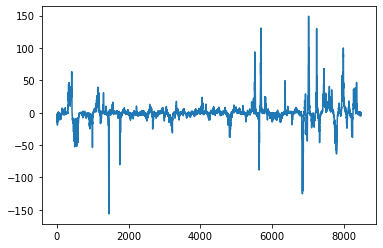

In [26]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.show()

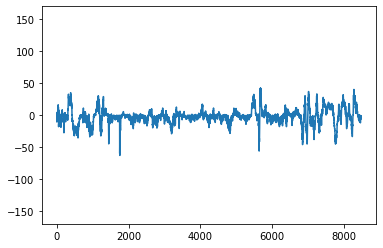

In [49]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.ylim(-170, 170)
plt.show()

In [42]:
import numpy as np
import matplotlib.pylab as plt

def running_mean(x, N):
        cumsum = np.cumsum(np.insert(x, 0, 0)) 
        return (cumsum[N:] - cumsum[:-N]) / float(N)

def get_smoothness_score(series):
    
    smooth = running_mean(series, 9)
    diff = series[4:-4] - smooth
    
    smoothness = 1/np.mean(np.abs(diff))
    print(smoothness)
    return smoothness


#time = np.linspace(0, 100, 100)
#clean = np.sin(time/100)
#noise = np.random.normal(0,0.1,100)
#noisy = clean+noise

#get_smoothness_score(noisy)

#plt.plot(time, noisy)
#plt.show()

In [43]:
get_smoothness_score(ground_truth)

3.731796918360046


3.731796918360046

In [44]:
get_smoothness_score(predictions_list)

0.6985829736952368


0.6985829736952368

12.58806539124424


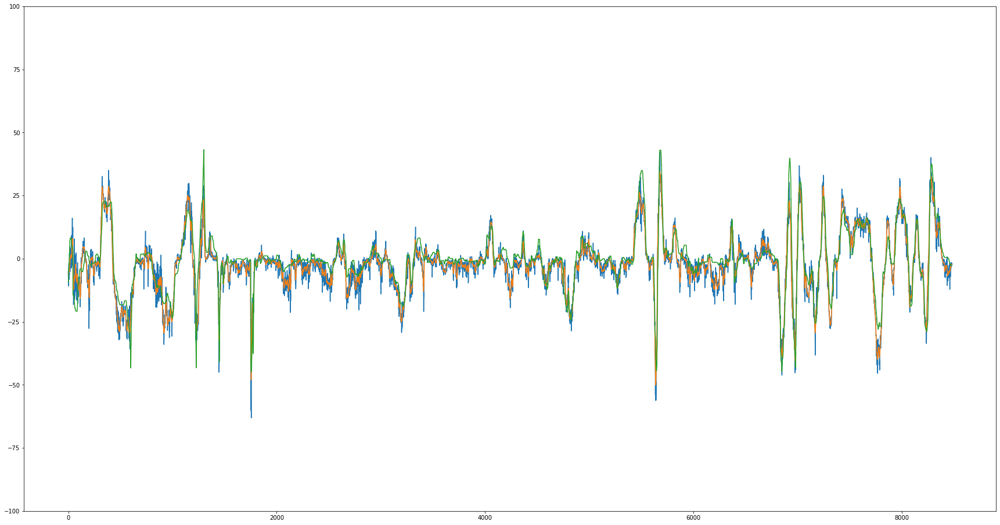

In [53]:
idxs = np.linspace(0, len(ground_truth), len(ground_truth))

plt.figure(figsize=(30,16))

#plt.show()
plt.plot(idxs, predictions_list)

plt.ylim(-100,100)
smooth_idxs = idxs[4:-4]
smooth = running_mean(predictions_list, 9)
plt.plot(smooth_idxs, smooth)

super_smooth_idxs = idxs[20:-20]
super_smooth = running_mean(predictions_list, 41)
#plt.plot(super_smooth_idxs, super_smooth)

get_smoothness_score(super_smooth)


plt.plot(idxs, ground_truth)

plt.show()

# Test Shift-Verhalten:

In [ ]:
from matplotlib import pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib as mpl

mpl.rcParams['figure.figsize'] = [12, 12]
mpl.rcParams['figure.dpi'] = 72

def show_crop(index, shift):
    frame = val_set.get_cropped_frame(index, shift)[0]
    frame_arr = img_to_array(frame)/255
    plt.imshow(frame_arr)
    plt.show()
    
crop_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)
shift_slider = widgets.IntSlider(min=-100, max=100, continuous_update=False)

interact(show_crop, index=crop_slider, shift = shift_slider);

In [ ]:
gui = AutopilotGUI()

predictions_lists = []
render_list = []

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '_shift_behaviour.avi',fourcc, 15.0, (848,170))

frames = range(0, val_set.get_batch_size()*len(val_set)-1, 50)

shifts = range(-100,100,4)


for frame_idx in frames:
    predictions_lists.append([])
    for shift in shifts:
        cropped_sample = val_set.get_cropped_frame(frame_idx, shift, offset=0)
        cropped_frame = cropped_sample[0]
        actual_swa = cropped_sample[1]['steering_wheel_angle']*90
        test_data = np.expand_dims(cropped_frame, axis=0)
        predictions = loaded_model.predict(test_data)
        predicted_swa = predictions[0][0]*90
        predictions_lists[-1].append({'shift':shift, 'actual':actual_swa, 'predicted':predicted_swa})



        gui.set_frame(cropped_frame)
        gui.set_show_overlay(True)
        gui.set_engaged(False)
        gui.set_recording(False)

        gui.set_timestring('')

        velocity = cropped_sample[1]['speed']
        gui.set_velocity(velocity)

        gui.set_actual_swa(actual_swa)
        gui.set_predicted_swa(predicted_swa)

        print("Ground-truth: " +str(actual_swa))
        print("Prediction: " + str(predicted_swa))

        gui.render()
        frame = gui.get_rendered_gui()

        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        out.write(rgb_frame.astype(np.uint8))
    
out.release()

In [ ]:
print(predictions_lists)

In [ ]:
good_predictions = []
for prediction_list in predictions_lists:
    predictions = [element['predicted'] for element in prediction_list]
    ground_truths = [element['actual'] for element in prediction_list]
    base_pred = predictions[len(predictions)//2]
    base_gt = ground_truths[len(ground_truths)//2]
    error = abs(base_gt - base_pred)
    
    linewidth = 0.2
    if error < 10:
        linewidth = 0.2
        good_predictions.append(predictions)
    #plt.plot(shifts, np.asarray(prediction_list), linewidth = 0.5)
    plt.plot(shifts, np.asarray(predictions)-base_pred, linewidth = linewidth)

median_predictions = np.median(good_predictions, axis=0)
plt.plot(shifts, np.asarray(median_predictions)-median_predictions[len(median_predictions)//2], linewidth = 3)

plt.xlabel("shift (px)")
plt.ylabel("swa offset (deg)")
plt.grid()
plt.show()



# Lenkrad Winkelgeschwindigkeit

In [ ]:
speeds = velocity_list[:]
angles = ground_truth[:] # deg
fps = 15
angular_speed = np.diff(angles)*fps # deg/s


idxs = range(1, len(angles)+1)
print(len(angles))
#print(angles)
print(len(angular_speed))
#print(angular_speed)

plt.plot(idxs, angles)
#plt.plot(idxs[:len(angular_speed)], angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa (deg)")
plt.show()


In [ ]:
speeds = np.asarray(speeds)
abs_angles = abs(np.asarray(angles))
abs_angular_speed = abs(angular_speed)

In [ ]:
# get indices where abs(swa) > 45
invalid_angle_indxs = np.argwhere(abs_angles>45)

# get indices where speed < 25
invalid_speed_indxs = np.argwhere(speeds[:-1]<25)

In [ ]:
# remove samples from angular speed array
abs_angular_speed[invalid_angle_indxs] = 0
abs_angular_speed[invalid_speed_indxs] = 0

In [ ]:
plt.plot(idxs[:len(abs_angular_speed)], abs_angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa abs(deg/s)")
plt.show()

In [ ]:
qs = list(range(60,90,5))
qs.extend(list(range(90,101,1)))

for q in qs:
    print("{}th: {} deg/s".format(q, round(np.percentile(abs_angular_speed, q=q),1)))